In [1]:
%reload_ext autoreload

%autoreload 2

import matplotlib.pyplot as plt
import cv2
import numpy as np
import glob

%aimport -plt
%aimport -np
%aimport -glob
%aimport -cv2

from os import listdir
from os.path import isfile, join

display_chessboards = False
display_undistorts = False
display_example_undistorts = True
%matplotlib inline




In [2]:
import os
import sys
nb_dir = os.path.split(os.getcwd())[0]
nb_dir = os.getcwd()
if nb_dir not in sys.path:
    sys.path.append(nb_dir)
import lane_finding
print(dir(lane_finding))


['CentroidFinder', 'LineFinder', 'RollingAverageTracker', 'Undistorter', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'add_lane_position_and_curve_to_img', 'binarise', 'centroid_finder', 'cv2', 'destination_vertices', 'draw_line_of_points', 'identify_lane_curviture', 'identify_lane_position_from_centroids', 'lane_position_finder', 'line_finder', 'line_fitter', 'merge_line_image_and_image', 'normalize_centroids', 'np', 'polynomialize_centroids', 'polynomialize_line', 'rolling_average_tracker', 'scipy', 'threshold_color', 'threshold_combined_images', 'threshold_sobel', 'threshold_stacked_images', 'thresholder', 'ui', 'undistorter', 'vertices', 'warp_perspective_for_road', 'warper']


In [3]:
calibration_path = '.\\camera_cal'
calibration_imgs = [cv2.imread(join(calibration_path, f)) for f in listdir(calibration_path) if isfile(join(calibration_path, f))]

undistorter = lane_finding.Undistorter(calibration_imgs)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


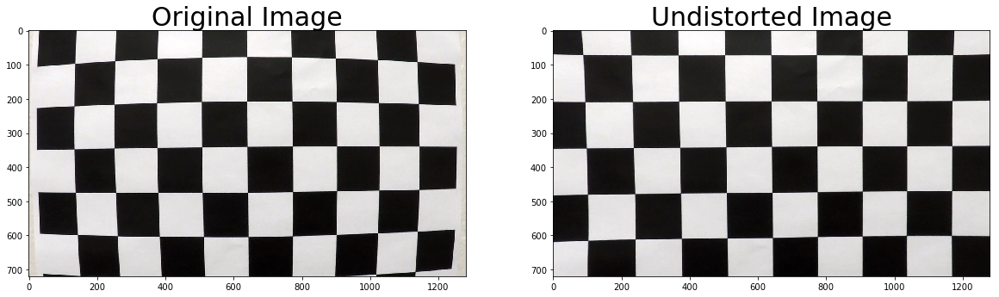

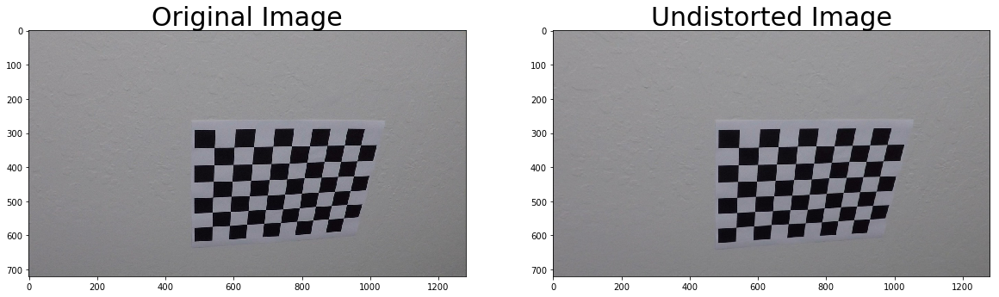

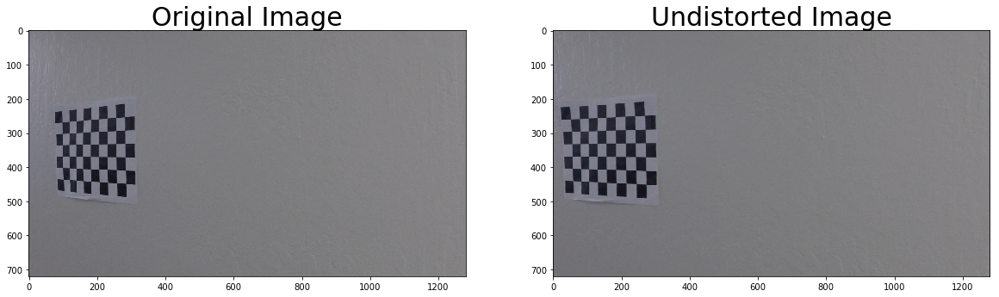

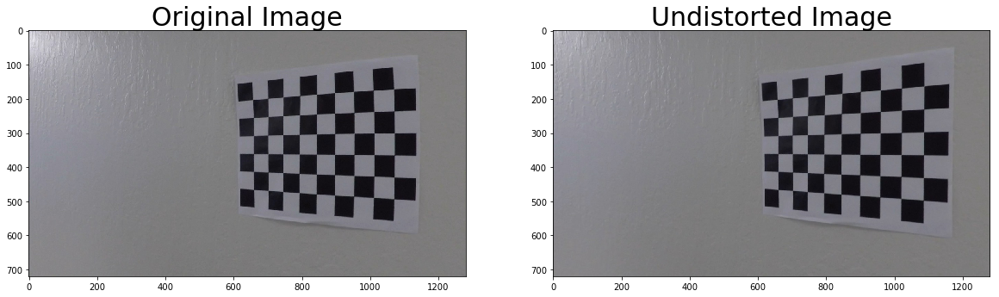

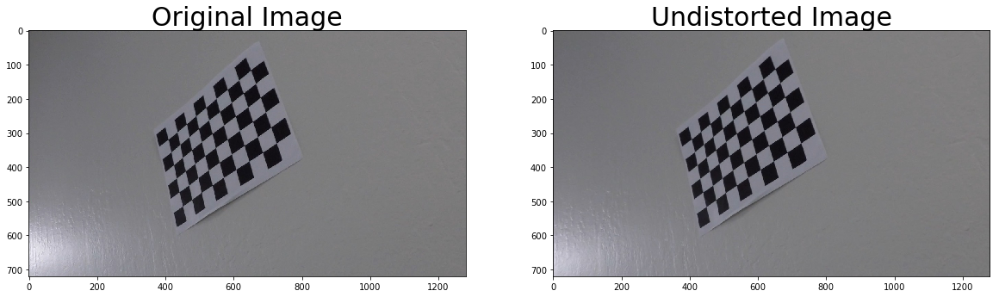

...

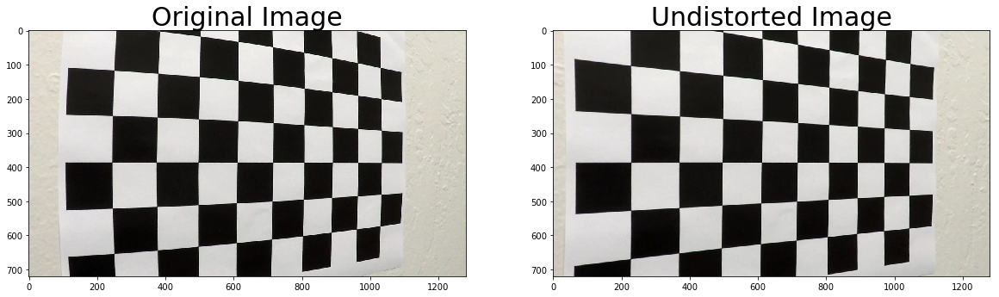

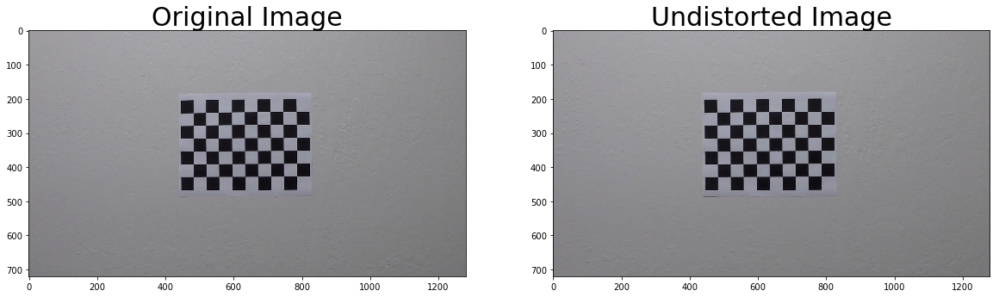

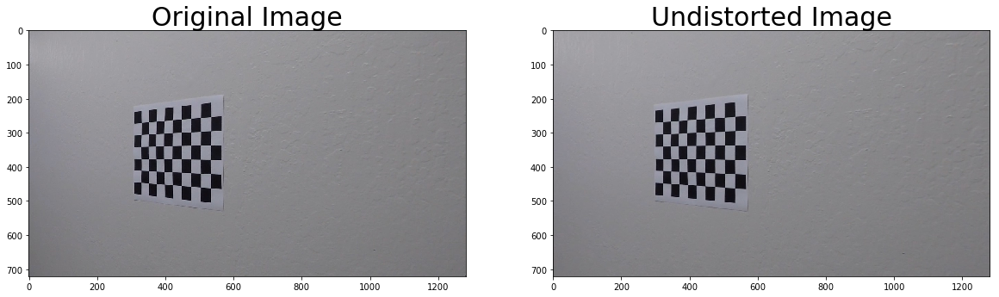

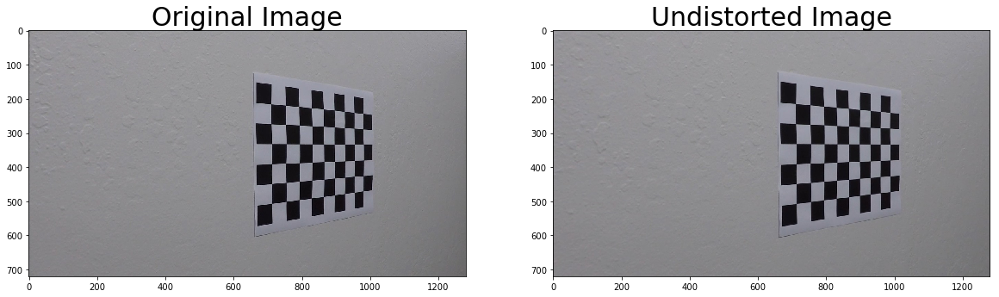

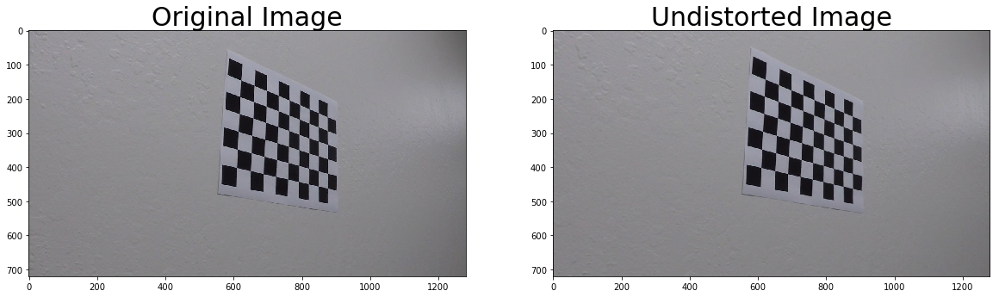

In [4]:
undistorted_images = []
for img in calibration_imgs:
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = undistorter.undistort(img)
    undistorted_images.append(dst)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    plt.figure()

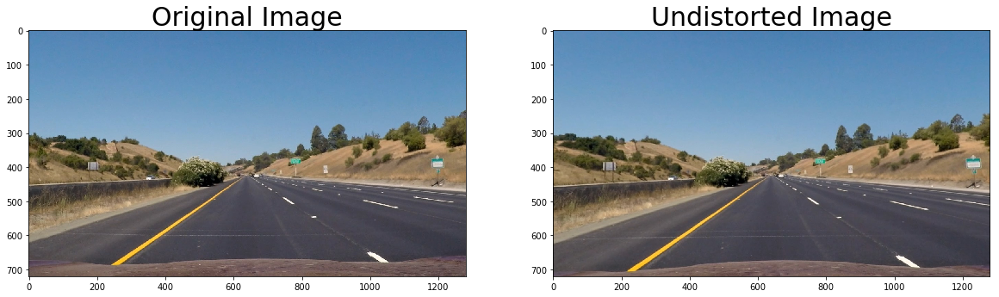

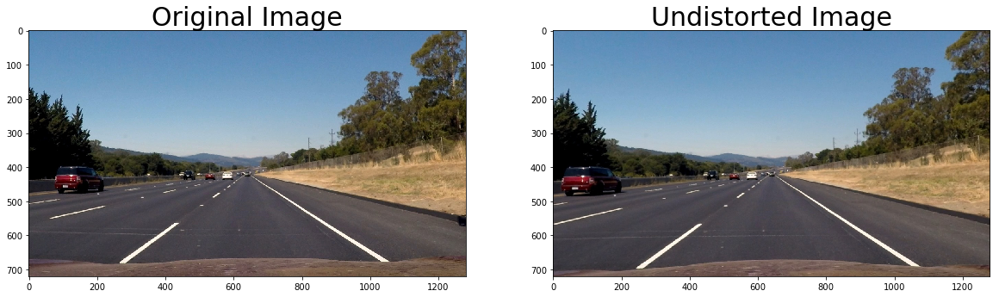

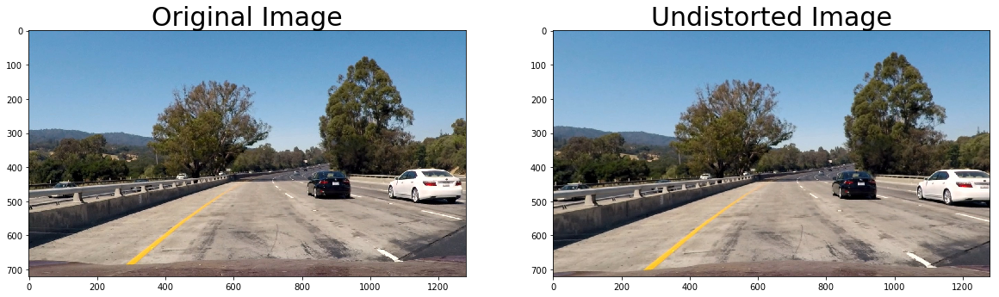

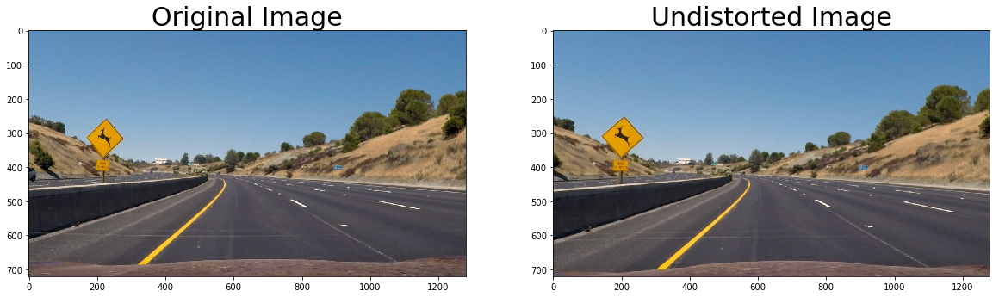

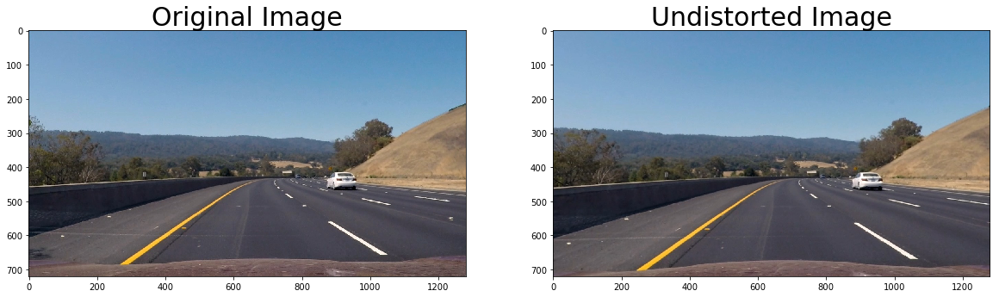

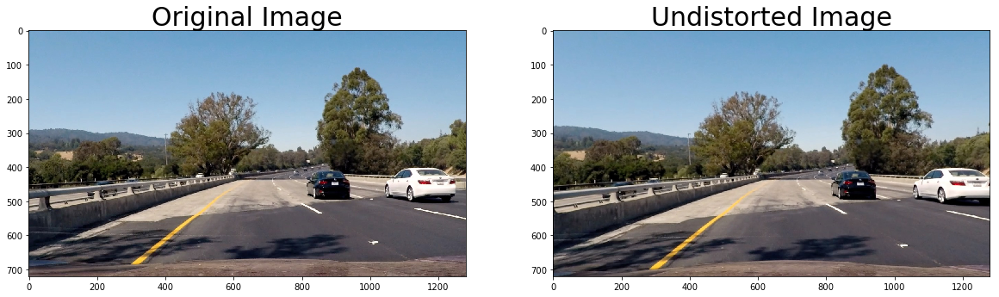

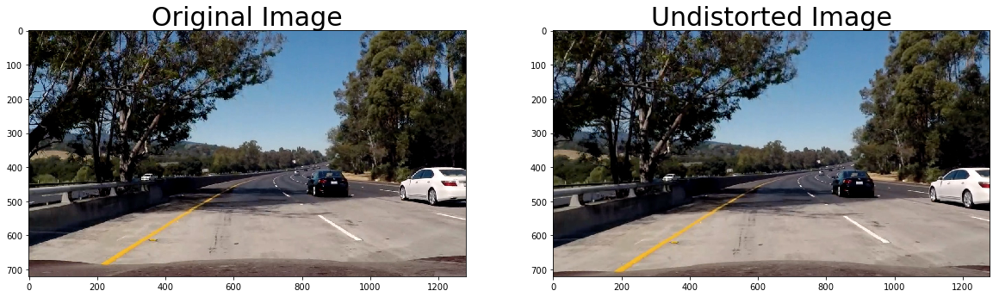

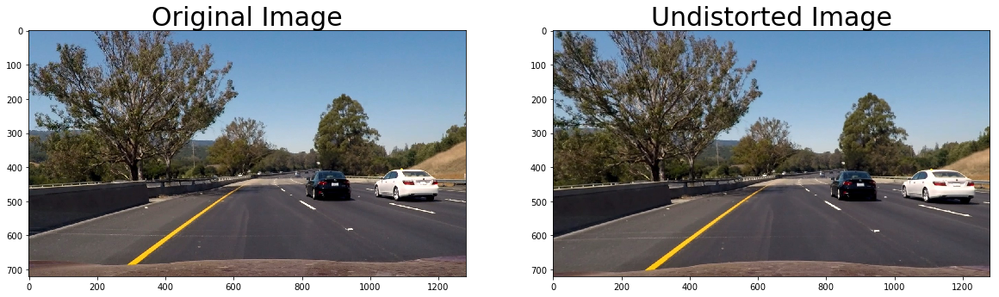

In [5]:
test_path = '.\\test_images'
test_imgs = [cv2.imread(join(test_path, f)) for f in listdir(test_path) if isfile(join(test_path, f))]
undistorted_images = []
for img in test_imgs:
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = undistorter.undistort(img)
    undistorted_images.append(dst)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    plt.figure()

In [16]:
# def draw_line_of_points(points, line_image, color = (255,0,255)):
#     previous_point = None
#     for point in points:
#         point = (int(point[0]), int(point[1]))
#         if previous_point is None:
#             previous_point = point
#             continue
#         cv2.arrowedLine(line_image, previous_point, point, color, 10)
#         previous_point = point

# def merge_line_image_and_image(img, line_image, α=0.8, β=0.3, λ=0.):
#     r_M = cv2.getPerspectiveTransform(destination_vertices(img), vertices(img))
#     line_image_s = (line_image.shape[1], img.shape[0])
#     r_line_image = cv2.warpPerspective(line_image, r_M, line_image_s, flags=cv2.INTER_LINEAR)    
#     return cv2.addWeighted(img, α, r_line_image, β, λ)
    
# def wh_for_i(i):
#     return (i - 1) * window_height + window_height/2

# def normalize_centroids(centroids):
#     base = centroids[0][0] # Get x pos of first centroid
#     return [(centroid[0] - base, centroid[1]) for centroid in centroids], base

# def polynomialize_line(centroids, offset=0):
#     x = [centroid[0] for centroid in centroids]
#     y = [centroid[1] for centroid in centroids]
#     p = np.polyfit(x, y, 2)
#     print(p)
#     equation = np.poly1d(p)
#     return [(offset + equation(centroid[1]), centroid[1]) for centroid in centroids], equation

# def polynomialize_centroids(left_centroids, right_centroids):
#     left_centroids, left_base = normalize_centroids(left_centroids)
#     right_centroids, right_base = normalize_centroids(right_centroids)
    
#     left_centroids,l_eq = polynomialize_line(left_centroids, offset = left_base)
#     right_centroids, r_eq = polynomialize_line(right_centroids, offset = right_base)
#     return left_centroids, right_centroids
    
# #     centroids = left_centroids + right_centroids
# #     x = [centroid[0] for centroid in centroids]
# #     y = [centroid[1] for centroid in centroids]
# #     l_p = np.polyfit(x, y, 2)
# #     equation = np.poly1d(p)
# #     left_centroids = [(left_base + equation(centroid[1]), centroid[1]) for centroid in left_centroids]
# #     right_centroids = [(right_base + equation(centroid[1]), centroid[1]) for centroid in right_centroids] 
# #     return left_centroids, right_centroids#normalize_centroids(left_centroids), normalize_centroids(right_centroids)

# def mix_centroids(new_centroids, previous_centroids, mix_factor = 0.8):
#     centroids = []
#     change_factor = 0
#     for new_point, old_point in zip(new_centroids, previous_centroids):
#         x_delta = new_point[0] - old_point[0]
#         change_factor = change_factor + x_delta
#         x = new_point[0] - (new_point[0] - old_point[0]) * mix_factor
#         y = new_point[1] - (new_point[1] - old_point[1]) * mix_factor
#         centroids.append((int(x),int(y)))
#     return centroids, change_factor

# previous_left_centroids = None
# previous_right_centroids = None

# def restart_state():
#     global previous_left_centroids
#     global previous_right_centroids
#     previous_left_centroids = None
#     previous_right_centroids = None

# def identify_lines(img, draw_change_factor=False):
#     global previous_left_centroids
#     global previous_right_centroids
#     centroids = find_window_centroids(img, window_width, window_height, margin)
#     #out = draw_window_centroids(img, centroids)
#     cl = len(centroids)
#     left_starting_point =  (int(centroids[0][0]), img.shape[0])
#     right_starting_point =  (int(centroids[0][1]), img.shape[0])

#     left_centroids = [left_starting_point] + [(int(level[0]),int(wh_for_i(cl-i))) for i, level in enumerate(centroids)]
#     right_centroids = [right_starting_point] + [(int(level[1]), int(wh_for_i(cl-i))) for i, level in enumerate(centroids)]
#     #img = draw_window_centroids(img, centroids)

#     img = np.dstack(( img, np.zeros_like(img), np.zeros_like(img)))
    
#     if previous_left_centroids is not None:
#         left_centroids, cf_left = mix_centroids(left_centroids, previous_left_centroids)
#         right_centroids, cf_right = mix_centroids(right_centroids, previous_right_centroids)
#         if draw_change_factor:
#             cv2.putText(img,"L: {0}, R: {1}".format(cf_left, cf_right), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 2, 255)
            
#     left_centroids, right_centroids = polynomialize_centroids(left_centroids, right_centroids)
    
#     draw_line_of_points(left_centroids, img)
#     draw_line_of_points(right_centroids, img)
    
#     all_points = np.int_([np.concatenate((left_centroids,np.flipud(right_centroids)))])
#     cv2.fillPoly(img, all_points, (128,128, 0))
#     previous_left_centroids = left_centroids
#     previous_right_centroids = right_centroids
    
#     lane_position = identify_lane_position_from_centroids(centroids)
#     cv2.putText(img,"LP: {0}m off center".format(lane_position), (50,150), cv2.FONT_HERSHEY_SIMPLEX, 2, 255)
    
#     return img
    
# window_width = 50 
# window_height = 36 # Break image into 9 vertical layers since image height is 720
# margin = 80 # How much to slide left and right for searching

# def window_mask(width, height, img_ref, center,level):
#     output = np.zeros_like(img_ref)
#     output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
#     return output

# def identify_lane_position_from_centroids(centroids, midpoint=640):
#     width_of_lane = 3.7 #metres
    
#     left_x_pos = centroids[0][0]
#     right_x_pos = centroids[0][1]
    
#     width_of_lane_in_pixels = right_x_pos - left_x_pos
    
#     pixels_to_meter = width_of_lane_in_pixels
    
#     distance_from_midpoint_in_pixels = midpoint - (right_x_pos - left_x_pos) / 2 + left_x_pos
#     return  (width_of_lane_in_pixels / width_of_lane) / distance_from_midpoint_in_pixels

# previous_l_centers = []
# previous_r_centers = []
# state = {
#     "excluding_l": False,
#     "excluding_r": False
# }

# def find_window_centroids(warped, window_width, window_height, margin):
#     global previous_l_centers
#     global previous_r_centers
    
#     window_centroids = [] # Store the (left,right) window centroid positions per level
#     window = np.ones(window_width) # Create our window template that we will use for convolutions
    
#     # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
#     # and then np.convolve the vertical image slice with the window template 
    
#     # Sum quarter bottom of image to get slice, could use a different ratio
#     l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    
#     if np.average(l_sum) < 60: #Heuristic for busy bottom. Indiciates shadows or other artifacts. Ignore if their.
#         l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
#         previous_l_centers.append(l_center)
#         previous_l_centers = previous_l_centers[-5:]

#     r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)

#     if np.average(r_sum) < 60: #Heuristic for busy bottom. Indiciates shadows or other artifacts. Ignore if their.
#         r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
#         previous_r_centers.append(r_center)
#         previous_r_centers = previous_r_centers[-5:]
    
#     state['excluding_l'] = np.average(r_sum) > 40
#     state['excluding_r'] = np.average(l_sum) > 40
        
#     l_center = np.average(previous_l_centers)
#     r_center = np.average(previous_r_centers)
    
#     # Add what we found for the first layer
#     window_centroids.append((l_center,r_center))
    
#     # Go through each layer looking for max pixel locations
#     for level in range(1,(int)(warped.shape[0]/window_height)):
#         # convolve the window into the vertical slice of the image
#         image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
#         conv_signal = np.convolve(window, image_layer)
#         # Find the best left centroid by using past left center as a reference
#         # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
#         offset = window_width/2
#         l_min_index = int(max(l_center+offset-margin,0))
#         l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
#         subsection = conv_signal[l_min_index:l_max_index]
#         if len(subsection) != 0:
#             l_center = np.argmax(conv_signal[l_min_index:l_max_index])
#         else:
#             l_center = margin
        
#         # Find the best right centroid by using past right center as a reference
#         r_min_index = int(max(r_center+offset-margin,0))
#         r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
#         subsection = conv_signal[r_min_index:r_max_index]
#         if len(subsection) != 0:
#             r_center = np.argmax(conv_signal[r_min_index:r_max_index])
#         else:
#             r_center = margin
            
#         if l_center == 0 and r_center == 0:
#             l_center = margin
#             r_center = margin
#         elif l_center == 0:
#             l_center = r_center
#         elif r_center == 0:
#             r_center = l_center
            
#         l_center = l_center+l_min_index-offset
#         r_center = r_center+r_min_index-offset
#         # Add what we found for that layer
#         window_centroids.append((l_center,r_center))

#     return window_centroids

# def draw_window_centroids(warped, window_centroids):
#     print(window_centroids)
#     print(warped.shape)
#     if len(window_centroids) > 0:
#         # Points used to draw all the left and right windows
#         l_points = np.zeros_like(warped)
#         r_points = np.zeros_like(warped)

#         # Go through each level and draw the windows 	
#         for level in range(0,len(window_centroids)):
#             # Window_mask is a function to draw window areas
#             l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
#             r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
#             # Add graphic points from window mask here to total pixels found 
#             l_points[(l_points == 255) | ((l_mask == 1) ) ] = 128
#             r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
            
#         # Draw the results
#         template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
#         zero_channel = np.zeros_like(template) # create a zero color channel
#         template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
#         warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
#         output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

#     # If no window centers found, just display orginal road image
#     else:
#         print("skipping")
#         output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
#     return output

def handle_image_func():
    line_identifier = lane_finding.LineFinder()
    
    def handle_image(img):
        img = undistorter.undistort(img)
        warped = lane_finding.warp_perspective_for_road(img)
        
        thresheld_img =  lane_finding.threshold_combined_images(warped)

        lines, lane_position, curve = line_identifier.identify_lines(thresheld_img)
        result = lane_finding.merge_line_image_and_image(img, lines) 
        result = lane_finding.add_lane_position_and_curve_to_img(result, lane_position, curve)
        
        
        return result
    return handle_image
    
def pad_channels_and_merge_images(images):
    def pad(img):
        if len(img.shape) == 2:
            return np.dstack(( img, img, img))
        return img
    return np.hstack([pad(img) for img in images])

def handle_test_image_func():
    line_identifier = lane_finding.LineFinder()
    
    def handle_test_image(img):

        warped = lane_finding.warp_perspective_for_road(img)
        
        thresheld_img =  lane_finding.threshold_combined_images(warped)
        thresheld_img_stacked = lane_finding.threshold_stacked_images(warped)

        lines, lane_position, curve = line_identifier.identify_lines(thresheld_img)
        result = lane_finding.merge_line_image_and_image(img, lines) 
        result = lane_finding.add_lane_position_and_curve_to_img(result, lane_position, curve)
        
        
        return pad_channels_and_merge_images([warped, thresheld_img_stacked, lines, result]) 
    return handle_test_image

def handle_threshold_image(img):
    warped = warp_perspective_for_road(img)
    thresheld_img = threshold_images(warped, image='stacked')
    #lines = identify_lines(thresheld_img)
    #result = merge_line_image_and_image(img, lines)
    return thresheld_img

def handle_lines_image(img):
    try:
        warped = warp_perspective_for_road(img)
        thresheld_img = threshold_images(warped)
        lines = identify_lines(thresheld_img, draw_change_factor=True)
        return lines
    except Exception as e:
        print("Exception")
        return img
    #result = merge_line_image_and_image(img, lines)
    #lines = np.array(cv2.merge((lines,lines,lines)),np.uint8)
    return lines

In [7]:
def show_image(img, title=''):
    plt.imshow(img)
    fig = plt.figure()
    fig.suptitle(title)

0.00789605034722
0.0250368923611
Shape1 (720, 1280, 3)
Shape2 (720, 1280)
[  5.27412808e-06  -3.58851675e-03  -6.41893370e+00]
[ -1.04559589e-04   8.87123111e-02  -2.21298274e+01]
lane curve
[(292.66103896103897, 702), (292.53048530416953, 666), (292.41360218728641, 630), (292.31038961038962, 594), (292.22084757347915, 558), (292.144976076555, 522), (292.08277511961722, 486), (292.03424470266577, 450), (291.99938482570059, 414), (291.97819548872178, 378), (291.9706766917293, 342), (291.97682843472319, 306), (291.99665071770335, 270), (292.03014354066983, 234), (292.07730690362268, 198), (292.13814080656186, 162), (292.21264524948737, 126), (292.30082023239919, 90), (292.40266575529733, 54), (292.5181818181818, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.66103896  292.5304853   292.41360219  292.31038961  292.22084757
  292.14497608  292.08277512  292.0342447   291.99938483  291.97819549
  291.97067669  291.97682843  291.99665072  292.03

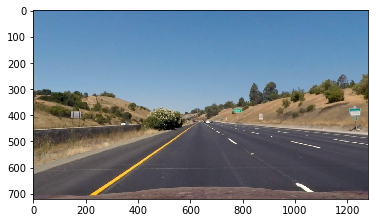

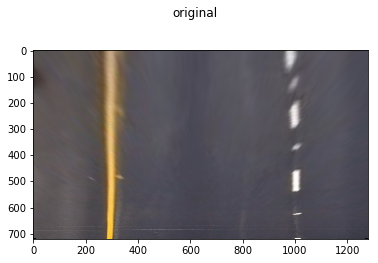

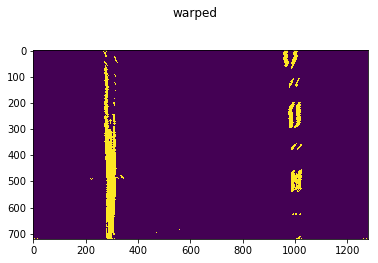

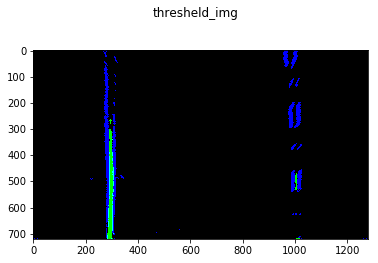

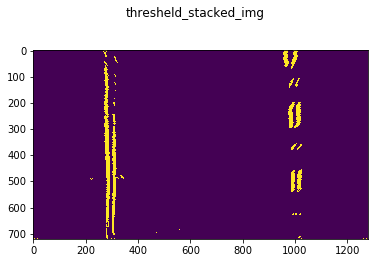

...

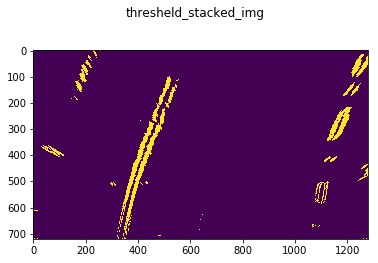

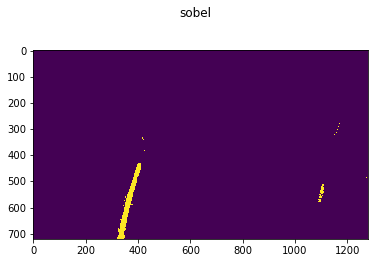

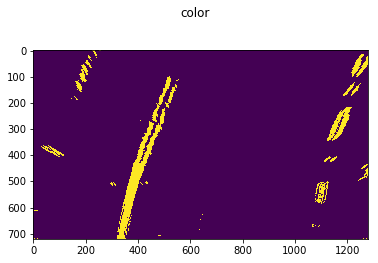

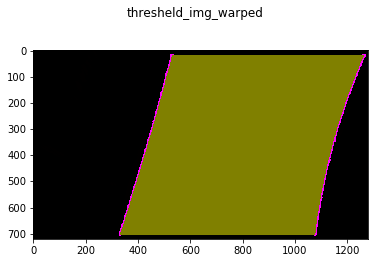

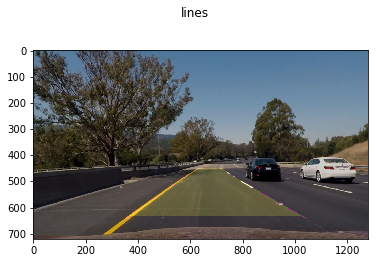

In [19]:
for img in undistorted_images:
    img = img.copy()

    show_image(img,title='original')
    undistorter
    warped = lane_finding.warp_perspective_for_road(img)
    show_image(warped,title='warped')

    thresheld_img = lane_finding.threshold_combined_images(warped)
    
    show_image(thresheld_img,title='thresheld_img')

    thresheld_stacked_img = lane_finding.threshold_stacked_images(warped)
    print("Shape1", thresheld_stacked_img.shape)
    print("Shape2", thresheld_img.shape)
    
    show_image(thresheld_stacked_img,title='thresheld_stacked_img')

    sobel = lane_finding.threshold_sobel(warped)
    show_image(sobel,title='sobel')

    color = lane_finding.threshold_color(warped)
    show_image(color,title='color')

    thresheld_img = lane_finding.threshold_combined_images(warped)

    show_image(thresheld_img,title='thresheld_img_warped')

    line_identifier = lane_finding.LineFinder()
    lines = line_identifier.identify_lines(thresheld_img)[0]
    
    show_image(lines,title='lines')

    result = lane_finding.merge_line_image_and_image(img, lines)
    plt.imshow(result)
    plt.figure()


In [17]:
from moviepy.editor import VideoFileClip, clips_array

def run_video(input, output):
    clip2 = VideoFileClip(input)
    yellow_clip = clip2.fl_image(handle_image_func())
    %time yellow_clip.write_videofile(output, audio=False)
    del yellow_clip

def run_test_video(input, output):
    print(input)
    clip1 = VideoFileClip(input).subclip(37, 50)
    result_clip = clip1.fl_image(handle_test_image_func())
    %time result_clip.write_videofile(output, audio=False)
    del result_clip
input = './project_video_2_2.mp4'
output = './project_video_outcome_8.mp4'
try:
    run_video(input, output)
    #run_test_video(input, output)
except Exception as e: 
    raise e

[ -4.42235640e-04   6.26889193e-01  -2.19709552e+02]
[ -3.22425030e-04   5.40040758e-01  -2.15734450e+02]
lane curve
[(348.43116883116897, 702), (347.64237867395775, 666), (345.70731373889282, 630), (342.62597402597413, 594), (338.39835953520173, 558), (333.02447026657558, 522), (326.50430622009571, 486), (318.83786739576215, 450), (310.02515379357487, 414), (300.06616541353378, 378), (288.9609022556391, 342), (276.7093643198906, 306), (263.31155160628839, 270), (248.76746411483248, 234), (233.07710184552286, 198), (216.24046479835951, 162), (198.2575529733424, 126), (179.12836637047161, 90), (158.85290498974709, 54), (137.43116883116883, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.43116883  347.64237867  345.70731374  342.62597403  338.39835954
  333.02447027  326.50430622  318.8378674   310.02515379  300.06616541
  288.96090226  276.70936432  263.31155161  248.76746411  233.07710185
  216.2404648   198.25755297  179.12836637  158.8529

  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

[ -4.42235640e-04   6.26889193e-01  -2.19709552e+02]
[ -3.22425030e-04   5.40040758e-01  -2.15734450e+02]
lane curve
[(348.43116883116897, 702), (347.64237867395775, 666), (345.70731373889282, 630), (342.62597402597413, 594), (338.39835953520173, 558), (333.02447026657558, 522), (326.50430622009571, 486), (318.83786739576215, 450), (310.02515379357487, 414), (300.06616541353378, 378), (288.9609022556391, 342), (276.7093643198906, 306), (263.31155160628839, 270), (248.76746411483248, 234), (233.07710184552286, 198), (216.24046479835951, 162), (198.2575529733424, 126), (179.12836637047161, 90), (158.85290498974709, 54), (137.43116883116883, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.43116883  347.64237867  345.70731374  342.62597403  338.39835954
  333.02447027  326.50430622  318.8378674   310.02515379  300.06616541
  288.96090226  276.70936432  263.31155161  248.76746411  233.07710185
  216.2404648   198.25755297  179.12836637  158.8529

  0%|                                                                                 | 1/1261 [00:00<03:00,  6.97it/s]

[ -4.42103786e-04   6.27023999e-01  -2.19830853e+02]
[ -3.36313567e-04   5.58227640e-01  -2.21283288e+02]
lane curve
[(348.46948051948073, 702), (347.66934381408083, 666), (345.72327409432688, 630), (342.63127136021888, 594), (338.39333561175675, 558), (333.00946684894058, 522), (326.47966507177034, 486), (318.80393028024605, 450), (309.98226247436776, 414), (300.01466165413535, 378), (288.90112781954883, 342), (276.64166097060831, 306), (263.23626110731368, 270), (248.68492822966505, 234), (232.98766233766233, 198), (216.14446343130552, 162), (198.15533151059469, 126), (179.02026657552975, 90), (158.73926862611077, 54), (137.31233766233774, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.46948052  347.66934381  345.72327409  342.63127136  338.39333561
  333.00946685  326.47966507  318.80393028  309.98226247  300.01466165
  288.90112782  276.64166097  263.23626111  248.68492823  232.98766234
  216.14446343  198.15533151  179.02026658  158.7

  0%|▏                                                                                | 2/1261 [00:00<03:02,  6.89it/s]

[ -4.40477597e-04   6.26417053e-01  -2.20043182e+02]
[ -3.45675145e-04   5.74763297e-01  -2.27869455e+02]
lane curve
[(348.63246753246779, 702), (347.77409432672607, 666), (345.77400318979284, 630), (342.63219412166796, 594), (338.34866712235146, 558), (332.92342219184331, 522), (326.35645933014359, 486), (318.64777853725229, 450), (309.7973798131693, 414), (299.80526315789473, 378), (288.67142857142858, 342), (276.39587605377079, 306), (262.97860560492143, 270), (248.41961722488037, 234), (232.71891091364776, 198), (215.87648667122352, 162), (197.89234449760767, 126), (178.76648439280018, 90), (158.49890635680111, 54), (137.08961038961041, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.63246753  347.77409433  345.77400319  342.63219412  338.34866712
  332.92342219  326.35645933  318.64777854  309.79737981  299.80526316
  288.67142857  276.39587605  262.9786056   248.41961722  232.71891091
  215.87648667  197.8923445   178.76648439  158.49

  0%|▏                                                                                | 3/1261 [00:00<03:02,  6.88it/s]

[ -4.45531970e-04   6.30870737e-01  -2.21223659e+02]
[ -3.65760782e-04   5.99563302e-01  -2.36478828e+02]
lane curve
[(348.08766233766244, 702), (347.31787423103225, 666), (345.39326725905687, 630), (342.31384142173624, 594), (338.07959671907048, 558), (332.69053315105953, 522), (326.14665071770332, 486), (318.44794941900204, 450), (309.59442925495557, 414), (299.58609022556391, 378), (288.42293233082705, 342), (276.10495557074501, 306), (262.63215994531788, 270), (248.00454545454545, 234), (232.22211209842789, 198), (215.28485987696513, 162), (197.19278879015724, 126), (177.94589883800413, 90), (157.54419002050585, 54), (135.98766233766239, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.08766234  347.31787423  345.39326726  342.31384142  338.07959672
  332.69053315  326.14665072  318.44794942  309.59442925  299.58609023
  288.42293233  276.10495557  262.63215995  248.00454545  232.2221121
  215.28485988  197.19278879  177.94589884  157.54

  0%|▎                                                                                | 4/1261 [00:00<03:03,  6.84it/s]

[ -4.46367040e-04   6.32495380e-01  -2.22014320e+02]
[ -3.76616696e-04   6.16297689e-01  -2.43878477e+02]
lane curve
[(348.02597402597416, 702), (347.2388243335613, 666), (345.2946912736387, 630), (342.1935748462065, 594), (337.93547505126458, 558), (332.52039188881298, 522), (325.94832535885172, 486), (318.21927546138073, 450), (309.33324219640008, 414), (299.29022556390976, 378), (288.09022556390971, 342), (275.73324219640006, 306), (262.21927546138068, 270), (247.54832535885163, 234), (231.72039188881291, 198), (214.73547505126447, 162), (196.59357484620639, 126), (177.29469127363862, 90), (156.83882433356115, 54), (135.22597402597401, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.02597403  347.23882433  345.29469127  342.19357485  337.93547505
  332.52039189  325.94832536  318.21927546  309.3332422   299.29022556
  288.09022556  275.7332422   262.21927546  247.54832536  231.72039189
  214.73547505  196.59357485  177.29469127  156.8388

  0%|▎                                                                                | 5/1261 [00:00<03:06,  6.74it/s]

[ -4.44257389e-04   6.33315612e-01  -2.22873923e+02]
[ -4.03822407e-04   6.46683628e-01  -2.53169207e+02]
lane curve
[(348.78181818181827, 702), (347.86124401913884, 666), (345.78915470494422, 630), (342.56555023923454, 594), (338.19043062200956, 558), (332.66379585326956, 522), (325.98564593301433, 486), (318.15598086124402, 450), (309.17480063795853, 414), (299.04210526315785, 378), (287.7578947368421, 342), (275.32216905901112, 306), (261.73492822966506, 270), (246.99617224880382, 234), (231.10590111642742, 198), (214.06411483253586, 162), (195.87081339712918, 126), (176.52599681020735, 90), (156.02966507177035, 54), (134.3818181818182, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.78181818  347.86124402  345.7891547   342.56555024  338.19043062
  332.66379585  325.98564593  318.15598086  309.17480064  299.04210526
  287.75789474  275.32216906  261.73492823  246.99617225  231.10590112
  214.06411483  195.8708134   176.52599681  156.029

  0%|▍                                                                                | 6/1261 [00:00<03:06,  6.74it/s]

[ -4.41752178e-04   6.34080783e-01  -2.24032015e+02]
[ -4.10634822e-04   6.56747298e-01  -2.57765678e+02]
lane curve
[(349.3954545454547, 702), (348.32395762132614, 666), (346.10743905217601, 630), (342.74589883800422, 594), (338.23933697881068, 558), (332.58775347459562, 522), (325.7911483253589, 486), (317.84952153110055, 450), (308.76287309182044, 414), (298.5312030075188, 378), (287.15451127819551, 342), (274.63279790385053, 306), (260.9660628844839, 270), (246.15430622009566, 234), (230.19752791068578, 198), (213.09572795625425, 162), (194.84890635680105, 126), (175.45706311232624, 90), (154.92019822282975, 54), (133.23831168831165, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.39545455  348.32395762  346.10743905  342.74589884  338.23933698
  332.58775347  325.79114833  317.84952153  308.76287309  298.53120301
  287.15451128  274.6327979   260.96606288  246.15430622  230.19752791
  213.09572796  194.84890636  175.45706311  154.92019

  1%|▍                                                                                | 7/1261 [00:01<03:05,  6.76it/s]

[ -4.40345744e-04   6.35323789e-01  -2.25122377e+02]
[ -4.33753084e-04   6.81203640e-01  -2.64377623e+02]
lane curve
[(349.87077922077941, 702), (348.68526999316487, 666), (346.35838459785839, 630), (342.89012303485993, 594), (338.28048530416959, 558), (332.52947140578726, 522), (325.63708133971295, 486), (317.60331510594665, 450), (308.42817270448847, 414), (298.11165413533831, 378), (286.65375939849616, 342), (274.05448849396214, 306), (260.31384142173613, 270), (245.43181818181813, 234), (229.4084187742082, 198), (212.24364319890634, 162), (193.93749145591249, 126), (174.48996354522669, 90), (153.90105946684895, 54), (132.17077922077925, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.87077922  348.68526999  346.3583846   342.89012303  338.2804853
  332.52947141  325.63708134  317.60331511  308.4281727   298.11165414
  286.6537594   274.05448849  260.31384142  245.43181818  229.40841877
  212.2436432   193.93749146  174.48996355  153.901

  1%|▌                                                                                | 8/1261 [00:01<03:05,  6.74it/s]

[ -4.27995494e-04   6.30086580e-01  -2.26019771e+02]
[ -4.23995947e-04   6.77645503e-01  -2.64081673e+02]
lane curve
[(351.38311688311694, 702), (349.7779220779222, 666), (347.06336295283666, 630), (343.2394395078606, 594), (338.30615174299385, 558), (332.26349965823647, 522), (325.11148325358852, 486), (316.85010252904988, 450), (307.47935748462061, 414), (296.99924812030076, 378), (285.40977443609017, 342), (272.71093643198901, 306), (258.90273410799728, 270), (243.98516746411482, 234), (227.95823650034174, 198), (210.82194121667806, 162), (192.57628161312374, 126), (173.22125768967879, 90), (152.75686944634319, 54), (131.18311688311695, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.38311688  349.77792208  347.06336295  343.23943951  338.30615174
  332.26349966  325.11148325  316.85010253  307.47935748  296.99924812
  285.40977444  272.71093643  258.90273411  243.98516746  227.9582365
  210.82194122  192.57628161  173.22125769  152.7568

  1%|▌                                                                                | 9/1261 [00:01<03:07,  6.68it/s]

[ -4.17139580e-04   6.26008835e-01  -2.27376512e+02]
[ -4.23380632e-04   6.78873320e-01  -2.63729947e+02]
lane curve
[(352.51363636363658, 702), (350.52060833902959, 666), (347.4463545226705, 630), (343.29087491455925, 594), (338.05416951469596, 558), (331.7362383230805, 522), (324.337081339713, 486), (315.85669856459333, 450), (306.29508999772162, 414), (295.65225563909775, 378), (283.92819548872183, 342), (271.12290954659375, 306), (257.23639781271356, 270), (242.26866028708133, 234), (226.21969696969694, 198), (209.08950786056047, 162), (190.8780929596719, 126), (171.5854522670312, 90), (151.21158578263839, 54), (129.75649350649351, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.51363636  350.52060834  347.44635452  343.29087491  338.05416951
  331.73623832  324.33708134  315.85669856  306.29509     295.65225564
  283.92819549  271.12290955  257.23639781  242.26866029  226.21969697
  209.08950786  190.87809296  171.58545227  151.2115857

  1%|▋                                                                               | 10/1261 [00:01<03:05,  6.73it/s]

[ -4.09492094e-04   6.24470899e-01  -2.28943515e+02]
[ -4.10986431e-04   6.71077314e-01  -2.62563765e+02]
lane curve
[(353.63571428571447, 702), (351.32142857142867, 666), (347.94573934837103, 630), (343.50864661654145, 594), (338.01015037593993, 558), (331.45025062656646, 522), (323.82894736842104, 486), (315.14624060150379, 450), (305.40213032581454, 414), (294.59661654135334, 378), (282.72969924812026, 342), (269.80137844611528, 306), (255.81165413533836, 270), (240.76052631578949, 234), (224.64799498746868, 198), (207.47406015037598, 162), (189.2387218045113, 126), (169.94197994987474, 90), (149.58383458646622, 54), (128.1642857142858, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 353.63571429  351.32142857  347.94573935  343.50864662  338.01015038
  331.45025063  323.82894737  315.1462406   305.40213033  294.59661654
  282.72969925  269.80137845  255.81165414  240.76052632  224.64799499
  207.47406015  189.2387218   169.94197995  149.583

  1%|▋                                                                               | 11/1261 [00:01<03:06,  6.72it/s]

[ -3.94944291e-04   6.18570416e-01  -2.31381630e+02]
[ -4.08657024e-04   6.62988279e-01  -2.56703982e+02]
lane curve
[(354.22467532467545, 702), (351.40635680109375, 666), (347.56434267486907, 630), (342.69863294600145, 594), (336.80922761449085, 558), (329.89612668033726, 522), (321.95933014354068, 486), (312.99883800410117, 450), (303.01465026201868, 414), (292.00676691729325, 378), (279.97518796992483, 342), (266.91991341991343, 306), (252.84094326725906, 270), (237.73827751196171, 234), (221.61191615402143, 198), (204.46185919343816, 162), (186.28810663021193, 126), (167.09065846434271, 90), (146.86951469583053, 54), (125.62467532467537, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 354.22467532  351.4063568   347.56434267  342.69863295  336.80922761
  329.89612668  321.95933014  312.998838    303.01465026  292.00676692
  279.97518797  266.91991342  252.84094327  237.73827751  221.61191615
  204.46185919  186.28810663  167.09065846  146.8

  1%|▊                                                                               | 12/1261 [00:01<03:08,  6.63it/s]

[ -3.84483937e-04   6.14171793e-01  -2.33304545e+02]
[ -3.99866811e-04   6.54612541e-01  -2.54006716e+02]
lane curve
[(354.36883116883149, 702), (351.19371155160655, 666), (347.02200956937821, 630), (341.85372522214647, 594), (335.68885850991126, 558), (328.5274094326727, 522), (320.36937799043068, 486), (311.21476418318525, 450), (301.06356801093648, 414), (289.91578947368419, 378), (277.77142857142854, 342), (264.6304853041695, 306), (250.49295967190702, 270), (235.35885167464113, 234), (219.22816131237181, 198), (202.10088858509909, 162), (183.97703349282295, 126), (164.85659603554342, 90), (144.73957621326045, 54), (123.62597402597407, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 354.36883117  351.19371155  347.02200957  341.85372522  335.68885851
  328.52740943  320.36937799  311.21476418  301.06356801  289.91578947
  277.77142857  264.6304853   250.49295967  235.35885167  219.22816131
  202.10088859  183.97703349  164.85659604  144.739

  1%|▊                                                                               | 13/1261 [00:01<03:07,  6.67it/s]

[ -3.74770751e-04   6.09496595e-01  -2.34948864e+02]
[ -4.04042162e-04   6.59644693e-01  -2.54847240e+02]
lane curve
[(354.2292207792209, 702), (350.74405331510599, 666), (346.2874800637959, 630), (340.85950102529051, 594), (334.46011619958983, 558), (327.08932558669397, 522), (318.74712918660282, 486), (309.43352699931643, 450), (299.14851902483474, 414), (287.89210526315776, 378), (275.6642857142856, 342), (262.46506037821814, 306), (248.29442925495545, 270), (233.15239234449751, 234), (217.03894964684429, 198), (199.95410116199582, 162), (181.89784688995212, 126), (162.87018683071312, 90), (142.87112098427886, 54), (121.90064935064936, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 354.22922078  350.74405332  346.28748006  340.85950103  334.4601162
  327.08932559  318.74712919  309.433527    299.14851902  287.89210526
  275.66428571  262.46506038  248.29442925  233.15239234  217.03894965
  199.95410116  181.89784689  162.87018683  142.87112

  1%|▉                                                                               | 14/1261 [00:02<03:06,  6.69it/s]

[ -3.71869981e-04   6.10123161e-01  -2.36675367e+02]
[ -3.88922995e-04   6.56110605e-01  -2.59685928e+02]
lane curve
[(354.37207792207812, 702), (350.72149692412864, 666), (346.10702893597642, 630), (340.52867395762144, 594), (333.98643198906359, 558), (326.48030303030305, 522), (318.0102870813397, 486), (308.57638414217359, 450), (298.17859421280468, 414), (286.81691729323302, 378), (274.49135338345855, 342), (261.20190248348138, 306), (246.94856459330134, 270), (231.73133971291858, 234), (215.55022784233302, 198), (198.4052289815447, 162), (180.29634313055357, 126), (161.22357028935971, 90), (141.18691045796305, 54), (120.18636363636361, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 354.37207792  350.72149692  346.10702894  340.52867396  333.98643199
  326.48030303  318.01028708  308.57638414  298.17859421  286.81691729
  274.49135338  261.20190248  246.94856459  231.73133971  215.55022784
  198.40522898  180.29634313  161.22357029  141.186

  1%|▉                                                                               | 15/1261 [00:02<03:08,  6.61it/s]

[ -3.78726347e-04   6.16855902e-01  -2.38715114e+02]
[ -4.07909856e-04   6.85111136e-01  -2.72947240e+02]
lane curve
[(353.67987012987027, 702), (350.12457279562557, 666), (345.58761676919585, 630), (340.06900205058116, 594), (333.5687286397814, 558), (326.08679653679661, 522), (317.62320574162686, 486), (308.17795625427209, 450), (297.75104807473235, 414), (286.34248120300754, 378), (273.95225563909776, 342), (260.58037138300301, 306), (246.22682843472319, 270), (230.89162679425837, 234), (214.57476646160859, 198), (197.27624743677376, 162), (178.99606971975393, 126), (159.73423331054909, 90), (139.49073820915925, 54), (118.26558441558441, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 353.67987013  350.1245728   345.58761677  340.06900205  333.56872864
  326.08679654  317.62320574  308.17795625  297.75104807  286.3424812
  273.95225564  260.58037138  246.22682843  230.89162679  214.57476646
  197.27624744  178.99606972  159.73423331  139.490

  1%|█                                                                               | 16/1261 [00:02<03:07,  6.65it/s]

[ -3.84703692e-04   6.22788664e-01  -2.40418669e+02]
[ -4.23160876e-04   7.10941495e-01  -2.85162440e+02]
lane curve
[(353.19545454545471, 702), (349.72095010252917, 666), (345.24929368876747, 630), (339.78048530416959, 594), (333.31452494873554, 558), (325.85141262246526, 522), (317.39114832535881, 486), (307.93373205741625, 450), (297.47916381863752, 414), (286.0274436090225, 378), (273.57857142857142, 342), (260.13254727728406, 306), (245.68937115516061, 270), (230.24904306220094, 234), (213.81156299840507, 198), (196.37693096377308, 162), (177.94514695830486, 126), (158.5162109820005, 90), (138.09012303485994, 54), (116.66688311688321, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 353.19545455  349.7209501   345.24929369  339.7804853   333.31452495
  325.85141262  317.39114833  307.93373206  297.47916382  286.02744361
  273.57857143  260.13254728  245.68937116  230.24904306  213.811563
  196.37693096  177.94514696  158.51621098  138.09012

  1%|█                                                                               | 17/1261 [00:02<03:06,  6.67it/s]

[ -3.95559606e-04   6.31544771e-01  -2.42346138e+02]
[ -4.36478050e-04   7.31661857e-01  -2.95072001e+02]
lane curve
[(352.06493506493524, 702), (348.80984278879032, 666), (344.5294600136707, 630), (339.22378673957633, 594), (332.8928229665072, 558), (325.53656869446343, 522), (317.15502392344501, 486), (307.74818865345185, 450), (297.31606288448393, 414), (285.85864661654131, 378), (273.37593984962405, 342), (259.86794258373197, 306), (245.33465481886529, 270), (229.77607655502388, 234), (213.19220779220774, 198), (195.5830485304169, 162), (176.94859876965137, 126), (157.28885850991111, 90), (136.60382775119615, 54), (114.89350649350649, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.06493506  348.80984279  344.52946001  339.22378674  332.89282297
  325.53656869  317.15502392  307.74818865  297.31606288  285.85864662
  273.37593985  259.86794258  245.33465482  229.77607656  213.19220779
  195.58304853  176.94859877  157.28885851  136.6038

  1%|█▏                                                                              | 18/1261 [00:02<03:04,  6.72it/s]

[ -3.90197576e-04   6.29354953e-01  -2.43383783e+02]
[ -4.40653401e-04   7.41915395e-01  -2.99792225e+02]
lane curve
[(352.13246753246767, 702), (348.69213943950797, 666), (344.24041922989301, 630), (338.77730690362273, 594), (332.30280246069725, 558), (324.81690590111646, 522), (316.3196172248804, 486), (306.81093643198903, 450), (296.29086352244246, 414), (284.75939849624058, 378), (272.21654135338338, 342), (258.66229209387097, 306), (244.09665071770331, 270), (228.51961722488034, 234), (211.9311916154021, 198), (194.3313738892686, 162), (175.72016404647985, 126), (156.09756208703578, 90), (135.46356801093646, 54), (113.81818181818187, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.13246753  348.69213944  344.24041923  338.7773069   332.30280246
  324.8169059   316.31961722  306.81093643  296.29086352  284.7593985
  272.21654135  258.66229209  244.09665072  228.51961722  211.93119162
  194.33137389  175.72016405  156.09756209  135.46356

  2%|█▏                                                                              | 19/1261 [00:02<03:03,  6.77it/s]

[ -3.90944744e-04   6.30331511e-01  -2.43856314e+02]
[ -4.42323542e-04   7.40110377e-01  -2.99153999e+02]
lane curve
[(350.97727272727286, 702), (347.53858509911151, 666), (343.08656869446349, 630), (337.6212235133288, 594), (331.14254955570743, 558), (323.65054682159945, 522), (315.14521531100479, 486), (305.6265550239234, 450), (295.0945659603554, 414), (283.54924812030072, 378), (270.99060150375931, 342), (257.41862611073134, 306), (242.83332194121661, 270), (227.23468899521527, 234), (210.62272727272722, 198), (192.9974367737525, 162), (174.35881749829116, 126), (154.70686944634312, 90), (134.04159261790841, 54), (112.36298701298705, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.97727273  347.5385851   343.08656869  337.62122351  331.14254956
  323.65054682  315.14521531  305.62655502  295.09456596  283.54924812
  270.9906015   257.41862611  242.83332194  227.234689    210.62272727
  192.99743677  174.3588175   154.70686945  134.04159

  2%|█▎                                                                              | 20/1261 [00:02<03:01,  6.82it/s]

[ -3.87252854e-04   6.28216374e-01  -2.44432425e+02]
[ -4.54366134e-04   7.45021645e-01  -2.97542396e+02]
lane curve
[(349.73571428571432, 702), (346.1913533834587, 666), (341.64323308270673, 630), (336.09135338345862, 594), (329.53571428571422, 558), (321.97631578947363, 522), (313.4131578947368, 486), (303.84624060150372, 450), (293.27556390977441, 414), (281.70112781954879, 378), (269.12293233082698, 342), (255.54097744360894, 306), (240.95526315789468, 270), (225.36578947368415, 234), (208.7725563909774, 198), (191.17556390977438, 162), (172.57481203007518, 126), (152.97030075187968, 90), (132.36203007518799, 54), (110.75000000000003, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.73571429  346.19135338  341.64323308  336.09135338  329.53571429
  321.97631579  313.41315789  303.8462406   293.27556391  281.70112782
  269.12293233  255.54097744  240.95526316  225.36578947  208.77255639
  191.17556391  172.57481203  152.97030075  132.3620

  2%|█▎                                                                              | 21/1261 [00:03<03:01,  6.83it/s]

[ -3.84308133e-04   6.26534771e-01  -2.45285578e+02]
[ -4.68913937e-04   7.46452621e-01  -2.91095258e+02]
lane curve
[(348.15324675324695, 702), (344.52440191387575, 666), (339.89943039416738, 630), (334.27833219412173, 594), (327.66110731373897, 558), (320.04775575301903, 522), (311.43827751196181, 486), (301.83267259056737, 450), (291.23094098883575, 414), (279.63308270676691, 378), (267.0390977443609, 342), (253.44898610161766, 306), (238.86274777853725, 270), (223.28038277511962, 234), (206.70189109136476, 198), (189.12727272727273, 162), (170.55652768284347, 126), (150.98965595807701, 90), (130.42665755297335, 54), (108.8675324675325, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.15324675  344.52440191  339.89943039  334.27833219  327.66110731
  320.04775575  311.43827751  301.83267259  291.23094099  279.63308271
  267.03909774  253.4489861   238.86274778  223.28038278  206.70189109
  189.12727273  170.55652768  150.98965596  130.426

  2%|█▍                                                                              | 22/1261 [00:03<03:02,  6.79it/s]

[ -3.78198934e-04   6.22825372e-01  -2.45955203e+02]
[ -4.81000481e-04   7.45986178e-01  -2.84190089e+02]
lane curve
[(346.89025974025981, 702), (343.09408749145587, 666), (338.31762360446567, 630), (332.56086807928909, 594), (325.82382091592609, 558), (318.10648211437677, 522), (309.40885167464103, 486), (299.73092959671897, 450), (289.07271588061053, 414), (277.43421052631567, 378), (264.81541353383443, 342), (251.21632490316688, 306), (236.63694463431295, 270), (221.07727272727263, 234), (204.53730918204593, 198), (187.01705399863286, 162), (168.51650717703342, 126), (149.03566871724763, 90), (128.57453861927544, 54), (107.13311688311688, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 346.89025974  343.09408749  338.3176236   332.56086808  325.82382092
  318.10648211  309.40885167  299.7309296   289.07271588  277.43421053
  264.81541353  251.2163249   236.63694463  221.07727273  204.53730918
  187.017054    168.51650718  149.03566872  128.5

  2%|█▍                                                                              | 23/1261 [00:03<03:01,  6.84it/s]

[ -3.80879950e-04   6.23565226e-01  -2.46108561e+02]
[ -4.88955624e-04   7.42921065e-01  -2.78362859e+02]
lane curve
[(344.93506493506493, 702), (341.24429254955572, 666), (336.56627933470037, 630), (330.90102529049892, 594), (324.24853041695144, 558), (316.60879471405781, 522), (307.98181818181808, 486), (298.36760082023227, 450), (287.76614262930048, 414), (276.17744360902248, 378), (263.60150375939838, 342), (250.03832308042823, 306), (235.48790157211198, 270), (219.95023923444967, 234), (203.42533606744126, 198), (185.91319207108671, 162), (167.41380724538612, 126), (147.92718159033942, 90), (127.45331510594664, 54), (105.99220779220775, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.93506494  341.24429255  336.56627933  330.90102529  324.24853042
  316.60879471  307.98181818  298.36760082  287.76614263  276.17744361
  263.60150376  250.03832308  235.48790157  219.95023923  203.42533607
  185.91319207  167.41380725  147.92718159  127.4

  2%|█▌                                                                              | 24/1261 [00:03<03:01,  6.80it/s]

[ -3.86417784e-04   6.26424647e-01  -2.46181613e+02]
[ -4.75858206e-04   7.26222754e-01  -2.72413286e+02]
lane curve
[(343.14025974025975, 702), (339.61927546138071, 666), (335.09669628616996, 630), (329.57252221462738, 594), (323.04675324675316, 558), (315.51938938254716, 522), (306.99043062200951, 486), (297.45987696514004, 450), (286.92772841193886, 414), (275.39398496240591, 378), (262.85864661654125, 342), (249.32171337434485, 306), (234.78318523581672, 270), (219.24306220095684, 234), (202.70134426976526, 198), (185.15803144224191, 162), (166.61312371838682, 126), (147.06662109820002, 90), (126.51852358168145, 54), (104.96883116883117, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.14025974  339.61927546  335.09669629  329.57252221  323.04675325
  315.51938938  306.99043062  297.45987697  286.92772841  275.39398496
  262.85864662  249.32171337  234.78318524  219.2430622   202.70134427
  185.15803144  166.61312372  147.0666211   126.5

  2%|█▌                                                                              | 25/1261 [00:03<03:01,  6.81it/s]

[ -3.89318555e-04   6.27844865e-01  -2.45291951e+02]
[ -4.62057571e-04   7.08558644e-01  -2.65137466e+02]
lane curve
[(341.59740259740283, 702), (338.16814764183209, 666), (333.72977899293704, 630), (328.2822966507178, 594), (321.82570061517436, 558), (314.35999088630672, 522), (305.88516746411483, 486), (296.4012303485988, 450), (285.90817953975852, 414), (274.40601503759393, 378), (261.8947368421052, 342), (248.37434495329228, 306), (233.84483937115508, 270), (218.30622009569373, 234), (201.75848712690811, 198), (184.20164046479829, 162), (165.63568010936427, 126), (146.06060606060603, 90), (125.47641831852354, 54), (103.88311688311688, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.5974026   338.16814764  333.72977899  328.28229665  321.82570062
  314.35999089  305.88516746  296.40123035  285.90817954  274.40601504
  261.89473684  248.37434495  233.84483937  218.3062201   201.75848713
  184.20164046  165.63568011  146.06060606  125.4764

  2%|█▋                                                                              | 26/1261 [00:03<03:03,  6.74it/s]

[ -3.94109221e-04   6.29769500e-01  -2.44407510e+02]
[ -4.56871345e-04   6.98642439e-01  -2.60263252e+02]
lane curve
[(339.47207792207814, 702), (336.20946684894068, 666), (331.92532467532482, 630), (326.6196514012305, 594), (320.29244702665767, 558), (312.94371155160633, 522), (304.57344497607659, 486), (295.18164730006833, 450), (284.76831852358168, 414), (273.33345864661658, 378), (260.8770676691729, 342), (247.39914559125086, 306), (232.8996924128503, 270), (217.37870813397132, 234), (200.83619275461382, 198), (183.27214627477787, 162), (164.68656869446346, 126), (145.0794600136706, 90), (124.45082023239925, 54), (102.80064935064945, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.47207792  336.20946685  331.92532468  326.6196514   320.29244703
  312.94371155  304.57344498  295.1816473   284.76831852  273.33345865
  260.87706767  247.39914559  232.89969241  217.37870813  200.83619275
  183.27214627  164.68656869  145.07946001  124.45082

  2%|█▋                                                                              | 27/1261 [00:04<03:02,  6.76it/s]

[ -3.99031740e-04   6.32018810e-01  -2.43567182e+02]
[ -4.46938404e-04   6.83679527e-01  -2.53491943e+02]
lane curve
[(337.46558441558437, 702), (334.36442241968552, 666), (330.22897015265426, 630), (325.05922761449068, 594), (318.85519480519474, 558), (311.61687172476638, 522), (303.34425837320566, 486), (294.03735475051258, 450), (283.69616085668707, 414), (272.3206766917292, 378), (259.91090225563903, 342), (246.46683754841641, 306), (231.98848257006145, 270), (216.4758373205741, 234), (199.92890179995439, 198), (182.34767600820231, 162), (163.73215994531785, 126), (144.08235361130102, 90), (123.39825700615179, 54), (101.67987012987021, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.46558442  334.36442242  330.22897015  325.05922761  318.85519481
  311.61687172  303.34425837  294.03735475  283.69616086  272.32067669
  259.91090226  246.46683755  231.98848257  216.47583732  199.9289018
  182.34767601  163.73215995  144.08235361  123.3982

  2%|█▊                                                                              | 28/1261 [00:04<03:03,  6.73it/s]

[ -4.08700975e-04   6.37059188e-01  -2.42411919e+02]
[ -4.36302246e-04   6.70883649e-01  -2.49322206e+02]
lane curve
[(335.3941558441561, 702), (332.58773069036249, 666), (328.72195260879488, 630), (323.79682159945332, 594), (317.81233766233771, 558), (310.76850079744821, 522), (302.66531100478471, 486), (293.50276828434721, 450), (283.28087263613577, 414), (271.99962406015027, 378), (259.65902255639088, 342), (246.25906812485752, 306), (231.79976076555013, 270), (216.2811004784688, 234), (199.7030872636135, 198), (182.06572112098419, 162), (163.36900205058095, 126), (143.6129300524037, 90), (122.79750512645248, 54), (100.92272727272729, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.39415584  332.58773069  328.72195261  323.7968216   317.81233766
  310.7685008   302.665311    293.50276828  283.28087264  271.99962406
  259.65902256  246.25906812  231.79976077  216.28110048  199.70308726
  182.06572112  163.36900205  143.61293005  122.79750

  2%|█▊                                                                              | 29/1261 [00:04<03:03,  6.70it/s]

[ -4.19908497e-04   6.44230526e-01  -2.41408151e+02]
[ -4.29621683e-04   6.68746994e-01  -2.51706690e+02]
lane curve
[(333.90909090909111, 702), (331.39644565960373, 666), (327.79539758487141, 630), (323.10594668489421, 594), (317.32809295967195, 558), (310.46183640920486, 522), (302.50717703349284, 486), (293.46411483253587, 450), (283.33264980633402, 414), (272.11278195488717, 378), (259.80451127819549, 342), (246.40783777625879, 306), (231.92276144907717, 270), (216.34928229665064, 234), (199.68740031897923, 198), (181.93711551606285, 162), (163.09842788790155, 126), (143.17133743449531, 90), (122.15584415584414, 54), (100.05194805194805, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.90909091  331.39644566  327.79539758  323.10594668  317.32809296
  310.46183641  302.50717703  293.46411483  283.33264981  272.11278195
  259.80451128  246.40783778  231.92276145  216.3492823   199.68740032
  181.93711552  163.09842789  143.17133743  122.1

  2%|█▉                                                                              | 30/1261 [00:04<03:03,  6.71it/s]

[ -4.38939310e-04   6.58830789e-01  -2.42027777e+02]
[ -4.41488471e-04   6.88611048e-01  -2.60708450e+02]
lane curve
[(333.1603896103897, 702), (331.05936431989073, 666), (327.82060833902949, 630), (323.44412166780592, 594), (317.92990430622012, 558), (311.27795625427211, 522), (303.48827751196171, 486), (294.56086807928915, 450), (284.49572795625426, 414), (273.29285714285714, 378), (260.95225563909776, 342), (247.47392344497609, 306), (232.85786056049213, 270), (217.10406698564594, 234), (200.21254272043745, 198), (182.18328776486675, 162), (163.01630211893374, 126), (142.71158578263848, 90), (121.26913875598095, 54), (98.688961038961139, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.16038961  331.05936432  327.82060834  323.44412167  317.92990431
  311.27795625  303.48827751  294.56086808  284.49572796  273.29285714
  260.95225564  247.47392344  232.85786056  217.10406699  200.21254272
  182.18328776  163.01630212  142.71158578  121.26

  2%|█▉                                                                              | 31/1261 [00:04<03:03,  6.71it/s]

[ -4.69441350e-04   6.81627680e-01  -2.43267199e+02]
[ -4.67375650e-04   7.21096934e-01  -2.72682861e+02]
lane curve
[(331.89285714285728, 702), (330.4733082706768, 666), (327.83696741854646, 630), (323.98383458646629, 594), (318.91390977443621, 558), (312.62719298245617, 522), (305.12368421052633, 486), (296.40338345864666, 450), (286.46629072681708, 414), (275.3124060150376, 378), (262.94172932330832, 342), (249.35426065162906, 306), (234.55000000000001, 270), (218.52894736842106, 234), (201.2911027568922, 198), (182.83646616541353, 162), (163.16503759398495, 126), (142.2768170426065, 90), (120.1718045112782, 54), (96.849999999999994, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.89285714  330.47330827  327.83696742  323.98383459  318.91390977
  312.62719298  305.12368421  296.40338346  286.46629073  275.31240602
  262.94172932  249.35426065  234.55        218.52894737  201.29110276
  182.83646617  163.16503759  142.27681704  120.171804

  3%|██                                                                              | 32/1261 [00:04<03:03,  6.71it/s]

[ -4.81176285e-04   6.92019189e-01  -2.44531613e+02]
[ -4.76825130e-04   7.29132807e-01  -2.75993925e+02]
lane curve
[(332.14025974025992, 702), (330.92453861927561, 666), (328.46160856687186, 630), (324.75146958304862, 594), (319.79412166780594, 558), (313.58956482114382, 522), (306.13779904306222, 486), (297.43882433356123, 450), (287.49264069264069, 414), (276.29924812030072, 378), (263.85864661654131, 342), (250.17083618136246, 306), (235.23581681476415, 270), (219.05358851674634, 234), (201.62415128730913, 198), (182.94750512645243, 162), (163.02365003417628, 126), (141.85258601048071, 90), (119.43431305536564, 54), (95.768831168831127, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.14025974  330.92453862  328.46160857  324.75146958  319.79412167
  313.58956482  306.13779904  297.43882433  287.49264069  276.29924812
  263.85864662  250.17083618  235.23581681  219.05358852  201.62415129
  182.94750513  163.02365003  141.85258601  119.4

  3%|██                                                                              | 33/1261 [00:04<03:04,  6.65it/s]

[ -4.99415978e-04   7.07762462e-01  -2.46499342e+02]
[ -4.94405557e-04   7.51732235e-01  -2.82693720e+02]
lane curve
[(332.23571428571449, 702), (331.35150375939867, 666), (329.17280701754396, 630), (325.69962406015054, 594), (320.93195488721813, 558), (314.86979949874694, 522), (307.51315789473688, 486), (298.86203007518799, 450), (288.91641604010027, 414), (277.67631578947373, 378), (265.14172932330825, 342), (251.31265664160398, 306), (236.18909774436088, 270), (219.7710526315789, 234), (202.05852130325812, 198), (183.05150375939849, 162), (162.74999999999997, 126), (141.15401002506263, 90), (118.26353383458647, 54), (94.07857142857145, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.23571429  331.35150376  329.17280702  325.69962406  320.93195489
  314.8697995   307.51315789  298.86203008  288.91641604  277.67631579
  265.14172932  251.31265664  236.18909774  219.77105263  202.0585213
  183.05150376  162.75        141.15401003  118.2635

  3%|██▏                                                                             | 34/1261 [00:05<03:04,  6.66it/s]

[ -5.14798852e-04   7.22263360e-01  -2.48663166e+02]
[ -5.05173568e-04   7.69907091e-01  -2.89027119e+02]
lane curve
[(332.67077922077942, 702), (332.02211209842807, 666), (330.03908635224434, 630), (326.72170198222841, 594), (322.06995898838011, 558), (316.08385737069949, 522), (308.76339712918661, 486), (300.10857826384142, 450), (290.11940077466386, 414), (278.79586466165409, 378), (266.13796992481196, 342), (252.14571656413756, 306), (236.81910457963085, 270), (220.15813397129182, 234), (202.16280473912047, 198), (182.83311688311682, 162), (162.1690704032809, 126), (140.17066529961264, 90), (116.83790157211209, 54), (92.170779220779252, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.67077922  332.0221121   330.03908635  326.72170198  322.06995899
  316.08385737  308.76339713  300.10857826  290.11940077  278.79586466
  266.13796992  252.14571656  236.81910458  220.15813397  202.16280474
  182.83311688  162.1690704   140.1706653   116.83

  3%|██▏                                                                             | 35/1261 [00:05<03:02,  6.70it/s]

[ -5.33785713e-04   7.39150275e-01  -2.50863577e+02]
[ -5.03767134e-04   7.79671401e-01  -2.94085150e+02]
lane curve
[(332.96818181818207, 702), (332.64665071770361, 666), (330.94154704944197, 630), (327.85287081339732, 594), (323.38062200956949, 558), (317.52480063795861, 522), (310.28540669856466, 486), (301.66244019138765, 450), (291.65590111642746, 414), (280.26578947368426, 378), (267.4921052631579, 342), (253.33484848484852, 306), (237.79401913875597, 270), (220.86961722488041, 234), (202.56164274322174, 198), (182.87009569377994, 162), (161.79497607655509, 126), (139.33628389154711, 90), (115.49401913875607, 54), (90.268181818181944, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.96818182  332.64665072  330.94154705  327.85287081  323.38062201
  317.52480064  310.2854067   301.66244019  291.65590112  280.26578947
  267.49210526  253.33484848  237.79401914  220.86961722  202.56164274
  182.87009569  161.79497608  139.33628389  115.49

  3%|██▎                                                                             | 36/1261 [00:05<03:01,  6.75it/s]

[ -5.47937957e-04   7.53976482e-01  -2.54257032e+02]
[ -4.90801569e-04   7.74032936e-01  -2.94644352e+02]
lane curve
[(334.0084415584418, 702), (333.85013670540008, 666), (332.27157666894527, 630), (329.27276144907739, 594), (324.85369104579638, 558), (319.01436545910235, 522), (311.7547846889953, 486), (303.07494873547512, 450), (292.9748575985418, 414), (281.45451127819553, 378), (268.51390977443612, 342), (254.15305308726363, 306), (238.37194121667807, 270), (221.17057416267946, 234), (202.54895192526772, 198), (182.50707450444298, 162), (161.04494190020512, 126), (138.16255411255418, 90), (113.85991114149019, 54), (88.137012987013094, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.00844156  333.85013671  332.27157667  329.27276145  324.85369105
  319.01436546  311.75478469  303.07494874  292.9748576   281.45451128
  268.51390977  254.15305309  238.37194122  221.17057416  202.54895193
  182.5070745   161.0449419   138.16255411  113.8599

  3%|██▎                                                                             | 37/1261 [00:05<02:59,  6.81it/s]

[ -5.56772121e-04   7.65286955e-01  -2.57353213e+02]
[ -4.93614437e-04   7.86083264e-01  -2.99996711e+02]
lane curve
[(335.49870129870146, 702), (335.36828434723185, 666), (333.79471405787206, 630), (330.77799043062208, 594), (326.31811346548193, 558), (320.41508316245159, 522), (313.06889952153108, 486), (304.27956254272044, 450), (294.04707222601951, 414), (282.37142857142851, 378), (269.25263157894733, 342), (254.69068124857594, 306), (238.68557758031434, 270), (221.23732057416265, 234), (202.34591023012075, 198), (182.01134654818867, 162), (160.23362952836641, 126), (137.01275917065396, 90), (112.34873547505137, 54), (86.241558441558595, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.4987013   335.36828435  333.79471406  330.77799043  326.31811347
  320.41508316  313.06889952  304.27956254  294.04707223  282.37142857
  269.25263158  254.69068125  238.68557758  221.23732057  202.34591023
  182.01134655  160.23362953  137.01275917  112.3

  3%|██▍                                                                             | 38/1261 [00:05<02:59,  6.81it/s]

[ -5.63364781e-04   7.74336093e-01  -2.60072403e+02]
[ -5.44377920e-04   8.35811752e-01  -3.11182519e+02]
lane curve
[(336.88311688311717, 702), (336.75160628844861, 666), (335.15985418090702, 630), (332.10786056049233, 594), (327.59562542720454, 558), (321.62314878104365, 522), (314.19043062200967, 486), (305.29747095010259, 450), (294.94426976532247, 414), (283.1308270676692, 378), (269.85714285714289, 342), (255.12321713374348, 306), (238.92904989747097, 270), (221.27464114832537, 234), (202.15999088630667, 198), (181.58509911141491, 162), (159.54996582365004, 126), (136.05459102301208, 90), (111.09897470950102, 54), (84.683116883116895, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.88311688  336.75160629  335.15985418  332.10786056  327.59562543
  321.62314878  314.19043062  305.29747095  294.94426977  283.13082707
  269.85714286  255.12321713  238.9290499   221.27464115  202.15999089
  181.58509911  159.54996582  136.05459102  111.09

  3%|██▍                                                                             | 39/1261 [00:05<02:59,  6.81it/s]

[ -5.73429576e-04   7.86031366e-01  -2.63494592e+02]
[ -5.62222053e-04   8.61316169e-01  -3.19782570e+02]
lane curve
[(337.71103896103909, 702), (337.65416951469598, 666), (336.11097060833913, 630), (333.08144224196866, 594), (328.56558441558445, 558), (322.56339712918668, 522), (315.07488038277518, 486), (306.10003417634994, 450), (295.63885850991119, 414), (283.69135338345865, 378), (270.25751879699249, 342), (255.33735475051265, 306), (238.93086124401916, 270), (221.03803827751199, 234), (201.65888585099114, 198), (180.79340396445662, 162), (158.44159261790844, 126), (134.60345181134659, 90), (109.27898154477106, 54), (82.468181818181876, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.71103896  337.65416951  336.11097061  333.08144224  328.56558442
  322.56339713  315.07488038  306.10003418  295.63885851  283.69135338
  270.2575188   255.33735475  238.93086124  221.03803828  201.65888585
  180.79340396  158.44159262  134.60345181  109.2

  3%|██▌                                                                             | 40/1261 [00:05<02:59,  6.78it/s]

[ -5.79187165e-04   7.94124199e-01  -2.66663722e+02]
[ -5.82791153e-04   8.85942128e-01  -3.27495796e+02]
lane curve
[(338.38571428571464, 702), (338.32105263157922, 666), (336.7551378446118, 630), (333.68796992481225, 594), (329.11954887218064, 558), (323.04987468671698, 522), (315.47894736842119, 486), (306.40676691729334, 450), (295.83333333333337, 414), (283.75864661654145, 378), (270.18270676691736, 342), (255.10551378446115, 306), (238.52706766917294, 270), (220.44736842105266, 234), (200.86641604010026, 198), (179.7842105263158, 162), (157.20075187969925, 126), (133.11604010025064, 90), (107.53007518796994, 54), (80.442857142857179, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.38571429  338.32105263  336.75513784  333.68796992  329.11954887
  323.04987469  315.47894737  306.40676692  295.83333333  283.75864662
  270.18270677  255.10551378  238.52706767  220.44736842  200.86641604
  179.78421053  157.20075188  133.1160401   107.530

  3%|██▌                                                                             | 41/1261 [00:06<03:02,  6.69it/s]

[ -5.77341221e-04   7.96303891e-01  -2.69067191e+02]
[ -5.93910773e-04   8.99482924e-01  -3.33100214e+02]
lane curve
[(339.42207792207819, 702), (339.18803827751225, 666), (337.45753018910938, 630), (334.23055365686963, 594), (329.50710868079307, 558), (323.28719526087963, 522), (315.57081339712931, 486), (306.35796308954212, 450), (295.64864433811812, 414), (283.44285714285718, 378), (269.74060150375942, 342), (254.54187742082485, 306), (237.84668489405334, 270), (219.65502392344499, 234), (199.96689450899976, 198), (178.78229665071771, 162), (156.10123034859879, 126), (131.92369560264297, 90), (106.24969241285032, 54), (79.079220779220805, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.42207792  339.18803828  337.45753019  334.23055366  329.50710868
  323.28719526  315.5708134   306.35796309  295.64864434  283.44285714
  269.7406015   254.54187742  237.84668489  219.65502392  199.96689451
  178.78229665  156.10123035  131.9236956   106.2

  3%|██▋                                                                             | 42/1261 [00:06<03:02,  6.69it/s]

[ -5.74132793e-04   7.97189312e-01  -2.71490012e+02]
[ -6.06261023e-04   9.12865497e-01  -3.37435150e+02]
lane curve
[(340.20194805194814, 702), (339.778024606972, 666), (337.86594896331741, 630), (334.46572112098426, 594), (329.5773410799726, 558), (323.20080884028249, 522), (315.33612440191382, 486), (305.98328776486665, 450), (295.14229892914091, 414), (282.81315789473672, 378), (268.99586466165402, 342), (253.6904192298928, 306), (236.89682159945306, 270), (218.61507177033482, 234), (198.84516974253805, 198), (177.58711551606279, 162), (154.84090909090901, 126), (130.60655046707672, 90), (104.88403964456589, 54), (77.673376623376555, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.20194805  339.77802461  337.86594896  334.46572112  329.57734108
  323.20080884  315.3361244   305.98328776  295.14229893  282.81315789
  268.99586466  253.69041923  236.8968216   218.61507177  198.84516974
  177.58711552  154.84090909  130.60655047  104.88403

  3%|██▋                                                                             | 43/1261 [00:06<03:02,  6.66it/s]

[ -5.64639362e-04   7.93486874e-01  -2.73596574e+02]
[ -6.08063017e-04   9.10716817e-01  -3.36200436e+02]
lane curve
[(341.17467532467543, 702), (340.41650717703357, 666), (338.19479380268859, 630), (334.50953520164052, 594), (329.36073137388928, 558), (322.74838231943494, 522), (314.67248803827744, 486), (305.13304853041689, 450), (294.13006379585318, 414), (281.66353383458636, 378), (267.73345864661644, 342), (252.33983823194339, 306), (235.4826725905672, 270), (217.16196172248792, 234), (197.37770562770552, 198), (176.12990430622, 162), (153.41855775803137, 126), (129.24366598313961, 90), (103.60522898154474, 54), (76.503246753246742, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.17467532  340.41650718  338.1947938   334.5095352   329.36073137
  322.74838232  314.67248804  305.13304853  294.1300638   281.66353383
  267.73345865  252.33983823  235.48267259  217.16196172  197.37770563
  176.12990431  153.41855776  129.24366598  103.60522

  3%|██▊                                                                             | 44/1261 [00:06<03:02,  6.69it/s]

[ -5.55805198e-04   7.89277487e-01  -2.74556784e+02]
[ -6.13512949e-04   9.09085213e-01  -3.34871898e+02]
lane curve
[(341.61298701298728, 702), (340.5712918660289, 666), (338.08894964684453, 630), (334.16596035543415, 594), (328.80232399179778, 558), (321.99804055593535, 522), (313.75311004784692, 486), (304.06753246753254, 450), (292.941307814992, 414), (280.37443609022557, 378), (266.36691729323309, 342), (250.91875142401457, 306), (234.02993848257006, 270), (215.70047846889949, 234), (195.93037138300292, 198), (174.71961722488035, 162), (152.06821599453176, 126), (127.97616769195713, 90), (102.44347231715651, 54), (75.470129870129881, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.61298701  340.57129187  338.08894965  334.16596036  328.80232399
  321.99804056  313.75311005  304.06753247  292.94130781  280.37443609
  266.36691729  250.91875142  234.02993848  215.70047847  195.93037138
  174.71961722  152.06821599  127.97616769  102.4434

  4%|██▊                                                                             | 45/1261 [00:06<03:03,  6.64it/s]

[ -5.39587254e-04   7.79334067e-01  -2.74527862e+02]
[ -6.27357535e-04   9.16024911e-01  -3.34129340e+02]
lane curve
[(342.65389610389639, 702), (341.17146274777878, 666), (338.29041922989308, 630), (334.01076555023934, 594), (328.33250170881757, 558), (321.25562770562777, 522), (312.78014354066988, 486), (302.9060492139439, 450), (291.63334472544994, 414), (278.96203007518795, 378), (264.89210526315787, 342), (249.4235702893597, 306), (232.5564251537935, 270), (214.29066985645926, 234), (194.62630439735696, 198), (173.56332877648663, 162), (151.10174299384823, 126), (127.24154704944175, 90), (101.98274094326726, 54), (75.32532467532468, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.6538961   341.17146275  338.29041923  334.01076555  328.33250171
  321.25562771  312.78014354  302.90604921  291.63334473  278.96203008
  264.89210526  249.42357029  232.55642515  214.29066986  194.6263044
  173.56332878  151.10174299  127.24154705  101.982740

  4%|██▉                                                                             | 46/1261 [00:06<03:01,  6.69it/s]

[ -5.23984625e-04   7.68872940e-01  -2.74306306e+02]
[ -6.21204386e-04   9.05161895e-01  -3.29281254e+02]
lane curve
[(343.22077922077949, 702), (341.34654818865368, 666), (338.11414900888599, 630), (333.52358168147657, 594), (327.57484620642526, 558), (320.26794258373212, 522), (311.60287081339715, 486), (301.57963089542045, 450), (290.19822282980181, 414), (277.45864661654133, 378), (263.36090225563908, 342), (247.90498974709499, 306), (231.09090909090907, 270), (212.91866028708134, 234), (193.38824333561175, 198), (172.49965823650032, 162), (150.25290498974709, 126), (126.64798359535203, 90), (101.68489405331513, 54), (75.363636363636431, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.22077922  341.34654819  338.11414901  333.52358168  327.57484621
  320.26794258  311.60287081  301.5796309   290.19822283  277.45864662
  263.36090226  247.90498975  231.09090909  212.91866029  193.38824334
  172.49965824  150.25290499  126.6479836   101.6

  4%|██▉                                                                             | 47/1261 [00:06<03:04,  6.59it/s]

[ -5.08294094e-04   7.58599149e-01  -2.74167370e+02]
[ -6.05294099e-04   8.93330549e-01  -3.26369549e+02]
lane curve
[(343.87987012987031, 702), (341.60276828434741, 666), (338.00816814764192, 630), (333.09606971975404, 594), (326.86647300068353, 558), (319.31937799043061, 522), (310.45478468899523, 486), (300.27269309637734, 450), (288.77310321257687, 414), (275.95601503759394, 378), (261.8214285714285, 342), (246.36934381408057, 306), (229.59976076555017, 270), (211.51267942583726, 234), (192.10809979494184, 198), (171.38602187286392, 162), (149.34644565960352, 126), (125.9893711551606, 90), (101.31479835953519, 54), (75.322727272727263, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.87987013  341.60276828  338.00816815  333.09606972  326.866473
  319.31937799  310.45478469  300.2726931   288.77310321  275.95601504
  261.82142857  246.36934381  229.59976077  211.51267943  192.10809979
  171.38602187  149.34644566  125.98937116  101.31479

  4%|███                                                                             | 48/1261 [00:07<03:02,  6.64it/s]

[ -4.89834646e-04   7.45642515e-01  -2.73690781e+02]
[ -6.17336692e-04   8.89093947e-01  -3.20664713e+02]
lane curve
[(344.3577922077925, 702), (341.63803827751224, 666), (337.64863294600161, 630), (332.38957621326063, 594), (325.86086807928928, 558), (318.06250854408768, 522), (308.9944976076556, 486), (298.65683526999322, 450), (287.04952153110054, 414), (274.17255639097749, 378), (260.02593984962402, 342), (244.60967190704031, 306), (227.92375256322623, 270), (209.96818181818179, 234), (190.74295967190702, 198), (170.24808612440188, 162), (148.48356117566638, 126), (125.44938482570058, 90), (101.14555707450438, 54), (75.572077922077881, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.35779221  341.63803828  337.64863295  332.38957621  325.86086808
  318.06250854  308.99449761  298.65683527  287.04952153  274.17255639
  260.02593985  244.60967191  227.92375256  209.96818182  190.74295967
  170.24808612  148.48356118  125.44938483  101.145

  4%|███                                                                             | 49/1261 [00:07<03:03,  6.61it/s]

[ -4.75286842e-04   7.35230754e-01  -2.73504836e+02]
[ -6.15710502e-04   8.78754335e-01  -3.13673283e+02]
lane curve
[(344.40389610389622, 702), (341.34251537935756, 666), (337.04919115971757, 630), (331.52392344497611, 594), (324.7667122351333, 558), (316.77755753018914, 522), (307.55645933014353, 486), (297.10341763499656, 450), (285.41843244474819, 414), (272.50150375939847, 378), (258.35263157894735, 342), (242.97181590339483, 306), (226.35905673274092, 270), (208.51435406698559, 234), (189.43770790612894, 198), (169.12911825017085, 162), (147.58858509911141, 126), (124.81610845295057, 90), (100.81168831168833, 54), (75.575324675324737, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.4038961   341.34251538  337.04919116  331.52392344  324.76671224
  316.77755753  307.55645933  297.10341763  285.41843244  272.50150376
  258.35263158  242.9718159   226.35905673  208.51435407  189.43770791
  169.12911825  147.5885851   124.81610845  100.81

  4%|███▏                                                                            | 50/1261 [00:07<03:02,  6.64it/s]

[ -4.56299981e-04   7.21810840e-01  -2.72852546e+02]
[ -6.05118295e-04   8.71274145e-01  -3.11159604e+02]
lane curve
[(344.99220779220803, 702), (341.4788790157213, 666), (336.78282068808403, 630), (330.9040328092961, 594), (323.84251537935756, 558), (315.59826839826843, 522), (306.1712918660287, 486), (295.56158578263842, 450), (283.76915014809754, 414), (270.79398496240594, 378), (256.63609022556386, 342), (241.29546593757115, 306), (224.77211209842784, 270), (207.0660287081339, 234), (188.17721576668936, 198), (168.10567327409427, 162), (146.85140123034853, 126), (124.41439963545221, 90), (100.7946684894053, 54), (75.992207792207807, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.99220779  341.47887902  336.78282069  330.90403281  323.84251538
  315.5982684   306.17129187  295.56158578  283.76915015  270.79398496
  256.63609023  241.29546594  224.7721121   207.06602871  188.17721577
  168.10567327  146.85140123  124.41439964  100.794668

  4%|███▏                                                                            | 51/1261 [00:07<02:59,  6.73it/s]

[ -4.44125535e-04   7.12982583e-01  -2.72326803e+02]
[ -5.73209820e-04   8.50179742e-01  -3.09975957e+02]
lane curve
[(345.32012987013019, 702), (341.52505126452519, 666), (336.57879927090471, 630), (330.48137388926875, 594), (323.23277511961732, 558), (314.83300296195034, 522), (305.28205741626795, 486), (294.57993848257001, 450), (282.72664616085666, 414), (269.72218045112777, 378), (255.5665413533834, 342), (240.25972886762352, 306), (223.80174299384819, 270), (206.19258373205733, 234), (187.43225108225101, 198), (167.52074504442919, 162), (146.45806561859189, 126), (124.24421280473911, 90), (100.87918660287082, 54), (76.362987012987048, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.32012987  341.52505126  336.57879927  330.48137389  323.23277512
  314.83300296  305.28205742  294.57993848  282.72664616  269.72218045
  255.56654135  240.25972887  223.80174299  206.19258373  187.43225108
  167.52074504  146.45806562  124.2442128   100.87

  4%|███▎                                                                            | 52/1261 [00:07<02:59,  6.72it/s]

[ -4.34720007e-04   7.05208096e-01  -2.71652247e+02]
[ -5.50047608e-04   8.39121161e-01  -3.12444797e+02]
lane curve
[(345.17207792207807, 702), (341.19367737525641, 666), (336.08848257006156, 630), (329.85649350649351, 594), (322.49771018455232, 558), (314.01213260423788, 522), (304.39976076555024, 486), (293.66059466848935, 450), (281.79463431305533, 414), (268.80187969924805, 378), (254.6823308270676, 342), (239.43598769651396, 306), (223.06285030758707, 270), (205.56291866028704, 234), (186.93619275461376, 198), (167.18267259056728, 162), (146.30235816814763, 126), (124.29524948735474, 90), (101.16134654818867, 54), (76.900649350649417, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.17207792  341.19367738  336.08848257  329.85649351  322.49771018
  314.0121326   304.39976077  293.66059467  281.79463431  268.8018797
  254.68233083  239.4359877   223.06285031  205.56291866  186.93619275
  167.18267259  146.30235817  124.29524949  101.161

  4%|███▎                                                                            | 53/1261 [00:07<02:59,  6.72it/s]

[ -4.29357977e-04   7.00261386e-01  -2.71197411e+02]
[ -5.55629393e-04   8.51556923e-01  -3.19107741e+02]
lane curve
[(344.7967532467535, 702), (340.73236500341784, 666), (335.55508088402843, 630), (329.26490088858526, 594), (321.86182501708828, 558), (313.34585326953754, 522), (303.71698564593311, 486), (292.97522214627486, 450), (281.1205627705628, 414), (268.15300751879704, 378), (254.07255639097744, 342), (238.87920938710411, 306), (222.572966507177, 270), (205.15382775119613, 234), (186.62179311916151, 198), (166.9768626110731, 162), (146.21903622693094, 126), (124.34831396673496, 90), (101.36469583048526, 54), (77.268181818181745, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.79675325  340.732365    335.55508088  329.26490089  321.86182502
  313.34585327  303.71698565  292.97522215  281.12056277  268.15300752
  254.07255639  238.87920939  222.57296651  205.15382775  186.62179312
  166.97686261  146.21903623  124.34831397  101.364695

  4%|███▍                                                                            | 54/1261 [00:08<02:59,  6.74it/s]

[ -4.23292730e-04   6.93972937e-01  -2.70580989e+02]
[ -5.45081137e-04   8.47512721e-01  -3.21873428e+02]
lane curve
[(343.98766233766258, 702), (339.8509569377992, 666), (334.61707678286643, 630), (328.28602187286413, 594), (320.85779220779227, 558), (312.33238778765104, 522), (302.70980861244027, 486), (291.99005468216001, 450), (280.1731259968102, 414), (267.25902255639096, 378), (253.24774436090226, 342), (238.13929141034407, 306), (221.93366370471634, 270), (204.63086124401914, 234), (186.23088402825246, 198), (166.73373205741626, 162), (146.1394053315106, 126), (124.44790385053545, 90), (101.65922761449082, 54), (77.773376623376691, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.98766234  339.85095694  334.61707678  328.28602187  320.85779221
  312.33238779  302.70980861  291.99005468  280.173126    267.25902256
  253.24774436  238.13929141  221.9336637   204.63086124  186.23088403
  166.73373206  146.13940533  124.44790385  101.6592

  4%|███▍                                                                            | 55/1261 [00:08<02:59,  6.73it/s]

[ -4.16787972e-04   6.87451584e-01  -2.69956622e+02]
[ -5.42136416e-04   8.48379155e-01  -3.24143874e+02]
lane curve
[(343.23961038961045, 702), (339.01732740943271, 666), (333.71473000683528, 630), (327.33181818181816, 594), (319.86859193438136, 558), (311.32505126452492, 522), (301.70119617224873, 486), (290.99702665755291, 450), (279.21254272043734, 414), (266.3477443609022, 378), (252.40263157894731, 342), (237.3772043745727, 306), (221.27146274777846, 270), (204.08540669856453, 234), (185.8190362269309, 198), (166.47235133287762, 162), (146.04535201640465, 126), (124.53803827751199, 90), (101.95041011619963, 54), (78.282467532467592, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.23961039  339.01732741  333.71473001  327.33181818  319.86859193
  311.32505126  301.70119617  290.99702666  279.21254272  266.34774436
  252.40263158  237.37720437  221.27146275  204.0854067   185.81903623
  166.47235133  146.04535202  124.53803828  101.9504

  4%|███▌                                                                            | 56/1261 [00:08<03:01,  6.64it/s]

[ -4.11645697e-04   6.82266272e-01  -2.69427939e+02]
[ -5.54574568e-04   8.49836713e-01  -3.25270625e+02]
lane curve
[(342.66233766233785, 702), (338.37347915242668, 666), (333.0176349965825, 630), (326.5948051948053, 594), (319.10498974709509, 558), (310.54818865345186, 522), (300.92440191387561, 486), (290.23362952836635, 450), (278.47587149692413, 414), (265.65112781954883, 378), (251.75939849624058, 342), (236.80068352699928, 306), (220.77498291182496, 270), (203.68229665071766, 234), (185.52262474367734, 198), (166.295967190704, 162), (146.00232399179765, 126), (124.64169514695828, 90), (102.21408065618593, 54), (78.719480519480555, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.66233766  338.37347915  333.017635    326.59480519  319.10498975
  310.54818865  300.92440191  290.23362953  278.4758715   265.65112782
  251.7593985   236.80068353  220.77498291  203.68229665  185.52262474
  166.29596719  146.00232399  124.64169515  102.21408

  5%|███▌                                                                            | 57/1261 [00:08<02:59,  6.70it/s]

[ -4.06503422e-04   6.77080960e-01  -2.68699257e+02]
[ -5.36466728e-04   8.40474925e-01  -3.25427461e+02]
lane curve
[(342.28506493506512, 702), (337.92963089542053, 666), (332.52053998632954, 630), (326.05779220779226, 594), (318.54138755980864, 558), (309.97132604237868, 522), (300.34760765550237, 486), (289.67023239917972, 450), (277.93920027341073, 414), (265.1545112781954, 378), (251.31616541353375, 342), (236.42416267942576, 306), (220.4785030758714, 270), (203.47918660287073, 234), (185.42621326042371, 198), (166.31958304853032, 162), (146.15929596719064, 126), (124.9453520164046, 90), (102.67775119617221, 54), (79.356493506493507, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.28506494  337.9296309   332.52053999  326.05779221  318.54138756
  309.97132604  300.34760766  289.6702324   277.93920027  265.15451128
  251.31616541  236.42416268  220.47850308  203.4791866   185.42621326
  166.31958305  146.15929597  124.94535202  102.6777

  5%|███▋                                                                            | 58/1261 [00:08<02:59,  6.71it/s]

[ -4.03558700e-04   6.71305790e-01  -2.65678725e+02]
[ -5.05437274e-04   8.24274069e-01  -3.26453691e+02]
lane curve
[(341.70259740259763, 702), (337.41004784689011, 666), (332.07147413989532, 630), (325.68687628161325, 594), (318.25625427204386, 558), (309.77960811118714, 522), (300.2569377990431, 486), (289.68824333561179, 450), (278.07352472089315, 414), (265.41278195488724, 378), (251.70601503759397, 342), (236.95322396901344, 306), (221.15440874914557, 270), (204.30956937799041, 234), (186.41870585554796, 198), (167.48181818181817, 162), (147.49890635680109, 126), (126.4699703804967, 90), (104.39501025290502, 54), (81.274025974026017, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.7025974   337.41004785  332.07147414  325.68687628  318.25625427
  309.77960811  300.2569378   289.68824334  278.07352472  265.41278195
  251.70601504  236.95322397  221.15440875  204.30956938  186.41870586
  167.48181818  147.49890636  126.46997038  104.395

  5%|███▋                                                                            | 59/1261 [00:08<02:59,  6.71it/s]

[ -4.03294994e-04   6.67857776e-01  -2.63482980e+02]
[ -4.97350278e-04   8.28309410e-01  -3.31602973e+02]
lane curve
[(341.60779220779233, 702), (337.42638414217373, 666), (332.1996354522671, 630), (325.9275461380725, 594), (318.61011619958992, 558), (310.24734563681932, 522), (300.83923444976074, 486), (290.38578263841418, 450), (278.88699020277966, 414), (266.34285714285704, 378), (252.75338345864654, 342), (238.11856915014801, 306), (222.43841421736153, 270), (205.71291866028702, 234), (187.94208247892453, 198), (169.12590567327402, 162), (149.26438824333559, 126), (128.35753018910913, 90), (106.40533151059469, 54), (83.407792207792255, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.60779221  337.42638414  332.19963545  325.92754614  318.6101162
  310.24734564  300.83923445  290.38578264  278.8869902   266.34285714
  252.75338346  238.11856915  222.43841422  205.71291866  187.94208248
  169.12590567  149.26438824  128.35753019  106.4053

  5%|███▊                                                                            | 60/1261 [00:08<02:59,  6.71it/s]

[ -4.07778003e-04   6.66824891e-01  -2.60336962e+02]
[ -5.10975109e-04   8.34067492e-01  -3.32522984e+02]
lane curve
[(340.81948051948092, 702), (336.89603554340431, 666), (331.91562998405129, 630), (325.87826384142193, 594), (318.78393711551621, 558), (310.63264980633414, 522), (301.42440191387573, 486), (291.15919343814085, 450), (279.83702437912967, 414), (267.45789473684215, 378), (254.02180451127816, 342), (239.52875370243788, 306), (223.97874231032119, 270), (207.37177033492819, 234), (189.70783777625877, 198), (170.98694463431298, 162), (151.20909090909083, 126), (130.37427660059234, 90), (108.48250170881744, 54), (85.533766233766187, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.81948052  336.89603554  331.91562998  325.87826384  318.78393712
  310.63264981  301.42440191  291.15919344  279.83702438  267.45789474
  254.02180451  239.5287537   223.97874231  207.37177033  189.70783778
  170.98694463  151.20909091  130.3742766   108.4

  5%|███▊                                                                            | 61/1261 [00:09<02:58,  6.72it/s]

[ -4.06635275e-04   6.61574391e-01  -2.57244122e+02]
[ -5.28863193e-04   8.53400547e-01  -3.37643754e+02]
lane curve
[(340.78961038961063, 702), (336.99890635680134, 666), (332.15420369104595, 630), (326.25550239234462, 594), (319.30280246069731, 558), (311.296103896104, 522), (302.23540669856459, 486), (292.1207108680793, 450), (280.95201640464796, 414), (268.72932330827064, 378), (255.45263157894732, 342), (241.12194121667801, 306), (225.73725222146268, 270), (209.29856459330136, 234), (191.80587833219403, 198), (173.25919343814076, 162), (153.65850991114144, 126), (133.00382775119613, 90), (111.29514695830483, 54), (88.532467532467535, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.78961039  336.99890636  332.15420369  326.25550239  319.30280246
  311.2961039   302.2354067   292.12071087  280.9520164   268.72932331
  255.45263158  241.12194122  225.73725222  209.29856459  191.80587833
  173.25919344  153.65850991  133.00382775  111.2951

  5%|███▉                                                                            | 62/1261 [00:09<02:58,  6.71it/s]

[ -4.05932058e-04   6.57977013e-01  -2.55170506e+02]
[ -5.56508415e-04   8.79884054e-01  -3.41053708e+02]
lane curve
[(340.68441558441589, 702), (336.98858509911167, 666), (332.2405787195263, 630), (326.44039644565976, 594), (319.58803827751206, 558), (311.6835042150833, 522), (302.72679425837327, 486), (292.71790840738214, 450), (281.65684666210984, 414), (269.54360902255638, 378), (256.37819548872176, 342), (242.16060606060603, 306), (226.89084073820908, 270), (210.56889952153105, 234), (193.1947824105718, 198), (174.76848940533145, 162), (155.29002050580993, 126), (134.75937571200723, 90), (113.17655502392341, 54), (90.541558441558408, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.68441558  336.9885851   332.24057872  326.44039645  319.58803828
  311.68350422  302.72679426  292.71790841  281.65684666  269.54360902
  256.37819549  242.16060606  226.89084074  210.56889952  193.19478241
  174.76848941  155.29002051  134.75937571  113.1765

  5%|███▉                                                                            | 63/1261 [00:09<02:57,  6.73it/s]

[ -4.11030382e-04   6.57303613e-01  -2.52147642e+02]
[ -5.50882678e-04   8.82683983e-01  -3.44233202e+02]
lane curve
[(339.72207792207837, 702), (336.30157211209882, 666), (331.81567555251797, 630), (326.26438824333582, 594), (319.64771018455247, 558), (311.96564137616781, 522), (303.21818181818185, 486), (293.40533151059469, 450), (282.52709045340623, 414), (270.58345864661652, 378), (257.5744360902255, 342), (243.50002278423324, 306), (228.36021872863969, 270), (212.1550239234449, 234), (194.88443836864883, 198), (176.54846206425145, 162), (157.14709501025283, 126), (136.68033720665295, 90), (115.14818865345177, 54), (92.550649350649337, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.72207792  336.30157211  331.81567555  326.26438824  319.64771018
  311.96564138  303.21818182  293.40533151  282.52709045  270.58345865
  257.57443609  243.50002278  228.36021873  212.15502392  194.88443837
  176.54846206  157.14709501  136.68033721  115.148

  5%|████                                                                            | 64/1261 [00:09<02:58,  6.69it/s]

[ -4.08261465e-04   6.49274069e-01  -2.47985176e+02]
[ -5.51278238e-04   8.83908635e-01  -3.43855767e+02]
lane curve
[(338.61233766233784, 702), (335.3445317840056, 666), (331.01851218956494, 630), (325.63427887901582, 594), (319.19183185235829, 558), (311.69117110959223, 522), (303.13229665071771, 486), (293.51520847573477, 450), (282.83990658464342, 414), (271.10639097744365, 378), (258.31466165413531, 342), (244.46471861471858, 306), (229.55656185919341, 270), (213.5901913875598, 234), (196.56560719981775, 198), (178.48280929596723, 162), (159.34179767600824, 126), (139.14257233994081, 90), (117.88513328776494, 54), (95.569480519480607, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.61233766  335.34453178  331.01851219  325.63427888  319.19183185
  311.69117111  303.13229665  293.51520848  282.83990658  271.10639098
  258.31466165  244.46471861  229.55656186  213.59019139  196.5656072
  178.4828093   159.34179768  139.14257234  117.8851

  5%|████                                                                            | 65/1261 [00:09<02:57,  6.73it/s]

[ -4.10546920e-04   6.45907066e-01  -2.44678375e+02]
[ -5.72990065e-04   9.05305562e-01  -3.48509202e+02]
lane curve
[(337.42922077922094, 702), (334.39518113465499, 666), (330.2970038733198, 630), (325.13468899521541, 594), (318.90823650034184, 558), (311.61764638869909, 522), (303.26291866028714, 486), (293.84405331510595, 450), (283.36105035315563, 414), (271.81390977443607, 378), (259.20263157894738, 342), (245.52721576668938, 306), (230.78766233766228, 270), (214.98397129186597, 234), (198.1161426293005, 198), (180.18417634996575, 162), (161.18807245386188, 126), (141.12783094098882, 90), (120.00345181134654, 54), (97.814935064935071, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.42922078  334.39518113  330.29700387  325.134689    318.9082365
  311.61764639  303.26291866  293.84405332  283.36105035  271.81390977
  259.20263158  245.52721577  230.78766234  214.98397129  198.11614263
  180.18417635  161.18807245  141.12783094  120.0034

  5%|████▏                                                                           | 66/1261 [00:09<02:58,  6.70it/s]

[ -4.12832376e-04   6.40367965e-01  -2.40889619e+02]
[ -5.43674703e-04   8.77327156e-01  -3.42649504e+02]
lane curve
[(335.20324675324702, 702), (332.48116883116904, 666), (328.68902939166111, 630), (323.82682843472327, 594), (317.89456596035552, 558), (310.89224196855781, 522), (302.81985645933014, 486), (293.67740943267256, 450), (283.46490088858502, 414), (272.18233082706763, 378), (259.82969924812028, 342), (246.40700615174293, 306), (231.91425153793568, 270), (216.35143540669847, 234), (199.71855775803135, 198), (182.0156185919343, 162), (163.24261790840731, 126), (143.39955570745039, 90), (122.48643198906353, 54), (100.50324675324671, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.20324675  332.48116883  328.68902939  323.82682843  317.89456596
  310.89224197  302.81985646  293.67740943  283.46490089  272.18233083
  259.82969925  246.40700615  231.91425154  216.35143541  199.71855776
  182.01561859  163.24261791  143.39955571  122.48

  5%|████▎                                                                           | 67/1261 [00:09<02:57,  6.73it/s]

[ -4.08569122e-04   6.31638440e-01  -2.37233219e+02]
[ -5.37565505e-04   8.69941900e-01  -3.40995822e+02]
lane curve
[(333.83246753246749, 702), (331.21469583048531, 666), (327.53791296422872, 630), (322.80211893369778, 594), (317.00731373889261, 558), (310.15349737981307, 522), (302.24066985645925, 486), (293.26883116883107, 450), (283.23798131692854, 414), (272.14812030075177, 378), (259.99924812030065, 342), (246.7913647755752, 306), (232.52447026657543, 270), (217.19856459330134, 234), (200.81364775575295, 198), (183.36971975393021, 162), (164.86678058783318, 126), (145.30483025746182, 90), (124.68386876281613, 54), (103.00389610389612, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.83246753  331.21469583  327.53791296  322.80211893  317.00731374
  310.15349738  302.24066986  293.26883117  283.23798132  272.1481203
  259.99924812  246.79136478  232.52447027  217.19856459  200.81364776
  183.36971975  164.86678059  145.30483026  124.683

  5%|████▎                                                                           | 68/1261 [00:10<02:59,  6.64it/s]

[ -4.03426847e-04   6.23069669e-01  -2.33586492e+02]
[ -5.23940674e-04   8.64476216e-01  -3.43481075e+02]
lane curve
[(332.99805194805219, 702), (330.43550922761472, 666), (326.82728411938956, 630), (322.17337662337678, 594), (316.47378673957633, 558), (309.72851446798825, 522), (301.93755980861249, 486), (293.10092276144906, 450), (283.21860332649806, 414), (272.29060150375938, 378), (260.31691729323302, 342), (247.29755069491907, 306), (233.23250170881744, 270), (218.12177033492816, 234), (201.96535657325126, 198), (184.76326042378668, 162), (166.51548188653447, 126), (147.22202096149462, 90), (126.88287764866712, 54), (105.49805194805197, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.99805195  330.43550923  326.82728412  322.17337662  316.47378674
  309.72851447  301.93755981  293.10092276  283.21860333  272.2906015
  260.31691729  247.29755069  233.23250171  218.12177033  201.96535657
  184.76326042  166.51548189  147.22202096  126.88

  5%|████▍                                                                           | 69/1261 [00:10<02:57,  6.70it/s]

[ -3.91296353e-04   6.10451001e-01  -2.29838611e+02]
[ -5.08997311e-04   8.47869041e-01  -3.39083091e+02]
lane curve
[(332.86558441558452, 702), (330.15991114149017, 666), (326.43999772157667, 630), (321.70584415584415, 594), (315.95745044429253, 558), (309.19481658692183, 522), (301.41794258373204, 486), (292.62682843472311, 450), (282.82147413989514, 414), (272.00187969924804, 378), (260.1680451127819, 342), (247.31997038049658, 306), (233.45765550239227, 270), (218.58110047846878, 234), (202.69030530872627, 198), (185.78526999316463, 162), (167.86599453178394, 126), (148.9324789245841, 90), (128.98472317156521, 54), (108.02272727272722, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.86558442  330.15991114  326.43999772  321.70584416  315.95745044
  309.19481659  301.41794258  292.62682843  282.82147414  272.0018797
  260.16804511  247.31997038  233.4576555   218.58110048  202.69030531
  185.78526999  167.86599453  148.93247892  128.9847

  6%|████▍                                                                           | 70/1261 [00:10<02:57,  6.71it/s]

[ -3.80879950e-04   6.00298727e-01  -2.26432621e+02]
[ -5.06184443e-04   8.37155388e-01  -3.35111936e+02]
lane curve
[(333.27792207792209, 702), (330.42474367737526, 666), (326.58432444748235, 630), (321.75666438824328, 594), (315.94176349965812, 558), (309.13962178172693, 522), (301.35023923444965, 486), (292.57361585782627, 450), (282.8097516518568, 414), (272.0586466165413, 378), (260.32030075187959, 342), (247.59471405787184, 306), (233.881886534518, 270), (219.18181818181807, 234), (203.49450899977208, 198), (186.81995898837999, 162), (169.15816814764179, 126), (150.50913647755752, 90), (130.87286397812716, 54), (110.2493506493507, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.27792208  330.42474368  326.58432445  321.75666439  315.9417635
  309.13962178  301.35023923  292.57361586  282.80975165  272.05864662
  260.32030075  247.59471406  233.88188653  219.18181818  203.494509
  186.81995899  169.15816815  150.50913648  130.87286398 

  6%|████▌                                                                           | 71/1261 [00:10<02:59,  6.65it/s]

[ -3.69980085e-04   5.89777474e-01  -2.23727290e+02]
[ -4.92779367e-04   8.15411002e-01  -3.26348906e+02]
lane curve
[(332.96883116883123, 702), (329.9576213260425, 666), (325.98742310321256, 630), (321.05823650034176, 594), (315.17006151742999, 558), (308.32289815447712, 522), (300.51674641148327, 486), (291.75160628844839, 450), (282.02747778537247, 414), (271.34436090225563, 378), (259.70225563909776, 342), (247.10116199589879, 306), (233.54107997265888, 270), (219.02200956937796, 234), (203.543950786056, 198), (187.10690362269307, 162), (169.71086807928913, 126), (151.35584415584412, 90), (132.04183185235814, 54), (111.76883116883116, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.96883117  329.95762133  325.9874231   321.0582365   315.17006152
  308.32289815  300.51674641  291.75160629  282.02747779  271.3443609
  259.70225564  247.101162    233.54107997  219.02200957  203.54395079
  187.10690362  169.71086808  151.35584416  132.04183

  6%|████▌                                                                           | 72/1261 [00:10<02:58,  6.68it/s]

[ -3.64354348e-04   5.83262449e-01  -2.21653401e+02]
[ -4.95064823e-04   8.05318853e-01  -3.17921053e+02]
lane curve
[(332.2415584415586, 702), (329.18783321941237, 666), (325.18970152654379, 630), (320.24716336295296, 594), (314.36021872863989, 558), (307.52886762360458, 522), (299.75311004784692, 486), (291.03294600136707, 450), (281.36837548416497, 414), (270.75939849624058, 378), (259.206015037594, 342), (246.70822510822512, 306), (233.26602870813397, 270), (218.87942583732058, 234), (203.54841649578492, 198), (187.27300068352702, 162), (170.05317840054687, 126), (151.88894964684442, 90), (132.78031442241974, 54), (112.72727272727278, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.24155844  329.18783322  325.18970153  320.24716336  314.36021873
  307.52886762  299.75311005  291.032946    281.36837548  270.7593985
  259.20601504  246.70822511  233.26602871  218.87942584  203.5484165
  187.27300068  170.0531784   151.88894965  132.780314

  6%|████▋                                                                           | 73/1261 [00:10<02:57,  6.68it/s]

[ -3.59299976e-04   5.77722716e-01  -2.19981946e+02]
[ -4.98405104e-04   7.96654515e-01  -3.10525051e+02]
lane curve
[(331.51493506493523, 702), (328.41172248803844, 666), (324.3772043745729, 630), (319.41138072453867, 594), (313.51425153793582, 558), (306.68581681476422, 522), (298.92607655502394, 486), (290.23503075871497, 450), (280.61267942583731, 414), (270.05902255639091, 378), (258.57406015037589, 342), (246.15779220779217, 306), (232.81021872863974, 270), (218.53133971291862, 234), (203.32115516062879, 198), (187.17966507177033, 162), (170.10686944634313, 126), (152.10276828434723, 90), (133.16736158578266, 54), (113.30064935064937, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.51493506  328.41172249  324.37720437  319.41138072  313.51425154
  306.68581681  298.92607656  290.23503076  280.61267943  270.05902256
  258.57406015  246.15779221  232.81021873  218.53133971  203.32115516
  187.17966507  170.10686945  152.10276828  133.16

  6%|████▋                                                                           | 74/1261 [00:11<02:56,  6.72it/s]

[ -3.48180355e-04   5.67941318e-01  -2.18330913e+02]
[ -5.16161335e-04   7.99413939e-01  -3.03752085e+02]
lane curve
[(330.77922077922102, 702), (327.48051948051966, 666), (323.27933470038749, 630), (318.17566643882441, 594), (312.16951469583057, 558), (305.26087947140581, 522), (297.44976076555031, 486), (288.73615857826383, 450), (279.12007290954659, 414), (268.60150375939844, 378), (257.18045112781948, 342), (244.85691501480969, 306), (231.63089542036903, 270), (217.50239234449754, 234), (202.47140578719521, 198), (186.53793574846202, 162), (169.70198222829799, 126), (151.9635452267031, 90), (133.32262474367738, 54), (113.77922077922082, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.77922078  327.48051948  323.2793347   318.17566644  312.1695147
  305.26087947  297.44976077  288.73615858  279.12007291  268.60150376
  257.18045113  244.85691501  231.63089542  217.50239234  202.47140579
  186.53793575  169.70198223  151.96354523  133.322

  6%|████▊                                                                           | 75/1261 [00:11<02:57,  6.68it/s]

[ -3.42159059e-04   5.61663629e-01  -2.16760774e+02]
[ -5.20292735e-04   8.01427812e-01  -3.01263619e+02]
lane curve
[(329.90974025974049, 702), (326.54049897470969, 666), (322.28438140806577, 630), (317.14138755980878, 594), (311.1115174299386, 558), (304.1947710184553, 522), (296.39114832535893, 486), (287.70064935064937, 450), (278.12327409432675, 414), (267.65902255639099, 378), (256.30789473684212, 342), (244.06989063568008, 306), (230.94501025290498, 270), (216.93325358851672, 234), (202.03462064251536, 198), (186.24911141490088, 162), (169.57672590567324, 126), (152.01746411483253, 90), (133.57132604237867, 54), (114.23831168831171, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.90974026  326.54049897  322.28438141  317.14138756  311.11151743
  304.19477102  296.39114833  287.70064935  278.12327409  267.65902256
  256.30789474  244.06989064  230.94501025  216.93325359  202.03462064
  186.24911141  169.57672591  152.01746411  133.571

  6%|████▊                                                                           | 76/1261 [00:11<02:57,  6.68it/s]

[ -3.30336222e-04   5.50958204e-01  -2.15398530e+02]
[ -5.00338951e-04   7.75198096e-01  -2.90466781e+02]
lane curve
[(328.5831168831171, 702), (325.01701982228315, 666), (320.59469127363877, 630), (315.31613123718392, 594), (309.18133971291871, 558), (302.19031670084303, 522), (294.34306220095692, 486), (285.6395762132604, 450), (276.0798587377534, 414), (265.66390977443604, 378), (254.39172932330823, 342), (242.26331738436997, 306), (229.27867395762127, 270), (215.43779904306211, 234), (200.74069264069257, 198), (185.18735475051258, 162), (168.77778537252215, 126), (151.51198450672129, 90), (133.38995215311002, 54), (114.41168831168829, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.58311688  325.01701982  320.59469127  315.31613124  309.18133971
  302.1903167   294.3430622   285.63957621  276.07985874  265.66390977
  254.39172932  242.26331738  229.27867396  215.43779904  200.74069264
  185.18735475  168.77778537  151.51198451  133.3899

  6%|████▉                                                                           | 77/1261 [00:11<02:57,  6.67it/s]

[ -3.24270975e-04   5.43541936e-01  -2.14276094e+02]
[ -4.93790242e-04   7.59852282e-01  -2.82523197e+02]
lane curve
[(326.48831168831174, 702), (322.89049897470954, 666), (318.4521758942812, 630), (313.1733424470267, 594), (307.05399863294599, 558), (300.09414445203913, 522), (292.29377990430623, 486), (283.65290498974707, 450), (274.17151970836176, 414), (263.84962406015029, 378), (252.68721804511273, 342), (240.68430166324896, 306), (227.84087491455909, 270), (214.15693779904302, 234), (199.6324903167008, 198), (184.26753246753242, 162), (168.06206425153789, 126), (151.01608566871721, 90), (133.12959671907041, 54), (114.40259740259742, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.48831169  322.89049897  318.45217589  313.17334245  307.05399863
  300.09414445  292.2937799   283.65290499  274.17151971  263.84962406
  252.68721805  240.68430166  227.84087491  214.1569378   199.63249032
  184.26753247  168.06206425  151.01608567  133.1295

  6%|████▉                                                                           | 78/1261 [00:11<02:56,  6.70it/s]

[ -3.13854572e-04   5.33431432e-01  -2.13185142e+02]
[ -4.82538768e-04   7.41391990e-01  -2.75020531e+02]
lane curve
[(324.61493506493525, 702), (320.868113465482, 666), (316.30778081567564, 630), (310.93393711551619, 594), (304.74658236500346, 558), (297.74571656413764, 522), (289.93133971291866, 486), (281.30345181134658, 450), (271.86205285942128, 414), (261.60714285714278, 378), (250.53872180451123, 342), (238.65678970152649, 306), (225.9613465481886, 270), (212.45239234449755, 234), (198.12992709045335, 198), (182.99395078605602, 162), (167.04446343130553, 126), (150.28146502620189, 90), (132.70495557074508, 54), (114.31493506493513, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.61493506  320.86811347  316.30778082  310.93393712  304.74658237
  297.74571656  289.93133971  281.30345181  271.86205286  261.60714286
  250.5387218   238.6567897   225.96134655  212.45239234  198.12992709
  182.99395079  167.04446343  150.28146503  132.7049

  6%|█████                                                                           | 79/1261 [00:11<02:57,  6.66it/s]

[ -3.13942474e-04   5.30904914e-01  -2.12860415e+02]
[ -4.49795223e-04   7.05013797e-01  -2.66128930e+02]
lane curve
[(322.1227272727275, 702), (318.47118933697897, 666), (314.00591250854421, 630), (308.72689678742319, 594), (302.63414217361594, 558), (295.72764866712237, 522), (288.00741626794257, 486), (279.47344497607656, 450), (270.12573479152422, 414), (259.96428571428567, 378), (248.98909774436086, 342), (237.20017088174978, 306), (224.59750512645246, 270), (211.18110047846886, 234), (196.95095693779899, 198), (181.9070745044429, 162), (166.04945317840054, 126), (149.3780929596719, 90), (131.89299384825702, 54), (113.59415584415589, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.12272727  318.47118934  314.00591251  308.72689679  302.63414217
  295.72764867  288.00741627  279.47344498  270.12573479  259.96428571
  248.98909774  237.20017088  224.59750513  211.18110048  196.95095694
  181.9070745   166.04945318  149.37809296  131.8929

  6%|█████                                                                           | 80/1261 [00:11<02:57,  6.65it/s]

[ -3.18645238e-04   5.30677704e-01  -2.11716490e+02]
[ -4.60563235e-04   7.14583808e-01  -2.69164585e+02]
lane curve
[(319.7896103896104, 702), (316.37785372522217, 666), (312.14016860332652, 630), (307.07655502392345, 594), (301.18701298701296, 558), (294.47154249259506, 522), (286.93014354066986, 486), (278.56281613123713, 450), (269.36956026429709, 414), (259.35037593984958, 378), (248.50526315789469, 342), (236.83422191843241, 306), (224.33725222146271, 270), (211.01435406698562, 234), (196.86552745500111, 198), (181.89077238550919, 162), (166.09008885850992, 126), (149.46347687400322, 90), (132.01093643198911, 54), (113.73246753246758, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.78961039  316.37785373  312.1401686   307.07655502  301.18701299
  294.47154249  286.93014354  278.56281613  269.36956026  259.35037594
  248.50526316  236.83422192  224.33725222  211.01435407  196.86552746
  181.89077239  166.09008886  149.46347687  132.01

  6%|█████▏                                                                          | 81/1261 [00:12<02:56,  6.69it/s]

[ -3.19304504e-04   5.27580947e-01  -2.10537808e+02]
[ -4.77396493e-04   7.28019544e-01  -2.71244481e+02]
lane curve
[(317.46948051948078, 702), (314.20167464114854, 666), (310.10623148781065, 630), (305.18315105946704, 594), (299.43243335611771, 558), (292.85407837776268, 522), (285.44808612440198, 486), (277.21445659603557, 450), (268.15318979266351, 414), (258.26428571428573, 378), (247.54774436090224, 342), (236.00356573251307, 306), (223.63174982911823, 270), (210.43229665071766, 234), (196.40520619731143, 198), (181.55047846889948, 162), (165.86811346548185, 126), (149.35811118705854, 90), (132.02047163362954, 54), (113.85519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.46948052  314.20167464  310.10623149  305.18315106  299.43243336
  292.85407838  285.44808612  277.2144566   268.15318979  258.26428571
  247.54774436  236.00356573  223.63174983  210.43229665  196.4052062
  181.55047847  165.86811347  149.35811119  132.02

  7%|█████▏                                                                          | 82/1261 [00:12<02:55,  6.71it/s]

[ -3.20710938e-04   5.25753145e-01  -2.08336919e+02]
[ -4.88032652e-04   7.33630794e-01  -2.71427751e+02]
lane curve
[(315.69415584415594, 702), (312.56141490088862, 666), (308.59739120528593, 630), (303.80208475734793, 594), (298.1754955570745, 558), (291.7176236044657, 522), (284.42846889952148, 486), (276.30803144224194, 450), (267.35631123262692, 414), (257.57330827067665, 378), (246.95902255639092, 342), (235.51345408976982, 306), (223.23660287081333, 270), (210.12846889952147, 234), (196.18905217589423, 198), (181.4183526999316, 162), (165.8163704716336, 126), (149.38310549100021, 90), (132.11855775803144, 54), (114.02272727272728, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.69415584  312.5614149   308.59739121  303.80208476  298.17549556
  291.7176236   284.4284689   276.30803144  267.35631123  257.57330827
  246.95902256  235.51345409  223.23660287  210.1284689   196.18905218
  181.4183527   165.81637047  149.38310549  132.11855

  7%|█████▎                                                                          | 83/1261 [00:12<02:55,  6.71it/s]

[ -3.18557336e-04   5.22176654e-01  -2.06971292e+02]
[ -4.87724994e-04   7.23781044e-01  -2.64084971e+02]
lane curve
[(313.6103896103898, 702), (310.50034176349982, 666), (306.56459330143554, 630), (301.80314422419696, 594), (296.21599453178408, 558), (289.8031442241969, 522), (282.56459330143537, 486), (274.50034176349965, 450), (265.61038961038957, 414), (255.89473684210523, 378), (245.35338345864656, 342), (233.98632946001359, 306), (221.79357484620635, 270), (208.77511961722479, 234), (194.93096377306898, 198), (180.26110731373882, 162), (164.76555023923439, 126), (148.44429254955566, 90), (131.2973342447026, 54), (113.3246753246753, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.61038961  310.50034176  306.5645933   301.80314422  296.21599453
  289.80314422  282.5645933   274.50034176  265.61038961  255.89473684
  245.35338346  233.98632946  221.79357485  208.77511962  194.93096377
  180.26110731  164.76555024  148.44429255  131.29733

  7%|█████▎                                                                          | 84/1261 [00:12<02:54,  6.73it/s]

[ -3.16052125e-04   5.18931799e-01  -2.05285774e+02]
[ -5.00382902e-04   7.26002506e-01  -2.60498778e+02]
lane curve
[(312.25259740259764, 702), (309.13598769651423, 666), (305.20017088175001, 630), (300.44514695830503, 594), (294.87091592617924, 558), (288.47747778537263, 522), (281.26483253588526, 486), (273.23298017771708, 450), (264.38192071086814, 414), (254.71165413533836, 378), (244.22218045112783, 342), (232.9134996582365, 306), (220.78561175666439, 270), (207.83851674641147, 234), (194.07221462747776, 198), (179.4867053998633, 162), (164.08198906356802, 126), (147.85806561859192, 90), (130.81493506493507, 54), (112.95259740259741, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.2525974   309.1359877   305.20017088  300.44514696  294.87091593
  288.47747779  281.26483254  273.23298018  264.38192071  254.71165414
  244.22218045  232.91349966  220.78561176  207.83851675  194.07221463
  179.4867054   164.08198906  147.85806562  130.814

  7%|█████▍                                                                          | 85/1261 [00:12<02:56,  6.68it/s]

[ -3.20227477e-04   5.19536214e-01  -2.03332314e+02]
[ -4.99152272e-04   7.15133161e-01  -2.54598334e+02]
lane curve
[(310.57272727272743, 702), (307.6399863294601, 666), (303.87721576668952, 630), (299.28441558441563, 594), (293.86158578263849, 558), (287.60872636135798, 522), (280.52583732057417, 486), (272.61291866028705, 450), (263.86997038049668, 414), (254.29699248120298, 378), (243.89398496240599, 342), (232.6609478241057, 306), (220.59788106630214, 270), (207.70478468899523, 234), (193.98165869218502, 198), (179.4285030758715, 162), (164.04531784005471, 126), (147.8321029847346, 90), (130.78885850991119, 54), (112.9155844155845, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.57272727  307.63998633  303.87721577  299.28441558  293.86158578
  287.60872636  280.52583732  272.61291866  263.86997038  254.29699248
  243.89398496  232.66094782  220.59788107  207.70478469  193.98165869
  179.42850308  164.04531784  147.83210298  130.788858

  7%|█████▍                                                                          | 86/1261 [00:12<02:56,  6.65it/s]

[ -3.37148638e-04   5.28774588e-01  -2.00885979e+02]
[ -4.83681496e-04   7.04787853e-01  -2.54745702e+02]
lane curve
[(309.16558441558459, 702), (306.73359535201655, 666), (303.42771701982241, 630), (299.24794941900211, 594), (294.19429254955577, 558), (288.26674641148327, 522), (281.46531100478467, 486), (273.78998632946002, 450), (265.24077238550922, 414), (255.81766917293231, 378), (245.52067669172931, 342), (234.34979494190017, 306), (222.30502392344494, 270), (209.3863636363636, 234), (195.59381408065616, 198), (180.92737525632259, 162), (165.38704716336292, 126), (148.97282980177718, 90), (131.68472317156528, 54), (113.52272727272731, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.16558442  306.73359535  303.42771702  299.24794942  294.19429255
  288.26674641  281.465311    273.78998633  265.24077239  255.81766917
  245.52067669  234.34979494  222.30502392  209.38636364  195.59381408
  180.92737526  165.38704716  148.9728298   131.68

  7%|█████▌                                                                          | 87/1261 [00:12<02:55,  6.68it/s]

[ -3.52004098e-04   5.36128832e-01  -1.98368088e+02]
[ -4.80648872e-04   7.06092251e-01  -2.57188995e+02]
lane curve
[(308.52532467532478, 702), (306.56018455228991, 666), (303.6826498063341, 630), (299.89272043745734, 594), (295.19039644565964, 558), (289.575677830941, 522), (283.04856459330142, 486), (275.6090567327409, 450), (267.25715424925949, 414), (257.99285714285713, 378), (247.81616541353378, 342), (236.72707906128954, 306), (224.72559808612436, 270), (211.81172248803824, 234), (197.98545226703118, 198), (183.2467874231032, 162), (167.59572795625428, 126), (151.03227386648442, 90), (133.55642515379361, 54), (115.16818181818189, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.52532468  306.56018455  303.68264981  299.89272044  295.19039645
  289.57567783  283.04856459  275.60905673  267.25715425  257.99285714
  247.81616541  236.72707906  224.72559809  211.81172249  197.98545227
  183.24678742  167.59572796  151.03227387  133.556425

  7%|█████▌                                                                          | 88/1261 [00:13<02:54,  6.72it/s]

[ -3.71254666e-04   5.46480469e-01  -1.95870258e+02]
[ -4.91724541e-04   7.24384193e-01  -2.63661415e+02]
lane curve
[(307.80324675324698, 702), (306.41349965823667, 666), (304.06146046935532, 630), (300.74712918660299, 594), (296.47050580997961, 558), (291.23159033948514, 522), (285.03038277511973, 486), (277.86688311688317, 450), (269.74109136477563, 414), (260.65300751879704, 378), (250.60263157894738, 342), (239.58996354522674, 306), (227.61500341763502, 270), (214.67775119617227, 234), (200.77820688083847, 198), (185.91637047163366, 162), (170.09224196855777, 126), (153.30582137161088, 90), (135.55710868079294, 54), (116.84610389610395, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.80324675  306.41349966  304.06146047  300.74712919  296.47050581
  291.23159034  285.03038278  277.86688312  269.74109136  260.65300752
  250.60263158  239.58996355  227.61500342  214.6777512   200.77820688
  185.91637047  170.09224197  153.30582137  135.5

  7%|█████▋                                                                          | 89/1261 [00:13<02:53,  6.77it/s]

[ -3.94153172e-04   5.61066808e-01  -1.94816951e+02]
[ -5.00866363e-04   7.47967140e-01  -2.75972556e+02]
lane curve
[(307.8116883116885, 702), (307.02453861927563, 666), (305.21574390521766, 630), (302.38530416951482, 594), (298.53321941216689, 558), (293.65948963317385, 522), (287.76411483253594, 486), (280.84709501025293, 450), (272.90843016632493, 414), (263.94812030075184, 378), (253.96616541353382, 342), (242.96256550467075, 306), (230.93732057416264, 270), (217.89043062200955, 234), (203.82189564821141, 198), (188.73171565276826, 162), (172.61989063568009, 126), (155.48642059694689, 90), (137.33130553656869, 54), (118.15454545454546, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.81168831  307.02453862  305.21574391  302.38530417  298.53321941
  293.65948963  287.76411483  280.84709501  272.90843017  263.9481203
  253.96616541  242.9625655   230.93732057  217.89043062  203.82189565
  188.73171565  172.61989064  155.4864206   137.331

  7%|█████▋                                                                          | 90/1261 [00:13<02:53,  6.75it/s]

[ -4.04745379e-04   5.66834384e-01  -1.94414089e+02]
[ -5.09129164e-04   7.63398395e-01  -2.82300889e+02]
lane curve
[(308.0435064935067, 702), (307.57036910457975, 666), (306.04813169286865, 630), (303.47679425837327, 594), (299.85635680109374, 558), (295.18681932102987, 522), (289.46818181818185, 486), (282.70044429254955, 450), (274.88360674413309, 414), (266.0176691729323, 378), (256.10263157894735, 342), (245.13849396217813, 306), (233.12525632262472, 270), (220.06291866028707, 234), (205.95148097516517, 198), (190.79094326725905, 162), (174.58130553656872, 126), (157.32256778309412, 90), (139.01473000683532, 54), (119.65779220779228, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.04350649  307.5703691   306.04813169  303.47679426  299.8563568
  295.18681932  289.46818182  282.70044429  274.88360674  266.01766917
  256.10263158  245.13849396  233.12525632  220.06291866  205.95148098
  190.79094327  174.58130554  157.32256778  139.0147

  7%|█████▊                                                                          | 91/1261 [00:13<02:52,  6.78it/s]

[ -4.21798393e-04   5.77107542e-01  -1.95067507e+02]
[ -4.99415978e-04   7.61229463e-01  -2.85147462e+02]
lane curve
[(307.19805194805207, 702), (307.19490772385518, 666), (306.09846206425163, 630), (303.90871496924137, 594), (300.6256664388244, 558), (296.2493164730007, 522), (290.7796650717703, 486), (284.21671223513329, 450), (276.56045796308956, 414), (267.81090225563912, 378), (257.96804511278197, 342), (247.03188653451807, 306), (235.00242652084754, 270), (221.87966507177032, 234), (207.66360218728636, 198), (192.35423786739574, 162), (175.9515721120984, 126), (158.45560492139438, 90), (139.86633629528367, 54), (120.18376623376625, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.19805195  307.19490772  306.09846206  303.90871497  300.62566644
  296.24931647  290.77966507  284.21671224  276.56045796  267.81090226
  257.96804511  247.03188653  235.00242652  221.87966507  207.66360219
  192.35423787  175.95157211  158.45560492  139.86633

  7%|█████▊                                                                          | 92/1261 [00:13<02:53,  6.75it/s]

[ -4.36961512e-04   5.86500342e-01  -1.95380366e+02]
[ -5.08997311e-04   7.74143060e-01  -2.90241738e+02]
lane curve
[(307.00649350649371, 702), (307.41196172248817, 666), (306.68482570061531, 630), (304.825085440875, 594), (301.83274094326737, 558), (297.70779220779224, 522), (292.45023923444978, 486), (286.06008202323994, 450), (278.53732057416266, 414), (269.88195488721806, 378), (260.09398496240601, 342), (249.17341079972655, 306), (237.12023239917971, 270), (223.93444976076552, 234), (209.61606288448388, 198), (194.16507177033489, 162), (177.58147641831849, 126), (159.86527682843467, 90), (141.0164730006835, 54), (121.0350649350649, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.00649351  307.41196172  306.6848257   304.82508544  301.83274094
  297.70779221  292.45023923  286.06008202  278.53732057  269.88195489
  260.09398496  249.1734108   237.1202324   223.93444976  209.61606288
  194.16507177  177.58147642  159.86527683  141.01647

  7%|█████▉                                                                          | 93/1261 [00:13<02:53,  6.72it/s]

[ -4.51465364e-04   5.96024151e-01  -1.95904238e+02]
[ -4.94713214e-04   7.69476722e-01  -2.93178606e+02]
lane curve
[(307.02077922077933, 702), (307.79767600820242, 666), (307.40437457279569, 630), (305.84087491455921, 594), (303.1071770334928, 558), (299.2032809295967, 522), (294.12918660287079, 486), (287.88489405331507, 450), (280.47040328092953, 414), (271.88571428571424, 378), (262.13082706766909, 342), (251.20574162679418, 306), (239.11045796308946, 270), (225.84497607655493, 234), (211.40929596719062, 198), (195.80341763499652, 162), (179.02734107997259, 126), (161.08106630211887, 90), (141.96459330143537, 54), (121.67792207792206, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.02077922  307.79767601  307.40437457  305.84087491  303.10717703
  299.20328093  294.1291866   287.88489405  280.47040328  271.88571429
  262.13082707  251.20574163  239.11045796  225.84497608  211.40929597
  195.80341763  179.02734108  161.0810663   141.964

  7%|█████▉                                                                          | 94/1261 [00:14<02:53,  6.73it/s]

[ -4.58233828e-04   6.02568289e-01  -1.97091268e+02]
[ -4.93218878e-04   7.66521101e-01  -2.92472642e+02]
lane curve
[(308.092207792208, 702), (308.96684894053334, 666), (308.65374800637971, 630), (307.15290498974719, 594), (304.46431989063581, 558), (300.58799270904535, 522), (295.52392344497616, 486), (289.2721120984279, 450), (281.83255866940078, 414), (273.20526315789471, 378), (263.39022556390972, 342), (252.38744588744586, 306), (240.19692412850304, 270), (226.81866028708129, 234), (212.25265436318062, 198), (196.49890635680106, 162), (179.55741626794253, 126), (161.42818409660512, 90), (142.11120984278878, 54), (121.60649350649351, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.09220779  308.96684894  308.65374801  307.15290499  304.46431989
  300.58799271  295.52392344  289.2721121   281.83255867  273.20526316
  263.39022556  252.38744589  240.19692413  226.81866029  212.25265436
  196.49890636  179.55741627  161.4281841   142.1112

  8%|██████                                                                          | 95/1261 [00:14<02:53,  6.72it/s]

[ -4.54981449e-04   6.04737855e-01  -1.98133971e+02]
[ -4.86977826e-04   7.58727627e-01  -2.89844771e+02]
lane curve
[(311.17532467532493, 702), (311.8116883116885, 666), (311.26874003189812, 630), (309.54647983595368, 594), (306.64490772385523, 558), (302.56402369560271, 522), (297.3038277511962, 486), (290.86431989063567, 450), (283.2455001139212, 414), (274.4473684210526, 378), (264.46992481203006, 342), (253.31316928685348, 306), (240.9771018455229, 270), (227.46172248803828, 234), (212.76703121439965, 198), (196.89302802460696, 162), (179.8397129186603, 126), (161.60708589655962, 90), (142.19514695830489, 54), (121.60389610389618, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.17532468  311.81168831  311.26874003  309.54647984  306.64490772
  302.5640237   297.30382775  290.86431989  283.24550011  274.44736842
  264.46992481  253.31316929  240.97710185  227.46172249  212.76703121
  196.89302802  179.83971292  161.6070859   142.1951469

  8%|██████                                                                          | 96/1261 [00:14<02:53,  6.72it/s]

[ -4.53575015e-04   6.07777018e-01  -1.99370950e+02]
[ -4.85966952e-04   7.56433381e-01  -2.87943413e+02]
lane curve
[(313.76493506493523, 702), (314.2226247436775, 666), (313.50464798359542, 630), (311.61100478468904, 594), (308.54169514695838, 558), (304.29671907040336, 522), (298.87607655502393, 486), (292.27976760082026, 450), (284.50779220779225, 414), (275.56015037593983, 378), (265.43684210526317, 342), (254.1378673957621, 306), (241.66322624743674, 270), (228.01291866028703, 234), (213.18694463431302, 198), (197.18530416951467, 162), (180.00799726589196, 126), (161.65502392344496, 90), (142.12638414217361, 54), (121.4220779220779, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.76493506  314.22262474  313.50464798  311.61100478  308.54169515
  304.29671907  298.87607656  292.2797676   284.50779221  275.56015038
  265.43684211  254.1378674   241.66322625  228.01291866  213.18694463
  197.18530417  180.00799727  161.65502392  142.1263

  8%|██████▏                                                                         | 97/1261 [00:14<02:53,  6.72it/s]

[ -4.44740850e-04   6.04611909e-01  -2.00207100e+02]
[ -4.85263735e-04   7.49536088e-01  -2.81681827e+02]
lane curve
[(316.06038961038985, 702), (316.19695830485324, 666), (315.18075871496944, 630), (313.0117908407384, 594), (309.69005468216005, 558), (305.21555023923452, 522), (299.58827751196179, 486), (292.80823650034182, 450), (284.8754272043746, 414), (275.78984962406014, 378), (265.55150375939849, 342), (254.16038961038961, 306), (241.6165071770335, 270), (227.91985645933013, 234), (213.07043745727955, 198), (197.06825017088175, 162), (179.91329460013668, 126), (161.60557074504442, 90), (142.14507860560491, 54), (121.53181818181821, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.06038961  316.1969583   315.18075871  313.01179084  309.69005468
  305.21555024  299.58827751  292.8082365   284.8754272   275.78984962
  265.55150376  254.16038961  241.61650718  227.91985646  213.07043746
  197.06825017  179.9132946   161.60557075  142.1450

  8%|██████▏                                                                         | 98/1261 [00:14<02:52,  6.75it/s]

[ -4.45619872e-04   6.08670034e-01  -2.02016225e+02]
[ -4.73616702e-04   7.36743374e-01  -2.77237799e+02]
lane curve
[(317.66688311688324, 702), (317.70064935064954, 666), (316.57936887673748, 630), (314.30304169514704, 594), (310.87166780587847, 558), (306.28524720893148, 522), (300.54377990430635, 486), (293.64726589200279, 450), (285.59570517202098, 414), (276.38909774436092, 378), (266.02744360902261, 342), (254.51074276600596, 306), (241.83899521531103, 270), (228.01220095693782, 234), (213.03035999088632, 198), (196.89347231715658, 162), (179.60153793574847, 126), (161.15455684666213, 90), (141.55252904989752, 54), (120.79545454545459, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.66688312  317.70064935  316.57936888  314.3030417   310.87166781
  306.28524721  300.5437799   293.64726589  285.59570517  276.38909774
  266.02744361  254.51074277  241.83899522  228.01220096  213.03035999
  196.89347232  179.60153794  161.15455685  141.5

  8%|██████▎                                                                         | 99/1261 [00:14<02:52,  6.74it/s]

[ -4.42015884e-04   6.07704235e-01  -2.02990918e+02]
[ -4.92647514e-04   7.45245057e-01  -2.74061936e+02]
lane curve
[(318.7902597402599, 702), (318.6813055365688, 666), (317.42664616085676, 630), (315.02628161312373, 594), (311.48021189336976, 558), (306.7884370015949, 522), (300.95095693779899, 486), (293.9677717019822, 450), (285.83888129414436, 414), (276.56428571428569, 378), (266.14398496240597, 342), (254.5779790385053, 306), (241.86626794258365, 270), (228.00885167464108, 234), (213.00573023467751, 198), (196.85690362269304, 162), (179.56237183868757, 126), (161.12213488266116, 90), (141.53619275461375, 54), (120.80454545454543, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.79025974  318.68130554  317.42664616  315.02628161  311.48021189
  306.788437    300.95095694  293.9677717   285.83888129  276.56428571
  266.14398496  254.57797904  241.86626794  228.00885167  213.00573023
  196.85690362  179.56237184  161.12213488  141.536192

  8%|██████▎                                                                        | 100/1261 [00:14<02:51,  6.78it/s]

[ -4.46542844e-04   6.13449027e-01  -2.04927273e+02]
[ -4.84164958e-04   7.37362345e-01  -2.71539029e+02]
lane curve
[(319.65584415584431, 702), (319.56302118933706, 666), (318.31275917065398, 630), (315.90505809979504, 594), (312.33991797676015, 558), (307.61733880154935, 522), (301.73732057416271, 486), (294.69986329460016, 450), (286.50496696286166, 414), (277.15263157894736, 378), (266.64285714285711, 342), (254.97564365459101, 306), (242.15099111414901, 270), (228.1688995215311, 234), (213.02936887673729, 198), (196.73239917976758, 162), (179.27799043062203, 126), (160.66614262930054, 90), (140.89685577580317, 54), (119.97012987012991, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.65584416  319.56302119  318.31275917  315.9050581   312.33991798
  307.6173388   301.73732057  294.69986329  286.50496696  277.15263158
  266.64285714  254.97564365  242.15099111  228.16889952  213.02936888
  196.73239918  179.27799043  160.66614263  140.89

  8%|██████▎                                                                        | 101/1261 [00:15<02:51,  6.77it/s]

[ -4.55816519e-04   6.21525404e-01  -2.06883279e+02]
[ -5.04690106e-04   7.52579049e-01  -2.73122514e+02]
lane curve
[(319.79935064935069, 702), (319.87248803827754, 666), (318.76414900888585, 630), (316.47433356117568, 594), (313.00304169514698, 558), (308.35027341079967, 522), (302.51602870813394, 486), (295.50030758714968, 450), (287.30311004784687, 414), (277.92443609022553, 378), (267.3642857142857, 342), (255.62265892002731, 306), (242.69955570745043, 270), (228.59497607655499, 234), (213.30892002734106, 198), (196.8413875598086, 162), (179.19237867395762, 126), (160.36189336978811, 90), (140.34993164730008, 54), (119.15649350649352, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.79935065  319.87248804  318.76414901  316.47433356  313.0030417
  308.35027341  302.51602871  295.50030759  287.30311005  277.92443609
  267.36428571  255.62265892  242.69955571  228.59497608  213.30892003
  196.84138756  179.19237867  160.36189337  140.3499

  8%|██████▍                                                                        | 102/1261 [00:15<02:51,  6.74it/s]

[ -4.63156348e-04   6.27332219e-01  -2.08356203e+02]
[ -5.27720466e-04   7.74716463e-01  -2.78214824e+02]
lane curve
[(319.78571428571433, 702), (320.01127819548879, 666), (319.03634085213037, 630), (316.86090225563908, 594), (313.48496240601503, 558), (308.90852130325811, 522), (303.13157894736838, 486), (296.15413533834578, 450), (287.97619047619037, 414), (278.5977443609022, 378), (268.01879699248116, 342), (256.23934837092725, 306), (243.25939849624052, 270), (229.07894736842098, 234), (213.6979949874686, 198), (197.11654135338341, 162), (179.33458646616538, 126), (160.35213032581453, 90), (140.16917293233081, 54), (118.78571428571431, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.78571429  320.0112782   319.03634085  316.86090226  313.48496241
  308.9085213   303.13157895  296.15413534  287.97619048  278.59774436
  268.01879699  256.23934837  243.2593985   229.07894737  213.69799499
  197.11654135  179.33458647  160.35213033  140.169

  8%|██████▍                                                                        | 103/1261 [00:15<02:51,  6.75it/s]

[ -4.75858206e-04   6.37751576e-01  -2.10363662e+02]
[ -5.42400122e-04   7.85787069e-01  -2.80065183e+02]
lane curve
[(319.83311688311699, 702), (320.30912508544094, 666), (319.55170881749837, 630), (317.56086807928921, 594), (314.33660287081341, 558), (309.87891319207108, 522), (304.18779904306223, 486), (297.26326042378673, 450), (289.10529733424471, 414), (279.71390977443605, 378), (269.08909774436086, 342), (257.23086124401908, 306), (244.13920027341075, 270), (229.81411483253584, 234), (214.25560492139437, 198), (197.46367053998631, 162), (179.43831168831167, 126), (160.17952836637045, 90), (139.6873205741627, 54), (117.96168831168833, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.83311688  320.30912509  319.55170882  317.56086808  314.33660287
  309.87891319  304.18779904  297.26326042  289.10529733  279.71390977
  269.08909774  257.23086124  244.13920027  229.81411483  214.25560492
  197.46367054  179.43831169  160.17952837  139.68

  8%|██████▌                                                                        | 104/1261 [00:15<02:50,  6.78it/s]

[ -4.75506598e-04   6.37999671e-01  -2.11413696e+02]
[ -5.52816525e-04   7.90885041e-01  -2.78351623e+02]
lane curve
[(320.13051948051952, 702), (320.58028024606972, 666), (319.79752791068586, 630), (317.78226247436771, 594), (314.53448393711551, 558), (310.05419229892914, 522), (304.3413875598086, 486), (297.39606971975388, 450), (289.21823877876506, 414), (279.80789473684206, 378), (269.16503759398495, 342), (257.28966735019361, 306), (244.18178400546819, 270), (229.8413875598086, 234), (214.26847801321486, 198), (197.46305536568696, 162), (179.42511961722488, 126), (160.15467076782869, 90), (139.65170881749836, 54), (117.91623376623386, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.13051948  320.58028025  319.79752791  317.78226247  314.53448394
  310.0541923   304.34138756  297.39606972  289.21823878  279.80789474
  269.16503759  257.28966735  244.18178401  229.84138756  214.26847801
  197.46305537  179.42511962  160.15467077  139.651

  8%|██████▌                                                                        | 105/1261 [00:15<02:49,  6.80it/s]

[ -4.75111038e-04   6.39323055e-01  -2.11908424e+02]
[ -5.59321283e-04   7.88467381e-01  -2.73957946e+02]
lane curve
[(320.7597402597404, 702), (321.14237867395775, 666), (320.29352927773988, 630), (318.21319207108684, 594), (314.90136705399868, 558), (310.35805422647536, 522), (304.58325358851675, 486), (297.57696514012304, 450), (289.33918888129415, 414), (279.86992481203004, 378), (269.16917293233081, 342), (257.23693324219641, 306), (244.07320574162677, 270), (229.67799043062197, 234), (214.05128730918204, 198), (197.19309637730686, 162), (179.10341763499656, 126), (159.78225108225107, 90), (139.2295967190704, 54), (117.44545454545454, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.75974026  321.14237867  320.29352928  318.21319207  314.90136705
  310.35805423  304.58325359  297.57696514  289.33918888  279.86992481
  269.16917293  257.23693324  244.07320574  229.67799043  214.05128731
  197.19309638  179.10341763  159.78225108  139.229

  8%|██████▋                                                                        | 106/1261 [00:15<02:50,  6.77it/s]

[ -4.65705510e-04   6.33678894e-01  -2.11800786e+02]
[ -5.52640721e-04   7.72212096e-01  -2.66859723e+02]
lane curve
[(321.54025974025978, 702), (321.66288448393715, 666), (320.57840054682163, 630), (318.28680792891322, 594), (314.78810663021187, 558), (310.08229665071769, 522), (304.16937799043058, 486), (297.04935064935057, 450), (288.72221462747774, 414), (279.18796992481197, 378), (268.44661654135331, 342), (256.49815447710176, 306), (243.34258373205734, 270), (228.97990430622002, 234), (213.41011619958982, 198), (196.63321941216674, 162), (178.64921394395071, 126), (159.45809979494186, 90), (139.05987696514009, 54), (117.45454545454544, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.54025974  321.66288448  320.57840055  318.28680793  314.78810663
  310.08229665  304.16937799  297.04935065  288.72221463  279.18796992
  268.44661654  256.49815448  243.34258373  228.97990431  213.4101162
  196.63321941  178.64921394  159.45809979  139.05

  8%|██████▋                                                                        | 107/1261 [00:15<02:50,  6.79it/s]

[ -4.68913937e-04   6.38223716e-01  -2.12232852e+02]
[ -5.67935692e-04   7.83642186e-01  -2.68233237e+02]
lane curve
[(322.71753246753258, 702), (322.83455228981552, 666), (321.73614718614732, 630), (319.42231715652781, 594), (315.89306220095705, 558), (311.14838231943497, 522), (305.18827751196176, 486), (298.01274777853729, 450), (289.62179311916157, 414), (280.01541353383459, 378), (269.19360902255642, 342), (257.15637958532693, 306), (243.90372522214631, 270), (229.43564593301437, 234), (213.75214171793121, 198), (196.85321257689679, 162), (178.73885850991115, 126), (159.40907951697426, 90), (138.86387559808614, 54), (117.10324675324676, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.71753247  322.83455229  321.73614719  319.42231716  315.8930622
  311.14838232  305.18827751  298.01274778  289.62179312  280.01541353
  269.19360902  257.15637959  243.90372522  229.43564593  213.75214172
  196.85321258  178.73885851  159.40907952  138.86

  9%|██████▊                                                                        | 108/1261 [00:16<02:50,  6.76it/s]

[ -4.70584078e-04   6.41055290e-01  -2.12363799e+02]
[ -5.73473527e-04   7.88381307e-01  -2.69082980e+02]
lane curve
[(323.75129870129888, 702), (323.84863294600154, 666), (322.72621326042395, 630), (320.38403964456609, 594), (316.82211209842797, 558), (312.04043062200969, 522), (306.03899521531105, 486), (298.81780587833225, 450), (290.37686261107319, 414), (280.71616541353387, 378), (269.83571428571429, 342), (257.73550922761456, 306), (244.41555023923451, 270), (229.87583732057419, 234), (214.11637047163364, 198), (197.13714969241289, 162), (178.93817498291185, 126), (159.5194463431306, 90), (138.88096377306906, 54), (117.02272727272731, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.7512987   323.84863295  322.72621326  320.38403964  316.8221121
  312.04043062  306.03899522  298.81780588  290.37686261  280.71616541
  269.83571429  257.73550923  244.41555024  229.87583732  214.11637047
  197.13714969  178.93817498  159.51944634  138.880

  9%|██████▊                                                                        | 109/1261 [00:16<02:50,  6.76it/s]

[ -4.65222048e-04   6.39116098e-01  -2.13191670e+02]
[ -5.77736780e-04   7.85373155e-01  -2.66313816e+02]
lane curve
[(325.20454545454561, 702), (325.10762132604253, 666), (323.80484164957863, 630), (321.29620642515391, 594), (317.58171565276837, 558), (312.66136933242205, 522), (306.53516746411492, 486), (299.20311004784696, 450), (290.66519708361818, 414), (280.92142857142858, 378), (269.97180451127821, 342), (257.81632490316701, 306), (244.45498974709503, 270), (229.88779904306222, 234), (214.11475279106861, 198), (197.13585099111418, 162), (178.95109364319893, 126), (159.56048074732288, 90), (138.96401230348602, 54), (117.16168831168835, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.20454545  325.10762133  323.80484165  321.29620643  317.58171565
  312.66136933  306.53516746  299.20311005  290.66519708  280.92142857
  269.97180451  257.8163249   244.45498975  229.88779904  214.11475279
  197.13585099  178.95109364  159.56048075  138.9

  9%|██████▉                                                                        | 110/1261 [00:16<02:49,  6.80it/s]

[ -4.66980091e-04   6.41927420e-01  -2.14300145e+02]
[ -5.70968316e-04   7.80499861e-01  -2.65428289e+02]
lane curve
[(326.20324675324696, 702), (326.0916951469585, 666), (324.76973114604709, 630), (322.23735475051274, 594), (318.49456596035554, 558), (313.54136477557535, 522), (307.37775119617231, 486), (300.00372522214627, 450), (291.41928685349734, 414), (281.62443609022552, 378), (270.6191729323308, 342), (258.40349737981307, 306), (244.97740943267252, 270), (230.34090909090901, 234), (214.49399635452261, 198), (197.43667122351326, 162), (179.16893369788102, 126), (159.69078377762582, 90), (139.00222146274774, 54), (117.10324675324674, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.20324675  326.09169515  324.76973115  322.23735475  318.49456596
  313.54136478  307.3777512   300.00372522  291.41928685  281.62443609
  270.61917293  258.40349738  244.97740943  230.34090909  214.49399635
  197.43667122  179.1689337   159.69078378  139.002

  9%|██████▉                                                                        | 111/1261 [00:16<02:48,  6.82it/s]

[ -4.66145020e-04   6.42558416e-01  -2.15721514e+02]
[ -5.73649331e-04   7.74347485e-01  -2.60600444e+02]
lane curve
[(326.63636363636385, 702), (326.46097060833915, 666), (325.07732968785609, 630), (322.48544087491462, 594), (318.68530416951478, 558), (313.67691957165647, 522), (307.46028708133974, 486), (300.0354066985646, 450), (291.40227842333104, 414), (281.56090225563912, 378), (270.51127819548867, 342), (258.25340624287992, 306), (244.78728639781272, 270), (230.11291866028708, 234), (214.23030303030305, 198), (197.13943950786057, 162), (178.84032809295968, 126), (159.33296878560043, 90), (138.6173615857827, 54), (116.69350649350659, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.63636364  326.46097061  325.07732969  322.48544087  318.68530417
  313.67691957  307.46028708  300.0354067   291.40227842  281.56090226
  270.5112782   258.25340624  244.7872864   230.11291866  214.23030303
  197.13943951  178.84032809  159.33296879  138.617

  9%|███████                                                                        | 112/1261 [00:16<02:48,  6.80it/s]

[ -4.69309497e-04   6.46632997e-01  -2.17241883e+02]
[ -5.82175838e-04   7.85499101e-01  -2.63542567e+02]
lane curve
[(327.41688311688313, 702), (327.25064935064938, 666), (325.86796536796533, 630), (323.26883116883113, 594), (319.45324675324673, 558), (314.42121212121202, 522), (308.17272727272723, 486), (300.70779220779212, 450), (292.02640692640682, 414), (282.12857142857138, 378), (271.01428571428562, 342), (258.68354978354967, 306), (245.13636363636354, 270), (230.37272727272716, 234), (214.39264069264061, 198), (197.19610389610381, 162), (178.7831168831168, 126), (159.1536796536796, 90), (138.30779220779218, 54), (116.24545454545452, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.41688312  327.25064935  325.86796537  323.26883117  319.45324675
  314.42121212  308.17272727  300.70779221  292.02640693  282.12857143
  271.01428571  258.68354978  245.13636364  230.37272727  214.39264069
  197.1961039   178.78311688  159.15367965  138.307

  9%|███████                                                                        | 113/1261 [00:16<02:49,  6.76it/s]

[ -4.75154989e-04   6.51739829e-01  -2.18520873e+02]
[ -5.75758982e-04   7.80795423e-01  -2.63057382e+02]
lane curve
[(327.84220779220806, 702), (327.78000683527023, 666), (326.48620414673064, 630), (323.96079972658936, 594), (320.20379357484626, 558), (315.21518569150157, 522), (308.99497607655508, 486), (301.54316473000688, 450), (292.85975165185687, 414), (282.94473684210521, 378), (271.79812030075186, 342), (259.4199020277967, 306), (245.81008202323986, 270), (230.96866028708126, 234), (214.89563681932094, 198), (197.59101161995892, 162), (179.05478468899514, 126), (159.28695602642966, 90), (138.28752563226243, 54), (116.05649350649347, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.84220779  327.78000684  326.48620415  323.96079973  320.20379357
  315.21518569  308.99497608  301.54316473  292.85975165  282.94473684
  271.7981203   259.41990203  245.81008202  230.96866029  214.89563682
  197.59101162  179.05478469  159.28695603  138.28

  9%|███████▏                                                                       | 114/1261 [00:16<02:49,  6.76it/s]

[ -4.85307686e-04   6.61242753e-01  -2.20638636e+02]
[ -5.74967863e-04   7.85614288e-01  -2.66628794e+02]
lane curve
[(328.39220779220784, 702), (328.48790157211215, 666), (327.325677830941, 630), (324.90553656869446, 594), (321.22747778537246, 558), (316.29150148097511, 522), (310.09760765550232, 486), (302.64579630895412, 450), (293.93606744133058, 414), (283.96842105263153, 378), (272.74285714285708, 342), (260.25937571200723, 306), (246.51797676008195, 270), (231.51866028708127, 234), (215.26142629300517, 198), (197.74627477785367, 162), (178.97320574162677, 126), (158.94221918432441, 90), (137.65331510594666, 54), (115.10649350649351, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.39220779  328.48790157  327.32567783  324.90553657  321.22747779
  316.29150148  310.09760766  302.64579631  293.93606744  283.96842105
  272.74285714  260.25937571  246.51797676  231.51866029  215.26142629
  197.74627478  178.97320574  158.94221918  137.653

  9%|███████▏                                                                       | 115/1261 [00:17<02:49,  6.77it/s]

[ -5.00470804e-04   6.73475988e-01  -2.22974052e+02]
[ -5.89867275e-04   8.09102934e-01  -2.76161697e+02]
lane curve
[(328.17207792207807, 702), (328.57412850307605, 666), (327.67895876053785, 630), (325.48656869446353, 594), (321.99695830485314, 558), (317.21012759170662, 522), (311.12607655502393, 486), (303.74480519480517, 450), (295.06631351105034, 414), (285.09060150375933, 378), (273.81766917293226, 342), (261.24751651856911, 306), (247.38014354066982, 270), (232.2155502392344, 234), (215.75373661426289, 198), (197.99470266575526, 162), (178.9384483937115, 126), (158.58497379813167, 90), (136.93427887901572, 54), (113.98636363636365, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.17207792  328.5741285   327.67895876  325.48656869  321.9969583
  317.21012759  311.12607656  303.74480519  295.06631351  285.0906015
  273.81766917  261.24751652  247.38014354  232.21555024  215.75373661
  197.99470267  178.93844839  158.5849738   136.93427

  9%|███████▎                                                                       | 116/1261 [00:17<02:50,  6.73it/s]

[ -5.12645249e-04   6.83348523e-01  -2.25175735e+02]
[ -6.03404204e-04   8.26034151e-01  -2.81519216e+02]
lane curve
[(327.90129870129886, 702), (328.54750512645262, 666), (327.86493506493514, 630), (325.85358851674647, 594), (322.51346548188656, 558), (317.84456596035545, 522), (311.84688995215311, 486), (304.52043745727957, 450), (295.86520847573479, 414), (285.88120300751882, 378), (274.56842105263161, 342), (261.92686261107315, 306), (247.95652768284347, 270), (232.65741626794258, 234), (216.02952836637047, 198), (198.07286397812715, 162), (178.78742310321263, 126), (158.17320574162684, 90), (136.23021189336984, 54), (112.95844155844165, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.9012987   328.54750513  327.86493506  325.85358852  322.51346548
  317.84456596  311.84688995  304.52043746  295.86520848  285.88120301
  274.56842105  261.92686261  247.95652768  232.65741627  216.02952837
  198.07286398  178.7874231   158.17320574  136.2

  9%|███████▎                                                                       | 117/1261 [00:17<02:49,  6.73it/s]

[ -5.21787071e-04   6.91935647e-01  -2.27488380e+02]
[ -6.08678332e-04   8.38561682e-01  -2.88418327e+02]
lane curve
[(328.11168831168845, 702), (328.89897470950109, 666), (328.33378901799961, 630), (326.41613123718395, 594), (323.14600136705405, 558), (318.52339940760999, 522), (312.54832535885168, 486), (305.22077922077926, 450), (296.54076099339255, 414), (286.50827067669172, 378), (275.12330827067666, 342), (262.38587377534748, 306), (248.295967190704, 270), (232.85358851674641, 234), (216.05873775347459, 198), (197.91141490088859, 162), (178.41161995898841, 126), (157.559352927774, 90), (135.35461380724544, 54), (111.79740259740268, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.11168831  328.89897471  328.33378902  326.41613124  323.14600137
  318.52339941  312.54832536  305.22077922  296.54076099  286.50827068
  275.12330827  262.38587378  248.29596719  232.85358852  216.05873775
  197.9114149   178.41161996  157.55935293  135.35461

  9%|███████▍                                                                       | 118/1261 [00:17<02:50,  6.69it/s]

[ -5.31588160e-04   7.00767702e-01  -2.29825350e+02]
[ -6.36587259e-04   8.68660287e-01  -2.96684176e+02]
lane curve
[(328.14480519480531, 702), (329.09682159945328, 666), (328.67096149464578, 630), (326.86722488038288, 594), (323.68561175666446, 558), (319.12612212349057, 522), (313.18875598086129, 486), (305.87351332877654, 450), (297.18039416723627, 414), (287.1093984962406, 378), (275.66052631578953, 342), (262.83377762588287, 306), (248.62915242652082, 270), (233.04665071770336, 234), (216.08627249943038, 198), (197.748017771702, 162), (178.03188653451812, 126), (156.93787878787879, 90), (134.46599453178402, 54), (110.61623376623379, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.14480519  329.0968216   328.67096149  326.86722488  323.68561176
  319.12612212  313.18875598  305.87351333  297.18039417  287.1093985
  275.66052632  262.83377763  248.62915243  233.04665072  216.0862725
  197.74801777  178.03188653  156.93787879  134.465994

  9%|███████▍                                                                       | 119/1261 [00:17<02:51,  6.67it/s]

[ -5.41345296e-04   7.10507962e-01  -2.32246864e+02]
[ -6.62606291e-04   9.01512620e-01  -3.07917738e+02]
lane curve
[(328.75259740259747, 702), (329.83448393711558, 666), (329.51320346320347, 630), (327.78875598086125, 594), (324.66114149008888, 558), (320.13035999088629, 522), (314.19641148325354, 486), (306.85929596719075, 450), (298.11901344269768, 414), (287.97556390977445, 378), (276.42894736842101, 342), (263.47916381863746, 306), (249.12621326042378, 270), (233.37009569377986, 234), (216.21081111870583, 198), (197.64835953520162, 162), (177.68274094326722, 126), (156.31395534290269, 90), (133.54200273410797, 54), (109.36688311688309, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.7525974   329.83448394  329.51320346  327.78875598  324.66114149
  320.13035999  314.19641148  306.85929597  298.11901344  287.97556391
  276.42894737  263.47916382  249.12621326  233.37009569  216.21081112
  197.64835954  177.68274094  156.31395534  133.5

 10%|███████▌                                                                       | 120/1261 [00:17<02:52,  6.63it/s]

[ -5.40861835e-04   7.13522442e-01  -2.33865567e+02]
[ -6.63529264e-04   9.04286600e-01  -3.10406981e+02]
lane curve
[(330.48831168831202, 702), (331.4378673957624, 666), (330.98550922761473, 630), (329.13123718386896, 594), (325.87505126452515, 558), (321.21695146958319, 522), (315.15693779904319, 486), (307.69501025290509, 450), (298.83116883116895, 414), (288.56541353383466, 378), (276.89774436090227, 342), (263.82816131237189, 306), (249.35666438824336, 270), (233.48325358851676, 234), (216.20792891319206, 198), (197.5306903622693, 162), (177.45153793574846, 126), (155.97047163362953, 90), (133.08749145591253, 54), (108.8025974025974, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.48831169  331.4378674   330.98550923  329.13123718  325.87505126
  321.21695147  315.1569378   307.69501025  298.83116883  288.56541353
  276.89774436  263.82816131  249.35666439  233.48325359  216.20792891
  197.53069036  177.45153794  155.97047163  133.0874

 10%|███████▌                                                                       | 121/1261 [00:18<02:51,  6.63it/s]

[ -5.42312220e-04   7.16759702e-01  -2.35330511e+02]
[ -6.49245167e-04   8.99035467e-01  -3.12133322e+02]
lane curve
[(331.58116883116901, 702), (332.48561175666453, 666), (331.9843814080657, 630), (330.07747778537259, 594), (326.76490088858515, 558), (322.04665071770336, 522), (315.92272727272729, 486), (308.39313055365687, 450), (299.45786056049212, 414), (289.11691729323303, 378), (277.37030075187965, 342), (264.21801093643194, 306), (249.66004784688988, 270), (233.69641148325354, 234), (216.32710184552286, 198), (197.55211893369784, 162), (177.37146274777854, 126), (155.78513328776486, 90), (132.79313055365691, 54), (108.39545454545461, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.58116883  332.48561176  331.98438141  330.07747779  326.76490089
  322.04665072  315.92272727  308.39313055  299.45786056  289.11691729
  277.37030075  264.21801094  249.66004785  233.69641148  216.32710185
  197.55211893  177.37146275  155.78513329  132.79

 10%|███████▋                                                                       | 122/1261 [00:18<02:52,  6.60it/s]

[ -5.45256941e-04   7.21448824e-01  -2.36760065e+02]
[ -6.38609008e-04   8.99773423e-01  -3.16835766e+02]
lane curve
[(332.99220779220798, 702), (333.87286397812727, 666), (333.34021417179326, 630), (331.39425837320584, 594), (328.03499658236507, 558), (323.26242879927099, 522), (317.07655502392345, 486), (309.4773752563226, 450), (300.46488949646846, 414), (290.0390977443609, 378), (278.19999999999993, 342), (264.94759626338572, 306), (250.28188653451807, 270), (234.20287081339708, 234), (216.71054910002275, 198), (197.80492139439502, 162), (177.48598769651397, 126), (155.75374800637957, 90), (132.6082023239918, 54), (108.04935064935069, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.99220779  333.87286398  333.34021417  331.39425837  328.03499658
  323.2624288   317.07655502  309.47737526  300.4648895   290.03909774
  278.2         264.94759626  250.28188653  234.20287081  216.7105491
  197.80492139  177.4859877   155.75374801  132.60820

 10%|███████▋                                                                       | 123/1261 [00:18<02:53,  6.55it/s]

[ -5.41477150e-04   7.22361459e-01  -2.37941353e+02]
[ -6.33554636e-04   8.99162679e-01  -3.18338747e+02]
lane curve
[(335.3142857142858, 702), (335.97593984962407, 666), (335.23408521303259, 630), (333.08872180451129, 594), (329.53984962406014, 558), (324.58746867167918, 522), (318.23157894736835, 486), (310.47218045112777, 450), (301.30927318295733, 414), (290.74285714285708, 378), (278.77293233082702, 342), (265.39949874686715, 306), (250.62255639097742, 270), (234.44210526315786, 234), (216.85814536340848, 198), (197.87067669172933, 162), (177.47969924812028, 126), (155.68521303258146, 90), (132.4872180451128, 54), (107.88571428571433, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.31428571  335.97593985  335.23408521  333.0887218   329.53984962
  324.58746867  318.23157895  310.47218045  301.30927318  290.74285714
  278.77293233  265.39949875  250.62255639  234.44210526  216.85814536
  197.87067669  177.47969925  155.68521303  132.487

 10%|███████▊                                                                       | 124/1261 [00:18<02:51,  6.62it/s]

[ -5.42619877e-04   7.24980380e-01  -2.39086825e+02]
[ -6.50563699e-04   9.23209539e-01  -3.26008288e+02]
lane curve
[(336.44415584415594, 702), (337.06780587833225, 666), (336.28498519024839, 630), (334.09569377990431, 594), (330.49993164730006, 558), (325.4976987924357, 522), (319.088995215311, 486), (311.27382091592619, 450), (302.05217589428116, 414), (291.42406015037591, 378), (279.38947368421054, 342), (265.94841649578495, 306), (251.10088858509909, 270), (234.84688995215311, 234), (217.1864205969469, 198), (198.11948051948053, 162), (177.64606971975394, 126), (155.76618819776718, 90), (132.47983595352025, 54), (107.78701298701307, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.44415584  337.06780588  336.28498519  334.09569378  330.49993165
  325.49769879  319.08899522  311.27382092  302.05217589  291.42406015
  279.38947368  265.9484165   251.10088859  234.84688995  217.1864206
  198.11948052  177.64606972  155.7661882   132.479835

 10%|███████▊                                                                       | 125/1261 [00:18<02:49,  6.70it/s]

[ -5.37125994e-04   7.22549429e-01  -2.40010432e+02]
[ -6.51574573e-04   9.24710134e-01  -3.24923932e+02]
lane curve
[(337.52142857142877, 702), (337.96203007518812, 666), (337.0104010025064, 630), (334.66654135338354, 594), (330.93045112781965, 558), (325.80213032581457, 522), (319.28157894736842, 486), (311.36879699248118, 450), (302.06378446115286, 414), (291.36654135338347, 378), (279.27706766917288, 342), (265.79536340852127, 306), (250.92142857142855, 270), (234.65526315789469, 234), (216.99686716791979, 198), (197.94624060150375, 162), (177.50338345864662, 126), (155.66829573934837, 90), (132.44097744360906, 54), (107.82142857142861, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.52142857  337.96203008  337.010401    334.66654135  330.93045113
  325.80213033  319.28157895  311.36879699  302.06378446  291.36654135
  279.27706767  265.79536341  250.92142857  234.65526316  216.99686717
  197.9462406   177.50338346  155.66829574  132.44

 10%|███████▉                                                                       | 126/1261 [00:18<02:48,  6.73it/s]

[ -5.30972845e-04   7.19915319e-01  -2.40824752e+02]
[ -6.58079331e-04   9.35575682e-01  -3.28012210e+02]
lane curve
[(338.89025974025992, 702), (339.12265892002745, 666), (337.97877648667128, 630), (335.45861244019136, 594), (331.5621667805878, 558), (326.28943950786049, 522), (319.64043062200949, 486), (311.61514012303473, 450), (302.21356801093634, 414), (291.4357142857142, 378), (279.2815789473683, 342), (265.75116199589866, 306), (250.84446343130537, 270), (234.56148325358836, 234), (216.9022214627476, 198), (197.86667805878318, 162), (177.454853041695, 126), (155.66674641148313, 90), (132.50235816814754, 54), (107.96168831168822, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.89025974  339.12265892  337.97877649  335.45861244  331.56216678
  326.28943951  319.64043062  311.61514012  302.21356801  291.43571429
  279.28157895  265.751162    250.84446343  234.56148325  216.90222146
  197.86667806  177.45485304  155.66674641  132.5023581

 10%|███████▉                                                                       | 127/1261 [00:18<02:47,  6.77it/s]

[ -5.27193053e-04   7.17778664e-01  -2.41908296e+02]
[ -6.22083407e-04   9.05502392e-01  -3.23352033e+02]
lane curve
[(339.16948051948054, 702), (339.29265208475738, 666), (338.04933925723401, 630), (335.4395420369105, 594), (331.46326042378678, 558), (326.12049441786286, 522), (319.41124401913873, 486), (311.33550922761447, 450), (301.89329004329005, 414), (291.08458646616543, 378), (278.90939849624056, 342), (265.36772613351559, 306), (250.45956937799042, 270), (234.18492822966508, 234), (216.54380268853953, 198), (197.53619275461381, 162), (177.16209842788791, 126), (155.42151970836181, 90), (132.31445659603557, 54), (107.84090909090912, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.16948052  339.29265208  338.04933926  335.43954204  331.46326042
  326.12049442  319.41124402  311.33550923  301.89329004  291.08458647
  278.9093985   265.36772613  250.45956938  234.18492823  216.54380269
  197.53619275  177.16209843  155.42151971  132.31

 10%|████████                                                                       | 128/1261 [00:19<02:47,  6.77it/s]

[ -5.27105151e-04   7.19052049e-01  -2.43081895e+02]
[ -6.30302257e-04   9.22426647e-01  -3.31175436e+02]
lane curve
[(339.93311688311718, 702), (340.00611756664415, 666), (338.71286169970404, 630), (336.05334928229684, 594), (332.02758031442261, 558), (326.63555479608124, 522), (319.87727272727284, 486), (311.75273410799741, 450), (302.26193893825484, 414), (291.40488721804513, 378), (279.18157894736845, 342), (265.59201412622468, 306), (250.63619275461383, 270), (234.31411483253589, 234), (216.6257803599909, 198), (197.57118933697882, 162), (177.15034176349968, 126), (155.36323763955346, 90), (132.20987696514015, 54), (107.69025974025979, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.93311688  340.00611757  338.7128617   336.05334928  332.02758031
  326.6355548   319.87727273  311.75273411  302.26193894  291.40488722
  279.18157895  265.59201413  250.63619275  234.31411483  216.62578036
  197.57118934  177.15034176  155.36323764  132.20

 10%|████████                                                                       | 129/1261 [00:19<02:48,  6.74it/s]

[ -5.24599940e-04   7.17645123e-01  -2.43958031e+02]
[ -6.47926635e-04   9.46707678e-01  -3.40823018e+02]
lane curve
[(340.30389610389625, 702), (340.30416951469596, 666), (338.94467988152206, 630), (336.22542720437463, 594), (332.14641148325364, 558), (326.70763271815906, 522), (319.90909090909088, 486), (311.75078605604921, 450), (302.23271815903394, 414), (291.35488721804512, 378), (279.11729323308271, 342), (265.51993620414669, 306), (250.56281613123716, 270), (234.24593301435402, 234), (216.56928685349735, 198), (197.53287764866712, 162), (177.13670539986327, 126), (155.38077010708588, 90), (132.26507177033494, 54), (107.78961038961043, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.3038961   340.30416951  338.94467988  336.2254272   332.14641148
  326.70763272  319.90909091  311.75078606  302.23271816  291.35488722
  279.11729323  265.5199362   250.56281613  234.24593301  216.56928685
  197.53287765  177.1367054   155.38077011  132.2

 10%|████████▏                                                                      | 130/1261 [00:19<02:47,  6.74it/s]

[ -5.22094729e-04   7.16238197e-01  -2.44834168e+02]
[ -6.30434110e-04   9.35950989e-01  -3.41871429e+02]
lane curve
[(340.67467532467549, 702), (340.60222146274788, 666), (339.1764980633402, 630), (336.39750512645253, 594), (332.26524265208479, 558), (326.779710640237, 522), (319.94090909090903, 486), (311.74883800410112, 450), (302.20349737981314, 414), (291.30488721804511, 378), (279.0530075187969, 342), (265.44785828206875, 306), (250.48943950786051, 270), (234.17775119617221, 234), (216.51279334700382, 198), (197.49456596035537, 162), (177.12306903622692, 126), (155.39830257461836, 90), (132.32026657552976, 54), (107.88896103896107, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.67467532  340.60222146  339.17649806  336.39750513  332.26524265
  326.77971064  319.94090909  311.748838    302.20349738  291.30488722
  279.05300752  265.44785828  250.48943951  234.1777512   216.51279335
  197.49456596  177.12306904  155.39830257  132.32026

 10%|████████▏                                                                      | 131/1261 [00:19<02:48,  6.70it/s]

[ -5.17523818e-04   7.13155996e-01  -2.44213935e+02]
[ -6.47750830e-04   9.49964558e-01  -3.47125854e+02]
lane curve
[(341.38376623376627, 702), (341.19716336295284, 666), (339.66913875598084, 630), (336.79969241285028, 594), (332.58882433356115, 558), (327.0365345181134, 522), (320.14282296650714, 486), (311.90768967874226, 450), (302.33113465481881, 414), (291.41315789473674, 378), (279.15375939849616, 342), (265.55293916609696, 306), (250.61069719753925, 270), (234.32703349282289, 234), (216.70194805194802, 198), (197.7354408749145, 162), (177.42751196172247, 126), (155.77816131237182, 90), (132.7873889268626, 54), (108.45519480519482, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.38376623  341.19716336  339.66913876  336.79969241  332.58882433
  327.03653452  320.14282297  311.90768968  302.33113465  291.41315789
  279.1537594   265.55293917  250.6106972   234.32703349  216.70194805
  197.73544087  177.42751196  155.77816131  132.7873

 10%|████████▎                                                                      | 132/1261 [00:19<02:48,  6.72it/s]

[ -5.07195317e-04   7.07035265e-01  -2.44344122e+02]
[ -6.43443626e-04   9.45443153e-01  -3.47041969e+02]
lane curve
[(343.04675324675338, 702), (342.57183868762831, 666), (340.7822738664845, 630), (337.67805878332206, 594), (333.25919343814093, 558), (327.52567783094105, 522), (320.4775119617226, 486), (312.1146958304854, 450), (302.43722943722952, 414), (291.44511278195495, 378), (279.13834586466174, 342), (265.51692868534985, 306), (250.58086124401922, 270), (234.33014354066992, 234), (216.76477557530197, 198), (197.8847573479153, 162), (177.69008885850999, 126), (156.18077010708598, 90), (133.3568010936433, 54), (109.2181818181819, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.04675325  342.57183869  340.78227387  337.67805878  333.25919344
  327.52567783  320.47751196  312.11469583  302.43722944  291.44511278
  279.13834586  265.51692869  250.58086124  234.33014354  216.76477558
  197.88475735  177.69008886  156.18077011  133.3568010

 11%|████████▎                                                                      | 133/1261 [00:19<02:48,  6.69it/s]

[ -5.03986889e-04   7.04871396e-01  -2.43269199e+02]
[ -6.38301351e-04   9.40299613e-01  -3.46128324e+02]
lane curve
[(344.18376623376628, 702), (343.62874231032129, 666), (341.76738437001592, 630), (338.59969241285023, 594), (334.12566643882428, 558), (328.3453064479379, 522), (321.25861244019131, 486), (312.86558441558429, 450), (303.16622237411696, 414), (292.16052631578935, 378), (279.84849624060138, 342), (266.23013214855308, 306), (251.30543403964444, 270), (235.07440191387548, 234), (217.53703577124617, 198), (198.69333561175654, 162), (178.54330143540659, 126), (157.08693324219632, 90), (134.32423103212571, 54), (110.25519480519478, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.18376623  343.62874231  341.76738437  338.59969241  334.12566644
  328.34530645  321.25861244  312.86558442  303.16622237  292.16052632
  279.84849624  266.23013215  251.30543404  235.07440191  217.53703577
  198.69333561  178.54330144  157.08693324  134.32

 11%|████████▍                                                                      | 134/1261 [00:19<02:47,  6.71it/s]

[ -4.95636186e-04   6.99318372e-01  -2.42712210e+02]
[ -6.01821965e-04   9.03842308e-01  -3.37203392e+02]
lane curve
[(345.95779220779241, 702), (345.19142173615876, 666), (343.14036226930978, 630), (339.80461380724546, 594), (335.18417634996592, 558), (329.27904989747105, 522), (322.08923444976085, 486), (313.61473000683532, 450), (303.85553656869445, 414), (292.81165413533836, 378), (280.48308270676688, 342), (266.86982228298018, 306), (251.97187286397812, 270), (235.78923444976073, 234), (218.32190704032806, 198), (199.56989063568008, 162), (179.5331852358168, 126), (158.21179084073819, 90), (135.60570745044427, 54), (111.71493506493505, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.95779221  345.19142174  343.14036227  339.80461381  335.18417635
  329.2790499   322.08923445  313.61473001  303.85553657  292.81165414
  280.48308271  266.86982228  251.97187286  235.78923445  218.32190704
  199.56989064  179.53318524  158.21179084  135.60

 11%|████████▍                                                                      | 135/1261 [00:20<02:46,  6.77it/s]

[ -4.82187160e-04   6.88841422e-01  -2.41663047e+02]
[ -5.50047608e-04   8.55746057e-01  -3.26129759e+02]
lane curve
[(347.27987012987035, 702), (346.22833219412183, 666), (343.92696514012317, 630), (340.37576896787431, 594), (335.5747436773753, 558), (329.52388926862614, 522), (322.22320574162683, 486), (313.67269309637732, 450), (303.87235133287766, 414), (292.82218045112785, 378), (280.52218045112784, 342), (266.97235133287762, 306), (252.17269309637732, 270), (236.12320574162678, 234), (218.82388926862609, 198), (200.27474367737523, 162), (180.47576896787422, 126), (159.42696514012303, 90), (137.12833219412167, 54), (113.57987012987013, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.27987013  346.22833219  343.92696514  340.37576897  335.57474368
  329.52388927  322.22320574  313.6726931   303.87235133  292.82218045
  280.52218045  266.97235133  252.1726931   236.12320574  218.82388927
  200.27474368  180.47576897  159.42696514  137.12

 11%|████████▌                                                                      | 136/1261 [00:20<02:45,  6.78it/s]

[ -4.67683308e-04   6.77604997e-01  -2.40522633e+02]
[ -5.30665187e-04   8.28068910e-01  -3.15163175e+02]
lane curve
[(348.67987012987021, 702), (347.31855775803149, 666), (344.74501025290505, 630), (340.95922761449083, 594), (335.96120984278878, 558), (329.75095693779906, 522), (322.32846889952151, 486), (313.69374572795618, 450), (303.84678742310314, 414), (292.78759398496231, 378), (280.51616541353371, 342), (267.03250170881739, 306), (252.33660287081329, 270), (236.42846889952142, 234), (219.3080997949418, 198), (200.9754955570744, 162), (181.43065618591925, 126), (160.67358168147635, 90), (138.70427204374568, 54), (115.52272727272722, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.67987013  347.31855776  344.74501025  340.95922761  335.96120984
  329.75095694  322.3284689   313.69374573  303.84678742  292.78759398
  280.51616541  267.03250171  252.33660287  236.4284689   219.30809979
  200.97549556  181.43065619  160.67358168  138.704

 11%|████████▌                                                                      | 137/1261 [00:20<02:46,  6.75it/s]

[ -4.48740398e-04   6.62524999e-01  -2.39115123e+02]
[ -5.09920283e-04   7.96131744e-01  -3.01848274e+02]
lane curve
[(349.83636363636379, 702), (348.08503075871511, 666), (345.17056277056292, 630), (341.09295967190712, 594), (335.85222146274788, 558), (329.44834814308501, 522), (321.8813397129187, 486), (313.15119617224883, 450), (303.25791752107546, 414), (292.20150375939852, 378), (279.98195488721808, 342), (266.59927090453402, 306), (252.05345181134655, 270), (236.34449760765548, 234), (219.47240829346089, 198), (201.43718386876282, 162), (182.23882433356115, 126), (161.87732968785599, 90), (140.35269993164729, 54), (117.66493506493504, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.83636364  348.08503076  345.17056277  341.09295967  335.85222146
  329.44834814  321.88133971  313.15119617  303.25791752  292.20150376
  279.98195489  266.5992709   252.05345181  236.34449761  219.47240829
  201.43718387  182.23882433  161.87732969  140.35

 11%|████████▋                                                                      | 138/1261 [00:20<02:47,  6.70it/s]

[ -4.34632105e-04   6.51176552e-01  -2.37416071e+02]
[ -4.85219783e-04   7.70870358e-01  -2.93519754e+02]
lane curve
[(350.52142857142866, 702), (348.48383458646623, 666), (345.31967418546367, 630), (341.02894736842109, 594), (335.61165413533837, 558), (329.06779448621558, 522), (321.39736842105265, 486), (312.60037593984964, 450), (302.6768170426065, 414), (291.62669172932328, 378), (279.45000000000005, 342), (266.14674185463662, 306), (251.71691729323308, 270), (236.16052631578947, 234), (219.47756892230578, 198), (201.66804511278195, 162), (182.73195488721808, 126), (162.66929824561407, 90), (141.48007518796999, 54), (119.1642857142858, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.52142857  348.48383459  345.31967419  341.02894737  335.61165414
  329.06779449  321.39736842  312.60037594  302.67681704  291.62669173
  279.45        266.14674185  251.71691729  236.16052632  219.47756892
  201.66804511  182.73195489  162.66929825  141.480

 11%|████████▋                                                                      | 139/1261 [00:20<02:47,  6.70it/s]

[ -4.16216608e-04   6.36058581e-01  -2.35603811e+02]
[ -4.68738133e-04   7.47537404e-01  -2.84216140e+02]
lane curve
[(350.79610389610389, 702), (348.39583048530415, 666), (344.91672362724989, 630), (340.35878332194113, 594), (334.72200956937792, 558), (328.00640236956019, 522), (320.21196172248801, 486), (311.33868762816121, 450), (301.38658008658001, 414), (290.3556390977443, 378), (278.24586466165408, 342), (265.05725677830935, 306), (250.78981544771011, 270), (235.44354066985642, 234), (219.01843244474821, 198), (201.5144907723855, 162), (182.93171565276828, 126), (163.27010708589657, 90), (142.52966507177038, 54), (120.71038961038968, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.7961039   348.39583049  344.91672363  340.35878332  334.72200957
  328.00640237  320.21196172  311.33868763  301.38658009  290.3556391
  278.24586466  265.05725678  250.78981545  235.44354067  219.01843244
  201.51449077  182.93171565  163.27010709  142.5296

 11%|████████▊                                                                      | 140/1261 [00:20<02:47,  6.69it/s]

[ -4.01361147e-04   6.22313359e-01  -2.33420950e+02]
[ -4.49707321e-04   7.21491861e-01  -2.77876213e+02]
lane curve
[(350.65064935064947, 702), (348.01360218728649, 666), (344.3362269309639, 630), (339.61852358168153, 594), (333.86049213943954, 558), (327.06213260423795, 522), (319.22344497607662, 486), (310.34442925495557, 450), (300.42508544087491, 414), (289.46541353383464, 378), (277.46541353383458, 342), (264.42508544087491, 306), (250.34442925495557, 270), (235.22344497607656, 234), (219.06213260423789, 198), (201.86049213943949, 162), (183.61852358168147, 126), (164.33622693096379, 90), (144.01360218728641, 54), (122.65064935064939, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.65064935  348.01360219  344.33622693  339.61852358  333.86049214
  327.0621326   319.22344498  310.34442925  300.42508544  289.46541353
  277.46541353  264.42508544  250.34442925  235.22344498  219.0621326
  201.86049214  183.61852358  164.33622693  144.013

 11%|████████▊                                                                      | 141/1261 [00:20<02:46,  6.72it/s]

[ -3.93493906e-04   6.13369915e-01  -2.30809920e+02]
[ -4.63903516e-04   7.33112453e-01  -2.80058057e+02]
lane curve
[(349.86038961038969, 702), (347.15786056049217, 666), (343.43539530644796, 630), (338.692993848257, 594), (332.9306561859193, 558), (326.14838231943492, 522), (318.34617224880378, 486), (309.5240259740259, 450), (299.68194349510134, 414), (288.81992481203002, 378), (276.93796992481197, 342), (264.03607883344716, 306), (250.1142515379357, 270), (235.17248803827749, 234), (219.21078833447251, 198), (202.22915242652084, 162), (184.22758031442243, 126), (165.20607199817726, 90), (145.16462747778542, 54), (124.10324675324682, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.86038961  347.15786056  343.43539531  338.69299385  332.93065619
  326.14838232  318.34617225  309.52402597  299.6819435   288.81992481
  276.93796992  264.03607883  250.11425154  235.17248804  219.21078833
  202.22915243  184.22758031  165.206072    145.164627

 11%|████████▉                                                                      | 142/1261 [00:21<02:46,  6.73it/s]

[ -3.93625759e-04   6.10645300e-01  -2.28456288e+02]
[ -4.79725900e-04   7.45715931e-01  -2.85262910e+02]
lane curve
[(349.23636363636388, 702), (346.63841421736186, 666), (343.02018683071333, 630), (338.38168147641846, 594), (332.72289815447721, 558), (326.04383686488961, 522), (318.34449760765563, 486), (309.62488038277519, 450), (299.88498519024841, 414), (289.12481203007525, 378), (277.34436090225569, 342), (264.54363180678968, 306), (250.72262474367739, 270), (235.8813397129187, 234), (220.01977671451357, 198), (203.1379357484621, 162), (185.23581681476421, 126), (166.31341991341995, 90), (146.3707450444293, 54), (125.40779220779226, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.23636364  346.63841422  343.02018683  338.38168148  332.72289815
  326.04383686  318.34449761  309.62488038  299.88498519  289.12481203
  277.3443609   264.54363181  250.72262474  235.88133971  220.01977671
  203.13793575  185.23581681  166.31341991  146.3707

 11%|████████▉                                                                      | 143/1261 [00:21<02:47,  6.69it/s]

[ -3.91999570e-04   6.06947292e-01  -2.26155836e+02]
[ -4.97130523e-04   7.62549682e-01  -2.91017421e+02]
lane curve
[(348.74220779220798, 702), (346.19730006835277, 666), (342.63632946001371, 630), (338.05929596719074, 594), (332.46619958988379, 558), (325.85704032809298, 522), (318.23181818181814, 486), (309.59053315105945, 450), (299.93318523581672, 414), (289.2597744360902, 378), (277.57030075187964, 342), (264.86476418318517, 306), (251.14316473000679, 270), (236.40550239234443, 234), (220.65177717019816, 198), (203.88198906356797, 162), (186.09613807245381, 126), (167.29422419685577, 90), (147.47624743677375, 54), (126.64220779220781, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.74220779  346.19730007  342.63632946  338.05929597  332.46619959
  325.85704033  318.23181818  309.59053315  299.93318524  289.25977444
  277.57030075  264.86476418  251.14316473  236.40550239  220.65177717
  203.88198906  186.09613807  167.2942242   147.47

 11%|█████████                                                                      | 144/1261 [00:21<02:46,  6.71it/s]

[ -3.87340756e-04   6.01044910e-01  -2.24635518e+02]
[ -5.07678779e-04   7.68682438e-01  -2.93403614e+02]
lane curve
[(348.41493506493543, 702), (345.85307587149725, 666), (342.28722943722971, 630), (337.71739576213281, 594), (332.1435748462066, 558), (325.56576668945104, 522), (317.98397129186617, 486), (309.39818865345194, 450), (299.80841877420829, 414), (289.2146616541354, 378), (277.61691729323309, 342), (265.01518569150147, 306), (251.40946684894053, 270), (236.79976076555022, 234), (221.18606744133058, 198), (204.56838687628158, 162), (186.94671907040328, 126), (168.32106402369561, 90), (148.69142173615859, 54), (128.05779220779226, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.41493506  345.85307587  342.28722944  337.71739576  332.14357485
  325.56576669  317.98397129  309.39818865  299.80841877  289.21466165
  277.61691729  265.01518569  251.40946685  236.79976077  221.18606744
  204.56838688  186.94671907  168.32106402  148.691

 11%|█████████                                                                      | 145/1261 [00:21<02:48,  6.62it/s]

[ -3.87824218e-04   5.99283562e-01  -2.23267943e+02]
[ -5.09041262e-04   7.68431179e-01  -2.93727871e+02]
lane curve
[(348.30779220779243, 702), (345.83315105946707, 666), (342.35326953748023, 630), (337.86814764183202, 594), (332.37778537252234, 558), (325.88218272955123, 522), (318.38133971291876, 486), (309.87525632262481, 450), (300.36393255866943, 414), (289.84736842105269, 378), (278.32556390977447, 342), (265.79851902483483, 306), (252.26623376623377, 270), (237.72870813397128, 234), (222.1859421280474, 198), (205.63793574846207, 162), (188.08468899521534, 126), (169.52620186830714, 90), (149.96247436773754, 54), (129.39350649350655, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.30779221  345.83315106  342.35326954  337.86814764  332.37778537
  325.88218273  318.38133971  309.87525632  300.36393256  289.84736842
  278.32556391  265.79851902  252.26623377  237.72870813  222.18594213
  205.63793575  188.084689    169.52620187  149.96

 12%|█████████▏                                                                     | 146/1261 [00:21<02:47,  6.66it/s]

[ -3.84132329e-04   5.94160907e-01  -2.21461347e+02]
[ -4.83725447e-04   7.51331612e-01  -2.91043865e+02]
lane curve
[(348.33766233766244, 702), (345.86561859193444, 666), (342.3979038505355, 630), (337.93451811346551, 594), (332.4754613807246, 558), (326.02073365231263, 522), (318.57033492822973, 486), (310.12426520847578, 450), (300.68252449305083, 414), (290.2451127819549, 378), (278.81203007518798, 342), (266.38327637275006, 306), (252.95885167464118, 270), (238.53875598086128, 234), (223.12298929141036, 198), (206.71155160628848, 162), (189.30444292549561, 126), (170.90166324903174, 90), (151.50321257689689, 54), (131.10909090909101, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.33766234  345.86561859  342.39790385  337.93451811  332.47546138
  326.02073365  318.57033493  310.12426521  300.68252449  290.24511278
  278.81203008  266.38327637  252.95885167  238.53875598  223.12298929
  206.71155161  189.30444293  170.90166325  151.5032

 12%|█████████▏                                                                     | 147/1261 [00:21<02:46,  6.69it/s]

[ -3.90153625e-04   5.95969089e-01  -2.19722462e+02]
[ -4.72913485e-04   7.48810157e-01  -2.93903281e+02]
lane curve
[(348.3785714285716, 702), (346.13796992481218, 666), (342.88609022556409, 630), (338.62293233082715, 594), (333.34849624060161, 558), (327.06278195488733, 522), (319.76578947368432, 486), (311.45751879699253, 450), (302.13796992481207, 414), (291.80714285714294, 378), (280.46503759398502, 342), (268.11165413533837, 306), (254.74699248120305, 270), (240.37105263157895, 234), (224.98383458646617, 198), (208.5853383458647, 162), (191.1755639097745, 126), (172.75451127819554, 90), (153.32218045112788, 54), (132.87857142857149, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.37857143  346.13796992  342.88609023  338.62293233  333.34849624
  327.06278195  319.76578947  311.4575188   302.13796992  291.80714286
  280.46503759  268.11165414  254.74699248  240.37105263  224.98383459
  208.58533835  191.17556391  172.75451128  153.3221

 12%|█████████▎                                                                     | 148/1261 [00:22<02:45,  6.74it/s]

[ -3.96790236e-04   5.98888636e-01  -2.19277409e+02]
[ -5.16996405e-04   7.83202324e-01  -2.99321693e+02]
lane curve
[(348.60259740259778, 702), (346.58373205741657, 666), (343.53638642059718, 630), (339.46056049213968, 594), (334.35625427204394, 558), (328.22346776031009, 522), (321.062200956938, 486), (312.87245386192768, 450), (303.65422647527919, 414), (293.40751879699258, 378), (282.13233082706779, 342), (269.82866256550471, 306), (256.49651401230358, 270), (242.13588516746418, 234), (226.74677603098661, 198), (210.32918660287086, 162), (192.88311688311694, 126), (174.40856687172482, 90), (154.90553656869454, 54), (134.37402597402607, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.6025974   346.58373206  343.53638642  339.46056049  334.35625427
  328.22346776  321.06220096  312.87245386  303.65422648  293.4075188
  282.13233083  269.82866257  256.49651401  242.13588517  226.74677603
  210.3291866   192.88311688  174.40856687  154.9055

 12%|█████████▎                                                                     | 149/1261 [00:22<02:44,  6.75it/s]

[ -4.00701881e-04   5.99386724e-01  -2.18231212e+02]
[ -4.91460835e-04   7.62038936e-01  -2.93862662e+02]
lane curve
[(348.0707792207794, 702), (346.22662337662348, 666), (343.34384825700624, 630), (339.42245386192758, 594), (334.4624401913876, 558), (328.46380724538619, 522), (321.42655502392341, 486), (313.35068352699921, 450), (304.23619275461374, 414), (294.08308270676685, 378), (282.89135338345852, 342), (270.66100478468888, 306), (257.39203691045788, 270), (243.08444976076544, 234), (227.73824333561168, 198), (211.3534176349965, 162), (193.92997265891995, 126), (175.46790840738203, 90), (155.96722488038276, 54), (135.42792207792209, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.07077922  346.22662338  343.34384826  339.42245386  334.46244019
  328.46380725  321.42655502  313.35068353  304.23619275  294.08308271
  282.89135338  270.66100478  257.39203691  243.08444976  227.73824334
  211.35341763  193.92997266  175.46790841  155.9672

 12%|█████████▍                                                                     | 150/1261 [00:22<02:44,  6.76it/s]

[ -4.01536951e-04   5.97669679e-01  -2.17218865e+02]
[ -4.95416431e-04   7.62673097e-01  -2.91007861e+02]
lane curve
[(347.46623376623404, 702), (345.72501708817515, 666), (342.94301663249053, 630), (339.12023239917994, 594), (334.25666438824345, 558), (328.35231259968111, 522), (321.40717703349287, 486), (313.42125768967878, 450), (304.39455456823885, 414), (294.32706766917295, 378), (283.2187969924812, 342), (271.06974253816361, 306), (257.87990430622011, 270), (243.64928229665071, 234), (228.37787650945546, 198), (212.06568694463431, 162), (194.71271360218731, 126), (176.3189564821144, 90), (156.88441558441562, 54), (136.40909090909096, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.46623377  345.72501709  342.94301663  339.1202324   334.25666439
  328.3523126   321.40717703  313.42125769  304.39455457  294.32706767
  283.21879699  271.06974254  257.87990431  243.6492823   228.37787651
  212.06568694  194.7127136   176.31895648  156.884

 12%|█████████▍                                                                     | 151/1261 [00:22<02:43,  6.77it/s]

[ -3.95559606e-04   5.91695147e-01  -2.16400273e+02]
[ -5.21303610e-04   7.82878282e-01  -2.90261218e+02]
lane curve
[(347.03636363636372, 702), (345.21585782638419, 666), (342.37006151743003, 630), (338.49897470950111, 594), (333.60259740259744, 558), (327.68092959671907, 522), (320.73397129186606, 486), (312.76172248803823, 450), (303.76418318523577, 414), (293.7413533834586, 378), (282.69323308270674, 342), (270.61982228298018, 306), (257.52112098427887, 270), (243.39712918660285, 234), (228.24784688995214, 198), (212.07327409432673, 162), (194.8734107997266, 126), (176.64825700615177, 90), (157.39781271360224, 54), (137.12207792207798, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.03636364  345.21585783  342.37006152  338.49897471  333.6025974
  327.6809296   320.73397129  312.76172249  303.76418319  293.74135338
  282.69323308  270.61982228  257.52112098  243.39712919  228.24784689
  212.07327409  194.8734108   176.64825701  157.3978

 12%|█████████▌                                                                     | 152/1261 [00:22<02:44,  6.73it/s]

[ -4.03382896e-04   5.95907699e-01  -2.16865772e+02]
[ -5.01130070e-04   7.68708387e-01  -2.88693865e+02]
lane curve
[(345.67272727272734, 702), (344.08585099111417, 666), (341.45340624287996, 630), (337.77539302802461, 594), (333.05181134654822, 558), (327.28266119845068, 522), (320.467942583732, 486), (312.60765550239228, 450), (303.70179995443152, 414), (293.75037593984962, 378), (282.75338345864657, 342), (270.71082251082248, 306), (257.62269309637725, 270), (243.48899521531095, 234), (228.30972886762356, 198), (212.08489405331505, 162), (194.81449077238545, 126), (176.49851902483476, 90), (157.13697881066298, 54), (136.72987012987011, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.67272727  344.08585099  341.45340624  337.77539303  333.05181135
  327.2826612   320.46794258  312.6076555   303.70179995  293.75037594
  282.75338346  270.71082251  257.6226931   243.48899522  228.30972887
  212.08489405  194.81449077  176.49851902  157.136

 12%|█████████▌                                                                     | 153/1261 [00:22<02:44,  6.74it/s]

[ -4.06679226e-04   5.97424749e-01  -2.16892661e+02]
[ -4.90801569e-04   7.56321992e-01  -2.85068413e+02]
lane curve
[(344.08636363636379, 702), (342.60721120984289, 666), (340.07394622920941, 630), (336.48656869446347, 594), (331.8450786056049, 558), (326.1494759626338, 522), (319.39976076555024, 486), (311.59593301435399, 450), (302.73799270904522, 414), (292.82593984962398, 378), (281.85977443609011, 342), (269.83949646844371, 306), (256.7651059466848, 270), (242.63660287081331, 234), (227.45398724082924, 198), (211.21725905673264, 162), (193.9264183185235, 126), (175.58146502620181, 90), (156.18239917976754, 54), (135.72922077922075, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.08636364  342.60721121  340.07394623  336.48656869  331.84507861
  326.14947596  319.39976077  311.59593301  302.73799271  292.82593985
  281.85977444  269.83949647  256.76510595  242.63660287  227.45398724
  211.21725906  193.92641832  175.58146503  156.18239

 12%|█████████▋                                                                     | 154/1261 [00:22<02:43,  6.76it/s]

[ -4.10502969e-04   5.99196223e-01  -2.17220062e+02]
[ -4.98053495e-04   7.59642794e-01  -2.84261552e+02]
lane curve
[(342.11818181818205, 702), (340.76356801093664, 666), (338.34493050808851, 630), (334.8622693096379, 594), (330.31558441558457, 558), (324.70487582592853, 522), (318.03014354066988, 486), (310.29138755980864, 450), (301.4886078833448, 414), (291.62180451127824, 378), (280.69097744360903, 342), (268.69612668033722, 306), (255.63725222146275, 270), (241.51435406698565, 234), (226.32743221690589, 198), (210.07648667122351, 162), (192.76151742993849, 126), (174.38252449305082, 90), (154.93950786056052, 54), (134.43246753246757, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.11818182  340.76356801  338.34493051  334.86226931  330.31558442
  324.70487583  318.03014354  310.29138756  301.48860788  291.62180451
  280.69097744  268.69612668  255.63725222  241.51435407  226.32743222
  210.07648667  192.76151743  174.38252449  154.939

 12%|█████████▋                                                                     | 155/1261 [00:23<02:43,  6.75it/s]

[ -4.08569122e-04   5.98138022e-01  -2.17473069e+02]
[ -4.99372027e-04   7.58211185e-01  -2.83418472e+02]
lane curve
[(341.07532467532485, 702), (339.66356801093656, 666), (337.19280018227391, 630), (333.66302118933703, 594), (329.07423103212579, 558), (323.42642971064015, 522), (316.71961722488032, 486), (308.95379357484615, 450), (300.12895876053767, 414), (290.24511278195479, 378), (279.30225563909767, 342), (267.30038733196614, 306), (254.23950786056039, 270), (240.11961722488027, 234), (224.94071542492586, 198), (208.70280246069711, 162), (191.40587833219405, 126), (173.04994303941669, 90), (153.63499658236498, 54), (133.16103896103897, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.07532468  339.66356801  337.19280018  333.66302119  329.07423103
  323.42642971  316.71961722  308.95379357  300.12895876  290.24511278
  279.30225564  267.30038733  254.23950786  240.11961722  224.94071542
  208.70280246  191.40587833  173.04994304  153.6

 12%|█████████▊                                                                     | 156/1261 [00:23<02:43,  6.74it/s]

[ -4.14370663e-04   6.03275866e-01  -2.18920813e+02]
[ -5.46531522e-04   7.90850232e-01  -2.89074462e+02]
lane curve
[(339.37532467532492, 702), (338.06431989063594, 666), (335.67926634768753, 630), (332.22016404647997, 594), (327.68701298701308, 558), (322.07981316928692, 522), (315.39856459330144, 486), (307.64326725905676, 450), (298.81392116655275, 414), (288.91052631578947, 378), (277.93308270676687, 342), (265.88159033948506, 306), (252.75604921394392, 270), (238.55645933014353, 234), (223.28282068808383, 198), (206.93513328776487, 162), (189.51339712918661, 126), (171.01761221234906, 90), (151.44777853725225, 54), (130.80389610389616, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.37532468  338.06431989  335.67926635  332.22016405  327.68701299
  322.07981317  315.39856459  307.64326726  298.81392117  288.91052632
  277.93308271  265.88159034  252.75604921  238.55645933  223.28282069
  206.93513329  189.51339713  171.01761221  151.4

 12%|█████████▊                                                                     | 157/1261 [00:23<02:43,  6.75it/s]

[ -4.24831017e-04   6.12018683e-01  -2.20261808e+02]
[ -5.52640721e-04   8.09179514e-01  -2.98267994e+02]
lane curve
[(338.01688311688321, 702), (336.90628844839375, 666), (334.69453178400556, 630), (331.38161312371847, 594), (326.96753246753246, 558), (321.45228981544767, 522), (314.83588516746414, 486), (307.11831852358171, 450), (298.29958988380042, 414), (288.37969924812029, 378), (277.35864661654136, 342), (265.23643198906353, 306), (252.01305536568694, 270), (237.68851674641147, 234), (222.26281613123717, 198), (205.73595352016403, 162), (188.10792891319207, 126), (169.37874231032126, 90), (149.54839371155163, 54), (128.61688311688314, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.01688312  336.90628845  334.69453178  331.38161312  326.96753247
  321.45228982  314.83588517  307.11831852  298.29958988  288.37969925
  277.35864662  265.23643199  252.01305537  237.68851675  222.26281613
  205.73595352  188.10792891  169.37874231  149.5

 13%|█████████▉                                                                     | 158/1261 [00:23<02:43,  6.75it/s]

[ -4.32170845e-04   6.19120402e-01  -2.21800897e+02]
[ -5.31060747e-04   7.93746361e-01  -2.98288747e+02]
lane curve
[(336.84610389610395, 702), (335.84131920710865, 666), (333.71634768740034, 630), (330.4711893369788, 594), (326.10584415584412, 558), (320.62031214399633, 522), (314.01459330143535, 486), (306.28868762816126, 450), (297.44259512417403, 414), (287.47631578947363, 378), (276.38984962406016, 342), (264.18319662793346, 306), (250.85635680109363, 270), (236.40933014354067, 234), (220.84211665527454, 198), (204.15471633629528, 162), (186.3471291866029, 126), (167.41935520619734, 90), (147.37139439507865, 54), (126.20324675324682, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.8461039   335.84131921  333.71634769  330.47118934  326.10584416
  320.62031214  314.0145933   306.28868763  297.44259512  287.47631579
  276.38984962  264.18319663  250.8563568   236.40933014  220.84211666
  204.15471634  186.34712919  167.41935521  147.371

 13%|█████████▉                                                                     | 159/1261 [00:23<02:43,  6.75it/s]

[ -4.41708227e-04   6.28556239e-01  -2.24000769e+02]
[ -5.38488477e-04   8.05422648e-01  -3.02059501e+02]
lane curve
[(335.5701298701299, 702), (334.69535201640468, 666), (332.67566643882435, 630), (329.51107313738891, 594), (325.20157211209835, 558), (319.74716336295279, 522), (313.14784688995212, 486), (305.40362269309628, 450), (296.51449077238544, 414), (286.48045112781944, 378), (275.30150375939843, 342), (262.97764866712225, 306), (249.50888585099099, 270), (234.89521531100468, 234), (219.13663704716328, 198), (202.23315105946676, 162), (184.18475734791519, 126), (164.99145591250848, 90), (144.65324675324672, 54), (123.17012987012987, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.57012987  334.69535202  332.67566644  329.51107314  325.20157211
  319.74716336  313.14784689  305.40362269  296.51449077  286.48045113
  275.30150376  262.97764867  249.50888585  234.89521531  219.13663705
  202.23315106  184.18475735  164.99145591  144.65

 13%|██████████                                                                     | 160/1261 [00:23<02:42,  6.77it/s]

[ -4.41840080e-04   6.31136554e-01  -2.25556912e+02]
[ -5.50575021e-04   8.14730640e-01  -3.00973129e+02]
lane curve
[(334.76038961038978, 702), (333.79921394395092, 666), (331.69278879015724, 630), (328.44111414900891, 594), (324.04419002050588, 558), (318.50201640464797, 522), (311.81459330143537, 486), (303.98192071086805, 450), (295.00399863294592, 414), (284.88082706766909, 378), (273.61240601503755, 342), (261.19873547505119, 306), (247.63981544771011, 270), (232.93564593301431, 234), (217.08622693096373, 198), (200.09155844155839, 162), (181.95164046479834, 126), (162.66647300068354, 90), (142.23605604921397, 54), (120.66038961038964, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.76038961  333.79921394  331.69278879  328.44111415  324.04419002
  318.5020164   311.8145933   303.98192071  295.00399863  284.88082707
  273.61240602  261.19873548  247.63981545  232.93564593  217.08622693
  200.09155844  181.95164046  162.666473    142.2

 13%|██████████                                                                     | 161/1261 [00:23<02:42,  6.77it/s]

[ -4.39115114e-04   6.32223868e-01  -2.27318925e+02]
[ -5.46399669e-04   8.05604921e-01  -2.96858920e+02]
lane curve
[(334.10454545454559, 702), (332.97002734108003, 666), (330.69732285258601, 630), (327.28643198906354, 594), (322.73735475051262, 558), (317.05009113693325, 522), (310.2246411483253, 486), (302.26100478468891, 450), (293.15918204602406, 414), (282.91917293233075, 378), (271.54097744360894, 342), (259.02459557985867, 306), (245.37002734107989, 270), (230.57727272727266, 234), (214.64633173843694, 198), (197.57720437457277, 162), (179.36989063568012, 126), (160.02439052175896, 90), (139.54070403280934, 54), (117.91883116883125, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.10454545  332.97002734  330.69732285  327.28643199  322.73735475
  317.05009114  310.22464115  302.26100478  293.15918205  282.91917293
  271.54097744  259.02459558  245.37002734  230.57727273  214.64633174
  197.57720437  179.36989064  160.02439052  139.54

 13%|██████████▏                                                                    | 162/1261 [00:24<02:41,  6.80it/s]

[ -4.31423677e-04   6.30132149e-01  -2.29244156e+02]
[ -5.59013626e-04   8.07690312e-01  -2.92281331e+02]
lane curve
[(333.50129870129888, 702), (332.06329460013683, 666), (329.50704032809301, 630), (325.83253588516754, 594), (321.03978127136031, 558), (315.12877648667126, 522), (308.09952153110055, 486), (299.95201640464802, 450), (290.68626110731373, 414), (280.30225563909772, 378), (268.79999999999995, 342), (256.17949419002048, 306), (242.44073820915924, 270), (227.58373205741623, 234), (211.60847573479151, 198), (194.51496924128503, 162), (176.30321257689678, 126), (156.9732057416268, 90), (136.52494873547505, 54), (114.95844155844159, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.5012987   332.0632946   329.50704033  325.83253589  321.03978127
  315.12877649  308.09952153  299.9520164   290.68626111  280.30225564
  268.8         256.17949419  242.44073821  227.58373206  211.60847573
  194.51496924  176.30321258  156.97320574  136.52

 13%|██████████▏                                                                    | 163/1261 [00:24<02:43,  6.74it/s]

[ -4.32214796e-04   6.34252297e-01  -2.31090789e+02]
[ -5.86307238e-04   8.36802866e-01  -2.98498462e+02]
lane curve
[(333.15714285714296, 702), (331.60977443609028, 666), (328.94210526315794, 630), (325.1541353383459, 594), (320.24586466165414, 558), (314.21729323308267, 522), (307.06842105263155, 486), (298.79924812030072, 450), (289.40977443609017, 414), (278.89999999999998, 378), (267.26992481203001, 342), (254.51954887218039, 306), (240.64887218045106, 270), (225.65789473684205, 234), (209.54661654135333, 198), (192.31503759398493, 162), (173.96315789473681, 126), (154.49097744360898, 90), (133.8984962406015, 54), (112.18571428571428, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.15714286  331.60977444  328.94210526  325.15413534  320.24586466
  314.21729323  307.06842105  298.79924812  289.40977444  278.9
  267.26992481  254.51954887  240.64887218  225.65789474  209.54661654
  192.31503759  173.96315789  154.49097744  133.89849624  

 13%|██████████▎                                                                    | 164/1261 [00:24<02:45,  6.64it/s]

[ -4.45092459e-04   6.46093137e-01  -2.33379622e+02]
[ -6.00063922e-04   8.62142098e-01  -3.09194916e+02]
lane curve
[(331.83441558441575, 702), (330.49497607655519, 666), (328.00185691501497, 630), (324.35505809979503, 594), (319.55457963089549, 558), (313.60042150831629, 522), (306.49258373205748, 486), (298.23106630211896, 450), (288.81586921850084, 414), (278.24699248120299, 378), (266.52443609022555, 342), (253.64820004556844, 306), (239.61828434723171, 270), (224.43468899521525, 234), (208.09741398951923, 198), (190.60645933014348, 162), (171.96182501708813, 126), (152.16351105035312, 90), (131.21151742993845, 54), (109.10584415584412, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.83441558  330.49497608  328.00185692  324.3550581   319.55457963
  313.60042151  306.49258373  298.2310663   288.81586922  278.24699248
  266.52443609  253.64820005  239.61828435  224.434689    208.09741399
  190.60645933  171.96182502  152.16351105  131.2

 13%|██████████▎                                                                    | 165/1261 [00:24<02:47,  6.56it/s]

[ -4.50894000e-04   6.52860054e-01  -2.35313833e+02]
[ -6.48981460e-04   9.12421205e-01  -3.21497727e+02]
lane curve
[(330.79155844155849, 702), (329.49422419685578, 666), (327.0281727044885, 630), (323.39340396445658, 594), (318.58991797676003, 558), (312.61771474139891, 522), (305.47679425837316, 486), (297.16715652768278, 450), (287.68880154932776, 414), (277.04172932330818, 378), (265.22593984962396, 342), (252.24143312827513, 306), (238.08820915926171, 270), (222.76626794258365, 234), (206.27560947824099, 198), (188.61623376623371, 162), (169.78814080656178, 126), (149.79133059922529, 90), (128.62580314422416, 54), (106.29155844155841, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.79155844  329.4942242   327.0281727   323.39340396  318.58991798
  312.61771474  305.47679426  297.16715653  287.68880155  277.04172932
  265.22593985  252.24143313  238.08820916  222.76626794  206.27560948
  188.61623377  169.78814081  149.7913306   128.62

 13%|██████████▍                                                                    | 166/1261 [00:24<02:46,  6.57it/s]

[ -4.65837363e-04   6.66585023e-01  -2.37674222e+02]
[ -6.51135063e-04   9.23683578e-01  -3.29530272e+02]
lane curve
[(329.70194805194819, 702), (328.64644565960373, 666), (326.38349282296662, 630), (322.91308954203697, 594), (318.23523581681479, 558), (312.34993164730008, 522), (305.25717703349278, 486), (296.956971975393, 450), (287.44931647300064, 414), (276.73421052631579, 378), (264.81165413533824, 342), (251.68164730006828, 306), (237.34419002050575, 270), (221.79928229665066, 234), (205.04692412850301, 198), (187.08711551606282, 162), (167.91985645933011, 126), (147.54514695830483, 90), (125.96298701298699, 54), (103.17337662337661, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.70194805  328.64644566  326.38349282  322.91308954  318.23523582
  312.34993165  305.25717703  296.95697198  287.44931647  276.73421053
  264.81165414  251.6816473   237.34419002  221.7992823   205.04692413
  187.08711552  167.91985646  147.54514696  125.962

 13%|██████████▍                                                                    | 167/1261 [00:24<02:45,  6.62it/s]

[ -4.69397399e-04   6.71884256e-01  -2.39517157e+02]
[ -6.53947931e-04   9.26920205e-01  -3.31209698e+02]
lane curve
[(328.82467532467547, 702), (327.75372522214639, 666), (325.46609706083404, 630), (321.96179084073833, 594), (317.24080656185924, 558), (311.3031442241969, 522), (304.14880382775124, 486), (295.7777853725222, 450), (286.19008885850991, 414), (275.38571428571424, 378), (263.36466165413526, 342), (250.12693096377302, 306), (235.67252221462743, 270), (220.00143540669853, 234), (203.11367053998632, 198), (185.00922761449078, 162), (165.68810663021191, 126), (145.15030758714971, 90), (123.3958304853042, 54), (100.42467532467538, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.82467532  327.75372522  325.46609706  321.96179084  317.24080656
  311.30314422  304.14880383  295.77778537  286.19008886  275.38571429
  263.36466165  250.12693096  235.67252221  220.00143541  203.11367054
  185.00922761  165.68810663  145.15030759  123.3958

 13%|██████████▌                                                                    | 168/1261 [00:25<02:45,  6.61it/s]

[ -4.71814708e-04   6.76360725e-01  -2.41661235e+02]
[ -6.58914402e-04   9.26757550e-01  -3.30443472e+02]
lane curve
[(327.6318181818184, 702), (326.51876281613147, 666), (324.18276372750074, 630), (320.62382091592633, 594), (315.84193438140812, 558), (309.83710412394629, 522), (302.60933014354077, 486), (294.1586124401914, 450), (284.48495101389841, 414), (273.58834586466168, 378), (261.4687969924812, 342), (248.12630439735702, 306), (233.56086807928912, 270), (217.77248803827749, 234), (200.76116427432214, 198), (182.52689678742308, 162), (163.06968557758032, 126), (142.38953064479381, 90), (120.48643198906359, 54), (97.360389610389632, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.63181818  326.51876282  324.18276373  320.62382092  315.84193438
  309.83710412  302.60933014  294.15861244  284.48495101  273.58834586
  261.46879699  248.1263044   233.56086808  217.77248804  200.76116427
  182.52689679  163.06968558  142.38953064  120.4864

 13%|██████████▌                                                                    | 169/1261 [00:25<02:46,  6.57it/s]

[ -4.62277326e-04   6.71310853e-01  -2.42540311e+02]
[ -6.83746755e-04   9.46704514e-01  -3.33586030e+02]
lane curve
[(326.90779220779245, 702), (325.50683526999342, 666), (322.90765550239252, 630), (319.11025290498992, 594), (314.11462747778546, 558), (307.92077922077931, 522), (300.52870813397135, 486), (291.93841421736158, 450), (282.14989747095012, 414), (271.16315789473686, 378), (258.97819548872178, 342), (245.59501025290496, 306), (231.01360218728638, 270), (215.233971291866, 234), (198.25611756664387, 198), (180.08004101161995, 162), (160.70574162679429, 126), (140.1332194121668, 90), (118.36247436773758, 54), (95.393506493506578, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.90779221  325.50683527  322.9076555   319.1102529   314.11462748
  307.92077922  300.52870813  291.93841422  282.14989747  271.16315789
  258.97819549  245.59501025  231.01360219  215.23397129  198.25611757
  180.08004101  160.70574163  140.13321941  118.3624

 13%|██████████▋                                                                    | 170/1261 [00:25<02:46,  6.55it/s]

[ -4.58541486e-04   6.71607681e-01  -2.44342319e+02]
[ -6.93855500e-04   9.45837447e-01  -3.30628187e+02]
lane curve
[(326.15519480519492, 702), (324.55956937799056, 666), (321.77540442014129, 630), (317.80269993164734, 594), (312.6414559125086, 558), (306.29167236272502, 522), (298.75334928229665, 486), (290.02648667122349, 450), (280.11108452950555, 414), (269.00714285714287, 378), (256.71466165413528, 342), (243.233640920483, 306), (228.56408065618587, 270), (212.70598086124397, 234), (195.65934153565729, 198), (177.42416267942579, 162), (158.0004442925495, 126), (137.38818637502843, 90), (115.58738892686256, 54), (92.598051948051904, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.15519481  324.55956938  321.77540442  317.80269993  312.64145591
  306.29167236  298.75334928  290.02648667  280.11108453  269.00714286
  256.71466165  243.23364092  228.56408066  212.70598086  195.65934154
  177.42416268  158.00044429  137.38818638  115.58738

 14%|██████████▋                                                                    | 171/1261 [00:25<02:45,  6.59it/s]

[ -4.56036275e-04   6.73250044e-01  -2.46216200e+02]
[ -7.00799769e-04   9.47871573e-01  -3.28961253e+02]
lane curve
[(325.66883116883133, 702), (323.89070403280942, 666), (320.93053087263621, 630), (316.78831168831175, 594), (311.46404647983593, 558), (304.95773524720892, 522), (297.2693779904306, 486), (288.39897470950098, 450), (278.34652540442005, 414), (267.11203007518793, 378), (254.6954887218044, 342), (241.09690134426967, 306), (226.31626794258364, 270), (210.35358851674633, 234), (193.20886306675771, 198), (174.88209159261783, 162), (155.37327409432666, 126), (134.68241057188422, 90), (112.80950102529047, 54), (89.75454545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.66883117  323.89070403  320.93053087  316.78831169  311.46404648
  304.95773525  297.26937799  288.39897471  278.3465254   267.11203008
  254.69548872  241.09690134  226.31626794  210.35358852  193.20886307
  174.88209159  155.37327409  134.68241057  112.8095

 14%|██████████▊                                                                    | 172/1261 [00:25<02:44,  6.64it/s]

[ -4.57838269e-04   6.77742969e-01  -2.48172462e+02]
[ -7.07348478e-04   9.54320144e-01  -3.30001828e+02]
lane curve
[(324.97857142857157, 702), (323.12744360902263, 666), (320.08959899749379, 630), (315.86503759398505, 594), (310.45375939849629, 558), (303.85576441102762, 522), (296.07105263157899, 486), (287.0996240601504, 450), (276.94147869674191, 414), (265.5966165413534, 378), (253.06503759398498, 342), (239.34674185463658, 306), (224.44172932330829, 270), (208.35000000000002, 234), (191.07155388471179, 198), (172.60639097744362, 162), (152.9545112781955, 126), (132.11591478696744, 90), (110.09060150375942, 54), (86.878571428571462, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.97857143  323.12744361  320.089599    315.86503759  310.4537594
  303.85576441  296.07105263  287.09962406  276.9414787   265.59661654
  253.06503759  239.34674185  224.44172932  208.35        191.07155388
  172.60639098  152.95451128  132.11591479  110.09060

 14%|██████████▊                                                                    | 173/1261 [00:25<02:43,  6.66it/s]

[ -4.68782084e-04   6.89945824e-01  -2.50625581e+02]
[ -7.25412366e-04   9.75116453e-01  -3.35519011e+02]
lane curve
[(324.69870129870134, 702), (322.94723171565272, 666), (319.98067897015267, 630), (315.79904306220089, 594), (310.40232399179763, 558), (303.79052175894276, 522), (295.96363636363628, 486), (286.92166780587826, 450), (276.66461608566863, 414), (265.19248120300745, 378), (252.50526315789463, 342), (238.60296195033027, 306), (223.48557758031433, 270), (207.15311004784681, 234), (189.60555935292771, 198), (170.84292549555701, 162), (150.86520847573473, 126), (129.6724082934609, 90), (107.26452494873547, 54), (83.641558441558459, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.6987013   322.94723172  319.98067897  315.79904306  310.40232399
  303.79052176  295.96363636  286.92166781  276.66461609  265.1924812
  252.50526316  238.60296195  223.48557758  207.15311005  189.60555935
  170.8429255   150.86520848  129.67240829  107.264

 14%|██████████▉                                                                    | 174/1261 [00:25<02:42,  6.67it/s]

[ -4.82582719e-04   7.03516367e-01  -2.53027717e+02]
[ -7.62155459e-04   1.01723564e+00  -3.47636680e+02]
lane curve
[(324.0220779220781, 702), (322.46172248803839, 666), (319.65051264524959, 630), (315.5884483937117, 594), (310.27552973342455, 558), (303.7117566643883, 522), (295.89712918660291, 486), (286.83164730006843, 450), (276.51531100478473, 414), (264.94812030075195, 378), (252.13007518796999, 342), (238.06117566643886, 306), (222.74142173615863, 270), (206.17081339712922, 234), (188.3493506493507, 198), (169.27703349282302, 162), (148.9538619275462, 126), (127.37983595352023, 90), (104.55495557074511, 54), (80.479220779220839, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.02207792  322.46172249  319.65051265  315.58844839  310.27552973
  303.71175666  295.89712919  286.8316473   276.515311    264.9481203
  252.13007519  238.06117567  222.74142174  206.1708134   188.34935065
  169.27703349  148.95386193  127.37983595  104.5549555

 14%|██████████▉                                                                    | 175/1261 [00:26<02:42,  6.68it/s]

[ -4.94449508e-04   7.15318600e-01  -2.55227221e+02]
[ -7.69846896e-04   1.03728893e+00  -3.54577614e+02]
lane curve
[(323.2597402597404, 702), (321.85892002734113, 666), (319.17648667122364, 630), (315.2124401913876, 594), (309.96678058783323, 558), (303.43950786056052, 522), (295.63062200956938, 486), (286.5401230348599, 450), (276.16801093643198, 414), (264.51428571428568, 378), (251.57894736842104, 342), (237.36199589883796, 306), (221.86343130553655, 270), (205.08325358851673, 234), (187.02146274777851, 198), (167.67805878332194, 162), (147.05304169514699, 126), (125.14641148325362, 90), (101.95816814764189, 54), (77.488311688311768, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.25974026  321.85892003  319.17648667  315.21244019  309.96678059
  303.43950786  295.63062201  286.54012303  276.16801094  264.51428571
  251.57894737  237.3619959   221.86343131  205.08325359  187.02146275
  167.67805878  147.0530417   125.14641148  101.9581

 14%|███████████                                                                    | 176/1261 [00:26<02:42,  6.66it/s]

[ -4.95855942e-04   7.17375509e-01  -2.56124829e+02]
[ -7.80351201e-04   1.05009430e+00  -3.56123539e+02]
lane curve
[(322.11298701298739, 702), (320.70738209159293, 666), (318.01651856915043, 630), (314.04039644565984, 594), (308.77901572112114, 558), (302.2323763955344, 522), (294.40047846889962, 486), (285.28332194121674, 450), (274.88090681248582, 414), (263.1932330827068, 378), (250.22030075187973, 342), (235.96210982000457, 306), (220.41866028708137, 270), (203.58995215311006, 234), (185.47598541809072, 198), (166.07676008202327, 162), (145.39227614490778, 126), (123.4225336067442, 90), (100.16753246753257, 54), (75.627272727272839, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.11298701  320.70738209  318.01651857  314.04039645  308.77901572
  302.2323764   294.40047847  285.28332194  274.88090681  263.19323308
  250.22030075  235.96210982  220.41866029  203.58995215  185.47598542
  166.07676008  145.39227614  123.42253361  100.1675

 14%|███████████                                                                    | 177/1261 [00:26<02:42,  6.67it/s]

[ -5.02184895e-04   7.22433609e-01  -2.57052785e+02]
[ -7.70198504e-04   1.04506088e+00  -3.54514798e+02]
lane curve
[(320.61688311688323, 702), (319.34087491455921, 666), (316.76320346320352, 630), (312.88386876281618, 594), (307.70287081339711, 558), (301.2202096149465, 522), (293.43588516746411, 486), (284.34989747095005, 450), (273.96224652540434, 414), (262.27293233082702, 378), (249.28195488721798, 342), (234.98931419457728, 306), (219.39501025290494, 270), (202.49904306220091, 234), (184.30141262246519, 198), (164.80211893369787, 162), (144.00116199589883, 126), (121.89854180906815, 90), (98.494258373205781, 54), (73.788311688311751, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.61688312  319.34087491  316.76320346  312.88386876  307.70287081
  301.22020961  293.43588517  284.34989747  273.96224653  262.27293233
  249.28195489  234.98931419  219.39501025  202.49904306  184.30141262
  164.80211893  144.001162    121.89854181   98.49

 14%|███████████▏                                                                   | 178/1261 [00:26<02:44,  6.60it/s]

[ -5.13700075e-04   7.30014430e-01  -2.58093301e+02]
[ -7.86196693e-04   1.06301233e+00  -3.57814559e+02]
lane curve
[(318.22337662337674, 702), (317.24155844155854, 666), (314.9282296650718, 630), (311.28339029391668, 594), (306.30704032809297, 558), (299.99917976760082, 522), (292.35980861244019, 486), (283.38892686261102, 450), (273.08653451811347, 414), (261.45263157894732, 378), (248.48721804511274, 342), (234.19029391660968, 306), (218.56185919343812, 270), (201.60191387559803, 234), (183.3104579630895, 198), (163.68749145591249, 162), (142.733014354067, 126), (120.44702665755295, 90), (96.829528366370482, 54), (71.880519480519524, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.22337662  317.24155844  314.92822967  311.28339029  306.30704033
  299.99917977  292.35980861  283.38892686  273.08653452  261.45263158
  248.48721805  234.19029392  218.56185919  201.60191388  183.31045796
  163.68749146  142.73301435  120.44702666   96.82952

 14%|███████████▏                                                                   | 179/1261 [00:26<02:42,  6.66it/s]

[ -5.22710044e-04   7.35937698e-01  -2.58519728e+02]
[ -7.67737244e-04   1.04934559e+00  -3.55882331e+02]
lane curve
[(316.51493506493523, 702), (315.76360218728649, 666), (313.65740487582605, 630), (310.19634313055371, 594), (305.38041695146961, 558), (299.20962633857368, 522), (291.68397129186599, 486), (282.80345181134646, 450), (272.56806789701523, 414), (260.97781954887211, 378), (248.03270676691722, 342), (233.7327295511505, 306), (218.07788790157201, 270), (201.0681818181817, 234), (182.70361130097962, 198), (162.98417634996574, 162), (141.90987696514003, 126), (119.48071314650252, 90), (95.696684894053249, 54), (70.557792207792147, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.51493506  315.76360219  313.65740488  310.19634313  305.38041695
  299.20962634  291.68397129  282.80345181  272.5680679   260.97781955
  248.03270677  233.73272955  218.0778879   201.06818182  182.7036113
  162.98417635  141.90987697  119.48071315   95.6966

 14%|███████████▎                                                                   | 180/1261 [00:26<02:41,  6.70it/s]

[ -5.28995047e-04   7.40442014e-01  -2.58005913e+02]
[ -7.94591346e-04   1.07964545e+00  -3.64202794e+02]
lane curve
[(316.09350649350648, 702), (315.48954203691039, 666), (313.5144224196855, 630), (310.16814764183181, 594), (305.45071770334926, 558), (299.36213260423779, 522), (291.90239234449751, 486), (283.07149692412844, 450), (272.86944634313045, 414), (261.29624060150365, 378), (248.35187969924803, 342), (234.03636363636355, 306), (218.34969241285026, 270), (201.29186602870806, 234), (182.86288448393708, 198), (163.06274777853719, 162), (141.89145591250852, 126), (119.34900888585099, 90), (95.435406698564606, 54), (70.150649350649388, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.09350649  315.48954204  313.51442242  310.16814764  305.4507177
  299.3621326   291.90239234  283.07149692  272.86944634  261.2962406
  248.3518797   234.03636364  218.34969241  201.29186603  182.86288448
  163.06274778  141.89145591  119.34900889   95.4354

 14%|███████████▎                                                                   | 181/1261 [00:26<02:41,  6.69it/s]

[ -5.34620783e-04   7.42821701e-01  -2.57191080e+02]
[ -7.79647984e-04   1.07093301e+00  -3.64346916e+02]
lane curve
[(314.80649350649372, 702), (314.39391660970631, 666), (312.59560264297124, 630), (309.41155160628864, 594), (304.84176349965833, 558), (298.88623832308053, 522), (291.54497607655514, 486), (282.81797676008205, 450), (272.70524037366147, 414), (261.20676691729324, 378), (248.32255639097744, 342), (234.05260879471408, 306), (218.39692412850306, 270), (201.35550239234448, 234), (182.9283435862383, 198), (163.11544771018453, 162), (141.91681476418316, 126), (119.3324447482342, 90), (95.362337662337637, 54), (70.006493506493484, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.80649351  314.39391661  312.59560264  309.41155161  304.8417635
  298.88623832  291.54497608  282.81797676  272.70524037  261.20676692
  248.32255639  234.05260879  218.39692413  201.35550239  182.92834359
  163.11544771  141.91681476  119.33244475   95.3623

 14%|███████████▍                                                                   | 182/1261 [00:27<02:41,  6.68it/s]

[ -5.39894911e-04   7.45867193e-01  -2.55676658e+02]
[ -7.78944767e-04   1.06883940e+00  -3.66014653e+02]
lane curve
[(314.85974025974048, 702), (314.59726589200295, 666), (312.9353839143314, 630), (309.87409432672609, 594), (305.41339712918671, 558), (299.55329232171346, 522), (292.29377990430629, 486), (283.63485987696515, 450), (273.57653223969015, 414), (262.11879699248124, 378), (249.26165413533835, 342), (235.00510366826157, 306), (219.34914559125085, 270), (202.29377990430621, 234), (183.83900660742762, 198), (163.98482570061515, 162), (142.73123718386876, 126), (120.07824105718842, 90), (96.025837320574169, 54), (70.574025974025972, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.85974026  314.59726589  312.93538391  309.87409433  305.41339713
  299.55329232  292.2937799   283.63485988  273.57653224  262.11879699
  249.26165414  235.00510367  219.34914559  202.2937799   183.83900661
  163.9848257   142.73123718  120.07824106   96.02

 15%|███████████▍                                                                   | 183/1261 [00:27<02:40,  6.70it/s]

[ -5.58398311e-04   7.59043442e-01  -2.56474718e+02]
[ -7.72703715e-04   1.07153047e+00  -3.70761218e+02]
lane curve
[(314.19285714285712, 702), (314.36729323308265, 666), (313.09436090225557, 630), (310.37406015037584, 594), (306.20639097744356, 558), (300.59135338345857, 522), (293.52894736842097, 486), (285.01917293233072, 450), (275.06203007518786, 414), (263.65751879699235, 378), (250.80563909774426, 342), (236.50639097744349, 306), (220.75977443609011, 270), (203.56578947368408, 234), (184.92443609022547, 198), (164.83571428571418, 162), (143.29962406015028, 126), (120.31616541353378, 90), (95.885338345864596, 54), (70.00714285714281, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.19285714  314.36729323  313.0943609   310.37406015  306.20639098
  300.59135338  293.52894737  285.01917293  275.06203008  263.6575188
  250.8056391   236.50639098  220.75977444  203.56578947  184.92443609
  164.83571429  143.29962406  120.31616541   95.885

 15%|███████████▌                                                                   | 184/1261 [00:27<02:41,  6.68it/s]

[ -5.73781184e-04   7.70077340e-01  -2.56590422e+02]
[ -7.46201221e-04   1.06337181e+00  -3.75750871e+02]
lane curve
[(314.24220779220803, 702), (314.77699931647322, 666), (313.82455001139232, 630), (311.38485987696527, 594), (307.45792891319218, 558), (302.043757120073, 522), (295.14234449760772, 486), (286.75369104579642, 450), (276.8777967646389, 414), (265.51466165413541, 378), (252.66428571428577, 342), (238.32666894509003, 306), (222.50181134654821, 270), (205.18971291866032, 234), (186.39037366142631, 198), (166.10379357484624, 162), (144.32997265892004, 126), (121.06891091364781, 90), (96.320608339029434, 54), (70.085064935064992, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.24220779  314.77699932  313.82455001  311.38485988  307.45792891
  302.04375712  295.1423445   286.75369105  276.87779676  265.51466165
  252.66428571  238.32666895  222.50181135  205.18971292  186.39037366
  166.10379357  144.32997266  121.06891091   96.3206

 15%|███████████▌                                                                   | 185/1261 [00:27<02:40,  6.69it/s]

[ -5.99844167e-04   7.92455887e-01  -2.58295830e+02]
[ -8.20214819e-04   1.13587631e+00  -3.95670933e+02]
lane curve
[(315.40259740259756, 702), (316.41531100478477, 666), (315.87322852586016, 630), (313.77634996582367, 594), (310.12467532467531, 558), (304.91820460241513, 522), (298.15693779904302, 486), (289.84087491455909, 450), (279.97001594896324, 414), (268.54436090225556, 378), (255.56390977443598, 342), (241.02866256550456, 306), (224.93861927546129, 270), (207.29377990430612, 234), (188.0941444520391, 198), (167.33971291866021, 162), (145.03048530416947, 126), (121.16646160856686, 90), (95.747641831852349, 54), (68.774025974026017, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.4025974   316.415311    315.87322853  313.77634997  310.12467532
  304.9182046   298.1569378   289.84087491  279.97001595  268.5443609
  255.56390977  241.02866257  224.93861928  207.2937799   188.09414445
  167.33971292  145.0304853   121.16646161   95.747

 15%|███████████▋                                                                   | 186/1261 [00:27<02:42,  6.61it/s]

[ -6.15754453e-04   8.06751728e-01  -2.60294754e+02]
[ -8.50277349e-04   1.17322726e+00  -4.08725718e+02]
lane curve
[(316.59870129870154, 702), (317.88031442241993, 666), (317.5658920027343, 630), (315.65543403964472, 594), (312.14894053315118, 558), (307.04641148325368, 522), (300.34784688995228, 486), (292.05324675324681, 450), (282.16261107313744, 414), (270.67593984962406, 378), (257.59323308270677, 342), (242.91449077238553, 306), (226.63971291866031, 270), (208.7688995215311, 234), (189.30205058099796, 198), (168.23916609706083, 162), (145.58024606971975, 126), (121.32529049897471, 90), (95.474299384825741, 54), (68.027272727272759, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.5987013   317.88031442  317.565892    315.65543404  312.14894053
  307.04641148  300.34784689  292.05324675  282.16261107  270.67593985
  257.59323308  242.91449077  226.63971292  208.76889952  189.30205058
  168.2391661   145.58024607  121.3252905    95.474

 15%|███████████▋                                                                   | 187/1261 [00:27<02:41,  6.63it/s]

[ -6.32543761e-04   8.22348801e-01  -2.63710321e+02]
[ -8.84207573e-04   1.21662110e+00  -4.22188021e+02]
lane curve
[(317.85844155844188, 702), (319.40539986329486, 666), (319.31280473912074, 630), (317.58065618591957, 594), (314.20895420369118, 558), (309.19769879243574, 522), (302.54688995215321, 486), (294.25652768284351, 450), (284.32661198450671, 414), (272.75714285714287, 378), (259.54812030075192, 342), (244.69954431533381, 306), (228.21141490088857, 270), (210.08373205741628, 234), (190.31649578491684, 198), (168.90970608339029, 162), (145.86336295283667, 126), (121.17746639325588, 90), (94.852016404648026, 54), (66.887012987013065, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.85844156  319.40539986  319.31280474  317.58065619  314.2089542
  309.19769879  302.54688995  294.25652768  284.32661198  272.75714286
  259.5481203   244.69954432  228.2114149   210.08373206  190.31649578
  168.90970608  145.86336295  121.17746639   94.85

 15%|███████████▊                                                                   | 188/1261 [00:28<02:41,  6.66it/s]

[ -6.40806562e-04   8.31305537e-01  -2.66107826e+02]
[ -8.64341690e-04   1.21413888e+00  -4.27025103e+02]
lane curve
[(319.67662337662358, 702), (321.30806561859208, 666), (321.27853725222161, 630), (319.58803827751206, 594), (316.23656869446347, 558), (311.22412850307592, 522), (304.55071770334928, 486), (296.21633629528367, 450), (286.22098427887897, 414), (274.56466165413531, 378), (261.24736842105256, 342), (246.26910457963086, 306), (229.62987012987008, 270), (211.32966507177031, 234), (191.36848940533147, 198), (169.74634313055364, 162), (146.46322624743678, 126), (121.51913875598089, 90), (94.914080656185973, 54), (66.648051948052029, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.67662338  321.30806562  321.27853725  319.58803828  316.23656869
  311.2241285   304.5507177   296.2163363   286.22098428  274.56466165
  261.24736842  246.26910458  229.62987013  211.32966507  191.36848941
  169.74634313  146.46322625  121.51913876   94.9

 15%|███████████▊                                                                   | 189/1261 [00:28<02:39,  6.71it/s]

[ -6.50871356e-04   8.39993291e-01  -2.68447309e+02]
[ -8.47332627e-04   1.21202185e+00  -4.31550299e+02]
lane curve
[(320.47597402597432, 702), (322.29032809295995, 666), (322.41762360446592, 630), (320.85786056049233, 594), (317.61103896103913, 558), (312.67715880610632, 522), (306.0562200956939, 486), (297.74822282980188, 450), (287.75316700843018, 414), (276.07105263157894, 378), (262.70187969924814, 342), (247.64564821143767, 306), (230.90235816814763, 270), (212.47200956937797, 234), (192.35460241512874, 198), (170.55013670539986, 162), (147.05861244019141, 126), (121.88002961950332, 90), (95.014388243335645, 54), (66.461688311688391, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.47597403  322.29032809  322.4176236   320.85786056  317.61103896
  312.67715881  306.0562201   297.74822283  287.75316701  276.07105263
  262.7018797   247.64564821  230.90235817  212.47200957  192.35460242
  170.55013671  147.05861244  121.88002962   95.01

 15%|███████████▉                                                                   | 190/1261 [00:28<02:39,  6.70it/s]

[ -6.64803845e-04   8.53261943e-01  -2.71567994e+02]
[ -7.55914407e-04   1.13947558e+00  -4.21920839e+02]
lane curve
[(321.80389610389642, 702), (323.82672590567353, 666), (324.12638414217383, 630), (322.70287081339734, 594), (319.55618591934399, 558), (314.68632946001384, 522), (308.09330143540677, 486), (299.77710184552302, 450), (289.73773069036235, 414), (277.97518796992489, 378), (264.48947368421057, 342), (249.28058783321944, 306), (232.34853041695146, 270), (213.69330143540671, 234), (193.31490088858507, 198), (171.21332877648666, 162), (147.3885850991114, 126), (121.84066985645933, 90), (94.569583048530404, 54), (65.57532467532468, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.8038961   323.82672591  324.12638414  322.70287081  319.55618592
  314.68632946  308.09330144  299.77710185  289.73773069  277.97518797
  264.48947368  249.28058783  232.34853042  213.69330144  193.31490089
  171.21332878  147.3885851   121.84066986   94.569

 15%|███████████▉                                                                   | 191/1261 [00:28<02:38,  6.73it/s]

[ -6.67968321e-04   8.56918812e-01  -2.73437987e+02]
[ -7.35740867e-04   1.13132073e+00  -4.24418900e+02]
lane curve
[(322.94155844155841, 702), (324.98858509911139, 666), (325.30423786739573, 630), (323.88851674641143, 594), (320.74142173615854, 558), (315.86295283663696, 522), (309.2531100478468, 486), (300.911893369788, 450), (290.83930280246057, 414), (279.03533834586455, 378), (265.49999999999989, 342), (250.23328776486662, 306), (233.23520164046471, 270), (214.50574162679419, 234), (194.04490772385503, 198), (171.85269993164724, 162), (147.92911825017086, 126), (122.27416267942581, 90), (94.887833219412158, 54), (65.770129870129892, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.94155844  324.9885851   325.30423787  323.88851675  320.74142174
  315.86295284  309.25311005  300.91189337  290.8393028   279.03533835
  265.5         250.23328776  233.23520164  214.50574163  194.04490772
  171.85269993  147.92911825  122.27416268   94.8878

 15%|████████████                                                                   | 192/1261 [00:28<02:38,  6.73it/s]

[ -6.73769862e-04   8.63685729e-01  -2.75972198e+02]
[ -7.10556906e-04   1.11939128e+00  -4.28223368e+02]
lane curve
[(324.29870129870125, 702), (326.38783321941213, 666), (326.7305536568694, 630), (325.32686261107307, 594), (322.17676008202318, 558), (317.28024606971974, 522), (310.63732057416263, 486), (302.24798359535191, 450), (292.1122351332877, 414), (280.23007518796987, 378), (266.6015037593985, 342), (251.22652084757343, 306), (234.10512645249486, 270), (215.23732057416265, 234), (194.62310321257689, 198), (172.26247436773752, 162), (148.15543403964458, 126), (122.30198222829804, 90), (94.702118933697932, 54), (65.355844155844238, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.2987013   326.38783322  326.73055366  325.32686261  322.17676008
  317.28024607  310.63732057  302.2479836   292.11223513  280.23007519
  266.60150376  251.22652085  234.10512645  215.23732057  194.62310321
  172.26247437  148.15543404  122.30198223   94.7021

 15%|████████████                                                                   | 193/1261 [00:28<02:39,  6.71it/s]

[ -6.75527905e-04   8.66455280e-01  -2.76765636e+02]
[ -6.86867280e-04   1.09725956e+00  -4.26196958e+02]
lane curve
[(325.58311688311693, 702), (327.65912508544091, 666), (327.98416495784915, 630), (326.55823650034171, 594), (323.38133971291859, 558), (318.45347459557973, 522), (311.77464114832526, 486), (303.3448393711551, 450), (293.16406926406921, 414), (281.23233082706759, 378), (267.54962406015028, 342), (252.11594896331729, 306), (234.9313055365686, 270), (215.9956937799042, 234), (195.30911369332415, 198), (172.87156527682839, 162), (148.6830485304169, 126), (122.74356345408975, 90), (95.0531100478469, 54), (65.61168831168834, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.58311688  327.65912509  327.98416496  326.5582365   323.38133971
  318.4534746   311.77464115  303.34483937  293.16406926  281.23233083
  267.54962406  252.11594896  234.93130554  215.99569378  195.30911369
  172.87156528  148.68304853  122.74356345   95.05311005

 15%|████████████▏                                                                  | 194/1261 [00:28<02:38,  6.73it/s]

[ -6.69242902e-04   8.65376193e-01  -2.77312534e+02]
[ -6.91262387e-04   1.10017341e+00  -4.27586945e+02]
lane curve
[(328.37597402597407, 702), (330.18130553656869, 666), (330.25195944406471, 630), (328.58793574846203, 594), (325.1892344497607, 558), (320.05585554796073, 522), (313.18779904306211, 486), (304.58506493506491, 450), (294.24765322396888, 414), (282.17556390977438, 378), (268.36879699248112, 342), (252.82735247208922, 306), (235.55123034859866, 270), (216.5404306220095, 234), (195.79495329232162, 198), (173.31479835953513, 162), (149.09996582364997, 126), (123.15045568466616, 90), (95.466267942583698, 54), (66.047402597402595, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.37597403  330.18130554  330.25195944  328.58793575  325.18923445
  320.05585555  313.18779904  304.58506494  294.24765322  282.17556391
  268.36879699  252.82735247  235.55123035  216.54043062  195.79495329
  173.31479836  149.09996582  123.15045568   95.466

 15%|████████████▏                                                                  | 195/1261 [00:29<02:38,  6.73it/s]

[ -6.40103345e-04   8.44708995e-01  -2.75754511e+02]
[ -6.82120565e-04   1.07425128e+00  -4.13933698e+02]
lane curve
[(330.78571428571439, 702), (331.90000000000009, 666), (331.35513784461159, 630), (329.15112781954889, 594), (325.28796992481205, 558), (319.76566416040095, 522), (312.5842105263157, 486), (303.74360902255631, 450), (293.24385964912273, 414), (281.08496240601494, 378), (267.26691729323301, 342), (251.78972431077685, 306), (234.65338345864654, 270), (215.85789473684204, 234), (195.40325814536334, 198), (173.28947368421049, 162), (149.51654135338342, 126), (124.0844611528822, 90), (96.99323308270678, 54), (68.24285714285719, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.78571429  331.9         331.35513784  329.15112782  325.28796992
  319.76566416  312.58421053  303.74360902  293.24385965  281.08496241
  267.26691729  251.78972431  234.65338346  215.85789474  195.40325815
  173.28947368  149.51654135  124.08446115   96.99323

 16%|████████████▎                                                                  | 196/1261 [00:29<02:38,  6.71it/s]

[ -6.00767140e-04   8.14820511e-01  -2.72937705e+02]
[ -6.72671086e-04   1.04140338e+00  -3.95390302e+02]
lane curve
[(332.00584415584416, 702), (332.25888585099113, 666), (330.95473912052859, 630), (328.09340396445657, 594), (323.67488038277509, 558), (317.69916837548413, 522), (310.16626794258366, 486), (301.07617908407377, 450), (290.42890179995436, 414), (278.22443609022548, 378), (264.46278195488713, 342), (249.14393939393935, 306), (232.26790840738201, 270), (213.83468899521529, 234), (193.84428115743901, 198), (172.29668489405333, 162), (149.19190020505809, 126), (124.52992709045344, 90), (98.310765550239267, 54), (70.534415584415683, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.00584416  332.25888585  330.95473912  328.09340396  323.67488038
  317.69916838  310.16626794  301.07617908  290.4289018   278.22443609
  264.46278195  249.14393939  232.26790841  213.834689    193.84428116
  172.29668489  149.19190021  124.52992709   98.3

 16%|████████████▎                                                                  | 197/1261 [00:29<02:39,  6.66it/s]

[ -5.60156353e-04   7.84035214e-01  -2.71068156e+02]
[ -6.53156812e-04   9.94186856e-01  -3.69662312e+02]
lane curve
[(332.27727272727293, 702), (331.63858509911159, 666), (329.54797220323547, 630), (326.00543403964463, 594), (321.01097060833911, 558), (314.5645819093188, 522), (306.66626794258372, 486), (297.31602870813401, 450), (286.51386420596941, 414), (274.2597744360902, 378), (260.55375939849614, 342), (245.39581909318744, 306), (228.78595352016401, 270), (210.72416267942577, 234), (191.21044657097283, 198), (170.24480519480517, 162), (147.82723855092274, 126), (123.95774663932559, 90), (98.636329460013684, 54), (71.862987012987048, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.27727273  331.6385851   329.5479722   326.00543404  321.01097061
  314.56458191  306.66626794  297.31602871  286.51386421  274.25977444
  260.5537594   245.39581909  228.78595352  210.72416268  191.21044657
  170.24480519  147.82723855  123.95774664   98.636

 16%|████████████▍                                                                  | 198/1261 [00:29<02:38,  6.69it/s]

[ -5.15809726e-04   7.50455685e-01  -2.68587833e+02]
[ -6.47970586e-04   9.53234728e-01  -3.43115166e+02]
lane curve
[(332.03896103896113, 702), (330.42515379357491, 666), (327.47436773752565, 630), (323.18660287081337, 594), (317.56185919343807, 558), (310.60013670539979, 522), (302.30143540669849, 486), (292.66575529733416, 450), (281.6930963773068, 414), (269.38345864661642, 378), (255.73684210526301, 342), (240.7532467532466, 306), (224.43267259056717, 270), (206.77511961722473, 234), (187.78058783321927, 198), (167.44907723855079, 162), (145.7805878332193, 126), (122.77511961722479, 90), (98.432672590567279, 54), (72.753246753246742, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.03896104  330.42515379  327.47436774  323.18660287  317.56185919
  310.60013671  302.30143541  292.6657553   281.69309638  269.38345865
  255.73684211  240.75324675  224.43267259  206.77511962  187.78058783
  167.44907724  145.78058783  122.77511962   98.4326

 16%|████████████▍                                                                  | 199/1261 [00:29<02:39,  6.67it/s]

[ -4.80912579e-04   7.24703172e-01  -2.66843387e+02]
[ -6.32455859e-04   9.22201970e-01  -3.27972642e+02]
lane curve
[(331.90259740259773, 702), (329.49726589200299, 666), (325.84540897698815, 630), (320.94702665755318, 594), (314.80211893369801, 558), (307.41068580542276, 522), (298.77272727272737, 486), (288.88824333561183, 450), (277.75723399407616, 414), (265.37969924812035, 378), (251.75563909774439, 342), (236.88505354294833, 306), (220.76794258373207, 270), (203.40430622009572, 234), (184.79414445203923, 198), (164.93745727956258, 162), (143.83424470266579, 126), (121.48450672134888, 90), (97.888243335611833, 54), (73.045454545454646, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.9025974   329.49726589  325.84540898  320.94702666  314.80211893
  307.41068581  298.77272727  288.88824334  277.75723399  265.37969925
  251.7556391   236.88505354  220.76794258  203.40430622  184.79414445
  164.93745728  143.8342447   121.48450672   97.8

 16%|████████████▌                                                                  | 200/1261 [00:29<02:39,  6.67it/s]

[ -4.58101975e-04   7.06253639e-01  -2.64890764e+02]
[ -6.17556447e-04   8.91528695e-01  -3.13653272e+02]
lane curve
[(330.14480519480526, 702), (327.28028024606976, 666), (323.22835497835496, 630), (317.98902939166095, 594), (311.56230348598774, 558), (303.94817726133516, 522), (295.14665071770332, 486), (285.15772385509229, 450), (273.98139667350188, 414), (261.61766917293232, 378), (248.06654135338343, 342), (233.32801321485528, 306), (217.40208475734786, 270), (200.2887559808612, 234), (181.9880268853953, 198), (162.49989747095009, 162), (141.82436773752562, 126), (119.96143768512189, 90), (96.91110731373891, 54), (72.673376623376669, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.14480519  327.28028025  323.22835498  317.98902939  311.56230349
  303.94817726  295.14665072  285.15772386  273.98139667  261.61766917
  248.06654135  233.32801321  217.40208476  200.28875598  181.98802689
  162.49989747  141.82436774  119.96143769   96.9111

 16%|████████████▌                                                                  | 201/1261 [00:29<02:39,  6.65it/s]

[ -4.47861376e-04   6.97522848e-01  -2.63266148e+02]
[ -5.76681955e-04   8.48272829e-01  -3.04239858e+02]
lane curve
[(328.68701298701325, 702), (325.63246753246773, 666), (321.41706539074977, 630), (316.04080656185931, 594), (309.50369104579636, 558), (301.80571884256096, 522), (292.94688995215313, 486), (282.9272043745728, 450), (271.74666210981997, 414), (259.40526315789469, 378), (245.90300751879695, 342), (231.23989519252672, 306), (215.41592617908401, 270), (198.43110047846886, 234), (180.28541809068122, 198), (160.97887901572108, 162), (140.51148325358849, 126), (118.88323080428341, 90), (96.094121667805894, 54), (72.144155844155875, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.68701299  325.63246753  321.41706539  316.04080656  309.50369105
  301.80571884  292.94688995  282.92720437  271.74666211  259.40526316
  245.90300752  231.23989519  215.41592618  198.43110048  180.28541809
  160.97887902  140.51148325  118.8832308    96.09

 16%|████████████▋                                                                  | 202/1261 [00:30<02:38,  6.67it/s]

[ -4.49487566e-04   6.96083011e-01  -2.61716977e+02]
[ -5.55189883e-04   8.29603048e-01  -3.02880246e+02]
lane curve
[(326.42402597402611, 702), (323.50140123034873, 666), (319.41370471633638, 630), (314.16093643198917, 594), (307.74309637730698, 558), (300.16018455228982, 522), (291.4122009569378, 486), (281.49914559125085, 450), (270.42101845522899, 414), (258.17781954887215, 378), (244.76954887218039, 342), (230.19620642515375, 306), (214.45779220779218, 270), (197.55430622009564, 234), (179.48574846206424, 198), (160.25211893369783, 162), (139.85341763499656, 126), (118.28964456596034, 90), (95.56079972658921, 54), (71.666883116883128, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.42402597  323.50140123  319.41370472  314.16093643  307.74309638
  300.16018455  291.41220096  281.49914559  270.42101846  258.17781955
  244.76954887  230.19620643  214.45779221  197.55430622  179.48574846
  160.25211893  139.85341763  118.28964457   95.560

 16%|████████████▋                                                                  | 203/1261 [00:30<02:37,  6.72it/s]

[ -4.51025853e-04   6.94914053e-01  -2.60180502e+02]
[ -5.66397405e-04   8.40617326e-01  -3.06659937e+02]
lane curve
[(324.38181818181835, 702), (321.57703349282309, 666), (317.60318979266361, 630), (312.4602870813398, 594), (306.14832535885176, 558), (298.66730462519945, 522), (290.01722488038286, 486), (280.19808612440193, 450), (269.20988835725677, 414), (257.0526315789474, 378), (243.72631578947369, 342), (229.23094098883573, 306), (213.56650717703349, 270), (196.73301435406697, 234), (178.73046251993617, 198), (159.55885167464115, 162), (139.21818181818179, 126), (117.70845295055821, 90), (95.029665071770353, 54), (71.181818181818215, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.38181818  321.57703349  317.60318979  312.46028708  306.14832536
  298.66730463  290.01722488  280.19808612  269.20988836  257.05263158
  243.72631579  229.23094099  213.56650718  196.73301435  178.73046252
  159.55885167  139.21818182  117.70845295   95.029

 16%|████████████▊                                                                  | 204/1261 [00:30<02:36,  6.76it/s]

[ -4.59112849e-04   6.98606364e-01  -2.59413175e+02]
[ -5.73517478e-04   8.55184046e-01  -3.14974376e+02]
lane curve
[(322.75584415584422, 702), (320.21640464798361, 666), (316.48694463431303, 630), (311.56746411483249, 594), (305.45796308954198, 558), (298.1584415584415, 522), (289.66889952153099, 486), (279.98933697881057, 450), (269.11975393028013, 414), (257.06015037593977, 378), (243.81052631578939, 342), (229.37088174982901, 306), (213.74121667805869, 270), (196.9215311004784, 234), (178.91182501708812, 198), (159.71209842788784, 162), (139.32235133287762, 126), (117.74258373205743, 90), (94.972795625427239, 54), (71.012987012987054, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.75584416  320.21640465  316.48694463  311.56746411  305.45796309
  298.15844156  289.66889952  279.98933698  269.11975393  257.06015038
  243.81052632  229.37088175  213.74121668  196.9215311   178.91182502
  159.71209843  139.32235133  117.74258373   94.972

 16%|████████████▊                                                                  | 205/1261 [00:30<02:39,  6.62it/s]

[ -4.68606280e-04   7.04313815e-01  -2.58828418e+02]
[ -5.76594052e-04   8.62035771e-01  -3.21009698e+02]
lane curve
[(321.66883116883128, 702), (319.3914559125086, 666), (315.89945317840062, 630), (311.19282296650726, 594), (305.27156527682848, 558), (298.13568010936433, 522), (289.78516746411481, 486), (280.22002734107997, 450), (269.44025974025976, 414), (257.44586466165413, 378), (244.23684210526315, 342), (229.8131920710868, 306), (214.17491455912509, 270), (197.322009569378, 234), (179.25447710184554, 198), (159.97231715652771, 162), (139.47552973342454, 126), (117.76411483253594, 90), (94.838072453862026, 54), (70.697402597402686, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.66883117  319.39145591  315.89945318  311.19282297  305.27156528
  298.13568011  289.78516746  280.22002734  269.44025974  257.44586466
  244.23684211  229.81319207  214.17491456  197.32200957  179.2544771
  159.97231716  139.47552973  117.76411483   94.838072

 16%|████████████▉                                                                  | 206/1261 [00:30<02:39,  6.63it/s]

[ -4.88340309e-04   7.17833093e-01  -2.58637449e+02]
[ -5.71847337e-04   8.77080960e-01  -3.33145685e+02]
lane curve
[(320.62532467532492, 702), (318.83311688311704, 666), (315.77513100934169, 630), (311.45136705399875, 594), (305.86182501708828, 558), (299.00650489861022, 522), (290.88540669856468, 486), (281.49853041695155, 450), (270.84587605377078, 414), (258.92744360902259, 378), (245.74323308270678, 342), (231.29324447482341, 306), (215.57747778537251, 270), (198.59593301435405, 234), (180.34861016176802, 198), (160.83550922761447, 162), (140.05663021189338, 126), (118.0119731146047, 90), (94.70153793574849, 54), (70.12532467532472, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.62532468  318.83311688  315.77513101  311.45136705  305.86182502
  299.0065049   290.8854067   281.49853042  270.84587605  258.92744361
  245.74323308  231.29324447  215.57747779  198.59593301  180.34861016
  160.83550923  140.05663021  118.01197311   94.7015

 16%|████████████▉                                                                  | 207/1261 [00:30<02:40,  6.59it/s]

[ -5.09041262e-04   7.32883978e-01  -2.59530878e+02]
[ -5.66265552e-04   8.83442191e-01  -3.41349658e+02]
lane curve
[(320.09610389610424, 702), (318.78154477101873, 666), (316.1475506949194, 630), (312.19412166780609, 594), (306.9212576896789, 558), (300.32895876053783, 522), (292.41722488038295, 486), (283.18605604921402, 450), (272.63545226703127, 414), (260.76541353383459, 378), (247.57593984962406, 342), (233.06703121439966, 306), (217.23868762816133, 270), (200.09090909090909, 234), (181.62369560264295, 198), (161.83704716336297, 162), (140.73096377306902, 126), (118.3054454317612, 90), (94.560492139439503, 54), (69.496103896103904, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.0961039   318.78154477  316.14755069  312.19412167  306.92125769
  300.32895876  292.41722488  283.18605605  272.63545227  260.76541353
  247.57593985  233.06703121  217.23868763  200.09090909  181.6236956
  161.83704716  140.73096377  118.30544543   94.56049

 16%|█████████████                                                                  | 208/1261 [00:31<02:38,  6.62it/s]

[ -5.18886301e-04   7.39972406e-01  -2.59982553e+02]
[ -5.75671080e-04   8.90423027e-01  -3.43438500e+02]
lane curve
[(319.76883116883147, 702), (318.68393711551636, 666), (316.2540897698795, 630), (312.47928913192095, 594), (307.35953520164065, 558), (300.89482797903867, 522), (293.08516746411499, 486), (283.93055365686951, 450), (273.43098655730245, 414), (261.58646616541364, 378), (248.39699248120306, 342), (233.86256550467081, 306), (217.98318523581685, 270), (200.75885167464116, 234), (182.18956482114376, 198), (162.27532467532467, 162), (141.01613123718386, 126), (118.41198450672135, 90), (94.462884483937131, 54), (69.16883116883119, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.76883117  318.68393712  316.25408977  312.47928913  307.3595352
  300.89482798  293.08516746  283.93055366  273.43098656  261.58646617
  248.39699248  233.8625655   217.98318524  200.75885167  182.18956482
  162.27532468  141.01613124  118.41198451   94.4628

 17%|█████████████                                                                  | 209/1261 [00:31<02:37,  6.69it/s]

[ -5.21391512e-04   7.41797043e-01  -2.60156793e+02]
[ -5.68375203e-04   8.85504164e-01  -3.39627649e+02]
lane curve
[(319.64090909090936, 702), (318.61370471633654, 666), (316.23505354294844, 630), (312.50495557074515, 594), (307.4234107997267, 558), (300.99041922989301, 522), (293.20598086124403, 486), (284.07009569377993, 450), (273.58276372750055, 414), (261.74398496240599, 378), (248.5537593984962, 342), (234.0120870357712, 306), (218.118967874231, 270), (200.87440191387557, 234), (182.27838915470488, 198), (162.33092959671905, 162), (141.03202323991792, 126), (118.38167008430165, 90), (94.379870129870113, 54), (69.026623376623377, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.64090909  318.61370472  316.23505354  312.50495557  307.4234108
  300.99041923  293.20598086  284.07009569  273.58276373  261.74398496
  248.5537594   234.01208704  218.11896787  200.87440191  182.27838915
  162.3309296   141.03202324  118.38167008   94.3798701

 17%|█████████████▏                                                                 | 210/1261 [00:31<02:37,  6.69it/s]

[ -5.11326717e-04   7.35573783e-01  -2.60104528e+02]
[ -5.83802028e-04   8.79965697e-01  -3.30019711e+02]
lane curve
[(320.28441558441574, 702), (318.98557758031455, 666), (316.36138072453872, 630), (312.41182501708823, 594), (307.13691045796315, 558), (300.53663704716342, 522), (292.61100478468904, 486), (283.36001367054001, 450), (272.78366370471633, 414), (260.88195488721806, 378), (247.6548872180451, 342), (233.10246069719753, 306), (217.22467532467533, 270), (200.02153110047846, 234), (181.49302802460699, 198), (161.63916609706087, 162), (140.45994531784009, 126), (117.95536568694467, 90), (94.125427204374603, 54), (68.970129870129938, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.28441558  318.98557758  316.36138072  312.41182502  307.13691046
  300.53663705  292.61100478  283.36001367  272.7836637   260.88195489
  247.65488722  233.1024607   217.22467532  200.0215311   181.49302802
  161.6391661   140.45994532  117.95536569   94.12

 17%|█████████████▏                                                                 | 211/1261 [00:31<02:36,  6.73it/s]

[ -5.07810632e-04   7.33710539e-01  -2.60540960e+02]
[ -5.72990065e-04   8.65079998e-01  -3.22627999e+02]
lane curve
[(320.27272727272759, 702), (318.86780587833243, 666), (316.14663932558693, 630), (312.10922761449098, 594), (306.75557074504457, 558), (300.08566871724781, 522), (292.09952153110055, 486), (282.79712918660294, 450), (272.17849168375488, 414), (260.24360902255648, 378), (246.99248120300757, 342), (232.42510822510826, 306), (216.54149008885852, 270), (199.34162679425839, 234), (180.82551834130786, 198), (160.99316473000687, 162), (139.84456596035548, 126), (117.37972203235367, 90), (93.598632946001459, 54), (68.501298701298794, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.27272727  318.86780588  316.14663933  312.10922761  306.75557075
  300.08566872  292.09952153  282.79712919  272.17849168  260.24360902
  246.9924812   232.42510823  216.54149009  199.34162679  180.82551834
  160.99316473  139.84456596  117.37972203   93.5

 17%|█████████████▎                                                                 | 212/1261 [00:31<02:37,  6.64it/s]

[ -5.03855036e-04   7.31781474e-01  -2.61029597e+02]
[ -5.57035828e-04   8.50105061e-01  -3.17542191e+02]
lane curve
[(320.3792207792211, 702), (318.84894053315134, 666), (316.01266803372084, 630), (311.87040328092974, 594), (306.42214627477796, 558), (299.66789701526551, 522), (291.60765550239239, 486), (282.2414217361586, 450), (271.56919571656414, 414), (259.59097744360895, 378), (246.30676691729317, 342), (231.7165641376167, 306), (215.82036910457956, 270), (198.61818181818177, 234), (180.11000227842328, 198), (160.29583048530412, 162), (139.17566643882429, 126), (116.74951013898379, 90), (93.017361585782652, 54), (67.97922077922081, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.37922078  318.84894053  316.01266803  311.87040328  306.42214627
  299.66789702  291.6076555   282.24142174  271.56919572  259.59097744
  246.30676692  231.71656414  215.8203691   198.61818182  180.11000228
  160.29583049  139.17566644  116.74951014   93.01736

 17%|█████████████▎                                                                 | 213/1261 [00:31<02:36,  6.68it/s]

[ -5.02756259e-04   7.32640313e-01  -2.62178529e+02]
[ -5.41301345e-04   8.41073644e-01  -3.17208100e+02]
lane curve
[(320.37467532467548, 702), (318.75936431989078, 666), (315.84090909090918, 630), (311.61930963773074, 594), (306.09456596035545, 558), (299.26667805878333, 522), (291.13564593301436, 486), (281.70146958304855, 450), (270.96414900888584, 414), (258.92368421052629, 378), (245.5800751879699, 342), (230.93332194121666, 306), (214.98342447026658, 270), (197.73038277511961, 234), (179.17419685577579, 198), (159.31486671223513, 162), (138.15239234449763, 126), (115.68677375256328, 90), (91.918010936432069, 54), (66.846103896104012, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.37467532  318.75936432  315.84090909  311.61930964  306.09456596
  299.26667806  291.13564593  281.70146958  270.96414901  258.92368421
  245.58007519  230.93332194  214.98342447  197.73038278  179.17419686
  159.31486671  138.15239234  115.68677375   91.91

 17%|█████████████▍                                                                 | 214/1261 [00:31<02:35,  6.73it/s]

[ -5.06536051e-04   7.36364269e-01  -2.63366413e+02]
[ -5.22710044e-04   8.30173287e-01  -3.17644540e+02]
lane curve
[(319.93831168831161, 702), (318.37508544087484, 666), (315.49891774891762, 630), (311.30980861244007, 594), (305.80775803144206, 558), (298.99276600592373, 522), (290.864832535885, 486), (281.42395762132583, 450), (270.67014126224637, 414), (258.60338345864648, 378), (245.22368421052613, 342), (230.53104351788545, 306), (214.52546138072438, 270), (197.20693779904289, 234), (178.57547277284107, 198), (158.63106630211882, 162), (137.37371838687619, 126), (114.80342902711317, 90), (90.920198222829754, 54), (65.724025974025949, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.93831169  318.37508544  315.49891775  311.30980861  305.80775803
  298.99276601  290.86483254  281.42395762  270.67014126  258.60338346
  245.22368421  230.53104352  214.52546138  197.2069378   178.57547277
  158.6310663   137.37371839  114.80342903   90.920

 17%|█████████████▍                                                                 | 215/1261 [00:32<02:34,  6.76it/s]

[ -5.05261470e-04   7.36678818e-01  -2.64449761e+02]
[ -5.27588612e-04   8.38886357e-01  -3.22188756e+02]
lane curve
[(319.70389610389617, 702), (318.06657552973343, 666), (315.11961722488036, 630), (310.86302118933696, 594), (305.29678742310318, 558), (298.42091592617896, 522), (290.23540669856447, 486), (280.74025974025966, 450), (269.93547505126446, 414), (257.82105263157882, 378), (244.39699248120289, 342), (229.6632946001366, 306), (213.61995898837992, 270), (196.26698564593289, 234), (177.60437457279551, 198), (157.63212576896777, 162), (136.35023923444967, 126), (113.75871496924123, 90), (89.857552973342393, 54), (64.646753246753235, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.7038961   318.06657553  315.11961722  310.86302119  305.29678742
  298.42091593  290.2354067   280.74025974  269.93547505  257.82105263
  244.39699248  229.6632946   213.61995899  196.26698565  177.60437457
  157.63212577  136.35023923  113.75871497   89.85

 17%|█████████████▌                                                                 | 216/1261 [00:32<02:35,  6.72it/s]

[ -5.06492100e-04   7.39193944e-01  -2.65942686e+02]
[ -5.11458571e-04   8.26667046e-01  -3.23825333e+02]
lane curve
[(319.37012987013003, 702), (317.70287081339723, 666), (314.72278423331062, 630), (310.42987012987021, 594), (304.82412850307594, 558), (297.90555935292775, 522), (289.67416267942582, 486), (280.12993848257008, 450), (269.27288676236043, 414), (257.10300751879697, 378), (243.62030075187965, 342), (228.82476646160853, 306), (212.71640464798355, 270), (195.29521531100474, 234), (176.56119845067209, 198), (156.51435406698562, 162), (135.15468215994531, 126), (112.48218272955114, 90), (88.496855775803169, 54), (63.198701298701337, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.37012987  317.70287081  314.72278423  310.42987013  304.8241285
  297.90555935  289.67416268  280.12993848  269.27288676  257.10300752
  243.62030075  228.82476646  212.71640465  195.29521531  176.56119845
  156.51435407  135.15468216  112.48218273   88.49

 17%|█████████████▌                                                                 | 217/1261 [00:32<02:34,  6.78it/s]

[ -5.03679232e-04   7.38171186e-01  -2.66460253e+02]
[ -4.90845520e-04   8.10426318e-01  -3.22388380e+02]
lane curve
[(318.52077922077939, 702), (316.75181134654832, 666), (313.67730690362282, 630), (309.29726589200283, 594), (303.6116883116884, 558), (296.62057416267947, 522), (288.32392344497612, 486), (278.72173615857832, 450), (267.81401230348598, 414), (255.6007518796992, 378), (242.08195488721802, 342), (227.25762132604237, 306), (211.1277511961722, 270), (193.69234449760762, 234), (174.95140123034855, 198), (154.90492139439505, 162), (133.55290498974708, 126), (110.89535201640464, 90), (86.932262474367747, 54), (61.663636363636385, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.52077922  316.75181135  313.6773069   309.29726589  303.61168831
  296.62057416  288.32392344  278.72173616  267.8140123   255.60075188
  242.08195489  227.25762133  211.1277512   193.6923445   174.95140123
  154.90492139  133.55290499  110.89535202   86.9322

 17%|█████████████▋                                                                 | 218/1261 [00:32<02:33,  6.81it/s]

[ -5.00602657e-04   7.37585124e-01  -2.67480571e+02]
[ -5.19897176e-04   8.32868155e-01  -3.30500453e+02]
lane curve
[(318.60519480519503, 702), (316.70580997949435, 666), (313.50886306675795, 630), (309.01435406698573, 594), (303.22228298017785, 558), (296.13264980633409, 522), (287.74545454545455, 486), (278.0606971975393, 450), (267.07837776258827, 414), (254.79849624060148, 378), (241.22105263157891, 342), (226.34604693552055, 306), (210.17347915242647, 270), (192.70334928229656, 234), (173.93565732513093, 198), (153.87040328092951, 162), (132.50758714969234, 126), (109.8472089314194, 90), (85.889268626110663, 54), (60.633766233766181, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.60519481  316.70580998  313.50886307  309.01435407  303.22228298
  296.13264981  287.74545455  278.0606972   267.07837776  254.79849624
  241.22105263  226.34604694  210.17347915  192.70334928  173.93565733
  153.87040328  132.50758715  109.84720893   85.889

 17%|█████████████▋                                                                 | 219/1261 [00:32<02:33,  6.78it/s]

[ -4.92559612e-04   7.33527632e-01  -2.67858843e+02]
[ -5.27764417e-04   8.33123212e-01  -3.29583664e+02]
lane curve
[(318.34220779220789, 702), (316.19278879015724, 666), (312.76665527455003, 630), (308.06380724538622, 594), (302.08424470266573, 558), (294.82796764638869, 522), (286.29497607655503, 486), (276.48526999316471, 450), (265.39884939621777, 414), (253.03571428571422, 378), (239.39586466165412, 342), (224.47930052403734, 306), (208.28602187286393, 270), (190.81602870813393, 234), (172.06932102984729, 198), (152.04589883800406, 162), (130.74576213260423, 126), (108.16891091364775, 90), (84.31534518113466, 54), (59.185064935064958, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.34220779  316.19278879  312.76665527  308.06380725  302.0842447
  294.82796765  286.29497608  276.48526999  265.3988494   253.03571429
  239.39586466  224.47930052  208.28602187  190.81602871  172.06932103
  152.04589884  130.74576213  108.16891091   84.315

 17%|█████████████▊                                                                 | 220/1261 [00:32<02:33,  6.77it/s]

[ -4.80692824e-04   7.26445533e-01  -2.68758587e+02]
[ -5.20292735e-04   8.21018455e-01  -3.24416251e+02]
lane curve
[(318.31883116883142, 702), (315.83995215311029, 666), (312.11511733880178, 630), (307.1443267259059, 594), (300.92758031442258, 558), (293.4648781043519, 522), (284.75622009569389, 486), (274.80160628844851, 450), (263.6010366826157, 414), (251.15451127819557, 378), (237.46203007518801, 342), (222.52359307359313, 306), (206.33920027341082, 270), (188.9088516746412, 234), (170.23254727728417, 198), (150.31028708133977, 162), (129.14207108680799, 126), (106.72789929368884, 90), (83.067771701982338, 54), (58.161688311688408, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.31883117  315.83995215  312.11511734  307.14432673  300.92758031
  293.4648781   284.7562201   274.80160629  263.60103668  251.15451128
  237.46203008  222.52359307  206.33920027  188.90885167  170.23254728
  150.31028708  129.14207109  106.72789929   83.06777

 18%|█████████████▊                                                                 | 221/1261 [00:32<02:33,  6.78it/s]

[ -4.70408274e-04   7.19792537e-01  -2.68139568e+02]
[ -5.09656577e-04   8.10227589e-01  -3.19768319e+02]
lane curve
[(318.3357142857144, 702), (315.58984962406026, 666), (311.62468671679204, 630), (306.44022556390979, 594), (300.03646616541357, 558), (292.41340852130327, 522), (283.57105263157894, 486), (273.50939849624058, 450), (262.22844611528819, 414), (249.72819548872175, 378), (236.00864661654131, 342), (221.06979949874682, 306), (204.9116541353383, 270), (187.53421052631575, 234), (168.93746867167914, 198), (149.12142857142857, 162), (128.08609022556391, 126), (105.83145363408522, 90), (82.357518796992508, 54), (57.664285714285739, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.33571429  315.58984962  311.62468672  306.44022556  300.03646617
  292.41340852  283.57105263  273.5093985   262.22844612  249.72819549
  236.00864662  221.0697995   204.91165414  187.53421053  168.93746867
  149.12142857  128.08609023  105.83145363   82.357

 18%|█████████████▉                                                                 | 222/1261 [00:33<02:33,  6.77it/s]

[ -4.55245156e-04   7.09522544e-01  -2.68010919e+02]
[ -5.23281408e-04   8.12894610e-01  -3.15275547e+02]
lane curve
[(318.72727272727292, 702), (315.60437457279573, 666), (311.3014809751653, 630), (305.81859193438146, 594), (299.15570745044431, 558), (291.3128275233538, 522), (282.28995215310999, 486), (272.08708133971288, 450), (260.70421508316235, 414), (248.14135338345855, 378), (234.39849624060139, 342), (219.47564365459095, 306), (203.3727956254271, 270), (186.08995215310995, 234), (167.62711323763946, 198), (147.98427887901562, 162), (127.16144907723847, 126), (105.158623832308, 90), (81.975803144224187, 54), (57.61298701298702, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.72727273  315.60437457  311.30148098  305.81859193  299.15570745
  291.31282752  282.28995215  272.08708134  260.70421508  248.14135338
  234.39849624  219.47564365  203.37279563  186.08995215  167.62711324
  147.98427888  127.16144908  105.15862383   81.9758031

 18%|█████████████▉                                                                 | 223/1261 [00:33<02:33,  6.76it/s]

[ -4.49004104e-04   7.05196071e-01  -2.67631169e+02]
[ -5.32642985e-04   8.21786157e-01  -3.15709834e+02]
lane curve
[(319.1454545454547, 702), (315.87095010252915, 666), (311.4326270221008, 630), (305.8304853041696, 594), (299.06452494873554, 558), (291.13474595579862, 522), (282.0411483253589, 486), (271.78373205741627, 450), (260.36249715197084, 414), (247.7774436090225, 378), (234.02857142857135, 342), (219.11588061061741, 306), (203.03937115516058, 270), (185.79904306220089, 234), (167.39489633173838, 198), (147.82693096377301, 162), (127.09514695830484, 126), (105.19954431533378, 90), (82.140123034859869, 54), (57.916883116883156, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.14545455  315.8709501   311.43262702  305.8304853   299.06452495
  291.13474596  282.04114833  271.78373206  260.36249715  247.77744361
  234.02857143  219.11588061  203.03937116  185.79904306  167.39489633
  147.82693096  127.09514696  105.19954432   82.140123

 18%|██████████████                                                                 | 224/1261 [00:33<02:34,  6.73it/s]

[ -4.35203469e-04   6.95719096e-01  -2.67002717e+02]
[ -5.43586801e-04   8.30939723e-01  -3.15265208e+02]
lane curve
[(319.92207792207807, 702), (316.30909090909108, 666), (311.56805650489872, 630), (305.6989747095011, 594), (298.70184552289822, 558), (290.57666894508998, 522), (281.32344497607653, 486), (270.94217361585783, 450), (259.43285486443381, 414), (246.79548872180447, 378), (233.03007518796989, 342), (218.13661426292998, 306), (202.11510594668485, 270), (184.9655502392344, 234), (166.68794714057867, 198), (147.28229665071768, 162), (126.74859876965138, 126), (105.08685349737982, 90), (82.297060833902947, 54), (58.379220779220816, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.92207792  316.30909091  311.5680565   305.69897471  298.70184552
  290.57666895  281.32344498  270.94217362  259.43285486  246.79548872
  233.03007519  218.13661426  202.11510595  184.96555024  166.68794714
  147.28229665  126.74859877  105.0868535    82.297

 18%|██████████████                                                                 | 225/1261 [00:33<02:33,  6.74it/s]

[ -4.31599481e-04   6.92706514e-01  -2.66340567e+02]
[ -5.61562787e-04   8.50377839e-01  -3.19308621e+02]
lane curve
[(320.24545454545472, 702), (316.56343130553665, 666), (311.76270221007076, 630), (305.8432672590568, 594), (298.80512645249496, 558), (290.64827979038512, 522), (281.37272727272727, 486), (270.97846889952154, 450), (259.46550467076781, 414), (246.83383458646617, 378), (233.08345864661652, 342), (218.21437685121893, 306), (202.22658920027337, 270), (185.12009569377986, 234), (166.89489633173844, 198), (147.55099111414899, 162), (127.08838004101159, 126), (105.50706311232625, 90), (82.807040328092967, 54), (58.988311688311683, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.24545455  316.56343131  311.76270221  305.84326726  298.80512645
  290.64827979  281.37272727  270.9784689   259.46550467  246.83383459
  233.08345865  218.21437685  202.2265892   185.12009569  166.89489633
  147.55099111  127.08838004  105.50706311   82.80

 18%|██████████████▏                                                                | 226/1261 [00:33<02:33,  6.73it/s]

[ -4.24435457e-04   6.86232627e-01  -2.65597138e+02]
[ -5.56068904e-04   8.52291081e-01  -3.21996138e+02]
lane curve
[(319.97467532467545, 702), (316.1728981544772, 666), (311.2709842788791, 630), (305.2689336978811, 594), (298.16674641148325, 558), (289.96442241968555, 522), (280.66196172248806, 486), (270.25936431989061, 450), (258.75663021189331, 414), (246.15375939849619, 378), (232.45075187969917, 342), (217.64760765550233, 306), (201.74432672590561, 270), (184.74090909090899, 234), (166.63735475051254, 198), (147.43366370471625, 162), (127.12983595352011, 126), (105.72587149692407, 90), (83.221770334928209, 54), (59.61753246753247, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.97467532  316.17289815  311.27098428  305.2689337   298.16674641
  289.96442242  280.66196172  270.25936432  258.75663021  246.1537594
  232.45075188  217.64760766  201.74432673  184.74090909  166.63735475
  147.4336637   127.12983595  105.7258715    83.221770

 18%|██████████████▏                                                                | 227/1261 [00:33<02:33,  6.73it/s]

[ -4.15117831e-04   6.78103719e-01  -2.64979810e+02]
[ -5.70748561e-04   8.66452748e-01  -3.25259279e+02]
lane curve
[(319.47727272727303, 702), (315.50926179084092, 666), (310.46526543631825, 630), (304.34528366370483, 594), (297.14931647300079, 558), (288.87736386420602, 522), (279.52942583732067, 486), (269.10550239234453, 450), (257.60559352927771, 414), (245.02969924812029, 378), (231.37781954887217, 342), (216.64995443153336, 306), (200.84610389610387, 270), (183.9662679425837, 234), (166.01044657097287, 198), (146.97863978127134, 162), (126.87084757347913, 126), (105.68706994759626, 90), (83.427306903622707, 54), (60.091558441558448, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.47727273  315.50926179  310.46526544  304.34528366  297.14931647
  288.87736386  279.52942584  269.10550239  257.60559353  245.02969925
  231.37781955  216.64995443  200.8461039   183.96626794  166.01044657
  146.97863978  126.87084757  105.68706995   83.42

 18%|██████████████▎                                                                | 228/1261 [00:33<02:34,  6.68it/s]

[ -4.11909403e-04   6.74394319e-01  -2.63948496e+02]
[ -5.72858212e-04   8.68807119e-01  -3.26442532e+02]
lane curve
[(318.48571428571444, 702), (314.49323308270687, 666), (309.43308270676704, 630), (303.30526315789479, 594), (296.10977443609022, 558), (287.8466165413534, 522), (278.51578947368421, 486), (268.11729323308271, 450), (256.65112781954883, 414), (244.11729323308268, 378), (230.51578947368415, 342), (215.84661654135331, 306), (200.10977443609016, 270), (183.30526315789467, 234), (165.43308270676687, 198), (146.49323308270672, 162), (126.48571428571427, 126), (105.41052631578947, 90), (83.26766917293233, 54), (60.057142857142878, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.48571429  314.49323308  309.43308271  303.30526316  296.10977444
  287.84661654  278.51578947  268.11729323  256.65112782  244.11729323
  230.51578947  215.84661654  200.10977444  183.30526316  165.43308271
  146.49323308  126.48571429  105.41052632   83.267

 18%|██████████████▎                                                                | 229/1261 [00:34<02:39,  6.46it/s]

[ -4.04481673e-04   6.67688793e-01  -2.63467216e+02]
[ -5.73781184e-04   8.66944508e-01  -3.25862603e+02]
lane curve
[(316.92012987013021, 702), (312.80324675324704, 666), (307.63794714057894, 630), (301.42423103212599, 594), (294.16209842788811, 558), (285.85154932786531, 522), (276.49258373205754, 486), (266.0852016404649, 450), (254.62940305308734, 414), (242.12518796992489, 378), (228.5725563909775, 342), (213.97150831624518, 306), (198.32204374572797, 270), (181.62416267942584, 234), (163.87786511733879, 198), (145.08315105946684, 162), (125.24002050580998, 126), (104.3484734563682, 90), (82.408509911141493, 54), (59.42012987012987, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.92012987  312.80324675  307.63794714  301.42423103  294.16209843
  285.85154933  276.49258373  266.08520164  254.62940305  242.12518797
  228.57255639  213.97150832  198.32204375  181.62416268  163.87786512
  145.08315106  125.24002051  104.34847346   82.40850

 18%|██████████████▍                                                                | 230/1261 [00:34<02:39,  6.47it/s]

[ -4.05448596e-04   6.67382471e-01  -2.63389961e+02]
[ -6.06920289e-04   8.86794638e-01  -3.29085791e+02]
lane curve
[(315.3058441558444, 702), (311.24760765550258, 666), (306.13844839371171, 630), (299.97836637047169, 594), (292.76736158578268, 558), (284.50543403964457, 522), (275.19258373205741, 486), (264.82881066302116, 450), (253.41411483253583, 414), (240.94849624060143, 378), (227.43195488721796, 342), (212.86449077238541, 306), (197.24610389610385, 270), (180.57679425837316, 234), (162.85656185919339, 198), (144.08540669856455, 162), (124.26332877648665, 126), (103.39032809295966, 90), (81.466404647983609, 54), (58.491558441558482, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.30584416  311.24760766  306.13844839  299.97836637  292.76736159
  284.50543404  275.19258373  264.82881066  253.41411483  240.94849624
  227.43195489  212.86449077  197.2461039   180.57679426  162.85656186
  144.0854067   124.26332878  103.39032809   81.46

 18%|██████████████▍                                                                | 231/1261 [00:34<02:38,  6.51it/s]

[ -3.99383349e-04   6.62012987e-01  -2.63204366e+02]
[ -6.21160435e-04   8.94457735e-01  -3.29485347e+02]
lane curve
[(313.71103896103921, 702), (309.54740259740277, 666), (304.3485645933016, 630), (298.11452494873561, 594), (290.84528366370483, 558), (282.54084073820923, 522), (273.20119617224884, 486), (262.82634996582374, 450), (251.41630211893374, 414), (238.97105263157897, 378), (225.49060150375945, 342), (210.97494873547507, 306), (195.42409432672596, 270), (178.838038277512, 234), (161.21678058783326, 198), (142.56032125768974, 162), (122.86866028708141, 126), (102.14179767600831, 90), (80.379733424470373, 54), (57.582467532467689, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.71103896  309.5474026   304.34856459  298.11452495  290.84528366
  282.54084074  273.20119617  262.82634997  251.41630212  238.97105263
  225.4906015   210.97494874  195.42409433  178.83803828  161.21678059
  142.56032126  122.86866029  102.14179768   80.3797

 18%|██████████████▌                                                                | 232/1261 [00:34<02:36,  6.56it/s]

[ -3.95207998e-04   6.57941571e-01  -2.63009706e+02]
[ -6.17424594e-04   8.89240779e-01  -3.26702392e+02]
lane curve
[(312.10519480519497, 702), (307.88250170881764, 666), (302.63542948279797, 630), (296.36397812713608, 594), (289.06814764183184, 558), (280.74793802688532, 522), (271.40334928229663, 486), (261.03438140806554, 450), (249.6410344041922, 414), (237.22330827067657, 378), (223.78120300751866, 342), (209.31471861471852, 306), (193.82385509227603, 270), (177.30861244019127, 234), (159.76899065846422, 198), (141.20498974709488, 162), (121.6166097060833, 126), (101.00385053542942, 90), (79.366712235133235, 54), (56.705194805194765, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.10519481  307.88250171  302.63542948  296.36397813  289.06814764
  280.74793803  271.40334928  261.03438141  249.6410344   237.22330827
  223.78120301  209.31471861  193.82385509  177.30861244  159.76899066
  141.20498975  121.61660971  101.00385054   79.366

 18%|██████████████▌                                                                | 233/1261 [00:34<02:39,  6.45it/s]

[ -3.93362053e-04   6.54816334e-01  -2.61703401e+02]
[ -6.15358894e-04   8.83764335e-01  -3.24037603e+02]
lane curve
[(310.12727272727278, 702), (305.92617908407391, 666), (300.70549100022788, 630), (294.46520847573481, 594), (287.2053315105947, 558), (278.9258601048075, 522), (269.62679425837325, 486), (259.30813397129191, 450), (247.96987924356347, 414), (235.61203007518802, 378), (222.23458646616544, 342), (207.83754841649582, 306), (192.42091592617913, 270), (175.98468899521535, 234), (158.52886762360453, 198), (140.0534518113466, 162), (120.55844155844161, 126), (100.04383686488956, 90), (78.509637730690429, 54), (55.955844155844233, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.12727273  305.92617908  300.705491    294.46520848  287.20533151
  278.9258601   269.62679426  259.30813397  247.96987924  235.61203008
  222.23458647  207.83754842  192.42091593  175.984689    158.52886762
  140.05345181  120.55844156  100.04383686   78.5096

 19%|██████████████▋                                                                | 234/1261 [00:34<02:37,  6.54it/s]

[ -3.93669710e-04   6.53513202e-01  -2.60631143e+02]
[ -6.09337598e-04   8.76901851e-01  -3.19656938e+02]
lane curve
[(308.13311688311711, 702), (303.99408749145613, 666), (298.83466621098216, 630), (292.65485304169528, 594), (285.45464798359546, 558), (277.23405103668267, 522), (267.99306220095696, 486), (257.73168147641832, 450), (246.44990886306678, 414), (234.14774436090224, 378), (220.8251879699248, 342), (206.48223969013438, 306), (191.11889952153109, 270), (174.73516746411482, 234), (157.3310435178856, 198), (138.90652768284346, 162), (119.46161995898836, 126), (98.996320346320374, 90), (77.510628844839403, 54), (55.004545454545536, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.13311688  303.99408749  298.83466621  292.65485304  285.45464798
  277.23405104  267.9930622   257.73168148  246.44990886  234.14774436
  220.82518797  206.48223969  191.11889952  174.73516746  157.33104352
  138.90652768  119.46161996   98.99632035   77.510

 19%|██████████████▋                                                                | 235/1261 [00:35<02:36,  6.57it/s]

[ -4.04525624e-04   6.60723779e-01  -2.60102221e+02]
[ -6.21380190e-04   8.90543277e-01  -3.22788192e+02]
lane curve
[(306.3740259740261, 702), (302.51004784689002, 666), (297.59753930280249, 630), (291.63650034176351, 594), (284.62693096377308, 558), (276.56883116883114, 522), (267.46220095693775, 486), (257.30704032809291, 450), (246.10334928229656, 414), (233.85112781954882, 378), (220.55037593984954, 342), (206.20109364319882, 306), (190.80328092959664, 270), (174.35693779904298, 234), (156.86206425153784, 198), (138.31866028708129, 162), (118.72672590567322, 126), (98.086261107313703, 90), (76.397265892002736, 54), (53.659740259740261, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.37402597  302.51004785  297.5975393   291.63650034  284.62693096
  276.56883117  267.46220096  257.30704033  246.10334928  233.85112782
  220.55037594  206.20109364  190.80328093  174.3569378   156.86206425
  138.31866029  118.72672591   98.08626111   76.39

 19%|██████████████▊                                                                | 236/1261 [00:35<02:36,  6.56it/s]

[ -4.10722724e-04   6.64412926e-01  -2.60110125e+02]
[ -6.51003209e-04   9.20434926e-01  -3.28933527e+02]
lane curve
[(304.90194805194824, 702), (301.21035543403974, 666), (296.45416951469593, 630), (290.63339029391665, 594), (283.74801777170205, 558), (275.79805194805192, 522), (266.78349282296648, 486), (256.70434039644562, 450), (245.56059466848936, 414), (233.35225563909768, 378), (220.07932330827063, 342), (205.74179767600813, 306), (190.33967874231027, 270), (173.87296650717698, 234), (156.3416609706083, 198), (137.74576213260423, 162), (118.08526999316473, 126), (97.360184552289866, 90), (75.570505809979551, 54), (52.71623376623387, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.90194805  301.21035543  296.45416951  290.63339029  283.74801777
  275.79805195  266.78349282  256.7043404   245.56059467  233.35225564
  220.07932331  205.74179768  190.33967874  173.87296651  156.34166097
  137.74576213  118.08526999   97.36018455   75.570

 19%|██████████████▊                                                                | 237/1261 [00:35<02:35,  6.59it/s]

[ -4.18502063e-04   6.69408369e-01  -2.60115055e+02]
[ -6.66078426e-04   9.46598187e-01  -3.37298932e+02]
lane curve
[(303.57012987013019, 702), (300.08181818181845, 666), (295.50874914559148, 630), (289.85092276144928, 594), (283.1083390293918, 558), (275.28099794941909, 522), (266.3688995215312, 486), (256.37204374572804, 450), (245.29043062200964, 414), (233.12406015037598, 378), (219.8729323308271, 342), (205.53704716336298, 306), (190.11640464798359, 270), (173.61100478468899, 234), (156.02084757347916, 198), (137.34593301435407, 162), (117.58626110731376, 126), (96.741831852358189, 90), (74.812645249487389, 54), (51.798701298701332, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.57012987  300.08181818  295.50874915  289.85092276  283.10833903
  275.28099795  266.36889952  256.37204375  245.29043062  233.12406015
  219.87293233  205.53704716  190.11640465  173.61100478  156.02084757
  137.34593301  117.58626111   96.74183185   74.8126

 19%|██████████████▉                                                                | 238/1261 [00:35<02:35,  6.58it/s]

[ -4.28830564e-04   6.75027847e-01  -2.59704417e+02]
[ -6.81549201e-04   9.73067138e-01  -3.47056075e+02]
lane curve
[(301.83571428571435, 702), (298.65375939849628, 666), (294.3602756892231, 630), (288.95526315789471, 594), (282.43872180451126, 558), (274.81065162907265, 522), (266.07105263157888, 486), (256.21992481203, 450), (245.25726817042599, 414), (233.18308270676684, 378), (219.99736842105256, 342), (205.70012531328311, 306), (190.29135338345856, 270), (173.77105263157884, 234), (156.13922305764402, 198), (137.39586466165406, 162), (117.54097744360894, 126), (96.57456140350871, 90), (74.496616541353319, 54), (51.307142857142821, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.83571429  298.6537594   294.36027569  288.95526316  282.4387218
  274.81065163  266.07105263  256.21992481  245.25726817  233.18308271
  219.99736842  205.70012531  190.29135338  173.77105263  156.13922306
  137.39586466  117.54097744   96.5745614    74.4966165

 19%|██████████████▉                                                                | 239/1261 [00:35<02:35,  6.59it/s]

[ -4.40565499e-04   6.81325789e-01  -2.59495147e+02]
[ -6.98865922e-04   9.91926154e-01  -3.52354862e+02]
lane curve
[(299.68311688311712, 702), (296.85235816814787, 666), (292.87965367965387, 630), (287.76500341763517, 594), (281.50840738209172, 558), (274.10986557302351, 522), (265.56937799043067, 486), (255.88694463431307, 450), (245.0625655046708, 414), (233.09624060150375, 378), (219.98796992481203, 342), (205.73775347459554, 306), (190.3455912508544, 270), (173.81148325358848, 234), (156.13542948279786, 198), (137.31742993848252, 162), (117.35748462064248, 126), (96.255593529277746, 90), (74.011756664388258, 54), (50.625974025974045, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.68311688  296.85235817  292.87965368  287.76500342  281.50840738
  274.10986557  265.56937799  255.88694463  245.0625655   233.0962406
  219.98796992  205.73775347  190.34559125  173.81148325  156.13542948
  137.31742994  117.35748462   96.25559353   74.0117

 19%|███████████████                                                                | 240/1261 [00:35<02:34,  6.61it/s]

[ -4.47202110e-04   6.83994709e-01  -2.58659868e+02]
[ -6.64056676e-04   9.67114124e-01  -3.50433809e+02]
lane curve
[(298.12142857142874, 702), (295.52142857142871, 666), (291.76228070175449, 630), (286.84398496240613, 594), (280.7665413533835, 558), (273.52994987468674, 522), (265.13421052631583, 486), (255.57932330827072, 450), (244.86528822055141, 414), (232.99210526315787, 378), (219.95977443609021, 342), (205.76829573934836, 306), (190.41766917293231, 270), (173.90789473684208, 234), (156.23897243107768, 198), (137.41090225563909, 162), (117.42368421052635, 126), (96.277318295739349, 90), (73.971804511278208, 54), (50.507142857142895, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.12142857  295.52142857  291.7622807   286.84398496  280.76654135
  273.52994987  265.13421053  255.57932331  244.86528822  232.99210526
  219.95977444  205.76829574  190.41766917  173.90789474  156.23897243
  137.41090226  117.42368421   96.2773183    73.97

 19%|███████████████                                                                | 241/1261 [00:35<02:34,  6.59it/s]

[ -4.46323089e-04   6.81064403e-01  -2.57756758e+02]
[ -6.73638009e-04   9.79610010e-01  -3.54577708e+02]
lane curve
[(296.40064935064953, 702), (293.86285030758728, 666), (290.16818181818189, 630), (285.31664388243343, 594), (279.30823650034182, 558), (272.14295967190708, 522), (263.8208133971292, 486), (254.34179767600821, 450), (243.70591250854409, 414), (231.91315789473683, 378), (218.96353383458643, 342), (204.85704032809295, 306), (189.59367737525628, 270), (173.17344497607652, 234), (155.59634313055363, 198), (136.86237183868758, 162), (116.97153110047844, 126), (95.923820915926171, 90), (73.719241285030733, 54), (50.357792207792215, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.40064935  293.86285031  290.16818182  285.31664388  279.3082365
  272.14295967  263.8208134   254.34179768  243.70591251  231.91315789
  218.96353383  204.85704033  189.59367738  173.17344498  155.59634313
  136.86237184  116.9715311    95.92382092   73.719

 19%|███████████████▏                                                               | 242/1261 [00:36<02:34,  6.58it/s]

[ -4.54102428e-04   6.84764943e-01  -2.56995523e+02]
[ -6.81285495e-04   9.92634997e-01  -3.60346044e+02]
lane curve
[(294.92597402597426, 702), (292.63807245386209, 666), (289.17313738892699, 630), (284.531168831169, 594), (278.71216678058795, 558), (271.71613123718396, 522), (263.54306220095702, 486), (254.19295967190709, 450), (243.66582365003424, 414), (231.96165413533836, 378), (219.0804511278196, 342), (205.02221462747781, 306), (189.78694463431307, 270), (173.3746411483254, 234), (155.78530416951469, 198), (137.0189336978811, 162), (117.0755297334245, 126), (95.955092276144939, 90), (73.657621326042403, 54), (50.183116883116924, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.92597403  292.63807245  289.17313739  284.53116883  278.71216678
  271.71613124  263.5430622   254.19295967  243.66582365  231.96165414
  219.08045113  205.02221463  189.78694463  173.37464115  155.78530417
  137.0189337   117.07552973   95.95509228   73.6576213

 19%|███████████████▏                                                               | 243/1261 [00:36<02:33,  6.61it/s]

[ -4.57442709e-04   6.85749728e-01  -2.56073206e+02]
[ -6.81681054e-04   9.98621554e-01  -3.64182895e+02]
lane curve
[(293.89350649350672, 702), (291.73465481886552, 666), (288.39011164274336, 630), (283.85987696514024, 594), (278.14395078605617, 558), (271.24233310549107, 522), (263.15502392344501, 486), (253.88202323991803, 450), (243.42333105491005, 414), (231.77894736842109, 378), (218.94887218045113, 342), (204.93310549100025, 306), (189.73164730006835, 270), (173.34449760765548, 234), (155.77165641376166, 198), (137.01312371838685, 162), (117.06889952153108, 126), (95.938983823194349, 90), (73.6233766233766, 54), (50.122077922077921, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.89350649  291.73465482  288.39011164  283.85987697  278.14395079
  271.24233311  263.15502392  253.88202324  243.42333105  231.77894737
  218.94887218  204.93310549  189.7316473   173.34449761  155.77165641
  137.01312372  117.06889952   95.93898382   73.623

 19%|███████████████▎                                                               | 244/1261 [00:36<02:32,  6.66it/s]

[ -4.64123271e-04   6.87426901e-01  -2.54123308e+02]
[ -6.67924370e-04   9.89698362e-01  -3.65396215e+02]
lane curve
[(292.72857142857151, 702), (290.83834586466173, 666), (287.74511278195496, 630), (283.44887218045119, 594), (277.94962406015043, 558), (271.24736842105267, 522), (263.34210526315792, 486), (254.23383458646617, 450), (243.92255639097743, 414), (232.4082706766917, 378), (219.690977443609, 342), (205.77067669172931, 306), (190.64736842105259, 270), (174.32105263157891, 234), (156.79172932330826, 198), (138.05939849624059, 162), (118.12406015037595, 126), (96.985714285714295, 90), (74.64436090225567, 54), (51.100000000000051, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.72857143  290.83834586  287.74511278  283.44887218  277.94962406
  271.24736842  263.34210526  254.23383459  243.92255639  232.40827068
  219.69097744  205.77067669  190.64736842  174.32105263  156.79172932
  138.0593985   118.12406015   96.98571429   74.64436

 19%|███████████████▎                                                               | 245/1261 [00:36<02:33,  6.61it/s]

[ -4.71770757e-04   6.90134427e-01  -2.52277358e+02]
[ -6.95877249e-04   1.01441926e+00  -3.71168498e+02]
lane curve
[(291.70649350649376, 702), (290.09542036910477, 666), (287.26151742993864, 630), (283.20478468899535, 594), (277.9252221462749, 558), (271.42282980177725, 522), (263.69760765550245, 486), (254.74955570745047, 450), (244.57867395762136, 414), (233.18496240601505, 378), (220.56842105263158, 342), (206.72904989747093, 306), (191.66684894053313, 270), (175.38181818181815, 234), (157.87395762132599, 198), (139.1432672590567, 162), (119.1897470950102, 126), (98.013397129186558, 90), (75.614217361585759, 54), (51.992207792207779, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.70649351  290.09542037  287.26151743  283.20478469  277.92522215
  271.4228298   263.69760766  254.74955571  244.57867396  233.18496241
  220.56842105  206.7290499   191.66684894  175.38181818  157.87395762
  139.14326726  119.1897471    98.01339713   75.6142

 20%|███████████████▍                                                               | 246/1261 [00:36<02:32,  6.64it/s]

[ -4.68386525e-04   6.85838966e-01  -2.50065422e+02]
[ -7.16358447e-04   1.02820498e+00  -3.72794421e+02]
lane curve
[(291.57077922077946, 702), (289.94767600820251, 666), (287.11051492367301, 630), (283.05929596719085, 594), (277.79401913875608, 558), (271.31468443836872, 522), (263.62129186602874, 486), (254.71384142173619, 450), (244.59233310549101, 414), (233.25676691729322, 378), (220.70714285714286, 342), (206.94346092503986, 306), (191.96572112098426, 270), (175.77392344497608, 234), (158.36806789701527, 198), (139.74815447710185, 162), (119.91418318523583, 126), (98.866154021417202, 90), (76.604066985646, 54), (53.127922077922165, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.57077922  289.94767601  287.11051492  283.05929597  277.79401914
  271.31468444  263.62129187  254.71384142  244.59233311  233.25676692
  220.70714286  206.94346093  191.96572112  175.77392344  158.3680679
  139.74815448  119.91418319   98.86615402   76.60406

 20%|███████████████▍                                                               | 247/1261 [00:36<02:32,  6.66it/s]

[ -4.78583172e-04   6.92595757e-01  -2.49036987e+02]
[ -7.59078884e-04   1.06719260e+00  -3.80052486e+02]
lane curve
[(291.31753246753249, 702), (289.9533492822967, 666), (287.34867851446802, 630), (283.50352016404645, 594), (278.4178742310321, 558), (272.09174071542486, 522), (264.52511961722479, 486), (255.71801093643194, 450), (245.67041467304617, 414), (234.38233082706759, 378), (221.85375939849615, 342), (208.08470038733188, 306), (193.07515379357477, 270), (176.8251196172248, 234), (159.33459785828202, 198), (140.60358851674636, 162), (120.63209159261788, 126), (99.420107085896547, 90), (76.967634996582376, 54), (53.274675324675371, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.31753247  289.95334928  287.34867851  283.50352016  278.41787423
  272.09174072  264.52511962  255.71801094  245.67041467  234.38233083
  221.8537594   208.08470039  193.07515379  176.82511962  159.33459786
  140.60358852  120.63209159   99.42010709   76.9676

 20%|███████████████▌                                                               | 248/1261 [00:37<02:31,  6.68it/s]

[ -4.75330793e-04   6.88666743e-01  -2.46884202e+02]
[ -7.77098822e-04   1.07908091e+00  -3.79020378e+02]
lane curve
[(291.31493506493518, 702), (289.93202323991807, 666), (287.31705399863301, 630), (283.47002734108003, 594), (278.39094326725905, 558), (272.07980177717019, 522), (264.53660287081334, 486), (255.76134654818861, 450), (245.75403280929589, 414), (234.5146616541353, 378), (222.04323308270671, 342), (208.33974709501018, 306), (193.40420369104572, 270), (177.23660287081333, 234), (159.836944634313, 198), (141.20522898154471, 162), (121.34145591250848, 126), (100.24562542720435, 90), (77.917737525632248, 54), (54.357792207792215, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.31493506  289.93202324  287.317054    283.47002734  278.39094327
  272.07980178  264.53660287  255.76134655  245.75403281  234.51466165
  222.04323308  208.3397471   193.40420369  177.23660287  159.83694463
  141.20522898  121.34145591  100.24562543   77.9177

 20%|███████████████▌                                                               | 249/1261 [00:37<02:31,  6.69it/s]

[ -4.76253766e-04   6.87639553e-01  -2.45805024e+02]
[ -7.66550566e-04   1.07311524e+00  -3.77594335e+02]
lane curve
[(291.21818181818196, 702), (289.91770334928242, 666), (287.38277511961735, 630), (283.61339712918664, 594), (278.60956937799045, 558), (272.37129186602874, 522), (264.89856459330144, 486), (256.19138755980862, 450), (246.24976076555023, 414), (235.0736842105263, 378), (222.66315789473683, 342), (209.0181818181818, 306), (194.13875598086125, 270), (178.02488038277511, 234), (160.67655502392341, 198), (142.09377990430622, 162), (122.27655502392344, 126), (101.22488038277513, 90), (78.938755980861259, 54), (55.418181818181864, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.21818182  289.91770335  287.38277512  283.61339713  278.60956938
  272.37129187  264.89856459  256.19138756  246.24976077  235.07368421
  222.66315789  209.01818182  194.13875598  178.02488038  160.67655502
  142.0937799   122.27655502  101.22488038   78.938

 20%|███████████████▋                                                               | 250/1261 [00:37<02:35,  6.52it/s]

[ -4.75462647e-04   6.82809296e-01  -2.43202751e+02]
[ -7.52002762e-04   1.06178451e+00  -3.74377563e+02]
lane curve
[(289.81948051948058, 702), (288.65393028024607, 666), (286.2559808612441, 630), (282.62563226247437, 594), (277.76288448393711, 558), (271.66773752563222, 522), (264.3401913875598, 486), (255.78024606971971, 450), (245.98790157211207, 414), (234.96315789473681, 378), (222.70601503759394, 342), (209.21647300068349, 306), (194.49453178400543, 270), (178.54019138755976, 234), (161.35345181134653, 198), (142.93431305536566, 162), (123.28277511961721, 126), (102.39883800410118, 90), (80.282501708817534, 54), (56.933766233766278, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 289.81948052  288.65393028  286.25598086  282.62563226  277.76288448
  271.66773753  264.34019139  255.78024607  245.98790157  234.96315789
  222.70601504  209.216473    194.49453178  178.54019139  161.35345181
  142.93431306  123.28277512  102.398838     80.282

 20%|███████████████▋                                                               | 251/1261 [00:37<02:42,  6.23it/s]

[ -4.70188518e-04   6.76380345e-01  -2.41899129e+02]
[ -7.40092023e-04   1.04896901e+00  -3.69970873e+02]
lane curve
[(289.20909090909112, 702), (288.01524265208491, 666), (285.60266575529749, 630), (281.97136021872871, 594), (277.12132604237877, 558), (271.05256322624746, 522), (263.76507177033494, 486), (255.25885167464114, 450), (245.53390293916607, 414), (234.59022556390974, 378), (222.42781954887212, 342), (209.04668489405327, 306), (194.4468215994531, 270), (178.62822966507173, 234), (161.59090909090904, 198), (143.33485987696508, 162), (123.8600820232399, 126), (103.16657552973339, 90), (81.254340396445656, 54), (58.123376623376629, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 289.20909091  288.01524265  285.60266576  281.97136022  277.12132604
  271.05256323  263.76507177  255.25885167  245.53390294  234.59022556
  222.42781955  209.04668489  194.4468216   178.62822967  161.59090909
  143.33485988  123.86008202  103.16657553   81.254

 20%|███████████████▊                                                               | 252/1261 [00:37<02:44,  6.12it/s]

[ -4.70452225e-04   6.73270297e-01  -2.39433971e+02]
[ -7.14864110e-04   1.02470634e+00  -3.66292968e+02]
lane curve
[(288.36103896103907, 702), (287.29213943950799, 666), (285.00382775119624, 630), (281.49610389610393, 594), (276.76896787423107, 558), (270.82241968557759, 522), (263.65645933014355, 486), (255.2710868079289, 450), (245.66630211893366, 414), (234.84210526315783, 378), (222.79849624060142, 342), (209.53547505126446, 306), (195.0530416951469, 270), (179.35119617224876, 234), (162.42993848257004, 198), (144.2892686261107, 162), (124.9291866028708, 126), (104.34969241285029, 90), (82.550786056049219, 54), (59.532467532467564, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 288.36103896  287.29213944  285.00382775  281.4961039   276.76896787
  270.82241969  263.65645933  255.27108681  245.66630212  234.84210526
  222.79849624  209.53547505  195.0530417   179.35119617  162.42993848
  144.28926863  124.9291866   104.34969241   82.55078

 20%|███████████████▊                                                               | 253/1261 [00:37<02:46,  6.06it/s]

[ -4.64255124e-04   6.65487583e-01  -2.37552384e+02]
[ -7.04184001e-04   1.00713779e+00  -3.60962662e+02]
lane curve
[(287.83311688311699, 702), (286.73920027341092, 666), (284.44193438140815, 630), (280.94131920710879, 594), (276.23735475051274, 558), (270.33004101161998, 522), (263.21937799043064, 486), (254.90536568694469, 450), (245.38800410116204, 414), (234.66729323308275, 378), (222.74323308270684, 342), (209.6158236500342, 306), (195.28506493506495, 270), (179.75095693779909, 234), (163.01349965823655, 198), (145.07269309637735, 162), (125.92853725222153, 126), (105.58103212576904, 90), (84.03017771701991, 54), (61.275974025974108, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 287.83311688  286.73920027  284.44193438  280.94131921  276.23735475
  270.33004101  263.21937799  254.90536569  245.3880041   234.66729323
  222.74323308  209.61582365  195.28506494  179.75095694  163.01349966
  145.0726931   125.92853725  105.58103213   84.030

 20%|███████████████▉                                                               | 254/1261 [00:38<02:48,  5.98it/s]

[ -4.60255577e-04   6.59412420e-01  -2.35106015e+02]
[ -7.04975120e-04   1.00018860e+00  -3.60124334e+02]
lane curve
[(287.98571428571449, 702), (286.9135338345867, 666), (284.64837092731841, 630), (281.19022556390985, 594), (276.53909774436102, 558), (270.69498746867174, 522), (263.6578947368422, 486), (255.42781954887221, 450), (246.00476190476192, 414), (235.38872180451128, 378), (223.57969924812028, 342), (210.57769423558895, 306), (196.38270676691727, 270), (180.99473684210525, 234), (164.41378446115283, 198), (146.63984962406013, 162), (127.67293233082705, 126), (107.51303258145361, 90), (86.16015037593985, 54), (63.614285714285728, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 287.98571429  286.91353383  284.64837093  281.19022556  276.53909774
  270.69498747  263.65789474  255.42781955  246.0047619   235.3887218
  223.57969925  210.57769424  196.38270677  180.99473684  164.41378446
  146.63984962  127.67293233  107.51303258   86.16015

 20%|███████████████▉                                                               | 255/1261 [00:38<02:50,  5.88it/s]

[ -4.56343932e-04   6.52063872e-01  -2.32186048e+02]
[ -6.87174938e-04   9.79749247e-01  -3.55690114e+02]
lane curve
[(287.6746753246756, 702), (286.67440191387584, 666), (284.49128503075889, 630), (281.12532467532486, 594), (276.57652084757365, 558), (270.84487354750524, 522), (263.93038277511971, 486), (255.83304853041705, 450), (246.55287081339719, 414), (236.08984962406021, 378), (224.44398496240606, 342), (211.61527682843479, 306), (197.60372522214629, 270), (182.4093301435407, 234), (166.03209159261795, 198), (148.47200956937803, 162), (129.72908407382096, 126), (109.80331510594672, 90), (88.694702665755329, 54), (66.403246753246805, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 287.67467532  286.67440191  284.49128503  281.12532468  276.57652085
  270.84487355  263.93038278  255.83304853  246.55287081  236.08984962
  224.44398496  211.61527683  197.60372522  182.40933014  166.03209159
  148.47200957  129.72908407  109.80331511   88.694

 20%|████████████████                                                               | 256/1261 [00:38<02:51,  5.86it/s]

[ -4.52783896e-04   6.46764639e-01  -2.29343113e+02]
[ -6.85109238e-04   9.70221007e-01  -3.52366678e+02]
lane curve
[(288.55194805194822, 702), (287.56712235133307, 666), (285.40868079289146, 630), (282.0766233766235, 594), (277.57095010252914, 558), (271.89166097060837, 522), (265.03875598086125, 486), (257.01223513328773, 450), (247.81209842788789, 414), (237.43834586466161, 378), (225.89097744360899, 342), (213.16999316472996, 306), (199.27539302802455, 270), (184.20717703349277, 234), (167.96534518113458, 198), (150.54989747095004, 162), (131.9608339029391, 126), (112.19815447710181, 90), (91.261859193438113, 54), (69.15194805194804, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 288.55194805  287.56712235  285.40868079  282.07662338  277.5709501
  271.89166097  265.03875598  257.01223513  247.81209843  237.43834586
  225.89097744  213.16999316  199.27539303  184.20717703  167.96534518
  150.54989747  131.9608339   112.19815448   91.26185

 20%|████████████████                                                               | 257/1261 [00:38<02:52,  5.83it/s]

[ -4.53618966e-04   6.43502063e-01  -2.25874376e+02]
[ -6.85241091e-04   9.62609174e-01  -3.49453648e+02]
lane curve
[(289.31883116883125, 702), (288.49258373205748, 666), (286.49055593529283, 630), (283.3127477785373, 594), (278.95915926179089, 558), (273.42979038505359, 522), (266.72464114832542, 486), (258.84371155160636, 450), (249.78700159489637, 414), (239.55451127819549, 378), (228.14624060150379, 342), (215.56218956482113, 306), (201.80235816814763, 270), (186.86674641148323, 234), (170.75535429482795, 198), (153.46818181818179, 162), (135.00522898154475, 126), (115.36649578491682, 90), (94.551982228297987, 54), (72.561688311688272, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 289.31883117  288.49258373  286.49055594  283.31274778  278.95915926
  273.42979039  266.72464115  258.84371155  249.78700159  239.55451128
  228.1462406   215.56218956  201.80235817  186.86674641  170.75535429
  153.46818182  135.00522898  115.36649578   94.55

 20%|████████████████▏                                                              | 258/1261 [00:38<02:53,  5.77it/s]

[ -4.49575468e-04   6.37583226e-01  -2.22441875e+02]
[ -7.13369774e-04   9.77974608e-01  -3.47127606e+02]
lane curve
[(290.58896103896109, 702), (289.77665755297335, 666), (287.79905445431763, 630), (284.65615174299387, 594), (280.34794941900202, 558), (274.87444748234225, 522), (268.23564593301433, 486), (260.43154477101837, 450), (251.46214399635448, 414), (241.32744360902251, 378), (230.02744360902253, 342), (217.56214399635451, 306), (203.93154477101839, 270), (189.1356459330143, 234), (173.1744474823422, 198), (156.04794941900201, 162), (137.75615174299384, 126), (118.2990544543176, 90), (97.676657552973353, 54), (75.888961038961071, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 290.58896104  289.77665755  287.79905445  284.65615174  280.34794942
  274.87444748  268.23564593  260.43154477  251.462144    241.32744361
  230.02744361  217.562144    203.93154477  189.13564593  173.17444748
  156.04794942  137.75615174  118.29905445   97.6766

 21%|████████████████▏                                                              | 259/1261 [00:38<02:52,  5.80it/s]

[ -4.44608997e-04   6.30101770e-01  -2.19156220e+02]
[ -7.33191705e-04   9.93102706e-01  -3.46900632e+02]
lane curve
[(292.0701298701299, 702), (291.2825700615175, 666), (289.34258373205739, 630), (286.2501708817498, 594), (282.00533151059466, 558), (276.60806561859192, 522), (270.05837320574159, 486), (262.35625427204366, 450), (253.50170881749824, 414), (243.49473684210523, 378), (232.33533834586461, 342), (220.02351332877643, 306), (206.55926179084068, 270), (191.94258373205736, 234), (176.17347915242647, 198), (159.25194805194803, 162), (141.17799043062197, 126), (121.95160628844837, 90), (101.5727956254272, 54), (80.041558441558465, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.07012987  291.28257006  289.34258373  286.25017088  282.00533151
  276.60806562  270.05837321  262.35625427  253.50170882  243.49473684
  232.33533835  220.02351333  206.55926179  191.94258373  176.17347915
  159.25194805  141.17799043  121.95160629  101.57279

 21%|████████████████▎                                                              | 260/1261 [00:39<02:55,  5.70it/s]

[ -4.29885390e-04   6.15135693e-01  -2.15561082e+02]
[ -7.32884048e-04   9.82208678e-01  -3.37881912e+02]
lane curve
[(293.41493506493526, 702), (292.44104579630914, 666), (290.35289359763061, 630), (287.15047846889968, 594), (282.83380041011628, 558), (277.4028594212806, 522), (270.85765550239239, 486), (263.19818865345189, 450), (254.42445887445894, 414), (244.53646616541357, 378), (233.5342105263158, 342), (221.41769195716566, 306), (208.18691045796311, 270), (193.84186602870813, 234), (178.38255866940079, 198), (161.80898838004103, 162), (144.12115516062886, 126), (125.31905901116431, 90), (105.40269993164733, 54), (84.372077922077978, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.41493506  292.4410458   290.3528936   287.15047847  282.83380041
  277.40285942  270.8576555   263.19818865  254.42445887  244.53646617
  233.53421053  221.41769196  208.18691046  193.84186603  178.38255867
  161.80898838  144.12115516  125.31905901  105.402

 21%|████████████████▎                                                              | 261/1261 [00:39<02:54,  5.73it/s]

[ -4.22413708e-04   6.06038455e-01  -2.12576376e+02]
[ -7.21764428e-04   9.68751424e-01  -3.29607570e+02]
lane curve
[(294.69545454545471, 702), (293.68110047846898, 666), (291.57185007974488, 630), (288.36770334928235, 594), (284.06866028708134, 558), (278.67472089314197, 522), (272.18588516746411, 486), (264.60215311004777, 450), (255.92352472089311, 414), (246.14999999999995, 378), (235.28157894736836, 342), (223.31826156299834, 306), (210.2600478468899, 270), (196.10693779904301, 234), (180.85893141945769, 198), (164.51602870813394, 162), (147.07822966507175, 126), (128.54553429027112, 90), (108.91794258373207, 54), (88.195454545454567, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.69545455  293.68110048  291.57185008  288.36770335  284.06866029
  278.67472089  272.18588517  264.60215311  255.92352472  246.15
  235.28157895  223.31826156  210.26004785  196.1069378   180.85893142
  164.51602871  147.07822967  128.54553429  108.91794258

 21%|████████████████▍                                                              | 262/1261 [00:39<02:47,  5.95it/s]

[ -4.19029476e-04   5.98401306e-01  -2.08761432e+02]
[ -6.85724553e-04   9.36787676e-01  -3.21024419e+02]
lane curve
[(294.81688311688316, 702), (293.91079972658923, 666), (291.91859193438142, 630), (288.84025974025974, 594), (284.67580314422423, 558), (279.42522214627479, 522), (273.08851674641147, 486), (265.66568694463427, 450), (257.1567327409432, 414), (247.5616541353383, 378), (236.8804511278195, 342), (225.11312371838684, 306), (212.25967190704031, 270), (198.32009569377988, 234), (183.29439507860559, 198), (167.18257006151742, 162), (149.98462064251538, 126), (131.70054682159946, 90), (112.33034859876969, 54), (91.874025974026011, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.81688312  293.91079973  291.91859193  288.84025974  284.67580314
  279.42522215  273.08851675  265.66568694  257.15673274  247.56165414
  236.88045113  225.11312372  212.25967191  198.32009569  183.29439508
  167.18257006  149.98462064  131.70054682  112.3303

 21%|████████████████▍                                                              | 263/1261 [00:39<02:42,  6.15it/s]

[ -4.16304510e-04   5.91134402e-01  -2.05115926e+02]
[ -6.75044443e-04   9.23563328e-01  -3.15758023e+02]
lane curve
[(294.70389610389634, 702), (293.92522214627502, 666), (292.06748689906607, 630), (289.13069036226949, 594), (285.11483253588528, 558), (280.01991341991356, 522), (273.84593301435416, 486), (266.59289131920718, 450), (258.26078833447264, 414), (248.84962406015043, 378), (238.35939849624063, 342), (226.79011164274326, 306), (214.14176349965825, 270), (200.41435406698565, 234), (185.60788334472545, 198), (169.72235133287768, 162), (152.75775803144228, 126), (134.71410344041925, 90), (115.59138755980865, 54), (95.389610389610453, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.7038961   293.92522215  292.0674869   289.13069036  285.11483254
  280.01991342  273.84593301  266.59289132  258.26078833  248.84962406
  238.3593985   226.79011164  214.1417635   200.41435407  185.60788334
  169.72235133  152.75775803  134.71410344  115.5

 21%|████████████████▌                                                              | 264/1261 [00:39<02:38,  6.28it/s]

[ -4.15777097e-04   5.85491507e-01  -2.01975564e+02]
[ -6.27972850e-04   8.83552315e-01  -3.08532946e+02]
lane curve
[(294.14285714285711, 702), (293.54135338345861, 666), (291.86215538847114, 630), (289.10526315789468, 594), (285.27067669172925, 558), (280.35839598997484, 522), (274.3684210526315, 486), (267.30075187969913, 450), (259.15538847117784, 414), (249.93233082706757, 378), (239.6315789473683, 342), (228.2531328320801, 306), (215.79699248120289, 270), (202.26315789473674, 234), (187.6516290726816, 198), (171.96240601503752, 162), (155.19548872180445, 126), (137.35087719298241, 90), (118.42857142857139, 54), (98.428571428571416, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.14285714  293.54135338  291.86215539  289.10526316  285.27067669
  280.35839599  274.36842105  267.30075188  259.15538847  249.93233083
  239.63157895  228.25313283  215.79699248  202.26315789  187.65162907
  171.96240602  155.19548872  137.35087719  118.42857

 21%|████████████████▌                                                              | 265/1261 [00:39<02:35,  6.38it/s]

[ -4.09492094e-04   5.76099972e-01  -1.99329981e+02]
[ -6.02788889e-04   8.54079011e-01  -3.00121625e+02]
lane curve
[(293.29285714285726, 702), (292.71992481203017, 666), (291.08558897243114, 630), (288.38984962406022, 594), (284.63270676691735, 558), (279.81416040100254, 522), (273.93421052631584, 486), (266.99285714285713, 450), (258.9901002506266, 414), (249.92593984962406, 378), (239.8003759398496, 342), (228.61340852130326, 306), (216.36503759398494, 270), (203.05526315789473, 234), (188.68408521303257, 198), (173.25150375939847, 162), (156.75751879699249, 126), (139.20213032581452, 90), (120.58533834586464, 54), (100.90714285714284, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.29285714  292.71992481  291.08558897  288.38984962  284.63270677
  279.8141604   273.93421053  266.99285714  258.99010025  249.92593985
  239.80037594  228.61340852  216.36503759  203.05526316  188.68408521
  173.25150376  156.7575188   139.20213033  120.585

 21%|████████████████▋                                                              | 266/1261 [00:40<02:34,  6.46it/s]

[ -4.09799752e-04   5.71496924e-01  -1.96669754e+02]
[ -5.94921648e-04   8.42128047e-01  -2.96327888e+02]
lane curve
[(292.57012987012996, 702), (292.178058783322, 666), (290.72378673957621, 630), (288.20731373889271, 594), (284.62863978127132, 558), (279.98776486671221, 522), (274.28468899521528, 486), (267.51941216678051, 450), (259.69193438140803, 414), (250.80225563909769, 378), (240.85037593984956, 342), (229.83629528366365, 306), (217.76001367053993, 270), (204.62153110047842, 234), (190.42084757347908, 198), (175.15796308954197, 162), (158.83287764866708, 126), (141.44559125085439, 90), (122.99610389610388, 54), (103.48441558441559, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.57012987  292.17805878  290.72378674  288.20731374  284.62863978
  279.98776487  274.284689    267.51941217  259.69193438  250.80225564
  240.85037594  229.83629528  217.76001367  204.6215311   190.42084757
  175.15796309  158.83287765  141.44559125  122.996

 21%|████████████████▋                                                              | 267/1261 [00:40<02:33,  6.49it/s]

[ -4.08964682e-04   5.66279968e-01  -1.93985860e+02]
[ -5.69122371e-04   8.16430597e-01  -2.90482134e+02]
lane curve
[(292.00324675324674, 702), (291.75786056049213, 666), (290.45243791296423, 630), (288.08697881066297, 594), (284.66148325358847, 558), (280.17595124174068, 522), (274.63038277511953, 486), (268.02477785372514, 450), (260.35913647755746, 414), (251.63345864661648, 378), (241.84774436090217, 342), (231.00199362041459, 306), (219.09620642515372, 270), (206.13038277511953, 234), (192.10452267031206, 198), (177.0186261107313, 162), (160.87269309637725, 126), (143.66672362724989, 90), (125.40071770334924, 54), (106.0746753246753, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.00324675  291.75786056  290.45243791  288.08697881  284.66148325
  280.17595124  274.63038278  268.02477785  260.35913648  251.63345865
  241.84774436  231.00199362  219.09620643  206.13038278  192.10452267
  177.01862611  160.8726931   143.66672363  125.400

 21%|████████████████▊                                                              | 268/1261 [00:40<02:32,  6.49it/s]

[ -4.04217966e-04   5.59102934e-01  -1.92021847e+02]
[ -5.58354360e-04   7.97670945e-01  -2.82638209e+02]
lane curve
[(291.26818181818192, 702), (291.04740259740265, 666), (289.77889040783782, 630), (287.46264524948742, 594), (284.09866712235134, 558), (279.6869560264297, 522), (274.22751196172248, 486), (267.72033492822959, 450), (260.16542492595119, 414), (251.56278195488713, 378), (241.9124060150375, 342), (231.21429710640228, 306), (219.46845522898144, 270), (206.67488038277503, 234), (192.83357256778299, 198), (177.94453178400539, 162), (162.00775803144217, 126), (145.02325131009334, 90), (126.99101161995893, 54), (107.91103896103891, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.26818182  291.0474026   289.77889041  287.46264525  284.09866712
  279.68695603  274.22751196  267.72033493  260.16542493  251.56278195
  241.91240602  231.21429711  219.46845523  206.67488038  192.83357257
  177.94453178  162.00775803  145.02325131  126.991

 21%|████████████████▊                                                              | 269/1261 [00:40<02:31,  6.54it/s]

[ -3.98284572e-04   5.51343004e-01  -1.89202922e+02]
[ -5.49695999e-04   7.76461988e-01  -2.75148214e+02]
lane curve
[(291.56363636363653, 702), (291.33000683527013, 666), (290.06402369560277, 630), (287.76568694463435, 594), (284.4349965823651, 558), (280.07195260879473, 522), (274.67655502392347, 486), (268.2488038277512, 450), (260.78869902027799, 414), (252.29624060150377, 378), (242.7714285714286, 342), (232.2142629300524, 306), (220.62474367737525, 270), (208.00287081339712, 234), (194.34864433811805, 198), (179.66206425153797, 162), (163.94313055365689, 126), (147.19184324447485, 90), (129.40820232399184, 54), (110.59220779220786, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.56363636  291.33000684  290.0640237   287.76568694  284.43499658
  280.07195261  274.67655502  268.24880383  260.78869902  252.2962406
  242.77142857  232.21426293  220.62474368  208.00287081  194.34864434
  179.66206425  163.94313055  147.19184324  129.408202

 21%|████████████████▉                                                              | 270/1261 [00:40<02:30,  6.57it/s]

[ -3.90505233e-04   5.41669198e-01  -1.85513782e+02]
[ -5.41565052e-04   7.60269360e-01  -2.69473018e+02]
lane curve
[(292.29545454545462, 702), (292.02696514012314, 666), (290.74628616997046, 630), (288.45341763499664, 594), (285.14835953520168, 558), (280.83111187058557, 522), (275.50167464114833, 486), (269.16004784688994, 450), (261.80623148781046, 414), (253.44022556390976, 378), (244.06203007518795, 342), (233.67164502164499, 306), (222.26907040328089, 270), (209.85430622009568, 234), (196.4273524720893, 198), (181.98820915926177, 162), (166.5368762816131, 126), (150.07335383914329, 90), (132.59764183185234, 54), (114.10974025974025, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.29545455  292.02696514  290.74628617  288.45341763  285.14835954
  280.83111187  275.50167464  269.16004785  261.80623149  253.44022556
  244.06203008  233.67164502  222.2690704   209.85430622  196.42735247
  181.98820916  166.53687628  150.07335384  132.597

 21%|████████████████▉                                                              | 271/1261 [00:40<02:30,  6.56it/s]

[ -3.88307680e-04   5.33654211e-01  -1.80607886e+02]
[ -5.48553272e-04   7.64611655e-01  -2.70379434e+02]
lane curve
[(292.65779220779234, 702), (292.56961722488052, 666), (291.47494873547515, 630), (289.3737867395763, 594), (286.26613123718391, 558), (282.15198222829804, 522), (277.03133971291868, 486), (270.90420369104578, 450), (263.7705741626794, 414), (255.6304511278195, 378), (246.48383458646614, 342), (236.33072453861922, 306), (225.17112098427884, 270), (213.00502392344492, 234), (199.83243335611752, 198), (185.65334928229663, 162), (170.46777170198223, 126), (154.27570061517429, 90), (137.07713602187289, 54), (118.87207792207795, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.65779221  292.56961722  291.47494874  289.37378674  286.26613124
  282.15198223  277.03133971  270.90420369  263.77057416  255.63045113
  246.48383459  236.33072454  225.17112098  213.00502392  199.83243336
  185.65334928  170.4677717   154.27570062  137.0771

 22%|█████████████████                                                              | 272/1261 [00:40<02:30,  6.59it/s]

[ -3.80088830e-04   5.23956356e-01  -1.77085988e+02]
[ -5.53431840e-04   7.70150123e-01  -2.72080793e+02]
lane curve
[(294.42207792207807, 702), (294.27826384142185, 666), (293.14925951241753, 630), (291.03506493506501, 594), (287.9356801093644, 558), (283.85110503531558, 522), (278.78133971291868, 486), (272.72638414217363, 450), (265.68623832308037, 414), (257.66090225563903, 378), (248.6503759398496, 342), (238.65465937571196, 306), (227.6737525632262, 270), (215.7076555023923, 234), (202.75636819321025, 198), (188.81989063568005, 162), (173.89822282980174, 126), (157.99136477557528, 90), (141.09931647300067, 54), (123.22207792207791, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.42207792  294.27826384  293.14925951  291.03506494  287.93568011
  283.85110504  278.78133971  272.72638414  265.68623832  257.66090226
  248.65037594  238.65465938  227.67375256  215.7076555   202.75636819
  188.81989064  173.89822283  157.99136478  141.09931

 22%|█████████████████                                                              | 273/1261 [00:41<02:29,  6.59it/s]

[ -3.74199387e-04   5.14076859e-01  -1.72546429e+02]
[ -5.46399669e-04   7.73566492e-01  -2.75325085e+02]
lane curve
[(295.92857142857162, 702), (295.85037593984976, 666), (294.80225563909789, 630), (292.78421052631592, 594), (289.79624060150388, 558), (285.83834586466173, 522), (280.91052631578953, 486), (275.01278195488726, 450), (268.14511278195494, 414), (260.3075187969925, 378), (251.50000000000003, 342), (241.72255639097745, 306), (230.97518796992483, 270), (219.25789473684213, 234), (206.57067669172935, 198), (192.91353383458647, 162), (178.28646616541357, 126), (162.68947368421055, 90), (146.12255639097751, 54), (128.58571428571435, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.92857143  295.85037594  294.80225564  292.78421053  289.7962406
  285.83834586  280.91052632  275.01278195  268.14511278  260.3075188
  251.5         241.72255639  230.97518797  219.25789474  206.57067669
  192.91353383  178.28646617  162.68947368  146.1225

 22%|█████████████████▏                                                             | 274/1261 [00:41<02:30,  6.58it/s]

[ -3.70419596e-04   5.06008709e-01  -1.68994634e+02]
[ -5.36554630e-04   7.70488089e-01  -2.75817020e+02]
lane curve
[(296.67922077922083, 702), (296.7053315105947, 666), (295.77131465026201, 630), (293.87717019822281, 594), (291.0228981544771, 558), (287.20849851902483, 522), (282.43397129186599, 486), (276.69931647300064, 450), (270.00453406242877, 414), (262.34962406015029, 378), (253.73458646616535, 342), (244.15942128047385, 306), (233.62412850307581, 270), (222.12870813397126, 234), (209.67316017316011, 198), (196.25748462064246, 162), (181.88168147641829, 126), (166.54575074048756, 90), (150.24969241285029, 54), (132.99350649350649, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.67922078  296.70533151  295.77131465  293.8771702   291.02289815
  287.20849852  282.43397129  276.69931647  270.00453406  262.34962406
  253.73458647  244.15942128  233.6241285   222.12870813  209.67316017
  196.25748462  181.88168148  166.54575074  150.249

 22%|█████████████████▏                                                             | 275/1261 [00:41<02:29,  6.60it/s]

[ -3.57410080e-04   4.93425483e-01  -1.67211312e+02]
[ -5.33038545e-04   7.60730108e-01  -2.71511347e+02]
lane curve
[(298.0402597402599, 702), (297.87867395762146, 666), (296.79068124857611, 630), (294.77628161312379, 594), (291.83547505126461, 558), (287.96826156299846, 522), (283.17464114832541, 486), (277.45461380724544, 450), (270.8081795397585, 414), (263.23533834586465, 378), (254.73609022556391, 342), (245.31043517885624, 306), (234.95837320574162, 270), (223.6799043062201, 234), (211.47502848029163, 198), (198.34374572795625, 162), (184.28605604921393, 126), (169.30195944406469, 90), (153.39145591250855, 54), (136.55454545454546, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.04025974  297.87867396  296.79068125  294.77628161  291.83547505
  287.96826156  283.17464115  277.45461381  270.80817954  263.23533835
  254.73609023  245.31043518  234.95837321  223.67990431  211.47502848
  198.34374573  184.28605605  169.30195944  153.3914

 22%|█████████████████▎                                                             | 276/1261 [00:41<02:29,  6.58it/s]

[ -3.51784343e-04   4.85281385e-01  -1.64950957e+02]
[ -5.14227488e-04   7.46810207e-01  -2.69048701e+02]
lane curve
[(298.35584415584418, 702), (298.2103896103896, 666), (297.15311004784689, 630), (295.18400546821596, 594), (292.3030758714969, 558), (288.51032125768961, 522), (283.8057416267942, 486), (278.18933697881062, 450), (271.66110731373885, 414), (264.22105263157886, 378), (255.86917293233074, 342), (246.60546821599445, 306), (236.42993848256998, 270), (225.34258373205734, 234), (213.34340396445651, 198), (200.43239917976754, 162), (186.60956937799037, 126), (171.87491455912505, 90), (156.22843472317155, 54), (139.67012987012987, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.35584416  298.21038961  297.15311005  295.18400547  292.30307587
  288.51032126  283.80574163  278.18933698  271.66110731  264.22105263
  255.86917293  246.60546822  236.42993848  225.34258373  213.34340396
  200.43239918  186.60956938  171.87491456  156.2284

 22%|█████████████████▎                                                             | 277/1261 [00:41<02:29,  6.58it/s]

[ -3.42730423e-04   4.75128478e-01  -1.62959450e+02]
[ -5.08250143e-04   7.32815625e-01  -2.64142891e+02]
lane curve
[(298.68181818181813, 702), (298.45598086124392, 666), (297.34178628389145, 630), (295.33923444976074, 594), (292.44832535885166, 558), (288.66905901116422, 522), (284.00143540669848, 486), (278.44545454545448, 450), (272.00111642743218, 414), (264.66842105263152, 378), (256.4473684210526, 342), (247.33795853269532, 306), (237.34019138755974, 270), (226.45406698564591, 234), (214.67958532695371, 198), (202.01674641148324, 162), (188.46555023923446, 126), (174.02599681020735, 90), (158.69808612440195, 54), (142.48181818181823, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.68181818  298.45598086  297.34178628  295.33923445  292.44832536
  288.66905901  284.00143541  278.44545455  272.00111643  264.66842105
  256.44736842  247.33795853  237.34019139  226.45406699  214.67958533
  202.01674641  188.46555024  174.02599681  158.69

 22%|█████████████████▍                                                             | 278/1261 [00:41<02:29,  6.58it/s]

[ -3.36840980e-04   4.66502114e-01  -1.60171018e+02]
[ -4.81352090e-04   7.09146604e-01  -2.60767122e+02]
lane curve
[(299.31688311688328, 702), (299.11155160628857, 666), (298.03312827523365, 630), (296.08161312371845, 594), (293.25700615174304, 558), (289.55930735930735, 522), (284.98851674641151, 486), (279.54463431305533, 450), (273.22766005923899, 414), (266.03759398496237, 378), (257.97443609022554, 342), (249.03818637502843, 306), (239.22884483937111, 270), (228.54641148325356, 234), (216.99088630667575, 198), (204.56226930963771, 162), (191.2605604921394, 126), (177.08575985418088, 90), (162.03786739576213, 54), (146.11688311688312, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.31688312  299.11155161  298.03312828  296.08161312  293.25700615
  289.55930736  284.98851675  279.54463431  273.22766006  266.03759398
  257.97443609  249.03818638  239.22884484  228.54641148  216.99088631
  204.56226931  191.26056049  177.08575985  162.03

 22%|█████████████████▍                                                             | 279/1261 [00:41<02:30,  6.53it/s]

[ -3.29720907e-04   4.56530214e-01  -1.57110714e+02]
[ -4.80253313e-04   7.01484140e-01  -2.58048385e+02]
lane curve
[(299.88571428571441, 702), (299.68872180451137, 666), (298.63709273182963, 630), (296.73082706766922, 594), (293.96992481203011, 558), (290.3543859649123, 522), (285.88421052631577, 486), (280.55939849624065, 450), (274.3799498746867, 414), (267.3458646616541, 378), (259.45714285714286, 342), (250.71378446115287, 306), (241.11578947368417, 270), (230.66315789473683, 234), (219.35588972431077, 198), (207.19398496240603, 162), (194.17744360902256, 126), (180.30626566416041, 90), (165.58045112781957, 54), (150.00000000000003, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.88571429  299.6887218   298.63709273  296.73082707  293.96992481
  290.35438596  285.88421053  280.5593985   274.37994987  267.34586466
  259.45714286  250.71378446  241.11578947  230.66315789  219.35588972
  207.19398496  194.17744361  180.30626566  165.5804

 22%|█████████████████▌                                                             | 280/1261 [00:42<02:30,  6.52it/s]

[ -3.20886743e-04   4.46890585e-01  -1.53616037e+02]
[ -4.66364776e-04   6.83882054e-01  -2.53410073e+02]
lane curve
[(301.9668831168832, 702), (301.68185235816821, 666), (300.56508316245163, 630), (298.61657552973344, 594), (295.83632946001364, 558), (292.2243449532923, 522), (287.78062200956936, 486), (282.50516062884481, 450), (276.39796081111865, 414), (269.45902255639089, 378), (261.68834586466158, 342), (253.08593073593067, 306), (243.65177717019816, 270), (233.38588516746404, 234), (222.28825472772837, 198), (210.35888585099104, 162), (197.59777853725217, 126), (184.00493278651169, 90), (169.58034859876963, 54), (154.32402597402594, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.96688312  301.68185236  300.56508316  298.61657553  295.83632946
  292.22434495  287.78062201  282.50516063  276.39796081  269.45902256
  261.68834586  253.08593074  243.65177717  233.38588517  222.28825473
  210.35888585  197.59777854  184.00493279  169.580

 22%|█████████████████▌                                                             | 281/1261 [00:42<02:30,  6.50it/s]

[ -3.11217508e-04   4.34623807e-01  -1.49069797e+02]
[ -4.61046696e-04   6.76815777e-01  -2.51234604e+02]
lane curve
[(303.66688311688324, 702), (303.34726589200284, 666), (302.22097288676241, 630), (300.28800410116207, 594), (297.54835953520171, 558), (294.00203918888133, 522), (289.64904306220097, 486), (284.48937115516065, 450), (278.52302346776031, 414), (271.75, 378), (264.17030075187972, 342), (255.78392572339942, 306), (246.59087491455912, 270), (236.59114832535886, 234), (225.7847459557986, 198), (214.17166780587834, 162), (201.75191387559809, 126), (188.52548416495785, 90), (174.49237867395763, 54), (159.65259740259742, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.66688312  303.34726589  302.22097289  300.2880041   297.54835954
  294.00203919  289.64904306  284.48937116  278.52302347  271.75
  264.17030075  255.78392572  246.59087491  236.59114833  225.78474596
  214.17166781  201.75191388  188.52548416  174.49237867  159.652597

 22%|█████████████████▋                                                             | 282/1261 [00:42<02:30,  6.51it/s]

[ -2.98955160e-04   4.22724741e-01  -1.46553742e+02]
[ -4.68913937e-04   6.75316448e-01  -2.46586235e+02]
lane curve
[(305.87272727272733, 702), (305.37758031442246, 666), (304.10754158122586, 630), (302.06261107313742, 594), (299.24278879015719, 558), (295.64807473228524, 522), (291.2784688995215, 486), (286.13397129186598, 450), (280.21458190931872, 414), (273.52030075187963, 378), (266.05112781954881, 342), (257.8070631123262, 306), (248.78810663021187, 270), (238.9942583732057, 234), (228.42551834130779, 198), (217.08188653451808, 162), (204.96336295283663, 126), (192.06994759626338, 90), (178.40164046479839, 54), (163.95844155844159, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.87272727  305.37758031  304.10754158  302.06261107  299.24278879
  295.64807473  291.2784689   286.13397129  280.21458191  273.52030075
  266.05112782  257.80706311  248.78810663  238.99425837  228.42551834
  217.08188653  204.96336295  192.0699476   178.4016

 22%|█████████████████▋                                                             | 283/1261 [00:42<02:29,  6.55it/s]

[ -2.91659283e-04   4.13169287e-01  -1.42873718e+02]
[ -4.97218425e-04   6.89638870e-01  -2.43454349e+02]
lane curve
[(307.44025974025976, 702), (306.92980177717027, 666), (305.66336295283668, 630), (303.6409432672591, 594), (300.86254272043743, 558), (297.32816131237183, 522), (293.03779904306214, 486), (287.99145591250851, 450), (282.18913192071085, 414), (275.63082706766914, 378), (268.3165413533834, 342), (260.24627477785373, 306), (251.42002734107996, 270), (241.83779904306218, 234), (231.49958988380038, 198), (220.40539986329458, 162), (208.55522898154476, 126), (195.94907723855093, 90), (182.58694463431306, 54), (168.4688311688312, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.44025974  306.92980178  305.66336295  303.64094327  300.86254272
  297.32816131  293.03779904  287.99145591  282.18913192  275.63082707
  268.31654135  260.24627478  251.42002734  241.83779904  231.49958988
  220.40539986  208.55522898  195.94907724  182.5869

 23%|█████████████████▊                                                             | 284/1261 [00:42<02:28,  6.58it/s]

[ -2.77550990e-04   4.00108225e-01  -1.40358125e+02]
[ -4.88516114e-04   6.73139288e-01  -2.34817319e+02]
lane curve
[(309.73961038961045, 702), (309.00454545454545, 666), (307.55006835269995, 630), (305.37617908407378, 594), (302.48287764866711, 558), (298.87016404647977, 522), (294.53803827751193, 486), (289.48650034176342, 450), (283.7155502392344, 414), (277.22518796992472, 378), (270.01541353383453, 342), (262.08622693096368, 306), (253.43762816131229, 270), (244.06961722488032, 234), (233.98219412166776, 198), (223.17535885167459, 162), (211.64911141490086, 126), (199.40345181134651, 90), (186.43838004101161, 54), (172.75389610389612, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.73961039  309.00454545  307.55006835  305.37617908  302.48287765
  298.87016405  294.53803828  289.48650034  283.71555024  277.22518797
  270.01541353  262.08622693  253.43762816  244.06961722  233.98219412
  223.17535885  211.64911141  199.40345181  186.43

 23%|█████████████████▊                                                             | 285/1261 [00:42<02:27,  6.60it/s]

[ -2.64849132e-04   3.86890205e-01  -1.37143148e+02]
[ -4.78143662e-04   6.59697856e-01  -2.28069643e+02]
lane curve
[(310.9350649350651, 702), (310.05030758714986, 666), (308.47906128958772, 630), (306.22132604237879, 594), (303.27710184552302, 558), (299.64638869902035, 522), (295.32918660287089, 486), (290.32549555707459, 450), (284.63531556163139, 414), (278.2586466165414, 378), (271.19548872180451, 342), (263.44584187742089, 306), (255.00970608339031, 270), (245.88708133971295, 234), (236.07796764638874, 198), (225.58236500341766, 162), (214.40027341079974, 126), (202.531692868535, 90), (189.97662337662342, 54), (176.73506493506497, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.93506494  310.05030759  308.47906129  306.22132604  303.27710185
  299.6463887   295.3291866   290.32549556  284.63531556  278.25864662
  271.19548872  263.44584188  255.00970608  245.88708134  236.07796765
  225.582365    214.40027341  202.53169287  189.97662

 23%|█████████████████▉                                                             | 286/1261 [00:43<02:27,  6.59it/s]

[ -2.52938393e-04   3.74074707e-01  -1.33836458e+02]
[ -4.67990965e-04   6.44806461e-01  -2.21112030e+02]
lane curve
[(312.11493506493514, 702), (311.10495557074512, 666), (309.43935976304402, 630), (307.11814764183191, 594), (304.14131920710872, 558), (300.50887445887446, 522), (296.22081339712918, 486), (291.27713602187282, 450), (285.67784233310545, 414), (279.42293233082705, 378), (272.51240601503758, 342), (264.94626338573704, 306), (256.72450444292548, 270), (247.84712918660284, 234), (238.31413761676919, 198), (228.12552973342446, 162), (217.28130553656868, 126), (205.78146502620189, 90), (193.62600820232399, 54), (180.81493506493507, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.11493506  311.10495557  309.43935976  307.11814764  304.14131921
  300.50887446  296.2208134   291.27713602  285.67784233  279.42293233
  272.51240602  264.94626339  256.72450444  247.84712919  238.31413762
  228.12552973  217.28130554  205.78146503  193.6

 23%|█████████████████▉                                                             | 287/1261 [00:43<02:28,  6.57it/s]

[ -2.45290907e-04   3.63764841e-01  -1.31145566e+02]
[ -4.67024042e-04   6.39014202e-01  -2.16493797e+02]
lane curve
[(312.33701298701305, 702), (311.32156527682844, 666), (309.67032353611307, 630), (307.38328776486674, 594), (304.46045796308954, 558), (300.90183413078148, 522), (296.70741626794256, 486), (291.87720437457278, 450), (286.41119845067215, 414), (280.30939849624059, 378), (273.57180451127817, 342), (266.1984164957849, 306), (258.18923444976076, 270), (249.54425837320574, 234), (240.26348826611985, 198), (230.34692412850308, 162), (219.79456596035544, 126), (208.60641376167695, 90), (196.78246753246756, 54), (184.32272727272732, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.33701299  311.32156528  309.67032354  307.38328776  304.46045796
  300.90183413  296.70741627  291.87720437  286.41119845  280.3093985
  273.57180451  266.1984165   258.18923445  249.54425837  240.26348827
  230.34692413  219.79456596  208.60641376  196.782

 23%|██████████████████                                                             | 288/1261 [00:43<02:27,  6.59it/s]

[ -2.38082932e-04   3.51766411e-01  -1.26670890e+02]
[ -4.66057118e-04   6.35477583e-01  -2.14487594e+02]
lane curve
[(312.94090909090914, 702), (312.00242652084762, 666), (310.44683299156986, 630), (308.27412850307587, 594), (305.4843130553657, 558), (302.0773866484393, 522), (298.05334928229661, 486), (293.4122009569378, 450), (288.15394167236269, 414), (282.27857142857141, 378), (275.7860902255639, 342), (268.67649806334015, 306), (260.94979494190022, 270), (252.60598086124401, 234), (243.64505582137161, 198), (234.06701982228299, 162), (223.87187286397815, 126), (213.05961494645709, 90), (201.63024606971982, 54), (189.58376623376631, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.94090909  312.00242652  310.44683299  308.2741285   305.48431306
  302.07738665  298.05334928  293.41220096  288.15394167  282.27857143
  275.78609023  268.67649806  260.94979494  252.60598086  243.64505582
  234.06701982  223.87187286  213.05961495  201.63024

 23%|██████████████████                                                             | 289/1261 [00:43<02:27,  6.60it/s]

[ -2.33907580e-04   3.42139440e-01  -1.22776230e+02]
[ -4.62497082e-04   6.29969494e-01  -2.13469472e+02]
lane curve
[(313.13506493506497, 702), (312.33752563226244, 666), (310.93369788106634, 630), (308.92358168147643, 594), (306.30717703349285, 558), (303.08448393711546, 522), (299.25550239234445, 486), (294.82023239917976, 450), (289.77867395762132, 414), (284.13082706766914, 378), (277.87669172932328, 342), (271.01626794258368, 306), (263.54955570745039, 270), (255.47655502392342, 234), (246.79726589200271, 198), (237.51168831168829, 162), (227.61982228298018, 126), (217.12166780587833, 90), (206.0172248803828, 54), (194.30649350649352, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.13506494  312.33752563  310.93369788  308.92358168  306.30717703
  303.08448394  299.25550239  294.8202324   289.77867396  284.13082707
  277.87669173  271.01626794  263.54955571  255.47655502  246.79726589
  237.51168831  227.61982228  217.12166781  206.01

 23%|██████████████████▏                                                            | 290/1261 [00:43<02:27,  6.59it/s]

[ -2.28985061e-04   3.30951115e-01  -1.17798513e+02]
[ -4.36697805e-04   6.10203539e-01  -2.13459057e+02]
lane curve
[(313.68441558441566, 702), (313.04723171565286, 666), (311.81651856915022, 630), (309.99227614490775, 594), (307.57450444292556, 558), (304.56320346320348, 522), (300.95837320574162, 486), (296.76001367053999, 450), (291.96812485759853, 414), (286.58270676691728, 378), (280.60375939849621, 342), (274.03128275233536, 306), (266.86527682843473, 270), (259.10574162679427, 234), (250.75267714741398, 198), (241.80608339029391, 162), (232.26596035543403, 126), (222.13230804283438, 90), (211.40512645249487, 54), (200.08441558441558, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.68441558  313.04723172  311.81651857  309.99227614  307.57450444
  304.56320346  300.95837321  296.76001367  291.96812486  286.58270677
  280.6037594   274.03128275  266.86527683  259.10574163  250.75267715
  241.80608339  232.26596036  222.13230804  211.4

 23%|██████████████████▏                                                            | 291/1261 [00:43<02:28,  6.52it/s]

[ -2.26172193e-04   3.21741222e-01  -1.13668712e+02]
[ -4.29929341e-04   6.03910028e-01  -2.13162252e+02]
lane curve
[(314.73506493506488, 702), (314.29090909090905, 666), (313.26051492367276, 630), (311.64388243335611, 594), (309.44101161995894, 558), (306.65190248348136, 522), (303.27655502392338, 486), (299.31496924128498, 450), (294.76714513556612, 414), (289.63308270676686, 378), (283.91278195488712, 342), (277.60624287992704, 306), (270.71346548188649, 270), (263.23444976076547, 234), (255.16919571656408, 198), (246.51770334928224, 162), (237.27997265891997, 126), (227.4560036454773, 90), (217.04579630895418, 54), (206.04935064935063, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.73506494  314.29090909  313.26051492  311.64388243  309.44101162
  306.65190248  303.27655502  299.31496924  294.76714514  289.63308271
  283.91278195  277.60624288  270.71346548  263.23444976  255.16919572
  246.51770335  237.27997266  227.45600365  217.04

 23%|██████████████████▎                                                            | 292/1261 [00:43<02:28,  6.54it/s]

[ -2.23095618e-04   3.13511050e-01  -1.10537150e+02]
[ -4.12261012e-04   5.87512974e-01  -2.09910492e+02]
lane curve
[(315.60519480519491, 702), (315.30580997949426, 666), (314.42816131237191, 630), (312.97224880382782, 594), (310.93807245386199, 558), (308.32563226247441, 522), (305.13492822966509, 486), (301.36596035543408, 450), (297.01872863978127, 414), (292.09323308270677, 378), (286.58947368421053, 342), (280.50745044429254, 306), (273.84716336295281, 270), (266.60861244019139, 234), (258.79179767600817, 198), (250.39671907040326, 162), (241.42337662337661, 126), (231.87177033492821, 90), (221.74190020505807, 54), (211.03376623376624, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.60519481  315.30580998  314.42816131  312.9722488   310.93807245
  308.32563226  305.13492823  301.36596036  297.01872864  292.09323308
  286.58947368  280.50745044  273.84716336  266.60861244  258.79179768
  250.39671907  241.42337662  231.87177033  221.7

 23%|██████████████████▎                                                            | 293/1261 [00:44<02:27,  6.56it/s]

[ -2.18217049e-04   3.04923293e-01  -1.07338047e+02]
[ -3.91472157e-04   5.72357029e-01  -2.08394421e+02]
lane curve
[(317.17987012987027, 702), (316.94938482570075, 666), (316.1532809295968, 630), (314.79155844155849, 594), (312.86421736158582, 558), (310.37125768967877, 522), (307.31267942583736, 486), (303.68848257006152, 450), (299.49866712235132, 414), (294.74323308270675, 378), (289.42218045112782, 342), (283.53550922761445, 306), (277.08321941216673, 270), (270.06531100478469, 234), (262.48178400546817, 198), (254.33263841421734, 162), (245.61787423103209, 126), (236.33749145591247, 90), (226.49149008885848, 54), (216.07987012987013, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.17987013  316.94938483  316.15328093  314.79155844  312.86421736
  310.37125769  307.31267943  303.68848257  299.49866712  294.74323308
  289.42218045  283.53550923  277.08321941  270.065311    262.48178401
  254.33263841  245.61787423  236.33749146  226.49

 23%|██████████████████▍                                                            | 294/1261 [00:44<02:27,  6.55it/s]

[ -2.16722713e-04   2.99962659e-01  -1.05010279e+02]
[ -3.71034911e-04   5.57370699e-01  -2.05278691e+02]
lane curve
[(317.76168831168837, 702), (317.63619275461383, 666), (316.94895192526775, 630), (315.69996582365007, 594), (313.88923444976081, 558), (311.51675780359994, 522), (308.58253588516749, 486), (305.08656869446344, 450), (301.02885623148779, 414), (296.40939849624061, 378), (291.22819548872178, 342), (285.48524720893141, 306), (279.18055365686945, 270), (272.31411483253589, 234), (264.88593073593074, 198), (256.896001367054, 162), (248.34432672590569, 126), (239.23090681248578, 90), (229.55574162679429, 54), (219.3188311688312, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.76168831  317.63619275  316.94895193  315.69996582  313.88923445
  311.5167578   308.58253589  305.08656869  301.02885623  296.4093985
  291.22819549  285.48524721  279.18055366  272.31411483  264.88593074
  256.89600137  248.34432673  239.23090681  229.55574

 23%|██████████████████▍                                                            | 295/1261 [00:44<02:27,  6.56it/s]

[ -2.09822395e-04   2.90712893e-01  -1.01821992e+02]
[ -3.82857748e-04   5.64149642e-01  -2.05027401e+02]
lane curve
[(318.85714285714295, 702), (318.72481203007527, 666), (318.0486215538848, 630), (316.82857142857148, 594), (315.06466165413536, 558), (312.75689223057645, 522), (309.90526315789475, 486), (306.5097744360902, 450), (302.57042606516291, 414), (298.08721804511276, 378), (293.06015037593983, 342), (287.4892230576441, 306), (281.37443609022557, 270), (274.7157894736842, 234), (267.51328320802003, 198), (259.76691729323306, 162), (251.47669172932331, 126), (242.64260651629073, 90), (233.26466165413535, 54), (223.34285714285716, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.85714286  318.72481203  318.04862155  316.82857143  315.06466165
  312.75689223  309.90526316  306.50977444  302.57042607  298.08721805
  293.06015038  287.48922306  281.37443609  274.71578947  267.51328321
  259.76691729  251.47669173  242.64260652  233.26466

 23%|██████████████████▌                                                            | 296/1261 [00:44<02:26,  6.58it/s]

[ -2.01076133e-04   2.82097289e-01  -9.96807843e+01]
[ -3.71518372e-04   5.50053796e-01  -2.01211116e+02]
lane curve
[(320.26038961038967, 702), (320.00748462064257, 666), (319.23339029391661, 630), (317.93810663021191, 594), (316.12163362952833, 558), (313.78397129186601, 522), (310.92511961722488, 486), (307.54507860560489, 450), (303.64384825700614, 414), (299.22142857142853, 378), (294.27781954887217, 342), (288.81302118933695, 306), (282.82703349282298, 270), (276.31985645933014, 234), (269.2914900888585, 198), (261.74193438140804, 162), (253.67118933697881, 126), (245.07925495557078, 90), (235.9661312371839, 54), (226.33181818181822, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.26038961  320.00748462  319.23339029  317.93810663  316.12163363
  313.78397129  310.92511962  307.54507861  303.64384826  299.22142857
  294.27781955  288.81302119  282.82703349  276.31985646  269.29149009
  261.74193438  253.67118934  245.07925496  235.966

 24%|██████████████████▌                                                            | 297/1261 [00:44<02:26,  6.59it/s]

[ -1.94703228e-04   2.77654996e-01  -9.93321087e+01]
[ -3.77847326e-04   5.53441052e-01  -1.99937568e+02]
lane curve
[(321.63116883116891, 702), (321.22433356117574, 666), (320.31282752335392, 630), (318.89665071770344, 594), (316.97580314422424, 558), (314.55028480291639, 522), (311.62009569377994, 486), (308.18523581681478, 450), (304.24570517202096, 414), (299.80150375939854, 378), (294.85263157894735, 342), (289.39908863066756, 306), (283.44087491455912, 270), (276.97799043062201, 234), (270.01043517885626, 198), (262.53820915926178, 162), (254.56131237183871, 126), (246.07974481658692, 90), (237.09350649350654, 54), (227.60259740259744, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.63116883  321.22433356  320.31282752  318.89665072  316.97580314
  314.5502848   311.62009569  308.18523582  304.24570517  299.80150376
  294.85263158  289.39908863  283.44087491  276.97799043  270.01043518
  262.53820916  254.56131237  246.07974482  237.0

 24%|██████████████████▋                                                            | 298/1261 [00:44<02:26,  6.59it/s]

[ -1.91406898e-04   2.73172198e-01  -9.90375513e+01]
[ -3.46729970e-04   5.28864459e-01  -1.95663713e+02]
lane curve
[(321.40324675324683, 702), (320.99545454545461, 666), (320.09153565732521, 630), (318.69149008885853, 594), (316.79531784005468, 558), (314.40301891091366, 522), (311.51459330143541, 486), (308.13004101161994, 450), (304.24936204146729, 414), (299.87255639097742, 378), (294.99962406015038, 342), (289.63056504898606, 306), (283.76537935748462, 270), (277.4040669856459, 234), (270.54662793347001, 198), (263.19306220095689, 162), (255.3433697881066, 126), (246.99755069491911, 90), (238.1556049213944, 54), (228.81753246753249, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.40324675  320.99545455  320.09153566  318.69149009  316.79531784
  314.40301891  311.5145933   308.13004101  304.24936204  299.87255639
  294.99962406  289.63056505  283.76537936  277.40406699  270.54662793
  263.1930622   255.34336979  246.99755069  238.1556

 24%|██████████████████▋                                                            | 299/1261 [00:45<02:27,  6.54it/s]

[ -1.94351620e-04   2.76900585e-01  -1.00521241e+02]
[ -3.41675598e-04   5.22614617e-01  -1.92936620e+02]
lane curve
[(321.08571428571429, 702), (320.68872180451132, 666), (319.78796992481205, 630), (318.38345864661653, 594), (316.47518796992478, 558), (314.06315789473683, 522), (311.14736842105265, 486), (307.72781954887216, 450), (303.80451127819549, 414), (299.37744360902252, 378), (294.44661654135336, 342), (289.01203007518797, 306), (283.07368421052627, 270), (276.63157894736838, 234), (269.68571428571425, 198), (262.23609022556388, 162), (254.2827067669173, 126), (245.82556390977444, 90), (236.86466165413538, 54), (227.40000000000003, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.08571429  320.6887218   319.78796992  318.38345865  316.47518797
  314.06315789  311.14736842  307.72781955  303.80451128  299.37744361
  294.44661654  289.01203008  283.07368421  276.63157895  269.68571429
  262.23609023  254.28270677  245.82556391  236.86

 24%|██████████████████▊                                                            | 300/1261 [00:45<02:28,  6.48it/s]

[ -2.15360230e-04   2.94616592e-01  -1.04170984e+02]
[ -3.38159512e-04   5.16783119e-01  -1.91044481e+02]
lane curve
[(319.51948051948062, 702), (319.51934381408074, 666), (318.96099339257239, 630), (317.84442925495563, 594), (316.1696514012304, 558), (313.9366598313967, 522), (311.14545454545458, 486), (307.796035543404, 450), (303.88840282524495, 414), (299.42255639097743, 378), (294.3984962406015, 342), (288.8162223741171, 306), (282.67573479152429, 270), (275.97703349282295, 234), (268.72011847801321, 198), (260.90498974709499, 162), (252.53164730006836, 126), (243.60009113693326, 90), (234.11032125768969, 54), (224.06233766233768, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.51948052  319.51934381  318.96099339  317.84442925  316.1696514
  313.93665983  311.14545455  307.79603554  303.88840283  299.42255639
  294.39849624  288.81622237  282.67573479  275.97703349  268.72011848
  260.90498975  252.5316473   243.60009114  234.11032126

 24%|██████████████████▊                                                            | 301/1261 [00:45<02:28,  6.47it/s]

[ -2.26787507e-04   3.06269462e-01  -1.07992618e+02]
[ -3.17898070e-04   4.93151439e-01  -1.83786065e+02]
lane curve
[(318.24675324675331, 702), (318.38988380041013, 666), (317.94518113465483, 630), (316.91264524948735, 594), (315.2922761449077, 558), (313.08407382091593, 522), (310.28803827751193, 486), (306.90416951469581, 450), (302.93246753246751, 414), (298.37293233082698, 378), (293.22556390977439, 342), (287.49036226930957, 306), (281.16732740943263, 270), (274.25645933014351, 234), (266.75775803144222, 198), (258.67122351332875, 162), (249.99685577580311, 126), (240.73465481886532, 90), (230.88462064251536, 54), (220.44675324675325, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.24675325  318.3898838   317.94518113  316.91264525  315.29227614
  313.08407382  310.28803828  306.90416951  302.93246753  298.37293233
  293.22556391  287.49036227  281.16732741  274.25645933  266.75775803
  258.67122351  249.99685578  240.73465482  230.88

 24%|██████████████████▉                                                            | 302/1261 [00:45<02:28,  6.48it/s]

[ -2.29732229e-04   3.08452318e-01  -1.08319916e+02]
[ -2.98779356e-04   4.72431078e-01  -1.79678383e+02]
lane curve
[(317.00064935064938, 702), (317.2102187286398, 666), (316.82432216905903, 630), (315.84295967190701, 594), (314.26613123718386, 558), (312.09383686488945, 522), (309.32607655502392, 486), (305.96285030758713, 450), (302.00415812257916, 414), (297.44999999999999, 378), (292.30037593984963, 342), (286.55528594212802, 306), (280.21473000683523, 270), (273.27870813397129, 234), (265.74722032353611, 198), (257.62026657552974, 162), (248.89784688995215, 126), (239.57996126680337, 90), (229.66660970608342, 54), (219.15779220779223, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.00064935  317.21021873  316.82432217  315.84295967  314.26613124
  312.09383686  309.32607656  305.96285031  302.00415812  297.45
  292.30037594  286.55528594  280.21473001  273.27870813  265.74722032
  257.62026658  248.89784689  239.57996127  229.66660971

 24%|██████████████████▉                                                            | 303/1261 [00:45<02:27,  6.49it/s]

[ -2.22172645e-04   3.02048682e-01  -1.06920087e+02]
[ -2.78430012e-04   4.53247386e-01  -1.75736423e+02]
lane curve
[(316.63051948051952, 702), (316.69832535885172, 666), (316.19025974025976, 630), (315.10632262474371, 594), (313.44651401230351, 558), (311.21083390293916, 522), (308.39928229665071, 486), (305.01185919343811, 450), (301.04856459330142, 414), (296.50939849624058, 378), (291.39436090225564, 342), (285.70345181134655, 306), (279.43667122351331, 270), (272.59401913875598, 234), (265.1754955570745, 198), (257.18110047846886, 162), (248.61083390293913, 126), (239.46469583048528, 90), (229.74268626110728, 54), (219.44480519480518, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.63051948  316.69832536  316.19025974  315.10632262  313.44651401
  311.2108339   308.3992823   305.01185919  301.04856459  296.5093985
  291.3943609   285.70345181  279.43667122  272.59401914  265.17549556
  257.18110048  248.6108339   239.46469583  229.742

 24%|███████████████████                                                            | 304/1261 [00:45<02:26,  6.53it/s]

[ -2.01076133e-04   2.86483254e-01  -1.04259732e+02]
[ -2.84231553e-04   4.44809625e-01  -1.70696950e+02]
lane curve
[(317.76038961038961, 702), (317.34958988380038, 666), (316.41760082023234, 630), (314.96442241968555, 594), (312.99005468215989, 558), (310.49449760765549, 522), (307.47775119617216, 486), (303.93981544771015, 450), (299.88069036226926, 414), (295.30037593984957, 378), (290.19887218045108, 342), (284.57617908407377, 306), (278.43229665071766, 270), (271.76722488038274, 234), (264.58096377306896, 198), (256.87351332877643, 162), (248.64487354750509, 126), (239.89504442925491, 90), (230.62402597402593, 54), (220.83181818181816, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.76038961  317.34958988  316.41760082  314.96442242  312.99005468
  310.49449761  307.4777512   303.93981545  299.88069036  295.30037594
  290.19887218  284.57617908  278.43229665  271.76722488  264.58096377
  256.87351333  248.64487355  239.89504443  230.6

 24%|███████████████████                                                            | 305/1261 [00:45<02:25,  6.56it/s]

[ -1.81957419e-04   2.67893218e-01  -9.83189679e+01]
[ -2.65332594e-04   4.29991013e-01  -1.68225948e+02]
lane curve
[(319.07272727272738, 702), (318.38961038961048, 666), (317.23485987696523, 630), (315.60847573479157, 594), (313.51045796308961, 558), (310.94080656185923, 522), (307.8995215311005, 486), (304.38660287081342, 450), (300.40205058099798, 414), (295.94586466165413, 378), (291.01804511278198, 342), (285.61859193438141, 306), (279.7475051264525, 270), (273.40478468899522, 234), (266.59043062200959, 198), (259.30444292549555, 162), (251.54682159945318, 126), (243.31756664388246, 90), (234.61667805878335, 54), (225.44415584415589, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.07272727  318.38961039  317.23485988  315.60847573  313.51045796
  310.94080656  307.89952153  304.38660287  300.40205058  295.94586466
  291.01804511  285.61859193  279.74750513  273.40478469  266.59043062
  259.30444293  251.5468216   243.31756664  234.616

 24%|███████████████████▏                                                           | 306/1261 [00:46<02:25,  6.55it/s]

[ -1.66574545e-04   2.53810030e-01  -9.45055195e+01]
[ -2.36061183e-04   4.01313258e-01  -1.60356895e+02]
lane curve
[(319.58051948051957, 702), (318.64682159945323, 666), (317.28136249715203, 630), (315.48414217361591, 594), (313.25516062884486, 558), (310.59441786283895, 522), (307.50191387559812, 486), (303.97764866712237, 450), (300.02162223741169, 414), (295.63383458646615, 378), (290.81428571428569, 342), (285.56297562087036, 306), (279.87990430622006, 270), (273.76507177033488, 234), (267.21847801321485, 198), (260.24012303485983, 162), (252.83000683526996, 126), (244.98812941444518, 90), (236.71449077238549, 54), (228.0090909090909, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.58051948  318.6468216   317.2813625   315.48414217  313.25516063
  310.59441786  307.50191388  303.97764867  300.02162224  295.63383459
  290.81428571  285.56297562  279.87990431  273.76507177  267.21847801
  260.24012303  252.83000684  244.98812941  236.71

 24%|███████████████████▏                                                           | 307/1261 [00:46<02:25,  6.57it/s]

[ -1.47807439e-04   2.32632718e-01  -8.72726162e+01]
[ -2.67002734e-04   4.20792512e-01  -1.62426068e+02]
lane curve
[(321.19545454545465, 702), (320.09989747095017, 666), (318.62122351332886, 630), (316.75943267259061, 594), (314.51452494873553, 558), (311.88650034176351, 522), (308.87535885167466, 486), (305.48110047846893, 450), (301.70372522214626, 414), (297.54323308270676, 378), (292.99962406015038, 342), (288.07289815447712, 306), (282.76305536568691, 270), (277.07009569377988, 234), (270.99401913875596, 198), (264.53482570061516, 162), (257.69251537935747, 126), (250.46708817498291, 90), (242.85854408749145, 54), (234.86688311688312, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.19545455  320.09989747  318.62122351  316.75943267  314.51452495
  311.88650034  308.87535885  305.48110048  301.70372522  297.54323308
  292.99962406  288.07289815  282.76305537  277.07009569  270.99401914
  264.5348257   257.69251538  250.46708817  242.8

 24%|███████████████████▎                                                           | 308/1261 [00:46<02:24,  6.59it/s]

[ -1.30402817e-04   2.12958533e-01  -8.15955485e+01]
[ -2.65068887e-04   4.15348346e-01  -1.60400128e+02]
lane curve
[(322.63831168831172, 702), (321.39388243335611, 666), (319.81144907723854, 630), (317.89101161995899, 594), (315.63257006151741, 558), (313.03612440191387, 522), (310.10167464114829, 486), (306.8292207792208, 450), (303.21876281613123, 414), (299.27030075187969, 378), (294.98383458646617, 342), (290.35936431989063, 306), (285.39688995215312, 270), (280.09641148325358, 234), (274.45792891319206, 198), (268.48144224196858, 162), (262.16695146958307, 126), (255.51445659603553, 90), (248.52395762132605, 54), (241.19545454545457, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.63831169  321.39388243  319.81144908  317.89101162  315.63257006
  313.0361244   310.10167464  306.82922078  303.21876282  299.27030075
  294.98383459  290.35936432  285.39688995  280.09641148  274.45792891
  268.48144224  262.16695147  255.5144566   248.52

 25%|███████████████████▎                                                           | 309/1261 [00:46<02:24,  6.60it/s]

[ -1.11372005e-04   1.90505304e-01  -7.48488551e+01]
[ -2.66826930e-04   4.18869775e-01  -1.60664243e+02]
lane curve
[(324.00129870129877, 702), (322.62795625427214, 666), (320.96593757120081, 630), (319.01524265208479, 594), (316.7758714969242, 558), (314.24782410571891, 522), (311.43110047846892, 486), (308.3257006151743, 450), (304.93162451583504, 414), (301.24887218045114, 378), (297.27744360902255, 342), (293.01733880154933, 306), (288.46855775803147, 270), (283.63110047846891, 234), (278.50496696286166, 198), (273.09015721120983, 162), (267.3866712235133, 126), (261.39450899977214, 90), (255.11367053998632, 54), (248.54415584415585, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.0012987   322.62795625  320.96593757  319.01524265  316.7758715
  314.24782411  311.43110048  308.32570062  304.93162452  301.24887218
  297.27744361  293.0173388   288.46855776  283.63110048  278.50496696
  273.09015721  267.38667122  261.394509    255.11367

 25%|███████████████████▍                                                           | 310/1261 [00:46<02:23,  6.62it/s]

[ -9.88459505e-05   1.71231741e-01  -6.75235219e+01]
[ -2.53597659e-04   4.13083213e-01  -1.62215670e+02]
lane curve
[(324.96948051948061, 702), (323.67310321257696, 666), (322.12051720209621, 630), (320.3117224880383, 594), (318.24671907040329, 558), (315.92550694919117, 522), (313.3480861244019, 486), (310.51445659603559, 450), (307.42461836409205, 414), (304.07857142857142, 378), (300.47631578947369, 342), (296.6178514467988, 306), (292.50317840054686, 270), (288.13229665071771, 234), (283.50520619731145, 198), (278.6219070403281, 162), (273.48239917976764, 126), (268.08668261563002, 90), (262.43475734791525, 54), (256.52662337662343, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.96948052  323.67310321  322.1205172   320.31172249  318.24671907
  315.92550695  313.34808612  310.5144566   307.42461836  304.07857143
  300.47631579  296.61785145  292.5031784   288.13229665  283.5052062
  278.62190704  273.48239918  268.08668262  262.434757

 25%|███████████████████▍                                                           | 311/1261 [00:46<02:22,  6.65it/s]

[ -9.68242014e-05   1.62090200e-01  -6.36817071e+01]
[ -2.46082026e-04   4.08486494e-01  -1.61508741e+02]
lane curve
[(325.39025974025981, 702), (324.32341079972662, 666), (323.00559352927775, 630), (321.4368079289132, 594), (319.61705399863297, 558), (317.546331738437, 522), (315.22464114832536, 486), (312.65198222829804, 450), (309.82835497835498, 414), (306.75375939849624, 378), (303.42819548872183, 342), (299.85166324903167, 306), (296.02416267942584, 270), (291.94569377990433, 234), (287.61625655046709, 198), (283.03585099111416, 162), (278.20447710184555, 126), (273.12213488266121, 90), (267.78882433356119, 54), (262.2045454545455, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.39025974  324.3234108   323.00559353  321.43680793  319.617054
  317.54633174  315.22464115  312.65198223  309.82835498  306.7537594
  303.42819549  299.85166325  296.02416268  291.94569378  287.61625655
  283.03585099  278.2044771   273.12213488  267.78882433

 25%|███████████████████▌                                                           | 312/1261 [00:47<02:22,  6.64it/s]

[ -9.98568250e-05   1.54603681e-01  -5.76128503e+01]
[ -2.40324436e-04   4.06784638e-01  -1.64340362e+02]
lane curve
[(325.70909090909095, 702), (325.06110731373889, 666), (324.15429482797902, 630), (322.98865345181133, 594), (321.56418318523583, 558), (319.88088402825247, 522), (317.93875598086123, 486), (315.73779904306218, 450), (313.27801321485532, 414), (310.55939849624059, 378), (307.58195488721805, 342), (304.34568238778763, 306), (300.85058099794941, 270), (297.09665071770331, 234), (293.0838915470494, 198), (288.81230348598768, 162), (284.28188653451809, 126), (279.49264069264069, 90), (274.44456596035542, 54), (269.13766233766233, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.70909091  325.06110731  324.15429483  322.98865345  321.56418319
  319.88088403  317.93875598  315.73779904  313.27801321  310.5593985
  307.58195489  304.34568239  300.850581    297.09665072  293.08389155
  288.81230349  284.28188653  279.49264069  274.444

 25%|███████████████████▌                                                           | 313/1261 [00:47<02:23,  6.63it/s]

[ -9.48024523e-05   1.42129946e-01  -5.15451555e+01]
[ -2.31270516e-04   3.99346852e-01  -1.64626299e+02]
lane curve
[(326.51103896103905, 702), (326.06319207108686, 666), (325.36961722488041, 630), (324.43031442241971, 594), (323.24528366370475, 558), (321.81452494873548, 522), (320.13803827751201, 486), (318.21582365003417, 450), (316.04788106630212, 414), (313.63421052631577, 378), (310.97481203007521, 342), (308.06968557758034, 306), (304.91883116883116, 270), (301.52224880382778, 234), (297.87993848257008, 198), (293.99190020505807, 162), (289.85813397129186, 126), (285.47863978127134, 90), (280.85341763499656, 54), (275.98246753246752, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.51103896  326.06319207  325.36961722  324.43031442  323.24528366
  321.81452495  320.13803828  318.21582365  316.04788107  313.63421053
  310.97481203  308.06968558  304.91883117  301.5222488   297.87993848
  293.99190021  289.85813397  285.47863978  280.8

 25%|███████████████████▋                                                           | 314/1261 [00:47<02:22,  6.62it/s]

[ -9.18577307e-05   1.32846004e-01  -4.68614662e+01]
[ -2.31666076e-04   3.93178021e-01  -1.62287210e+02]
lane curve
[(327.12857142857149, 702), (326.86992481203009, 666), (326.37318295739351, 630), (325.63834586466169, 594), (324.66541353383457, 558), (323.45438596491226, 522), (322.00526315789472, 486), (320.31804511278199, 450), (318.3927318295739, 414), (316.22932330827069, 378), (313.82781954887218, 342), (311.18822055137844, 306), (308.31052631578945, 270), (305.19473684210527, 234), (301.8408521303258, 198), (298.24887218045114, 162), (294.41879699248119, 126), (290.35062656641605, 90), (286.04436090225562, 54), (281.5, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.12857143  326.86992481  326.37318296  325.63834586  324.66541353
  323.45438596  322.00526316  320.31804511  318.39273183  316.22932331
  313.82781955  311.18822055  308.31052632  305.19473684  301.84085213
  298.24887218  294.41879699  290.35062657  286.0443609   281.5 

 25%|███████████████████▋                                                           | 315/1261 [00:47<02:23,  6.59it/s]

[ -1.06141828e-04   1.43652692e-01  -4.79351247e+01]
[ -2.23842786e-04   3.76517683e-01  -1.56640508e+02]
lane curve
[(327.60194805194811, 702), (327.65772385509229, 666), (327.43838004101167, 630), (326.94391660970609, 594), (326.17433356117567, 558), (325.12963089542041, 522), (323.80980861244018, 486), (322.21486671223516, 450), (320.34480519480519, 414), (318.19962406015037, 378), (315.77932330827065, 342), (313.08390293916608, 306), (310.11336295283661, 270), (306.86770334928229, 234), (303.34692412850308, 198), (299.55102529049896, 162), (295.48000683526999, 126), (291.13386876281612, 90), (286.51261107313741, 54), (281.61623376623379, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.60194805  327.65772386  327.43838004  326.94391661  326.17433356
  325.1296309   323.80980861  322.21486671  320.34480519  318.19962406
  315.77932331  313.08390294  310.11336295  306.86770335  303.34692413
  299.55102529  295.48000684  291.13386876  286.5

 25%|███████████████████▊                                                           | 316/1261 [00:47<02:23,  6.56it/s]

[ -8.68473091e-05   1.21886788e-01  -4.17814081e+01]
[ -2.27270969e-04   3.62695248e-01  -1.48872411e+02]
lane curve
[(328.98441558441561, 702), (328.87354750512645, 666), (328.53757120072913, 630), (327.97648667122354, 594), (327.19029391660973, 558), (326.17899293688765, 522), (324.94258373205741, 486), (323.48106630211896, 450), (321.79444064707224, 414), (319.88270676691729, 378), (317.74586466165414, 342), (315.38391433128277, 306), (312.79685577580312, 270), (309.98468899521532, 234), (306.94741398951925, 198), (303.68503075871496, 162), (300.19753930280245, 126), (296.48493962178173, 90), (292.5472317156528, 54), (288.38441558441559, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.98441558  328.87354751  328.5375712   327.97648667  327.19029392
  326.17899294  324.94258373  323.4810663   321.79444065  319.88270677
  317.74586466  315.38391433  312.79685578  309.984689    306.94741399
  303.68503076  300.1975393   296.48493962  292.54

 25%|███████████████████▊                                                           | 317/1261 [00:47<02:28,  6.36it/s]

[ -6.53991882e-05   9.59595960e-02  -3.32515379e+01]
[ -2.41730870e-04   3.68072960e-01  -1.46861278e+02]
lane curve
[(330.88311688311688, 702), (330.64935064935065, 666), (330.24606971975396, 630), (329.67327409432676, 594), (328.93096377306904, 558), (328.01913875598086, 522), (326.93779904306223, 486), (325.68694463431302, 450), (324.26657552973342, 414), (322.6766917293233, 378), (320.91729323308272, 342), (318.98838004101162, 306), (316.88995215311002, 270), (314.62200956937801, 234), (312.18455228981543, 198), (309.57758031442239, 162), (306.8010936431989, 126), (303.85509227614489, 90), (300.73957621326042, 54), (297.45454545454544, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.88311688  330.64935065  330.24606972  329.67327409  328.93096377
  328.01913876  326.93779904  325.68694463  324.26657553  322.67669173
  320.91729323  318.98838004  316.88995215  314.62200957  312.18455229
  309.57758031  306.80109364  303.85509228  300.739

 25%|███████████████████▉                                                           | 318/1261 [00:47<02:30,  6.29it/s]

[ -5.01481678e-05   7.66037569e-02  -2.68671651e+01]
[ -2.43576815e-04   3.62259183e-01  -1.42049539e+02]
lane curve
[(332.1954545454546, 702), (331.90741626794261, 666), (331.48939393939395, 630), (330.94138755980862, 594), (330.26339712918661, 558), (329.45542264752794, 522), (328.51746411483253, 486), (327.44952153110046, 450), (326.25159489633177, 414), (324.92368421052635, 378), (323.4657894736842, 342), (321.87791068580543, 306), (320.16004784688994, 270), (318.31220095693777, 234), (316.33437001594899, 198), (314.22655502392342, 162), (311.98875598086124, 126), (309.62097288676239, 90), (307.1232057416268, 54), (304.49545454545455, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.19545455  331.90741627  331.48939394  330.94138756  330.26339713
  329.45542265  328.51746411  327.44952153  326.2515949   324.92368421
  323.46578947  321.87791069  320.16004785  318.31220096  316.33437002
  314.22655502  311.98875598  309.62097289  307.1232

 25%|███████████████████▉                                                           | 319/1261 [00:48<02:27,  6.36it/s]

[ -4.51816972e-05   6.53211311e-02  -2.24130895e+01]
[ -2.59179444e-04   3.70381130e-01  -1.39928990e+02]
lane curve
[(333.17662337662341, 702), (333.05017088174986, 666), (332.80660742766008, 630), (332.44593301435407, 594), (331.96814764183188, 558), (331.37325131009345, 522), (330.66124401913873, 486), (329.8321257689679, 450), (328.88589655958077, 414), (327.82255639097747, 378), (326.64210526315787, 342), (325.3445431761221, 306), (323.92987012987015, 270), (322.39808612440191, 234), (320.7491911597175, 198), (318.98318523581679, 162), (317.10006835269991, 126), (315.09984051036685, 90), (312.98250170881749, 54), (310.74805194805197, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.17662338  333.05017088  332.80660743  332.44593301  331.96814764
  331.37325131  330.66124402  329.83212577  328.88589656  327.82255639
  326.64210526  325.34454318  323.92987013  322.39808612  320.74919116
  318.98318524  317.10006835  315.09984051  312.9825

 25%|████████████████████                                                           | 320/1261 [00:48<02:26,  6.41it/s]

[ -2.75573192e-05   4.59690894e-02  -1.79399436e+01]
[ -2.72276862e-04   3.73712691e-01  -1.35366533e+02]
lane curve
[(334.75, 702), (334.45225563909776, 666), (334.0830827067669, 630), (333.64248120300749, 594), (333.13045112781953, 558), (332.54699248120301, 522), (331.89210526315787, 486), (331.16578947368419, 450), (330.36804511278194, 414), (329.49887218045114, 378), (328.55827067669173, 342), (327.54624060150377, 306), (326.46278195488719, 270), (325.30789473684212, 234), (324.08157894736843, 198), (322.78383458646618, 162), (321.41466165413533, 126), (319.97406015037592, 90), (318.46203007518795, 54), (316.87857142857143, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.75        334.45225564  334.08308271  333.6424812   333.13045113
  332.54699248  331.89210526  331.16578947  330.36804511  329.49887218
  328.55827068  327.5462406   326.46278195  325.30789474  324.08157895
  322.78383459  321.41466165  319.97406015  318.46203008  316.

 25%|████████████████████                                                           | 321/1261 [00:48<02:25,  6.45it/s]

[ -3.32709580e-05   4.58640288e-02  -1.62154221e+01]
[ -2.68321266e-04   3.71157059e-01  -1.32429605e+02]
lane curve
[(334.58506493506496, 702), (334.57248803827753, 666), (334.47367281840968, 630), (334.28861927546137, 594), (334.01732740943265, 558), (333.65979722032353, 522), (333.21602870813399, 486), (332.68602187286399, 450), (332.06977671451358, 414), (331.36729323308271, 378), (330.57857142857142, 342), (329.70361130097973, 306), (328.74241285030757, 270), (327.69497607655501, 234), (326.56130097972203, 198), (325.3413875598086, 162), (324.03523581681475, 126), (322.64284575074049, 90), (321.16421736158577, 54), (319.59935064935064, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.58506494  334.57248804  334.47367282  334.28861928  334.01732741
  333.65979722  333.21602871  332.68602187  332.06977671  331.36729323
  330.57857143  329.7036113   328.74241285  327.69497608  326.56130098
  325.34138756  324.03523582  322.64284575  321.16

 26%|████████████████████▏                                                          | 322/1261 [00:48<02:24,  6.50it/s]

[ -4.70715931e-05   5.25005696e-02  -1.61213175e+01]
[ -2.56850038e-04   3.61749070e-01  -1.29473718e+02]
lane curve
[(333.53701298701299, 702), (333.96517429938484, 666), (334.27132604237869, 630), (334.45546821599453, 594), (334.51760082023242, 558), (334.4577238550923, 522), (334.27583732057417, 486), (333.97194121667803, 450), (333.54603554340395, 414), (332.99812030075185, 378), (332.3281954887218, 342), (331.53626110731375, 306), (330.62231715652769, 270), (329.58636363636361, 234), (328.42840054682159, 198), (327.14842788790156, 162), (325.74644565960352, 126), (324.22245386192753, 90), (322.57645249487354, 54), (320.80844155844159, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.53701299  333.9651743   334.27132604  334.45546822  334.51760082
  334.45772386  334.27583732  333.97194122  333.54603554  332.9981203
  332.32819549  331.53626111  330.62231716  329.58636364  328.42840055
  327.14842789  325.74644566  324.22245386  322.5764

 26%|████████████████████▏                                                          | 323/1261 [00:48<02:24,  6.51it/s]

[ -6.23226135e-05   6.51312625e-02  -1.94846377e+01]
[ -2.61728606e-04   3.61314271e-01  -1.25024701e+02]
lane curve
[(332.52467532467534, 702), (333.24921394395079, 666), (333.81221234905445, 630), (334.21367053998631, 594), (334.45358851674644, 558), (334.53196627933471, 522), (334.44880382775119, 486), (334.20410116199588, 450), (333.79785828206877, 414), (333.23007518796993, 378), (332.50075187969924, 342), (331.60988835725675, 306), (330.55748462064253, 270), (329.34354066985645, 234), (327.96805650489858, 198), (326.43103212576898, 162), (324.73246753246752, 126), (322.87236272499428, 90), (320.85071770334929, 54), (318.66753246753245, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.52467532  333.24921394  333.81221235  334.21367054  334.45358852
  334.53196628  334.44880383  334.20410116  333.79785828  333.23007519
  332.50075188  331.60988836  330.55748462  329.34354067  327.9680565
  326.43103213  324.73246753  322.87236272  320.85

 26%|████████████████████▎                                                          | 324/1261 [00:48<02:25,  6.45it/s]

[ -7.70901721e-05   7.71005797e-02  -2.22433527e+01]
[ -2.44323983e-04   3.44856459e-01  -1.21005528e+02]
lane curve
[(331.89090909090908, 702), (332.91182501708818, 666), (333.73292321713376, 630), (334.35420369104577, 594), (334.77566643882432, 558), (334.99731146046935, 522), (335.01913875598086, 486), (334.84114832535886, 450), (334.46334016860334, 414), (333.8857142857143, 378), (333.10827067669175, 342), (332.13100934153567, 306), (330.95393028024608, 270), (329.57703349282298, 234), (328.00031897926635, 198), (326.22378673957621, 162), (324.24743677375255, 126), (322.07126908179538, 90), (319.69528366370469, 54), (317.11948051948053, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.89090909  332.91182502  333.73292322  334.35420369  334.77566644
  334.99731146  335.01913876  334.84114833  334.46334017  333.88571429
  333.10827068  332.13100934  330.95393028  329.57703349  328.00031898
  326.22378674  324.24743677  322.07126908  319.69

 26%|████████████████████▎                                                          | 325/1261 [00:49<02:24,  6.47it/s]

[ -9.39673820e-05   9.08394724e-02  -2.45747949e+01]
[ -2.36500693e-04   3.32456773e-01  -1.16692661e+02]
lane curve
[(330.88701298701301, 702), (332.24449760765555, 666), (333.35841877420825, 630), (334.22877648667122, 594), (334.85557074504442, 558), (335.23880154932789, 522), (335.37846889952152, 486), (335.27457279562543, 450), (334.92711323763956, 414), (334.33609022556391, 378), (333.50150375939847, 342), (332.42335383914332, 306), (331.10164046479838, 270), (329.53636363636366, 234), (327.72752335383916, 198), (325.67511961722488, 162), (323.37915242652087, 126), (320.83962178172703, 90), (318.05652768284347, 54), (315.02987012987012, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.88701299  332.24449761  333.35841877  334.22877649  334.85557075
  335.23880155  335.3784689   335.2745728   334.92711324  334.33609023
  333.50150376  332.42335384  331.10164046  329.53636364  327.72752335
  325.67511962  323.37915243  320.83962178  318.0

 26%|████████████████████▍                                                          | 326/1261 [00:49<02:23,  6.51it/s]

[ -1.08822843e-04   1.01034151e-01  -2.52794600e+01]
[ -2.23403275e-04   3.10578846e-01  -1.10278426e+02]
lane curve
[(329.0181818181818, 702), (330.74025974025972, 666), (332.18026885395307, 630), (333.33820915926179, 594), (334.2140806561859, 558), (334.80788334472544, 522), (335.11961722488036, 486), (335.14928229665071, 450), (334.89687856003644, 414), (334.36240601503761, 378), (333.54586466165415, 342), (332.44725449988607, 306), (331.06657552973343, 270), (329.40382775119616, 234), (327.45901116427433, 198), (325.23212576896788, 162), (322.7231715652768, 126), (319.93214855320116, 90), (316.85905673274095, 54), (313.50389610389612, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.01818182  330.74025974  332.18026885  333.33820916  334.21408066
  334.80788334  335.11961722  335.1492823   334.89687856  334.36240602
  333.54586466  332.4472545   331.06657553  329.40382775  327.45901116
  325.23212577  322.72317157  319.93214855  316.8590

 26%|████████████████████▍                                                          | 327/1261 [00:49<02:22,  6.55it/s]

[ -1.22140016e-04   1.10894028e-01  -2.59792464e+01]
[ -2.15931594e-04   3.01815777e-01  -1.06714021e+02]
lane curve
[(327.67727272727274, 702), (329.70023923444978, 666), (331.40661881977672, 630), (332.79641148325362, 594), (333.86961722488041, 558), (334.62623604465711, 522), (335.06626794258375, 486), (335.18971291866029, 450), (334.99657097288679, 414), (334.48684210526318, 378), (333.66052631578947, 342), (332.51762360446571, 306), (331.05813397129185, 270), (329.28205741626795, 234), (327.18939393939394, 198), (324.78014354066983, 162), (322.05430622009567, 126), (319.01188197767146, 90), (315.6528708133971, 54), (311.97727272727275, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.67727273  329.70023923  331.40661882  332.79641148  333.86961722
  334.62623604  335.06626794  335.18971292  334.99657097  334.48684211
  333.66052632  332.5176236   331.05813397  329.28205742  327.18939394
  324.78014354  322.05430622  319.01188198  315.65

 26%|████████████████████▌                                                          | 328/1261 [00:49<02:24,  6.47it/s]

[ -9.96370697e-05   9.08489658e-02  -2.20491029e+01]
[ -2.06833723e-04   2.83799144e-01  -9.87491627e+01]
lane curve
[(327.62532467532469, 702), (329.26168831168832, 666), (330.6397926634769, 630), (331.75963773069037, 594), (332.6212235133288, 558), (333.22455001139213, 522), (333.5696172248804, 486), (333.65642515379358, 450), (333.4849737981317, 414), (333.05526315789473, 378), (332.36729323308271, 342), (331.42106402369558, 306), (330.2165755297334, 270), (328.75382775119618, 234), (327.03282068808386, 198), (325.05355434039643, 162), (322.81602870813396, 126), (320.32024379129643, 90), (317.56619958988381, 54), (314.55389610389608, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.62532468  329.26168831  330.63979266  331.75963773  332.62122351
  333.22455001  333.56961722  333.65642515  333.4849738   333.05526316
  332.36729323  331.42106402  330.21657553  328.75382775  327.03282069
  325.05355434  322.81602871  320.32024379  317.566199

 26%|████████████████████▌                                                          | 329/1261 [00:49<02:24,  6.46it/s]

[ -7.54639826e-05   6.88495228e-02  -1.65038021e+01]
[ -2.15360230e-04   2.81792866e-01  -9.55544429e+01]
lane curve
[(328.63961038961037, 702), (329.87747778537255, 666), (330.91974253816358, 630), (331.76640464798362, 594), (332.41746411483251, 558), (332.87292093871042, 522), (333.13277511961724, 486), (333.19702665755295, 450), (333.06567555251763, 414), (332.73872180451127, 378), (332.21616541353382, 342), (331.49800637958532, 306), (330.58424470266573, 270), (329.4748803827751, 234), (328.16991341991343, 198), (326.66934381408066, 162), (324.9731715652768, 126), (323.08139667350196, 90), (320.99401913875596, 54), (318.71103896103898, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.63961039  329.87747779  330.91974254  331.76640465  332.41746411
  332.87292094  333.13277512  333.19702666  333.06567555  332.7387218
  332.21616541  331.49800638  330.5842447   329.47488038  328.16991342
  326.66934381  324.97317157  323.08139667  320.9940

 26%|████████████████████▋                                                          | 330/1261 [00:49<02:23,  6.48it/s]

[ -5.81912132e-05   5.00012658e-02  -1.13512987e+01]
[ -2.02350714e-04   2.69376725e-01  -9.28312714e+01]
lane curve
[(329.07272727272726, 702), (330.13848257006151, 666), (331.05340624287993, 630), (331.81749829118252, 594), (332.43075871496922, 558), (332.89318751424014, 522), (333.20478468899523, 486), (333.36555023923444, 450), (333.37548416495787, 414), (333.23458646616541, 378), (332.94285714285712, 342), (332.50029619503306, 306), (331.90690362269311, 270), (331.16267942583733, 234), (330.26762360446571, 198), (329.22173615857827, 162), (328.02501708817499, 126), (326.67746639325588, 90), (325.17908407382095, 54), (323.52987012987012, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.07272727  330.13848257  331.05340624  331.81749829  332.43075871
  332.89318751  333.20478469  333.36555024  333.37548416  333.23458647
  332.94285714  332.5002962   331.90690362  331.16267943  330.2676236
  329.22173616  328.02501709  326.67746639  325.17

 26%|████████████████████▋                                                          | 331/1261 [00:49<02:23,  6.47it/s]

[ -4.44345291e-05   3.05517582e-02  -3.77514525e+00]
[ -2.16327153e-04   2.82447280e-01  -9.83230519e+01]
lane curve
[(329.77467532467534, 702), (330.86312371838687, 666), (331.83639781271359, 630), (332.69449760765548, 594), (333.43742310321255, 558), (334.06517429938481, 522), (334.57775119617224, 486), (334.97515379357486, 450), (335.2573820915926, 414), (335.42443609022558, 378), (335.47631578947369, 342), (335.41302118933697, 306), (335.23455228981544, 270), (334.94090909090909, 234), (334.53209159261792, 198), (334.00809979494193, 162), (333.36893369788106, 126), (332.61459330143543, 90), (331.74507860560493, 54), (330.76038961038961, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.77467532  330.86312372  331.83639781  332.69449761  333.4374231
  334.0651743   334.5777512   334.97515379  335.25738209  335.42443609
  335.47631579  335.41302119  335.23455229  334.94090909  334.53209159
  334.00809979  333.3689337   332.6145933   331.745

 26%|████████████████████▊                                                          | 332/1261 [00:50<02:22,  6.50it/s]

[ -3.37983708e-05   1.35787702e-02   3.59835099e+00]
[ -2.08811521e-04   2.81066935e-01  -1.01674017e+02]
lane curve
[(330.47467532467533, 702), (331.65034176349963, 666), (332.73840282524492, 630), (333.73885850991115, 594), (334.65170881749827, 558), (335.47695374800639, 522), (336.2145933014354, 486), (336.86462747778535, 450), (337.42705627705629, 414), (337.90187969924813, 378), (338.2890977443609, 342), (338.58871041239462, 306), (338.80071770334928, 270), (338.92511961722488, 234), (338.96191615402142, 198), (338.91110731373891, 162), (338.77269309637728, 126), (338.54667350193665, 90), (338.23304853041697, 54), (337.83181818181816, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.47467532  331.65034176  332.73840283  333.73885851  334.65170882
  335.47695375  336.2145933   336.86462748  337.42705628  337.9018797
  338.28909774  338.58871041  338.8007177   338.92511962  338.96191615
  338.91110731  338.7726931   338.5466735   338.2330

 26%|████████████████████▊                                                          | 333/1261 [00:50<02:22,  6.51it/s]

[ -1.88110568e-05  -3.03916357e-03   8.24261791e+00]
[ -1.96285467e-04   2.75995544e-01  -1.01861466e+02]
lane curve
[(331.83896103896103, 702), (332.87477785372522, 666), (333.86183640920484, 630), (334.80013670539984, 594), (335.68967874231032, 558), (336.53046251993618, 522), (337.32248803827753, 486), (338.06575529733425, 450), (338.7602642971064, 414), (339.40601503759399, 378), (340.00300751879701, 342), (340.55124174071545, 306), (341.05071770334928, 270), (341.50143540669859, 234), (341.90339485076328, 198), (342.2565960355434, 162), (342.56103896103895, 126), (342.81672362724993, 90), (343.02365003417634, 54), (343.18181818181819, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.83896104  332.87477785  333.86183641  334.80013671  335.68967874
  336.53046252  337.32248804  338.0657553   338.7602643   339.40601504
  340.00300752  340.55124174  341.0507177   341.50143541  341.90339485
  342.25659604  342.56103896  342.81672363  343.023

 26%|████████████████████▉                                                          | 334/1261 [00:50<02:22,  6.50it/s]

[ -7.47168145e-06  -1.63831295e-02   1.15882262e+01]
[ -1.89121443e-04   2.75578466e-01  -1.02598488e+02]
lane curve
[(332.40519480519481, 702), (333.36295283663702, 666), (334.30134426976531, 630), (335.22036910457962, 594), (336.12002734107995, 558), (337.00031897926635, 522), (337.86124401913878, 486), (338.70280246069717, 450), (339.5249943039417, 414), (340.32781954887218, 378), (341.11127819548869, 342), (341.87537024379128, 306), (342.62009569377989, 270), (343.34545454545457, 234), (344.05144679881522, 198), (344.73807245386195, 162), (345.40533151059469, 126), (346.05322396901346, 90), (346.68174982911825, 54), (347.29090909090911, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.40519481  333.36295284  334.30134427  335.2203691   336.12002734
  337.00031898  337.86124402  338.70280246  339.5249943   340.32781955
  341.1112782   341.87537024  342.62009569  343.34545455  344.0514468
  344.73807245  345.40533151  346.05322397  346.681

 27%|████████████████████▉                                                          | 335/1261 [00:50<02:21,  6.53it/s]

[  4.70276421e-06  -2.34570011e-02   1.00823906e+01]
[ -1.86396477e-04   2.71319081e-01  -9.87356887e+01]
lane curve
[(332.9331168831169, 702), (333.545967190704, 666), (334.17100706311231, 630), (334.80823650034176, 594), (335.45765550239236, 558), (336.11926406926409, 522), (336.79306220095691, 486), (337.47904989747093, 450), (338.17722715880609, 414), (338.88759398496239, 378), (339.61015037593984, 342), (340.34489633173843, 306), (341.09183185235815, 270), (341.85095693779903, 234), (342.62227158806104, 198), (343.40577580314425, 162), (344.20146958304855, 126), (345.00935292777399, 90), (345.82942583732057, 54), (346.66168831168829, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.93311688  333.54596719  334.17100706  334.8082365   335.4576555
  336.11926407  336.7930622   337.4790499   338.17722716  338.88759398
  339.61015038  340.34489633  341.09183185  341.85095694  342.62227159
  343.4057758   344.20146958  345.00935293  345.82942

 27%|█████████████████████                                                          | 336/1261 [00:50<02:21,  6.55it/s]

[  3.51608539e-07  -1.73793069e-02   7.59583049e+00]
[ -1.69431365e-04   2.53757500e-01  -9.31432587e+01]
lane curve
[(332.56883116883114, 702), (333.17717019822283, 666), (333.78642059694693, 630), (334.39658236500344, 594), (335.00765550239237, 558), (335.61964000911371, 522), (336.23253588516747, 486), (336.84634313055363, 450), (337.46106174527227, 414), (338.07669172932333, 378), (338.6932330827068, 342), (339.31068580542262, 306), (339.92904989747097, 270), (340.54832535885168, 234), (341.16851218956481, 198), (341.7896103896104, 162), (342.41161995898835, 126), (343.03454089769878, 90), (343.65837320574161, 54), (344.28311688311686, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.56883117  333.1771702   333.7864206   334.39658237  335.0076555
  335.61964001  336.23253589  336.84634313  337.46106175  338.07669173
  338.69323308  339.31068581  339.9290499   340.54832536  341.16851219
  341.78961039  342.41161996  343.0345409   343.6583

 27%|█████████████████████                                                          | 337/1261 [00:50<02:23,  6.46it/s]

[  7.91119212e-06  -2.40335688e-02   8.48588517e+00]
[ -1.66662447e-04   2.49403813e-01  -9.05041012e+01]
lane curve
[(332.51298701298703, 702), (332.98858509911139, 666), (333.48468899521532, 630), (334.00129870129871, 594), (334.53841421736161, 558), (335.09603554340396, 522), (335.67416267942582, 486), (336.27279562542719, 450), (336.89193438140808, 414), (337.53157894736842, 378), (338.19172932330827, 342), (338.87238550922763, 306), (339.57354750512644, 270), (340.29521531100477, 234), (341.0373889268626, 198), (341.80006835269995, 162), (342.58325358851675, 126), (343.38694463431307, 90), (344.21114149008883, 54), (345.05584415584417, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.51298701  332.9885851   333.484689    334.0012987   334.53841422
  335.09603554  335.67416268  336.27279563  336.89193438  337.53157895
  338.19172932  338.87238551  339.57354751  340.29521531  341.03738893
  341.80006835  342.58325359  343.38694463  344.21

 27%|█████████████████████▏                                                         | 338/1261 [00:51<02:21,  6.50it/s]

[  1.24381521e-05  -2.77733475e-02   9.10043575e+00]
[ -1.48202999e-04   2.31392876e-01  -8.65079631e+01]
lane curve
[(332.73311688311685, 702), (333.12040328092957, 666), (333.53992936887676, 630), (333.99169514695831, 594), (334.47570061517428, 558), (334.99194577352472, 522), (335.54043062200958, 486), (336.12115516062886, 450), (336.73411938938256, 414), (337.37932330827067, 378), (338.05676691729326, 342), (338.76645021645021, 306), (339.50837320574163, 270), (340.28253588516748, 234), (341.08893825472774, 198), (341.92758031442241, 162), (342.79846206425157, 126), (343.70158350421508, 90), (344.63694463431307, 54), (345.60454545454547, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.73311688  333.12040328  333.53992937  333.99169515  334.47570062
  334.99194577  335.54043062  336.12115516  336.73411939  337.37932331
  338.05676692  338.76645022  339.50837321  340.28253589  341.08893825
  341.92758031  342.79846206  343.7015835   344.6

 27%|█████████████████████▏                                                         | 339/1261 [00:51<02:21,  6.52it/s]

[ -5.36203022e-06  -1.35161135e-02   7.59178059e+00]
[ -1.46181250e-04   2.31273892e-01  -8.72142686e+01]
lane curve
[(332.46103896103898, 702), (333.21168831168831, 666), (333.94843928001825, 630), (334.6712918660287, 594), (335.38024606971976, 558), (336.07530189109139, 522), (336.75645933014351, 486), (337.42371838687626, 450), (338.07707906128957, 414), (338.71654135338343, 378), (339.34210526315792, 342), (339.95377079061291, 306), (340.55153793574846, 270), (341.13540669856457, 234), (341.70537707906129, 198), (342.26144907723852, 162), (342.80362269309637, 126), (343.33189792663478, 90), (343.84627477785375, 54), (344.34675324675322, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.46103896  333.21168831  333.94843928  334.67129187  335.38024607
  336.07530189  336.75645933  337.42371839  338.07707906  338.71654135
  339.34210526  339.95377079  340.55153794  341.1354067   341.70537708
  342.26144908  342.80362269  343.33189793  343.84

 27%|█████████████████████▎                                                         | 340/1261 [00:51<02:20,  6.54it/s]

[ -8.21884959e-06  -1.35268727e-02   9.43900376e+00]
[ -1.33083832e-04   2.21593124e-01  -8.64910116e+01]
lane curve
[(332.89285714285711, 702), (333.78458646616542, 666), (334.65501253132834, 630), (335.50413533834586, 594), (336.33195488721805, 558), (337.13847117794484, 522), (337.92368421052629, 486), (338.6875939849624, 450), (339.43020050125313, 414), (340.15150375939851, 378), (340.8515037593985, 342), (341.53020050125315, 306), (342.1875939849624, 270), (342.82368421052632, 234), (343.43847117794485, 198), (344.03195488721803, 162), (344.60413533834588, 126), (345.15501253132834, 90), (345.6845864661654, 54), (346.19285714285712, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.89285714  333.78458647  334.65501253  335.50413534  336.33195489
  337.13847118  337.92368421  338.68759398  339.4302005   340.15150376
  340.85150376  341.5302005   342.18759398  342.82368421  343.43847118
  344.03195489  344.60413534  345.15501253  345.68458

 27%|█████████████████████▎                                                         | 341/1261 [00:51<02:20,  6.54it/s]

[ -1.11196200e-05  -1.61584517e-02   1.35873120e+01]
[ -1.19986414e-04   2.11076935e-01  -8.82670027e+01]
lane curve
[(333.76428571428568, 702), (334.89360902255635, 666), (335.9941102756892, 630), (337.06578947368422, 594), (338.10864661654136, 558), (339.12268170426063, 522), (340.10789473684213, 486), (341.06428571428569, 450), (341.99185463659148, 414), (342.8906015037594, 378), (343.76052631578949, 342), (344.6016290726817, 306), (345.41390977443609, 270), (346.19736842105266, 234), (346.95200501253134, 198), (347.67781954887221, 162), (348.37481203007519, 126), (349.04298245614035, 90), (349.68233082706769, 54), (350.29285714285714, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.76428571  334.89360902  335.99411028  337.06578947  338.10864662
  339.1226817   340.10789474  341.06428571  341.99185464  342.8906015
  343.76052632  344.60162907  345.41390977  346.19736842  346.95200501
  347.67781955  348.37481203  349.04298246  349.68233

 27%|█████████████████████▍                                                         | 342/1261 [00:51<02:20,  6.56it/s]

[ -1.10756690e-05  -1.87590188e-02   1.46659262e+01]
[ -1.13173998e-04   2.05775170e-01  -8.70848172e+01]
lane curve
[(334.03896103896102, 702), (335.25974025974023, 666), (336.4518113465482, 630), (337.61517429938482, 594), (338.74982911825015, 558), (339.85577580314424, 522), (340.93301435406698, 486), (341.98154477101843, 450), (343.00136705399865, 414), (343.99248120300751, 378), (344.95488721804509, 342), (345.88858509911142, 306), (346.79357484620641, 270), (347.66985645933016, 234), (348.51742993848256, 198), (349.33629528366373, 162), (350.12645249487355, 126), (350.88790157211207, 90), (351.62064251537936, 54), (352.3246753246753, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.03896104  335.25974026  336.45181135  337.6151743   338.74982912
  339.8557758   340.93301435  341.98154477  343.00136705  343.9924812
  344.95488722  345.8885851   346.79357485  347.66985646  348.51742994
  349.33629528  350.12645249  350.88790157  351.6206

 27%|█████████████████████▍                                                         | 343/1261 [00:51<02:20,  6.52it/s]

[ -7.25192611e-06  -2.04469507e-02   1.38632519e+01]
[ -1.42840969e-04   2.21558948e-01  -8.69937286e+01]
lane curve
[(334.93571428571425, 702), (336.02894736842103, 666), (337.10338345864659, 630), (338.15902255639099, 594), (339.19586466165413, 558), (340.2139097744361, 522), (341.21315789473687, 486), (342.19360902255642, 450), (343.15526315789475, 414), (344.09812030075187, 378), (345.02218045112784, 342), (345.92744360902253, 306), (346.81390977443607, 270), (347.68157894736845, 234), (348.53045112781956, 198), (349.36052631578946, 162), (350.1718045112782, 126), (350.96428571428572, 90), (351.73796992481203, 54), (352.49285714285713, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.93571429  336.02894737  337.10338346  338.15902256  339.19586466
  340.21390977  341.21315789  342.19360902  343.15526316  344.0981203
  345.02218045  345.92744361  346.81390977  347.68157895  348.53045113
  349.36052632  350.17180451  350.96428571  351.7379

 27%|█████████████████████▌                                                         | 344/1261 [00:51<02:20,  6.51it/s]

[ -6.15314943e-06  -1.97134250e-02   1.30594327e+01]
[ -1.57432723e-04   2.28765095e-01  -8.64680622e+01]
lane curve
[(335.18831168831167, 702), (336.20102529049899, 666), (337.19778992936887, 630), (338.17860560492142, 594), (339.14347231715652, 558), (340.0923900660743, 522), (341.02535885167464, 486), (341.94237867395765, 450), (342.84344953292322, 414), (343.72857142857146, 378), (344.59774436090225, 342), (345.45096832991572, 306), (346.28824333561175, 270), (347.10956937799045, 234), (347.91494645705171, 198), (348.70437457279564, 162), (349.47785372522213, 126), (350.23538391433129, 90), (350.97696514012301, 54), (351.70259740259741, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.18831169  336.20102529  337.19778993  338.1786056   339.14347232
  340.09239007  341.02535885  341.94237867  342.84344953  343.72857143
  344.59774436  345.45096833  346.28824334  347.10956938  347.91494646
  348.70437457  349.47785373  350.23538391  350.97

 27%|█████████████████████▌                                                         | 345/1261 [00:52<02:20,  6.52it/s]

[ -8.21884959e-06  -1.44458368e-02   1.03698308e+01]
[ -1.62443145e-04   2.28279031e-01  -8.31278195e+01]
lane curve
[(335.17857142857139, 702), (336.10338345864659, 666), (337.00689223057645, 630), (337.88909774436087, 594), (338.75, 558), (339.58959899749374, 522), (340.40789473684208, 486), (341.20488721804509, 450), (341.98057644110276, 414), (342.73496240601503, 378), (343.46804511278197, 342), (344.17982456140351, 306), (344.87030075187971, 270), (345.53947368421052, 234), (346.18734335839599, 198), (346.81390977443607, 162), (347.41917293233081, 126), (348.00313283208021, 90), (348.56578947368422, 54), (349.10714285714283, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.17857143  336.10338346  337.00689223  337.88909774  338.75
  339.589599    340.40789474  341.20488722  341.98057644  342.73496241
  343.46804511  344.17982456  344.87030075  345.53947368  346.18734336
  346.81390977  347.41917293  348.00313283  348.56578947  349.10714

 27%|█████████████████████▋                                                         | 346/1261 [00:52<02:19,  6.56it/s]

[ -3.99515202e-05   1.35813017e-02   4.66003930e+00]
[ -1.56729506e-04   2.25376573e-01  -8.28696343e+01]
lane curve
[(333.50584415584416, 702), (334.98444976076553, 666), (336.35950102529051, 630), (337.630997949419, 594), (338.79894053315104, 558), (339.8633287764867, 522), (340.82416267942585, 486), (341.68144224196857, 450), (342.43516746411484, 414), (343.08533834586467, 378), (343.63195488721806, 342), (344.075017088175, 306), (344.41452494873545, 270), (344.65047846889951, 234), (344.78287764866712, 198), (344.8117224880383, 162), (344.73701298701297, 126), (344.55874914559126, 90), (344.27693096377305, 54), (343.89155844155846, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.50584416  334.98444976  336.35950103  337.63099795  338.79894053
  339.86332878  340.82416268  341.68144224  342.43516746  343.08533835
  343.63195489  344.07501709  344.41452495  344.65047847  344.78287765
  344.81172249  344.73701299  344.55874915  344.2769309

 28%|█████████████████████▋                                                         | 347/1261 [00:52<02:18,  6.58it/s]

[ -5.36642532e-05   2.79657477e-02   2.49718045e-01]
[ -1.53301323e-04   2.17728665e-01  -7.81084074e+01]
lane curve
[(332.43571428571425, 702), (334.07180451127817, 666), (335.56879699248123, 630), (336.9266917293233, 594), (338.1454887218045, 558), (339.22518796992483, 522), (340.16578947368419, 486), (340.96729323308273, 450), (341.62969924812029, 414), (342.15300751879698, 378), (342.53721804511281, 342), (342.78233082706765, 306), (342.88834586466163, 270), (342.85526315789474, 234), (342.68308270676692, 198), (342.37180451127819, 162), (341.92142857142858, 126), (341.33195488721805, 90), (340.60338345864659, 54), (339.73571428571427, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.43571429  334.07180451  335.56879699  336.92669173  338.14548872
  339.22518797  340.16578947  340.96729323  341.62969925  342.15300752
  342.53721805  342.78233083  342.88834586  342.85526316  342.68308271
  342.37180451  341.92142857  341.33195489  340.603

 28%|█████████████████████▊                                                         | 348/1261 [00:52<02:18,  6.58it/s]

[ -7.66946125e-05   4.78892939e-02  -3.94559979e+00]
[ -1.63673775e-04   2.26032252e-01  -7.86064593e+01]
lane curve
[(330.87727272727273, 702), (332.93031442241966, 666), (334.78456368193207, 630), (336.44002050580997, 594), (337.89668489405329, 558), (339.1545568466621, 522), (340.21363636363634, 486), (341.07392344497606, 450), (341.73541809068126, 414), (342.1981203007519, 378), (342.46203007518795, 342), (342.5271474139895, 306), (342.39347231715652, 270), (342.06100478468898, 234), (341.52974481658691, 198), (340.79969241285028, 162), (339.87084757347913, 126), (338.74321029847346, 90), (337.41678058783322, 54), (335.89155844155846, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.87727273  332.93031442  334.78456368  336.44002051  337.89668489
  339.15455685  340.21363636  341.07392344  341.73541809  342.1981203
  342.46203008  342.52714741  342.39347232  342.06100478  341.52974482
  340.79969241  339.87084757  338.7432103   337.41678

 28%|█████████████████████▊                                                         | 349/1261 [00:52<02:18,  6.57it/s]

[ -9.65165439e-05   6.69438748e-02  -8.93215995e+00]
[ -1.57125066e-04   2.19667224e-01  -7.66959586e+01]
lane curve
[(329.49870129870129, 702), (331.84196855775804, 666), (333.93506493506493, 630), (335.77799043062203, 594), (337.37074504442927, 558), (338.71332877648666, 522), (339.80574162679426, 486), (340.647983595352, 450), (341.24005468215995, 414), (341.58195488721805, 378), (341.67368421052629, 342), (341.51524265208474, 306), (341.10663021189339, 270), (340.44784688995213, 234), (339.53889268626108, 198), (338.37976760082023, 162), (336.97047163362953, 126), (335.31100478468898, 90), (333.40136705399863, 54), (331.24155844155842, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.4987013   331.84196856  333.93506494  335.77799043  337.37074504
  338.71332878  339.80574163  340.6479836   341.24005468  341.58195489
  341.67368421  341.51524265  341.10663021  340.44784689  339.53889269
  338.3797676   336.97047163  335.31100478  333.401

 28%|█████████████████████▉                                                         | 350/1261 [00:52<02:18,  6.55it/s]

[ -1.14800188e-04   8.33244728e-02  -1.16717362e+01]
[ -1.54444051e-04   2.15752766e-01  -7.49997437e+01]
lane curve
[(328.24805194805191, 702), (330.90205058099792, 666), (333.25848712690816, 630), (335.31736158578263, 594), (337.07867395762133, 558), (338.5424242424242, 522), (339.70861244019136, 486), (340.57723855092274, 450), (341.14830257461836, 414), (341.4218045112782, 378), (341.39774436090227, 342), (341.07612212349056, 306), (340.45693779904303, 270), (339.54019138755979, 234), (338.32588288904077, 198), (336.81401230348598, 162), (335.00457963089542, 126), (332.89758487126909, 90), (330.49302802460699, 54), (327.79090909090911, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.24805195  330.90205058  333.25848713  335.31736159  337.07867396
  338.54242424  339.70861244  340.57723855  341.14830257  341.42180451
  341.39774436  341.07612212  340.4569378   339.54019139  338.32588289
  336.8140123   335.00457963  332.89758487  330.493

 28%|█████████████████████▉                                                         | 351/1261 [00:53<02:18,  6.59it/s]

[ -1.27545997e-04   9.44229260e-02  -1.32660800e+01]
[ -1.51587231e-04   2.08704210e-01  -7.26056135e+01]
lane curve
[(327.16363636363639, 702), (330.04579630895421, 666), (332.59735702893596, 630), (334.81831852358169, 594), (336.7086807928913, 558), (338.26844383686489, 522), (339.49760765550241, 486), (340.39617224880385, 450), (340.96413761676922, 414), (341.20150375939852, 378), (341.10827067669175, 342), (340.6844383686489, 306), (339.93000683526998, 270), (338.84497607655504, 234), (337.42934609250398, 198), (335.6831168831169, 162), (333.60628844839374, 126), (331.19886078833446, 90), (328.46083390293916, 54), (325.39220779220778, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.16363636  330.04579631  332.59735703  334.81831852  336.70868079
  338.26844384  339.49760766  340.39617225  340.96413762  341.20150376
  341.10827068  340.68443837  339.93000684  338.84497608  337.42934609
  335.68311688  333.60628845  331.19886079  328.4608

 28%|██████████████████████                                                         | 352/1261 [00:53<02:17,  6.60it/s]

[ -1.32644321e-04   1.03649275e-01  -1.59071258e+01]
[ -1.48598559e-04   1.96610845e-01  -6.68681220e+01]
lane curve
[(327.48701298701297, 702), (330.28810663021187, 666), (332.74538619275461, 630), (334.85885167464113, 594), (336.62850307587149, 558), (338.05434039644564, 522), (339.13636363636363, 486), (339.8745727956254, 450), (340.26896787423101, 414), (340.31954887218046, 378), (340.0263157894737, 342), (339.38926862611072, 306), (338.40840738209158, 270), (337.08373205741628, 234), (335.41524265208477, 198), (333.40293916609704, 162), (331.04682159945315, 126), (328.34688995215311, 90), (325.30314422419684, 54), (321.91558441558442, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.48701299  330.28810663  332.74538619  334.85885167  336.62850308
  338.0543404   339.13636364  339.8745728   340.26896787  340.31954887
  340.02631579  339.38926863  338.40840738  337.08373206  335.41524265
  333.40293917  331.0468216   328.34688995  325.303

 28%|██████████████████████                                                         | 353/1261 [00:53<02:17,  6.58it/s]

[ -1.32556419e-04   1.07261841e-01  -1.76228298e+01]
[ -1.38929324e-04   1.83968127e-01  -6.40865431e+01]
lane curve
[(328.35064935064935, 702), (331.01736158578262, 666), (333.3404875825928, 630), (335.32002734107994, 594), (336.95598086124403, 558), (338.24834814308497, 522), (339.19712918660287, 486), (339.80232399179766, 450), (340.06393255866936, 414), (339.98195488721802, 378), (339.55639097744358, 342), (338.7872408293461, 306), (337.67450444292547, 270), (336.21818181818179, 234), (334.41827295511507, 198), (332.2747778537252, 162), (329.78769651401228, 126), (326.95702893597633, 90), (323.78277511961721, 54), (320.26493506493506, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.35064935  331.01736159  333.34048758  335.32002734  336.95598086
  338.24834814  339.19712919  339.80232399  340.06393256  339.98195489
  339.55639098  338.78724083  337.67450444  336.21818182  334.41827296
  332.27477785  329.78769651  326.95702894  323.7827

 28%|██████████████████████▏                                                        | 354/1261 [00:53<02:17,  6.58it/s]

[ -1.09350256e-04   9.15141389e-02  -1.60611757e+01]
[ -1.24161765e-04   1.69826713e-01  -6.01458732e+01]
lane curve
[(330.29350649350647, 702), (332.38427887901571, 666), (334.19161540214168, 630), (335.71551606288449, 594), (336.95598086124403, 558), (337.9130097972203, 522), (338.58660287081341, 486), (338.97676008202325, 450), (339.08348143084982, 414), (338.90676691729323, 378), (338.44661654135336, 342), (337.70303030303029, 306), (336.676008202324, 270), (335.36555023923444, 234), (333.77165641376166, 198), (331.89432672590567, 162), (329.73356117566641, 126), (327.28935976304399, 90), (324.5617224880383, 54), (321.55064935064934, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.29350649  332.38427888  334.1916154   335.71551606  336.95598086
  337.9130098   338.58660287  338.97676008  339.08348143  338.90676692
  338.44661654  337.7030303   336.6760082   335.36555024  333.77165641
  331.89432673  329.73356118  327.28935976  324.56172

 28%|██████████████████████▏                                                        | 355/1261 [00:53<02:17,  6.57it/s]

[ -9.04073455e-05   7.84391534e-02  -1.54754699e+01]
[ -1.31193936e-04   1.69459634e-01  -5.91993250e+01]
lane curve
[(332.03571428571428, 702), (333.66428571428571, 666), (335.05852130325815, 630), (336.21842105263158, 594), (337.14398496240602, 558), (337.83521303258146, 522), (338.29210526315791, 486), (338.51466165413535, 450), (338.5028822055138, 414), (338.25676691729325, 378), (337.7763157894737, 342), (337.06152882205515, 306), (336.11240601503761, 270), (334.92894736842106, 234), (333.51115288220552, 198), (331.85902255639098, 162), (329.97255639097745, 126), (327.85175438596491, 90), (325.49661654135338, 54), (322.90714285714284, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.03571429  333.66428571  335.0585213   336.21842105  337.14398496
  337.83521303  338.29210526  338.51466165  338.50288221  338.25676692
  337.77631579  337.06152882  336.11240602  334.92894737  333.51115288
  331.85902256  329.97255639  327.85175439  325.496

 28%|██████████████████████▎                                                        | 356/1261 [00:53<02:17,  6.57it/s]

[ -7.67385636e-05   6.71565277e-02  -1.38242139e+01]
[ -1.44599012e-04   1.80134680e-01  -6.18773923e+01]
lane curve
[(333.50259740259742, 702), (334.86418318523585, 666), (336.02686261107317, 630), (336.99063568010939, 594), (337.75550239234451, 558), (338.32146274777853, 522), (338.68851674641149, 486), (338.85666438824336, 450), (338.82590567327412, 414), (338.59624060150378, 378), (338.16766917293234, 342), (337.54019138755979, 306), (336.71380724538619, 270), (335.68851674641149, 234), (334.46431989063569, 198), (333.04121667805879, 162), (331.41920710868078, 126), (329.59829118250173, 90), (327.57846889952151, 54), (325.35974025974025, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.5025974   334.86418319  336.02686261  336.99063568  337.75550239
  338.32146275  338.68851675  338.85666439  338.82590567  338.5962406
  338.16766917  337.54019139  336.71380725  335.68851675  334.46431989
  333.04121668  331.41920711  329.59829118  327.57

 28%|██████████████████████▎                                                        | 357/1261 [00:53<02:17,  6.58it/s]

[ -5.05876785e-05   4.63437634e-02  -1.13976675e+01]
[ -1.43544186e-04   1.80753652e-01  -6.18823821e+01]
lane curve
[(335.20584415584415, 702), (336.0288106630212, 666), (336.720653907496, 630), (337.28137388926865, 594), (337.71097060833904, 558), (338.00944406470722, 522), (338.17679425837321, 486), (338.21302118933698, 450), (338.11812485759856, 414), (337.89210526315787, 378), (337.53496240601504, 342), (337.04669628616995, 306), (336.42730690362271, 270), (335.67679425837321, 234), (334.7951583504215, 198), (333.78239917976759, 162), (332.63851674641148, 126), (331.36351105035317, 90), (329.95738209159259, 54), (328.42012987012987, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.20584416  336.02881066  336.72065391  337.28137389  337.71097061
  338.00944406  338.17679426  338.21302119  338.11812486  337.89210526
  337.53496241  337.04669629  336.4273069   335.67679426  334.79515835
  333.78239918  332.63851675  331.36351105  329.95738

 28%|██████████████████████▍                                                        | 358/1261 [00:54<02:18,  6.53it/s]

[ -3.93362053e-05   3.86604137e-02  -1.09747010e+01]
[ -1.33435440e-04   1.79490393e-01  -6.48733083e+01]
lane curve
[(336.77987012987012, 702), (337.32532467532468, 666), (337.76881977671451, 630), (338.11035543403966, 594), (338.34993164730008, 558), (338.48754841649577, 522), (338.52320574162678, 486), (338.45690362269312, 450), (338.28864205969467, 414), (338.0184210526316, 378), (337.64624060150373, 342), (337.17210070631126, 306), (336.59600136705399, 270), (335.91794258373204, 234), (335.13792435634542, 198), (334.25594668489407, 162), (333.27200956937799, 126), (332.18611300979723, 90), (330.99825700615173, 54), (329.70844155844156, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.77987013  337.32532468  337.76881978  338.11035543  338.34993165
  338.48754842  338.52320574  338.45690362  338.28864206  338.01842105
  337.6462406   337.17210071  336.59600137  335.91794258  335.13792436
  334.25594668  333.27200957  332.18611301  330.99

 28%|██████████████████████▍                                                        | 359/1261 [00:54<02:18,  6.51it/s]

[ -3.25237898e-05   3.32751070e-02  -1.08624402e+01]
[ -1.35808798e-04   1.82911825e-01  -6.54951640e+01]
lane curve
[(337.46883116883117, 702), (337.87265892002733, 666), (338.1921850079745, 630), (338.42740943267256, 594), (338.57833219412169, 558), (338.6449532923217, 522), (338.62727272727273, 486), (338.5252904989747, 450), (338.33900660742768, 414), (338.06842105263155, 378), (337.71353383458649, 342), (337.27434495329231, 306), (336.75085440874915, 270), (336.14306220095693, 234), (335.45096832991567, 198), (334.67457279562541, 162), (333.8138755980861, 126), (332.8688767372978, 90), (331.83957621326044, 54), (330.72597402597404, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.46883117  337.87265892  338.19218501  338.42740943  338.57833219
  338.64495329  338.62727273  338.5252905   338.33900661  338.06842105
  337.71353383  337.27434495  336.75085441  336.1430622   335.45096833
  334.6745728   333.8138756   332.86887674  331.839576

 29%|██████████████████████▌                                                        | 360/1261 [00:54<02:17,  6.54it/s]

[ -1.50312650e-05   1.88007899e-02  -9.77250513e+00]
[ -1.35632994e-04   1.86001620e-01  -6.69378503e+01]
lane curve
[(338.0181818181818, 702), (338.0816131237184, 666), (338.10608339029392, 630), (338.09159261790842, 594), (338.03814080656184, 558), (337.94572795625425, 522), (337.81435406698563, 486), (337.64401913875599, 450), (337.43472317156528, 414), (337.18646616541355, 378), (336.89924812030074, 342), (336.57306903622691, 306), (336.20792891319206, 270), (335.8038277511962, 234), (335.36076555023925, 198), (334.87874231032129, 162), (334.35775803144224, 126), (333.79781271360218, 90), (333.1989063568011, 54), (332.56103896103895, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.01818182  338.08161312  338.10608339  338.09159262  338.03814081
  337.94572796  337.81435407  337.64401914  337.43472317  337.18646617
  336.89924812  336.57306904  336.20792891  335.80382775  335.36076555
  334.87874231  334.35775803  333.79781271  333.19890

 29%|██████████████████████▌                                                        | 361/1261 [00:54<02:16,  6.57it/s]

[ -7.55958358e-06   1.00377206e-02  -7.10809979e+00]
[ -1.32820126e-04   1.87443356e-01  -6.75426350e+01]
lane curve
[(338.21298701298701, 702), (338.22392344497609, 666), (338.21526543631808, 630), (338.18701298701296, 594), (338.13916609706081, 558), (338.07172476646161, 522), (337.98468899521532, 486), (337.87805878332193, 450), (337.7518341307815, 414), (337.60601503759398, 378), (337.44060150375941, 342), (337.25559352927775, 306), (337.05099111414899, 270), (336.82679425837318, 234), (336.58300296195034, 198), (336.3196172248804, 162), (336.03663704716337, 126), (335.73406242879929, 90), (335.41189336978812, 54), (335.07012987012985, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.21298701  338.22392344  338.21526544  338.18701299  338.1391661
  338.07172477  337.984689    337.87805878  337.75183413  337.60601504
  337.4406015   337.25559353  337.05099111  336.82679426  336.58300296
  336.31961722  336.03663705  335.73406243  335.4118

 29%|██████████████████████▋                                                        | 362/1261 [00:54<02:16,  6.57it/s]

[  2.37335764e-06   2.59360523e-03  -5.84355776e+00]
[ -1.16734035e-04   1.73438647e-01  -6.53788790e+01]
lane curve
[(339.14675324675324, 702), (338.93650034176352, 666), (338.73239917976758, 630), (338.53444976076554, 594), (338.34265208475733, 558), (338.15700615174302, 522), (337.97751196172248, 486), (337.80416951469584, 450), (337.63697881066304, 414), (337.47593984962407, 378), (337.32105263157894, 342), (337.1723171565277, 306), (337.02973342447029, 270), (336.89330143540673, 234), (336.763021189337, 198), (336.6388926862611, 162), (336.5209159261791, 126), (336.40909090909093, 90), (336.30341763499661, 54), (336.20389610389611, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.14675325  338.93650034  338.73239918  338.53444976  338.34265208
  338.15700615  337.97751196  337.80416951  337.63697881  337.47593985
  337.32105263  337.17231716  337.02973342  336.89330144  336.76302119
  336.63889269  336.52091593  336.40909091  336.303417

 29%|██████████████████████▋                                                        | 363/1261 [00:54<02:15,  6.61it/s]

[  2.30743104e-05  -1.94748234e-02   5.76187628e-01]
[ -8.36388812e-05   1.51468950e-01  -6.46350564e+01]
lane curve
[(340.27597402597405, 702), (339.8407040328093, 666), (339.46524265208478, 630), (339.14958988380039, 594), (338.89374572795623, 558), (338.69771018455231, 522), (338.56148325358851, 486), (338.48506493506494, 450), (338.46845522898155, 414), (338.51165413533835, 378), (338.61466165413532, 342), (338.77747778537253, 306), (339.00010252904991, 270), (339.28253588516748, 234), (339.62477785372522, 198), (340.0268284347232, 162), (340.4886876281613, 126), (341.01035543403964, 90), (341.59183185235815, 54), (342.23311688311691, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.27597403  339.84070403  339.46524265  339.14958988  338.89374573
  338.69771018  338.56148325  338.48506494  338.46845523  338.51165414
  338.61466165  338.77747779  339.00010253  339.28253589  339.62477785
  340.02682843  340.48868763  341.01035543  341.5918

 29%|██████████████████████▊                                                        | 364/1261 [00:54<02:15,  6.61it/s]

[  5.03679232e-05  -4.99658237e-02   8.98955913e+00]
[ -8.00788447e-05   1.50973393e-01  -6.55214457e+01]
lane curve
[(341.73506493506494, 702), (341.05331510594669, 666), (340.50211893369789, 630), (340.08147641831852, 594), (339.79138755980858, 558), (339.63185235816815, 522), (339.60287081339715, 486), (339.70444292549553, 450), (339.9365686944634, 414), (340.29924812030077, 378), (340.79248120300753, 342), (341.41626794258372, 306), (342.1706083390294, 270), (343.05550239234452, 234), (344.07095010252903, 198), (345.21695146958302, 162), (346.49350649350652, 126), (347.90061517429939, 90), (349.4382775119617, 54), (351.10649350649351, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.73506494  341.05331511  340.50211893  340.08147642  339.79138756
  339.63185236  339.60287081  339.70444293  339.93656869  340.29924812
  340.7924812   341.41626794  342.17060834  343.05550239  344.0709501
  345.21695147  346.49350649  347.90061517  349.43827

 29%|██████████████████████▊                                                        | 365/1261 [00:55<02:16,  6.58it/s]

[  7.27390165e-05  -7.73720918e-02   1.77425068e+01]
[ -7.28708697e-05   1.45616567e-01  -6.40377478e+01]
lane curve
[(342.27337662337663, 702), (341.47652084757345, 666), (340.86820460241512, 630), (340.44842788790157, 594), (340.21719070403282, 558), (340.17449305080885, 522), (340.32033492822967, 486), (340.65471633629528, 450), (341.17763727500568, 414), (341.88909774436092, 378), (342.7890977443609, 342), (343.87763727500572, 306), (345.15471633629528, 270), (346.62033492822968, 234), (348.27449305080887, 198), (350.11719070403279, 162), (352.14842788790156, 126), (354.36820460241512, 90), (356.77652084757347, 54), (359.3733766233766, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.27337662  341.47652085  340.8682046   340.44842789  340.2171907
  340.17449305  340.32033493  340.65471634  341.17763728  341.88909774
  342.78909774  343.87763728  345.15471634  346.62033493  348.27449305
  350.1171907   352.14842789  354.3682046   356.7765

 29%|██████████████████████▉                                                        | 366/1261 [00:55<02:16,  6.56it/s]

[  8.97041284e-05  -9.80247336e-02   2.29477187e+01]
[ -6.18391518e-05   1.35773145e-01  -6.20492054e+01]
lane curve
[(342.34090909090907, 702), (341.45205058099793, 666), (340.79570517202097, 630), (340.37187286397813, 594), (340.18055365686945, 558), (340.22174755069494, 522), (340.49545454545455, 486), (341.00167464114833, 450), (341.74040783777627, 414), (342.71165413533834, 378), (343.91541353383462, 342), (345.35168603326497, 306), (347.02047163362954, 270), (348.92177033492823, 234), (351.05558213716108, 198), (353.42190704032811, 162), (356.02074504442925, 126), (358.85209614946456, 90), (361.91596035543404, 54), (365.21233766233769, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.34090909  341.45205058  340.79570517  340.37187286  340.18055366
  340.22174755  340.49545455  341.00167464  341.74040784  342.71165414
  343.91541353  345.35168603  347.02047163  348.92177033  351.05558214
  353.42190704  356.02074504  358.85209615  361.9

 29%|██████████████████████▉                                                        | 367/1261 [00:55<02:16,  6.56it/s]

[  1.00779797e-04  -1.11220602e-01   2.55855519e+01]
[ -7.28269186e-05   1.36583251e-01  -5.93433442e+01]
lane curve
[(342.17337662337661, 702), (341.21411483253587, 666), (340.51607427660059, 630), (340.07925495557072, 594), (339.90365686944637, 558), (339.98928001822742, 522), (340.33612440191388, 486), (340.9441900205058, 450), (341.81347687400319, 414), (342.94398496240603, 378), (344.33571428571429, 342), (345.98866484392801, 306), (347.90283663704719, 270), (350.07822966507177, 234), (352.51484392800182, 198), (355.21267942583734, 162), (358.17173615857826, 126), (361.39201412622464, 90), (364.87351332877648, 54), (368.61623376623379, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.17337662  341.21411483  340.51607428  340.07925496  339.90365687
  339.98928002  340.3361244   340.94419002  341.81347687  342.94398496
  344.33571429  345.98866484  347.90283664  350.07822967  352.51484393
  355.21267943  358.17173616  361.39201413  364.87

 29%|███████████████████████                                                        | 368/1261 [00:55<02:16,  6.56it/s]

[  1.09657913e-04  -1.25173413e-01   3.04753845e+01]
[ -7.43212549e-05   1.38327511e-01  -6.04132177e+01]
lane curve
[(341.64350649350649, 702), (340.74931647300065, 666), (340.13935976304396, 630), (339.81363636363636, 594), (339.77214627477787, 558), (340.01488949646847, 522), (340.54186602870811, 486), (341.35307587149691, 450), (342.44851902483481, 414), (343.8281954887218, 378), (345.4921052631579, 342), (347.44024834814309, 306), (349.67262474367737, 270), (352.18923444976076, 234), (354.99007746639325, 198), (358.07515379357483, 162), (361.44446343130551, 126), (365.09800637958534, 90), (369.03578263841422, 54), (373.25779220779219, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.64350649  340.74931647  340.13935976  339.81363636  339.77214627
  340.0148895   340.54186603  341.35307587  342.44851902  343.82819549
  345.49210526  347.44024835  349.67262474  352.18923445  354.99007747
  358.07515379  361.44446343  365.09800638  369.035

 29%|███████████████████████                                                        | 369/1261 [00:55<02:15,  6.57it/s]

[  1.15503405e-04  -1.34624440e-01   3.34182843e+01]
[ -7.78812913e-05   1.40159743e-01  -5.98080314e+01]
lane curve
[(340.83246753246749, 702), (339.99063568010934, 666), (339.44818865345178, 630), (339.20512645249482, 594), (339.26144907723852, 558), (339.61715652768282, 522), (340.27224880382772, 486), (341.22672590567328, 450), (342.48058783321937, 414), (344.03383458646613, 378), (345.88646616541354, 342), (348.03848257006149, 306), (350.4898838004101, 270), (353.24066985645931, 234), (356.29084073820917, 198), (359.64039644565958, 162), (363.28933697881064, 126), (367.23766233766236, 90), (371.48537252221462, 54), (376.03246753246754, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.83246753  339.99063568  339.44818865  339.20512645  339.26144908
  339.61715653  340.2722488   341.22672591  342.48058783  344.03383459
  345.88646617  348.03848257  350.4898838   353.24066986  356.29084074
  359.64039645  363.28933698  367.23766234  371.48

 29%|███████████████████████▏                                                       | 370/1261 [00:55<02:19,  6.37it/s]

[  1.16909839e-04  -1.39312929e-01   3.53632604e+01]
[ -7.44091570e-05   1.37847776e-01  -5.94253332e+01]
lane curve
[(340.17922077922077, 702), (339.43691045796311, 666), (338.9976304397357, 630), (338.86138072453866, 594), (339.02816131237182, 558), (339.49797220323535, 522), (340.27081339712919, 486), (341.34668489405334, 450), (342.72558669400775, 414), (344.40751879699246, 378), (346.39248120300755, 342), (348.68047391205289, 306), (351.27149692412854, 270), (354.16555023923445, 234), (357.36263385737072, 198), (360.86274777853725, 162), (364.6658920027341, 126), (368.77206652996125, 90), (373.18127136021872, 54), (377.89350649350649, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.17922078  339.43691046  338.99763044  338.86138072  339.02816131
  339.4979722   340.2708134   341.34668489  342.72558669  344.4075188
  346.3924812   348.68047391  351.27149692  354.16555024  357.36263386
  360.86274778  364.665892    368.77206653  373.1812

 29%|███████████████████████▏                                                       | 371/1261 [00:56<02:17,  6.45it/s]

[  8.10897192e-05  -1.11788942e-01   3.11904733e+01]
[ -8.64077984e-05   1.46340599e-01  -5.94606801e+01]
lane curve
[(336.67597402597397, 702), (336.70686944634309, 666), (336.94794941900204, 630), (337.39921394395077, 594), (338.06066302118933, 558), (338.93229665071772, 522), (340.01411483253588, 486), (341.30611756664388, 450), (342.8083048530417, 414), (344.52067669172931, 378), (346.4432330827068, 342), (348.57597402597401, 306), (350.9188995215311, 270), (353.47200956937797, 234), (356.23530416951468, 198), (359.20878332194121, 162), (362.39244702665758, 126), (365.78629528366372, 90), (369.39032809295969, 54), (373.20454545454544, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.67597403  336.70686945  336.94794942  337.39921394  338.06066302
  338.93229665  340.01411483  341.30611757  342.80830485  344.52067669
  346.44323308  348.57597403  350.91889952  353.47200957  356.23530417
  359.20878332  362.39244703  365.78629528  369.3903

 30%|███████████████████████▎                                                       | 372/1261 [00:56<02:17,  6.47it/s]

[  4.55772568e-05  -8.06644136e-02   2.46183612e+01]
[ -7.56397869e-05   1.33721298e-01  -5.62272813e+01]
lane curve
[(333.45259740259735, 702), (334.11192754613808, 666), (334.88939393939393, 630), (335.78499658236501, 594), (336.79873547505127, 558), (337.93061061745271, 522), (339.18062200956939, 486), (340.54876965140124, 450), (342.03505354294828, 414), (343.63947368421054, 378), (345.36203007518799, 342), (347.20272271588061, 306), (349.16155160628847, 270), (351.23851674641151, 234), (353.43361813624972, 198), (355.74685577580317, 162), (358.1782296650718, 126), (360.7277398040556, 90), (363.39538619275464, 54), (366.18116883116886, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.4525974   334.11192755  334.88939394  335.78499658  336.79873548
  337.93061062  339.18062201  340.54876965  342.03505354  343.63947368
  345.36203008  347.20272272  349.16155161  351.23851675  353.43361814
  355.74685578  358.17822967  360.7277398   363.395

 30%|███████████████████████▎                                                       | 373/1261 [00:56<02:16,  6.52it/s]

[  1.30974181e-05  -5.54201159e-02   2.19894224e+01]
[ -8.06062575e-05   1.35939596e-01  -5.62181989e+01]
lane curve
[(330.53896103896102, 702), (331.8890635680109, 666), (333.27311460469355, 630), (334.69111414900885, 594), (336.14306220095693, 558), (337.62895876053773, 522), (339.14880382775118, 486), (340.70259740259741, 450), (342.29033948507634, 414), (343.912030075188, 378), (345.56766917293231, 342), (347.2572567783094, 306), (348.9807928913192, 270), (350.73827751196171, 234), (352.52971064023694, 198), (354.35509227614489, 162), (356.2144224196856, 126), (358.10770107085898, 90), (360.03492822966507, 54), (361.99610389610393, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.53896104  331.88906357  333.2731146   334.69111415  336.1430622
  337.62895876  339.14880383  340.7025974   342.29033949  343.91203008
  345.56766917  347.25725678  348.98079289  350.73827751  352.52971064
  354.35509228  356.21442242  358.10770107  360.03492823

 30%|███████████████████████▍                                                       | 374/1261 [00:56<02:16,  6.49it/s]

[ -1.88550079e-05  -3.19340017e-02   2.03023496e+01]
[ -6.89592247e-05   1.28034100e-01  -5.64335697e+01]
lane curve
[(327.5928571428571, 702), (329.6710526315789, 666), (331.70037593984961, 630), (333.68082706766916, 594), (335.61240601503761, 558), (337.4951127819549, 522), (339.32894736842104, 486), (341.11390977443608, 450), (342.85000000000002, 414), (344.53721804511281, 378), (346.17556390977444, 342), (347.76503759398497, 306), (349.30563909774435, 270), (350.79736842105262, 234), (352.2402255639098, 198), (353.63421052631577, 162), (354.97932330827069, 126), (356.27556390977446, 90), (357.52293233082708, 54), (358.72142857142859, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.59285714  329.67105263  331.70037594  333.68082707  335.61240602
  337.49511278  339.32894737  341.11390977  342.85        344.53721805
  346.17556391  347.76503759  349.3056391   350.79736842  352.24022556
  353.63421053  354.97932331  356.27556391  357.52293

 30%|███████████████████████▍                                                       | 375/1261 [00:56<02:17,  6.43it/s]

[ -2.16239251e-05  -3.73547505e-02   2.54819891e+01]
[ -4.33797035e-05   1.10702894e-01  -5.75117139e+01]
lane curve
[(326.60259740259738, 702), (329.01230348598767, 666), (331.36596035543403, 630), (333.66356801093644, 594), (335.90512645249487, 558), (338.09063568010936, 522), (340.22009569377991, 486), (342.29350649350647, 450), (344.31086807928915, 414), (346.27218045112784, 378), (348.17744360902259, 342), (350.02665755297335, 306), (351.81982228298017, 270), (353.55693779904306, 234), (355.23800410116201, 198), (356.86302118933696, 162), (358.43198906356804, 126), (359.94490772385507, 90), (361.40177717019822, 54), (362.80259740259737, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.6025974   329.01230349  331.36596036  333.66356801  335.90512645
  338.09063568  340.22009569  342.29350649  344.31086808  346.27218045
  348.17744361  350.02665755  351.81982228  353.5569378   355.2380041
  356.86302119  358.43198906  359.94490772  361.40

 30%|███████████████████████▌                                                       | 376/1261 [00:56<02:18,  6.38it/s]

[ -2.25908486e-05  -4.34672540e-02   3.05494703e+01]
[ -4.07426394e-05   1.11644642e-01  -5.85061432e+01]
lane curve
[(325.90259740259734, 702), (328.57997265891998, 666), (331.19879243563452, 630), (333.75905673274093, 594), (336.26076555023923, 558), (338.70391888812941, 522), (341.08851674641147, 486), (343.41455912508542, 450), (345.6820460241513, 414), (347.89097744360902, 378), (350.04135338345867, 342), (352.13317384370015, 306), (354.16643882433357, 270), (356.14114832535887, 234), (358.05730234677605, 198), (359.91490088858512, 162), (361.71394395078607, 126), (363.45443153337891, 90), (365.13636363636363, 54), (366.75974025974028, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.9025974   328.57997266  331.19879244  333.75905673  336.26076555
  338.70391889  341.08851675  343.41455913  345.68204602  347.89097744
  350.04135338  352.13317384  354.16643882  356.14114833  358.05730235
  359.91490089  361.71394395  363.45443153  365.13

 30%|███████████████████████▌                                                       | 377/1261 [00:56<02:16,  6.47it/s]

[ -1.91626654e-05  -4.90266069e-02   3.38588175e+01]
[ -4.94889018e-05   1.17461583e-01  -6.00398325e+01]
lane curve
[(326.99870129870123, 702), (329.70738209159259, 666), (332.36639325586691, 630), (334.97573479152425, 594), (337.5354066985646, 558), (340.04540897698791, 522), (342.50574162679425, 486), (344.9164046479836, 450), (347.27739804055591, 414), (349.58872180451129, 378), (351.85037593984964, 342), (354.06236044657101, 306), (356.22467532467533, 270), (358.33732057416267, 234), (360.40029619503304, 198), (362.41360218728641, 162), (364.37723855092275, 126), (366.29120528594211, 90), (368.15550239234449, 54), (369.97012987012988, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.9987013   329.70738209  332.36639326  334.97573479  337.5354067
  340.04540898  342.50574163  344.91640465  347.27739804  349.5887218
  351.85037594  354.06236045  356.22467532  358.33732057  360.4002962
  362.41360219  364.37723855  366.29120529  368.155502

 30%|███████████████████████▋                                                       | 378/1261 [00:57<02:15,  6.51it/s]

[ -2.39533317e-05  -4.71019721e-02   3.46432587e+01]
[ -4.01712756e-05   1.10752892e-01  -5.78337833e+01]
lane curve
[(326.77337662337658, 702), (329.64870129870127, 666), (332.46193893825472, 630), (335.21308954203687, 594), (337.90215311004783, 558), (340.52912964228756, 522), (343.09401913875598, 486), (345.59682159945316, 450), (348.03753702437916, 414), (350.41616541353386, 378), (352.73270676691732, 342), (354.98716108452953, 306), (357.1795283663705, 270), (359.30980861244018, 234), (361.37800182273867, 198), (363.38410799726591, 162), (365.32812713602186, 126), (367.21005923900663, 90), (369.02990430622009, 54), (370.78766233766237, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.77337662  329.6487013   332.46193894  335.21308954  337.90215311
  340.52912964  343.09401914  345.5968216   348.03753702  350.41616541
  352.73270677  354.98716108  357.17952837  359.30980861  361.37800182
  363.384108    365.32812714  367.21005924  369.02

 30%|███████████████████████▋                                                       | 379/1261 [00:57<02:15,  6.52it/s]

[ -2.10965123e-05  -4.70494418e-02   3.39809979e+01]
[ -5.79275068e-05   1.16770462e-01  -5.50337491e+01]
lane curve
[(327.55584415584411, 702), (330.2885850991114, 666), (332.96664388243335, 630), (335.59002050580995, 594), (338.15871496924126, 558), (340.67272727272729, 522), (343.13205741626791, 486), (345.53670539986331, 450), (347.8866712235133, 414), (350.18195488721807, 378), (352.42255639097743, 342), (354.60847573479151, 306), (356.7397129186603, 270), (358.81626794258375, 234), (360.83814080656185, 198), (362.80533151059467, 162), (364.71784005468214, 126), (366.57566643882433, 90), (368.37881066302117, 54), (370.12727272727273, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.55584416  330.2885851   332.96664388  335.59002051  338.15871497
  340.67272727  343.13205742  345.5367054   347.88667122  350.18195489
  352.42255639  354.60847573  356.73971292  358.81626794  360.83814081
  362.80533151  364.71784005  366.57566644  368.3788

 30%|███████████████████████▊                                                       | 380/1261 [00:57<02:14,  6.56it/s]

[ -2.18876315e-05  -4.37229437e-02   3.26200786e+01]
[ -5.53783449e-05   1.11844004e-01  -5.20004443e+01]
lane curve
[(328.14025974025969, 702), (330.79220779220776, 666), (333.38742310321254, 630), (335.92590567327409, 594), (338.40765550239234, 558), (340.83267259056731, 522), (343.20095693779905, 486), (345.5125085440875, 450), (347.76732740943265, 414), (349.96541353383458, 378), (352.10676691729327, 342), (354.19138755980862, 306), (356.21927546138073, 270), (358.19043062200956, 234), (360.10485304169515, 198), (361.96254272043745, 162), (363.76349965823653, 126), (365.50772385509231, 90), (367.1952153110048, 54), (368.82597402597401, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.14025974  330.79220779  333.3874231   335.92590567  338.4076555
  340.83267259  343.20095694  345.51250854  347.76732741  349.96541353
  352.10676692  354.19138756  356.21927546  358.19043062  360.10485304
  361.96254272  363.76349966  365.50772386  367.1952

 30%|███████████████████████▊                                                       | 381/1261 [00:57<02:13,  6.59it/s]

[ -1.84154972e-05  -4.30273917e-02   3.11200701e+01]
[ -5.89823324e-05   1.10303537e-01  -4.91234962e+01]
lane curve
[(328.83961038961036, 702), (331.29552289815445, 666), (333.70370243791297, 630), (336.06414900888581, 594), (338.37686261107314, 558), (340.64184324447484, 522), (342.85909090909092, 486), (345.02860560492138, 450), (347.15038733196627, 414), (349.22443609022559, 378), (351.25075187969924, 342), (353.22933470038731, 306), (355.16018455228982, 270), (357.0433014354067, 234), (358.87868534973796, 198), (360.66633629528366, 162), (362.40625427204372, 126), (364.09843928001823, 90), (365.7428913192071, 54), (367.33961038961036, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.83961039  331.2955229   333.70370244  336.06414901  338.37686261
  340.64184324  342.85909091  345.0286056   347.15038733  349.22443609
  351.25075188  353.2293347   355.16018455  357.04330144  358.87868535
  360.6663363   362.40625427  364.09843928  365.742

 30%|███████████████████████▉                                                       | 382/1261 [00:57<02:13,  6.59it/s]

[ -2.35138210e-05  -3.62655376e-02   2.92662423e+01]
[ -4.93130976e-05   1.03216374e-01  -4.79419173e+01]
lane curve
[(329.22012987012982, 702), (331.68369788106628, 666), (334.08631806789697, 630), (336.427990430622, 594), (338.70871496924127, 558), (340.92849168375483, 522), (343.08732057416267, 486), (345.18520164046481, 450), (347.22213488266118, 414), (349.1981203007519, 378), (351.11315789473684, 342), (352.96724766461608, 306), (354.76038961038961, 270), (356.49258373205743, 234), (358.16383002961953, 198), (359.77412850307587, 162), (361.32347915242656, 126), (362.81188197767148, 90), (364.23933697881068, 54), (365.60584415584418, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.22012987  331.68369788  334.08631807  336.42799043  338.70871497
  340.92849168  343.08732057  345.18520164  347.22213488  349.1981203
  351.11315789  352.96724766  354.76038961  356.49258373  358.16383003
  359.7741285   361.32347915  362.81188198  364.23933

 30%|███████████████████████▉                                                       | 383/1261 [00:57<02:12,  6.60it/s]

[ -3.11173557e-05  -2.92245766e-02   2.78945660e+01]
[ -5.47630299e-05   1.08560543e-01  -4.79246582e+01]
lane curve
[(329.0441558441558, 702), (331.62870813397126, 666), (334.13260423786738, 630), (336.55584415584411, 594), (338.89842788790156, 558), (341.16035543403962, 522), (343.34162679425839, 486), (345.44224196855777, 450), (347.46220095693781, 414), (349.40150375939851, 378), (351.26015037593987, 342), (353.03814080656184, 306), (354.73547505126453, 270), (356.35215311004788, 234), (357.88817498291183, 198), (359.34354066985645, 162), (360.71825017088173, 126), (362.01230348598767, 90), (363.22570061517428, 54), (364.35844155844154, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.04415584  331.62870813  334.13260424  336.55584416  338.89842789
  341.16035543  343.34162679  345.44224197  347.46220096  349.40150376
  351.26015038  353.03814081  354.73547505  356.35215311  357.88817498
  359.34354067  360.71825017  362.01230349  363.22

 30%|████████████████████████                                                       | 384/1261 [00:58<02:13,  6.59it/s]

[ -4.42587248e-05  -1.45205185e-02   2.40205144e+01]
[ -6.15314943e-05   1.14728741e-01  -4.95763500e+01]
lane curve
[(329.01623376623377, 702), (331.71862611073135, 666), (334.30629984051035, 630), (336.77925495557071, 594), (339.13749145591248, 558), (341.38100934153567, 522), (343.50980861244017, 486), (345.52388926862608, 450), (347.42325131009341, 414), (349.20789473684209, 378), (350.8778195488722, 342), (352.43302574618366, 306), (353.87351332877648, 270), (355.19928229665072, 234), (356.41033264980632, 198), (357.50666438824334, 162), (358.48827751196171, 126), (359.3551720209615, 90), (360.10734791524266, 54), (360.74480519480517, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.01623377  331.71862611  334.30629984  336.77925496  339.13749146
  341.38100934  343.50980861  345.52388927  347.42325131  349.20789474
  350.87781955  352.43302575  353.87351333  355.1992823   356.41033265
  357.50666439  358.48827751  359.35517202  360.107

 31%|████████████████████████                                                       | 385/1261 [00:58<02:13,  6.57it/s]

[ -5.79275068e-05   1.73286752e-03   1.91797847e+01]
[ -7.33103803e-05   1.18614719e-01  -4.85411825e+01]
lane curve
[(328.84935064935064, 702), (331.63978127136022, 666), (334.28006379585327, 630), (336.77019822282978, 594), (339.11018455228981, 558), (341.30002278423331, 522), (343.33971291866027, 486), (345.22925495557075, 450), (346.9686488949647, 414), (348.55789473684212, 378), (349.99699248120299, 342), (351.2859421280474, 306), (352.42474367737526, 270), (353.41339712918659, 234), (354.25190248348144, 198), (354.94025974025976, 162), (355.47846889952154, 126), (355.86652996126679, 90), (356.10444292549556, 54), (356.1922077922078, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.84935065  331.63978127  334.2800638   336.77019822  339.11018455
  341.30002278  343.33971292  345.22925496  346.96864889  348.55789474
  349.99699248  351.28594213  352.42474368  353.41339713  354.25190248
  354.94025974  355.4784689   355.86652996  356.1044

 31%|████████████████████████▏                                                      | 386/1261 [00:58<02:13,  6.56it/s]

[ -5.72242897e-05   6.15554037e-03   1.51661825e+01]
[ -6.76846437e-05   1.09593428e-01  -4.49650376e+01]
lane curve
[(328.28701298701299, 702), (330.88359535201641, 666), (333.33185235816813, 630), (335.63178400546821, 594), (337.78339029391663, 558), (339.78667122351334, 522), (341.64162679425834, 486), (343.34825700615175, 450), (344.90656185919346, 414), (346.31654135338346, 378), (347.5781954887218, 342), (348.6915242652085, 306), (349.65652768284349, 270), (350.47320574162677, 234), (351.14155844155846, 198), (351.66158578263844, 162), (352.03328776486671, 126), (352.25666438824334, 90), (352.33171565276825, 54), (352.25844155844158, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.28701299  330.88359535  333.33185236  335.63178401  337.78339029
  339.78667122  341.64162679  343.34825701  344.90656186  346.31654135
  347.57819549  348.69152427  349.65652768  350.47320574  351.14155844
  351.66158578  352.03328776  352.25666439  352.331

 31%|████████████████████████▏                                                      | 387/1261 [00:58<02:14,  6.49it/s]

[ -6.73330352e-05   2.15374294e-02   9.87440191e+00]
[ -6.67177202e-05   1.06766917e-01  -4.43144737e+01]
lane curve
[(328.81168831168833, 702), (331.35235816814765, 666), (333.71850079744814, 630), (335.91011619958988, 594), (337.9272043745728, 558), (339.76976532239689, 522), (341.43779904306223, 486), (342.93130553656869, 450), (344.25028480291638, 414), (345.39473684210526, 378), (346.36466165413532, 342), (347.16005923900661, 306), (347.78092959671909, 270), (348.22727272727275, 234), (348.49908863066759, 198), (348.59637730690361, 162), (348.51913875598086, 126), (348.2673729778993, 90), (347.84107997265892, 54), (347.24025974025972, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.81168831  331.35235817  333.7185008   335.9101162   337.92720437
  339.76976532  341.43779904  342.93130554  344.2502848   345.39473684
  346.36466165  347.16005924  347.7809296   348.22727273  348.49908863
  348.59637731  348.51913876  348.26737298  347.841

 31%|████████████████████████▎                                                      | 388/1261 [00:58<02:13,  6.55it/s]

[ -6.22347114e-05   2.35057340e-02   6.68537252e+00]
[ -6.02569133e-05   1.00256323e-01  -4.24363893e+01]
lane curve
[(329.51688311688309, 702), (331.73561175666435, 666), (333.79302802460694, 630), (335.68913192071085, 594), (337.42392344497608, 558), (338.99740259740258, 522), (340.40956937799041, 486), (341.66042378673956, 450), (342.74996582365003, 414), (343.67819548872183, 378), (344.44511278195489, 342), (345.05071770334928, 306), (345.49501025290499, 270), (345.77799043062203, 234), (345.89965823650033, 198), (345.86001367054001, 162), (345.65905673274096, 126), (345.29678742310324, 90), (344.77320574162678, 54), (344.08831168831171, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.51688312  331.73561176  333.79302802  335.68913192  337.42392344
  338.9974026   340.40956938  341.66042379  342.74996582  343.67819549
  344.44511278  345.0507177   345.49501025  345.77799043  345.89965824
  345.86001367  345.65905673  345.29678742  344.7

 31%|████████████████████████▎                                                      | 389/1261 [00:58<02:12,  6.59it/s]

[ -5.28291829e-05   2.31247310e-02   3.09827409e+00]
[ -4.32038992e-05   8.61819954e-02  -3.89145506e+01]
lane curve
[(330.29740259740259, 702), (332.06664388243337, 666), (333.69895192526769, 630), (335.19432672590568, 594), (336.55276828434722, 558), (337.77427660059237, 522), (338.85885167464113, 486), (339.8064935064935, 450), (340.61720209614947, 414), (341.29097744360899, 378), (341.82781954887218, 342), (342.22772841193893, 306), (342.49070403280928, 270), (342.61674641148323, 234), (342.6058555479608, 198), (342.45803144224197, 162), (342.17327409432676, 126), (341.75158350421509, 90), (341.19295967190703, 54), (340.49740259740258, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.2974026   332.06664388  333.69895193  335.19432673  336.55276828
  337.7742766   338.85885167  339.80649351  340.6172021   341.29097744
  341.82781955  342.22772841  342.49070403  342.61674641  342.60585555
  342.45803144  342.17327409  341.7515835   341.192

 31%|████████████████████████▍                                                      | 390/1261 [00:58<02:12,  6.59it/s]

[ -4.82143209e-05   2.50025316e-02  -5.24683869e-01]
[ -2.92714109e-05   7.66727425e-02  -3.80472488e+01]
lane curve
[(330.26688311688309, 702), (331.74125085440875, 666), (333.09064707222603, 630), (334.31507177033495, 594), (335.41452494873545, 558), (336.38900660742763, 522), (337.23851674641151, 486), (337.96305536568696, 450), (338.56262246525404, 414), (339.03721804511281, 378), (339.38684210526316, 342), (339.61149464570519, 306), (339.71117566643881, 270), (339.68588516746411, 234), (339.53562314878104, 198), (339.26038961038961, 162), (338.86018455228981, 126), (338.33500797448164, 90), (337.68485987696516, 54), (336.90974025974026, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.26688312  331.74125085  333.09064707  334.31507177  335.41452495
  336.38900661  337.23851675  337.96305537  338.56262247  339.03721805
  339.38684211  339.61149465  339.71117567  339.68588517  339.53562315
  339.26038961  338.86018455  338.33500797  337.6

 31%|████████████████████████▍                                                      | 391/1261 [00:59<02:12,  6.58it/s]

[ -4.15777097e-05   2.63854080e-02  -4.71860902e+00]
[ -3.65672880e-05   7.56601099e-02  -3.64227614e+01]
lane curve
[(330.31428571428575, 702), (331.412030075188, 666), (332.40200501253133, 630), (333.2842105263158, 594), (334.05864661654135, 558), (334.72531328320804, 522), (335.2842105263158, 486), (335.73533834586465, 450), (336.07869674185463, 414), (336.31428571428569, 378), (336.44210526315788, 342), (336.46215538847116, 306), (336.37443609022557, 270), (336.17894736842106, 234), (335.87568922305763, 198), (335.46466165413534, 162), (334.94586466165413, 126), (334.31929824561405, 90), (333.58496240601505, 54), (332.74285714285713, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.31428571  331.41203008  332.40200501  333.28421053  334.05864662
  334.72531328  335.28421053  335.73533835  336.07869674  336.31428571
  336.44210526  336.46215539  336.37443609  336.17894737  335.87568922
  335.46466165  334.94586466  334.31929825  333.58496

 31%|████████████████████████▌                                                      | 392/1261 [00:59<02:12,  6.57it/s]

[ -3.59959242e-05   2.65227463e-02  -7.28198052e+00]
[ -3.17326706e-05   6.97982330e-02  -3.61473855e+01]
lane curve
[(330.59805194805193, 702), (331.41596035543404, 666), (332.14056732740943, 630), (332.7718728639781, 594), (333.30987696514012, 558), (333.75457963089542, 522), (334.10598086124401, 486), (334.36408065618593, 450), (334.52887901572115, 414), (334.60037593984964, 378), (334.57857142857142, 342), (334.46346548188654, 306), (334.25505809979495, 270), (333.95334928229664, 234), (333.55833902939168, 198), (333.07002734107999, 162), (332.48841421736159, 126), (331.81349965823648, 90), (331.04528366370471, 54), (330.18376623376622, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.59805195  331.41596036  332.14056733  332.77187286  333.30987697
  333.75457963  334.10598086  334.36408066  334.52887902  334.60037594
  334.57857143  334.46346548  334.2550581   333.95334928  333.55833903
  333.07002734  332.48841422  331.81349966  331.04

 31%|████████████████████████▌                                                      | 393/1261 [00:59<02:12,  6.57it/s]

[ -3.14689642e-05   2.87980051e-02  -1.00328435e+01]
[ -3.69628476e-05   7.32506772e-02  -3.63370557e+01]
lane curve
[(330.6753246753247, 702), (331.18838004101161, 666), (331.61986785144677, 630), (331.96978810663023, 594), (332.23814080656183, 558), (332.42492595124173, 522), (332.53014354066983, 486), (332.55379357484622, 450), (332.49587605377076, 414), (332.3563909774436, 378), (332.13533834586468, 342), (331.83271815903396, 306), (331.44853041695148, 270), (330.9827751196172, 234), (330.43545226703122, 198), (329.80656185919344, 162), (329.0961038961039, 126), (328.30407837776261, 90), (327.43048530416951, 54), (326.47532467532466, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.67532468  331.18838004  331.61986785  331.96978811  332.23814081
  332.42492595  332.53014354  332.55379357  332.49587605  332.35639098
  332.13533835  331.83271816  331.44853042  330.98277512  330.43545227
  329.80656186  329.0961039   328.30407838  327.43048

 31%|████████████████████████▋                                                      | 394/1261 [00:59<02:11,  6.61it/s]

[ -3.03262365e-05   3.23194350e-02  -1.21978982e+01]
[ -2.83484384e-05   6.85938331e-02  -3.66482314e+01]
lane curve
[(330.54545454545456, 702), (330.87546138072452, 666), (331.12686261107314, 630), (331.29965823650036, 594), (331.39384825700614, 558), (331.40943267259058, 522), (331.34641148325358, 486), (331.20478468899523, 450), (330.98455228981544, 414), (330.68571428571431, 378), (330.30827067669173, 342), (329.85222146274776, 306), (329.31756664388246, 270), (328.7043062200957, 234), (328.01244019138755, 198), (327.24196855775801, 162), (326.39289131920708, 126), (325.46520847573481, 90), (324.45892002734109, 54), (323.37402597402598, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.54545455  330.87546138  331.12686261  331.29965824  331.39384826
  331.40943267  331.34641148  331.20478469  330.98455229  330.68571429
  330.30827068  329.85222146  329.31756664  328.70430622  328.01244019
  327.24196856  326.39289132  325.46520848  324.45

 31%|████████████████████████▋                                                      | 395/1261 [00:59<02:11,  6.60it/s]

[ -3.17326706e-05   3.56712488e-02  -1.41616712e+01]
[ -2.93153619e-05   7.02925242e-02  -3.65927802e+01]
lane curve
[(329.24155844155848, 702), (329.52016404647986, 666), (329.71651856915014, 630), (329.83062200956937, 594), (329.86247436773755, 558), (329.81207564365457, 522), (329.67942583732059, 486), (329.46452494873546, 450), (329.16737297789928, 414), (328.78796992481205, 378), (328.32631578947371, 342), (327.78241057188427, 306), (327.15625427204372, 270), (326.44784688995213, 234), (325.65718842560949, 198), (324.78427887901574, 162), (323.82911825017089, 126), (322.79170653907494, 90), (321.67204374572793, 54), (320.47012987012988, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.24155844  329.52016405  329.71651857  329.83062201  329.86247437
  329.81207564  329.67942584  329.46452495  329.16737298  328.78796992
  328.32631579  327.78241057  327.15625427  326.44784689  325.65718843
  324.78427888  323.82911825  322.79170654  321.6

 31%|████████████████████████▊                                                      | 396/1261 [00:59<02:11,  6.60it/s]

[ -4.40389695e-05   5.12151591e-02  -1.93322796e+01]
[ -3.06778450e-05   6.83286499e-02  -3.47004956e+01]
lane curve
[(327.91818181818184, 702), (328.24326725905672, 666), (328.45420369104579, 630), (328.55099111414899, 594), (328.53362952836636, 558), (328.40211893369786, 522), (328.15645933014355, 486), (327.79665071770336, 450), (327.32269309637729, 414), (326.73458646616541, 378), (326.03233082706765, 342), (325.21592617908408, 306), (324.28537252221463, 270), (323.24066985645931, 234), (322.08181818181816, 198), (320.80881749829121, 162), (319.42166780587831, 126), (317.92036910457961, 90), (316.30492139439508, 54), (314.57532467532468, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.91818182  328.24326726  328.45420369  328.55099111  328.53362953
  328.40211893  328.15645933  327.79665072  327.3226931   326.73458647
  326.03233083  325.21592618  324.28537252  323.24066986  322.08181818
  320.8088175   319.42166781  317.9203691   316.3

 31%|████████████████████████▊                                                      | 397/1261 [01:00<02:10,  6.60it/s]

[ -5.78396046e-05   6.61223766e-02  -2.37156186e+01]
[ -5.35763511e-05   8.52123997e-02  -3.68742567e+01]
lane curve
[(326.19870129870128, 702), (326.66678058783322, 666), (326.98493962178173, 630), (327.15317840054684, 594), (327.17149692412852, 558), (327.03989519252679, 522), (326.75837320574163, 486), (326.32693096377307, 450), (325.74556846662108, 414), (325.01428571428568, 378), (324.13308270676691, 342), (323.10195944406468, 306), (321.92091592617908, 270), (320.58995215311006, 234), (319.10906812485757, 198), (317.47826384142172, 162), (315.69753930280245, 126), (313.76689450899977, 90), (311.68632946001367, 54), (309.45584415584415, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.1987013   326.66678059  326.98493962  327.1531784   327.17149692
  327.03989519  326.75837321  326.32693096  325.74556847  325.01428571
  324.13308271  323.10195944  321.92091593  320.58995215  319.10906812
  317.47826384  315.6975393   313.76689451  311.6

 32%|████████████████████████▉                                                      | 398/1261 [01:00<02:10,  6.59it/s]

[ -5.64331705e-05   6.71565277e-02  -2.45307929e+01]
[ -6.31576838e-05   9.16514772e-02  -3.69377051e+01]
lane curve
[(324.80259740259743, 702), (325.1641831852358, 666), (325.37949419002052, 630), (325.44853041695148, 594), (325.37129186602868, 558), (325.14777853725224, 522), (324.77799043062203, 486), (324.26192754613805, 450), (323.59958988380043, 414), (322.79097744360899, 378), (321.83609022556391, 342), (320.73492822966506, 306), (319.4874914559125, 270), (318.09377990430619, 234), (316.55379357484622, 198), (314.86753246753244, 162), (313.03499658236501, 126), (311.05618591934382, 90), (308.93110047846892, 54), (306.65974025974026, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.8025974   325.16418319  325.37949419  325.44853042  325.37129187
  325.14777854  324.77799043  324.26192755  323.59958988  322.79097744
  321.83609023  320.73492823  319.48749146  318.0937799   316.55379357
  314.86753247  313.03499658  311.05618592  308.931

 32%|████████████████████████▉                                                      | 399/1261 [01:00<02:10,  6.60it/s]

[ -7.24313590e-05   8.19751399e-02  -2.69027341e+01]
[ -7.40135974e-05   1.00031645e-01  -3.89298360e+01]
lane curve
[(322.94935064935066, 702), (323.56534518113472, 666), (323.99359763043975, 630), (324.23410799726594, 594), (324.28687628161316, 558), (324.15190248348142, 522), (323.82918660287083, 486), (323.31872863978128, 450), (322.62052859421283, 414), (321.73458646616541, 378), (320.66090225563909, 342), (319.39947596263386, 306), (317.95030758714972, 270), (316.31339712918663, 234), (314.48874458874457, 198), (312.47634996582366, 162), (310.27621326042379, 126), (307.88833447254501, 90), (305.31271360218727, 54), (302.54935064935063, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.94935065  323.56534518  323.99359763  324.234108    324.28687628
  324.15190248  323.8291866   323.31872864  322.62052859  321.73458647
  320.66090226  319.39947596  317.95030759  316.31339713  314.48874459
  312.47634997  310.27621326  307.88833447  305.3

 32%|█████████████████████████                                                      | 400/1261 [01:00<02:10,  6.62it/s]

[ -6.48717754e-05   7.83701678e-02  -2.61104238e+01]
[ -6.42125094e-05   9.17843852e-02  -3.78033920e+01]
lane curve
[(322.93636363636364, 702), (323.30984278879021, 666), (323.51517429938485, 630), (323.55235816814763, 594), (323.42139439507861, 558), (323.12228298017772, 522), (322.65502392344501, 486), (322.01961722488039, 450), (321.21606288448396, 414), (320.24436090225566, 378), (319.1045112781955, 342), (317.79651401230348, 306), (316.32036910457964, 270), (314.67607655502394, 234), (312.86363636363637, 198), (310.88304853041694, 162), (308.7343130553657, 126), (306.4174299384826, 90), (303.93239917976763, 54), (301.27922077922079, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.93636364  323.30984279  323.5151743   323.55235817  323.4213944
  323.12228298  322.65502392  322.01961722  321.21606288  320.2443609
  319.10451128  317.79651401  316.3203691   314.67607656  312.86363636
  310.88304853  308.73431306  306.41742994  303.932399

 32%|█████████████████████████                                                      | 401/1261 [01:00<02:09,  6.63it/s]

[ -5.41916660e-05   7.30823270e-02  -2.62011705e+01]
[ -5.22138680e-05   8.22890560e-02  -3.54071429e+01]
lane curve
[(323.39675324675329, 702), (323.43462064251537, 666), (323.33202323991799, 630), (323.08896103896103, 594), (322.70543403964456, 558), (322.18144224196857, 522), (321.516985645933, 486), (320.71206425153792, 450), (319.76667805878333, 414), (318.68082706766916, 378), (317.45451127819547, 342), (316.08773069036226, 306), (314.58048530416954, 270), (312.93277511961725, 234), (311.14460013670538, 198), (309.21596035543405, 162), (307.14685577580315, 126), (304.93728639781273, 90), (302.58725222146273, 54), (300.09675324675328, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.39675325  323.43462064  323.33202324  323.08896104  322.70543404
  322.18144224  321.51698565  320.71206425  319.76667806  318.68082707
  317.45451128  316.08773069  314.5804853   312.93277512  311.14460014
  309.21596036  307.14685578  304.9372864   302.587

 32%|█████████████████████████▏                                                     | 402/1261 [01:00<02:10,  6.57it/s]

[ -4.68957889e-05   6.70774158e-02  -2.47993421e+01]
[ -4.30720460e-05   7.57904863e-02  -3.51463773e+01]
lane curve
[(323.17857142857144, 702), (323.0733082706767, 666), (322.84649122807019, 630), (322.49812030075191, 594), (322.02819548872179, 558), (321.43671679197996, 522), (320.7236842105263, 486), (319.88909774436092, 450), (318.93295739348372, 414), (317.85526315789474, 378), (316.65601503759399, 342), (315.33521303258146, 306), (313.89285714285717, 270), (312.32894736842104, 234), (310.6434837092732, 198), (308.83646616541353, 162), (306.90789473684208, 126), (304.85776942355892, 90), (302.68609022556393, 54), (300.39285714285717, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.17857143  323.07330827  322.84649123  322.4981203   322.02819549
  321.43671679  320.72368421  319.88909774  318.93295739  317.85526316
  316.65601504  315.33521303  313.89285714  312.32894737  310.64348371
  308.83646617  306.90789474  304.85776942  302.6860

 32%|█████████████████████████▏                                                     | 403/1261 [01:00<02:10,  6.57it/s]

[ -3.33149090e-05   5.81972608e-02  -2.50977956e+01]
[ -4.19293182e-05   7.14589504e-02  -3.31843643e+01]
lane curve
[(323.33896103896103, 702), (322.88455228981547, 666), (322.34379129642286, 630), (321.71667805878332, 594), (321.00321257689677, 558), (320.20339485076329, 522), (319.31722488038275, 486), (318.34470266575528, 450), (317.28582820688081, 414), (316.1406015037594, 378), (314.90902255639099, 342), (313.59109136477559, 306), (312.1868079289132, 270), (310.6961722488038, 234), (309.11918432444747, 198), (307.45584415584415, 162), (305.70615174299382, 126), (303.87010708589656, 90), (301.94771018455231, 54), (299.93896103896105, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.33896104  322.88455229  322.3437913   321.71667806  321.00321258
  320.20339485  319.31722488  318.34470267  317.28582821  316.1406015
  314.90902256  313.59109136  312.18680793  310.69617225  309.11918432
  307.45584416  305.70615174  303.87010709  301.94771

 32%|█████████████████████████▎                                                     | 404/1261 [01:01<02:11,  6.50it/s]

[ -2.65903957e-05   5.27081593e-02  -2.48329887e+01]
[ -3.88087925e-05   6.75204425e-02  -3.21553913e+01]
lane curve
[(323.06428571428575, 702), (322.47631578947369, 666), (321.81942355889726, 630), (321.09360902255639, 594), (320.29887218045116, 558), (319.43521303258143, 522), (318.50263157894739, 486), (317.50112781954886, 450), (316.43070175438595, 414), (315.29135338345861, 378), (314.0830827067669, 342), (312.80588972431076, 306), (311.45977443609024, 270), (310.04473684210524, 234), (308.56077694235591, 198), (307.0078947368421, 162), (305.38609022556392, 126), (303.6953634085213, 90), (301.93571428571431, 54), (300.10714285714289, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.06428571  322.47631579  321.81942356  321.09360902  320.29887218
  319.43521303  318.50263158  317.50112782  316.43070175  315.29135338
  314.08308271  312.80588972  311.45977444  310.04473684  308.56077694
  307.00789474  305.38609023  303.69536341  301.9357

 32%|█████████████████████████▎                                                     | 405/1261 [01:01<02:10,  6.57it/s]

[ -1.78001823e-05   4.70893142e-02  -2.53282040e+01]
[ -3.48092453e-05   6.13617377e-02  -2.92789474e+01]
lane curve
[(322.95649350649353, 702), (322.13790157211213, 666), (321.27317156527687, 630), (320.3623034859877, 594), (319.40529733424472, 558), (318.40215311004783, 522), (317.35287081339715, 486), (316.25745044429254, 450), (315.11589200273414, 414), (313.92819548872183, 378), (312.69436090225565, 342), (311.41438824333562, 306), (310.08827751196173, 270), (308.71602870813399, 234), (307.29764183185239, 198), (305.83311688311687, 162), (304.32245386192756, 126), (302.76565276828433, 90), (301.1627136021873, 54), (299.51363636363635, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.95649351  322.13790157  321.27317157  320.36230349  319.40529733
  318.40215311  317.35287081  316.25745044  315.115892    313.92819549
  312.6943609   311.41438824  310.08827751  308.71602871  307.29764183
  305.83311688  304.32245386  302.76565277  301.162

 32%|█████████████████████████▍                                                     | 406/1261 [01:01<02:09,  6.62it/s]

[ -1.04164030e-05   4.40286322e-02  -2.70014781e+01]
[ -1.97340292e-05   4.58083340e-02  -2.56330913e+01]
lane curve
[(322.77337662337663, 702), (321.70133287764872, 666), (320.60228981544776, 630), (319.47624743677375, 594), (318.32320574162679, 558), (317.14316473000684, 522), (315.9361244019139, 486), (314.7020847573479, 450), (313.44104579630897, 414), (312.15300751879698, 378), (310.837969924812, 342), (309.49593301435408, 306), (308.12689678742311, 270), (306.73086124401914, 234), (305.30782638414217, 198), (303.85779220779222, 162), (302.38075871496926, 126), (300.87672590567325, 90), (299.34569377990431, 54), (297.78766233766237, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.77337662  321.70133288  320.60228982  319.47624744  318.32320574
  317.14316473  315.9361244   314.70208476  313.4410458   312.15300752
  310.83796992  309.49593301  308.12689679  306.73086124  305.30782638
  303.85779221  302.38075871  300.87672591  299.34569

 32%|█████████████████████████▍                                                     | 407/1261 [01:01<02:09,  6.60it/s]

[ -2.06570017e-06   3.81832106e-02  -2.74392259e+01]
[ -5.40598128e-06   3.33618136e-02  -2.36266832e+01]
lane curve
[(322.34740259740261, 702), (321.07453861927547, 666), (319.79632034632033, 630), (318.51274777853723, 594), (317.22382091592618, 558), (315.92953975848712, 522), (314.62990430622011, 486), (313.32491455912509, 450), (312.01457051720212, 414), (310.69887218045113, 378), (309.3778195488722, 342), (308.05141262246525, 306), (306.71965140123035, 270), (305.38253588516744, 234), (304.04006607427658, 198), (302.69224196855777, 162), (301.33906356801094, 126), (299.98053087263617, 90), (298.61664388243338, 54), (297.24740259740258, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.3474026   321.07453862  319.79632035  318.51274778  317.22382092
  315.92953976  314.62990431  313.32491456  312.01457052  310.69887218
  309.37781955  308.05141262  306.7196514   305.38253589  304.04006607
  302.69224197  301.33906357  299.98053087  298.61

 32%|█████████████████████████▌                                                     | 408/1261 [01:01<02:09,  6.61it/s]

[ -1.67014056e-06   3.70838713e-02  -2.76617738e+01]
[ -9.36157734e-06   3.54161920e-02  -2.27831596e+01]
lane curve
[(320.54805194805198, 702), (319.29528366370471, 666), (318.03818637502849, 630), (316.77676008202326, 594), (315.51100478468902, 558), (314.24092048302577, 522), (312.96650717703352, 486), (311.68776486671226, 450), (310.40469355206199, 414), (309.11729323308271, 378), (307.82556390977442, 342), (306.52950558213718, 306), (305.22911825017087, 270), (303.92440191387561, 234), (302.61535657325129, 198), (301.30198222829802, 162), (299.98427887901573, 126), (298.66224652540444, 90), (297.33588516746414, 54), (296.00519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.54805195  319.29528366  318.03818638  316.77676008  315.51100478
  314.24092048  312.96650718  311.68776487  310.40469355  309.11729323
  307.82556391  306.52950558  305.22911825  303.92440191  302.61535657
  301.30198223  299.98427888  298.66224653  297.3

 32%|█████████████████████████▌                                                     | 409/1261 [01:01<02:09,  6.60it/s]

[ -1.90747632e-05   5.01164527e-02  -2.95478640e+01]
[ -1.07240604e-05   3.77129693e-02  -2.34247095e+01]
lane curve
[(318.23376623376623, 702), (317.36896787423103, 666), (316.45472772841197, 630), (315.49104579630898, 594), (314.47792207792207, 558), (313.4153565732513, 522), (312.30334928229667, 486), (311.14190020505811, 450), (309.93100934153563, 414), (308.67067669172934, 378), (307.36090225563908, 342), (306.001686033265, 306), (304.59302802460695, 270), (303.13492822966509, 234), (301.62738664843926, 198), (300.07040328092961, 162), (298.46397812713599, 126), (296.80811118705856, 90), (295.10280246069721, 54), (293.34805194805193, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.23376623  317.36896787  316.45472773  315.4910458   314.47792208
  313.41535657  312.30334928  311.14190021  309.93100934  308.67067669
  307.36090226  306.00168603  304.59302802  303.13492823  301.62738665
  300.07040328  298.46397813  296.80811119  295.1028

 33%|█████████████████████████▋                                                     | 410/1261 [01:02<02:08,  6.60it/s]

[ -3.64793859e-05   6.36502873e-02  -3.09144053e+01]
[ -2.70299064e-05   5.20221007e-02  -2.57101077e+01]
lane curve
[(315.79090909090911, 702), (315.296035543404, 666), (314.70660742766006, 630), (314.0226247436774, 594), (313.2440874914559, 558), (312.37099567099568, 522), (311.40334928229663, 486), (310.34114832535886, 450), (309.18439280018225, 414), (307.93308270676692, 378), (306.58721804511276, 342), (305.14679881521988, 306), (303.61182501708817, 270), (301.98229665071767, 234), (300.25821371610846, 198), (298.43957621326041, 162), (296.52638414217358, 126), (294.51863750284804, 90), (292.41633629528366, 54), (290.2194805194805, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.79090909  315.29603554  314.70660743  314.02262474  313.24408749
  312.37099567  311.40334928  310.34114833  309.1843928   307.93308271
  306.58721805  305.14679882  303.61182502  301.98229665  300.25821372
  298.43957621  296.52638414  294.5186375   292.416336

 33%|█████████████████████████▋                                                     | 411/1261 [01:02<02:09,  6.58it/s]

[ -4.33357524e-05   6.72501962e-02  -2.98263329e+01]
[ -3.54685113e-05   5.99775955e-02  -2.73168062e+01]
lane curve
[(314.02727272727276, 702), (313.74046479835954, 666), (313.34133059922533, 630), (312.82987012987013, 594), (312.20608339029388, 558), (311.4699703804967, 522), (310.62153110047848, 486), (309.6607655502392, 450), (308.587673729779, 414), (307.40225563909775, 378), (306.10451127819545, 342), (304.69444064707221, 306), (303.17204374572793, 270), (301.53732057416266, 234), (299.7902711323764, 198), (297.9308954203691, 162), (295.9591934381408, 126), (293.87516518569151, 90), (291.67881066302118, 54), (289.37012987012986, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.02727273  313.7404648   313.3413306   312.82987013  312.20608339
  311.46997038  310.6215311   309.66076555  308.58767373  307.40225564
  306.10451128  304.69444065  303.17204375  301.53732057  299.79027113
  297.93089542  295.95919344  293.87516519  291.67881066

 33%|█████████████████████████▊                                                     | 412/1261 [01:02<02:08,  6.59it/s]

[ -4.76869081e-05   6.89836966e-02  -2.90489833e+01]
[ -4.13579544e-05   6.61394648e-02  -2.87180195e+01]
lane curve
[(312.87727272727273, 702), (312.74234449760769, 666), (312.48381180223288, 630), (312.10167464114835, 594), (311.59593301435405, 558), (310.96658692185008, 522), (310.21363636363634, 486), (309.33708133971294, 450), (308.33692185007976, 414), (307.21315789473681, 378), (305.9657894736842, 342), (304.59481658692187, 306), (303.10023923444976, 270), (301.48205741626793, 234), (299.74027113237639, 198), (297.87488038277513, 162), (295.8858851674641, 126), (293.7732854864434, 90), (291.53708133971293, 54), (289.17727272727274, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.87727273  312.7423445   312.4838118   312.10167464  311.59593301
  310.96658692  310.21363636  309.33708134  308.33692185  307.21315789
  305.96578947  304.59481659  303.10023923  301.48205742  299.74027113
  297.87488038  295.88588517  293.77328549  291.5370

 33%|█████████████████████████▊                                                     | 413/1261 [01:02<02:09,  6.53it/s]

[ -5.57739045e-05   7.38873699e-02  -2.87177461e+01]
[ -4.02152266e-05   6.16826156e-02  -2.78108937e+01]
lane curve
[(311.66558441558442, 702), (311.75239234449765, 666), (311.69463431305536, 630), (311.49231032125772, 594), (311.14542036910461, 558), (310.65396445659604, 522), (310.01794258373207, 486), (309.23735475051262, 450), (308.31220095693783, 414), (307.24248120300751, 378), (306.02819548872179, 342), (304.66934381408066, 306), (303.16592617908407, 270), (301.51794258373207, 234), (299.7253930280246, 198), (297.78827751196172, 162), (295.70659603554338, 126), (293.48034859876964, 90), (291.10953520164048, 54), (288.59415584415586, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.66558442  311.75239234  311.69463431  311.49231032  311.14542037
  310.65396446  310.01794258  309.23735475  308.31220096  307.2424812
  306.02819549  304.66934381  303.16592618  301.51794258  299.72539303
  297.78827751  295.70659604  293.4803486   291.109

 33%|█████████████████████████▉                                                     | 414/1261 [01:02<02:09,  6.54it/s]

[ -5.90702345e-05   7.28146123e-02  -2.61123035e+01]
[ -3.38862729e-05   6.14281917e-02  -2.96122608e+01]
lane curve
[(310.89350649350649, 702), (311.18127136021872, 666), (311.3159261790841, 630), (311.29747095010254, 594), (311.12590567327408, 558), (310.80123034859878, 522), (310.32344497607653, 486), (309.69254955570744, 450), (308.90854408749146, 414), (307.97142857142859, 378), (306.88120300751876, 342), (305.6378673957621, 306), (304.2414217361586, 270), (302.69186602870815, 234), (300.9892002734108, 198), (299.13342447026656, 162), (297.12453861927548, 126), (294.96254272043745, 90), (292.64743677375259, 54), (290.17922077922077, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.89350649  311.18127136  311.31592618  311.29747095  311.12590567
  310.80123035  310.32344498  309.69254956  308.90854409  307.97142857
  306.88120301  305.6378674   304.24142174  302.69186603  300.98920027
  299.13342447  297.12453862  294.96254272  292.64743

 33%|█████████████████████████▉                                                     | 415/1261 [01:02<02:08,  6.57it/s]

[ -6.09601304e-05   7.49898737e-02  -2.62190277e+01]
[ -3.70507498e-05   6.09079517e-02  -2.83784945e+01]
lane curve
[(310.38246753246756, 702), (310.68499658236505, 666), (310.82951697425381, 630), (310.81602870813401, 594), (310.64453178400549, 558), (310.31502620186831, 522), (309.82751196172251, 486), (309.18198906356804, 450), (308.3784575074049, 414), (307.4169172932331, 378), (306.29736842105262, 342), (305.01981089086354, 306), (303.58424470266579, 270), (301.99066985645931, 234), (300.23908635224427, 198), (298.32949419002051, 162), (296.26189336978808, 126), (294.03628389154704, 90), (291.65266575529733, 54), (289.11103896103896, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.38246753  310.68499658  310.82951697  310.81602871  310.64453178
  310.3150262   309.82751196  309.18198906  308.37845751  307.41691729
  306.29736842  305.01981089  303.5842447   301.99066986  300.23908635
  298.32949419  296.26189337  294.03628389  291.652

 33%|██████████████████████████                                                     | 416/1261 [01:02<02:08,  6.59it/s]

[ -9.09347583e-05   1.02795499e-01  -3.23526743e+01]
[ -3.24798388e-05   5.95383661e-02  -2.98748035e+01]
lane curve
[(308.99675324675326, 702), (309.77447026657552, 666), (310.31648439280019, 630), (310.62279562542722, 594), (310.69340396445659, 558), (310.52830940988838, 522), (310.12751196172246, 486), (309.49101161995895, 450), (308.61880838459786, 414), (307.51090225563911, 378), (306.16729323308272, 342), (304.58798131692868, 306), (302.77296650717705, 270), (300.72224880382777, 234), (298.43582820688084, 198), (295.91370471633627, 162), (293.15587833219411, 126), (290.1623490544543, 90), (286.9331168831169, 54), (283.46818181818185, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.99675325  309.77447027  310.31648439  310.62279563  310.69340396
  310.52830941  310.12751196  309.49101162  308.61880838  307.51090226
  306.16729323  304.58798132  302.77296651  300.7222488   298.43582821
  295.91370472  293.15587833  290.16234905  286.933

 33%|██████████████████████████                                                     | 417/1261 [01:03<02:07,  6.63it/s]

[ -8.26719577e-05   9.71804511e-02  -3.19581767e+01]
[ -1.96021760e-05   5.00367079e-02  -2.87280759e+01]
lane curve
[(309.5214285714286, 702), (310.09436090225563, 666), (310.45300751879699, 630), (310.59736842105264, 594), (310.52744360902255, 558), (310.24323308270675, 522), (309.74473684210528, 486), (309.03195488721803, 450), (308.10488721804512, 414), (306.96353383458649, 378), (305.60789473684213, 342), (304.03796992481205, 306), (302.25375939849624, 270), (300.25526315789472, 234), (298.04248120300753, 198), (295.61541353383461, 162), (292.97406015037592, 126), (290.11842105263156, 90), (287.04849624060148, 54), (283.76428571428573, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.52142857  310.0943609   310.45300752  310.59736842  310.52744361
  310.24323308  309.74473684  309.03195489  308.10488722  306.96353383
  305.60789474  304.03796992  302.2537594   300.25526316  298.0424812
  295.61541353  292.97406015  290.11842105  287.048

 33%|██████████████████████████▏                                                    | 418/1261 [01:03<02:07,  6.63it/s]

[ -7.45849613e-05   9.15666692e-02  -3.11337748e+01]
[ -8.70231133e-06   3.96407686e-02  -2.60678571e+01]
lane curve
[(309.39025974025981, 702), (309.76701982228303, 666), (309.95045568466622, 630), (309.94056732740944, 594), (309.73735475051268, 558), (309.34081795397589, 522), (308.75095693779906, 486), (307.96777170198226, 450), (306.99126224652542, 414), (305.82142857142856, 378), (304.45827067669171, 342), (302.90178856231489, 306), (301.15198222829804, 270), (299.20885167464115, 234), (297.07239690134429, 198), (294.7426179084074, 162), (292.21951469583047, 126), (289.50308726361357, 90), (286.59333561175669, 54), (283.49025974025977, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.39025974  309.76701982  309.95045568  309.94056733  309.73735475
  309.34081795  308.75095694  307.9677717   306.99126225  305.82142857
  304.45827068  302.90178856  301.15198223  299.20885167  297.0723969
  294.74261791  292.2195147   289.50308726  286.593

 33%|██████████████████████████▏                                                    | 419/1261 [01:03<02:07,  6.59it/s]

[ -7.59474444e-05   9.07723855e-02  -3.07625427e+01]
[ -2.03053931e-05   5.33416876e-02  -3.00964286e+01]
lane curve
[(308.53246753246754, 702), (309.00492139439507, 666), (309.2805194805195, 630), (309.35926179084078, 594), (309.24114832535884, 558), (308.92617908407385, 522), (308.41435406698565, 486), (307.70567327409435, 450), (306.80013670539984, 414), (305.69774436090228, 378), (304.3984962406015, 342), (302.90239234449763, 306), (301.20943267259054, 270), (299.3196172248804, 234), (297.23294600136705, 198), (294.9494190020506, 162), (292.46903622693094, 126), (289.79179767600817, 90), (286.91770334928231, 54), (283.84675324675322, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.53246753  309.00492139  309.28051948  309.35926179  309.24114833
  308.92617908  308.41435407  307.70567327  306.80013671  305.69774436
  304.39849624  302.90239234  301.20943267  299.31961722  297.232946
  294.949419    292.46903623  289.79179768  286.9177033

 33%|██████████████████████████▎                                                    | 420/1261 [01:03<02:07,  6.61it/s]

[ -1.07416409e-04   1.20781752e-01  -3.78314764e+01]
[ -3.05899429e-05   6.38376244e-02  -3.21989064e+01]
lane curve
[(307.02207792207793, 702), (307.96397812713604, 666), (308.6274550011392, 630), (309.0125085440875, 594), (309.11913875598088, 558), (308.94734563681931, 522), (308.49712918660288, 486), (307.76848940533148, 450), (306.76142629300523, 414), (305.47593984962407, 378), (303.91203007518794, 342), (302.06969696969696, 306), (299.94894053315102, 270), (297.54976076555022, 234), (294.87215766689451, 198), (291.91613123718383, 162), (288.68168147641831, 126), (285.16880838459787, 90), (281.37751196172246, 54), (277.3077922077922, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.02207792  307.96397813  308.627455    309.01250854  309.11913876
  308.94734564  308.49712919  307.76848941  306.76142629  305.47593985
  303.91203008  302.06969697  299.94894053  297.54976077  294.87215767
  291.91613124  288.68168148  285.16880838  281.3775

 33%|██████████████████████████▍                                                    | 421/1261 [01:03<02:07,  6.61it/s]

[ -1.25348444e-04   1.33985216e-01  -3.92880041e+01]
[ -3.99954713e-05   7.71258955e-02  -3.65584245e+01]
lane curve
[(305.99740259740264, 702), (307.34709501025293, 666), (308.3718842560948, 630), (309.07177033492826, 594), (309.4467532467533, 558), (309.49683299156987, 522), (309.22200956937803, 486), (308.62228298017772, 450), (307.69765322396904, 414), (306.4481203007519, 378), (304.87368421052633, 342), (302.9743449532923, 306), (300.75010252904991, 270), (298.20095693779905, 234), (295.32690817953977, 198), (292.12795625427202, 162), (288.60410116199591, 126), (284.75534290271133, 90), (280.58168147641834, 54), (276.08311688311687, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.9974026   307.34709501  308.37188426  309.07177033  309.44675325
  309.49683299  309.22200957  308.62228298  307.69765322  306.4481203
  304.87368421  302.97434495  300.75010253  298.20095694  295.32690818
  292.12795625  288.60410116  284.7553429   280.581681

 33%|██████████████████████████▍                                                    | 422/1261 [01:03<02:09,  6.49it/s]

[ -1.31149985e-04   1.38955976e-01  -3.96755981e+01]
[ -5.80593600e-05   9.62095896e-02  -4.08590653e+01]
lane curve
[(305.24025974025972, 702), (306.69671907040328, 666), (307.81323763955339, 630), (308.58981544771018, 594), (309.02645249487352, 558), (309.12314878104348, 522), (308.87990430622006, 486), (308.29671907040324, 450), (307.37359307359304, 414), (306.11052631578946, 378), (304.50751879699249, 342), (302.56457051720207, 306), (300.28168147641827, 270), (297.65885167464114, 234), (294.69608111187057, 198), (291.39336978810661, 162), (287.75071770334927, 126), (283.76812485759854, 90), (279.44559125085442, 54), (274.78311688311686, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.24025974  306.69671907  307.81323764  308.58981545  309.02645249
  309.12314878  308.87990431  308.29671907  307.37359307  306.11052632
  304.5075188   302.56457052  300.28168148  297.65885167  294.69608111
  291.39336979  287.7507177   283.76812486  279.4

 34%|██████████████████████████▌                                                    | 423/1261 [01:03<02:09,  6.48it/s]

[ -1.43060724e-04   1.49850004e-01  -4.17905588e+01]
[ -8.82097922e-05   1.21008962e-01  -4.50801008e+01]
lane curve
[(303.90324675324678, 702), (305.5541011619959, 666), (306.83414217361587, 630), (307.74336978810663, 594), (308.28178400546824, 558), (308.44938482570063, 522), (308.24617224880382, 486), (307.67214627477784, 450), (306.72730690362266, 414), (305.41165413533832, 378), (303.72518796992483, 342), (301.66790840738207, 306), (299.23981544771016, 270), (296.44090909090909, 234), (293.27118933697881, 198), (289.73065618591932, 162), (285.81930963773067, 126), (281.53714969241287, 90), (276.8841763499658, 54), (271.86038961038963, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.90324675  305.55410116  306.83414217  307.74336979  308.28178401
  308.44938483  308.24617225  307.67214627  306.7273069   305.41165414
  303.72518797  301.66790841  299.23981545  296.44090909  293.27118934
  289.73065619  285.81930964  281.53714969  276.884

 34%|██████████████████████████▌                                                    | 424/1261 [01:04<02:08,  6.50it/s]

[ -1.29391942e-04   1.37356016e-01  -3.90032126e+01]
[ -8.64077984e-05   1.17100833e-01  -4.36343643e+01]
lane curve
[(303.65584415584419, 702), (305.0833219412167, 666), (306.17541581225794, 630), (306.93212576896786, 594), (307.35345181134653, 558), (307.43939393939394, 522), (307.18995215311003, 486), (306.60512645249486, 450), (305.68491683754843, 414), (304.42932330827068, 378), (302.83834586466162, 342), (300.91198450672135, 306), (298.65023923444971, 270), (296.05311004784687, 234), (293.12059694691271, 198), (289.85269993164729, 162), (286.24941900205056, 126), (282.31075415812256, 90), (278.03670539986331, 54), (273.42727272727274, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.65584416  305.08332194  306.17541581  306.93212577  307.35345181
  307.43939394  307.18995215  306.60512645  305.68491684  304.42932331
  302.83834586  300.91198451  298.65023923  296.05311005  293.12059695
  289.85269993  286.249419    282.31075416  278.03

 34%|██████████████████████████▋                                                    | 425/1261 [01:04<02:08,  6.52it/s]

[ -1.12163124e-04   1.25828460e-01  -3.93285714e+01]
[ -8.21445449e-05   1.08705476e-01  -3.88982656e+01]
lane curve
[(303.7285714285714, 702), (304.72255639097745, 666), (305.42581453634085, 630), (305.83834586466162, 594), (305.96015037593986, 558), (305.79122807017541, 522), (305.33157894736843, 486), (304.58120300751875, 450), (303.54010025062655, 414), (302.20827067669171, 378), (300.58571428571429, 342), (298.67243107769423, 306), (296.46842105263158, 270), (293.9736842105263, 234), (291.18822055137844, 198), (288.11203007518793, 162), (284.7451127819549, 126), (281.08746867167918, 90), (277.13909774436092, 54), (272.89999999999998, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.72857143  304.72255639  305.42581454  305.83834586  305.96015038
  305.79122807  305.33157895  304.58120301  303.54010025  302.20827068
  300.58571429  298.67243108  296.46842105  293.97368421  291.18822055
  288.11203008  284.74511278  281.08746867  277.1390

 34%|██████████████████████████▋                                                    | 426/1261 [01:04<02:07,  6.54it/s]

[ -1.01878574e-04   1.18214729e-01  -3.91636876e+01]
[ -7.01898545e-05   9.88867370e-02  -3.72279990e+01]
lane curve
[(303.61688311688312, 702), (304.37846889952152, 666), (304.87598541809069, 630), (305.10943267259057, 594), (305.07881066302122, 558), (304.78411938938257, 522), (304.22535885167463, 486), (303.40252904989745, 450), (302.31562998405104, 414), (300.96466165413534, 378), (299.34962406015035, 342), (297.47051720209612, 306), (295.32734107997265, 270), (292.9200956937799, 234), (290.24878104351785, 198), (287.31339712918657, 162), (284.11394395078605, 126), (280.65042150831624, 90), (276.9228298017772, 54), (272.93116883116886, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.61688312  304.3784689   304.87598542  305.10943267  305.07881066
  304.78411939  304.22535885  303.40252905  302.31562998  300.96466165
  299.34962406  297.4705172   295.32734108  292.92009569  290.24878104
  287.31339713  284.11394395  280.65042151  276.922

 34%|██████████████████████████▊                                                    | 427/1261 [01:04<02:06,  6.58it/s]

[ -8.35949301e-05   1.04215083e-01  -3.79812543e+01]
[ -7.69143679e-05   9.99063315e-02  -3.63837833e+01]
lane curve
[(303.9818181818182, 702), (304.34695830485305, 666), (304.49542036910458, 630), (304.4272043745728, 594), (304.1423103212577, 558), (303.64073820915928, 522), (302.92248803827749, 486), (301.98755980861245, 450), (300.83595352016403, 414), (299.46766917293235, 378), (297.88270676691729, 342), (296.08106630211893, 306), (294.06274777853724, 270), (291.82775119617224, 234), (289.37607655502393, 198), (286.70772385509224, 162), (283.82269309637729, 126), (280.72098427887903, 90), (277.40259740259739, 54), (273.86753246753244, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.98181818  304.3469583   304.49542037  304.42720437  304.14231032
  303.64073821  302.92248804  301.98755981  300.83595352  299.46766917
  297.88270677  296.0810663   294.06274778  291.8277512   289.37607656
  286.70772386  283.8226931   280.72098428  277.4025

 34%|██████████████████████████▊                                                    | 428/1261 [01:04<02:06,  6.60it/s]

[ -7.56837380e-05   9.91038202e-02  -3.83073992e+01]
[ -6.83439097e-05   9.35058606e-02  -3.64096634e+01]
lane curve
[(303.96623376623381, 702), (304.12576896787425, 666), (304.08913192071088, 630), (303.85632262474371, 594), (303.42734107997268, 558), (302.80218728639784, 522), (301.98086124401914, 486), (300.96336295283663, 450), (299.74969241285032, 414), (298.33984962406015, 378), (296.73383458646617, 342), (294.93164730006833, 306), (292.93328776486669, 270), (290.73875598086124, 234), (288.34805194805193, 198), (285.76117566643882, 162), (282.97812713602184, 126), (279.99890635680106, 90), (276.82351332877647, 54), (273.45194805194802, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.96623377  304.12576897  304.08913192  303.85632262  303.42734108
  302.80218729  301.98086124  300.96336295  299.74969241  298.33984962
  296.73383459  294.9316473   292.93328776  290.73875598  288.34805195
  285.76117567  282.97812714  279.99890636  276.8

 34%|██████████████████████████▉                                                    | 429/1261 [01:04<02:05,  6.63it/s]

[ -5.83670174e-05   8.52155642e-02  -3.57980861e+01]
[ -8.32872726e-05   1.06980203e-01  -3.89798274e+01]
lane curve
[(304.25974025974028, 702), (304.0664388243336, 666), (303.72185007974485, 630), (303.22597402597404, 594), (302.57881066302122, 558), (301.78035999088632, 522), (300.83062200956937, 486), (299.7295967190704, 450), (298.47728411938937, 414), (297.07368421052632, 378), (295.51879699248121, 342), (293.81262246525404, 306), (291.95516062884485, 270), (289.9464114832536, 234), (287.78637502848028, 198), (285.47505126452495, 162), (283.01244019138755, 126), (280.39854180906809, 90), (277.63335611756662, 54), (274.71688311688308, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.25974026  304.06643882  303.72185008  303.22597403  302.57881066
  301.78035999  300.83062201  299.72959672  298.47728412  297.07368421
  295.51879699  293.81262247  291.95516063  289.94641148  287.78637503
  285.47505126  283.01244019  280.39854181  277.6333

 34%|██████████████████████████▉                                                    | 430/1261 [01:05<02:07,  6.51it/s]

[ -4.32918013e-05   7.50924027e-02  -3.55071172e+01]
[ -6.53991882e-05   8.86078833e-02  -3.41049214e+01]
lane curve
[(303.87337662337666, 702), (303.30208475734793, 666), (302.61858054226474, 630), (301.82286397812715, 594), (300.91493506493504, 558), (299.89479380268853, 522), (298.76244019138755, 486), (297.51787423103212, 450), (296.16109592162223, 414), (294.69210526315788, 378), (293.11090225563908, 342), (291.41748689906581, 306), (289.61185919343814, 270), (287.69401913875595, 234), (285.66396673501936, 198), (283.52170198222825, 162), (281.26722488038274, 126), (278.90053542948277, 90), (276.42163362952834, 54), (273.83051948051946, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.87337662  303.30208476  302.61858054  301.82286398  300.91493506
  299.8947938   298.76244019  297.51787423  296.16109592  294.69210526
  293.11090226  291.4174869   289.61185919  287.69401914  285.66396674
  283.52170198  281.26722488  278.90053543  276.4

 34%|███████████████████████████                                                    | 431/1261 [01:05<02:06,  6.54it/s]

[ -4.14019054e-05   7.52563226e-02  -3.67424983e+01]
[ -6.44762158e-05   8.72123491e-02  -3.30119190e+01]
lane curve
[(302.6844155844156, 702), (302.01414900888591, 666), (301.23656869446347, 630), (300.35167464114835, 594), (299.35946684894054, 558), (298.25994531784005, 522), (297.05311004784693, 486), (295.73896103896107, 450), (294.31749829118252, 414), (292.78872180451128, 378), (291.15263157894736, 342), (289.40922761449076, 306), (287.55850991114147, 270), (285.6004784688995, 234), (283.53513328776489, 198), (281.36247436773755, 162), (279.08250170881752, 126), (276.6952153110048, 90), (274.2006151742994, 54), (271.59870129870131, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.68441558  302.01414901  301.23656869  300.35167464  299.35946685
  298.25994532  297.05311005  295.73896104  294.31749829  292.7887218
  291.15263158  289.40922761  287.55850991  285.60047847  283.53513329
  281.36247437  279.08250171  276.69521531  274.200615

 34%|███████████████████████████                                                    | 432/1261 [01:05<02:06,  6.56it/s]

[ -6.49596775e-05   1.03663198e-01  -4.60007348e+01]
[ -7.91998234e-05   9.49520265e-02  -3.09055537e+01]
lane curve
[(300.75844155844163, 702), (300.22570061517433, 666), (299.52458418774211, 630), (298.65509227614496, 594), (297.61722488038276, 558), (296.4109820004557, 522), (295.03636363636366, 486), (293.49336978810663, 450), (291.78200045568468, 414), (289.90225563909775, 378), (287.85413533834583, 342), (285.63763955342904, 306), (283.25276828434721, 270), (280.69952153110046, 234), (277.97789929368878, 198), (275.08790157211206, 162), (272.02952836637047, 126), (268.80277967646384, 90), (265.40765550239234, 54), (261.84415584415581, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.75844156  300.22570062  299.52458419  298.65509228  297.61722488
  296.410982    295.03636364  293.49336979  291.78200046  289.90225564
  287.85413534  285.63763955  283.25276828  280.69952153  277.97789929
  275.08790157  272.02952837  268.80277968  265.40

 34%|███████████████████████████▏                                                   | 433/1261 [01:05<02:05,  6.58it/s]

[ -7.58155912e-05   1.16429331e-01  -4.93718131e+01]
[ -9.28246542e-05   1.02798663e-01  -3.10774436e+01]
lane curve
[(298.99935064935067, 702), (298.5416609706084, 666), (297.88745727956257, 630), (297.03673957621328, 594), (295.98950786056048, 558), (294.74576213260423, 522), (293.30550239234452, 486), (291.66872863978125, 450), (289.83544087491453, 414), (287.80563909774435, 378), (285.57932330827066, 342), (283.15649350649352, 306), (280.53714969241287, 270), (277.72129186602871, 234), (274.70892002734109, 198), (271.50003417634997, 162), (268.09463431305534, 126), (264.49272043745725, 90), (260.69429254955571, 54), (256.69935064935066, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.99935065  298.54166097  297.88745728  297.03673958  295.98950786
  294.74576213  293.30550239  291.66872864  289.83544087  287.8056391
  285.57932331  283.15649351  280.53714969  277.72129187  274.70892003
  271.50003418  268.09463431  264.49272044  260.694

 34%|███████████████████████████▏                                                   | 434/1261 [01:05<02:05,  6.57it/s]

[ -8.31114683e-05   1.25859472e-01  -5.19067242e+01]
[ -9.95931186e-05   1.07212476e-01  -3.18975564e+01]
lane curve
[(297.48896103896107, 702), (297.0510936431989, 666), (296.39780132148553, 630), (295.52908407382091, 594), (294.44494190020504, 558), (293.14537480063797, 522), (291.63038277511959, 486), (289.89996582365001, 450), (287.95412394622917, 414), (285.79285714285709, 378), (283.4161654135338, 342), (280.82404875825927, 306), (278.01650717703347, 270), (274.99354066985643, 234), (271.75514923672813, 198), (268.30133287764863, 162), (264.63209159261788, 126), (260.74742538163588, 90), (256.64733424470262, 54), (252.33181818181816, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.48896104  297.05109364  296.39780132  295.52908407  294.4449419
  293.1453748   291.63038278  289.89996582  287.95412395  285.79285714
  283.41616541  280.82404876  278.01650718  274.99354067  271.75514924
  268.30133288  264.63209159  260.74742538  256.6473

 34%|███████████████████████████▎                                                   | 435/1261 [01:05<02:06,  6.52it/s]

[ -7.19478972e-05   1.18907749e-01  -5.08319634e+01]
[ -1.21304946e-04   1.25476570e-01  -3.60231716e+01]
lane curve
[(297.18506493506493, 702), (296.44767600820234, 666), (295.5237981316929, 630), (294.41343130553656, 594), (293.11657552973344, 558), (291.63323080428341, 522), (289.9633971291866, 486), (288.10707450444295, 450), (286.06426293005239, 414), (283.83496240601505, 378), (281.41917293233081, 342), (278.81689450899978, 306), (276.02812713602185, 270), (273.05287081339713, 234), (269.89112554112552, 198), (266.54289131920711, 162), (263.00816814764181, 126), (259.28695602642972, 90), (255.37925495557073, 54), (251.28506493506495, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.18506494  296.44767601  295.52379813  294.41343131  293.11657553
  291.6332308   289.96339713  288.1070745   286.06426293  283.83496241
  281.41917293  278.81689451  276.02812714  273.05287081  269.89112554
  266.54289132  263.00816815  259.28695603  255.379

 35%|███████████████████████████▎                                                   | 436/1261 [01:05<02:06,  6.54it/s]

[ -5.31368404e-05   9.12033873e-02  -3.93069122e+01]
[ -1.20909386e-04   1.27635376e-01  -3.89186517e+01]
lane curve
[(296.53181818181821, 702), (295.86537935748464, 666), (295.0612098427888, 630), (294.11930963773068, 594), (293.03967874231034, 558), (291.82231715652767, 522), (290.46722488038279, 486), (288.97440191387557, 450), (287.34384825700613, 414), (285.57556390977442, 378), (283.66954887218043, 342), (281.62580314422416, 306), (279.44432672590568, 270), (277.12511961722487, 234), (274.66818181818178, 198), (272.07351332877647, 162), (269.34111414900889, 126), (266.47098427887903, 90), (263.4631237183869, 54), (260.31753246753249, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.53181818  295.86537936  295.06120984  294.11930964  293.03967874
  291.82231716  290.46722488  288.97440191  287.34384826  285.57556391
  283.66954887  281.62580314  279.44432673  277.12511962  274.66818182
  272.07351333  269.34111415  266.47098428  263.463

 35%|███████████████████████████▍                                                   | 437/1261 [01:06<02:07,  6.49it/s]

[ -4.96207550e-05   8.10694666e-02  -3.42659005e+01]
[ -1.20557778e-04   1.25669603e-01  -3.89716934e+01]
lane curve
[(295.19155844155847, 702), (294.71678058783328, 666), (294.11338573706996, 630), (293.38137388926867, 594), (292.5207450444293, 558), (291.53149920255186, 522), (290.41363636363639, 486), (289.16715652768283, 450), (287.79205969469126, 414), (286.28834586466166, 378), (284.65601503759399, 342), (282.89506721348829, 306), (281.00550239234451, 270), (278.98732057416265, 234), (276.84052175894283, 198), (274.56510594668487, 162), (272.16107313738894, 126), (269.62842333105493, 90), (266.96715652768285, 54), (264.17727272727274, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.19155844  294.71678059  294.11338574  293.38137389  292.52074504
  291.5314992   290.41363636  289.16715653  287.79205969  286.28834586
  284.65601504  282.89506721  281.00550239  278.98732057  276.84052176
  274.56510595  272.16107314  269.62842333  266.96

 35%|███████████████████████████▍                                                   | 438/1261 [01:06<02:06,  6.50it/s]

[ -2.61508851e-05   5.03449280e-02  -2.34581254e+01]
[ -1.13086096e-04   1.25218982e-01  -4.18997693e+01]
lane curve
[(294.99675324675326, 702), (294.4722146274778, 666), (293.87989291410344, 630), (293.21978810663023, 594), (292.49190020505807, 558), (291.69622920938713, 522), (290.83277511961722, 486), (289.90153793574848, 450), (288.90251765778083, 414), (287.83571428571429, 378), (286.70112781954884, 342), (285.49875825928456, 306), (284.22860560492137, 270), (282.89066985645934, 234), (281.48495101389835, 198), (280.01144907723852, 162), (278.47016404647985, 126), (276.86109592162222, 90), (275.18424470266575, 54), (273.43961038961038, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.99675325  294.47221463  293.87989291  293.21978811  292.49190021
  291.69622921  290.83277512  289.90153794  288.90251766  287.83571429
  286.70112782  285.49875826  284.2286056   282.89066986  281.48495101
  280.01144908  278.47016405  276.86109592  275.18

 35%|███████████████████████████▌                                                   | 439/1261 [01:06<02:06,  6.49it/s]

[ -1.99977356e-05   3.42187540e-02  -1.52153025e+01]
[ -1.32380615e-04   1.48196248e-01  -4.91895762e+01]
lane curve
[(294.9512987012987, 702), (294.70427204374573, 666), (294.40541125541125, 630), (294.05471633629531, 594), (293.6521872863978, 558), (293.19782410571884, 522), (292.69162679425835, 486), (292.13359535201641, 450), (291.52372977899296, 414), (290.86203007518799, 378), (290.1484962406015, 342), (289.38312827523356, 306), (288.56592617908404, 270), (287.69688995215313, 234), (286.77601959444064, 198), (285.80331510594669, 162), (284.77877648667123, 126), (283.70240373661426, 90), (282.57419685577582, 54), (281.39415584415582, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.9512987   294.70427204  294.40541126  294.05471634  293.65218729
  293.19782411  292.69162679  292.13359535  291.52372978  290.86203008
  290.14849624  289.38312828  288.56592618  287.69688995  286.77601959
  285.80331511  284.77877649  283.70240374  282.5741

 35%|███████████████████████████▌                                                   | 440/1261 [01:06<02:06,  6.48it/s]

[ -8.35070280e-06   1.53692312e-02  -8.09082365e+00]
[ -1.33874951e-04   1.51235412e-01  -5.03256152e+01]
lane curve
[(294.58311688311687, 702), (294.44107997265894, 666), (294.27739804055591, 630), (294.09207108680795, 594), (293.88509911141489, 558), (293.65648211437684, 522), (293.40622009569375, 486), (293.13431305536568, 450), (292.84076099339256, 414), (292.52556390977446, 378), (292.18872180451126, 342), (291.83023467760307, 306), (291.4501025290499, 270), (291.04832535885168, 234), (290.62490316700843, 198), (290.17983595352018, 162), (289.7131237183869, 126), (289.22476646160857, 90), (288.71476418318525, 54), (288.1831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.58311688  294.44107997  294.27739804  294.09207109  293.88509911
  293.65648211  293.4062201   293.13431306  292.84076099  292.52556391
  292.1887218   291.83023468  291.45010253  291.04832536  290.62490317
  290.17983595  289.71312372  289.22476646  288.7147

 35%|███████████████████████████▋                                                   | 441/1261 [01:06<02:06,  6.50it/s]

[ -2.90077044e-06   6.05680869e-03  -4.17951128e+00]
[ -1.27106487e-04   1.51458191e-01  -5.19746753e+01]
lane curve
[(294.64285714285717, 702), (294.56766917293231, 666), (294.48496240601503, 630), (294.39473684210526, 594), (294.29699248120301, 558), (294.19172932330827, 522), (294.07894736842104, 486), (293.95864661654133, 450), (293.83082706766919, 414), (293.69548872180451, 378), (293.55263157894734, 342), (293.40225563909775, 306), (293.24436090225566, 270), (293.07894736842104, 234), (292.90601503759399, 198), (292.72556390977445, 162), (292.53759398496243, 126), (292.34210526315792, 90), (292.13909774436092, 54), (291.92857142857144, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.64285714  294.56766917  294.48496241  294.39473684  294.29699248
  294.19172932  294.07894737  293.95864662  293.83082707  293.69548872
  293.55263158  293.40225564  293.2443609   293.07894737  292.90601504
  292.72556391  292.53759398  292.34210526  292.1

 35%|███████████████████████████▋                                                   | 442/1261 [01:06<02:05,  6.51it/s]

[  1.31853202e-06   3.89610390e-03  -5.43029733e+00]
[ -1.34226560e-04   1.54955571e-01  -4.94041524e+01]
lane curve
[(293.95454545454544, 702), (293.74935064935067, 666), (293.54757347915245, 630), (293.34921394395082, 594), (293.15427204374572, 558), (292.96274777853728, 522), (292.77464114832537, 486), (292.58995215311006, 450), (292.40868079289135, 414), (292.23082706766917, 378), (292.05639097744358, 342), (291.88537252221465, 306), (291.7177717019822, 270), (291.5535885167464, 234), (291.3928229665072, 198), (291.23547505126453, 162), (291.08154477101846, 126), (290.93103212576898, 90), (290.78393711551604, 54), (290.64025974025975, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.95454545  293.74935065  293.54757348  293.34921394  293.15427204
  292.96274778  292.77464115  292.58995215  292.40868079  292.23082707
  292.05639098  291.88537252  291.7177717   291.55358852  291.39282297
  291.23547505  291.08154477  290.93103213  290.7839

 35%|███████████████████████████▊                                                   | 443/1261 [01:07<02:05,  6.53it/s]

[ -1.72288184e-05   1.99653173e-02  -9.71223513e+00]
[ -1.40995024e-04   1.60121263e-01  -4.84949419e+01]
lane curve
[(291.81298701298704, 702), (291.9427204374573, 666), (292.02779676463888, 630), (292.06821599453178, 594), (292.06397812713601, 558), (292.01508316245156, 522), (291.92153110047849, 486), (291.78332194121668, 450), (291.6004556846662, 414), (291.3729323308271, 378), (291.10075187969926, 342), (290.78391433128274, 306), (290.42241968557761, 270), (290.01626794258374, 234), (289.56545910230119, 198), (289.06999316473002, 162), (288.52987012987012, 126), (287.9450899977216, 90), (287.31565276828434, 54), (286.64155844155846, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.81298701  291.94272044  292.02779676  292.06821599  292.06397813
  292.01508316  291.9215311   291.78332194  291.60045568  291.37293233
  291.10075188  290.78391433  290.42241969  290.01626794  289.5654591
  289.06999316  288.52987013  287.94509     287.315652

 35%|███████████████████████████▊                                                   | 444/1261 [01:07<02:05,  6.49it/s]

[ -2.87439980e-05   3.49396218e-02  -1.46144053e+01]
[ -1.31193936e-04   1.46276677e-01  -4.41534604e+01]
lane curve
[(290.74805194805197, 702), (290.90580997949422, 666), (290.98906356801092, 630), (290.99781271360217, 594), (290.93205741626792, 558), (290.79179767600817, 522), (290.57703349282298, 486), (290.28776486671222, 450), (289.92399179767602, 414), (289.48571428571427, 378), (288.97293233082706, 342), (288.38564593301436, 306), (287.72385509227615, 270), (286.98755980861245, 234), (286.17676008202324, 198), (285.29145591250852, 162), (284.33164730006837, 126), (283.29733424470265, 90), (282.18851674641149, 54), (281.00519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 290.74805195  290.90580998  290.98906357  290.99781271  290.93205742
  290.79179768  290.57703349  290.28776487  289.9239918   289.48571429
  288.97293233  288.38564593  287.72385509  286.98755981  286.17676008
  285.29145591  284.3316473   283.29733424  282.1

 35%|███████████████████████████▉                                                   | 445/1261 [01:07<02:05,  6.52it/s]

[ -4.76869081e-05   4.96854510e-02  -1.70016148e+01]
[ -1.31413691e-04   1.44241918e-01  -4.31329973e+01]
lane curve
[(288.37727272727273, 702), (288.9370813397129, 666), (289.37328548644336, 630), (289.68588516746411, 594), (289.87488038277513, 558), (289.94027113237638, 522), (289.88205741626797, 486), (289.70023923444978, 450), (289.39481658692188, 414), (288.9657894736842, 378), (288.41315789473686, 342), (287.73692185007974, 306), (286.9370813397129, 270), (286.01363636363635, 234), (284.96658692185008, 198), (283.79593301435409, 162), (282.50167464114833, 126), (281.08381180223284, 90), (279.54234449760764, 54), (277.87727272727273, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 288.37727273  288.93708134  289.37328549  289.68588517  289.87488038
  289.94027113  289.88205742  289.70023923  289.39481659  288.96578947
  288.41315789  287.73692185  286.93708134  286.01363636  284.96658692
  283.79593301  282.50167464  281.0838118   279.5423

 35%|███████████████████████████▉                                                   | 446/1261 [01:07<02:05,  6.52it/s]

[ -6.51354818e-05   5.93453330e-02  -1.60159433e+01]
[ -1.52290448e-04   1.59502924e-01  -4.68717105e+01]
lane curve
[(286.54545454545456, 702), (287.61681476418318, 666), (288.51934381408068, 630), (289.25304169514698, 594), (289.81790840738211, 558), (290.21394395078607, 522), (290.44114832535882, 486), (290.49952153110047, 450), (290.38906356801095, 414), (290.10977443609022, 378), (289.66165413533832, 342), (289.04470266575527, 306), (288.25892002734111, 270), (287.30430622009567, 234), (286.18086124401913, 198), (284.88858509911142, 162), (283.4274777853725, 126), (281.79753930280248, 90), (279.99876965140123, 54), (278.03116883116883, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 286.54545455  287.61681476  288.51934381  289.2530417   289.81790841
  290.21394395  290.44114833  290.49952153  290.38906357  290.10977444
  289.66165414  289.04470267  288.25892003  287.30430622  286.18086124
  284.8885851   283.42747779  281.7975393   279.99

 35%|████████████████████████████                                                   | 447/1261 [01:07<02:04,  6.52it/s]

[ -7.77933892e-05   6.60780740e-02  -1.50538107e+01]
[ -1.59190766e-04   1.66079340e-01  -4.88975906e+01]
lane curve
[(284.99610389610388, 702), (286.44846206425154, 666), (287.69917976760081, 630), (288.74825700615173, 594), (289.59569377990431, 558), (290.24149008885848, 522), (290.68564593301437, 486), (290.92816131237186, 450), (290.96903622693094, 414), (290.80827067669173, 378), (290.44586466165413, 342), (289.88181818181818, 306), (289.11613123718388, 270), (288.14880382775118, 234), (286.97983595352014, 198), (285.60922761449075, 162), (284.03697881066302, 126), (282.26308954203694, 90), (280.28755980861246, 54), (278.11038961038963, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 284.9961039   286.44846206  287.69917977  288.74825701  289.59569378
  290.24149009  290.68564593  290.92816131  290.96903623  290.80827068
  290.44586466  289.88181818  289.11613124  288.14880383  286.97983595
  285.60922761  284.03697881  282.26308954  280.2

 36%|████████████████████████████                                                   | 448/1261 [01:07<02:04,  6.55it/s]

[ -5.69166322e-05   3.83275107e-02  -5.01885680e+00]
[ -1.60597200e-04   1.67551454e-01  -4.94846719e+01]
lane curve
[(284.83831168831171, 702), (286.26155160628844, 666), (287.5372636135794, 630), (288.66544771018454, 594), (289.64610389610391, 558), (290.47923217133746, 522), (291.16483253588518, 486), (291.70290498974708, 450), (292.09344953292322, 414), (292.33646616541353, 378), (292.43195488721807, 342), (292.37991569833673, 306), (292.18034859876963, 270), (291.83325358851675, 234), (291.33863066757806, 198), (290.69647983595354, 162), (289.9068010936432, 126), (288.96959444064709, 90), (287.88485987696515, 54), (286.65259740259739, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 284.83831169  286.26155161  287.53726361  288.66544771  289.6461039
  290.47923217  291.16483254  291.70290499  292.09344953  292.33646617
  292.43195489  292.3799157   292.1803486   291.83325359  291.33863067
  290.69647984  289.90680109  288.96959444  287.8848

 36%|████████████████████████████▏                                                  | 449/1261 [01:07<02:04,  6.51it/s]

[ -3.59959242e-05   1.49103820e-02   1.69847061e+00]
[ -1.53389225e-04   1.61150351e-01  -4.86250342e+01]
lane curve
[(285.42662337662335, 702), (286.66257689678741, 666), (287.80522898154476, 630), (288.85457963089539, 594), (289.81062884483936, 558), (290.67337662337661, 522), (291.44282296650715, 486), (292.11896787423103, 450), (292.7018113465482, 414), (293.19135338345865, 378), (293.58759398496238, 342), (293.89053315105946, 306), (294.10017088174982, 270), (294.21650717703346, 234), (294.23954203691045, 198), (294.16927546138072, 162), (294.00570745044428, 126), (293.74883800410117, 90), (293.39866712235136, 54), (292.95519480519482, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 285.42662338  286.6625769   287.80522898  288.85457963  289.81062884
  290.67337662  291.44282297  292.11896787  292.70181135  293.19135338
  293.58759398  293.89053315  294.10017088  294.21650718  294.23954204
  294.16927546  294.00570745  293.748838    293.39

 36%|████████████████████████████▏                                                  | 450/1261 [01:08<02:05,  6.46it/s]

[ -2.39972828e-05  -1.35186451e-03   7.23080998e+00]
[ -1.45521984e-04   1.55297967e-01  -4.73267857e+01]
lane curve
[(285.45584415584415, 702), (286.68632946001367, 666), (287.85461380724536, 630), (288.96069719753928, 594), (290.00457963089542, 558), (290.98626110731374, 522), (291.90574162679428, 486), (292.763021189337, 450), (293.55809979494188, 414), (294.29097744360905, 378), (294.96165413533834, 342), (295.57012987012985, 306), (296.11640464798359, 270), (296.60047846889955, 234), (297.02235133287763, 198), (297.382023239918, 162), (297.67949419002053, 126), (297.91476418318524, 90), (298.08783321941218, 54), (298.19870129870128, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 285.45584416  286.68632946  287.85461381  288.9606972   290.00457963
  290.98626111  291.90574163  292.76302119  293.55809979  294.29097744
  294.96165414  295.57012987  296.11640465  296.60047847  297.02235133
  297.38202324  297.67949419  297.91476418  298.08783

 36%|████████████████████████████▎                                                  | 451/1261 [01:08<02:04,  6.52it/s]

[ -1.93824207e-05  -1.08775727e-02   1.12131152e+01]
[ -1.37830547e-04   1.48820283e-01  -4.58730690e+01]
lane curve
[(285.02532467532467, 702), (286.37146274777854, 666), (287.66736158578266, 630), (288.91302118933697, 594), (290.10844155844154, 558), (291.25362269309636, 522), (292.34856459330143, 486), (293.39326725905676, 450), (294.38773069036228, 414), (295.33195488721805, 378), (296.22593984962407, 342), (297.06968557758034, 306), (297.86319207108681, 270), (298.60645933014354, 234), (299.29948735475051, 198), (299.94227614490774, 162), (300.53482570061516, 126), (301.07713602187289, 90), (301.56920710868081, 54), (302.01103896103893, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 285.02532468  286.37146275  287.66736159  288.91302119  290.10844156
  291.25362269  292.34856459  293.39326726  294.38773069  295.33195489
  296.22593985  297.06968558  297.86319207  298.60645933  299.29948735
  299.94227614  300.5348257   301.07713602  301.5

 36%|████████████████████████████▎                                                  | 452/1261 [01:08<02:03,  6.55it/s]

[ -1.25260542e-05  -1.90723020e-02   1.36791781e+01]
[ -1.57608527e-04   1.63143971e-01  -4.61140977e+01]
lane curve
[(285.11753246753244, 702), (286.42101845522899, 666), (287.69203691045794, 630), (288.93058783321942, 594), (290.1366712235133, 558), (291.31028708133971, 522), (292.45143540669858, 486), (293.56011619958986, 450), (294.63632946001366, 414), (295.68007518796992, 378), (296.69135338345865, 342), (297.67016404647984, 306), (298.6165071770335, 270), (299.53038277511962, 234), (300.41179084073821, 198), (301.26073137388926, 162), (302.07720437457277, 126), (302.86120984278881, 90), (303.61274777853725, 54), (304.33181818181816, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 285.11753247  286.42101846  287.69203691  288.93058783  290.13667122
  291.31028708  292.45143541  293.5601162   294.63632946  295.68007519
  296.69135338  297.67016405  298.61650718  299.53038278  300.41179084
  301.26073137  302.07720437  302.86120984  303.612

 36%|████████████████████████████▍                                                  | 453/1261 [01:08<02:03,  6.55it/s]

[ -1.04164030e-05  -2.59379509e-02   1.78864918e+01]
[ -1.50927965e-04   1.64140148e-01  -4.80264012e+01]
lane curve
[(285.54480519480518, 702), (286.99155844155842, 666), (288.41131237183868, 630), (289.80406698564593, 594), (291.16982228298019, 558), (292.5085782638414, 522), (293.82033492822967, 486), (295.10509227614489, 450), (296.36285030758717, 414), (297.59360902255639, 378), (298.79736842105262, 342), (299.97412850307586, 306), (301.1238892686261, 270), (302.24665071770335, 234), (303.3424128503076, 198), (304.41117566643885, 162), (305.45293916609705, 126), (306.46770334928232, 90), (307.45546821599453, 54), (308.41623376623374, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 285.54480519  286.99155844  288.41131237  289.80406699  291.16982228
  292.50857826  293.82033493  295.10509228  296.36285031  297.59360902
  298.79736842  299.9741285   301.12388927  302.24665072  303.34241285
  304.41117567  305.45293917  306.46770335  307.4554

 36%|████████████████████████████▍                                                  | 454/1261 [01:08<02:04,  6.48it/s]

[ -7.86724105e-06  -3.11568062e-02   2.01250598e+01]
[ -1.46401005e-04   1.63992684e-01  -4.83050837e+01]
lane curve
[(286.37597402597402, 702), (287.88506493506492, 666), (289.37376395534289, 630), (290.84207108680789, 594), (292.28998632946002, 558), (293.71750968329917, 522), (295.12464114832534, 486), (296.51138072453864, 450), (297.87772841193896, 414), (299.2236842105263, 378), (300.54924812030077, 342), (301.85442014126227, 306), (303.13920027341078, 270), (304.40358851674642, 234), (305.64758487126909, 198), (306.87118933697883, 162), (308.07440191387559, 126), (309.25722260195943, 90), (310.41965140123034, 54), (311.56168831168833, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 286.37597403  287.88506494  289.37376396  290.84207109  292.28998633
  293.71750968  295.12464115  296.51138072  297.87772841  299.22368421
  300.54924812  301.85442014  303.13920027  304.40358852  305.64758487
  306.87118934  308.07440191  309.2572226   310.41

 36%|████████████████████████████▌                                                  | 455/1261 [01:08<02:04,  6.48it/s]

[ -2.37775274e-05  -2.10798461e-02   1.96449334e+01]
[ -1.37566841e-04   1.60535176e-01  -4.81359706e+01]
lane curve
[(286.12922077922076, 702), (288.05909090909091, 666), (289.927329687856, 630), (291.73393711551603, 594), (293.4789131920711, 558), (295.16225791752106, 522), (296.78397129186601, 486), (298.34405331510595, 450), (299.84250398724083, 414), (301.2793233082707, 378), (302.65451127819551, 342), (303.96806789701526, 306), (305.21999316473, 270), (306.41028708133973, 234), (307.5389496468444, 198), (308.60598086124401, 162), (309.61138072453861, 126), (310.5551492367282, 90), (311.43728639781273, 54), (312.25779220779219, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 286.12922078  288.05909091  289.92732969  291.73393712  293.47891319
  295.16225792  296.78397129  298.34405332  299.84250399  301.27932331
  302.65451128  303.9680679   305.21999316  306.41028708  307.53894965
  308.60598086  309.61138072  310.55514924  311.4372864   

 36%|████████████████████████████▌                                                  | 456/1261 [01:09<02:05,  6.39it/s]

[ -4.69397399e-05  -2.25184173e-03   1.71167806e+01]
[ -1.18931588e-04   1.45948204e-01  -4.58028195e+01]
lane curve
[(285.4038961038961, 702), (287.7966507177033, 666), (290.06773752563225, 630), (292.21715652768285, 594), (294.24490772385508, 558), (296.15099111414901, 522), (297.93540669856458, 486), (299.59815447710184, 450), (301.13923444976075, 414), (302.55864661654135, 378), (303.8563909774436, 342), (305.03246753246754, 306), (306.08687628161312, 270), (307.01961722488039, 234), (307.83069036226931, 198), (308.52009569377992, 162), (309.08783321941218, 126), (309.53390293916607, 90), (309.85830485304172, 54), (310.06103896103895, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 285.4038961   287.79665072  290.06773753  292.21715653  294.24490772
  296.15099111  297.9354067   299.59815448  301.13923445  302.55864662
  303.85639098  305.03246753  306.08687628  307.01961722  307.83069036
  308.52009569  309.08783322  309.53390294  309.8583

 36%|████████████████████████████▋                                                  | 457/1261 [01:09<02:04,  6.46it/s]

[ -7.77933892e-05   2.20095694e-02   1.43108510e+01]
[ -1.14096971e-04   1.35909217e-01  -4.38236842e+01]
lane curve
[(284.42467532467532, 702), (287.46349965823646, 666), (290.30068352699931, 630), (292.93622693096376, 594), (295.37012987012986, 558), (297.60239234449762, 522), (299.63301435406697, 486), (301.46199589883798, 450), (303.08933697881065, 414), (304.51503759398497, 378), (305.73909774436089, 342), (306.76151742993846, 306), (307.58229665071769, 270), (308.20143540669858, 234), (308.61893369788106, 198), (308.8347915242652, 162), (308.84900888585099, 126), (308.66158578263838, 90), (308.27252221462749, 54), (307.68181818181819, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 284.42467532  287.46349966  290.30068353  292.93622693  295.37012987
  297.60239234  299.63301435  301.4619959   303.08933698  304.51503759
  305.73909774  306.76151743  307.58229665  308.20143541  308.6189337
  308.83479152  308.84900889  308.66158578  308.272

 36%|████████████████████████████▋                                                  | 458/1261 [01:09<02:03,  6.49it/s]

[ -1.04076127e-04   4.01394901e-02   1.36228982e+01]
[ -8.37707344e-05   1.13823701e-01  -4.16099966e+01]
lane curve
[(284.51168831168832, 702), (288.1922077922078, 666), (291.60296195033038, 630), (294.74395078605602, 594), (297.61517429938482, 558), (300.21663249031667, 522), (302.54832535885168, 486), (304.61025290498975, 450), (306.40241512873092, 414), (307.9248120300752, 378), (309.17744360902253, 342), (310.16030986557303, 306), (310.87341079972657, 270), (311.31674641148328, 234), (311.49031670084304, 198), (311.3941216678059, 162), (311.02816131237182, 126), (310.3924356345409, 90), (309.48694463431303, 54), (308.31168831168833, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 284.51168831  288.19220779  291.60296195  294.74395079  297.6151743
  300.21663249  302.54832536  304.6102529   306.40241513  307.92481203
  309.17744361  310.16030987  310.8734108   311.31674641  311.4903167
  311.39412167  311.02816131  310.39243563  309.4869446

 36%|████████████████████████████▊                                                  | 459/1261 [01:09<02:03,  6.49it/s]

[ -1.22887184e-04   5.50618972e-02   1.14993506e+01]
[ -6.88713225e-05   1.01237310e-01  -3.87019053e+01]
lane curve
[(284.59350649350642, 702), (288.66322624743674, 666), (292.41442241968554, 630), (295.84709501025287, 594), (298.96124401913875, 558), (301.7568694463431, 522), (304.233971291866, 486), (306.39254955570743, 450), (308.23260423786735, 414), (309.75413533834586, 378), (310.95714285714286, 342), (311.84162679425833, 306), (312.4075871496924, 270), (312.65502392344496, 234), (312.58393711551605, 198), (312.19432672590568, 162), (311.4861927546138, 126), (310.45953520164045, 90), (309.11435406698564, 54), (307.45064935064931, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 284.59350649  288.66322625  292.41442242  295.84709501  298.96124402
  301.75686945  304.23397129  306.39254956  308.23260424  309.75413534
  310.95714286  311.84162679  312.40758715  312.65502392  312.58393712
  312.19432673  311.48619275  310.4595352   309.114354

 36%|████████████████████████████▊                                                  | 460/1261 [01:09<02:03,  6.51it/s]

[ -1.10492983e-04   4.35900357e-02   1.45888414e+01]
[ -6.72890841e-05   9.25375307e-02  -3.50432245e+01]
lane curve
[(286.7376623376623, 702), (290.60997949418999, 666), (294.1958988380041, 630), (297.49542036910458, 594), (300.50854408749143, 558), (303.23526999316471, 522), (305.67559808612441, 486), (307.82952836637048, 450), (309.69706083390292, 414), (311.27819548872179, 378), (312.57293233082709, 342), (313.58127136021875, 306), (314.30321257689678, 270), (314.73875598086124, 234), (314.88790157211213, 198), (314.75064935064938, 162), (314.32699931647301, 126), (313.61695146958306, 90), (312.62050580997948, 54), (311.33766233766232, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 286.73766234  290.60997949  294.19589884  297.49542037  300.50854409
  303.23526999  305.67559809  307.82952837  309.69706083  311.27819549
  312.57293233  313.58127136  314.30321258  314.73875598  314.88790157
  314.75064935  314.32699932  313.61695147  312.620

 37%|████████████████████████████▉                                                  | 461/1261 [01:09<02:03,  6.49it/s]

[ -1.00472140e-04   3.58320043e-02   1.56512133e+01]
[ -4.55333058e-05   7.34272550e-02  -2.93705742e+01]
lane curve
[(288.29220779220776, 702), (291.95030758714967, 666), (295.34798359535199, 630), (298.48523581681474, 594), (301.3620642515379, 558), (303.97846889952154, 522), (306.33444976076555, 486), (308.43000683526998, 450), (310.26514012303488, 414), (311.83984962406015, 378), (313.1541353383459, 342), (314.207997265892, 306), (315.00143540669859, 270), (315.53444976076554, 234), (315.80704032809297, 198), (315.81920710868081, 162), (315.57095010252903, 126), (315.06226930963771, 90), (314.29316473000682, 54), (313.26363636363635, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 288.29220779  291.95030759  295.3479836   298.48523582  301.36206425
  303.9784689   306.33444976  308.43000684  310.26514012  311.83984962
  313.15413534  314.20799727  315.00143541  315.53444976  315.80704033
  315.81920711  315.5709501   315.06226931  314.29316

 37%|████████████████████████████▉                                                  | 462/1261 [01:09<02:02,  6.50it/s]

[ -9.08029051e-05   3.20447584e-02   1.39448223e+01]
[ -3.40181261e-05   5.75339865e-02  -2.29375769e+01]
lane curve
[(289.6922077922078, 702), (293.01045796308955, 666), (296.0933470038733, 630), (298.94087491455912, 594), (301.55304169514693, 558), (303.9298473456368, 522), (306.07129186602873, 486), (307.9773752563226, 450), (309.64809751651859, 414), (311.08345864661652, 378), (312.28345864661657, 342), (313.24809751651856, 306), (313.9773752563226, 270), (314.47129186602871, 234), (314.72984734563681, 198), (314.75304169514698, 162), (314.54087491455914, 126), (314.0933470038733, 90), (313.41045796308953, 54), (312.49220779220781, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 289.69220779  293.01045796  296.093347    298.94087491  301.5530417
  303.92984735  306.07129187  307.97737526  309.64809752  311.08345865
  312.28345865  313.24809752  313.97737526  314.47129187  314.72984735
  314.7530417   314.54087491  314.093347    313.41045796

 37%|█████████████████████████████                                                  | 463/1261 [01:10<02:02,  6.52it/s]

[ -8.24522023e-05   2.55727703e-02   1.48326384e+01]
[ -3.26116920e-05   4.77911952e-02  -1.96730519e+01]
lane curve
[(291.15194805194801, 702), (294.29193438140805, 666), (297.21820460241508, 630), (299.93075871496922, 594), (302.42959671907039, 558), (304.71471861471861, 522), (306.78612440191387, 486), (308.64381408065617, 450), (310.28778765094552, 414), (311.71804511278197, 378), (312.9345864661654, 342), (313.93741171109593, 306), (314.72652084757345, 270), (315.30191387559807, 234), (315.66359079516974, 198), (315.81155160628845, 162), (315.7457963089542, 126), (315.46632490316699, 90), (314.97313738892683, 54), (314.26623376623377, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.15194805  294.29193438  297.2182046   299.93075871  302.42959672
  304.71471861  306.7861244   308.64381408  310.28778765  311.71804511
  312.93458647  313.93741171  314.72652085  315.30191388  315.6635908
  315.81155161  315.74579631  315.4663249   314.9731

 37%|█████████████████████████████                                                  | 464/1261 [01:10<02:03,  6.44it/s]

[ -7.51563252e-05   2.05285942e-02   1.51886022e+01]
[ -1.51631182e-05   3.09884560e-02  -1.59872949e+01]
lane curve
[(292.56233766233765, 702), (295.5246069719754, 666), (298.29207108680794, 630), (300.86473000683526, 594), (303.24258373205743, 558), (305.42563226247438, 522), (307.41387559808612, 486), (309.20731373889271, 450), (310.80594668489402, 414), (312.20977443609024, 378), (313.41879699248119, 342), (314.43301435406698, 306), (315.25242652084756, 270), (315.87703349282299, 234), (316.30683526999314, 198), (316.54183185235814, 162), (316.58202323991799, 126), (316.42740943267256, 90), (316.07799043062198, 54), (315.53376623376624, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.56233766  295.52460697  298.29207109  300.86473001  303.24258373
  305.42563226  307.4138756   309.20731374  310.80594668  312.20977444
  313.41879699  314.43301435  315.25242652  315.87703349  316.30683527
  316.54183185  316.58202324  316.42740943  316.07

 37%|█████████████████████████████▏                                                 | 465/1261 [01:10<02:02,  6.52it/s]

[ -6.80802033e-05   1.37002861e-02   1.68748035e+01]
[ -6.76846437e-06   2.63436369e-02  -1.67148496e+01]
lane curve
[(293.9422077922078, 702), (296.80181134654816, 666), (299.48495101389835, 630), (301.99162679425837, 594), (304.32183868762814, 558), (306.47558669400775, 522), (308.45287081339711, 486), (310.2536910457963, 450), (311.87804739120526, 414), (313.32593984962404, 378), (314.59736842105264, 342), (315.692333105491, 306), (316.61083390293919, 270), (317.35287081339715, 234), (317.91844383686487, 198), (318.30755297334247, 162), (318.52019822282978, 126), (318.55637958532697, 90), (318.41609706083392, 54), (318.09935064935064, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.94220779  296.80181135  299.48495101  301.99162679  304.32183869
  306.47558669  308.45287081  310.25369105  311.87804739  313.32593985
  314.59736842  315.69233311  316.6108339   317.35287081  317.91844384
  318.30755297  318.52019822  318.55637959  318.41609

 37%|█████████████████████████████▏                                                 | 466/1261 [01:10<02:01,  6.53it/s]

[ -6.30258306e-05   9.45545682e-03   1.81800923e+01]
[  1.09877668e-05   9.63266753e-03  -1.30652597e+01]
lane curve
[(294.75844155844152, 702), (297.52194121667804, 666), (300.12207792207789, 630), (302.55885167464112, 594), (304.83226247436772, 558), (306.94231032125765, 522), (308.88899521531101, 486), (310.6723171565277, 450), (312.2922761449077, 414), (313.74887218045114, 378), (315.04210526315791, 342), (316.17197539302805, 306), (317.13848257006151, 270), (317.94162679425835, 234), (318.58140806561858, 198), (319.05782638414217, 162), (319.37088174982915, 126), (319.52057416267945, 90), (319.50690362269313, 54), (319.32987012987013, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.75844156  297.52194122  300.12207792  302.55885167  304.83226247
  306.94231032  308.88899522  310.67231716  312.29227614  313.74887218
  315.04210526  316.17197539  317.13848257  317.94162679  318.58140807
  319.05782638  319.37088175  319.52057416  319.506

 37%|█████████████████████████████▎                                                 | 467/1261 [01:10<02:02,  6.48it/s]

[ -5.45432746e-05   3.36890205e-03   1.84563824e+01]
[  1.62618949e-06   1.77305638e-02  -1.39138329e+01]
lane curve
[(295.94220779220774, 702), (298.50707450444293, 666), (300.93056504898607, 630), (303.21267942583734, 594), (305.35341763499656, 558), (307.35277967646385, 522), (309.21076555023922, 486), (310.92737525632265, 450), (312.50260879471404, 414), (313.93646616541355, 378), (315.22894736842107, 342), (316.38005240373661, 306), (317.38978127136022, 270), (318.2581339712919, 234), (318.98511050353159, 198), (319.57071086807929, 162), (320.01493506493506, 126), (320.3177830940989, 90), (320.47925495557075, 54), (320.49935064935067, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.94220779  298.5070745   300.93056505  303.21267943  305.35341763
  307.35277968  309.21076555  310.92737526  312.50260879  313.93646617
  315.22894737  316.3800524   317.38978127  318.25813397  318.9851105
  319.57071087  320.01493506  320.31778309  320.4792

 37%|█████████████████████████████▎                                                 | 468/1261 [01:10<02:01,  6.52it/s]

[ -7.41014995e-05   2.17741323e-02   1.44580485e+01]
[ -1.71409163e-06   2.01773373e-02  -1.43178315e+01]
lane curve
[(295.22597402597398, 702), (298.09145591250854, 666), (300.76486671223512, 630), (303.24620642515379, 594), (305.53547505126454, 558), (307.63267259056732, 522), (309.53779904306219, 486), (311.25085440874915, 450), (312.77183868762813, 414), (314.10075187969926, 378), (315.23759398496242, 342), (316.18236500341766, 306), (316.93506493506493, 270), (317.49569377990429, 234), (317.86425153793573, 198), (318.04073820915926, 162), (318.02515379357487, 126), (317.81749829118252, 90), (317.41777170198225, 54), (316.82597402597401, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.22597403  298.09145591  300.76486671  303.24620643  305.53547505
  307.63267259  309.53779904  311.25085441  312.77183869  314.10075188
  315.23759398  316.182365    316.93506494  317.49569378  317.86425154
  318.04073821  318.02515379  317.81749829  317.4

 37%|█████████████████████████████▍                                                 | 469/1261 [01:11<02:01,  6.54it/s]

[ -8.40344408e-05   3.42725501e-02   9.97395762e+00]
[ -1.23942010e-05   2.28753702e-02  -1.17947539e+01]
lane curve
[(294.62077922077918, 702), (297.52549555707452, 666), (300.21239462292095, 630), (302.68147641831854, 594), (304.93274094326728, 558), (306.96618819776717, 522), (308.78181818181815, 486), (310.37963089542035, 450), (311.7596263385737, 414), (312.9218045112782, 378), (313.86616541353385, 342), (314.5927090453406, 306), (315.10143540669856, 270), (315.39234449760767, 234), (315.46543631806787, 198), (315.32071086807929, 162), (314.9581681476418, 126), (314.37780815675552, 90), (313.57963089542034, 54), (312.56363636363636, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.62077922  297.52549556  300.21239462  302.68147642  304.93274094
  306.9661882   308.78181818  310.3796309   311.75962634  312.92180451
  313.86616541  314.59270905  315.10143541  315.3923445   315.46543632
  315.32071087  314.95816815  314.37780816  313.57963

 37%|█████████████████████████████▍                                                 | 470/1261 [01:11<02:00,  6.57it/s]

[ -9.56814736e-05   4.71488064e-02   6.59985475e+00]
[ -1.22183967e-05   2.12032607e-02  -1.09231545e+01]
lane curve
[(294.54610389610389, 702), (297.56086807928909, 666), (300.32762588288904, 630), (302.84637730690361, 594), (305.11712235133285, 558), (307.13986101617678, 522), (308.91459330143539, 486), (310.44131920710868, 450), (311.72003873319665, 414), (312.75075187969924, 378), (313.53345864661651, 342), (314.06815903394852, 306), (314.35485304169515, 270), (314.39354066985646, 234), (314.18422191843246, 198), (313.72689678742313, 162), (313.02156527682843, 126), (312.06822738664846, 90), (310.86688311688312, 54), (309.41753246753245, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.5461039   297.56086808  300.32762588  302.84637731  305.11712235
  307.13986102  308.9145933   310.44131921  311.72003873  312.75075188
  313.53345865  314.06815903  314.35485304  314.39354067  314.18422192
  313.72689679  313.02156528  312.06822739  310.8

 37%|█████████████████████████████▌                                                 | 471/1261 [01:11<02:00,  6.56it/s]

[ -9.64725928e-05   4.98487380e-02   5.16449932e+00]
[ -1.31413691e-05   1.61242753e-02  -8.58532980e+00]
lane curve
[(294.61623376623373, 702), (297.57276144907723, 666), (300.27923217133741, 630), (302.73564593301433, 594), (304.94200273410797, 558), (306.89830257461836, 522), (308.60454545454547, 486), (310.06073137388927, 450), (311.2668603326498, 414), (312.22293233082706, 378), (312.92894736842106, 342), (313.38490544543174, 306), (313.59080656185921, 270), (313.54665071770336, 234), (313.25243791296424, 198), (312.70816814764186, 162), (311.91384142173615, 126), (310.86945773524724, 90), (309.575017088175, 54), (308.0305194805195, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.61623377  297.57276145  300.27923217  302.73564593  304.94200273
  306.89830257  308.60454545  310.06073137  311.26686033  312.22293233
  312.92894737  313.38490545  313.59080656  313.54665072  313.25243791
  312.70816815  311.91384142  310.86945774  309.57501

 37%|█████████████████████████████▌                                                 | 472/1261 [01:11<02:01,  6.51it/s]

[ -7.94195787e-05   3.76541100e-02   6.60964627e+00]
[ -1.23942010e-05   1.35186451e-02  -6.82633288e+00]
lane curve
[(295.90454545454543, 702), (298.46025290498972, 666), (300.81010480747318, 630), (302.95410116199588, 594), (304.89224196855776, 558), (306.62452722715881, 522), (308.15095693779904, 486), (309.47153110047844, 450), (310.58624971519708, 414), (311.4951127819549, 378), (312.1981203007519, 342), (312.69527227158807, 306), (312.98656869446341, 270), (313.072009569378, 234), (312.95159489633176, 198), (312.62532467532469, 162), (312.0931989063568, 126), (311.35521758942809, 90), (310.41138072453862, 54), (309.26168831168832, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.90454545  298.4602529   300.81010481  302.95410116  304.89224197
  306.62452723  308.15095694  309.4715311   310.58624972  311.49511278
  312.1981203   312.69527227  312.98656869  313.07200957  312.9515949
  312.62532468  312.09319891  311.35521759  310.4113807

 38%|█████████████████████████████▋                                                 | 473/1261 [01:11<02:04,  6.32it/s]

[ -6.26742220e-05   2.49082302e-02   7.95637389e+00]
[ -1.64816503e-05   1.15535050e-02  -5.66301265e+00]
lane curve
[(297.55584415584411, 702), (299.74572795625426, 666), (301.77316017316014, 630), (303.63814080656186, 594), (305.34066985645933, 558), (306.88074732285259, 522), (308.25837320574163, 486), (309.47354750512648, 450), (310.52627022100705, 414), (311.41654135338348, 378), (312.14436090225564, 342), (312.7097288676236, 306), (313.11264524948734, 270), (313.35311004784688, 234), (313.43112326270222, 198), (313.34668489405334, 162), (313.0997949419002, 126), (312.69045340624285, 90), (312.11866028708135, 54), (311.38441558441559, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.55584416  299.74572796  301.77316017  303.63814081  305.34066986
  306.88074732  308.25837321  309.47354751  310.52627022  311.41654135
  312.1443609   312.70972887  313.11264525  313.35311005  313.43112326
  313.34668489  313.09979494  312.69045341  312.118

 38%|█████████████████████████████▋                                                 | 474/1261 [01:11<02:08,  6.15it/s]

[ -4.50058930e-05   1.49021544e-02   6.40738209e+00]
[ -1.40203905e-05   5.31189084e-03  -1.44107143e+00]
lane curve
[(298.68961038961038, 702), (300.36958304853039, 666), (301.9329004329004, 630), (303.37956254272041, 594), (304.70956937799042, 558), (305.92292093871038, 522), (307.01961722488039, 486), (307.99965823650035, 450), (308.86304397357031, 414), (309.60977443609022, 378), (310.23984962406013, 342), (310.75326953748004, 306), (311.15003417634995, 270), (311.43014354066986, 234), (311.59359763043972, 198), (311.64039644565958, 162), (311.57053998632944, 126), (311.3840282524493, 90), (311.08086124401916, 54), (310.66103896103897, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.68961039  300.36958305  301.93290043  303.37956254  304.70956938
  305.92292094  307.01961722  307.99965824  308.86304397  309.60977444
  310.23984962  310.75326954  311.15003418  311.43014354  311.59359763
  311.64039645  311.57053999  311.38402825  311.080

 38%|█████████████████████████████▊                                                 | 475/1261 [01:12<02:08,  6.12it/s]

[ -2.68541021e-05   3.81699197e-03   5.81337150e+00]
[ -7.12007291e-06  -3.14422420e-03   1.56150034e+00]
lane curve
[(300.2590909090909, 702), (301.4441900205058, 666), (302.55968329915697, 630), (303.60557074504442, 594), (304.58185235816813, 558), (305.48852813852812, 522), (306.32559808612439, 486), (307.09306220095692, 450), (307.79092048302573, 414), (308.41917293233081, 378), (308.97781954887216, 342), (309.46686033264979, 306), (309.88629528366369, 270), (310.23612440191386, 234), (310.5163476874003, 198), (310.72696514012301, 162), (310.867976760082, 126), (310.93938254727726, 90), (310.94118250170879, 54), (310.8733766233766, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.25909091  301.44419002  302.5596833   303.60557075  304.58185236
  305.48852814  306.32559809  307.0930622   307.79092048  308.41917293
  308.97781955  309.46686033  309.88629528  310.2361244   310.51634769
  310.72696514  310.86797676  310.93938255  310.9411825

 38%|█████████████████████████████▊                                                 | 476/1261 [01:12<02:06,  6.21it/s]

[ -1.51631182e-05  -9.66431230e-04   3.21646446e+00]
[ -1.48115097e-05  -4.14356599e-03   5.89951299e+00]
lane curve
[(301.0655844155844, 702), (301.84712918660284, 666), (302.58937115516062, 630), (303.29231032125767, 594), (303.95594668489406, 558), (304.58028024606972, 522), (305.16531100478471, 486), (305.71103896103898, 450), (306.21746411483252, 414), (306.6845864661654, 378), (307.11240601503761, 342), (307.50092276144909, 306), (307.85013670539985, 270), (308.16004784688994, 234), (308.43065618591936, 198), (308.66196172248806, 162), (308.85396445659603, 126), (309.00666438824334, 90), (309.12006151742992, 54), (309.19415584415583, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.06558442  301.84712919  302.58937116  303.29231032  303.95594668
  304.58028025  305.165311    305.71103896  306.21746411  306.68458647
  307.11240602  307.50092276  307.85013671  308.16004785  308.43065619
  308.66196172  308.85396446  309.00666439  309.120

 38%|█████████████████████████████▉                                                 | 477/1261 [01:12<02:04,  6.29it/s]

[ -3.51608539e-07  -8.30991620e-03   1.75228982e+00]
[ -1.03285008e-05  -1.00446824e-02   8.74973513e+00]
lane curve
[(301.74545454545455, 702), (302.06192754613807, 666), (302.37748917748917, 630), (302.69213943950786, 594), (303.00587833219413, 558), (303.31870585554793, 522), (303.63062200956938, 486), (303.94162679425835, 450), (304.25172020961497, 414), (304.56090225563912, 378), (304.86917293233086, 342), (305.17653223969012, 306), (305.48298017771702, 270), (305.78851674641146, 234), (306.09314194577354, 198), (306.39685577580315, 162), (306.69965823650034, 126), (307.00154932786512, 90), (307.30252904989749, 54), (307.60259740259738, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.74545455  302.06192755  302.37748918  302.69213944  303.00587833
  303.31870586  303.63062201  303.94162679  304.25172021  304.56090226
  304.86917293  305.17653224  305.48298018  305.78851675  306.09314195
  306.39685578  306.69965824  307.00154933  307.3

 38%|█████████████████████████████▉                                                 | 478/1261 [01:12<02:02,  6.41it/s]

[  8.57045813e-06  -1.28749905e-02   1.04947027e-01]
[ -5.44993235e-06  -1.91336928e-02   1.25292891e+01]
lane curve
[(301.29025974025973, 702), (301.33168147641834, 666), (301.3953178400547, 630), (301.48116883116882, 594), (301.58923444976074, 558), (301.71951469583047, 522), (301.87200956937801, 486), (302.0467190704033, 450), (302.24364319890634, 414), (302.46278195488719, 378), (302.70413533834585, 342), (302.96770334928232, 306), (303.25348598769654, 270), (303.56148325358851, 234), (303.89169514695828, 198), (304.24412166780587, 162), (304.61876281613127, 126), (305.01561859193436, 90), (305.43468899521531, 54), (305.87597402597402, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.29025974  301.33168148  301.39531784  301.48116883  301.58923445
  301.7195147   301.87200957  302.04671907  302.2436432   302.46278195
  302.70413534  302.96770335  303.25348599  303.56148325  303.89169515
  304.24412167  304.61876282  305.01561859  305.434

 38%|██████████████████████████████                                                 | 479/1261 [01:12<02:00,  6.49it/s]

[  1.23062989e-05  -1.22022227e-02  -2.93239918e+00]
[  6.54870903e-06  -3.53541682e-02   1.83465909e+01]
lane curve
[(300.56623376623378, 702), (300.39945317840056, 666), (300.26457051720212, 630), (300.16158578263844, 594), (300.09049897470948, 558), (300.05131009341534, 522), (300.04401913875597, 486), (300.06862611073137, 450), (300.12513100934154, 414), (300.21353383458649, 378), (300.33383458646614, 342), (300.48603326498062, 306), (300.67012987012987, 270), (300.88612440191389, 234), (301.13401686033262, 198), (301.41380724538618, 162), (301.72549555707451, 126), (302.06908179539761, 90), (302.44456596035542, 54), (302.85194805194806, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.56623377  300.39945318  300.26457052  300.16158578  300.09049897
  300.05131009  300.04401914  300.06862611  300.12513101  300.21353383
  300.33383459  300.48603326  300.67012987  300.8861244   301.13401686
  301.41380725  301.72549556  302.0690818   302.4

 38%|██████████████████████████████                                                 | 480/1261 [01:12<01:59,  6.53it/s]

[  3.34028112e-06  -4.07584618e-03  -4.40953520e+00]
[  4.30720460e-06  -3.62674363e-02   2.01124573e+01]
lane curve
[(299.37532467532469, 702), (299.35755297334242, 666), (299.34843928001823, 630), (299.34798359535199, 594), (299.35618591934383, 558), (299.37304625199363, 522), (299.39856459330144, 486), (299.43274094326728, 450), (299.47557530189107, 414), (299.52706766917294, 378), (299.58721804511276, 342), (299.65602642971066, 306), (299.73349282296653, 270), (299.8196172248804, 234), (299.91439963545224, 198), (300.01784005468215, 162), (300.12993848257008, 126), (300.25069491911597, 90), (300.38010936431988, 54), (300.5181818181818, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.37532468  299.35755297  299.34843928  299.3479836   299.35618592
  299.37304625  299.39856459  299.43274094  299.4755753   299.52706767
  299.58721805  299.65602643  299.73349282  299.81961722  299.91439964
  300.01784005  300.12993848  300.25069492  300.380

 38%|██████████████████████████████▏                                                | 481/1261 [01:12<01:58,  6.56it/s]

[  3.60398752e-06  -2.05184679e-03  -5.98371497e+00]
[  2.94472151e-06  -4.18236247e-02   2.43979751e+01]
lane curve
[(298.35194805194806, 702), (298.24832535885167, 666), (298.1540442014126, 630), (298.0691045796309, 594), (297.99350649350652, 558), (297.92724994303944, 522), (297.87033492822968, 486), (297.82276144907723, 450), (297.78452950558216, 414), (297.75563909774434, 378), (297.73609022556388, 342), (297.7258828890408, 306), (297.72501708817498, 270), (297.73349282296653, 234), (297.75131009341538, 198), (297.77846889952156, 162), (297.81496924128504, 126), (297.86081111870584, 90), (297.91599453178401, 54), (297.98051948051949, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.35194805  298.24832536  298.1540442   298.06910458  297.99350649
  297.92724994  297.87033493  297.82276145  297.78452951  297.7556391
  297.73609023  297.72588289  297.72501709  297.73349282  297.75131009
  297.7784689   297.81496924  297.86081112  297.91599

 38%|██████████████████████████████▏                                                | 482/1261 [01:13<01:59,  6.54it/s]

[ -7.47168145e-06   9.59849118e-03  -8.56515721e+00]
[ -2.76452214e-05  -2.36835776e-02   2.43501965e+01]
lane curve
[(296.4909090909091, 702), (296.51332877648667, 666), (296.51638186375027, 630), (296.50006835269994, 594), (296.46438824333563, 558), (296.40934153565735, 522), (296.33492822966508, 486), (296.24114832535884, 450), (296.12800182273867, 414), (295.99548872180452, 378), (295.84360902255639, 342), (295.67236272499429, 306), (295.48174982911826, 270), (295.27177033492825, 234), (295.04242424242426, 198), (294.79371155160629, 162), (294.52563226247435, 126), (294.23818637502848, 90), (293.93137388926863, 54), (293.6051948051948, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.49090909  296.51332878  296.51638186  296.50006835  296.46438824
  296.40934154  296.33492823  296.24114833  296.12800182  295.99548872
  295.84360902  295.67236272  295.48174983  295.27177033  295.04242424
  294.79371155  294.52563226  294.23818638  293.931

 38%|██████████████████████████████▎                                                | 483/1261 [01:13<01:59,  6.52it/s]

[ -2.84802916e-05   2.52677147e-02  -9.37805878e+00]
[ -5.85428217e-05   7.55677071e-04   1.96378332e+01]
lane curve
[(294.32467532467535, 702), (294.81763499658234, 666), (295.23677375256324, 630), (295.58209159261793, 594), (295.85358851674641, 558), (296.05126452494875, 522), (296.17511961722488, 486), (296.22515379357486, 450), (296.20136705399864, 414), (296.10375939849627, 378), (295.93233082706769, 342), (295.6870813397129, 306), (295.36801093643197, 270), (294.97511961722489, 234), (294.5084073820916, 198), (293.96787423103211, 162), (293.35352016404647, 126), (292.66534518113468, 90), (291.90334928229663, 54), (291.06753246753249, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.32467532  294.817635    295.23677375  295.58209159  295.85358852
  296.05126452  296.17511962  296.22515379  296.20136705  296.1037594
  295.93233083  295.68708134  295.36801094  294.97511962  294.50840738
  293.96787423  293.35352016  292.66534518  291.9033

 38%|██████████████████████████████▎                                                | 484/1261 [01:13<02:00,  6.47it/s]

[ -2.60629829e-05   2.17519810e-02  -7.67984450e+00]
[ -6.18391518e-05   1.43730538e-03   1.96116969e+01]
lane curve
[(293.74610389610388, 702), (294.24658236500341, 666), (294.67950558213715, 630), (295.04487354750512, 594), (295.3426862611073, 558), (295.57294372294371, 522), (295.73564593301438, 486), (295.83079289131922, 450), (295.85838459785828, 414), (295.81842105263161, 378), (295.7109022556391, 342), (295.53582820688086, 306), (295.29319890635679, 270), (294.983014354067, 234), (294.60527455001142, 198), (294.15997949419, 162), (293.64712918660285, 126), (293.06672362724993, 90), (292.41876281613122, 54), (291.70324675324673, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.7461039   294.24658237  294.67950558  295.04487355  295.34268626
  295.57294372  295.73564593  295.83079289  295.8583846   295.81842105
  295.71090226  295.53582821  295.29319891  294.98301435  294.60527455
  294.15997949  293.64712919  293.06672363  292.41876282

 38%|██████████████████████████████▍                                                | 485/1261 [01:13<01:59,  6.49it/s]

[ -2.16239251e-05   1.43578644e-02  -3.53455229e+00]
[ -6.40806562e-05   1.06744133e-02   1.52234279e+01]
lane curve
[(293.88831168831166, 702), (294.43636363636364, 666), (294.92836637047162, 630), (295.36431989063567, 594), (295.74422419685578, 558), (296.0680792891319, 522), (296.33588516746414, 486), (296.54764183185233, 450), (296.70334928229664, 414), (296.80300751879702, 378), (296.8466165413534, 342), (296.83417634996584, 306), (296.7656869446343, 270), (296.64114832535887, 234), (296.46056049213945, 198), (296.22392344497609, 162), (295.93123718386875, 126), (295.58250170881752, 90), (295.1777170198223, 54), (294.71688311688314, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.88831169  294.43636364  294.92836637  295.36431989  295.7442242
  296.06807929  296.33588517  296.54764183  296.70334928  296.80300752
  296.84661654  296.83417635  296.76568694  296.64114833  296.46056049
  296.22392344  295.93123718  295.58250171  295.177717

 39%|██████████████████████████████▍                                                | 486/1261 [01:13<01:59,  6.47it/s]

[ -1.71409163e-05   6.57704868e-03  -7.63841422e-03]
[ -6.32895370e-05   1.55350497e-02   1.20369788e+01]
lane curve
[(294.16233766233768, 702), (294.7697197539303, 666), (295.33267259056731, 630), (295.85119617224882, 594), (296.32529049897471, 558), (296.75495557074504, 522), (297.14019138755981, 486), (297.48099794941902, 450), (297.77737525632261, 414), (298.0293233082707, 378), (298.23684210526318, 342), (298.39993164730009, 306), (298.51859193438139, 270), (298.59282296650719, 234), (298.62262474367736, 198), (298.60799726589198, 162), (298.54894053315104, 126), (298.44545454545454, 90), (298.29753930280248, 54), (298.1051948051948, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.16233766  294.76971975  295.33267259  295.85119617  296.3252905
  296.75495557  297.14019139  297.48099795  297.77737526  298.02932331
  298.23684211  298.39993165  298.51859193  298.59282297  298.62262474
  298.60799727  298.54894053  298.44545455  298.29753

 39%|██████████████████████████████▌                                                | 487/1261 [01:13<01:58,  6.52it/s]

[ -1.48115097e-05  -1.42844485e-03   4.92206938e+00]
[ -6.83878608e-05   2.32158680e-02   8.25232399e+00]
lane curve
[(294.62012987012986, 702), (295.40099111414901, 666), (296.14346092503985, 630), (296.84753930280243, 594), (297.51322624743676, 558), (298.14052175894278, 522), (298.72942583732055, 486), (299.27993848257006, 450), (299.79205969469126, 414), (300.26578947368421, 378), (300.7011278195489, 342), (301.09807473228528, 306), (301.45663021189335, 270), (301.77679425837323, 234), (302.05856687172479, 198), (302.30194805194805, 162), (302.50693779904304, 126), (302.67353611300979, 90), (302.80174299384828, 54), (302.89155844155846, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.62012987  295.40099111  296.14346093  296.8475393   297.51322625
  298.14052176  298.72942584  299.27993848  299.79205969  300.26578947
  300.70112782  301.09807473  301.45663021  301.77679426  302.05856687
  302.30194805  302.5069378   302.67353611  302.80

 39%|██████████████████████████████▌                                                | 488/1261 [01:13<01:57,  6.55it/s]

[ -5.36203022e-06  -1.42679932e-02   1.00624573e+01]
[ -6.57507967e-05   3.03397382e-02   3.33233083e+00]
lane curve
[(296.4038961038961, 702), (297.18161312371836, 666), (297.94543176122124, 630), (298.69535201640463, 594), (299.43137388926863, 558), (300.15349737981319, 522), (300.86172248803825, 486), (301.55604921394394, 450), (302.23647755753018, 414), (302.90300751879698, 378), (303.55563909774435, 342), (304.19437229437227, 306), (304.81920710868081, 270), (305.43014354066986, 234), (306.02718159033947, 198), (306.61032125768969, 162), (307.17956254272042, 126), (307.73490544543176, 90), (308.27634996582367, 54), (308.80389610389608, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.4038961   297.18161312  297.94543176  298.69535202  299.43137389
  300.15349738  300.86172249  301.55604921  302.23647756  302.90300752
  303.5556391   304.19437229  304.81920711  305.43014354  306.02718159
  306.61032126  307.17956254  307.73490545  308.27

 39%|██████████████████████████████▋                                                | 489/1261 [01:14<01:56,  6.63it/s]

[ -5.71363875e-07  -2.27506899e-02   1.35389183e+01]
[ -6.02569133e-05   3.34643427e-02  -3.91276487e-01]
lane curve
[(297.2863636363636, 702), (298.13352699931647, 666), (298.97920938710411, 630), (299.82341079972656, 594), (300.66613123718383, 558), (301.50737069947598, 522), (302.34712918660284, 486), (303.18540669856458, 450), (304.02220323536113, 414), (304.85751879699251, 378), (305.69135338345865, 342), (306.52370699475961, 306), (307.35457963089544, 270), (308.18397129186604, 234), (309.01188197767146, 198), (309.83831168831171, 162), (310.66326042378677, 126), (311.48672818409659, 90), (312.30871496924129, 54), (313.12922077922076, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.28636364  298.133527    298.97920939  299.8234108   300.66613124
  301.5073707   302.34712919  303.1854067   304.02220324  304.8575188
  305.69135338  306.52370699  307.35457963  308.18397129  309.01188198
  309.83831169  310.66326042  311.48672818  312.308

 39%|██████████████████████████████▋                                                | 490/1261 [01:14<01:55,  6.69it/s]

[ -1.93384696e-06  -2.71790588e-02   1.64184211e+01]
[ -6.22347114e-05   4.03394851e-02  -3.37477785e+00]
lane curve
[(297.38571428571424, 702), (298.45939849624057, 666), (299.52807017543859, 630), (300.59172932330824, 594), (301.6503759398496, 558), (302.70401002506264, 522), (303.75263157894739, 486), (304.79624060150377, 450), (305.83483709273185, 414), (306.86842105263156, 378), (307.89699248120303, 342), (308.92055137844613, 306), (309.93909774436088, 270), (310.95263157894738, 234), (311.96115288220551, 198), (312.96466165413534, 162), (313.96315789473687, 126), (314.95664160401003, 90), (315.94511278195489, 54), (316.92857142857144, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.38571429  298.4593985   299.52807018  300.59172932  301.65037594
  302.70401003  303.75263158  304.7962406   305.83483709  306.86842105
  307.89699248  308.92055138  309.93909774  310.95263158  311.96115288
  312.96466165  313.96315789  314.9566416   315.94

 39%|██████████████████████████████▊                                                | 491/1261 [01:14<01:55,  6.67it/s]

[ -2.37335764e-06  -2.80322017e-02   1.65014525e+01]
[ -7.91998234e-05   5.60213665e-02  -5.59051606e+00]
lane curve
[(297.65324675324672, 702), (298.77928913192068, 666), (299.8991797676008, 630), (301.01291866028708, 594), (302.12050580997948, 558), (303.22194121667803, 522), (304.31722488038275, 486), (305.40635680109364, 450), (306.48933697881068, 414), (307.56616541353384, 378), (308.63684210526316, 342), (309.70136705399864, 306), (310.75974025974028, 270), (311.81196172248804, 234), (312.85803144224195, 198), (313.89794941900203, 162), (314.93171565276828, 126), (315.95933014354068, 90), (316.9807928913192, 54), (317.99610389610388, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.65324675  298.77928913  299.89917977  301.01291866  302.12050581
  303.22194122  304.31722488  305.4063568   306.48933698  307.56616541
  308.63684211  309.70136705  310.75974026  311.81196172  312.85803144
  313.89794942  314.93171565  315.95933014  316.980

 39%|██████████████████████████████▊                                                | 492/1261 [01:14<01:55,  6.63it/s]

[ -4.39510673e-08  -3.06074530e-02   1.64762731e+01]
[ -1.03065253e-04   7.85720615e-02  -1.06373975e+01]
lane curve
[(297.96818181818179, 702), (299.07221462747776, 666), (300.17613351560721, 630), (301.27993848257006, 594), (302.38362952836638, 558), (303.48720665299612, 522), (304.59066985645933, 486), (305.694019138756, 450), (306.79725449988609, 414), (307.90037593984965, 378), (309.00338345864662, 342), (310.10627705627707, 306), (311.20905673274092, 270), (312.3117224880383, 234), (313.41427432216904, 198), (314.5167122351333, 162), (315.61903622693097, 126), (316.72124629756206, 90), (317.82334244702668, 54), (318.92532467532465, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.96818182  299.07221463  300.17613352  301.27993848  302.38362953
  303.48720665  304.59066986  305.69401914  306.7972545   307.90037594
  309.00338346  310.10627706  311.20905673  312.31172249  313.41427432
  314.51671224  315.61903623  316.7212463   317.82334

 39%|██████████████████████████████▉                                                | 493/1261 [01:14<01:55,  6.64it/s]

[ -1.84594483e-06  -2.74512038e-02   1.48012133e+01]
[ -1.03636617e-04   7.69575454e-02  -8.70750171e+00]
lane curve
[(297.62077922077924, 702), (298.69993164730005, 666), (299.77429938482567, 630), (300.8438824333561, 594), (301.90868079289129, 558), (302.96869446343129, 522), (304.02392344497605, 486), (305.07436773752562, 450), (306.12002734108, 414), (307.16090225563909, 378), (308.19699248120298, 342), (309.22829801777169, 306), (310.25481886534516, 270), (311.27655502392344, 234), (312.29350649350647, 198), (313.30567327409432, 162), (314.31305536568692, 126), (315.31565276828434, 90), (316.31346548188651, 54), (317.3064935064935, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.62077922  298.69993165  299.77429938  300.84388243  301.90868079
  302.96869446  304.02392344  305.07436774  306.12002734  307.16090226
  308.19699248  309.22829802  310.25481887  311.27655502  312.29350649
  313.30567327  314.31305537  315.31565277  316.313465

 39%|██████████████████████████████▉                                                | 494/1261 [01:14<01:55,  6.64it/s]

[ -2.16239251e-05  -7.36310473e-03   9.48499658e+00]
[ -1.31985055e-04   9.18755221e-02  -8.53242481e+00]
lane curve
[(296.65974025974026, 702), (297.98974709501022, 666), (299.26370471633629, 630), (300.48161312371838, 594), (301.64347231715652, 558), (302.74928229665073, 522), (303.79904306220095, 486), (304.79275461380723, 450), (305.73041695146958, 414), (306.61203007518799, 378), (307.4375939849624, 342), (308.20710868079289, 306), (308.92057416267943, 270), (309.57799043062204, 234), (310.17935748462065, 198), (310.72467532467533, 162), (311.21394395078607, 126), (311.64716336295282, 90), (312.02433356117564, 54), (312.34545454545452, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.65974026  297.9897471   299.26370472  300.48161312  301.64347232
  302.7492823   303.79904306  304.79275461  305.73041695  306.61203008
  307.43759398  308.20710868  308.92057416  309.57799043  310.17935748
  310.72467532  311.21394395  311.64716336  312.02

 39%|███████████████████████████████                                                | 495/1261 [01:15<01:54,  6.68it/s]

[ -1.96461271e-05  -6.84476342e-03   8.20684381e+00]
[ -1.23062989e-04   8.54307486e-02  -7.90307587e+00]
lane curve
[(296.72012987012988, 702), (297.9340738209159, 666), (299.09709501025287, 630), (300.2091934381408, 594), (301.27036910457963, 558), (302.28062200956936, 522), (303.23995215311004, 486), (304.14835953520162, 450), (305.00584415584416, 414), (305.8124060150376, 378), (306.56804511278193, 342), (307.27276144907722, 306), (307.92655502392347, 270), (308.52942583732056, 234), (309.0813738892686, 198), (309.58239917976761, 162), (310.03250170881751, 126), (310.43168147641831, 90), (310.77993848257006, 54), (311.07727272727271, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.72012987  297.93407382  299.09709501  300.20919344  301.2703691
  302.28062201  303.23995215  304.14835954  305.00584416  305.81240602
  306.56804511  307.27276145  307.92655502  308.52942584  309.08137389
  309.58239918  310.03250171  310.43168148  310.779938

 39%|███████████████████████████████                                                | 496/1261 [01:15<01:55,  6.62it/s]

[ -2.43049402e-05  -1.61071872e-03   7.52712748e+00]
[ -1.25040787e-04   8.60402268e-02  -8.43093814e+00]
lane curve
[(296.41883116883116, 702), (297.6737867395762, 666), (298.86574390521758, 630), (299.99470266575531, 594), (301.06066302118933, 558), (302.06362497151969, 522), (303.00358851674639, 486), (303.88055365686944, 450), (304.69452039188883, 414), (305.44548872180451, 378), (306.13345864661653, 342), (306.7584301663249, 306), (307.32040328092961, 270), (307.81937799043061, 234), (308.25535429482795, 198), (308.6283321941217, 162), (308.93831168831167, 126), (309.18529277739805, 90), (309.36927546138071, 54), (309.49025974025972, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.41883117  297.67378674  298.86574391  299.99470267  301.06066302
  302.06362497  303.00358852  303.88055366  304.69452039  305.44548872
  306.13345865  306.75843017  307.32040328  307.81937799  308.25535429
  308.62833219  308.93831169  309.18529278  309.3692

 39%|███████████████████████████████▏                                               | 497/1261 [01:15<01:56,  6.58it/s]

[ -2.74254660e-05   9.07571960e-04   8.30943267e+00]
[ -1.20645680e-04   8.38364852e-02  -9.49659091e+00]
lane curve
[(296.4311688311688, 702), (297.74914559125085, 666), (298.99603554340393, 630), (300.17183868762817, 594), (301.27655502392344, 558), (302.3101845522898, 522), (303.27272727272725, 486), (304.1641831852358, 450), (304.98455228981544, 414), (305.73383458646617, 378), (306.41203007518794, 342), (307.01913875598086, 306), (307.55516062884482, 270), (308.02009569377992, 234), (308.41394395078606, 198), (308.7367053998633, 162), (308.98838004101162, 126), (309.16896787423104, 90), (309.2784688995215, 54), (309.3168831168831, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.43116883  297.74914559  298.99603554  300.17183869  301.27655502
  302.31018455  303.27272727  304.16418319  304.98455229  305.73383459
  306.41203008  307.01913876  307.55516063  308.02009569  308.41394395
  308.7367054   308.98838004  309.16896787  309.2784689

 39%|███████████████████████████████▏                                               | 498/1261 [01:15<01:55,  6.60it/s]

[ -2.47884020e-05   5.54416344e-04   7.18116883e+00]
[ -1.18843686e-04   8.28941039e-02  -9.61852358e+00]
lane curve
[(296.35454545454547, 702), (297.55536568694464, 666), (298.69193438140803, 630), (299.76425153793576, 594), (300.77231715652766, 558), (301.71613123718384, 522), (302.59569377990431, 486), (303.411004784689, 450), (304.16206425153791, 414), (304.84887218045111, 378), (305.47142857142859, 342), (306.02973342447029, 306), (306.52378673957622, 270), (306.95358851674644, 234), (307.31913875598087, 198), (307.62043745727954, 162), (307.85748462064254, 126), (308.03028024606971, 90), (308.13882433356116, 54), (308.1831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.35454545  297.55536569  298.69193438  299.76425154  300.77231716
  301.71613124  302.59569378  303.41100478  304.16206425  304.84887218
  305.47142857  306.02973342  306.52378674  306.95358852  307.31913876
  307.62043746  307.85748462  308.03028025  308.1388

 40%|███████████████████████████████▎                                               | 499/1261 [01:15<01:55,  6.60it/s]

[ -2.03932952e-05   1.65059112e-03   4.22754614e+00]
[ -1.27897606e-04   8.68231184e-02  -7.96942925e+00]
lane curve
[(296.33636363636361, 702), (297.28127136021874, 666), (298.17331966279335, 630), (299.0125085440875, 594), (299.79883800410119, 558), (300.53230804283436, 522), (301.21291866028707, 486), (301.84066985645933, 450), (302.41556163135112, 414), (302.9375939849624, 378), (303.40676691729323, 342), (303.82308042834359, 306), (304.18653451811349, 270), (304.49712918660288, 234), (304.7548644338118, 198), (304.95974025974027, 162), (305.11175666438822, 126), (305.21091364775577, 90), (305.25721120984281, 54), (305.25064935064933, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.33636364  297.28127136  298.17331966  299.01250854  299.798838
  300.53230804  301.21291866  301.84066986  302.41556163  302.93759398
  303.40676692  303.82308043  304.18653452  304.49712919  304.75486443
  304.95974026  305.11175666  305.21091365  305.257211

 40%|███████████████████████████████▎                                               | 500/1261 [01:15<01:54,  6.62it/s]

[ -2.21073869e-05   9.08774461e-03  -7.03819207e-01]
[ -1.20250120e-04   7.74322169e-02  -5.00936432e+00]
lane curve
[(295.78116883116883, 702), (296.54275461380723, 666), (297.24703804966964, 630), (297.89401913875599, 594), (298.48369788106629, 558), (299.01607427660059, 522), (299.49114832535884, 486), (299.90892002734108, 450), (300.26938938254727, 414), (300.57255639097747, 378), (300.81842105263161, 342), (301.00698336750969, 306), (301.13824333561178, 270), (301.21220095693781, 234), (301.22885623148778, 198), (301.18820915926182, 162), (301.09025974025974, 126), (300.93500797448166, 90), (300.72245386192753, 54), (300.45259740259741, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.78116883  296.54275461  297.24703805  297.89401914  298.48369788
  299.01607428  299.49114833  299.90892003  300.26938938  300.57255639
  300.81842105  301.00698337  301.13824334  301.21220096  301.22885623
  301.18820916  301.09025974  300.93500797  300.7

 40%|███████████████████████████████▍                                               | 501/1261 [01:15<01:54,  6.64it/s]

[ -2.10965123e-05   1.71945014e-02  -5.94682160e+00]
[ -1.12822390e-04   6.65913521e-02   8.60637389e-01]
lane curve
[(295.72727272727275, 702), (296.14723171565277, 666), (296.5125085440875, 630), (296.82310321257688, 594), (297.07901572112098, 558), (297.28024606971974, 522), (297.42679425837321, 486), (297.51866028708133, 450), (297.55584415584417, 414), (297.53834586466166, 378), (297.46616541353382, 342), (297.33930280246068, 306), (297.15775803144226, 270), (296.92153110047849, 234), (296.63062200956938, 198), (296.28503075871498, 162), (295.88475734791524, 126), (295.42980177717021, 90), (294.92016404647984, 54), (294.35584415584418, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.72727273  296.14723172  296.51250854  296.82310321  297.07901572
  297.28024607  297.42679426  297.51866029  297.55584416  297.53834586
  297.46616541  297.3393028   297.15775803  296.9215311   296.63062201
  296.28503076  295.88475735  295.42980178  294.92

 40%|███████████████████████████████▍                                               | 502/1261 [01:16<01:57,  6.46it/s]

[ -2.26347997e-05   2.06621351e-02  -7.17951982e+00]
[ -9.80987823e-05   5.38809144e-02   4.04374573e+00]
lane curve
[(295.1707792207792, 702), (295.54166097060835, 666), (295.8538733196628, 630), (296.1074162679426, 594), (296.30228981544769, 558), (296.4384939621782, 522), (296.51602870813394, 486), (296.5348940533151, 450), (296.49508999772155, 414), (296.39661654135341, 378), (296.23947368421051, 342), (296.02366142629302, 306), (295.74917976760082, 270), (295.41602870813398, 234), (295.02420824789243, 198), (294.57371838687629, 162), (294.06455912508545, 126), (293.49673046251996, 90), (292.87023239917977, 54), (292.18506493506493, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.17077922  295.54166097  295.85387332  296.10741627  296.30228982
  296.43849396  296.51602871  296.53489405  296.49509     296.39661654
  296.23947368  296.02366143  295.74917977  295.41602871  295.02420825
  294.57371839  294.06455913  293.49673046  292.870232

 40%|███████████████████████████████▌                                               | 503/1261 [01:16<01:55,  6.55it/s]

[ -2.25908486e-05   2.25728463e-02  -8.92496582e+00]
[ -7.70462211e-05   3.71984254e-02   6.86383288e+00]
lane curve
[(294.78831168831169, 702), (295.08824333561176, 666), (295.32961950330372, 630), (295.51244019138755, 594), (295.63670539986327, 558), (295.70241512873093, 522), (295.70956937799042, 486), (295.65816814764185, 450), (295.5482114376851, 414), (295.37969924812029, 378), (295.15263157894736, 342), (294.86700843016632, 306), (294.52282980177716, 270), (294.12009569377989, 234), (293.65880610617455, 198), (293.13896103896104, 162), (292.56056049213942, 126), (291.92360446570973, 90), (291.22809295967193, 54), (290.47402597402595, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.78831169  295.08824334  295.3296195   295.51244019  295.6367054
  295.70241513  295.70956938  295.65816815  295.54821144  295.37969925
  295.15263158  294.86700843  294.5228298   294.12009569  293.65880611
  293.13896104  292.56056049  291.92360447  291.228

 40%|███████████████████████████████▌                                               | 504/1261 [01:16<01:54,  6.58it/s]

[ -2.87439980e-05   2.80891623e-02  -9.74823992e+00]
[ -6.65858670e-05   2.87062353e-02   8.11460185e+00]
lane curve
[(293.80519480519479, 702), (294.20956937799042, 666), (294.53943950786055, 630), (294.79480519480518, 594), (294.97566643882436, 558), (295.08202323991799, 522), (295.11387559808611, 486), (295.07122351332879, 450), (294.95406698564591, 414), (294.76240601503758, 378), (294.49624060150376, 342), (294.15557074504443, 306), (293.7403964456596, 270), (293.25071770334927, 234), (292.68653451811349, 198), (292.04784688995215, 162), (291.33465481886532, 126), (290.54695830485304, 90), (289.68475734791525, 54), (288.74805194805197, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.80519481  294.20956938  294.53943951  294.79480519  294.97566644
  295.08202324  295.1138756   295.07122351  294.95406699  294.76240602
  294.4962406   294.15557075  293.74039645  293.2507177   292.68653452
  292.04784689  291.33465482  290.5469583   289.68

 40%|███████████████████████████████▋                                               | 505/1261 [01:16<01:54,  6.62it/s]

[ -3.16887196e-05   3.13580669e-02  -9.86651572e+00]
[ -5.89823324e-05   2.39209134e-02   7.37424812e+00]
lane curve
[(293.5305194805195, 702), (293.96223513328778, 666), (294.31181362497153, 630), (294.57925495557072, 594), (294.76455912508544, 558), (294.86772613351559, 522), (294.88875598086122, 486), (294.82764866712233, 450), (294.68440419229893, 414), (294.45902255639095, 378), (294.15150375939851, 342), (293.76184780132149, 306), (293.29005468215996, 270), (292.73612440191386, 234), (292.10005696058329, 198), (291.38185235816815, 162), (290.58151059466849, 126), (289.69903167008431, 90), (288.73441558441556, 54), (287.68766233766235, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.53051948  293.96223513  294.31181362  294.57925496  294.76455913
  294.86772613  294.88875598  294.82764867  294.68440419  294.45902256
  294.15150376  293.7618478   293.29005468  292.7361244   292.10005696
  291.38185236  290.58151059  289.69903167  288.73

 40%|███████████████████████████████▋                                               | 506/1261 [01:16<01:55,  6.55it/s]

[ -5.15985531e-05   5.06847928e-02  -1.41358681e+01]
[ -4.18853672e-05   1.24256348e-02   7.61003930e+00]
lane curve
[(292.01688311688309, 702), (292.73335611756664, 666), (293.31608566871728, 630), (293.76507177033494, 594), (294.08031442241969, 558), (294.26181362497152, 522), (294.30956937799044, 486), (294.22358168147645, 450), (294.00385053542948, 414), (293.6503759398496, 378), (293.16315789473686, 342), (292.54219640009114, 306), (291.78749145591252, 270), (290.89904306220097, 234), (289.87685121895646, 198), (288.72091592617909, 162), (287.43123718386875, 126), (286.00781499202554, 90), (284.45064935064937, 54), (282.75974025974028, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.01688312  292.73335612  293.31608567  293.76507177  294.08031442
  294.26181362  294.30956938  294.22358168  294.00385054  293.65037594
  293.16315789  292.5421964   291.78749146  290.89904306  289.87685122
  288.72091593  287.43123718  286.00781499  284.45

 40%|███████████████████████████████▊                                               | 507/1261 [01:16<01:54,  6.59it/s]

[ -4.96207550e-05   5.00335435e-02  -1.38929682e+01]
[ -4.24567311e-05   1.13123718e-02   6.55948394e+00]
lane curve
[(291.7772727272727, 702), (292.41978810663022, 666), (292.93368648894966, 630), (293.31896787423102, 594), (293.57563226247436, 558), (293.70367965367967, 522), (293.70311004784691, 486), (293.57392344497606, 450), (293.31611984506719, 414), (292.9296992481203, 378), (292.41466165413533, 342), (291.77100706311234, 306), (290.99873547505126, 270), (290.09784688995217, 234), (289.06834130781499, 198), (287.91021872863979, 162), (286.62347915242651, 126), (285.20812257917521, 90), (283.66414900888583, 54), (281.99155844155842, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.77727273  292.41978811  292.93368649  293.31896787  293.57563226
  293.70367965  293.70311005  293.57392344  293.31611985  292.92969925
  292.41466165  291.77100706  290.99873548  290.09784689  289.06834131
  287.91021873  286.62347915  285.20812258  283.664

 40%|███████████████████████████████▊                                               | 508/1261 [01:17<01:52,  6.68it/s]

[ -4.67639357e-05   5.05455558e-02  -1.48206425e+01]
[ -5.26094276e-05   1.92279942e-02   4.51314935e+00]
lane curve
[(291.61688311688312, 702), (292.10027341079973, 666), (292.46245158350422, 630), (292.70341763499658, 594), (292.82317156527682, 558), (292.82171337434494, 522), (292.69904306220099, 486), (292.45516062884485, 450), (292.09006607427659, 414), (291.60375939849627, 378), (290.99624060150376, 342), (290.26750968329918, 306), (289.41756664388242, 270), (288.4464114832536, 234), (287.35404420141265, 198), (286.14046479835952, 162), (284.80567327409432, 126), (283.34966962861699, 90), (281.77245386192754, 54), (280.07402597402597, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.61688312  292.10027341  292.46245158  292.70341763  292.82317157
  292.82171337  292.69904306  292.45516063  292.09006607  291.6037594
  290.9962406   290.26750968  289.41756664  288.44641148  287.3540442
  286.1404648   284.80567327  283.34966963  281.7724

 40%|███████████████████████████████▉                                               | 509/1261 [01:17<01:52,  6.71it/s]

[ -4.41708227e-05   5.00360750e-02  -1.56350393e+01]
[ -4.65881314e-05   1.95919091e-02   1.89231032e+00]
lane curve
[(291.72272727272724, 702), (292.09675324675322, 666), (292.35628844839368, 630), (292.50133287764868, 594), (292.53188653451809, 558), (292.44794941900204, 522), (292.24952153110047, 486), (291.93660287081337, 450), (291.50919343814081, 414), (290.96729323308267, 378), (290.31090225563906, 342), (289.54002050580999, 306), (288.65464798359534, 270), (287.65478468899522, 234), (286.54043062200958, 198), (285.31158578263842, 162), (283.96825017088173, 126), (282.51042378673958, 90), (280.93810663021191, 54), (279.25129870129871, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.72272727  292.09675325  292.35628845  292.50133288  292.53188653
  292.44794942  292.24952153  291.93660287  291.50919344  290.96729323
  290.31090226  289.54002051  288.65464798  287.65478469  286.54043062
  285.31158578  283.96825017  282.51042379  280.9

 40%|███████████████████████████████▉                                               | 510/1261 [01:17<01:51,  6.74it/s]

[ -3.91164499e-05   4.88823068e-02  -1.65425325e+01]
[ -6.25423688e-05   3.24365206e-02  -1.22658066e+00]
lane curve
[(292.49610389610393, 702), (292.66274777853727, 666), (292.72800182273869, 630), (292.69186602870815, 594), (292.5543403964457, 558), (292.31542492595128, 522), (291.97511961722489, 486), (291.5334244702666, 450), (290.99033948507633, 414), (290.34586466165416, 378), (289.60000000000002, 342), (288.75274550011392, 306), (287.8041011619959, 270), (286.75406698564592, 234), (285.60264297106403, 198), (284.34982911825017, 162), (282.9956254272044, 126), (281.54003189792661, 90), (279.98304853041697, 54), (278.32467532467535, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.4961039   292.66274778  292.72800182  292.69186603  292.5543404
  292.31542493  291.97511962  291.53342447  290.99033949  290.34586466
  289.6         288.7527455   287.80410116  286.75406699  285.60264297
  284.34982912  282.99562543  281.5400319   279.983048

 41%|████████████████████████████████                                               | 511/1261 [01:17<01:51,  6.71it/s]

[ -2.76891724e-05   4.20748842e-02  -1.60652597e+01]
[ -8.61440920e-05   5.05366953e-02  -4.81681476e+00]
lane curve
[(293.82597402597401, 702), (293.67491455912511, 666), (293.4520847573479, 630), (293.15748462064249, 594), (292.79111414900888, 558), (292.352973342447, 522), (291.84306220095692, 486), (291.26138072453864, 450), (290.60792891319204, 414), (289.88270676691729, 378), (289.08571428571429, 342), (288.21695146958302, 306), (287.27641831852355, 270), (286.26411483253588, 234), (285.18004101161995, 198), (284.02419685577581, 162), (282.79658236500342, 126), (281.49719753930282, 90), (280.12604237867396, 54), (278.6831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.82597403  293.67491456  293.45208476  293.15748462  292.79111415
  292.35297334  291.8430622   291.26138072  290.60792891  289.88270677
  289.08571429  288.21695147  287.27641832  286.26411483  285.18004101
  284.02419686  282.79658237  281.49719754  280.12604

 41%|████████████████████████████████                                               | 512/1261 [01:17<01:51,  6.72it/s]

[ -1.81517908e-05   3.28479026e-02  -1.40405759e+01]
[ -9.65604950e-05   6.46572239e-02  -1.04513756e+01]
lane curve
[(295.07337662337665, 702), (294.78479152426524, 666), (294.44915698336752, 630), (294.06647300068352, 594), (293.63673957621324, 558), (293.1599567099567, 522), (292.63612440191389, 486), (292.06524265208475, 450), (291.44731146046934, 414), (290.78233082706765, 378), (290.0703007518797, 342), (289.31122123490542, 306), (288.50509227614492, 270), (287.6519138755981, 234), (286.751686033265, 198), (285.80440874914558, 162), (284.81008202323994, 126), (283.76870585554798, 90), (282.68028024606974, 54), (281.54480519480518, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.07337662  294.78479152  294.44915698  294.066473    293.63673958
  293.15995671  292.6361244   292.06524265  291.44731146  290.78233083
  290.07030075  289.31122123  288.50509228  287.65191388  286.75168603
  285.80440875  284.81008202  283.76870586  282.680280

 41%|████████████████████████████████▏                                              | 513/1261 [01:17<01:51,  6.70it/s]

[ -1.00647944e-05   2.71088074e-02  -1.41710612e+01]
[ -7.79252424e-05   5.57511202e-02  -1.17633373e+01]
lane curve
[(295.89935064935065, 702), (295.41910457963093, 666), (294.91277056277056, 630), (294.38034859876967, 594), (293.82183868762814, 558), (293.23724082934609, 522), (292.62655502392346, 486), (291.98978127136024, 450), (291.32691957165639, 414), (290.63796992481201, 378), (289.92293233082705, 342), (289.18180678970151, 306), (288.41459330143539, 270), (287.62129186602868, 234), (286.8019024834814, 198), (285.95642515379359, 162), (285.08485987696514, 126), (284.18720665299611, 90), (283.26346548188656, 54), (282.31363636363636, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.89935065  295.41910458  294.91277056  294.3803486   293.82183869
  293.23724083  292.62655502  291.98978127  291.32691957  290.63796992
  289.92293233  289.18180679  288.4145933   287.62129187  286.80190248
  285.95642515  285.08485988  284.18720665  283.26

 41%|████████████████████████████████▏                                              | 514/1261 [01:17<01:51,  6.67it/s]

[ -5.09832381e-06   2.35956052e-02  -1.45139781e+01]
[ -7.63869550e-05   6.13060429e-02  -1.42787594e+01]
lane curve
[(296.53766233766237, 702), (295.9393028024607, 666), (295.32772841193895, 630), (294.70293916609705, 594), (294.06493506493507, 558), (293.41371610845295, 522), (292.74928229665073, 486), (292.07163362952838, 450), (291.38077010708588, 414), (290.6766917293233, 378), (289.95939849624062, 342), (289.22889040783775, 306), (288.48516746411485, 270), (287.72822966507175, 234), (286.95807701070856, 198), (286.17470950102529, 162), (285.37812713602187, 126), (284.56832991569831, 90), (283.74531784005467, 54), (282.90909090909093, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.53766234  295.9393028   295.32772841  294.70293917  294.06493506
  293.41371611  292.7492823   292.07163363  291.38077011  290.67669173
  289.9593985   289.22889041  288.48516746  287.72822967  286.95807701
  286.1747095   285.37812714  284.56832992  283.745

 41%|████████████████████████████████▎                                              | 515/1261 [01:18<01:52,  6.63it/s]

[ -2.09207081e-05   3.74939875e-02  -1.75849966e+01]
[ -7.08491206e-05   6.01174654e-02  -1.38072112e+01]
lane curve
[(295.42597402597403, 702), (295.10649350649351, 666), (294.73278651173388, 630), (294.30485304169514, 594), (293.82269309637729, 558), (293.28630667578034, 522), (292.69569377990433, 486), (292.05085440874916, 450), (291.35178856231488, 414), (290.59849624060149, 378), (289.79097744360899, 342), (288.92923217133745, 306), (288.01326042378673, 270), (287.04306220095691, 234), (286.01863750284804, 198), (284.93998632946, 162), (283.80710868079291, 126), (282.62000455684665, 90), (281.37867395762134, 54), (280.08311688311687, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.42597403  295.10649351  294.73278651  294.30485304  293.8226931
  293.28630668  292.69569378  292.05085441  291.35178856  290.59849624
  289.79097744  288.92923217  288.01326042  287.0430622   286.0186375
  284.93998633  283.80710868  282.62000456  281.378673

 41%|████████████████████████████████▎                                              | 516/1261 [01:18<01:52,  6.63it/s]

[ -3.38423219e-05   5.15594542e-02  -2.23171053e+01]
[ -8.88690582e-05   7.69347611e-02  -1.60495386e+01]
lane curve
[(294.19999999999999, 702), (294.01052631578949, 666), (293.73333333333335, 630), (293.36842105263156, 594), (292.91578947368419, 558), (292.37543859649122, 522), (291.74736842105261, 486), (291.03157894736842, 450), (290.22807017543857, 414), (289.33684210526314, 378), (288.35789473684213, 342), (287.29122807017541, 306), (286.13684210526316, 270), (284.89473684210526, 234), (283.56491228070178, 198), (282.14736842105265, 162), (280.64210526315787, 126), (279.04912280701757, 90), (277.36842105263156, 54), (275.60000000000002, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.2         294.01052632  293.73333333  293.36842105  292.91578947
  292.3754386   291.74736842  291.03157895  290.22807018  289.33684211
  288.35789474  287.29122807  286.13684211  284.89473684  283.56491228
  282.14736842  280.64210526  279.04912281  277.3

 41%|████████████████████████████████▍                                              | 517/1261 [01:18<01:52,  6.64it/s]

[ -5.73121918e-05   7.48069669e-02  -2.81331511e+01]
[ -9.78350759e-05   8.35573783e-02  -1.57853213e+01]
lane curve
[(293.13766233766239, 702), (293.26712235133289, 666), (293.24802916381867, 630), (293.08038277511963, 594), (292.76418318523582, 558), (292.29943039416725, 522), (291.6861244019139, 486), (290.92426520847573, 450), (290.01385281385279, 414), (288.95488721804514, 378), (287.74736842105261, 342), (286.39129642287537, 306), (284.8866712235133, 270), (283.23349282296653, 234), (281.43176122123492, 198), (279.48147641831855, 162), (277.38263841421735, 126), (275.13524720893145, 90), (272.73930280246071, 54), (270.19480519480521, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.13766234  293.26712235  293.24802916  293.08038278  292.76418319
  292.29943039  291.6861244   290.92426521  290.01385281  288.95488722
  287.74736842  286.39129642  284.88667122  283.23349282  281.43176122
  279.48147642  277.38263841  275.13524721  272.739

 41%|████████████████████████████████▍                                              | 518/1261 [01:18<01:52,  6.63it/s]

[ -5.70924365e-05   7.57974482e-02  -2.83776743e+01]
[ -1.17700958e-04   9.48115238e-02  -1.58061347e+01]
lane curve
[(292.69675324675325, 702), (292.77973342447029, 666), (292.71473000683528, 630), (292.50174299384827, 594), (292.14077238550919, 558), (291.63181818181818, 522), (290.9748803827751, 486), (290.16995898838002, 450), (289.21705399863293, 414), (288.11616541353385, 378), (286.86729323308271, 342), (285.47043745727956, 306), (283.92559808612441, 270), (282.2327751196172, 234), (280.39196855775799, 198), (278.40317840054684, 162), (276.26640464798356, 126), (273.98164730006835, 90), (271.54890635680107, 54), (268.96818181818179, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.69675325  292.77973342  292.71473001  292.50174299  292.14077239
  291.63181818  290.97488038  290.16995899  289.217054    288.11616541
  286.86729323  285.47043746  283.92559809  282.23277512  280.39196856
  278.4031784   276.26640465  273.9816473   271.548

 41%|████████████████████████████████▌                                              | 519/1261 [01:18<01:51,  6.66it/s]

[ -6.27621242e-05   7.96916534e-02  -2.77504785e+01]
[ -1.15767111e-04   9.52988532e-02  -1.57155332e+01]
lane curve
[(292.26363636363641, 702), (292.48564593301438, 666), (292.54497607655503, 630), (292.44162679425841, 594), (292.17559808612441, 558), (291.74688995215314, 522), (291.15550239234449, 486), (290.40143540669857, 450), (289.48468899521532, 414), (288.40526315789475, 378), (287.16315789473686, 342), (285.75837320574163, 306), (284.19090909090909, 270), (282.46076555023922, 234), (280.56794258373208, 198), (278.51244019138755, 162), (276.29425837320576, 126), (273.91339712918659, 90), (271.36985645933015, 54), (268.66363636363639, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.26363636  292.48564593  292.54497608  292.44162679  292.17559809
  291.74688995  291.15550239  290.40143541  289.484689    288.40526316
  287.16315789  285.75837321  284.19090909  282.46076555  280.56794258
  278.51244019  276.29425837  273.91339713  271.3

 41%|████████████████████████████████▌                                              | 520/1261 [01:18<01:50,  6.72it/s]

[ -5.68726811e-05   6.93944457e-02  -2.25605434e+01]
[ -1.23019037e-04   9.79513177e-02  -1.51680707e+01]
lane curve
[(292.12727272727273, 702), (292.42993848257009, 666), (292.58519024834817, 630), (292.59302802460701, 594), (292.45345181134655, 558), (292.16646160856686, 522), (291.73205741626793, 486), (291.15023923444977, 450), (290.42100706311231, 414), (289.54436090225562, 378), (288.52030075187969, 342), (287.34882661198452, 306), (286.02993848257006, 270), (284.56363636363636, 234), (282.94992025518343, 198), (281.1887901572112, 162), (279.28024606971974, 126), (277.22428799270904, 90), (275.0209159261791, 54), (272.67012987012987, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.12727273  292.42993848  292.58519025  292.59302802  292.45345181
  292.16646161  291.73205742  291.15023923  290.42100706  289.5443609
  288.52030075  287.34882661  286.02993848  284.56363636  282.94992026
  281.18879016  279.28024607  277.22428799  275.0209

 41%|████████████████████████████████▋                                              | 521/1261 [01:18<01:50,  6.72it/s]

[ -6.42125094e-05   7.15671755e-02  -2.07251965e+01]
[ -1.15547356e-04   9.63728766e-02  -1.63901316e+01]
lane curve
[(291.87077922077924, 702), (292.4566985645933, 666), (292.87617908407384, 630), (293.12922077922076, 594), (293.21582365003417, 558), (293.13598769651401, 522), (292.88971291866028, 486), (292.47699931647298, 450), (291.89784688995212, 414), (291.15225563909775, 378), (290.24022556390975, 342), (289.16175666438824, 306), (287.91684894053316, 270), (286.50550239234451, 234), (284.9277170198223, 198), (283.18349282296651, 162), (281.27282980177716, 126), (279.19572795625425, 90), (276.95218728639782, 54), (274.54220779220782, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.87077922  292.45669856  292.87617908  293.12922078  293.21582365
  293.1359877   292.88971292  292.47699932  291.89784689  291.15225564
  290.24022556  289.16175666  287.91684894  286.50550239  284.92771702
  283.18349282  281.2728298   279.19572796  276.952

 41%|████████████████████████████████▋                                              | 522/1261 [01:19<01:50,  6.67it/s]

[ -5.99053048e-05   6.27851194e-02  -1.64074761e+01]
[ -9.81427334e-05   8.46351991e-02  -1.60702068e+01]
lane curve
[(292.14610389610391, 702), (292.83605604921394, 666), (293.37073365231259, 630), (293.75013670539988, 594), (293.97426520847574, 558), (294.04311916154023, 522), (293.9566985645933, 486), (293.71500341763499, 450), (293.31803372066531, 414), (292.76578947368421, 378), (292.05827067669173, 342), (291.19547732968783, 306), (290.17740943267256, 270), (289.00406698564592, 234), (287.67544998860791, 198), (286.19155844155847, 162), (284.5523923444976, 126), (282.75795169742537, 90), (280.80823650034176, 54), (278.70324675324673, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.1461039   292.83605605  293.37073365  293.75013671  293.97426521
  294.04311916  293.95669856  293.71500342  293.31803372  292.76578947
  292.05827068  291.19547733  290.17740943  289.00406699  287.67544999
  286.19155844  284.55239234  282.7579517   280.808

 41%|████████████████████████████████▊                                              | 523/1261 [01:19<01:50,  6.67it/s]

[ -9.24290946e-05   8.74136098e-02  -1.89571343e+01]
[ -1.53652931e-04   1.27547404e-01  -2.34824334e+01]
lane curve
[(291.85779220779222, 702), (293.26285030758714, 666), (294.42833219412165, 630), (295.3542378673958, 594), (296.04056732740946, 558), (296.48732057416271, 522), (296.69449760765548, 486), (296.66209842788788, 450), (296.39012303485987, 414), (295.87857142857143, 378), (295.12744360902258, 342), (294.13673957621324, 306), (292.90645933014355, 270), (291.43660287081337, 234), (289.72717019822284, 198), (287.77816131237182, 162), (285.58957621326044, 126), (283.16141490088859, 90), (280.49367737525631, 54), (277.58636363636361, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.85779221  293.26285031  294.42833219  295.35423787  296.04056733
  296.48732057  296.69449761  296.66209843  296.39012303  295.87857143
  295.12744361  294.13673958  292.90645933  291.43660287  289.7271702
  287.77816131  285.58957621  283.1614149   280.493

 42%|████████████████████████████████▊                                              | 524/1261 [01:19<01:49,  6.71it/s]

[ -1.23546450e-04   1.10277588e-01  -2.09144481e+01]
[ -1.82616685e-04   1.55481507e-01  -3.02869019e+01]
lane curve
[(291.61623376623379, 702), (293.73065618591937, 666), (295.5248462064252, 630), (296.9988038277512, 594), (298.15252904989751, 558), (298.986021872864, 522), (299.49928229665073, 486), (299.69231032125771, 450), (299.56510594668492, 414), (299.11766917293232, 378), (298.35000000000002, 342), (297.26209842788791, 306), (295.85396445659603, 270), (294.1255980861244, 234), (292.07699931647301, 198), (289.70816814764186, 162), (287.01910457963089, 126), (284.00980861244017, 90), (280.68028024606974, 54), (277.0305194805195, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.61623377  293.73065619  295.52484621  296.99880383  298.15252905
  298.98602187  299.4992823   299.69231032  299.56510595  299.11766917
  298.35        297.26209843  295.85396446  294.12559809  292.07699932
  289.70816815  287.01910458  284.00980861  280.6802802

 42%|████████████████████████████████▉                                              | 525/1261 [01:19<01:51,  6.62it/s]

[ -1.19019490e-04   1.05618845e-01  -2.01690704e+01]
[ -1.59322619e-04   1.34741526e-01  -2.49432075e+01]
lane curve
[(292.32207792207794, 702), (294.3812713602187, 666), (296.13196627933468, 630), (297.57416267942585, 594), (298.70786056049212, 558), (299.5330599225336, 522), (300.04976076555022, 486), (300.25796308954205, 450), (300.15766689450902, 414), (299.74887218045114, 378), (299.03157894736842, 342), (298.00578719526089, 306), (296.67149692412852, 270), (295.02870813397129, 234), (293.07742082478921, 198), (290.81763499658234, 162), (288.24935064935062, 126), (285.3725677830941, 90), (282.18728639781273, 54), (278.6935064935065, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.32207792  294.38127136  296.13196628  297.57416268  298.70786056
  299.53305992  300.04976077  300.25796309  300.15766689  299.74887218
  299.03157895  298.0057872   296.67149692  295.02870813  293.07742082
  290.817635    288.24935065  285.37256778  282.18728

 42%|████████████████████████████████▉                                              | 526/1261 [01:19<01:50,  6.65it/s]

[ -1.47939293e-04   1.32790309e-01  -2.69565789e+01]
[ -1.90571828e-04   1.61606035e-01  -2.85679426e+01]
lane curve
[(291.35714285714283, 702), (293.86240601503761, 666), (295.98421052631579, 630), (297.72255639097745, 594), (299.07744360902257, 558), (300.0488721804511, 522), (300.63684210526316, 486), (300.84135338345862, 450), (300.66240601503756, 414), (300.09999999999997, 378), (299.15413533834584, 342), (297.82481203007518, 306), (296.11203007518799, 270), (294.01578947368421, 234), (291.5360902255639, 198), (288.67293233082705, 162), (285.42631578947368, 126), (281.79624060150377, 90), (277.78270676691727, 54), (273.3857142857143, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.35714286  293.86240602  295.98421053  297.72255639  299.07744361
  300.04887218  300.63684211  300.84135338  300.66240602  300.1
  299.15413534  297.82481203  296.11203008  294.01578947  291.53609023
  288.67293233  285.42631579  281.7962406   277.78270677  2

 42%|█████████████████████████████████                                              | 527/1261 [01:19<01:54,  6.42it/s]

[ -1.32512468e-04   1.22079821e-01  -2.80148923e+01]
[ -1.64464894e-04   1.35332017e-01  -2.06177546e+01]
lane curve
[(291.38246753246756, 702), (293.51356801093641, 666), (295.30119617224881, 630), (296.74535201640464, 594), (297.84603554340396, 558), (298.60324675324676, 522), (299.016985645933, 486), (299.08725222146273, 450), (298.81404647983595, 414), (298.1973684210526, 378), (297.2372180451128, 342), (295.93359535201637, 306), (294.28650034176349, 270), (292.29593301435409, 234), (289.96189336978807, 198), (287.2843814080656, 162), (284.26339712918661, 126), (280.89894053315106, 90), (277.191011619959, 54), (273.13961038961037, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.38246753  293.51356801  295.30119617  296.74535202  297.84603554
  298.60324675  299.01698565  299.08725222  298.81404648  298.19736842
  297.23721805  295.93359535  294.28650034  292.29593301  289.96189337
  287.28438141  284.26339713  280.89894053  277.19101162

 42%|█████████████████████████████████                                              | 528/1261 [01:20<01:53,  6.47it/s]

[ -1.49257825e-04   1.41091365e-01  -3.39172591e+01]
[ -1.48730412e-04   1.22207033e-01  -1.79099795e+01]
lane curve
[(290.57402597402603, 702), (292.84538619275463, 666), (294.72987012987016, 630), (296.22747778537251, 594), (297.33820915926179, 558), (298.06206425153795, 522), (298.39904306220097, 486), (298.34914559125087, 450), (297.91237183868765, 414), (297.08872180451129, 378), (295.87819548872181, 342), (294.28079289131921, 306), (292.29651401230348, 270), (289.92535885167462, 234), (287.16732740943269, 198), (284.02241968557757, 162), (280.49063568010934, 126), (276.57197539302803, 90), (272.26643882433359, 54), (267.57402597402597, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 290.57402597  292.84538619  294.72987013  296.22747779  297.33820916
  298.06206425  298.39904306  298.34914559  297.91237184  297.0887218
  295.87819549  294.28079289  292.29651401  289.92535885  287.16732741
  284.02241969  280.49063568  276.57197539  272.26

 42%|█████████████████████████████████▏                                             | 529/1261 [01:20<01:51,  6.54it/s]

[ -1.26798829e-04   1.16879952e-01  -2.65296394e+01]
[ -1.13833264e-04   1.00046834e-01  -1.79587662e+01]
lane curve
[(292.03311688311686, 702), (294.07002734107994, 666), (295.77827523353835, 630), (297.15786056049211, 594), (298.20878332194121, 558), (298.9310435178856, 522), (299.32464114832533, 486), (299.3895762132604, 450), (299.12584871269081, 414), (298.53345864661651, 378), (297.61240601503755, 342), (296.36269081795399, 306), (294.78431305536566, 270), (292.87727272727273, 234), (290.64156983367508, 198), (288.07720437457277, 162), (285.18417634996581, 126), (281.96248575985419, 90), (278.41213260423785, 54), (274.53311688311686, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.03311688  294.07002734  295.77827523  297.15786056  298.20878332
  298.93104352  299.32464115  299.38957621  299.12584871  298.53345865
  297.61240602  296.36269082  294.78431306  292.87727273  290.64156983
  288.07720437  285.18417635  281.96248576  278.412

 42%|█████████████████████████████████▏                                             | 530/1261 [01:20<01:51,  6.55it/s]

[ -1.25128689e-04   1.17807777e-01  -2.61520762e+01]
[ -1.14580433e-04   1.11466165e-01  -2.56906955e+01]
lane curve
[(293.88506493506492, 702), (295.8063226247437, 666), (297.40324675324678, 630), (298.67583732057415, 594), (299.62409432672592, 558), (300.248017771702, 522), (300.54760765550236, 486), (300.52286397812713, 450), (300.1737867395762, 414), (299.50037593984962, 378), (298.50263157894733, 342), (297.18055365686945, 306), (295.53414217361586, 270), (293.56339712918657, 234), (291.26831852358168, 198), (288.64890635680109, 162), (285.70516062884485, 126), (282.4370813397129, 90), (278.84466848940531, 54), (274.92792207792206, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.88506494  295.80632262  297.40324675  298.67583732  299.62409433
  300.24801777  300.54760766  300.52286398  300.17378674  299.50037594
  298.50263158  297.18055366  295.53414217  293.56339713  291.26831852
  288.64890636  285.70516063  282.43708134  278.844668

 42%|█████████████████████████████████▎                                             | 531/1261 [01:20<01:51,  6.57it/s]

[ -1.19151344e-04   1.03562568e-01  -1.87560407e+01]
[ -9.57693757e-05   1.07821954e-01  -3.09272984e+01]
lane curve
[(295.22662337662337, 702), (297.3663362952837, 666), (299.19720893141948, 630), (300.71924128503076, 594), (301.9324333561176, 558), (302.83678514467988, 522), (303.43229665071772, 486), (303.71896787423105, 450), (303.69679881521989, 414), (303.36578947368423, 378), (302.72593984962407, 342), (301.77724994303941, 306), (300.5197197539303, 270), (298.95334928229664, 234), (297.07813852813854, 198), (294.89408749145593, 162), (292.40119617224877, 126), (289.59946457051717, 90), (286.48889268626112, 54), (283.06948051948052, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.22662338  297.3663363   299.19720893  300.71924129  301.93243336
  302.83678514  303.43229665  303.71896787  303.69679882  303.36578947
  302.72593985  301.77724994  300.51971975  298.95334928  297.07813853
  294.89408749  292.40119617  289.59946457  286.4888

 42%|█████████████████████████████████▎                                             | 532/1261 [01:20<01:49,  6.65it/s]

[ -1.07504311e-04   8.87230703e-02  -1.23751709e+01]
[ -8.35070280e-05   9.82620693e-02  -3.22533493e+01]
lane curve
[(297.9298701298701, 702), (300.03021189336977, 666), (301.85190248348141, 630), (303.39494190020508, 594), (304.65933014354067, 558), (305.64506721348829, 522), (306.35215311004782, 486), (306.78058783321939, 450), (306.93037138300298, 414), (306.80150375939849, 378), (306.39398496240602, 342), (305.70781499202553, 306), (304.74299384825702, 270), (303.49952153110047, 234), (301.97739804055595, 198), (300.17662337662335, 162), (298.09719753930278, 126), (295.73912052859419, 90), (293.10239234449762, 54), (290.18701298701296, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.92987013  300.03021189  301.85190248  303.3949419   304.65933014
  305.64506721  306.35215311  306.78058783  306.93037138  306.80150376
  306.39398496  305.70781499  304.74299385  303.49952153  301.97739804
  300.17662338  298.09719754  295.73912053  293.10

 42%|█████████████████████████████████▍                                             | 533/1261 [01:20<01:49,  6.64it/s]

[ -9.19016818e-05   8.11023772e-02  -1.29761705e+01]
[ -5.84109685e-05   8.82338422e-02  -3.51270762e+01]
lane curve
[(301.66818181818184, 702), (303.27447026657552, 666), (304.64254955570743, 630), (305.77241968557757, 594), (306.66408065618594, 558), (307.31753246753249, 522), (307.73277511961726, 486), (307.9098086124402, 450), (307.84863294600137, 414), (307.54924812030077, 378), (307.01165413533835, 342), (306.23585099111415, 306), (305.22183868762818, 270), (303.96961722488038, 234), (302.47918660287081, 198), (300.75054682159947, 162), (298.7836978810663, 126), (296.57863978127136, 90), (294.13537252221465, 54), (291.45389610389611, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.66818182  303.27447027  304.64254956  305.77241969  306.66408066
  307.31753247  307.73277512  307.90980861  307.84863295  307.54924812
  307.01165414  306.23585099  305.22183869  303.96961722  302.4791866
  300.75054682  298.78369788  296.57863978  294.1353

 42%|█████████████████████████████████▍                                             | 534/1261 [01:20<01:49,  6.63it/s]

[ -9.66923482e-05   8.57839042e-02  -1.48842105e+01]
[ -5.92020877e-05   8.97224121e-02  -3.50263414e+01]
lane curve
[(302.68571428571431, 702), (304.3593984962406, 666), (305.78245614035086, 630), (306.95488721804509, 594), (307.87669172932328, 558), (308.54786967418545, 522), (308.96842105263158, 486), (309.13834586466163, 450), (309.0576441102757, 414), (308.72631578947369, 378), (308.14436090225564, 342), (307.31177944862156, 306), (306.2285714285714, 270), (304.89473684210526, 234), (303.31027568922303, 198), (301.47518796992483, 162), (299.38947368421054, 126), (297.05313283208022, 90), (294.46616541353382, 54), (291.62857142857143, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.68571429  304.3593985   305.78245614  306.95488722  307.87669173
  308.54786967  308.96842105  309.13834586  309.05764411  308.72631579
  308.1443609   307.31177945  306.22857143  304.89473684  303.31027569
  301.47518797  299.38947368  297.05313283  294.4661

 42%|█████████████████████████████████▌                                             | 535/1261 [01:21<01:49,  6.64it/s]

[ -8.57045813e-05   8.23422192e-02  -1.79427033e+01]
[ -6.59705521e-05   8.92907774e-02  -3.12020933e+01]
lane curve
[(304.62597402597402, 702), (305.88243335611753, 666), (306.91674641148325, 630), (307.7289131920711, 594), (308.31893369788105, 558), (308.6868079289132, 522), (308.83253588516743, 486), (308.75611756664387, 450), (308.45755297334244, 414), (307.93684210526317, 378), (307.19398496240603, 342), (306.22898154477099, 306), (305.04183185235814, 270), (303.63253588516744, 234), (302.00109364319889, 198), (300.14750512645247, 162), (298.0717703349282, 126), (295.77388926862614, 90), (293.25386192754615, 54), (290.51168831168832, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.62597403  305.88243336  306.91674641  307.72891319  308.3189337
  308.68680793  308.83253589  308.75611757  308.45755297  307.93684211
  307.19398496  306.22898154  305.04183185  303.63253589  302.00109364
  300.14750513  298.07177033  295.77388927  293.25386

 43%|█████████████████████████████████▌                                             | 536/1261 [01:21<01:48,  6.68it/s]

[ -6.79483501e-05   6.88893952e-02  -1.64660458e+01]
[ -6.83439097e-05   8.20605807e-02  -2.69893626e+01]
lane curve
[(306.40909090909088, 702), (307.27539302802461, 666), (307.96557302346775, 630), (308.47963089542037, 594), (308.8175666438824, 558), (308.97938026885396, 522), (308.96507177033493, 486), (308.77464114832537, 450), (308.40808840282523, 414), (307.86541353383456, 378), (307.14661654135335, 342), (306.25169742538162, 306), (305.18065618591936, 270), (303.93349282296651, 234), (302.51020733652314, 198), (300.91079972658918, 162), (299.13526999316474, 126), (297.18361813624972, 90), (295.05584415584417, 54), (292.75194805194803, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.40909091  307.27539303  307.96557302  308.4796309   308.81756664
  308.97938027  308.96507177  308.77464115  308.4080884   307.86541353
  307.14661654  306.25169743  305.18065619  303.93349282  302.51020734
  300.91079973  299.13526999  297.18361814  295.05

 43%|█████████████████████████████████▋                                             | 537/1261 [01:21<01:47,  6.71it/s]

[ -3.43257836e-05   4.53703704e-02  -1.56555451e+01]
[ -4.52695994e-05   5.34796587e-02  -1.67349795e+01]
lane curve
[(308.27857142857147, 702), (308.33571428571429, 666), (308.30388471177946, 630), (308.18308270676692, 594), (307.97330827067668, 558), (307.67456140350879, 522), (307.28684210526319, 486), (306.81015037593983, 450), (306.24448621553887, 414), (305.58984962406015, 378), (304.84624060150378, 342), (304.01365914786965, 306), (303.09210526315792, 270), (302.08157894736843, 234), (300.98208020050123, 198), (299.79360902255638, 162), (298.51616541353383, 126), (297.14974937343356, 90), (295.69436090225565, 54), (294.14999999999998, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.27857143  308.33571429  308.30388471  308.18308271  307.97330827
  307.6745614   307.28684211  306.81015038  306.24448622  305.58984962
  304.8462406   304.01365915  303.09210526  302.08157895  300.9820802
  299.79360902  298.51616541  297.14974937  295.69

 43%|█████████████████████████████████▋                                             | 538/1261 [01:21<01:47,  6.70it/s]

[ -3.25237898e-06   2.01361991e-02  -1.25873718e+01]
[ -2.50521084e-05   3.49965824e-02  -1.19724710e+01]
lane curve
[(309.94545454545454, 702), (309.38072453861929, 666), (308.80756436545909, 630), (308.22597402597404, 594), (307.63595352016404, 558), (307.03750284802919, 522), (306.43062200956939, 486), (305.81531100478469, 450), (305.19156983367509, 414), (304.55939849624059, 378), (303.91879699248119, 342), (303.26976532239689, 306), (302.6123034859877, 270), (301.9464114832536, 234), (301.2720893141946, 198), (300.58933697881065, 162), (299.89815447710185, 126), (299.1985418090681, 90), (298.49049897470951, 54), (297.77402597402596, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.94545455  309.38072454  308.80756437  308.22597403  307.63595352
  307.03750285  306.43062201  305.815311    305.19156983  304.5593985
  303.91879699  303.26976532  302.61230349  301.94641148  301.27208931
  300.58933698  299.89815448  299.19854181  298.490498

 43%|█████████████████████████████████▊                                             | 539/1261 [01:21<01:47,  6.70it/s]

[ -2.19755337e-06   2.13817372e-02  -1.39179255e+01]
[ -2.80407810e-05   3.79003063e-02  -1.24016917e+01]
lane curve
[(310.0090909090909, 702), (309.34757347915246, 666), (308.6803599908863, 630), (308.00745044429254, 594), (307.32884483937119, 558), (306.64454317612211, 522), (305.95454545454544, 486), (305.25885167464116, 450), (304.55746183640923, 414), (303.85037593984964, 378), (303.13759398496239, 342), (302.41911597174754, 306), (301.69494190020504, 270), (300.96507177033493, 234), (300.22950558213716, 198), (299.48824333561174, 162), (298.74128503075872, 126), (297.98863066757804, 90), (297.2302802460697, 54), (296.46623376623376, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.00909091  309.34757348  308.68035999  308.00745044  307.32884484
  306.64454318  305.95454545  305.25885167  304.55746184  303.85037594
  303.13759398  302.41911597  301.6949419   300.96507177  300.22950558
  299.48824334  298.74128503  297.98863067  297.2302

 43%|█████████████████████████████████▊                                             | 540/1261 [01:21<01:47,  6.68it/s]

[ -2.94472151e-06   2.84568745e-02  -1.72859450e+01]
[ -2.62827383e-05   3.37105390e-02  -1.03969754e+01]
lane curve
[(311.23961038961039, 702), (310.36018455228981, 666), (309.47312599681021, 630), (308.5784347231716, 594), (307.67611073137391, 558), (306.76615402141721, 522), (305.84856459330143, 486), (304.92334244702664, 450), (303.99048758259283, 414), (303.05000000000001, 378), (302.10187969924812, 342), (301.1461266803372, 306), (300.18274094326728, 270), (299.21172248803828, 234), (298.23307131465026, 198), (297.24678742310323, 162), (296.25287081339712, 126), (295.251321485532, 90), (294.24213943950787, 54), (293.22532467532466, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.23961039  310.36018455  309.473126    308.57843472  307.67611073
  306.76615402  305.84856459  304.92334245  303.99048758  303.05
  302.1018797   301.14612668  300.18274094  299.21172249  298.23307131
  297.24678742  296.25287081  295.25132149  294.24213944  2

 43%|█████████████████████████████████▉                                             | 541/1261 [01:21<01:49,  6.60it/s]

[  1.08119626e-05   2.14551530e-02  -1.78909945e+01]
[ -8.39465386e-06   1.70090631e-02  -7.62357314e+00]
lane curve
[(312.49870129870135, 702), (311.19384825700615, 666), (309.91701982228301, 630), (308.66821599453181, 594), (307.4474367737526, 558), (306.25468215994533, 522), (305.08995215311006, 486), (303.95324675324673, 450), (302.84456596035545, 414), (301.76390977443612, 378), (300.71127819548872, 342), (299.68667122351331, 306), (298.69008885850991, 270), (297.72153110047844, 234), (296.78099794941897, 198), (295.8684894053315, 162), (294.98400546821597, 126), (294.12754613807243, 90), (293.29911141490089, 54), (292.49870129870129, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.4987013   311.19384826  309.91701982  308.66821599  307.44743677
  306.25468216  305.08995215  303.95324675  302.84456596  301.76390977
  300.7112782   299.68667122  298.69008886  297.7215311   296.78099795
  295.86848941  294.98400547  294.12754614  293.299

 43%|█████████████████████████████████▉                                             | 542/1261 [01:22<01:48,  6.61it/s]

[  2.91835087e-05   6.43148275e-03  -1.63550923e+01]
[  1.75804269e-06   6.04415078e-03  -5.57949419e+00]
lane curve
[(313.54155844155844, 702), (311.87279562542722, 666), (310.27967646388697, 630), (308.76220095693782, 594), (307.32036910457964, 558), (305.9541809068125, 522), (304.66363636363639, 486), (303.44873547505125, 450), (302.30947824105721, 414), (301.24586466165414, 378), (300.2578947368421, 342), (299.3455684666211, 306), (298.50888585099113, 270), (297.74784688995214, 234), (297.06245158350418, 198), (296.45269993164732, 162), (295.91859193438142, 126), (295.46012759170651, 90), (295.07730690362268, 54), (294.77012987012989, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.54155844  311.87279563  310.27967646  308.76220096  307.3203691
  305.95418091  304.66363636  303.44873548  302.30947824  301.24586466
  300.25789474  299.34556847  298.50888585  297.74784689  297.06245158
  296.45269993  295.91859193  295.46012759  295.07730

 43%|██████████████████████████████████                                             | 543/1261 [01:22<01:48,  6.60it/s]

[  4.78187613e-05  -3.97838029e-03  -1.77257006e+01]
[  3.16447685e-05  -1.44300144e-02  -4.26999316e+00]
lane curve
[(315.04675324675327, 702), (312.83499658236502, 666), (310.74718614718614, 630), (308.78332194121668, 594), (306.94340396445659, 558), (305.22743221690592, 522), (303.63540669856462, 486), (302.16732740943269, 450), (300.82319434951012, 414), (299.60300751879697, 378), (298.50676691729325, 342), (297.53447254499883, 306), (296.68612440191384, 270), (295.96172248803828, 234), (295.36126680337208, 198), (294.88475734791524, 162), (294.53219412166777, 126), (294.30357712462973, 90), (294.1989063568011, 54), (294.21818181818179, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.04675325  312.83499658  310.74718615  308.78332194  306.94340396
  305.22743222  303.6354067   302.16732741  300.82319435  299.60300752
  298.50676692  297.53447254  296.6861244   295.96172249  295.3612668
  294.88475735  294.53219412  294.30357712  294.198

 43%|██████████████████████████████████                                             | 544/1261 [01:22<01:48,  6.63it/s]

[  6.18831028e-05  -1.04288499e-02  -1.93323308e+01]
[  5.35324000e-05  -3.44915319e-02  -5.27665755e-01]
lane curve
[(315.84285714285716, 702), (313.17067669172934, 666), (310.65889724310779, 630), (308.3075187969925, 594), (306.11654135338347, 558), (304.0859649122807, 522), (302.2157894736842, 486), (300.50601503759401, 450), (298.95664160401003, 414), (297.56766917293231, 378), (296.33909774436091, 342), (295.27092731829572, 306), (294.36315789473684, 270), (293.61578947368423, 234), (293.02882205513782, 198), (292.60225563909773, 162), (292.33609022556391, 126), (292.23032581453634, 90), (292.28496240601504, 54), (292.5, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.84285714  313.17067669  310.65889724  308.3075188   306.11654135
  304.08596491  302.21578947  300.50601504  298.9566416   297.56766917
  296.33909774  295.27092732  294.36315789  293.61578947  293.02882206
  292.60225564  292.33609023  292.23032581  292.28496241  292.5  

 43%|██████████████████████████████████▏                                            | 545/1261 [01:22<01:48,  6.63it/s]

[  7.41454506e-05  -2.16178071e-02  -1.72719156e+01]
[  6.70693288e-05  -5.20910863e-02   4.97045455e+00]
lane curve
[(316.09155844155845, 702), (313.2182843472317, 666), (310.53719526087946, 630), (308.04829118250171, 594), (305.75157211209842, 558), (303.64703804966962, 522), (301.73468899521532, 486), (300.01452494873547, 450), (298.48654591023012, 414), (297.15075187969927, 378), (296.00714285714287, 342), (295.05571884256096, 306), (294.29647983595351, 270), (293.7294258373206, 234), (293.35455684666209, 198), (293.17187286397814, 162), (293.18137388926863, 126), (293.38305992253362, 90), (293.77693096377305, 54), (294.36298701298699, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.09155844  313.21828435  310.53719526  308.04829118  305.75157211
  303.64703805  301.734689    300.01452495  298.48654591  297.15075188
  296.00714286  295.05571884  294.29647984  293.72942584  293.35455685
  293.17187286  293.18137389  293.38305992  293.776

 43%|██████████████████████████████████▏                                            | 546/1261 [01:22<01:49,  6.54it/s]

[  9.49782565e-05  -4.03768259e-02  -1.42163278e+01]
[  8.65396516e-05  -7.18532442e-02   9.67246241e+00]
lane curve
[(316.24480519480522, 702), (313.02088174982913, 666), (310.04314194577353, 630), (307.31158578263842, 594), (304.8262132604238, 558), (302.58702437912967, 522), (300.59401913875598, 486), (298.84719753930278, 450), (297.34655958077013, 414), (296.09210526315792, 378), (295.08383458646614, 342), (294.32174755069491, 306), (293.80584415584417, 270), (293.53612440191387, 234), (293.51258828890406, 198), (293.73523581681474, 162), (294.20406698564591, 126), (294.91908179539757, 90), (295.88028024606973, 54), (297.08766233766232, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.24480519  313.02088175  310.04314195  307.31158578  304.82621326
  302.58702438  300.59401914  298.84719754  297.34655958  296.09210526
  295.08383459  294.32174755  293.80584416  293.5361244   293.51258829
  293.73523582  294.20406699  294.9190818   295.88

 43%|██████████████████████████████████▎                                            | 547/1261 [01:22<01:48,  6.56it/s]

[  1.20821484e-04  -6.31610592e-02  -1.07769224e+01]
[  1.11415956e-04  -9.96221615e-02   1.68733339e+01]
lane curve
[(316.4253246753247, 702), (312.74890635680111, 666), (309.38565732513104, 630), (306.33557758031441, 594), (303.59866712235134, 558), (301.17492595124173, 522), (299.06435406698563, 486), (297.26695146958303, 450), (295.78271815903395, 414), (294.61165413533837, 378), (293.75375939849624, 342), (293.20903394850762, 306), (292.97747778537251, 270), (293.05909090909091, 234), (293.45387331966282, 198), (294.16182501708818, 162), (295.18294600136704, 126), (296.51723627249942, 90), (298.1646958304853, 54), (300.12532467532469, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.42532468  312.74890636  309.38565733  306.33557758  303.59866712
  301.17492595  299.06435407  297.26695147  295.78271816  294.61165414
  293.7537594   293.20903395  292.97747779  293.05909091  293.45387332
  294.16182502  295.182946    296.51723627  298.164

 43%|██████████████████████████████████▎                                            | 548/1261 [01:23<01:47,  6.62it/s]

[  1.46840516e-04  -8.89540771e-02  -5.58471463e+00]
[  1.28161312e-04  -1.18675477e-01   2.13907382e+01]
lane curve
[(316.33311688311693, 702), (312.30386192754617, 666), (308.6552175894281, 630), (305.3871838687628, 594), (302.49976076555026, 558), (299.99294827979043, 522), (297.86674641148323, 486), (296.12115516062886, 450), (294.75617452722713, 414), (293.77180451127822, 378), (293.16804511278195, 342), (292.94489633173845, 306), (293.10235816814765, 270), (293.64043062200955, 234), (294.55911369332421, 198), (295.85840738209157, 162), (297.53831168831169, 126), (299.59882661198452, 90), (302.03995215311005, 54), (304.86168831168828, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.33311688  312.30386193  308.65521759  305.38718387  302.49976077
  299.99294828  297.86674641  296.12115516  294.75617453  293.77180451
  293.16804511  292.94489633  293.10235817  293.64043062  294.55911369
  295.85840738  297.53831169  299.59882661  302.039

 44%|██████████████████████████████████▍                                            | 549/1261 [01:23<01:48,  6.58it/s]

[  1.81254202e-04  -1.16760335e-01  -2.06742994e+00]
[  1.38841422e-04  -1.37831321e-01   2.91924727e+01]
lane curve
[(316.2896103896104, 702), (311.56657552973343, 666), (307.31335156071998, 630), (303.52993848257006, 594), (300.21633629528367, 558), (297.3725449988608, 522), (294.99856459330147, 486), (293.0943950786056, 450), (291.66003645477332, 414), (290.69548872180451, 378), (290.20075187969923, 342), (290.17582592845753, 306), (290.6207108680793, 270), (291.5354066985646, 234), (292.91991341991343, 198), (294.77423103212578, 162), (297.09835953520161, 126), (299.89229892914102, 90), (303.15604921394396, 54), (306.88961038961037, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.28961039  311.56657553  307.31335156  303.52993848  300.2163363
  297.372545    294.99856459  293.09439508  291.66003645  290.69548872
  290.20075188  290.17582593  290.62071087  291.5354067   292.91991342
  294.77423103  297.09835954  299.89229893  303.1560492

 44%|██████████████████████████████████▍                                            | 550/1261 [01:23<01:48,  6.54it/s]

[  2.15579985e-04  -1.49975317e-01   4.91217532e+00]
[  1.49873140e-04  -1.56196046e-01   3.59486842e+01]
lane curve
[(315.86818181818177, 702), (310.65041011619957, 666), (305.99142173615854, 630), (301.89121667805875, 594), (298.3497949419002, 558), (295.36715652768282, 522), (292.94330143540668, 486), (291.07822966507177, 450), (289.77194121667804, 414), (289.02443609022555, 378), (288.83571428571429, 342), (289.20577580314421, 306), (290.13462064251536, 270), (291.62224880382774, 234), (293.66866028708131, 198), (296.27385509227616, 162), (299.43783321941214, 126), (303.16059466848941, 90), (307.44213943950786, 54), (312.28246753246754, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.86818182  310.65041012  305.99142174  301.89121668  298.34979494
  295.36715653  292.94330144  291.07822967  289.77194122  289.02443609
  288.83571429  289.2057758   290.13462064  291.6222488   293.66866029
  296.27385509  299.43783322  303.16059467  307.44

 44%|██████████████████████████████████▌                                            | 551/1261 [01:23<01:47,  6.60it/s]

[  2.12019949e-04  -1.48184856e-01   4.13239918e+00]
[  1.56905310e-04  -1.71660211e-01   4.33013841e+01]
lane curve
[(313.59090909090912, 702), (308.48400546821603, 666), (303.92665755297338, 630), (299.91886534518119, 594), (296.46062884483939, 558), (293.55194805194805, 522), (291.19282296650721, 486), (289.38325358851677, 450), (288.12323991797678, 414), (287.41278195488724, 378), (287.25187969924815, 342), (287.64053315105946, 306), (288.57874231032127, 270), (290.06650717703349, 234), (292.10382775119615, 198), (294.69070403280932, 162), (297.82713602187289, 126), (301.51312371838691, 90), (305.74866712235132, 54), (310.53376623376624, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.59090909  308.48400547  303.92665755  299.91886535  296.46062884
  293.55194805  291.19282297  289.38325359  288.12323992  287.41278195
  287.2518797   287.64053315  288.57874231  290.06650718  292.10382775
  294.69070403  297.82713602  301.51312372  305.7

 44%|██████████████████████████████████▌                                            | 552/1261 [01:23<01:47,  6.62it/s]

[  2.13382432e-04  -1.51609453e-01   5.57996411e+00]
[  1.31325789e-04  -1.62307283e-01   4.68517088e+01]
lane curve
[(312.30584415584417, 702), (307.25512645249489, 666), (302.75749601275919, 630), (298.81295283663701, 594), (295.42149692412852, 558), (292.58312827523355, 522), (290.29784688995215, 486), (288.56565276828434, 450), (287.3865459102301, 414), (286.76052631578949, 378), (286.6875939849624, 342), (287.1677489177489, 306), (288.20099111414902, 270), (289.78732057416266, 234), (291.92673729778994, 198), (294.61924128503074, 162), (297.86483253588517, 126), (301.66351105035318, 90), (306.01527682843471, 54), (310.92012987012987, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.30584416  307.25512645  302.75749601  298.81295284  295.42149692
  292.58312828  290.29784689  288.56565277  287.38654591  286.76052632
  286.68759398  287.16774892  288.20099111  289.78732057  291.9267373
  294.61924129  297.86483254  301.66351105  306.01527

 44%|██████████████████████████████████▋                                            | 553/1261 [01:23<01:47,  6.58it/s]

[  2.15140475e-04  -1.53000557e-01   5.57716165e+00]
[  1.04955149e-04  -1.52718919e-01   5.03538961e+01]
lane curve
[(311.19285714285718, 702), (306.10563909774436, 666), (301.5760651629073, 630), (297.60413533834588, 594), (294.18984962406017, 558), (291.33320802005011, 522), (289.0342105263158, 486), (287.29285714285714, 450), (286.10914786967419, 414), (285.48308270676694, 378), (285.41466165413533, 342), (285.90388471177943, 306), (286.95075187969923, 270), (288.55526315789473, 234), (290.71741854636593, 198), (293.43721804511279, 162), (296.71466165413534, 126), (300.5497493734336, 90), (304.9424812030075, 54), (309.89285714285711, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.19285714  306.1056391   301.57606516  297.60413534  294.18984962
  291.33320802  289.03421053  287.29285714  286.10914787  285.48308271
  285.41466165  285.90388471  286.95075188  288.55526316  290.71741855
  293.43721805  296.71466165  300.54974937  304.94248

 44%|██████████████████████████████████▋                                            | 554/1261 [01:23<01:46,  6.63it/s]

[  2.13382432e-04  -1.52361333e-01   6.25064081e+00]
[  9.05391987e-05  -1.44887471e-01   5.08240943e+01]
lane curve
[(310.44870129870134, 702), (305.425051264525, 666), (300.95448849396217, 630), (297.03701298701299, 594), (293.67262474367737, 558), (290.86132376395534, 522), (288.60311004784688, 486), (286.897983595352, 450), (285.74594440647076, 414), (285.14699248120303, 378), (285.10112781954888, 342), (285.60835042150831, 306), (286.66866028708137, 270), (288.28205741626795, 234), (290.4485418090681, 198), (293.16811346548189, 162), (296.44077238550921, 126), (300.26651856915015, 90), (304.64535201640467, 54), (309.57727272727271, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.4487013   305.42505126  300.95448849  297.03701299  293.67262474
  290.86132376  288.60311005  286.8979836   285.74594441  285.14699248
  285.10112782  285.60835042  286.66866029  288.28205742  290.44854181
  293.16811347  296.44077239  300.26651857  304.645352

 44%|██████████████████████████████████▊                                            | 555/1261 [01:24<01:45,  6.69it/s]

[  2.07800646e-04  -1.43893825e-01   3.41626794e+00]
[  4.72034463e-05  -1.20410876e-01   4.85962577e+01]
lane curve
[(310.8077922077922, 702), (305.7542036910458, 666), (301.23923444976077, 630), (297.26288448393711, 594), (293.82515379357483, 558), (290.92604237867397, 522), (288.56555023923443, 486), (286.74367737525631, 450), (285.46042378673957, 414), (284.7157894736842, 378), (284.5097744360902, 342), (284.84237867395763, 306), (285.71360218728637, 270), (287.12344497607654, 234), (289.07190704032809, 198), (291.558988380041, 162), (294.58468899521529, 126), (298.149008885851, 90), (302.25194805194803, 54), (306.89350649350649, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.80779221  305.75420369  301.23923445  297.26288448  293.82515379
  290.92604238  288.56555024  286.74367738  285.46042379  284.71578947
  284.50977444  284.84237867  285.71360219  287.12344498  289.07190704
  291.55898838  294.584689    298.14900889  302.25194805 

 44%|██████████████████████████████████▊                                            | 556/1261 [01:24<01:45,  6.69it/s]

[  1.98351167e-04  -1.38614845e-01   4.79768455e+00]
[  2.67222489e-05  -9.94822916e-02   4.48989064e+01]
lane curve
[(310.23831168831174, 702), (305.46004784689001, 666), (301.19591023012077, 630), (297.44589883800415, 594), (294.21001367053998, 558), (291.48825472772842, 522), (289.28062200956941, 486), (287.58711551606291, 450), (286.40773524720896, 414), (285.74248120300751, 378), (285.59135338345868, 342), (285.95435178856235, 306), (286.83147641831852, 270), (288.2227272727273, 234), (290.12810435178858, 198), (292.54760765550242, 162), (295.48123718386876, 126), (298.92899293688765, 90), (302.89087491455911, 54), (307.36688311688312, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.23831169  305.46004785  301.19591023  297.44589884  294.21001367
  291.48825473  289.28062201  287.58711552  286.40773525  285.7424812
  285.59135338  285.95435179  286.83147642  288.22272727  290.12810435
  292.54760766  295.48123718  298.92899294  302.890

 44%|██████████████████████████████████▉                                            | 557/1261 [01:24<01:45,  6.69it/s]

[  1.99362041e-04  -1.40950862e-01   5.91408066e+00]
[  1.95142739e-05  -9.11179464e-02   4.52325017e+01]
lane curve
[(309.21298701298707, 702), (304.469036226931, 666), (300.24183185235819, 630), (296.53137388926865, 594), (293.33766233766238, 558), (290.66069719753932, 522), (288.50047846889953, 486), (286.85700615174301, 450), (285.73028024606975, 414), (285.12030075187971, 378), (285.02706766917294, 342), (285.45058099794943, 306), (286.39084073820919, 270), (287.84784688995217, 234), (289.82159945317841, 198), (292.31209842788792, 162), (295.31934381408064, 126), (298.84333561175669, 90), (302.88407382091594, 54), (307.44155844155841, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.21298701  304.46903623  300.24183185  296.53137389  293.33766234
  290.6606972   288.50047847  286.85700615  285.73028025  285.12030075
  285.02706767  285.450581    286.39084074  287.84784689  289.82159945
  292.31209843  295.31934381  298.84333561  302.884

 44%|██████████████████████████████████▉                                            | 558/1261 [01:24<01:44,  6.72it/s]

[  2.10789319e-04  -1.53104985e-01   7.81616541e+00]
[  6.85636651e-06  -8.69750133e-02   5.10269651e+01]
lane curve
[(307.21428571428572, 702), (302.34511278195492, 666), (298.02230576441104, 630), (294.24586466165414, 594), (291.01578947368421, 558), (288.33208020050125, 522), (286.19473684210527, 486), (284.60375939849627, 450), (283.55914786967418, 414), (283.06090225563912, 378), (283.10902255639098, 342), (283.70350877192982, 306), (284.84436090225563, 270), (286.53157894736842, 234), (288.76516290726818, 198), (291.54511278195491, 162), (294.87142857142857, 126), (298.74411027568925, 90), (303.16315789473686, 54), (308.12857142857143, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.21428571  302.34511278  298.02230576  294.24586466  291.01578947
  288.3320802   286.19473684  284.6037594   283.55914787  283.06090226
  283.10902256  283.70350877  284.8443609   286.53157895  288.76516291
  291.54511278  294.87142857  298.74411028  303.1

 44%|███████████████████████████████████                                            | 559/1261 [01:24<01:44,  6.70it/s]

[  2.34391042e-04  -1.69617858e-01   5.73497095e+00]
[ -3.09415514e-05  -7.82233361e-02   6.42037594e+01]
lane curve
[(303.1720779220779, 702), (297.73503075871497, 666), (292.90552517657778, 630), (288.68356117566645, 594), (285.06913875598087, 558), (282.06225791752104, 522), (279.66291866028706, 486), (277.87112098427889, 450), (276.68686488949646, 414), (276.11015037593984, 378), (276.14097744360902, 342), (276.779346092504, 306), (278.02525632262473, 270), (279.87870813397126, 234), (282.33970152654365, 198), (285.40823650034173, 162), (289.08431305536567, 126), (293.36793119161541, 90), (298.2590909090909, 54), (303.75779220779219, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.17207792  297.73503076  292.90552518  288.68356118  285.06913876
  282.06225792  279.66291866  277.87112098  276.68686489  276.11015038
  276.14097744  276.77934609  278.02525632  279.87870813  282.33970153
  285.4082365   289.08431306  293.36793119  298.25909

 44%|███████████████████████████████████                                            | 560/1261 [01:24<01:45,  6.67it/s]

[  2.23095618e-04  -1.33853573e-01  -1.41395420e+01]
[ -6.45201669e-05  -6.59514949e-02   7.63846548e+01]
lane curve
[(299.83766233766238, 702), (293.66937799043063, 666), (288.07935748462069, 630), (283.06760082023243, 594), (278.63410799726591, 558), (274.77887901572115, 522), (271.50191387559812, 486), (268.80321257689678, 450), (266.68277511961725, 414), (265.1406015037594, 378), (264.1766917293233, 342), (263.79104579630894, 306), (263.98366370471632, 270), (264.75454545454545, 234), (266.10369104579632, 198), (268.03110047846889, 162), (270.53677375256325, 126), (273.6207108680793, 90), (277.28291182501709, 54), (281.52337662337663, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.83766234  293.66937799  288.07935748  283.06760082  278.634108
  274.77887902  271.50191388  268.80321258  266.68277512  265.1406015
  264.17669173  263.7910458   263.9836637   264.75454545  266.10369105
  268.03110048  270.53677375  273.62071087  277.2829118

 44%|███████████████████████████████████▏                                           | 561/1261 [01:24<01:44,  6.68it/s]

[  2.14393306e-04  -9.80557454e-02  -3.38239405e+01]
[ -1.02845498e-04  -4.01534138e-02   8.14158237e+01]
lane curve
[(296.99480519480528, 702), (289.9663704716337, 666), (283.4936431989064, 630), (277.57662337662339, 594), (272.21531100478472, 558), (267.40970608339035, 522), (263.1598086124402, 486), (259.4656185919344, 450), (256.32713602187289, 414), (253.74436090225566, 378), (251.71729323308273, 342), (250.24593301435408, 306), (249.33028024606972, 270), (248.97033492822968, 234), (249.16609706083392, 198), (249.91756664388242, 162), (251.22474367737527, 126), (253.08762816131238, 90), (255.50622009569378, 54), (258.48051948051949, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.99480519  289.96637047  283.4936432   277.57662338  272.215311
  267.40970608  263.15980861  259.46561859  256.32713602  253.7443609
  251.71729323  250.24593301  249.33028025  248.97033493  249.16609706
  249.91756664  251.22474368  253.08762816  255.5062201 

 45%|███████████████████████████████████▏                                           | 562/1261 [01:25<01:44,  6.68it/s]

[  2.61245144e-04  -1.38096504e-01  -2.66002051e+01]
[ -3.12052578e-05  -8.93952052e-02   8.55711722e+01]
lane curve
[(295.19870129870139, 702), (287.30437457279572, 666), (280.08719526087953, 630), (273.54716336295292, 594), (267.68427887901578, 558), (262.49854180906817, 522), (257.9899521531101, 486), (254.15850991114152, 450), (251.00421508316248, 414), (248.52706766917294, 378), (246.72706766917295, 342), (245.60421508316247, 306), (245.15850991114149, 270), (245.38995215311007, 234), (246.29854180906813, 198), (247.88427887901574, 162), (250.14716336295285, 126), (253.08719526087947, 90), (256.70437457279564, 54), (260.99870129870135, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.1987013   287.30437457  280.08719526  273.54716336  267.68427888
  262.49854181  257.98995215  254.15850991  251.00421508  248.52706767
  246.72706767  245.60421508  245.15850991  245.38995215  246.29854181
  247.88427888  250.14716336  253.08719526  256.70

 45%|███████████████████████████████████▎                                           | 563/1261 [01:25<01:44,  6.69it/s]

[  2.69288190e-04  -1.57442217e-01  -1.58747180e+01]
[  1.64816503e-05  -1.13976228e-01   7.81351931e+01]
lane curve
[(293.30714285714282, 702), (285.71315789473687, 666), (278.81716791979949, 630), (272.6191729323308, 594), (267.1191729323308, 558), (262.31716791979949, 522), (258.21315789473681, 486), (254.80714285714285, 450), (252.09912280701752, 414), (250.08909774436088, 378), (248.77706766917294, 342), (248.16303258145362, 306), (248.24699248120299, 270), (249.02894736842103, 234), (250.50889724310775, 198), (252.68684210526317, 162), (255.56278195488721, 126), (259.13671679197995, 90), (263.40864661654138, 54), (268.37857142857143, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.30714286  285.71315789  278.81716792  272.61917293  267.11917293
  262.31716792  258.21315789  254.80714286  252.09912281  250.08909774
  248.77706767  248.16303258  248.24699248  249.02894737  250.50889724
  252.68684211  255.56278195  259.13671679  263.408

 45%|███████████████████████████████████▎                                           | 564/1261 [01:25<01:44,  6.68it/s]

[  2.38918002e-04  -1.40985038e-01  -1.20046138e+01]
[  2.97109215e-05  -1.07398547e-01   6.38326384e+01]
lane curve
[(291.76363636363641, 702), (285.07286397812715, 666), (279.00136705399865, 630), (273.54914559125086, 594), (268.71619958988379, 558), (264.50252904989748, 522), (260.90813397129187, 486), (257.93301435406698, 450), (255.5771701982228, 414), (253.84060150375939, 378), (252.72330827067668, 342), (252.22529049897469, 306), (252.34654818865343, 270), (253.08708133971291, 234), (254.4468899521531, 198), (256.42597402597403, 162), (259.02433356117564, 126), (262.24196855775801, 90), (266.0788790157211, 54), (270.53506493506495, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.76363636  285.07286398  279.00136705  273.54914559  268.71619959
  264.50252905  260.90813397  257.93301435  255.5771702   253.8406015
  252.72330827  252.2252905   252.34654819  253.08708134  254.44688995
  256.42597403  259.02433356  262.24196856  266.07887

 45%|███████████████████████████████████▍                                           | 565/1261 [01:25<01:43,  6.71it/s]

[  1.76815144e-04  -9.72526012e-02  -1.22736244e+01]
[  2.30743104e-05  -7.69100782e-02   4.29528794e+01]
lane curve
[(290.59025974025974, 702), (285.38356117566644, 666), (280.63516746411483, 630), (276.3450786056049, 594), (272.5132946001367, 558), (269.13981544771019, 522), (266.22464114832536, 486), (263.76777170198221, 450), (261.7692071086808, 414), (260.22894736842102, 378), (259.14699248120303, 342), (258.52334244702666, 306), (258.35799726589198, 270), (258.65095693779904, 234), (259.40222146274778, 198), (260.61179084073819, 162), (262.27966507177035, 126), (264.40584415584414, 90), (266.99032809295966, 54), (270.03311688311692, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 290.59025974  285.38356118  280.63516746  276.34507861  272.5132946
  269.13981545  266.22464115  263.7677717   261.76920711  260.22894737
  259.14699248  258.52334245  258.35799727  258.65095694  259.40222146
  260.61179084  262.27966507  264.40584416  266.99032

 45%|███████████████████████████████████▍                                           | 566/1261 [01:25<01:43,  6.70it/s]

[  1.27502046e-04  -5.70688084e-02  -1.64238124e+01]
[  1.60860906e-05  -4.84240905e-02   2.46547334e+01]
lane curve
[(291.34740259740261, 702), (287.12265892002733, 666), (283.2284005468216, 630), (279.66462747778536, 594), (276.43133971291866, 558), (273.52853725222144, 522), (270.95622009569377, 486), (268.71438824333558, 450), (266.80304169514693, 414), (265.22218045112783, 378), (263.97180451127815, 342), (263.05191387559807, 306), (262.46250854408748, 270), (262.20358851674638, 234), (262.27515379357482, 198), (262.6772043745728, 162), (263.40974025974026, 126), (264.47276144907721, 90), (265.8662679425837, 54), (267.59025974025974, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 291.3474026   287.12265892  283.22840055  279.66462748  276.43133971
  273.52853725  270.9562201   268.71438824  266.8030417   265.22218045
  263.97180451  263.05191388  262.46250854  262.20358852  262.27515379
  262.67720437  263.40974026  264.47276145  265.8662

 45%|███████████████████████████████████▌                                           | 567/1261 [01:25<01:43,  6.67it/s]

[  7.32224782e-05  -3.26320853e-03  -2.80701811e+01]
[ -1.94263718e-05   3.33535860e-03   4.55404990e+00]
lane curve
[(292.72337662337668, 702), (289.23479152426523, 666), (285.93599908863069, 630), (282.82699931647301, 594), (279.90779220779223, 558), (277.1783777625883, 522), (274.63875598086122, 486), (272.28892686261105, 450), (270.12889040783779, 414), (268.15864661654132, 378), (266.37819548872181, 342), (264.78753702437911, 306), (263.3866712235133, 270), (262.17559808612441, 234), (261.15431761221231, 198), (260.32282980177717, 162), (259.68113465481883, 126), (259.2292321713374, 90), (258.96712235133288, 54), (258.8948051948052, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.72337662  289.23479152  285.93599909  282.82699932  279.90779221
  277.17837776  274.63875598  272.28892686  270.12889041  268.15864662
  266.37819549  264.78753702  263.38667122  262.17559809  261.15431761
  260.3228298   259.68113465  259.22923217  258.96712

 45%|███████████████████████████████████▌                                           | 568/1261 [01:26<01:44,  6.63it/s]

[  3.22161324e-05   3.43022961e-02  -3.57622949e+01]
[ -5.81912132e-05   4.80380244e-02  -8.04453178e+00]
lane curve
[(293.19415584415589, 702), (290.37269309637736, 666), (287.63473456368195, 630), (284.98028024606975, 594), (282.40933014354067, 558), (279.92188425609481, 522), (277.51794258373207, 486), (275.19750512645248, 450), (272.96057188425613, 414), (270.80714285714288, 378), (268.7372180451128, 342), (266.75079744816588, 306), (264.84788106630214, 270), (263.02846889952156, 234), (261.29256094782409, 198), (259.64015721120984, 162), (258.07125768967876, 126), (256.58586238323079, 90), (255.18397129186604, 54), (253.86558441558441, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.19415584  290.3726931   287.63473456  284.98028025  282.40933014
  279.92188426  277.51794258  275.19750513  272.96057188  270.80714286
  268.73721805  266.75079745  264.84788107  263.0284689   261.29256095
  259.64015721  258.07125769  256.58586238  255.18

 45%|███████████████████████████████████▋                                           | 569/1261 [01:26<01:44,  6.60it/s]

[  9.18577307e-06   5.42676135e-02  -4.10726504e+01]
[ -7.73978296e-05   7.21215919e-02  -1.42477871e+01]
lane curve
[(293.55000000000007, 702), (291.14398496240608, 666), (288.76177944862161, 630), (286.40338345864666, 594), (284.06879699248123, 558), (281.75802005012531, 522), (279.47105263157897, 486), (277.20789473684209, 450), (274.96854636591479, 414), (272.75300751879701, 378), (270.56127819548874, 342), (268.39335839598999, 306), (266.24924812030076, 270), (264.12894736842105, 234), (262.03245614035086, 198), (259.95977443609024, 162), (257.91090225563909, 126), (255.88583959899751, 90), (253.88458646616542, 54), (251.90714285714284, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.55        291.14398496  288.76177945  286.40338346  284.06879699
  281.75802005  279.47105263  277.20789474  274.96854637  272.75300752
  270.5612782   268.3933584   266.24924812  264.12894737  262.03245614
  259.95977444  257.91090226  255.8858396   253.8

 45%|███████████████████████████████████▋                                           | 570/1261 [01:26<01:43,  6.65it/s]

[  1.34929777e-05   4.17261588e-02  -3.65015465e+01]
[ -8.22324470e-05   6.80001772e-02  -8.82917806e+00]
lane curve
[(293.43961038961044, 702), (291.27296650717705, 666), (289.14129642287537, 630), (287.04460013670541, 594), (284.98287764866711, 558), (282.95612895876053, 522), (280.96435406698566, 486), (279.00755297334246, 450), (277.08572567783096, 414), (275.19887218045113, 378), (273.34699248120302, 342), (271.53008658008656, 306), (269.74815447710182, 270), (268.0011961722488, 234), (266.28921166552743, 198), (264.61220095693778, 162), (262.97016404647985, 126), (261.36310093415358, 90), (259.79101161995897, 54), (258.25389610389612, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.43961039  291.27296651  289.14129642  287.04460014  284.98287765
  282.95612896  280.96435407  279.00755297  277.08572568  275.19887218
  273.34699248  271.53008658  269.74815448  268.00119617  266.28921167
  264.61220096  262.97016405  261.36310093  259.79

 45%|███████████████████████████████████▊                                           | 571/1261 [01:26<01:43,  6.65it/s]

[  5.18622595e-05   3.33358649e-02  -4.65571087e+01]
[ -1.01351161e-04   7.94891269e-02  -7.91355092e+00]
lane curve
[(297.40259740259745, 702), (293.64839371155165, 666), (290.02861699703811, 630), (286.54326725905679, 594), (283.19234449760768, 558), (279.97584871269083, 522), (276.89377990430626, 486), (273.94613807245389, 450), (271.13292321713374, 414), (268.45413533834585, 378), (265.90977443609023, 342), (263.49984051036682, 306), (261.22433356117568, 270), (259.08325358851675, 234), (257.07660059239004, 198), (255.20437457279561, 162), (253.46657552973343, 126), (251.86320346320346, 90), (250.39425837320576, 54), (249.05974025974027, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.4025974   293.64839371  290.028617    286.54326726  283.1923445
  279.97584871  276.8937799   273.94613807  271.13292322  268.45413534
  265.90977444  263.49984051  261.22433356  259.08325359  257.07660059
  255.20437457  253.46657553  251.86320346  250.39

 45%|███████████████████████████████████▊                                           | 572/1261 [01:26<01:44,  6.59it/s]

[  1.06845045e-04  -5.10303537e-03  -4.44641917e+01]
[ -6.98821971e-05   5.76251234e-02  -4.17694805e+00]
lane curve
[(299.60714285714295, 702), (294.52894736842109, 666), (289.72769423558901, 630), (285.20338345864667, 594), (280.956015037594, 558), (276.98558897243112, 522), (273.29210526315791, 486), (269.87556390977443, 450), (266.73596491228068, 414), (263.87330827067672, 378), (261.28759398496243, 342), (258.97882205513781, 306), (256.94699248120298, 270), (255.19210526315788, 234), (253.71416040100249, 198), (252.51315789473682, 162), (251.58909774436088, 126), (250.94197994987468, 90), (250.5718045112782, 54), (250.47857142857143, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.60714286  294.52894737  289.72769424  285.20338346  280.95601504
  276.98558897  273.29210526  269.87556391  266.73596491  263.87330827
  261.28759398  258.97882206  256.94699248  255.19210526  253.7141604
  252.51315789  251.58909774  250.94197995  250.57180

 45%|███████████████████████████████████▉                                           | 573/1261 [01:26<01:44,  6.57it/s]

[  9.03633945e-05  -4.66064150e-03  -3.79272044e+01]
[ -7.04975120e-05   5.66897041e-02  -3.03393712e+00]
lane curve
[(298.33246753246755, 702), (294.05003417634998, 666), (290.00182273866488, 630), (286.1878332194122, 594), (282.60806561859192, 558), (279.26251993620417, 522), (276.15119617224883, 486), (273.2740943267259, 450), (270.63121439963544, 414), (268.22255639097745, 378), (266.04812030075186, 342), (264.10790612895875, 306), (262.4019138755981, 270), (260.93014354066986, 234), (259.69259512417409, 198), (258.68926862611073, 162), (257.92016404647984, 126), (257.38528138528136, 90), (257.0846206425154, 54), (257.0181818181818, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.33246753  294.05003418  290.00182274  286.18783322  282.60806562
  279.26251994  276.15119617  273.27409433  270.6312144   268.22255639
  266.0481203   264.10790613  262.40191388  260.93014354  259.69259512
  258.68926863  257.92016405  257.38528139  257.084620

 46%|███████████████████████████████████▉                                           | 574/1261 [01:26<01:44,  6.61it/s]

[  7.79691935e-05  -1.22781702e-04  -3.45204545e+01]
[ -7.74417807e-05   6.46553252e-02  -4.90234108e+00]
lane curve
[(297.81688311688316, 702), (293.98147641831855, 666), (290.34816586921852, 630), (286.91695146958307, 594), (283.6878332194122, 558), (280.66081111870585, 522), (277.83588516746414, 486), (275.21305536568696, 450), (272.79232171337435, 414), (270.57368421052632, 378), (268.55714285714282, 342), (266.74269765322396, 306), (265.13034859876961, 270), (263.72009569377991, 234), (262.51193893825473, 198), (261.50587833219413, 162), (260.70191387559805, 126), (260.10004556846661, 90), (259.70027341079975, 54), (259.50259740259742, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.81688312  293.98147642  290.34816587  286.91695147  283.68783322
  280.66081112  277.83588517  275.21305537  272.79232171  270.57368421
  268.55714286  266.74269765  265.1303486   263.72009569  262.51193894
  261.50587833  260.70191388  260.10004557  259.70

 46%|████████████████████████████████████                                           | 575/1261 [01:27<01:43,  6.62it/s]

[  7.90240191e-05  -3.17966634e-03  -3.15021360e+01]
[ -6.13117389e-05   5.39815448e-02  -5.29530930e+00]
lane curve
[(298.20909090909095, 702), (294.43178400546822, 666), (290.85930735930737, 630), (287.49166097060834, 594), (284.32884483937119, 558), (281.3708589655958, 522), (278.61770334928229, 486), (276.06937799043061, 450), (273.7258828890408, 414), (271.58721804511276, 378), (269.6533834586466, 342), (267.92437912964226, 306), (266.4002050580998, 270), (265.08086124401916, 234), (263.96634768740034, 198), (263.05666438824335, 162), (262.35181134654817, 126), (261.85178856231488, 90), (261.55659603554341, 54), (261.46623376623376, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.20909091  294.43178401  290.85930736  287.49166097  284.32884484
  281.37085897  278.61770335  276.06937799  273.72588289  271.58721805
  269.65338346  267.92437913  266.40020506  265.08086124  263.96634769
  263.05666439  262.35181135  261.85178856  261.55659

 46%|████████████████████████████████████                                           | 576/1261 [01:27<01:45,  6.50it/s]

[  9.15061222e-05  -1.74717096e-02  -2.78125598e+01]
[ -2.70299064e-05   3.08859269e-02  -6.60108510e+00]
lane curve
[(298.01688311688315, 702), (294.13937115516063, 666), (290.499043062201, 630), (287.09589883800413, 594), (283.92993848257009, 558), (281.00116199589883, 522), (278.30956937799044, 486), (275.85516062884483, 450), (273.63793574846204, 414), (271.65789473684208, 378), (269.91503759398495, 342), (268.40936431989064, 306), (267.14087491455911, 270), (266.10956937799045, 234), (265.31544771018457, 198), (264.75850991114146, 162), (264.43875598086123, 126), (264.35618591934383, 90), (264.5107997265892, 54), (264.90259740259739, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.01688312  294.13937116  290.49904306  287.09589884  283.92993848
  281.001162    278.30956938  275.85516063  273.63793575  271.65789474
  269.91503759  268.40936432  267.14087491  266.10956938  265.31544771
  264.75850991  264.43875598  264.35618592  264.5107

 46%|████████████████████████████████████▏                                          | 577/1261 [01:27<01:44,  6.52it/s]

[  8.76384283e-05  -1.26401863e-02  -2.88839884e+01]
[ -3.29633005e-06   2.48670920e-02  -1.28329033e+01]
lane curve
[(299.43116883116886, 702), (295.57019822282984, 666), (291.93638642059699, 630), (288.52973342447029, 594), (285.35023923444976, 558), (282.39790385053544, 522), (279.67272727272729, 486), (277.17470950102529, 450), (274.90385053542946, 414), (272.86015037593984, 378), (271.04360902255638, 342), (269.45422647527909, 306), (268.09200273410801, 270), (266.95693779904303, 234), (266.04903167008428, 198), (265.36828434723168, 162), (264.9146958304853, 126), (264.68826611984508, 90), (264.68899521531102, 54), (264.91688311688313, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.43116883  295.57019822  291.93638642  288.52973342  285.35023923
  282.39790385  279.67272727  277.1747095   274.90385054  272.86015038
  271.04360902  269.45422648  268.09200273  266.9569378   266.04903167
  265.36828435  264.91469583  264.68826612  264.68

 46%|████████████████████████████████████▏                                          | 578/1261 [01:27<01:44,  6.52it/s]

[  8.54848260e-05  -1.14864181e-02  -2.87774351e+01]
[  2.20194847e-05   1.43255867e-02  -1.69098001e+01]
lane curve
[(300.28636363636366, 702), (296.48991797676013, 666), (292.91504898610162, 630), (289.56175666438827, 594), (286.43004101162001, 558), (283.51990202779677, 522), (280.83133971291869, 486), (278.36435406698564, 450), (276.11894508999774, 414), (274.09511278195487, 378), (272.29285714285714, 342), (270.71217817270451, 306), (269.35307587149691, 270), (268.21555023923446, 234), (267.2996012759171, 198), (266.60522898154477, 162), (266.13243335611759, 126), (265.88121439963544, 90), (265.85157211209844, 54), (266.04350649350653, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.28636364  296.48991798  292.91504899  289.56175666  286.43004101
  283.51990203  280.83133971  278.36435407  276.11894509  274.09511278
  272.29285714  270.71217817  269.35307587  268.21555024  267.29960128
  266.60522898  266.13243336  265.8812144   265.85

 46%|████████████████████████████████████▎                                          | 579/1261 [01:27<01:44,  6.56it/s]

[  8.99238838e-05  -2.03007519e-02  -2.58208647e+01]
[  4.39510673e-05  -1.31895395e-03  -1.78151743e+01]
lane curve
[(300.24285714285719, 702), (296.54511278195491, 666), (293.08045112781957, 630), (289.84887218045117, 594), (286.85037593984964, 558), (284.08496240601505, 522), (281.5526315789474, 486), (279.25338345864662, 450), (277.18721804511279, 414), (275.35413533834588, 378), (273.75413533834586, 342), (272.38721804511277, 306), (271.25338345864662, 270), (270.35263157894735, 234), (269.68496240601502, 198), (269.25037593984962, 162), (269.0488721804511, 126), (269.08045112781957, 90), (269.34511278195487, 54), (269.84285714285716, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.24285714  296.54511278  293.08045113  289.84887218  286.85037594
  284.08496241  281.55263158  279.25338346  277.18721805  275.35413534
  273.75413534  272.38721805  271.25338346  270.35263158  269.68496241
  269.25037594  269.04887218  269.08045113  269.345

 46%|████████████████████████████████████▎                                          | 580/1261 [01:27<01:46,  6.38it/s]

[  9.05831498e-05   6.89792663e-03  -4.37762389e+01]
[ -2.46125977e-06   4.51722741e-02  -2.45369788e+01]
lane curve
[(303.7058441558442, 702), (298.99647983595355, 666), (294.52190704032813, 630), (290.28212576896789, 594), (286.27713602187288, 558), (282.5069377990431, 522), (278.9715311004785, 486), (275.67091592617908, 450), (272.60509227614489, 414), (269.77406015037593, 378), (267.17781954887215, 342), (264.8163704716336, 306), (262.68971291866029, 270), (260.79784688995215, 234), (259.14077238550919, 198), (257.71848940533152, 162), (256.53099794941897, 126), (255.57829801777169, 90), (254.8603896103896, 54), (254.37727272727273, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.70584416  298.99647984  294.52190704  290.28212577  286.27713602
  282.5069378   278.9715311   275.67091593  272.60509228  269.77406015
  267.17781955  264.81637047  262.68971292  260.79784689  259.14077239
  257.71848941  256.53099795  255.57829802  254.860389

 46%|████████████████████████████████████▍                                          | 581/1261 [01:28<01:45,  6.46it/s]

[  9.33520670e-05   5.88592694e-03  -4.56400889e+01]
[ -3.07657471e-06   4.96253259e-02  -2.57338175e+01]
lane curve
[(303.49610389610393, 702), (298.6868079289132, 666), (294.11948051948053, 630), (289.79412166780588, 594), (285.7107313738893, 558), (281.86930963773068, 522), (278.26985645933013, 486), (274.91237183868765, 450), (271.79685577580312, 414), (268.92330827067667, 378), (266.29172932330829, 342), (263.90211893369786, 306), (261.75447710184551, 270), (259.84880382775123, 234), (258.1850991114149, 198), (256.76336295283664, 162), (255.5835953520164, 126), (254.6457963089542, 90), (253.94996582365005, 54), (253.4961038961039, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.4961039   298.68680793  294.11948052  289.79412167  285.71073137
  281.86930964  278.26985646  274.91237184  271.79685578  268.92330827
  266.29172932  263.90211893  261.7544771   259.84880383  258.18509911
  256.76336295  255.58359535  254.64579631  253.9499658

 46%|████████████████████████████████████▍                                          | 582/1261 [01:28<01:44,  6.51it/s]

[  9.37915777e-05   4.60874408e-03  -4.62562030e+01]
[ -2.68101511e-06   5.26613250e-02  -2.79450871e+01]
lane curve
[(303.20000000000005, 702), (298.41503759398501, 666), (293.87318295739351, 630), (289.57443609022556, 594), (285.51879699248121, 558), (281.70626566416041, 522), (278.13684210526316, 486), (274.8105263157895, 450), (271.72731829573934, 414), (268.88721804511277, 378), (266.29022556390976, 342), (263.93634085213034, 306), (261.82556390977442, 270), (259.95789473684209, 234), (258.33333333333331, 198), (256.95187969924814, 162), (255.81353383458645, 126), (254.91829573934837, 90), (254.26616541353383, 54), (253.85714285714286, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.2         298.41503759  293.87318296  289.57443609  285.51879699
  281.70626566  278.13684211  274.81052632  271.7273183   268.88721805
  266.29022556  263.93634085  261.82556391  259.95789474  258.33333333
  256.9518797   255.81353383  254.91829574  254.26

 46%|████████████████████████████████████▌                                          | 583/1261 [01:28<01:42,  6.59it/s]

[  1.06405534e-04  -8.21181742e-03  -4.36691302e+01]
[  2.95790683e-05   3.52402471e-02  -2.87445574e+01]
lane curve
[(304.0032467532468, 702), (299.05861244019144, 666), (294.38978127136028, 630), (289.99675324675331, 594), (285.87952836637049, 558), (282.03810663021193, 522), (278.4724880382775, 486), (275.18267259056734, 450), (272.16866028708137, 414), (269.43045112781954, 378), (266.96804511278197, 342), (264.78144224196853, 306), (262.87064251537936, 270), (261.23564593301433, 234), (259.87645249487355, 198), (258.79306220095691, 162), (257.98547505126453, 126), (257.45369104579629, 90), (257.19771018455231, 54), (257.21753246753246, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.00324675  299.05861244  294.38978127  289.99675325  285.87952837
  282.03810663  278.47248804  275.18267259  272.16866029  269.43045113
  266.96804511  264.78144224  262.87064252  261.23564593  259.87645249
  258.7930622   257.98547505  257.45369105  257.197

 46%|████████████████████████████████████▌                                          | 584/1261 [01:28<01:41,  6.65it/s]

[  1.20030365e-04  -2.16140098e-02  -4.23972403e+01]
[  6.06085219e-05   1.54053062e-02  -2.61625171e+01]
lane curve
[(303.5811688311689, 702), (298.44801777170204, 666), (293.62598541809075, 630), (289.11507177033496, 594), (284.91527682843474, 558), (281.02660059239008, 522), (277.44904306220099, 486), (274.18260423786739, 450), (271.22728411938937, 414), (268.5830827067669, 378), (266.25, 342), (264.22803599908866, 306), (262.51719070403283, 270), (261.11746411483256, 234), (260.02885623148779, 198), (259.25136705399865, 162), (258.78499658236501, 126), (258.62974481658694, 90), (258.78561175666437, 54), (259.25259740259742, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.58116883  298.44801777  293.62598542  289.11507177  284.91527683
  281.02660059  277.44904306  274.18260424  271.22728412  268.58308271
  266.25        264.228036    262.5171907   261.11746411  260.02885623
  259.25136705  258.78499658  258.62974482  258.78561176  259.2

 46%|████████████████████████████████████▋                                          | 585/1261 [01:28<01:41,  6.67it/s]

[  1.88330324e-04  -5.42486266e-02  -4.97436347e+01]
[  8.98799327e-05   3.60307334e-03  -2.55686517e+01]
lane curve
[(306.98376623376629, 702), (299.66182501708818, 666), (292.82803599908863, 630), (286.48239917976764, 594), (280.6249145591251, 558), (275.25558213716107, 522), (270.3744019138756, 486), (265.98137388926864, 450), (262.07649806334018, 414), (258.65977443609023, 378), (255.73120300751879, 342), (253.29078377762588, 306), (251.33851674641147, 270), (249.87440191387557, 234), (248.89843928001821, 198), (248.41062884483935, 162), (248.41097060833903, 126), (248.89946457051718, 90), (249.8761107313739, 54), (251.34090909090909, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.98376623  299.66182502  292.828036    286.48239918  280.62491456
  275.25558214  270.37440191  265.98137389  262.07649806  258.65977444
  255.73120301  253.29078378  251.33851675  249.87440191  248.89843928
  248.41062884  248.41097061  248.89946457  249.8761

 46%|████████████████████████████████████▋                                          | 586/1261 [01:28<01:41,  6.67it/s]

[  1.61652026e-04  -4.20369105e-02  -4.75827239e+01]
[  1.09306304e-04  -7.83587757e-03  -2.65054084e+01]
lane curve
[(305.57012987012996, 702), (299.12241968557765, 666), (293.09371155160636, 630), (287.48400546821603, 594), (282.2933014354067, 558), (277.5215994531784, 522), (273.1688995215311, 486), (269.23520164046482, 450), (265.7205058099795, 414), (262.62481203007519, 378), (259.9481203007519, 342), (257.69043062200956, 306), (255.85174299384826, 270), (254.43205741626792, 234), (253.43137388926863, 198), (252.84969241285032, 162), (252.68701298701299, 126), (252.94333561175668, 90), (253.61866028708135, 54), (254.71298701298701, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.57012987  299.12241969  293.09371155  287.48400547  282.29330144
  277.52159945  273.16889952  269.23520164  265.72050581  262.62481203
  259.9481203   257.69043062  255.85174299  254.43205742  253.43137389
  252.84969241  252.68701299  252.94333561  253.618660

 47%|████████████████████████████████████▊                                          | 587/1261 [01:28<01:41,  6.64it/s]

[  1.38050303e-04  -3.55908711e-02  -4.09774692e+01]
[  1.28952432e-04  -1.81590339e-02  -2.71318011e+01]
lane curve
[(305.06948051948052, 702), (299.55205058099796, 666), (294.39244702665758, 630), (289.59066985645933, 594), (285.14671907040332, 558), (281.06059466848944, 522), (277.33229665071769, 486), (273.96182501708819, 450), (270.94917976760081, 414), (268.29436090225568, 378), (265.99736842105267, 342), (264.05820232399179, 306), (262.47686261107316, 270), (261.25334928229665, 234), (260.38766233766233, 198), (259.8798017771702, 162), (259.72976760082025, 126), (259.93755980861243, 90), (260.50317840054686, 54), (261.42662337662341, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.06948052  299.55205058  294.39244703  289.59066986  285.14671907
  281.06059467  277.33229665  273.96182502  270.94917977  268.2943609
  265.99736842  264.05820232  262.47686261  261.25334928  260.38766234
  259.87980178  259.7297676   259.93755981  260.503

 47%|████████████████████████████████████▊                                          | 588/1261 [01:29<01:40,  6.69it/s]

[  1.13921167e-04  -3.05612516e-02  -3.52712235e+01]
[  1.26271416e-04  -2.78201818e-02  -2.45407980e+01]
lane curve
[(302.41558441558448, 702), (297.90539986329463, 666), (293.6904989747095, 630), (289.77088174982913, 594), (286.14654818865347, 558), (282.81749829118252, 522), (279.78373205741627, 486), (277.04524948735474, 450), (274.60205058099797, 414), (272.45413533834585, 378), (270.6015037593985, 342), (269.04415584415585, 306), (267.78209159261792, 270), (266.81531100478469, 234), (266.14381408065617, 198), (265.76760082023242, 162), (265.68667122351331, 126), (265.90102529049898, 90), (266.41066302118935, 54), (267.21558441558443, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.41558442  297.90539986  293.69049897  289.77088175  286.14654819
  282.81749829  279.78373206  277.04524949  274.60205058  272.45413534
  270.60150376  269.04415584  267.78209159  266.815311    266.14381408
  265.76760082  265.68667122  265.90102529  266.410

 47%|████████████████████████████████████▉                                          | 589/1261 [01:29<01:40,  6.71it/s]

[  1.08339381e-04  -3.49174704e-02  -3.10890550e+01]
[  1.12207075e-04  -3.00998709e-02  -2.04913107e+01]
lane curve
[(299.78896103896108, 702), (295.71049213943957, 666), (291.91283891547056, 630), (288.39600136705405, 594), (285.15997949419005, 558), (282.20477329687856, 522), (279.53038277511962, 486), (277.13680792891319, 450), (275.02404875825931, 414), (273.19210526315788, 378), (271.64097744360902, 342), (270.37066529961265, 306), (269.38116883116885, 270), (268.67248803827749, 234), (268.2446229209387, 198), (268.0975734791524, 162), (268.23133971291867, 126), (268.64592162223744, 90), (269.34131920710865, 54), (270.31753246753249, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.78896104  295.71049214  291.91283892  288.39600137  285.15997949
  282.2047733   279.53038278  277.13680793  275.02404876  273.19210526
  271.64097744  270.3706653   269.38116883  268.67248804  268.24462292
  268.09757348  268.23133971  268.64592162  269.341

 47%|████████████████████████████████████▉                                          | 590/1261 [01:29<01:40,  6.70it/s]

[  1.20733582e-04  -5.47017797e-02  -2.35070830e+01]
[  1.42225654e-04  -6.10490874e-02  -1.26835612e+01]
lane curve
[(297.5902597402598, 702), (293.61363636363643, 666), (289.94995443153346, 630), (286.59921394395082, 594), (283.56141490088862, 558), (280.83655730234682, 522), (278.42464114832541, 486), (276.32566643882433, 450), (274.5396331738437, 414), (273.06654135338346, 378), (271.90639097744361, 342), (271.05918204602415, 306), (270.52491455912508, 270), (270.3035885167464, 234), (270.39520391888811, 198), (270.79976076555022, 162), (271.51725905673277, 126), (272.54769879243565, 90), (273.89107997265893, 54), (275.54740259740259, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.59025974  293.61363636  289.94995443  286.59921394  283.5614149
  280.8365573   278.42464115  276.32566644  274.53963317  273.06654135
  271.90639098  271.05918205  270.52491456  270.30358852  270.39520392
  270.79976077  271.51725906  272.54769879  273.89107

 47%|█████████████████████████████████████                                          | 591/1261 [01:29<01:39,  6.71it/s]

[  1.12734488e-04  -5.94269765e-02  -1.73246326e+01]
[  1.26491172e-04  -6.55097339e-02  -5.56050923e+00]
lane curve
[(294.51363636363641, 702), (291.10105946684894, 666), (287.98069036226934, 630), (285.15252904989751, 594), (282.61657552973344, 558), (280.37282980177719, 522), (278.4212918660287, 486), (276.76196172248802, 450), (275.39483937115517, 414), (274.31992481203008, 378), (273.53721804511281, 342), (273.0467190704033, 306), (272.84842788790155, 270), (272.94234449760768, 234), (273.32846889952151, 198), (274.00680109364322, 162), (274.97734107997263, 126), (276.24008885850992, 90), (277.79504442925497, 54), (279.64220779220778, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 294.51363636  291.10105947  287.98069036  285.15252905  282.61657553
  280.3728298   278.42129187  276.76196172  275.39483937  274.31992481
  273.53721805  273.04671907  272.84842789  272.9423445   273.3284689
  274.00680109  274.97734108  276.24008886  277.7950

 47%|█████████████████████████████████████                                          | 592/1261 [01:29<01:40,  6.66it/s]

[  1.09482109e-04  -6.90317967e-02  -9.60523753e+00]
[  1.44071599e-04  -8.71484266e-02   1.69342105e+00]
lane curve
[(290.88766233766233, 702), (287.98103212576899, 666), (285.35817953975851, 630), (283.01910457963089, 594), (280.96380724538619, 558), (279.19228753702441, 522), (277.70454545454544, 486), (276.50058099794944, 450), (275.58039416723625, 414), (274.94398496240603, 378), (274.59135338345868, 342), (274.52249943039419, 306), (274.73742310321256, 270), (275.23612440191386, 234), (276.01860332649807, 198), (277.08485987696514, 162), (278.43489405331513, 126), (280.06870585554799, 90), (281.98629528366371, 54), (284.18766233766235, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 290.88766234  287.98103213  285.35817954  283.01910458  280.96380725
  279.19228754  277.70454545  276.500581    275.58039417  274.94398496
  274.59135338  274.52249943  274.7374231   275.2361244   276.01860333
  277.08485988  278.43489405  280.06870586  281.9

 47%|█████████████████████████████████████▏                                         | 593/1261 [01:29<01:40,  6.62it/s]

[  8.59682877e-05  -6.08946609e-02  -5.02395762e+00]
[  1.45873593e-04  -1.06135921e-01   1.15677290e+01]
lane curve
[(286.59350649350654, 702), (284.5519480519481, 666), (282.73321941216682, 630), (281.13732057416269, 594), (279.76425153793576, 558), (278.61401230348599, 522), (277.68660287081343, 486), (276.98202323991802, 450), (276.50027341079976, 414), (276.24135338345866, 378), (276.20526315789476, 342), (276.39200273410802, 306), (276.80157211209843, 270), (277.43397129186604, 234), (278.28920027341081, 198), (279.36725905673273, 162), (280.66814764183187, 126), (282.19186602870815, 90), (283.93841421736158, 54), (285.90779220779223, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 286.59350649  284.55194805  282.73321941  281.13732057  279.76425154
  278.6140123   277.68660287  276.98202324  276.50027341  276.24135338
  276.20526316  276.39200273  276.80157211  277.43397129  278.28920027
  279.36725906  280.66814764  282.19186603  283.93

 47%|█████████████████████████████████████▏                                         | 594/1261 [01:29<01:41,  6.56it/s]

[  4.27643885e-05  -2.52556897e-02  -9.14301948e+00]
[  1.48422754e-04  -1.15281259e-01   1.38198308e+01]
lane curve
[(283.20194805194808, 702), (282.00509227614492, 666), (280.91908179539757, 630), (279.94391660970609, 594), (279.07959671907042, 558), (278.32612212349056, 522), (277.68349282296651, 486), (277.15170881749827, 450), (276.7307701070859, 414), (276.42067669172934, 378), (276.22142857142859, 342), (276.13302574618365, 306), (276.15546821599452, 270), (276.28875598086125, 234), (276.5328890407838, 198), (276.88786739576216, 162), (277.35369104579632, 126), (277.9303599908863, 90), (278.61787423103215, 54), (279.41623376623374, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 283.20194805  282.00509228  280.9190818   279.94391661  279.07959672
  278.32612212  277.68349282  277.15170882  276.73077011  276.42067669
  276.22142857  276.13302575  276.15546822  276.28875598  276.53288904
  276.8878674   277.35369105  277.93035999  278.6178

 47%|█████████████████████████████████████▎                                         | 595/1261 [01:30<01:41,  6.59it/s]

[  2.02614420e-05  -9.59659249e-03  -8.79421565e+00]
[  1.38665617e-04  -1.20035569e-01   2.07163619e+01]
lane curve
[(281.45389610389611, 702), (280.80153793574846, 666), (280.20169742538167, 630), (279.65437457279563, 594), (279.15956937799041, 558), (278.71728184096605, 522), (278.32751196172251, 486), (277.99025974025972, 450), (277.70552517657779, 414), (277.47330827067668, 378), (277.29360902255638, 342), (277.16642743221689, 306), (277.09176349965821, 270), (277.0696172248804, 234), (277.09998860788335, 198), (277.1828776486671, 162), (277.31828434723172, 126), (277.5062087035771, 90), (277.74665071770335, 54), (278.0396103896104, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 281.4538961   280.80153794  280.20169743  279.65437457  279.15956938
  278.71728184  278.32751196  277.99025974  277.70552518  277.47330827
  277.29360902  277.16642743  277.0917635   277.06961722  277.09998861
  277.18287765  277.31828435  277.5062087   277.74665

 47%|█████████████████████████████████████▎                                         | 596/1261 [01:30<01:41,  6.55it/s]

[ -3.36665176e-05   2.87511709e-02  -1.16364833e+01]
[  1.46093348e-04  -1.43157135e-01   3.18074163e+01]
lane curve
[(276.95584415584415, 702), (277.57881066302122, 666), (278.11451355661882, 630), (278.56295283663707, 594), (278.92412850307585, 558), (279.19804055593528, 522), (279.3846889952153, 486), (279.48407382091591, 450), (279.49619503303711, 414), (279.42105263157896, 378), (279.25864661654134, 342), (279.00897698792437, 306), (278.67204374572793, 270), (278.24784688995214, 234), (277.73638642059694, 198), (277.13766233766233, 162), (276.45167464114832, 126), (275.67842333105489, 90), (274.81790840738211, 54), (273.87012987012986, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 276.95584416  277.57881066  278.11451356  278.56295284  278.9241285
  279.19804056  279.384689    279.48407382  279.49619503  279.42105263
  279.25864662  279.00897699  278.67204375  278.24784689  277.73638642
  277.13766234  276.45167464  275.67842333  274.817

 47%|█████████████████████████████████████▍                                         | 597/1261 [01:30<01:42,  6.51it/s]

[ -9.39234309e-05   7.54151794e-02  -1.76796394e+01]
[  1.54839610e-04  -1.63886357e-01   4.03095267e+01]
lane curve
[(271.97597402597404, 702), (273.88656869446345, 666), (275.55371383002961, 630), (276.97740943267257, 594), (278.15765550239234, 558), (279.09445203918887, 522), (279.78779904306219, 486), (280.23769651401233, 450), (280.44414445203921, 414), (280.40714285714284, 378), (280.12669172932328, 342), (279.60279106858053, 306), (278.83544087491458, 270), (277.82464114832538, 234), (276.57039188881294, 198), (275.07269309637729, 162), (273.33154477101846, 126), (271.34694691273637, 90), (269.11889952153109, 54), (266.64740259740262, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 271.97597403  273.88656869  275.55371383  276.97740943  278.1576555
  279.09445204  279.78779904  280.23769651  280.44414445  280.40714286
  280.12669173  279.60279107  278.83544087  277.82464115  276.57039189
  275.0726931   273.33154477  271.34694691  269.11

 47%|█████████████████████████████████████▍                                         | 598/1261 [01:30<01:41,  6.51it/s]

[ -1.33303587e-04   1.08656110e-01  -2.26457365e+01]
[  1.53608980e-04  -1.78706235e-01   4.84572027e+01]
lane curve
[(268.93831168831167, 702), (271.59162679425833, 666), (273.89941900205054, 630), (275.86168831168828, 594), (277.47843472317157, 558), (278.74965823650035, 522), (279.67535885167462, 486), (280.25553656869448, 450), (280.49019138755978, 414), (280.37932330827067, 378), (279.92293233082705, 342), (279.12101845522898, 306), (277.97358168147639, 270), (276.4806220095694, 234), (274.64213943950784, 198), (272.45813397129189, 162), (269.92860560492142, 126), (267.05355434039643, 90), (263.83298017771705, 54), (260.26688311688315, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 268.93831169  271.59162679  273.899419    275.86168831  277.47843472
  278.74965824  279.67535885  280.25553657  280.49019139  280.37932331
  279.92293233  279.12101846  277.97358168  276.48062201  274.64213944
  272.45813397  269.9286056   267.05355434  263.83

 48%|█████████████████████████████████████▌                                         | 599/1261 [01:30<01:42,  6.43it/s]

[ -9.06271009e-05   7.51512620e-02  -1.76038790e+01]
[  1.58531500e-04  -1.95993139e-01   5.64304084e+01]
lane curve
[(269.4909090909091, 702), (271.24866712235132, 666), (272.77151970836184, 630), (274.05946684894053, 594), (275.11250854408752, 558), (275.93064479380268, 522), (276.51387559808614, 486), (276.86220095693778, 450), (276.97562087035772, 414), (276.85413533834588, 378), (276.49774436090223, 342), (275.90644793802687, 306), (275.08024606971975, 270), (274.01913875598086, 234), (272.72312599681021, 198), (271.1922077922078, 162), (269.42638414217362, 126), (267.42565504670767, 90), (265.19002050580997, 54), (262.7194805194805, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 269.49090909  271.24866712  272.77151971  274.05946685  275.11250854
  275.93064479  276.5138756   276.86220096  276.97562087  276.85413534
  276.49774436  275.90644794  275.08024607  274.01913876  272.723126
  271.19220779  269.42638414  267.42565505  265.190020

 48%|█████████████████████████████████████▌                                         | 600/1261 [01:30<01:42,  6.44it/s]

[ -1.00603993e-04   8.56554264e-02  -2.11124487e+01]
[  1.60597200e-04  -2.10951621e-01   6.53087321e+01]
lane curve
[(266.43961038961038, 702), (268.31056049213942, 666), (269.92074504442922, 630), (271.27016404647986, 594), (272.35881749829116, 558), (273.18670539986329, 522), (273.75382775119618, 486), (274.0601845522898, 450), (274.10577580314424, 414), (273.8906015037594, 378), (273.41466165413533, 342), (272.67795625427203, 306), (271.68048530416951, 270), (270.42224880382776, 234), (268.90324675324678, 198), (267.12347915242651, 162), (265.08294600136708, 126), (262.78164730006836, 90), (260.21958304853041, 54), (257.39675324675324, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 266.43961039  268.31056049  269.92074504  271.27016405  272.3588175
  273.1867054   273.75382775  274.06018455  274.1057758   273.8906015
  273.41466165  272.67795625  271.6804853   270.4222488   268.90324675
  267.12347915  265.082946    262.7816473   260.21958

 48%|█████████████████████████████████████▋                                         | 601/1261 [01:31<01:41,  6.51it/s]

[ -7.64309061e-05   6.72900686e-02  -1.97754187e+01]
[  1.73430912e-04  -2.33516873e-01   7.52159433e+01]
lane curve
[(264.79675324675327, 702), (266.1383800410116, 666), (267.28189792663477, 630), (268.22730690362272, 594), (268.97460697197539, 558), (269.52379813169284, 522), (269.87488038277513, 486), (270.02785372522214, 450), (269.98271815903394, 414), (269.73947368421051, 378), (269.29812030075186, 342), (268.65865800865799, 306), (267.82108680792891, 270), (266.7854066985646, 234), (265.55161768056507, 198), (264.11971975393027, 162), (262.4897129186603, 126), (260.66159717475506, 90), (258.63537252221465, 54), (256.41103896103897, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 264.79675325  266.13838004  267.28189793  268.2273069   268.97460697
  269.52379813  269.87488038  270.02785373  269.98271816  269.73947368
  269.2981203   268.65865801  267.82108681  266.7854067   265.55161768
  264.11971975  262.48971292  260.66159717  258.6353

 48%|█████████████████████████████████████▋                                         | 602/1261 [01:31<01:40,  6.57it/s]

[ -6.86076161e-05   6.89254702e-02  -2.49151828e+01]
[  1.92285920e-04  -2.60396572e-01   8.55865260e+01]
lane curve
[(262.66038961038959, 702), (263.55786056049214, 666), (264.27750056960582, 630), (264.81930963773067, 594), (265.18328776486669, 558), (265.36943495101389, 522), (265.37775119617226, 486), (265.20823650034174, 450), (264.86089086352246, 414), (264.33571428571429, 378), (263.63270676691729, 342), (262.75186830713147, 306), (261.69319890635677, 270), (260.4566985645933, 234), (259.04236728184094, 198), (257.45020505809981, 162), (255.68021189336977, 126), (253.73238778765094, 90), (251.60673274094327, 54), (249.30324675324675, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 262.66038961  263.55786056  264.27750057  264.81930964  265.18328776
  265.36943495  265.3777512   265.2082365   264.86089086  264.33571429
  263.63270677  262.75186831  261.69319891  260.45669856  259.04236728
  257.45020506  255.68021189  253.73238779  251.60

 48%|█████████████████████████████████████▊                                         | 603/1261 [01:31<01:39,  6.63it/s]

[ -7.44531081e-05   7.85853523e-02  -2.77332707e+01]
[  1.93164941e-04  -2.69091289e-01   9.07648240e+01]
lane curve
[(261.74285714285713, 702), (262.58045112781957, 666), (263.22506265664163, 630), (263.67669172932335, 594), (263.93533834586469, 558), (264.00100250626565, 522), (263.87368421052633, 486), (263.55338345864664, 450), (263.04010025062655, 414), (262.3338345864662, 378), (261.4345864661654, 342), (260.34235588972433, 306), (259.05714285714288, 270), (257.57894736842104, 234), (255.9077694235589, 198), (254.04360902255638, 162), (251.98646616541353, 126), (249.73634085213033, 90), (247.29323308270676, 54), (244.65714285714287, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.74285714  262.58045113  263.22506266  263.67669173  263.93533835
  264.00100251  263.87368421  263.55338346  263.04010025  262.33383459
  261.43458647  260.34235589  259.05714286  257.57894737  255.90776942
  254.04360902  251.98646617  249.73634085  247.2932

 48%|█████████████████████████████████████▊                                         | 604/1261 [01:31<01:39,  6.63it/s]

[ -5.38400575e-05   5.32802967e-02  -1.89331596e+01]
[  2.11009074e-04  -2.85447837e-01   9.38716422e+01]
lane curve
[(260.93701298701302, 702), (261.67043745727955, 666), (262.26430849851903, 630), (262.71862611073141, 594), (263.03339029391663, 558), (263.20860104807474, 522), (263.24425837320575, 486), (263.14036226930966, 450), (262.89691273638641, 414), (262.51390977443612, 378), (261.99135338345866, 342), (261.3292435634541, 306), (260.52758031442244, 270), (259.58636363636361, 234), (258.50559352927775, 198), (257.28526999316472, 162), (255.92539302802462, 126), (254.42596263385738, 90), (252.78697881066302, 54), (251.00844155844158, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 260.93701299  261.67043746  262.2643085   262.71862611  263.03339029
  263.20860105  263.24425837  263.14036227  262.89691274  262.51390977
  261.99135338  261.32924356  260.52758031  259.58636364  258.50559353
  257.28526999  255.92539303  254.42596263  252.78

 48%|█████████████████████████████████████▉                                         | 605/1261 [01:31<01:39,  6.59it/s]

[  3.78858200e-05  -3.61332624e-02   1.06539645e+00]
[  2.26084290e-04  -3.01126554e-01   9.64626111e+01]
lane curve
[(261.37012987012986, 702), (260.80512645249485, 666), (260.33832308042832, 630), (259.96971975393029, 594), (259.69931647300069, 558), (259.52711323763953, 522), (259.45311004784691, 486), (259.47730690362272, 450), (259.59970380496696, 414), (259.8203007518797, 378), (260.13909774436092, 342), (260.55609478241058, 306), (261.07129186602873, 270), (261.68468899521531, 234), (262.39628616997038, 198), (263.20608339029394, 162), (264.11408065618593, 126), (265.12027796764642, 90), (266.22467532467533, 54), (267.42727272727274, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.37012987  260.80512645  260.33832308  259.96971975  259.69931647
  259.52711324  259.45311005  259.4773069   259.5997038   259.82030075
  260.13909774  260.55609478  261.07129187  261.684689    262.39628617
  263.20608339  264.11408066  265.12027797  266.22

 48%|█████████████████████████████████████▉                                         | 606/1261 [01:31<01:40,  6.51it/s]

[  1.65343915e-04  -1.71261487e-01   3.49005639e+01]
[  2.43269158e-04  -3.12309182e-01   9.76706681e+01]
lane curve
[(262.15714285714284, 702), (260.1796992481203, 666), (258.6308270676692, 630), (257.51052631578949, 594), (256.81879699248123, 558), (256.55563909774435, 522), (256.72105263157897, 486), (257.31503759398498, 450), (258.33759398496244, 414), (259.78872180451128, 378), (261.66842105263157, 342), (263.97669172932331, 306), (266.71353383458649, 270), (269.87894736842105, 234), (273.47293233082706, 198), (277.49548872180452, 162), (281.94661654135336, 126), (286.82631578947371, 90), (292.13458646616539, 54), (297.87142857142857, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 262.15714286  260.17969925  258.63082707  257.51052632  256.81879699
  256.5556391   256.72105263  257.31503759  258.33759398  259.7887218
  261.66842105  263.97669173  266.71353383  269.87894737  273.47293233
  277.49548872  281.94661654  286.82631579  292.1345

 48%|██████████████████████████████████████                                         | 607/1261 [01:31<01:39,  6.55it/s]

[  2.69024483e-04  -2.80435305e-01   5.98483339e+01]
[  2.88802464e-04  -3.53614465e-01   1.05077333e+02]
lane curve
[(260.55909090909091, 702), (257.40584415584419, 666), (254.94990886306678, 630), (253.19128503075873, 594), (252.12997265892005, 558), (251.76597174755074, 522), (252.09928229665076, 486), (253.12990430622014, 450), (254.85783777625886, 414), (257.28308270676695, 378), (260.40563909774437, 342), (264.22550694919119, 306), (268.74268626110734, 270), (273.95717703349283, 234), (279.86897926634771, 198), (286.47809295967193, 162), (293.78451811346548, 126), (301.78825472772843, 90), (310.48930280246071, 54), (319.88766233766233, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 260.55909091  257.40584416  254.94990886  253.19128503  252.12997266
  251.76597175  252.0992823   253.12990431  254.85783778  257.28308271
  260.4056391   264.22550695  268.74268626  273.95717703  279.86897927
  286.47809296  293.78451811  301.78825473  310.4

 48%|██████████████████████████████████████                                         | 608/1261 [01:32<01:38,  6.63it/s]

[  2.94560053e-04  -3.17388167e-01   7.34915755e+01]
[  3.37060735e-04  -3.93247639e-01   1.12611458e+02]
lane curve
[(259.84545454545446, 702), (256.764935064935, 666), (254.44791524265202, 630), (252.89439507860556, 594), (252.10437457279559, 558), (252.0778537252221, 522), (252.81483253588516, 486), (254.31531100478469, 450), (256.57928913192069, 414), (259.60676691729321, 378), (263.39774436090227, 342), (267.95222146274779, 306), (273.27019822282983, 270), (279.35167464114835, 234), (286.19665071770339, 198), (293.8051264524949, 162), (302.17710184552288, 126), (311.31257689678745, 90), (321.21155160628848, 54), (331.87402597402598, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 259.84545455  256.76493506  254.44791524  252.89439508  252.10437457
  252.07785373  252.81483254  254.315311    256.57928913  259.60676692
  263.39774436  267.95222146  273.27019822  279.35167464  286.19665072
  293.80512645  302.17710185  311.3125769   321.21155

 48%|██████████████████████████████████████▏                                        | 609/1261 [01:32<01:38,  6.63it/s]

[  3.06602646e-04  -3.39968608e-01   8.37408749e+01]
[  3.69628476e-04  -4.27703096e-01   1.19841234e+02]
lane curve
[(259.17792207792206, 702), (256.31722488038281, 666), (254.25124174071544, 630), (252.97997265892002, 594), (252.50341763499659, 558), (252.82157666894511, 522), (253.93444976076557, 486), (255.84203691045798, 450), (258.54433811802232, 414), (262.04135338345867, 378), (266.33308270676696, 342), (271.41952608794713, 306), (277.30068352699936, 270), (283.97655502392348, 234), (291.44714057871954, 198), (299.7124401913876, 162), (308.77245386192754, 126), (318.62718159033949, 90), (329.27662337662338, 54), (340.72077922077921, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 259.17792208  256.31722488  254.25124174  252.97997266  252.50341763
  252.82157667  253.93444976  255.84203691  258.54433812  262.04135338
  266.33308271  271.41952609  277.30068353  283.97655502  291.44714058
  299.71244019  308.77245386  318.62718159  329.27

 48%|██████████████████████████████████████▏                                        | 610/1261 [01:32<01:38,  6.64it/s]

[  2.65991860e-04  -3.07721324e-01   8.04450103e+01]
[  3.96658383e-04  -4.52657528e-01   1.25306981e+02]
lane curve
[(257.50649350649348, 702), (255.48489405331512, 666), (254.15274550011395, 630), (253.51004784688996, 594), (253.55680109364323, 558), (254.2930052403737, 522), (255.71866028708138, 486), (257.83376623376626, 450), (260.63832308042839, 414), (264.13233082706768, 378), (268.31578947368428, 342), (273.18869902027802, 306), (278.75105946684897, 270), (285.00287081339718, 234), (291.94413305992254, 198), (299.57484620642515, 162), (307.89501025290497, 126), (316.90462519936204, 90), (326.60369104579627, 54), (336.99220779220775, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 257.50649351  255.48489405  254.1527455   253.51004785  253.55680109
  254.29300524  255.71866029  257.83376623  260.63832308  264.13233083
  268.31578947  273.18869902  278.75105947  285.00287081  291.94413306
  299.57484621  307.89501025  316.9046252   326.60

 48%|██████████████████████████████████████▎                                        | 611/1261 [01:32<01:38,  6.60it/s]

[  2.96362047e-04  -3.42223615e-01   9.20711466e+01]
[  4.48344838e-04  -4.81559328e-01   1.26285791e+02]
lane curve
[(258.87857142857138, 702), (256.60338345864659, 666), (255.09636591478693, 630), (254.35751879699245, 594), (254.38684210526316, 558), (255.18433583959899, 522), (256.75, 486), (259.0838345864662, 450), (262.18583959899752, 414), (266.05601503759402, 378), (270.69436090225565, 342), (276.10087719298247, 306), (282.27556390977446, 270), (289.21842105263158, 234), (296.92944862155389, 198), (305.40864661654138, 162), (314.65601503759399, 126), (324.67155388471178, 90), (335.45526315789471, 54), (347.00714285714287, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 258.87857143  256.60338346  255.09636591  254.3575188   254.38684211
  255.18433584  256.75        259.08383459  262.1858396   266.05601504
  270.6943609   276.10087719  282.27556391  289.21842105  296.92944862
  305.40864662  314.65601504  324.67155388  335.45526316  347.

 49%|██████████████████████████████████████▎                                        | 612/1261 [01:32<01:37,  6.62it/s]

[  3.48707768e-04  -4.01111364e-01   1.10981049e+02]
[  5.01833287e-04  -5.21595656e-01   1.30311842e+02]
lane curve
[(261.24545454545449, 702), (258.51230348598762, 666), (256.68300296195025, 630), (255.7575529733424, 594), (255.735953520164, 558), (256.61820460241512, 522), (258.40430622009569, 486), (261.09425837320572, 450), (264.68806106174526, 414), (269.18571428571431, 378), (274.58721804511276, 342), (280.89257233994078, 306), (288.1017771701982, 270), (296.21483253588519, 234), (305.23173843700158, 198), (315.15249487354748, 162), (325.9771018455229, 126), (337.70555935292776, 90), (350.33786739576215, 54), (363.87402597402593, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.24545455  258.51230349  256.68300296  255.75755297  255.73595352
  256.6182046   258.40430622  261.09425837  264.68806106  269.18571429
  274.58721805  280.89257234  288.10177717  296.21483254  305.23173844
  315.15249487  325.97710185  337.70555935  350.337867

 49%|██████████████████████████████████████▍                                        | 613/1261 [01:32<01:38,  6.61it/s]

[  3.95823312e-04  -4.60807321e-01   1.29735116e+02]
[  4.93394682e-04  -5.27090453e-01   1.28647249e+02]
lane curve
[(261.31168831168816, 702), (258.40724538619264, 666), (256.52877648667112, 630), (255.67628161312365, 594), (255.84976076555017, 558), (257.0492139439508, 522), (259.27464114832532, 486), (262.52604237867394, 450), (266.80341763499655, 414), (272.10676691729321, 378), (278.43609022556393, 342), (285.79138755980864, 306), (294.17265892002735, 270), (303.5799043062201, 234), (314.01312371838691, 198), (325.47231715652771, 162), (337.9574846206425, 126), (351.46862611073141, 90), (366.00574162679425, 54), (381.56883116883114, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.31168831  258.40724539  256.52877649  255.67628161  255.84976077
  257.04921394  259.27464115  262.52604238  266.80341763  272.10676692
  278.43609023  285.79138756  294.17265892  303.57990431  314.01312372
  325.47231716  337.95748462  351.46862611  366.0057

 49%|██████████████████████████████████████▍                                        | 614/1261 [01:33<01:37,  6.63it/s]

[  4.29533781e-04  -5.06653629e-01   1.44968259e+02]
[  5.14798852e-04  -5.46657680e-01   1.29545121e+02]
lane curve
[(260.97337662337657, 702), (258.05922761449074, 666), (256.2584301663249, 630), (255.57098427887902, 594), (255.99688995215311, 558), (257.53614718614722, 522), (260.18875598086129, 486), (263.95471633629529, 450), (268.83402825244934, 414), (274.82669172932333, 378), (281.93270676691731, 342), (290.15207336523122, 306), (299.48479152426523, 270), (309.93086124401913, 234), (321.49028252449307, 198), (334.16305536568689, 162), (347.94917976760081, 126), (362.84865573023467, 90), (378.86148325358846, 54), (395.9876623376623, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 260.97337662  258.05922761  256.25843017  255.57098428  255.99688995
  257.53614719  260.18875598  263.95471634  268.83402825  274.82669173
  281.93270677  290.15207337  299.48479152  309.93086124  321.49028252
  334.16305537  347.94917977  362.84865573  378.861

 49%|██████████████████████████████████████▌                                        | 615/1261 [01:33<01:37,  6.66it/s]

[  4.10195312e-04  -5.08352320e-01   1.53619387e+02]
[  4.69177644e-04  -5.30184679e-01   1.42793259e+02]
lane curve
[(258.9019480519479, 702), (257.00133287764857, 666), (256.16394395078589, 630), (256.38978127136011, 594), (257.67884483937104, 558), (260.03113465481874, 522), (263.44665071770328, 486), (267.92539302802459, 450), (273.46736158578256, 414), (280.07255639097741, 378), (287.74097744360898, 342), (296.47262474367733, 306), (306.26749829118245, 270), (317.12559808612434, 234), (329.04692412850306, 198), (342.0314764183185, 162), (356.07925495557072, 126), (371.19025974025976, 90), (387.36449077238547, 54), (404.60194805194806, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 258.90194805  257.00133288  256.16394395  256.38978127  257.67884484
  260.03113465  263.44665072  267.92539303  273.46736159  280.07255639
  287.74097744  296.47262474  306.26749829  317.12559809  329.04692413
  342.03147642  356.07925496  371.19025974  387.364

 49%|██████████████████████████████████████▌                                        | 616/1261 [01:33<01:37,  6.64it/s]

[  3.75693724e-04  -5.01201235e-01   1.62853144e+02]
[  3.43653396e-04  -4.72889927e-01   1.67044181e+02]
lane curve
[(256.15324675324655, 702), (255.69432672590551, 666), (256.20920483025731, 630), (257.69788106630199, 594), (260.16035543403956, 558), (263.59662793346996, 522), (268.00669856459319, 486), (273.39056732740937, 450), (279.74823422191838, 414), (287.07969924812028, 378), (295.38496240601501, 342), (304.66402369560262, 306), (314.91688311688313, 270), (326.14354066985646, 234), (338.34399635452269, 198), (351.51825017088174, 162), (365.66630211893369, 126), (380.78815219867852, 90), (396.88380041011612, 54), (413.95324675324673, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 256.15324675  255.69432673  256.20920483  257.69788107  260.16035543
  263.59662793  268.00669856  273.39056733  279.74823422  287.07969925
  295.38496241  304.6640237   314.91688312  326.14354067  338.34399635
  351.51825017  365.66630212  380.7881522   396.8

 49%|██████████████████████████████████████▋                                        | 617/1261 [01:33<01:36,  6.67it/s]

[  4.03690554e-04  -5.48155110e-01   1.81771711e+02]
[  2.73199835e-04  -4.43738133e-01   1.89366302e+02]
lane curve
[(255.90714285714265, 702), (255.75977443609003, 666), (256.65877192982441, 630), (258.60413533834571, 594), (261.59586466165405, 558), (265.63395989974924, 522), (270.71842105263147, 486), (276.84924812030067, 450), (284.02644110275685, 414), (292.25, 378), (301.51992481203007, 342), (311.83621553884711, 306), (323.19887218045113, 270), (335.60789473684213, 234), (349.06328320802004, 198), (363.56503759398498, 162), (379.11315789473684, 126), (395.70764411027574, 90), (413.34849624060155, 54), (432.03571428571428, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 255.90714286  255.75977444  256.65877193  258.60413534  261.59586466
  265.6339599   270.71842105  276.84924812  284.0264411   292.25
  301.51992481  311.83621554  323.19887218  335.60789474  349.06328321
  363.56503759  379.11315789  395.70764411  413.34849624  432.03571

 49%|██████████████████████████████████████▋                                        | 618/1261 [01:33<01:36,  6.64it/s]

[  4.37664729e-04  -6.06430217e-01   2.06933681e+02]
[  1.67585420e-04  -4.03723323e-01   2.08549735e+02]
lane curve
[(256.90259740259717, 702), (257.17997265891984, 666), (258.59177489177478, 630), (261.13800410116187, 594), (264.81866028708123, 558), (269.63374344953286, 522), (275.5832535885167, 486), (282.66719070403281, 450), (290.88555479608112, 414), (300.23834586466165, 378), (310.72556390977445, 342), (322.34720893141946, 306), (335.10328092959674, 270), (348.99377990430628, 234), (364.01870585554798, 198), (380.178058783322, 162), (397.47183868762818, 126), (415.90004556846668, 90), (435.46267942583734, 54), (456.15974025974026, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 256.9025974   257.17997266  258.59177489  261.1380041   264.81866029
  269.63374345  275.58325359  282.6671907   290.8855548   300.23834586
  310.72556391  322.34720893  335.10328093  348.9937799   364.01870586
  380.17805878  397.47183869  415.90004557  435.4626

 49%|██████████████████████████████████████▊                                        | 619/1261 [01:33<01:36,  6.67it/s]

[  4.58541486e-04  -6.46336169e-01   2.24244575e+02]
[  2.07273234e-04  -4.85159869e-01   2.38863124e+02]
lane curve
[(257.4876623376623, 702), (258.17351332877649, 666), (260.04790385053542, 630), (263.11083390293919, 594), (267.36230348598775, 558), (272.80231259968104, 522), (279.43086124401918, 486), (287.24794941900211, 450), (296.25357712462983, 414), (306.44774436090233, 378), (317.83045112781963, 342), (330.40169742538171, 306), (344.16148325358859, 270), (359.10980861244025, 234), (375.2466735019367, 198), (392.57207792207794, 162), (411.08602187286397, 126), (430.78850535429478, 90), (451.67952836637039, 54), (473.75909090909079, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 257.48766234  258.17351333  260.04790385  263.1108339   267.36230349
  272.8023126   279.43086124  287.24794942  296.25357712  306.44774436
  317.83045113  330.40169743  344.16148325  359.10980861  375.2466735
  392.57207792  411.08602187  430.78850535  451.6795

 49%|██████████████████████████████████████▊                                        | 620/1261 [01:33<01:36,  6.65it/s]

[  4.52827847e-04  -6.62314245e-01   2.37283382e+02]
[  1.86088819e-04  -4.68403332e-01   2.40789149e+02]
lane curve
[(257.49415584415573, 702), (259.03660287081334, 666), (261.75277967646377, 630), (265.64268626110726, 594), (270.70632262474362, 558), (276.94368876737292, 522), (284.35478468899521, 486), (292.93961038961038, 450), (302.69816586921854, 414), (313.63045112781958, 378), (325.73646616541356, 342), (339.01621098200047, 306), (353.46968557758032, 270), (369.09688995215311, 234), (385.89782410571888, 198), (403.87248803827754, 162), (423.02088174982913, 126), (443.34300524037366, 90), (464.83885850991112, 54), (487.50844155844152, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 257.49415584  259.03660287  261.75277968  265.64268626  270.70632262
  276.94368877  284.35478469  292.93961039  302.69816587  313.63045113
  325.73646617  339.01621098  353.46968558  369.09688995  385.89782411
  403.87248804  423.02088175  443.34300524  464.8

 49%|██████████████████████████████████████▉                                        | 621/1261 [01:34<01:36,  6.64it/s]

[  4.77352542e-04  -6.96889319e-01   2.49995190e+02]
[  2.09910298e-04  -4.76448698e-01   2.33171702e+02]
lane curve
[(259.02012987012961, 702), (260.59948735475029, 666), (263.41614262930034, 630), (267.47009569377974, 594), (272.76134654818856, 558), (279.28989519252667, 522), (287.0557416267942, 486), (296.05888585099103, 450), (306.29932786511728, 414), (317.77706766917288, 378), (330.4921052631579, 342), (344.44444064707221, 306), (359.63407382091589, 270), (376.06100478468898, 234), (393.72523353839142, 198), (412.62676008202322, 162), (432.76558441558444, 126), (454.14170653907496, 90), (476.75512645249489, 54), (500.60584415584412, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 259.02012987  260.59948735  263.41614263  267.47009569  272.76134655
  279.28989519  287.05574163  296.05888585  306.29932787  317.77706767
  330.49210526  344.44444065  359.63407382  376.06100478  393.72523354
  412.62676008  432.76558442  454.14170654  476.755

 49%|██████████████████████████████████████▉                                        | 622/1261 [01:34<01:36,  6.60it/s]

[  4.16524265e-04  -6.50336067e-01   2.45040576e+02]
[  2.20194847e-04  -4.73995595e-01   2.24912526e+02]
lane curve
[(258.76948051948023, 702), (261.6685919343812, 666), (265.64733424470245, 630), (270.70570745044415, 594), (276.84371155160613, 558), (284.06134654818851, 522), (292.35861244019128, 486), (301.73550922761444, 450), (312.19203691045789, 414), (323.72819548872178, 378), (336.34398496240601, 342), (350.03940533151058, 306), (364.81445659603554, 270), (380.66913875598084, 234), (397.60345181134653, 198), (415.61739576213256, 162), (434.71097060833898, 126), (454.8841763499658, 90), (476.13701298701289, 54), (498.46948051948044, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 258.76948052  261.66859193  265.64733424  270.70570745  276.84371155
  284.06134655  292.35861244  301.73550923  312.19203691  323.72819549
  336.34398496  350.03940533  364.8144566   380.66913876  397.60345181
  415.61739576  434.71097061  454.88417635  476.137

 49%|███████████████████████████████████████                                        | 623/1261 [01:34<01:36,  6.62it/s]

[  3.63607180e-04  -6.07849801e-01   2.39583877e+02]
[  2.17338028e-04  -4.65109111e-01   2.18656741e+02]
lane curve
[(259.06038961038939, 702), (263.0360560492137, 666), (267.95419229892894, 630), (273.81479835953508, 594), (280.61787423103198, 558), (288.36341991341982, 522), (297.05143540669849, 486), (306.68192071086798, 450), (317.25487582592842, 414), (328.77030075187963, 378), (341.22819548872178, 342), (354.62856003645476, 306), (368.97139439507856, 270), (384.25669856459331, 234), (400.48447254499882, 198), (417.65471633629522, 162), (435.76742993848251, 126), (454.82261335156062, 90), (474.82026657552962, 54), (495.76038961038944, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 259.06038961  263.03605605  267.9541923   273.81479836  280.61787423
  288.36341991  297.05143541  306.68192071  317.25487583  328.77030075
  341.22819549  354.62856004  368.9713944   384.25669856  400.48447254
  417.65471634  435.76742994  454.82261335  474.82

 49%|███████████████████████████████████████                                        | 624/1261 [01:34<01:35,  6.65it/s]

[  3.32401922e-04  -5.97829802e-01   2.48165576e+02]
[  2.40763947e-04  -4.77109440e-01   2.14481391e+02]
lane curve
[(261.29805194805181, 702), (266.44979494190011, 666), (272.46312371838678, 630), (279.33803827751183, 594), (287.07453861927542, 558), (295.67262474367737, 522), (305.13229665071765, 486), (315.45355434039641, 450), (326.6363978127136, 414), (338.68082706766916, 378), (351.58684210526314, 342), (365.35444292549556, 306), (379.98362952836635, 270), (395.47440191387562, 234), (411.82676008202321, 198), (429.04070403280929, 162), (447.11623376623373, 126), (466.05334928229661, 90), (485.85205058099791, 54), (506.51233766233759, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.29805195  266.44979494  272.46312372  279.33803828  287.07453862
  295.67262474  305.13229665  315.45355434  326.63639781  338.68082707
  351.58684211  365.35444293  379.98362953  395.47440191  411.82676008
  429.04070403  447.11623377  466.05334928  485.85

 50%|███████████████████████████████████████▏                                       | 625/1261 [01:34<01:36,  6.61it/s]

[  2.85330329e-04  -5.80375180e-01   2.56460800e+02]
[  2.55795212e-04  -4.90814157e-01   2.15019310e+02]
lane curve
[(261.64935064935037, 702), (268.49090909090887, 666), (276.0720437457278, 630), (284.39275461380709, 594), (293.45304169514679, 558), (303.25290498974698, 522), (313.79234449760759, 486), (325.07136021872861, 450), (337.08995215311006, 414), (349.84812030075182, 378), (363.3458646616541, 342), (377.58318523581681, 306), (392.56008202323994, 270), (408.27655502392344, 234), (424.73260423786741, 198), (441.92822966507174, 162), (459.86343130553655, 126), (478.53820915926178, 90), (497.95256322624743, 54), (518.10649350649351, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.64935065  268.49090909  276.07204375  284.39275461  293.4530417
  303.25290499  313.7923445   325.07136022  337.08995215  349.8481203
  363.34586466  377.58318524  392.56008202  408.27655502  424.73260424
  441.92822967  459.86343131  478.53820916  497.95256

 50%|███████████████████████████████████████▏                                       | 626/1261 [01:34<01:37,  6.54it/s]

[  3.19787966e-04  -6.36471229e-01   2.78804819e+02]
[  2.85769840e-04  -5.11476925e-01   2.15881528e+02]
lane curve
[(264.59480519480491, 702), (271.75885167464094, 666), (279.75178856231469, 630), (288.57361585782621, 594), (298.22433356117557, 558), (308.7039416723627, 522), (320.01244019138755, 486), (332.14982911825018, 450), (345.11610845295058, 414), (358.91127819548876, 378), (373.53533834586472, 342), (388.98828890407844, 306), (405.27012987012995, 270), (422.38086124401923, 234), (440.32048302574628, 198), (459.08899521531106, 162), (478.68639781271361, 126), (499.11269081795399, 90), (520.36787423103215, 54), (542.45194805194797, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 264.59480519  271.75885167  279.75178856  288.57361586  298.22433356
  308.70394167  320.01244019  332.14982912  345.11610845  358.9112782
  373.53533835  388.9882889   405.27012987  422.38086124  440.32048303
  459.08899522  478.68639781  499.11269082  520.367

 50%|███████████████████████████████████████▎                                       | 627/1261 [01:35<01:37,  6.48it/s]

[  3.12799746e-04  -6.52930938e-01   2.93187124e+02]
[  3.40488919e-04  -5.53610668e-01   2.20450128e+02]
lane curve
[(267.97857142857123, 702), (276.07932330827055, 666), (284.99085213032572, 630), (294.71315789473675, 594), (305.2462406015037, 558), (316.59010025062651, 522), (328.74473684210523, 486), (341.71015037593986, 450), (355.48634085213035, 414), (370.07330827067676, 378), (385.47105263157903, 342), (401.67957393483715, 306), (418.69887218045119, 270), (436.52894736842109, 234), (455.16979949874695, 198), (474.62142857142862, 162), (494.88383458646621, 126), (515.95701754385971, 90), (537.84097744360906, 54), (560.53571428571422, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 267.97857143  276.07932331  284.99085213  294.71315789  305.2462406
  316.59010025  328.74473684  341.71015038  355.48634085  370.07330827
  385.47105263  401.67957393  418.69887218  436.52894737  455.1697995
  474.62142857  494.88383459  515.95701754  537.8409

 50%|███████████████████████████████████████▎                                       | 628/1261 [01:35<01:37,  6.47it/s]

[  3.13810621e-04  -6.72518417e-01   3.05414046e+02]
[  3.56618960e-04  -5.70215944e-01   2.24092498e+02]
lane curve
[(270.9532467532465, 702), (279.70936431989048, 666), (289.27887901572097, 630), (299.66179084073815, 594), (310.85809979494184, 558), (322.86780587833221, 522), (335.69090909090909, 486), (349.32740943267265, 450), (363.77730690362279, 414), (379.04060150375949, 378), (395.11729323308282, 342), (412.00738209159272, 306), (429.71086807928924, 270), (448.22775119617233, 234), (467.55803144224205, 198), (487.70170881749834, 162), (508.65878332194131, 126), (530.42925495557074, 90), (553.01312371838685, 54), (576.41038961038953, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 270.95324675  279.70936432  289.27887902  299.66179084  310.85809979
  322.86780588  335.69090909  349.32740943  363.7773069   379.0406015
  395.11729323  412.00738209  429.71086808  448.2277512   467.55803144
  487.70170882  508.65878332  530.42925496  553.013

 50%|███████████████████████████████████████▍                                       | 629/1261 [01:35<01:37,  6.48it/s]

[  3.11569116e-04  -6.68293841e-01   3.01730289e+02]
[  3.52092000e-04  -5.69316600e-01   2.26400504e+02]
lane curve
[(273.1305194805193, 702), (281.84494190020496, 666), (291.36695146958294, 630), (301.69654818865342, 594), (312.83373205741623, 558), (324.77850307587153, 522), (337.53086124401909, 486), (351.09080656185927, 450), (365.45833902939171, 414), (380.63345864661659, 378), (396.61616541353385, 342), (413.4064593301436, 306), (431.00434039644568, 270), (449.4098086124402, 234), (468.62286397812716, 198), (488.64350649350649, 162), (509.47173615857821, 126), (531.10755297334242, 90), (553.5509569377989, 54), (576.80194805194787, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 273.13051948  281.8449419   291.36695147  301.69654819  312.83373206
  324.77850308  337.53086124  351.09080656  365.45833903  380.63345865
  396.61616541  413.40645933  431.0043404   449.40980861  468.62286398
  488.64350649  509.47173616  531.10755297  553.55095

 50%|███████████████████████████████████████▍                                       | 630/1261 [01:35<01:37,  6.47it/s]

[  3.01724077e-04  -6.46460216e-01   2.88970343e+02]
[  3.19744015e-04  -5.50913268e-01   2.28261543e+02]
lane curve
[(273.84610389610367, 702), (282.25936431989044, 666), (291.45469355206177, 630), (301.43209159261772, 594), (312.1915584415583, 558), (323.73309409888344, 522), (336.05669856459315, 486), (349.16237183868748, 450), (363.05011392116648, 414), (377.71992481202994, 378), (393.17180451127808, 342), (409.40575301891084, 306), (426.42177033492817, 270), (444.21985645933006, 234), (462.80001139211657, 198), (482.16223513328771, 162), (502.30652768284335, 126), (523.23288904078368, 90), (544.94131920710856, 54), (567.43181818181802, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 273.8461039   282.25936432  291.45469355  301.43209159  312.19155844
  323.7330941   336.05669856  349.16237184  363.05011392  377.71992481
  393.17180451  409.40575302  426.42177033  444.21985646  462.80001139
  482.16223513  502.30652768  523.23288904  544.94

 50%|███████████████████████████████████████▌                                       | 631/1261 [01:35<01:37,  6.49it/s]

[  2.93065717e-04  -6.20322270e-01   2.74005913e+02]
[  2.71705498e-04  -5.19562796e-01   2.26121241e+02]
lane curve
[(273.96363636363617, 702), (281.8623376623375, 666), (290.52066529961257, 630), (299.93861927546129, 594), (310.11619958988376, 558), (321.05340624287987, 522), (332.75023923444974, 486), (345.20669856459335, 450), (358.42278423331061, 414), (372.39849624060162, 378), (387.13383458646626, 342), (402.62879927090466, 306), (418.8833902939167, 270), (435.8976076555025, 234), (453.67145135566193, 198), (472.20492139439511, 162), (491.49801777170205, 126), (511.55074048758263, 90), (532.36308954203696, 54), (553.93506493506493, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 273.96363636  281.86233766  290.5206653   299.93861928  310.11619959
  321.05340624  332.75023923  345.20669856  358.42278423  372.39849624
  387.13383459  402.62879927  418.88339029  435.89760766  453.67145136
  472.20492139  491.49801777  511.55074049  532.3630

 50%|███████████████████████████████████████▌                                       | 632/1261 [01:35<01:37,  6.43it/s]

[  2.72892177e-04  -5.86937672e-01   2.60321266e+02]
[  2.58036716e-04  -5.10786436e-01   2.24372240e+02]
lane curve
[(273.77337662337629, 702), (281.46373889268597, 666), (289.86143768512164, 630), (298.96647300068332, 594), (308.778844839371, 558), (319.29855320118463, 522), (330.52559808612426, 486), (342.45997949418995, 450), (355.10169742538153, 414), (368.45075187969917, 378), (382.50714285714275, 342), (397.2708703577124, 306), (412.74193438140799, 270), (428.92033492822964, 234), (445.80607199817723, 198), (463.39914559125077, 162), (481.69955570745037, 126), (500.70730234677598, 90), (520.42238550922752, 54), (540.84480519480508, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 273.77337662  281.46373889  289.86143769  298.966473    308.77884484
  319.2985532   330.52559809  342.45997949  355.10169743  368.45075188
  382.50714286  397.27087036  412.74193438  428.92033493  445.806072
  463.39914559  481.69955571  500.70730235  520.422385

 50%|███████████████████████████████████████▋                                       | 633/1261 [01:35<01:38,  6.40it/s]

[  2.65024936e-04  -5.76239842e-01   2.56478657e+02]
[  2.75661094e-04  -5.21450090e-01   2.21917567e+02]
lane curve
[(273.56363636363619, 702), (281.25632262474352, 666), (289.63595352016392, 630), (298.70252904989741, 594), (308.45604921394386, 558), (318.89651401230344, 522), (330.02392344497605, 486), (341.83827751196168, 450), (354.33957621326044, 414), (367.52781954887223, 378), (381.40300751879704, 342), (395.96514012303487, 306), (411.21421736158584, 270), (427.15023923444983, 234), (443.77320574162684, 198), (461.08311688311693, 162), (479.07997265892004, 126), (497.76377306903623, 90), (517.13451811346545, 54), (537.1922077922078, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 273.56363636  281.25632262  289.63595352  298.70252905  308.45604921
  318.89651401  330.02392344  341.83827751  354.33957621  367.52781955
  381.40300752  395.96514012  411.21421736  427.15023923  443.77320574
  461.08311688  479.07997266  497.76377307  517.13

 50%|███████████████████████████████████████▋                                       | 634/1261 [01:36<01:37,  6.41it/s]

[  2.53333952e-04  -5.73085492e-01   2.60762030e+02]
[  3.05196212e-04  -5.41545784e-01   2.19751538e+02]
lane curve
[(274.29999999999984, 702), (282.45488721804497, 666), (291.26641604010013, 630), (300.7345864661653, 594), (310.85939849624054, 558), (321.64085213032581, 522), (333.07894736842104, 486), (345.17368421052629, 450), (357.92506265664161, 414), (371.33308270676696, 378), (385.39774436090227, 342), (400.11904761904765, 306), (415.49699248120305, 270), (431.53157894736842, 234), (448.22280701754391, 198), (465.57067669172932, 162), (483.5751879699248, 126), (502.2363408521303, 90), (521.55413533834587, 54), (541.52857142857135, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 274.3         282.45488722  291.26641604  300.73458647  310.8593985
  321.64085213  333.07894737  345.17368421  357.92506266  371.33308271
  385.39774436  400.11904762  415.49699248  431.53157895  448.22280702
  465.57067669  483.57518797  502.23634085  521.55413

 50%|███████████████████████████████████████▊                                       | 635/1261 [01:36<01:37,  6.41it/s]

[  2.13865894e-04  -5.55570745e-01   2.68472539e+02]
[  3.53322630e-04  -5.72291208e-01   2.17958843e+02]
lane curve
[(274.8558441558439, 702), (284.32392344497583, 666), (294.34634313055346, 630), (304.92310321257673, 594), (316.0542036910457, 558), (327.73964456596025, 522), (339.97942583732049, 486), (352.77354750512643, 450), (366.12200956937801, 414), (380.02481203007517, 378), (394.48195488721808, 342), (409.49343814080657, 306), (425.05926179084076, 270), (441.17942583732065, 234), (457.85393028024612, 198), (475.08277511961728, 162), (492.86596035543403, 126), (511.20348598769647, 90), (530.0953520164046, 54), (549.54155844155844, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 274.85584416  284.32392344  294.34634313  304.92310321  316.05420369
  327.73964457  339.97942584  352.77354751  366.12200957  380.02481203
  394.48195489  409.49343814  425.05926179  441.17942584  457.85393028
  475.08277512  492.86596036  511.20348599  530.0953

 50%|███████████████████████████████████████▊                                       | 636/1261 [01:36<01:38,  6.36it/s]

[  1.79803816e-04  -5.48318397e-01   2.80593942e+02]
[  4.06635275e-04  -6.08107390e-01   2.17396001e+02]
lane curve
[(277.28246753246731, 702), (288.16695146958284, 666), (299.51748689906572, 630), (311.33407382091582, 594), (323.61671223513321, 558), (336.36540214171782, 522), (349.58014354066984, 486), (363.26093643198908, 450), (377.40778081567555, 414), (392.02067669172936, 378), (407.0996240601504, 342), (422.64462292093873, 306), (438.65567327409434, 270), (455.13277511961724, 234), (472.07592845750742, 198), (489.48513328776488, 162), (507.36038961038957, 126), (525.70169742538155, 90), (544.50905673274087, 54), (563.78246753246754, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 277.28246753  288.16695147  299.5174869   311.33407382  323.61671224
  336.36540214  349.58014354  363.26093643  377.40778082  392.02067669
  407.09962406  422.64462292  438.65567327  455.13277512  472.07592846
  489.48513329  507.36038961  525.70169743  544.50

 51%|███████████████████████████████████████▉                                       | 637/1261 [01:36<01:37,  6.41it/s]

[  1.34666070e-04  -5.17886889e-01   2.81783527e+02]
[  4.35906686e-04  -6.28723323e-01   2.17462799e+02]
lane curve
[(280.59090909090884, 702), (292.60280246069703, 666), (304.96375028480276, 630), (317.67375256322617, 594), (330.73280929596717, 558), (344.14092048302575, 522), (357.89808612440197, 486), (372.00430622009571, 450), (386.45958077010715, 414), (401.26390977443617, 378), (416.41729323308277, 342), (431.91973114604707, 306), (447.77122351332889, 270), (463.97177033492835, 234), (480.52137161084545, 198), (497.42002734108007, 162), (514.66773752563245, 126), (532.26450216450223, 90), (550.21032125768977, 54), (568.50519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 280.59090909  292.60280246  304.96375028  317.67375256  330.7328093
  344.14092048  357.89808612  372.00430622  386.45958077  401.26390977
  416.41729323  431.91973115  447.77122351  463.97177033  480.52137161
  497.42002734  514.66773753  532.26450216  550.21

 51%|███████████████████████████████████████▉                                       | 638/1261 [01:36<01:36,  6.47it/s]

[  1.87495253e-04  -5.72005772e-01   2.95443148e+02]
[  4.33137769e-04  -6.25079745e-01   2.17479281e+02]
lane curve
[(286.29350649350624, 702), (297.65194805194784, 666), (309.49637730690341, 630), (321.82679425837307, 594), (334.64319890635664, 558), (347.94559125085425, 522), (361.73397129186594, 486), (376.00833902939155, 450), (390.76869446343119, 414), (406.01503759398486, 378), (421.74736842105256, 342), (437.96568694463429, 306), (454.66999316472993, 270), (471.86028708133966, 234), (489.53656869446343, 198), (507.69883800410111, 162), (526.34709501025281, 126), (545.48133971291861, 90), (565.10157211209844, 54), (585.20779220779218, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 286.29350649  297.65194805  309.49637731  321.82679426  334.64319891
  347.94559125  361.73397129  376.00833903  390.76869446  406.01503759
  421.74736842  437.96568694  454.66999316  471.86028708  489.53656869
  507.698838    526.34709501  545.48133971  565.1

 51%|████████████████████████████████████████                                       | 639/1261 [01:36<01:37,  6.35it/s]

[  1.42049850e-04  -5.21072884e-01   2.80555366e+02]
[  3.97757159e-04  -6.08064353e-01   2.19713688e+02]
lane curve
[(287.7649350649346, 702), (299.52788790157177, 666), (311.65903394850733, 630), (324.15837320574138, 594), (337.02590567327394, 558), (350.26163135110494, 522), (363.86555023923438, 486), (377.83766233766232, 450), (392.17796764638865, 414), (406.88646616541359, 378), (421.96315789473692, 342), (437.4080428343587, 306), (453.22112098427897, 270), (469.40239234449768, 234), (485.9518569150149, 198), (502.86951469583056, 162), (520.15536568694472, 126), (537.80940988835732, 90), (555.83164730006843, 54), (574.22207792207791, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 287.76493506  299.5278879   311.65903395  324.15837321  337.02590567
  350.26163135  363.86555024  377.83766234  392.17796765  406.88646617
  421.96315789  437.40804283  453.22112098  469.40239234  485.95185692
  502.8695147   520.15536569  537.80940989  555.8316

 51%|████████████████████████████████████████                                       | 640/1261 [01:37<01:37,  6.39it/s]

[  1.21920261e-04  -4.85401635e-01   2.63589935e+02]
[  3.68793406e-04  -5.86312372e-01   2.21634783e+02]
lane curve
[(288.92077922077902, 702), (300.39090909090896, 666), (312.17705627705618, 630), (324.27922077922074, 594), (336.69740259740257, 558), (349.43160173160175, 522), (362.4818181818182, 486), (375.84805194805199, 450), (389.53030303030312, 414), (403.52857142857147, 378), (417.84285714285721, 342), (432.4731601731603, 306), (447.4194805194806, 270), (462.68181818181824, 234), (478.26017316017322, 198), (494.15454545454554, 162), (510.36493506493514, 126), (526.89134199134196, 90), (543.73376623376623, 54), (560.89220779220773, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 288.92077922  300.39090909  312.17705628  324.27922078  336.6974026
  349.43160173  362.48181818  375.84805195  389.53030303  403.52857143
  417.84285714  432.47316017  447.41948052  462.68181818  478.26017316
  494.15454545  510.36493506  526.89134199  543.73376

 51%|████████████████████████████████████████▏                                      | 641/1261 [01:37<01:37,  6.36it/s]

[  1.24689178e-04  -4.72253234e-01   2.52428341e+02]
[  3.38203463e-04  -5.68506494e-01   2.24507305e+02]
lane curve
[(290.35389610389586, 702), (301.21431989063547, 666), (312.39793802688519, 630), (323.90475051264514, 594), (335.73475734791515, 558), (347.88795853269528, 522), (360.36435406698558, 486), (373.16394395078606, 450), (386.28672818409666, 414), (399.73270676691732, 378), (413.50187969924821, 342), (427.5942469810891, 306), (442.00980861244022, 270), (456.74856459330147, 234), (471.81051492367288, 198), (487.19565960355442, 162), (502.90399863294601, 126), (518.93553201184784, 90), (535.29025974025978, 54), (551.96818181818185, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 290.3538961   301.21431989  312.39793803  323.90475051  335.73475735
  347.88795853  360.36435407  373.16394395  386.28672818  399.73270677
  413.5018797   427.59424698  442.00980861  456.74856459  471.81051492
  487.1956596   502.90399863  518.93553201  535.29

 51%|████████████████████████████████████████▏                                      | 642/1261 [01:37<01:35,  6.46it/s]

[  1.25656102e-04  -4.61378826e-01   2.44446574e+02]
[  3.29281397e-04  -5.62270575e-01   2.25353144e+02]
lane curve
[(292.48246753246741, 702), (302.90379357484613, 666), (313.65082023239916, 630), (324.72354750512642, 594), (336.12197539302804, 558), (347.8461038961039, 522), (359.89593301435411, 486), (372.27146274777863, 450), (384.97269309637738, 414), (397.99962406015044, 378), (411.35225563909785, 342), (425.03058783321944, 306), (439.03462064251545, 270), (453.3643540669857, 234), (468.0197881066303, 198), (483.00092276144915, 162), (498.30775803144229, 126), (513.94029391660979, 90), (529.89853041695153, 54), (546.18246753246763, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 292.48246753  302.90379357  313.65082023  324.72354751  336.12197539
  347.8461039   359.89593301  372.27146275  384.9726931   397.99962406
  411.35225564  425.03058783  439.03462064  453.36435407  468.01978811
  483.00092276  498.30775803  513.94029392  529.8985

 51%|████████████████████████████████████████▎                                      | 643/1261 [01:37<01:34,  6.55it/s]

[  1.27326242e-04  -4.57527025e-01   2.42471505e+02]
[  3.32973286e-04  -5.62756639e-01   2.23990567e+02]
lane curve
[(295.03441558441546, 702), (305.23482570061503, 666), (315.76526543631797, 630), (326.62573479152422, 594), (337.81623376623372, 558), (349.33676236044664, 522), (361.18732057416275, 486), (373.36790840738217, 450), (385.8785258601049, 414), (398.71917293233093, 378), (411.88984962406028, 342), (425.39055593529292, 306), (439.22129186602882, 270), (453.38205741626803, 234), (467.87285258601059, 198), (482.69367737525641, 162), (497.84453178400554, 126), (513.32541581225803, 90), (529.13632946001371, 54), (545.2772727272727, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 295.03441558  305.2348257   315.76526544  326.62573479  337.81623377
  349.33676236  361.18732057  373.36790841  385.87852586  398.71917293
  411.88984962  425.39055594  439.22129187  453.38205742  467.87285259
  482.69367738  497.84453178  513.32541581  529.136

 51%|████████████████████████████████████████▎                                      | 644/1261 [01:37<01:34,  6.54it/s]

[  1.35632994e-04  -4.62776892e-01   2.42576948e+02]
[  3.39478044e-04  -5.66312245e-01   2.22247266e+02]
lane curve
[(297.54805194805181, 702), (307.52836637047147, 666), (317.86024151287302, 630), (328.54367737525627, 594), (339.57867395762128, 558), (350.96523125996805, 522), (362.7033492822967, 486), (374.793028024607, 450), (387.23426748689911, 414), (400.02706766917299, 378), (413.17142857142863, 342), (426.66735019366604, 306), (440.51483253588526, 270), (454.71387559808619, 234), (469.26447938026894, 198), (484.16664388243339, 162), (499.42036910457966, 126), (515.0256550467077, 90), (530.98250170881749, 54), (547.29090909090905, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 297.54805195  307.52836637  317.86024151  328.54367738  339.57867396
  350.96523126  362.70334928  374.79302802  387.23426749  400.02706767
  413.17142857  426.66735019  440.51483254  454.7138756   469.26447938
  484.16664388  499.4203691   515.02565505  530.98250

 51%|████████████████████████████████████████▍                                      | 645/1261 [01:37<01:33,  6.55it/s]

[  1.70266435e-04  -4.94772284e-01   2.50114371e+02]
[  3.53190777e-04  -5.74013316e-01   2.20451572e+02]
lane curve
[(301.69220779220757, 702), (311.11872863978112, 666), (320.98658008658003, 630), (331.29576213260418, 594), (342.04627477785368, 558), (353.23811802232854, 522), (364.87129186602874, 486), (376.94579630895424, 450), (389.4616313511051, 414), (402.41879699248125, 378), (415.81729323308275, 342), (429.65712007290961, 306), (443.93827751196181, 270), (458.66076555023932, 234), (473.82458418774218, 198), (489.42973342447033, 162), (505.47621326042383, 126), (521.96402369560269, 90), (538.89316473000679, 54), (556.26363636363635, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.69220779  311.11872864  320.98658009  331.29576213  342.04627478
  353.23811802  364.87129187  376.94579631  389.46163135  402.41879699
  415.81729323  429.65712007  443.93827751  458.66076555  473.82458419
  489.42973342  505.47621326  521.9640237   538.89

 51%|████████████████████████████████████████▍                                      | 646/1261 [01:37<01:33,  6.55it/s]

[  1.82748538e-04  -5.04594820e-01   2.51694925e+02]
[  3.53850043e-04  -5.73924078e-01   2.19455596e+02]
lane curve
[(304.52857142857113, 702), (313.69398496240581, 666), (323.33308270676673, 630), (333.44586466165401, 594), (344.03233082706754, 558), (355.09248120300742, 522), (366.62631578947355, 486), (378.63383458646609, 450), (391.11503759398488, 414), (404.06992481202997, 378), (417.49849624060141, 342), (431.40075187969921, 306), (445.77669172932326, 270), (460.62631578947367, 234), (475.94962406015037, 198), (491.74661654135338, 162), (508.01729323308268, 126), (524.7616541353384, 90), (541.97969924812026, 54), (559.67142857142858, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.52857143  313.69398496  323.33308271  333.44586466  344.03233083
  355.0924812   366.62631579  378.63383459  391.11503759  404.06992481
  417.49849624  431.40075188  445.77669173  460.62631579  475.94962406
  491.74661654  508.01729323  524.76165414  541.97

 51%|████████████████████████████████████████▌                                      | 647/1261 [01:38<01:33,  6.55it/s]

[  1.72200282e-04  -4.90609099e-01   2.46481664e+02]
[  3.58069346e-04  -5.75541758e-01   2.17909322e+02]
lane curve
[(306.93506493506476, 702), (316.11647300068341, 666), (325.74422419685561, 630), (335.81831852358158, 594), (346.33875598086115, 558), (357.30553656869438, 522), (368.71866028708126, 486), (380.57812713602186, 450), (392.88393711551601, 414), (405.63609022556386, 378), (418.83458646616538, 342), (432.47942583732055, 306), (446.57060833902938, 270), (461.10813397129186, 234), (476.09200273410795, 198), (491.52221462747775, 162), (507.39876965140115, 126), (523.72166780587827, 90), (540.49090909090899, 54), (557.70649350649342, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.93506494  316.116473    325.7442242   335.81831852  346.33875598
  357.30553657  368.71866029  380.57812714  392.88393712  405.63609023
  418.83458647  432.47942584  446.57060834  461.10813397  476.09200273
  491.52221463  507.39876965  523.72166781  540.4

 51%|████████████████████████████████████████▌                                      | 648/1261 [01:38<01:33,  6.59it/s]

[  1.55279121e-04  -4.70844409e-01   2.40638525e+02]
[  3.55739939e-04  -5.73593074e-01   2.16960065e+02]
lane curve
[(308.62792207792199, 702), (317.93113465481883, 666), (327.63683071314648, 630), (337.74501025290499, 594), (348.25567327409431, 558), (359.16881977671454, 522), (370.48444976076559, 486), (382.20256322624749, 450), (394.3231601731602, 414), (406.84624060150384, 378), (419.77180451127822, 342), (433.09985190248358, 306), (446.83038277511969, 270), (460.96339712918666, 234), (475.4988949646845, 198), (490.43687628161314, 162), (505.77734107997264, 126), (521.52028935976307, 90), (537.66572112098424, 54), (554.2136363636364, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.62792208  317.93113465  327.63683071  337.74501025  348.25567327
  359.16881978  370.48444976  382.20256323  394.32316017  406.8462406
  419.77180451  433.0998519   446.83038278  460.96339713  475.49889496
  490.43687628  505.77734108  521.52028936  537.66572

 51%|████████████████████████████████████████▋                                      | 649/1261 [01:38<01:32,  6.64it/s]

[  1.37522890e-04  -4.45946305e-01   2.31441567e+02]
[  3.45015879e-04  -5.66205919e-01   2.16952649e+02]
lane curve
[(310.15909090909082, 702), (319.4404306220095, 666), (329.07822966507172, 630), (339.07248803827747, 594), (349.42320574162682, 558), (360.13038277511964, 522), (371.194019138756, 486), (382.61411483253596, 450), (394.39066985645934, 414), (406.52368421052637, 378), (419.01315789473688, 342), (431.85909090909092, 306), (445.06148325358856, 270), (458.62033492822968, 234), (472.53564593301439, 198), (486.80741626794259, 162), (501.43564593301437, 126), (516.42033492822964, 90), (531.76148325358849, 54), (547.45909090909083, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.15909091  319.44043062  329.07822967  339.07248804  349.42320574
  360.13038278  371.19401914  382.61411483  394.39066986  406.52368421
  419.01315789  431.85909091  445.06148325  458.62033493  472.53564593
  486.80741627  501.43564593  516.42033493  531.7614

 52%|████████████████████████████████████████▋                                      | 650/1261 [01:38<01:31,  6.64it/s]

[  1.49873140e-04  -4.49094960e-01   2.27892293e+02]
[  3.38423219e-04  -5.58785854e-01   2.14919925e+02]
lane curve
[(312.48571428571415, 702), (321.27218045112772, 666), (330.44711779448613, 630), (340.01052631578943, 594), (349.96240601503757, 558), (360.30275689223055, 522), (371.03157894736842, 486), (382.14887218045112, 450), (393.65463659147872, 414), (405.5488721804511, 378), (417.83157894736848, 342), (430.50275689223059, 306), (443.5624060150376, 270), (457.01052631578949, 234), (470.84711779448622, 198), (485.07218045112785, 162), (499.68571428571431, 126), (514.68771929824561, 90), (530.0781954887218, 54), (545.85714285714278, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.48571429  321.27218045  330.44711779  340.01052632  349.96240602
  360.30275689  371.03157895  382.14887218  393.65463659  405.54887218
  417.83157895  430.50275689  443.56240602  457.01052632  470.84711779
  485.07218045  499.68571429  514.6877193   530.0781

 52%|████████████████████████████████████████▊                                      | 651/1261 [01:38<01:32,  6.57it/s]

[  1.90044415e-04  -4.76138579e-01   2.28490738e+02]
[  3.29193494e-04  -5.51054404e-01   2.13130502e+02]
lane curve
[(315.8961038961038, 702), (323.67778537252218, 666), (331.95206197311455, 630), (340.71893369788103, 594), (349.97840054682155, 558), (359.73046251993617, 522), (369.97511961722489, 486), (380.7123718386876, 450), (391.94221918432447, 414), (403.66466165413533, 378), (415.87969924812029, 342), (428.58733196627935, 306), (441.78755980861246, 270), (455.48038277511961, 234), (469.66580086580086, 198), (484.34381408065622, 162), (499.51442241968556, 126), (515.17762588288906, 90), (531.33342447026655, 54), (547.9818181818182, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.8961039   323.67778537  331.95206197  340.7189337   349.97840055
  359.73046252  369.97511962  380.71237184  391.94221918  403.66466165
  415.87969925  428.58733197  441.78755981  455.48038278  469.66580087
  484.34381408  499.51442242  515.17762588  531.3334

 52%|████████████████████████████████████████▊                                      | 652/1261 [01:38<01:32,  6.59it/s]

[  1.83363853e-04  -4.68529911e-01   2.26105297e+02]
[  3.33500699e-04  -5.51148072e-01   2.12020403e+02]
lane curve
[(316.55974025974001, 702), (324.39651401230327, 666), (332.70856687172466, 630), (341.495898838004, 594), (350.75850991114146, 558), (360.49640009113688, 522), (370.70956937799042, 486), (381.39801777170197, 450), (392.56174527227159, 414), (404.20075187969928, 378), (416.31503759398504, 342), (428.90460241512875, 306), (441.96944634313058, 270), (455.50956937799049, 234), (469.5249715197084, 198), (484.01565276828433, 162), (498.98161312371838, 126), (514.42285258601044, 90), (530.33937115516062, 54), (546.73116883116882, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.55974026  324.39651401  332.70856687  341.49589884  350.75850991
  360.49640009  370.70956938  381.39801777  392.56174527  404.20075188
  416.31503759  428.90460242  441.96944634  455.50956938  469.52497152
  484.01565277  498.98161312  514.42285259  530.3393

 52%|████████████████████████████████████████▉                                      | 653/1261 [01:39<01:31,  6.61it/s]

[  2.04284561e-04  -4.85514291e-01   2.27906835e+02]
[  3.55036722e-04  -5.63688261e-01   2.12115772e+02]
lane curve
[(318.74805194805163, 702), (326.16596035543375, 666), (334.11337434495312, 630), (342.59029391660954, 594), (351.59671907040314, 558), (361.13264980633392, 522), (371.19808612440181, 486), (381.79302802460688, 450), (392.91747550694913, 414), (404.57142857142856, 378), (416.7548872180451, 342), (429.46785144679882, 306), (442.71032125768971, 270), (456.48229665071773, 234), (470.78377762588292, 198), (485.61476418318529, 162), (500.97525632262477, 126), (516.86525404420149, 90), (533.28475734791527, 54), (550.23376623376623, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.74805195  326.16596036  334.11337434  342.59029392  351.59671907
  361.13264981  371.19808612  381.79302802  392.91747551  404.57142857
  416.75488722  429.46785145  442.71032126  456.48229665  470.78377763
  485.61476418  500.97525632  516.86525404  533.28

 52%|████████████████████████████████████████▉                                      | 654/1261 [01:39<01:31,  6.65it/s]

[  2.38610345e-04  -5.14844561e-01   2.32287944e+02]
[  3.55300428e-04  -5.59533936e-01   2.10274675e+02]
lane curve
[(321.45519480519454, 702), (328.23851674641128, 666), (335.64031670084285, 630), (343.6605946684893, 594), (352.29935064935057, 558), (361.55658464342667, 522), (371.43229665071766, 486), (381.92648667122347, 450), (393.03915470494417, 414), (404.77030075187969, 378), (417.11992481203004, 342), (430.08802688539532, 306), (443.67460697197538, 270), (457.87966507177032, 234), (472.70320118478014, 198), (488.14521531100479, 162), (504.20570745044427, 126), (520.88467760309857, 90), (538.18212576896781, 54), (556.09805194805188, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.45519481  328.23851675  335.6403167   343.66059467  352.29935065
  361.55658464  371.43229665  381.92648667  393.0391547   404.77030075
  417.11992481  430.08802689  443.67460697  457.87966507  472.70320118
  488.14521531  504.20570745  520.8846776   538.18

 52%|█████████████████████████████████████████                                      | 655/1261 [01:39<01:30,  6.69it/s]

[  2.60585878e-04  -5.34593428e-01   2.35102538e+02]
[  3.50421860e-04  -5.54037240e-01   2.08888354e+02]
lane curve
[(323.2357142857141, 702), (329.6477443609021, 666), (336.73521303258133, 630), (344.49812030075179, 594), (352.93646616541344, 558), (362.05025062656637, 522), (371.83947368421047, 486), (382.30413533834582, 450), (393.44423558897245, 414), (405.2597744360902, 378), (417.75075187969924, 342), (430.91716791979945, 306), (444.75902255639096, 270), (459.27631578947364, 234), (474.46904761904761, 198), (490.33721804511276, 162), (506.88082706766909, 126), (524.0998746867167, 90), (541.99436090225549, 54), (560.56428571428557, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.23571429  329.64774436  336.73521303  344.4981203   352.93646617
  362.05025063  371.83947368  382.30413534  393.44423559  405.25977444
  417.75075188  430.91716792  444.75902256  459.27631579  474.46904762
  490.33721805  506.88082707  524.09987469  541.99436

 52%|█████████████████████████████████████████                                      | 656/1261 [01:39<01:30,  6.72it/s]

[  2.83308580e-04  -5.52645503e-01   2.36927256e+02]
[  3.53058924e-04  -5.53972684e-01   2.07409715e+02]
lane curve
[(325.58571428571418, 702), (331.52857142857135, 666), (338.20576441102753, 630), (345.61729323308271, 594), (353.76315789473688, 558), (362.64335839599005, 522), (372.25789473684222, 486), (382.60676691729333, 450), (393.68997493734344, 414), (405.5075187969926, 378), (418.0593984962407, 342), (431.34561403508781, 306), (445.36616541353396, 270), (460.12105263157906, 234), (475.61027568922316, 198), (491.83383458646625, 162), (508.79172932330835, 126), (526.48395989974938, 90), (544.91052631578953, 54), (564.07142857142856, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.58571429  331.52857143  338.20576441  345.61729323  353.76315789
  362.6433584   372.25789474  382.60676692  393.68997494  405.5075188
  418.0593985   431.34561404  445.36616541  460.12105263  475.61027569
  491.83383459  508.79172932  526.4839599   544.9105

 52%|█████████████████████████████████████████▏                                     | 657/1261 [01:39<01:29,  6.72it/s]

[  2.94472151e-04  -5.62019949e-01   2.37774197e+02]
[  3.51037175e-04  -5.45248854e-01   2.02518276e+02]
lane curve
[(327.35324675324648, 702), (333.08380041011594, 666), (339.57762588288881, 630), (346.83472317156509, 594), (354.85509227614477, 558), (363.63873319662775, 522), (373.1856459330142, 486), (383.49583048530405, 450), (394.56928685349726, 414), (406.40601503759387, 378), (419.0060150375939, 342), (432.36928685349733, 306), (446.49583048530417, 270), (461.3856459330143, 234), (477.0387331966279, 198), (493.45509227614491, 162), (510.63472317156527, 126), (528.57762588288904, 90), (547.2838004101161, 54), (566.75324675324669, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.35324675  333.08380041  339.57762588  346.83472317  354.85509228
  363.6387332   373.18564593  383.49583049  394.56928685  406.40601504
  419.00601504  432.36928685  446.49583049  461.38564593  477.0387332
  493.45509228  510.63472317  528.57762588  547.2838004

 52%|█████████████████████████████████████████▏                                     | 658/1261 [01:39<01:29,  6.73it/s]

[  3.08844150e-04  -5.75103795e-01   2.39852452e+02]
[  3.49762594e-04  -5.43641933e-01   2.02209894e+02]
lane curve
[(328.32922077922069, 702), (333.82300068352697, 666), (340.11730462519927, 630), (347.21213260423781, 594), (355.10748462064248, 558), (363.80336067441334, 522), (373.29976076555027, 486), (383.5966848940534, 450), (394.69413305992259, 414), (406.59210526315798, 378), (419.29060150375949, 342), (432.78962178172713, 306), (447.08916609706091, 270), (462.18923444976087, 234), (478.08982683982691, 198), (494.79094326725914, 162), (512.29258373205744, 126), (530.59474823422192, 90), (549.69743677375266, 54), (569.60064935064941, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.32922078  333.82300068  340.11730463  347.2121326   355.10748462
  363.80336067  373.29976077  383.59668489  394.69413306  406.59210526
  419.2906015   432.78962178  447.0891661   462.18923445  478.08982684
  494.79094327  512.29258373  530.59474823  549.69

 52%|█████████████████████████████████████████▎                                     | 659/1261 [01:39<01:29,  6.71it/s]

[  3.04185337e-04  -5.70788714e-01   2.38803563e+02]
[  3.58948367e-04  -5.48104478e-01   2.01480101e+02]
lane curve
[(329.01363636363612, 702), (334.58151059466832, 666), (340.93783321941203, 630), (348.08260423786726, 594), (356.01582365003412, 558), (364.7374914559125, 522), (374.24760765550235, 486), (384.54617224880383, 450), (395.63318523581677, 414), (407.50864661654134, 378), (420.17255639097743, 342), (433.62491455912516, 306), (447.86572112098429, 270), (462.89497607655505, 234), (478.71267942583734, 198), (495.31883116883125, 162), (512.71343130553657, 126), (530.89647983595353, 90), (549.867976760082, 54), (569.62792207792211, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.01363636  334.58151059  340.93783322  348.08260424  356.01582365
  364.73749146  374.24760766  384.54617225  395.63318524  407.50864662
  420.17255639  433.62491456  447.86572112  462.89497608  478.71267943
  495.31883117  512.71343131  530.89647984  549.8679

 52%|█████████████████████████████████████████▎                                     | 660/1261 [01:40<01:30,  6.65it/s]

[  2.91087919e-04  -5.53380294e-01   2.32398351e+02]
[  3.46993677e-04  -5.40207210e-01   2.00701564e+02]
lane curve
[(329.3746753246752, 702), (334.96086807928901, 666), (341.30156071998169, 630), (348.39675324675318, 594), (356.24644565960352, 558), (364.85063795853273, 522), (374.20933014354068, 486), (384.32252221462755, 450), (395.19021417179317, 414), (406.81240601503771, 378), (419.18909774436099, 342), (432.32028935976314, 306), (446.20598086124414, 270), (460.84617224880395, 234), (476.24086352244257, 198), (492.39005468216004, 162), (509.29374572795632, 126), (526.95193665983152, 90), (545.36462747778546, 54), (564.53181818181815, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.37467532  334.96086808  341.30156072  348.39675325  356.24644566
  364.85063796  374.20933014  384.32252221  395.19021417  406.81240602
  419.18909774  432.32028936  446.20598086  460.84617225  476.24086352
  492.39005468  509.29374573  526.95193666  545.36

 52%|█████████████████████████████████████████▍                                     | 661/1261 [01:40<01:30,  6.66it/s]

[  2.72584520e-04  -5.27547404e-01   2.22543900e+02]
[  3.36665176e-04  -5.32123237e-01   2.00124983e+02]
lane curve
[(329.53636363636349, 702), (335.10382775119604, 666), (341.37783094098876, 630), (348.35837320574154, 594), (356.0454545454545, 558), (364.43907496012753, 522), (373.53923444976073, 486), (383.34593301435405, 450), (393.85917065390748, 414), (405.07894736842104, 378), (417.00526315789472, 342), (429.63811802232851, 306), (442.97751196172248, 270), (457.02344497607658, 234), (471.77591706539073, 198), (487.23492822966506, 162), (503.40047846889951, 126), (520.27256778309402, 90), (537.85119617224882, 54), (556.13636363636351, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.53636364  335.10382775  341.37783094  348.35837321  356.04545455
  364.43907496  373.53923445  383.34593301  393.85917065  405.07894737
  417.00526316  429.63811802  442.97751196  457.02344498  471.77591707
  487.23492823  503.40047847  520.27256778  537.85

 52%|█████████████████████████████████████████▍                                     | 662/1261 [01:40<01:30,  6.63it/s]

[  2.64717279e-04  -5.13674970e-01   2.16758433e+02]
[  3.27874962e-04  -5.24708235e-01   1.99273582e+02]
lane curve
[(329.61233766233755, 702), (335.06784005468205, 666), (341.2094896331738, 630), (348.03728639781264, 594), (355.55123034859872, 558), (363.751321485532, 522), (372.63755980861242, 486), (382.20994531784004, 450), (392.46847801321485, 414), (403.41315789473686, 378), (415.04398496240606, 342), (427.36095921622234, 306), (440.36408065618593, 270), (454.05334928229667, 234), (468.42876509455459, 198), (483.49032809295966, 162), (499.23803827751192, 126), (515.67189564821138, 90), (532.79190020505803, 54), (550.59805194805188, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.61233766  335.06784005  341.20948963  348.0372864   355.55123035
  363.75132149  372.63755981  382.20994532  392.46847801  403.41315789
  415.04398496  427.36095922  440.36408066  454.05334928  468.42876509
  483.49032809  499.23803828  515.67189565  532.7919

 53%|█████████████████████████████████████████▌                                     | 663/1261 [01:40<01:30,  6.61it/s]

[  2.54125071e-04  -4.99636718e-01   2.11583852e+02]
[  3.25941115e-04  -5.20684286e-01   1.98058920e+02]
lane curve
[(329.07272727272709, 702), (334.54449760765533, 666), (340.67496012759159, 630), (347.46411483253576, 594), (354.91196172248794, 558), (363.0185007974481, 522), (371.78373205741622, 486), (381.2076555023923, 450), (391.29027113237635, 414), (402.03157894736842, 378), (413.43157894736839, 342), (425.49027113237639, 306), (438.20765550239236, 270), (451.58373205741628, 234), (465.61850079744818, 198), (480.31196172248804, 162), (495.66411483253592, 126), (511.6749601275917, 90), (528.34449760765551, 54), (545.67272727272734, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.07272727  334.54449761  340.67496013  347.46411483  354.91196172
  363.0185008   371.78373206  381.2076555   391.29027113  402.03157895
  413.43157895  425.49027113  438.2076555   451.58373206  465.6185008
  480.31196172  495.66411483  511.67496013  528.34449

 53%|█████████████████████████████████████████▌                                     | 664/1261 [01:40<01:30,  6.63it/s]

[  2.35577721e-04  -4.81938432e-01   2.07315448e+02]
[  3.14733593e-04  -5.11967419e-01   1.96006297e+02]
lane curve
[(328.08831168831153, 702), (333.83636363636356, 666), (340.19503303713816, 630), (347.16431989063562, 594), (354.74422419685573, 558), (362.93474595579858, 522), (371.73588516746412, 486), (381.14764183185235, 450), (391.17001594896334, 414), (401.80300751879702, 378), (413.04661654135339, 342), (424.90084301663251, 306), (437.36568694463432, 270), (450.44114832535888, 234), (464.12722715880614, 198), (478.42392344497608, 162), (493.33123718386878, 126), (508.84916837548411, 90), (524.97771701982219, 54), (541.71688311688308, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.08831169  333.83636364  340.19503304  347.16431989  354.7442242
  362.93474596  371.73588517  381.14764183  391.17001595  401.80300752
  413.04661654  424.90084302  437.36568694  450.44114833  464.12722716
  478.42392344  493.33123718  508.84916838  524.97

 53%|█████████████████████████████████████████▋                                     | 665/1261 [01:40<01:29,  6.66it/s]

[  2.38654296e-04  -4.88706615e-01   2.10720694e+02]
[  3.25501605e-04  -5.14686970e-01   1.93675786e+02]
lane curve
[(328.2584415584414, 702), (334.09863294600132, 666), (340.55741626794253, 630), (347.63479152426521, 594), (355.33075871496925, 558), (363.6453178400547, 522), (372.57846889952157, 486), (382.13021189336985, 450), (392.30054682159948, 414), (403.08947368421059, 378), (414.49699248120305, 342), (426.52310321257698, 306), (439.16780587833227, 270), (452.43110047846898, 234), (466.31298701298709, 198), (480.81346548188662, 162), (495.93253588516751, 126), (511.67019822282981, 90), (528.02645249487352, 54), (545.00129870129865, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.25844156  334.09863295  340.55741627  347.63479152  355.33075871
  363.64531784  372.5784689   382.13021189  392.30054682  403.08947368
  414.49699248  426.52310321  439.16780588  452.43110048  466.31298701
  480.81346548  495.93253589  511.67019822  528.026

 53%|█████████████████████████████████████████▋                                     | 666/1261 [01:40<01:29,  6.67it/s]

[  2.52718637e-04  -5.07939040e-01   2.17215567e+02]
[  3.28534228e-04  -5.11795271e-01   1.90461065e+02]
lane curve
[(328.18311688311678, 702), (334.02303485987687, 666), (340.51799954431522, 630), (347.66801093643187, 594), (355.47306903622689, 558), (363.93317384370016, 522), (373.04832535885168, 486), (382.81852358168146, 450), (393.2437685121896, 414), (404.324060150376, 378), (416.05939849624065, 342), (428.44978354978355, 306), (441.49521531100481, 270), (455.19569377990433, 234), (469.5512189564821, 198), (484.56179084073824, 162), (500.22740943267257, 126), (516.54807473228527, 90), (533.52378673957617, 54), (551.15454545454543, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.18311688  334.02303486  340.51799954  347.66801094  355.47306904
  363.93317384  373.04832536  382.81852358  393.24376851  404.32406015
  416.0593985   428.44978355  441.49521531  455.19569378  469.55121896
  484.56179084  500.22740943  516.54807473  533.52378

 53%|█████████████████████████████████████████▊                                     | 667/1261 [01:41<01:28,  6.69it/s]

[  2.46389684e-04  -5.04593555e-01   2.17404152e+02]
[  3.33852308e-04  -5.11676920e-01   1.88950068e+02]
lane curve
[(327.60129870129856, 702), (333.63246753246744, 666), (340.30227842333096, 630), (347.61073137388917, 594), (355.55782638414212, 558), (364.14356345408976, 522), (373.36794258373203, 486), (383.23096377306899, 450), (393.7326270221007, 414), (404.8729323308271, 378), (416.65187969924813, 342), (429.06946912736385, 306), (442.12570061517431, 270), (455.82057416267941, 234), (470.15408976987919, 198), (485.12624743677372, 162), (500.73704716336294, 126), (516.98648894964685, 90), (533.87457279562534, 54), (551.40129870129863, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.6012987   333.63246753  340.30227842  347.61073137  355.55782638
  364.14356345  373.36794258  383.23096377  393.73262702  404.87293233
  416.6518797   429.06946913  442.12570062  455.82057416  470.15408977
  485.12624744  500.73704716  516.98648895  533.874

 53%|█████████████████████████████████████████▊                                     | 668/1261 [01:41<01:30,  6.58it/s]

[  2.48455384e-04  -5.06728311e-01   2.17865935e+02]
[  3.31874510e-04  -5.05678970e-01   1.87182356e+02]
lane curve
[(327.58246753246726, 702), (333.58875598086109, 666), (340.23904078377745, 630), (347.53332194121663, 594), (355.47159945317833, 558), (364.05387331966278, 522), (373.28014354066983, 486), (383.15041011619962, 450), (393.66467304625201, 414), (404.82293233082709, 378), (416.62518796992487, 342), (429.07143996354523, 306), (442.16168831168835, 270), (455.89593301435411, 234), (470.27417407154252, 198), (485.29641148325362, 162), (500.96264524948737, 126), (517.27287537024381, 90), (534.22710184552284, 54), (551.82532467532462, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.58246753  333.58875598  340.23904078  347.53332194  355.47159945
  364.05387332  373.28014354  383.15041012  393.66467305  404.82293233
  416.62518797  429.07143996  442.16168831  455.89593301  470.27417407
  485.29641148  500.96264525  517.27287537  534.2

 53%|█████████████████████████████████████████▉                                     | 669/1261 [01:41<01:29,  6.60it/s]

[  2.45334858e-04  -5.03625225e-01   2.16837714e+02]
[  3.19172651e-04  -4.92043239e-01   1.83817003e+02]
lane curve
[(327.19480519480504, 702), (333.24306220095684, 666), (339.92722715880603, 630), (347.24730006835267, 594), (355.2032809295967, 558), (363.79516974253818, 522), (373.0229665071771, 486), (382.88667122351342, 450), (393.38628389154712, 414), (404.52180451127828, 378), (416.29323308270682, 342), (428.70056960583287, 306), (441.74381408065631, 270), (455.42296650717714, 234), (469.73802688539536, 198), (484.68899521531108, 162), (500.2758714969242, 126), (516.49865573023476, 90), (533.35734791524271, 54), (550.85194805194806, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.19480519  333.2430622   339.92722716  347.24730007  355.20328093
  363.79516974  373.02296651  382.88667122  393.38628389  404.52180451
  416.29323308  428.70056961  441.74381408  455.42296651  469.73802689
  484.68899522  500.2758715   516.49865573  533.3573

 53%|█████████████████████████████████████████▉                                     | 670/1261 [01:41<01:29,  6.59it/s]

[  2.38698247e-04  -4.97656388e-01   2.15485022e+02]
[  3.21985519e-04  -4.92063492e-01   1.83638534e+02]
lane curve
[(326.7616883116882, 702), (332.92190704032805, 666), (339.70083162451579, 630), (347.09846206425146, 594), (355.11479835953514, 558), (363.74984051036677, 522), (373.00358851674639, 486), (382.8760423786739, 450), (393.36720209614941, 414), (404.47706766917292, 378), (416.20563909774432, 342), (428.55291638186372, 306), (441.51889952153107, 270), (455.10358851674636, 234), (469.30698336750964, 198), (484.12908407382088, 162), (499.56989063568005, 126), (515.62940305308723, 90), (532.30762132604229, 54), (549.60454545454536, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.76168831  332.92190704  339.70083162  347.09846206  355.11479836
  363.74984051  373.00358852  382.87604238  393.3672021   404.47706767
  416.2056391   428.55291638  441.51889952  455.10358852  469.30698337
  484.12908407  499.56989064  515.62940305  532.307

 53%|██████████████████████████████████████████                                     | 671/1261 [01:41<01:29,  6.62it/s]

[  2.34039434e-04  -4.95304549e-01   2.16242900e+02]
[  3.29325348e-04  -4.97786765e-01   1.83181382e+02]
lane curve
[(326.8746753246752, 702), (333.17966507177022, 666), (340.09128503075863, 630), (347.60953520164037, 594), (355.7344155844155, 558), (364.46592617908408, 522), (373.80406698564593, 486), (383.74883800410117, 450), (394.3002392344498, 414), (405.45827067669177, 378), (417.22293233082712, 342), (429.59422419685586, 306), (442.57214627477788, 270), (456.15669856459334, 234), (470.34788106630219, 198), (485.14569377990432, 162), (500.55013670539989, 126), (516.5612098427888, 90), (533.17891319207104, 54), (550.40324675324678, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.87467532  333.17966507  340.09128503  347.6095352   355.73441558
  364.46592618  373.80406699  383.748838    394.30023923  405.45827068
  417.22293233  429.5942242   442.57214627  456.15669856  470.34788107
  485.14569378  500.55013671  516.56120984  533.17891

 53%|██████████████████████████████████████████                                     | 672/1261 [01:41<01:28,  6.65it/s]

[  2.20194847e-04  -4.80428344e-01   2.13028315e+02]
[  3.38071610e-04  -5.03770791e-01   1.82575222e+02]
lane curve
[(327.28051948051927, 702), (333.73178400546806, 666), (340.7537935748461, 630), (348.34654818865334, 594), (356.51004784688985, 558), (365.24429254955567, 522), (374.54928229665069, 486), (384.42501708817497, 450), (394.87149692412851, 414), (405.88872180451131, 378), (417.47669172932331, 342), (429.63540669856462, 306), (442.3648667122352, 270), (455.66507177033498, 234), (469.53602187286401, 198), (483.97771701982231, 162), (498.99015721120986, 126), (514.57334244702656, 90), (530.72727272727275, 54), (547.45194805194797, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.28051948  333.73178401  340.75379357  348.34654819  356.51004785
  365.24429255  374.5492823   384.42501709  394.87149692  405.8887218
  417.47669173  429.6354067   442.36486671  455.66507177  469.53602187
  483.97771702  498.99015721  514.57334245  530.7272

 53%|██████████████████████████████████████████▏                                    | 673/1261 [01:42<01:28,  6.68it/s]

[  2.01032182e-04  -4.61159211e-01   2.09100666e+02]
[  3.41499793e-04  -5.05320118e-01   1.81340960e+02]
lane curve
[(327.43636363636347, 702), (334.13766233766216, 666), (341.36003645477319, 630), (349.10348598769644, 594), (357.36801093643192, 558), (366.15361130097972, 522), (375.46028708133974, 486), (385.28803827751199, 450), (395.63686488949645, 414), (406.50676691729325, 378), (417.89774436090227, 342), (429.80979722032356, 306), (442.24292549555707, 270), (455.19712918660287, 234), (468.67240829346093, 198), (482.66876281613122, 162), (497.18619275461378, 126), (512.22469810890857, 90), (527.78427887901569, 54), (543.86493506493503, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.43636364  334.13766234  341.36003645  349.10348599  357.36801094
  366.1536113   375.46028708  385.28803828  395.63686489  406.50676692
  417.89774436  429.80979722  442.2429255   455.19712919  468.67240829
  482.66876282  497.18619275  512.22469811  527.7

 53%|██████████████████████████████████████████▏                                    | 674/1261 [01:42<01:27,  6.68it/s]

[  1.88637981e-04  -4.46470975e-01   2.05453281e+02]
[  3.43477591e-04  -5.08728260e-01   1.81976341e+02]
lane curve
[(327.99220779220764, 702), (334.77511961722473, 666), (342.04698108908622, 630), (349.80779220779209, 594), (358.05755297334235, 558), (366.79626338573701, 522), (376.02392344497605, 486), (385.74053315105937, 450), (395.94609250398719, 414), (406.64060150375934, 378), (417.82406015037589, 342), (429.49646844383682, 306), (441.65782638414214, 270), (454.3081339712918, 234), (467.4473912052859, 198), (481.07559808612433, 162), (495.19275461380721, 126), (509.79886078833442, 90), (524.89391660970603, 54), (540.47792207792202, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.99220779  334.77511962  342.04698109  349.80779221  358.05755297
  366.79626339  376.02392344  385.74053315  395.9460925   406.6406015
  417.82406015  429.49646844  441.65782638  454.30813397  467.44739121
  481.07559809  495.19275461  509.79886079  524.8939

 54%|██████████████████████████████████████████▎                                    | 675/1261 [01:42<01:27,  6.67it/s]

[  1.57476674e-04  -4.20087466e-01   2.01386526e+02]
[  3.44488466e-04  -5.06552999e-01   1.79768677e+02]
lane curve
[(327.09025974025957, 702), (334.45799726589189, 666), (342.23391433128268, 630), (350.41801093643187, 594), (359.0102870813397, 558), (368.01074276600593, 522), (377.41937799043058, 486), (387.2361927546138, 450), (397.46118705855554, 414), (408.09436090225563, 378), (419.1357142857143, 342), (430.58524720893149, 306), (442.44295967190709, 270), (454.70885167464121, 234), (467.38292321713379, 198), (480.46517429938484, 162), (493.95560492139441, 126), (507.85421508316244, 90), (522.161004784689, 54), (536.87597402597407, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.09025974  334.45799727  342.23391433  350.41801094  359.01028708
  368.01074277  377.41937799  387.23619275  397.46118706  408.0943609
  419.13571429  430.58524721  442.44295967  454.70885167  467.38292322
  480.4651743   493.95560492  507.85421508  522.1610047

 54%|██████████████████████████████████████████▎                                    | 676/1261 [01:42<01:27,  6.69it/s]

[  1.72244233e-04  -4.29801144e-01   2.02733211e+02]
[  3.48312209e-04  -5.08575099e-01   1.78586304e+02]
lane curve
[(328.89545454545441, 702), (335.88561175666428, 666), (343.32222601959438, 630), (351.20529733424462, 594), (359.5348257006151, 558), (368.31081111870583, 522), (377.53325358851674, 486), (387.20215311004785, 450), (397.31750968329914, 414), (407.87932330827073, 378), (418.88759398496245, 342), (430.34232171337436, 306), (442.24350649350652, 270), (454.59114832535886, 234), (467.38524720893145, 198), (480.62580314422422, 162), (494.31281613123718, 126), (508.44628616997034, 90), (523.02621326042379, 54), (538.05259740259737, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.89545455  335.88561176  343.32222602  351.20529733  359.5348257
  368.31081112  377.53325359  387.20215311  397.31750968  407.87932331
  418.88759398  430.34232171  442.24350649  454.59114833  467.38524721
  480.62580314  494.31281613  508.44628617  523.026

 54%|██████████████████████████████████████████▍                                    | 677/1261 [01:42<01:27,  6.71it/s]

[  1.48378803e-04  -4.09840257e-01   1.99618660e+02]
[  3.48224307e-04  -5.06924508e-01   1.78007271e+02]
lane curve
[(328.03246753246736, 702), (335.47935748462055, 666), (343.31084529505574, 630), (351.526930963773, 594), (360.12761449077232, 558), (369.11289587605381, 522), (378.48277511961726, 486), (388.23725222146282, 450), (398.37632718159045, 414), (408.90000000000009, 378), (419.80827067669185, 342), (431.10113921166561, 306), (442.77860560492149, 270), (454.84066985645944, 234), (467.28733196627945, 198), (480.11859193438147, 162), (493.33444976076561, 126), (506.93490544543181, 90), (520.91995898838013, 54), (535.2896103896104, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.03246753  335.47935748  343.3108453   351.52693096  360.12761449
  369.11289588  378.48277512  388.23725222  398.37632718  408.9
  419.80827068  431.10113921  442.7786056   454.84066986  467.28733197
  480.11859193  493.33444976  506.93490545  520.91995899  5

 54%|██████████████████████████████████████████▍                                    | 678/1261 [01:42<01:27,  6.67it/s]

[  1.52202546e-04  -4.15705299e-01   2.01519745e+02]
[  3.55168575e-04  -5.10420622e-01   1.77566652e+02]
lane curve
[(328.7006493506492, 702), (336.17036910457949, 666), (344.03459785828198, 630), (352.29333561175656, 594), (360.94658236500334, 558), (369.99433811802226, 522), (379.43660287081337, 486), (389.27337662337663, 450), (399.50465937571198, 414), (410.13045112781958, 378), (421.15075187969927, 342), (432.5655616313511, 306), (444.37488038277513, 270), (456.5787081339713, 234), (469.17704488493962, 198), (482.16989063568013, 162), (495.55724538619279, 126), (509.33910913647753, 90), (523.51548188653453, 54), (538.08636363636356, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.70064935  336.1703691   344.03459786  352.29333561  360.94658237
  369.99433812  379.43660287  389.27337662  399.50465938  410.13045113
  421.15075188  432.56556163  444.37488038  456.57870813  469.17704488
  482.16989064  495.55724539  509.33910914  523.5154

 54%|██████████████████████████████████████████▌                                    | 679/1261 [01:42<01:27,  6.69it/s]

[  1.67893077e-04  -4.28694210e-01   2.03436124e+02]
[  3.59387878e-04  -5.13082580e-01   1.77896317e+02]
lane curve
[(330.23116883116859, 702), (337.39576213260409, 666), (344.99553429027094, 630), (353.03048530416936, 594), (361.50061517429924, 558), (370.4059239006607, 522), (379.7464114832535, 486), (389.52207792207787, 450), (399.7329232171337, 414), (410.378947368421, 378), (421.46015037593986, 342), (432.97653223969013, 306), (444.92809295967191, 270), (457.31483253588516, 234), (470.13675096832992, 198), (483.39384825700614, 162), (497.08612440191388, 126), (511.21357940305307, 90), (525.77621326042379, 54), (540.7740259740259, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.23116883  337.39576213  344.99553429  353.0304853   361.50061517
  370.4059239   379.74641148  389.52207792  399.73292322  410.37894737
  421.46015038  432.97653224  444.92809296  457.31483254  470.13675097
  483.39384826  497.0861244   511.2135794   525.7762132

 54%|██████████████████████████████████████████▌                                    | 680/1261 [01:43<01:27,  6.68it/s]

[  1.87099694e-04  -4.44799499e-01   2.05967199e+02]
[  3.69145015e-04  -5.17726766e-01   1.77183245e+02]
lane curve
[(331.92142857142835, 702), (338.71992481202994, 666), (346.00338345864645, 630), (353.77180451127811, 594), (362.02518796992473, 558), (370.76353383458638, 522), (379.98684210526312, 486), (389.69511278195489, 450), (399.88834586466163, 414), (410.56654135338346, 378), (421.72969924812031, 342), (433.37781954887214, 306), (445.51090225563911, 270), (458.12894736842105, 234), (471.23195488721802, 198), (484.81992481203008, 162), (498.89285714285711, 126), (513.45075187969928, 90), (528.49360902255637, 54), (544.02142857142849, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.92142857  338.71992481  346.00338346  353.77180451  362.02518797
  370.76353383  379.98684211  389.69511278  399.88834586  410.56654135
  421.72969925  433.37781955  445.51090226  458.12894737  471.23195489
  484.81992481  498.89285714  513.45075188  528.4

 54%|██████████████████████████████████████████▋                                    | 681/1261 [01:43<01:27,  6.63it/s]

[  2.17381979e-04  -4.70383028e-01   2.09597761e+02]
[  3.63343474e-04  -5.13925597e-01   1.76516704e+02]
lane curve
[(333.51558441558427, 702), (339.74374572795614, 666), (346.53536113009784, 630), (353.89043062200949, 594), (361.80895420369097, 558), (370.29093187514235, 522), (379.33636363636356, 486), (388.94524948735472, 450), (399.11758942811571, 414), (409.85338345864659, 378), (421.15263157894736, 342), (433.01533378901797, 306), (445.44149008885853, 270), (458.43110047846892, 234), (471.9841649578492, 198), (486.10068352699932, 162), (500.78065618591933, 126), (516.02408293460917, 90), (531.83096377306902, 54), (548.20129870129858, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.51558442  339.74374573  346.53536113  353.89043062  361.8089542
  370.29093188  379.33636364  388.94524949  399.11758943  409.85338346
  421.15263158  433.01533379  445.44149009  458.43110048  471.98416496
  486.10068353  500.78065619  516.02408293  531.830

 54%|██████████████████████████████████████████▋                                    | 682/1261 [01:43<01:27,  6.62it/s]

[  2.09031276e-04  -4.60569353e-01   2.07006938e+02]
[  3.67035363e-04  -5.14119263e-01   1.75848864e+02]
lane curve
[(333.69870129870105, 702), (339.98482570061498, 666), (346.81275917065375, 630), (354.18250170881737, 594), (362.09405331510584, 558), (370.54741398951921, 522), (379.54258373205732, 486), (389.0795625427204, 450), (399.15835042150832, 414), (409.77894736842103, 378), (420.94135338345865, 342), (432.64556846662111, 306), (444.89159261790843, 270), (457.67942583732059, 234), (471.00906812485761, 198), (484.88051948051952, 162), (499.29377990430623, 126), (514.24884939621779, 90), (529.74572795625431, 54), (545.78441558441557, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.6987013   339.9848257   346.81275917  354.18250171  362.09405332
  370.54741399  379.54258373  389.07956254  399.15835042  409.77894737
  420.94135338  432.64556847  444.89159262  457.67942584  471.00906812
  484.88051948  499.2937799   514.2488494   529.74

 54%|██████████████████████████████████████████▊                                    | 683/1261 [01:43<01:26,  6.67it/s]

[  2.00592671e-04  -4.48770917e-01   2.02216781e+02]
[  3.64530153e-04  -5.12294625e-01   1.75874624e+02]
lane curve
[(334.03246753246731, 702), (340.30943267259039, 666), (347.10633401686016, 630), (354.42317156527668, 594), (362.25994531783999, 558), (370.61665527454988, 522), (379.49330143540664, 486), (388.88988380041008, 450), (398.80640236956026, 414), (409.24285714285713, 378), (420.19924812030069, 342), (431.67557530189106, 306), (443.67183868762817, 270), (456.18803827751196, 234), (469.22417407154251, 198), (482.78024606971974, 162), (496.85625427204371, 126), (511.45219867851443, 90), (526.5680792891319, 54), (542.20389610389611, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.03246753  340.30943267  347.10633402  354.42317157  362.25994532
  370.61665527  379.49330144  388.8898838   398.80640237  409.24285714
  420.19924812  431.6755753   443.67183869  456.18803828  469.22417407
  482.78024607  496.85625427  511.45219868  526.56

 54%|██████████████████████████████████████████▊                                    | 684/1261 [01:43<01:26,  6.64it/s]

[  1.95010886e-04  -4.39259133e-01   1.98806468e+02]
[  3.69848232e-04  -5.15768588e-01   1.75856861e+02]
lane curve
[(334.54870129870119, 702), (340.75813397129184, 666), (347.47303485987686, 630), (354.69340396445659, 594), (362.41924128503075, 558), (370.65054682159945, 522), (379.38732057416269, 486), (388.62956254272046, 450), (398.37727272727278, 414), (408.63045112781958, 378), (419.38909774436098, 342), (430.65321257689686, 306), (442.42279562542728, 270), (454.69784688995219, 234), (467.47836637047169, 198), (480.76435406698567, 162), (494.55580997949426, 126), (508.85273410799732, 90), (523.65512645249487, 54), (538.96298701298701, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.5487013   340.75813397  347.47303486  354.69340396  362.41924129
  370.65054682  379.38732057  388.62956254  398.37727273  408.63045113
  419.38909774  430.65321258  442.42279563  454.69784689  467.47836637
  480.76435407  494.55580998  508.85273411  523.6

 54%|██████████████████████████████████████████▉                                    | 685/1261 [01:43<01:26,  6.62it/s]

[  1.88066617e-04  -4.30416319e-01   1.95522274e+02]
[  3.62420501e-04  -5.10859219e-01   1.74422198e+02]
lane curve
[(335.04999999999984, 702), (341.28308270676683, 666), (348.00363408521298, 630), (355.21165413533834, 594), (362.90714285714284, 558), (371.09010025062662, 522), (379.76052631578955, 486), (388.91842105263163, 450), (398.56378446115292, 414), (408.69661654135348, 378), (419.31691729323313, 342), (430.42468671679205, 306), (442.01992481203013, 270), (454.10263157894747, 234), (466.67280701754396, 198), (479.73045112781961, 162), (493.27556390977452, 126), (507.30814536340858, 90), (521.8281954887218, 54), (536.83571428571429, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.05        341.28308271  348.00363409  355.21165414  362.90714286
  371.09010025  379.76052632  388.91842105  398.56378446  408.69661654
  419.31691729  430.42468672  442.01992481  454.10263158  466.67280702
  479.73045113  493.27556391  507.30814536  521.82

 54%|██████████████████████████████████████████▉                                    | 686/1261 [01:43<01:26,  6.64it/s]

[  1.78529236e-04  -4.17346396e-01   1.91714132e+02]
[  3.58069346e-04  -5.07162477e-01   1.73292780e+02]
lane curve
[(335.71688311688297, 702), (341.94914559125073, 666), (348.64415584415576, 630), (355.80191387559807, 594), (363.42241968557755, 558), (371.50567327409431, 522), (380.05167464114834, 486), (389.06042378673965, 450), (398.53192071086812, 414), (408.46616541353387, 378), (418.8631578947369, 342), (429.72289815447715, 306), (441.04538619275468, 270), (452.83062200956942, 234), (465.07860560492145, 198), (477.78933697881075, 162), (490.96281613123722, 126), (504.59904306220102, 90), (518.69801777170198, 54), (533.25974025974028, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.71688312  341.94914559  348.64415584  355.80191388  363.42241969
  371.50567327  380.05167464  389.06042379  398.53192071  408.46616541
  418.86315789  429.72289815  441.04538619  452.83062201  465.0786056
  477.78933698  490.96281613  504.59904306  518.698

 54%|███████████████████████████████████████████                                    | 687/1261 [01:44<01:26,  6.61it/s]

[  1.99010433e-04  -4.31466292e-01   1.92360355e+02]
[  3.45455389e-04  -4.97976001e-01   1.71413978e+02]
lane curve
[(336.54415584415563, 702), (342.27607655502374, 666), (348.5238323080427, 630), (355.28742310321252, 594), (362.56684894053308, 558), (370.36210982000449, 522), (378.67320574162676, 486), (387.50013670539988, 450), (396.84290271132375, 414), (406.70150375939852, 378), (417.07593984962409, 342), (427.96621098200046, 306), (439.37231715652774, 270), (451.29425837320576, 234), (463.7320346320347, 198), (476.68564593301437, 162), (490.15509227614496, 126), (504.14037366142634, 90), (518.64149008885852, 54), (533.65844155844161, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.54415584  342.27607656  348.52383231  355.2874231   362.56684894
  370.36210982  378.67320574  387.50013671  396.84290271  406.70150376
  417.07593985  427.96621098  439.37231716  451.29425837  463.73203463
  476.68564593  490.15509228  504.14037366  518.641

 55%|███████████████████████████████████████████                                    | 688/1261 [01:44<01:28,  6.51it/s]

[  2.27666529e-04  -4.52975874e-01   1.93955126e+02]
[  3.35082937e-04  -4.89212931e-01   1.70150513e+02]
lane curve
[(337.1610389610388, 702), (342.25604921394381, 666), (347.94117110959201, 630), (354.2164046479835, 594), (361.08174982911817, 558), (368.53720665299608, 522), (376.58277511961717, 486), (385.2184552289815, 450), (394.44424698108907, 414), (404.26015037593982, 378), (414.6661654135338, 342), (425.66229209387103, 306), (437.24853041695144, 270), (449.42488038277509, 234), (462.19134199134197, 198), (475.54791524265204, 162), (489.49460013670534, 126), (504.03139667350189, 90), (519.15830485304161, 54), (534.87532467532458, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.16103896  342.25604921  347.94117111  354.21640465  361.08174983
  368.53720665  376.58277512  385.21845523  394.44424698  404.26015038
  414.66616541  425.66229209  437.24853042  449.42488038  462.19134199
  475.54791524  489.49460014  504.03139667  519.15830

 55%|███████████████████████████████████████████▏                                   | 689/1261 [01:44<01:26,  6.59it/s]

[  2.19579532e-04  -4.40720488e-01   1.89339747e+02]
[  3.38291365e-04  -4.91335029e-01   1.70810398e+02]
lane curve
[(337.16363636363627, 702), (342.21572112098426, 666), (347.83695602642968, 630), (354.02734107997264, 594), (360.78687628161316, 558), (368.11556163135117, 522), (376.01339712918667, 486), (384.48038277511966, 450), (393.51651856915021, 414), (403.12180451127824, 378), (413.29624060150383, 342), (424.0398268398269, 306), (435.35256322624753, 270), (447.23444976076564, 234), (459.68548644338125, 198), (472.70567327409435, 162), (486.29501025290506, 126), (500.4534973798132, 90), (515.18113465481883, 54), (530.47792207792202, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.16363636  342.21572112  347.83695603  354.02734108  360.78687628
  368.11556163  376.01339713  384.48038278  393.51651857  403.12180451
  413.2962406   424.03982684  435.35256323  447.23444976  459.68548644
  472.70567327  486.29501025  500.45349738  515.181

 55%|███████████████████████████████████████████▏                                   | 690/1261 [01:44<01:26,  6.62it/s]

[  2.39181708e-04  -4.54708742e-01   1.91090379e+02]
[  3.41323989e-04  -4.95460874e-01   1.72121992e+02]
lane curve
[(338.75454545454534, 702), (343.3448393711551, 666), (348.55509227614482, 630), (354.38530416951471, 594), (360.83547505126455, 558), (367.9056049213944, 522), (375.59569377990431, 486), (383.90574162679428, 450), (392.83574846206432, 414), (402.38571428571436, 378), (412.5556390977444, 342), (423.34552289815451, 306), (434.75536568694469, 270), (446.78516746411492, 234), (459.43492822966516, 198), (472.70464798359541, 162), (486.59432672590572, 126), (501.10396445659603, 90), (516.23356117566641, 54), (531.98311688311685, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.75454545  343.34483937  348.55509228  354.38530417  360.83547505
  367.90560492  375.59569378  383.90574163  392.83574846  402.38571429
  412.5556391   423.3455229   434.75536569  446.78516746  459.43492823
  472.70464798  486.59432673  501.10396446  516.2335

 55%|███████████████████████████████████████████▎                                   | 691/1261 [01:44<01:25,  6.64it/s]

[  2.79396935e-04  -4.88446495e-01   1.97441123e+02]
[  3.38686925e-04  -4.98783575e-01   1.72373565e+02]
lane curve
[(341.23961038961022, 702), (345.06394395078587, 666), (349.61247436773738, 630), (354.88520164046474, 594), (360.88212576896785, 558), (367.60324675324671, 522), (375.04856459330142, 486), (383.21807928913199, 450), (392.11179084073825, 414), (401.72969924812037, 378), (412.07180451127829, 342), (423.13810663021195, 306), (434.92860560492147, 270), (447.4433014354068, 234), (460.68219412166786, 198), (474.64528366370479, 162), (489.33257006151752, 126), (504.74405331510604, 90), (520.87973342447026, 54), (537.73961038961045, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.23961039  345.06394395  349.61247437  354.88520164  360.88212577
  367.60324675  375.04856459  383.21807929  392.11179084  401.72969925
  412.07180451  423.13810663  434.9286056   447.44330144  460.68219412
  474.64528366  489.33257006  504.74405332  520.87

 55%|███████████████████████████████████████████▎                                   | 692/1261 [01:44<01:25,  6.66it/s]

[  2.95175368e-04  -5.02208805e-01   2.00220745e+02]
[  3.41719549e-04  -4.99860130e-01   1.72087415e+02]
lane curve
[(342.13376623376604, 702), (345.67648667122336, 666), (349.98430166324891, 630), (355.05721120984265, 594), (360.89521531100468, 558), (367.498313966735, 522), (374.86650717703344, 486), (382.99979494190023, 450), (391.89817726133515, 414), (401.56165413533836, 378), (411.9902255639098, 342), (423.18389154704948, 306), (435.1426520847574, 270), (447.86650717703355, 234), (461.35545682387794, 198), (475.60950102529057, 162), (490.62863978127143, 126), (506.41287309182047, 90), (522.96220095693775, 54), (540.27662337662332, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.13376623  345.67648667  349.98430166  355.05721121  360.89521531
  367.49831397  374.86650718  382.99979494  391.89817726  401.56165414
  411.99022556  423.18389155  435.14265208  447.86650718  461.35545682
  475.60950103  490.62863978  506.41287309  522.96220

 55%|███████████████████████████████████████████▍                                   | 693/1261 [01:45<01:25,  6.65it/s]

[  2.92889913e-04  -4.99644313e-01   1.99392208e+02]
[  3.52839169e-04  -5.07218805e-01   1.72766268e+02]
lane curve
[(341.97922077922055, 702), (345.54217361585756, 666), (349.8642971064022, 630), (354.94559125085425, 594), (360.78605604921381, 558), (367.38569150148089, 522), (374.74449760765538, 486), (382.86247436773743, 450), (391.73962178172701, 414), (401.37593984962399, 378), (411.77142857142849, 342), (422.92608794714056, 306), (434.83991797676003, 270), (447.51291866028703, 234), (460.94508999772154, 198), (475.13643198906357, 162), (490.086944634313, 126), (505.79662793347001, 90), (522.26548188653442, 54), (539.4935064935064, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.97922078  345.54217362  349.86429711  354.94559125  360.78605605
  367.3856915   374.74449761  382.86247437  391.73962178  401.37593985
  411.77142857  422.92608795  434.83991798  447.51291866  460.94509
  475.13643199  490.08694463  505.79662793  522.26548189

 55%|███████████████████████████████████████████▍                                   | 694/1261 [01:45<01:25,  6.65it/s]

[  2.93373375e-04  -5.01684135e-01   1.98993054e+02]
[  3.46378362e-04  -4.99622161e-01   1.70697206e+02]
lane curve
[(341.38636363636363, 702), (344.99894053315103, 666), (349.37194121667801, 630), (354.50536568694463, 594), (360.39921394395077, 558), (367.05348598769649, 522), (374.46818181818185, 486), (382.64330143540673, 450), (391.57884483937119, 414), (401.27481203007522, 378), (411.73120300751884, 342), (422.94801777170204, 306), (434.92525632262482, 270), (447.66291866028712, 234), (461.16100478468906, 198), (475.41951469583051, 162), (490.43844839371161, 126), (506.21780587833223, 90), (522.75758714969243, 54), (540.0577922077922, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.38636364  344.99894053  349.37194122  354.50536569  360.39921394
  367.05348599  374.46818182  382.64330144  391.57884484  401.27481203
  411.73120301  422.94801777  434.92525632  447.66291866  461.16100478
  475.4195147   490.43844839  506.21780588  522.75

 55%|███████████████████████████████████████████▌                                   | 695/1261 [01:45<01:25,  6.62it/s]

[  2.93109668e-04  -5.03081568e-01   1.99441670e+02]
[  3.53366581e-04  -5.05551758e-01   1.72575051e+02]
lane curve
[(340.72402597402606, 702), (344.39989747095018, 666), (348.83550922761458, 630), (354.03086124401921, 594), (359.98595352016412, 558), (366.70078605604931, 522), (374.17535885167473, 486), (382.40967190704043, 450), (391.40372522214636, 414), (401.15751879699258, 378), (411.67105263157907, 342), (422.9443267259058, 306), (434.97734107997275, 270), (447.77009569378004, 234), (461.3225905673275, 198), (475.63482570061524, 162), (490.70680109364326, 126), (506.53851674641152, 90), (523.12997265892, 54), (540.48116883116882, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.72402597  344.39989747  348.83550923  354.03086124  359.98595352
  366.70078606  374.17535885  382.40967191  391.40372522  401.1575188
  411.67105263  422.94432673  434.97734108  447.77009569  461.32259057
  475.6348257   490.70680109  506.53851675  523.1299726

 55%|███████████████████████████████████████████▌                                   | 696/1261 [01:45<01:25,  6.63it/s]

[  2.69507945e-04  -4.83185236e-01   1.96204819e+02]
[  3.71254666e-04  -5.20081137e-01   1.74966499e+02]
lane curve
[(339.82337662337653, 702), (343.9453178400546, 666), (348.76582365003412, 630), (354.28489405331504, 594), (360.50252904989748, 558), (367.41872863978131, 522), (375.03349282296654, 486), (383.34682159945322, 450), (392.3587149692413, 414), (402.06917293233084, 378), (412.47819548872189, 342), (423.58578263841429, 306), (435.39193438140813, 270), (447.89665071770344, 234), (461.09993164730014, 198), (475.00177717019824, 162), (489.60218728639785, 126), (504.90116199589886, 90), (520.89870129870133, 54), (537.59480519480519, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.82337662  343.94531784  348.76582365  354.28489405  360.50252905
  367.41872864  375.03349282  383.3468216   392.35871497  402.06917293
  412.47819549  423.58578264  435.39193438  447.89665072  461.09993165
  475.00177717  489.60218729  504.901162    520.898

 55%|███████████████████████████████████████████▋                                   | 697/1261 [01:45<01:24,  6.66it/s]

[  2.58300423e-04  -4.77392344e-01   1.96504827e+02]
[  3.70551449e-04  -5.17778664e-01   1.74159048e+02]
lane curve
[(338.6668831168829, 702), (343.13222829801754, 666), (348.26708817498275, 630), (354.07146274777836, 594), (360.54535201640454, 558), (367.68875598086117, 522), (375.50167464114827, 486), (383.98410799726588, 450), (393.13605604921395, 414), (402.95751879699247, 378), (413.44849624060151, 342), (424.60898838004101, 306), (436.43899521531102, 270), (448.93851674641155, 234), (462.10755297334248, 198), (475.94610389610392, 162), (490.45416951469588, 126), (505.63174982911823, 90), (521.47884483937116, 54), (537.99545454545455, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.66688312  343.1322283   348.26708817  354.07146275  360.54535202
  367.68875598  375.50167464  383.984108    393.13605605  402.9575188
  413.44849624  424.60898838  436.43899522  448.93851675  462.10755297
  475.9461039   490.45416951  505.63174983  521.478

 55%|███████████████████████████████████████████▋                                   | 698/1261 [01:45<01:24,  6.68it/s]

[  2.66782979e-04  -4.92041974e-01   2.01963824e+02]
[  3.77319913e-04  -5.21148199e-01   1.74303221e+02]
lane curve
[(338.02207792207776, 702), (342.59706083390279, 666), (347.86354522670302, 630), (353.82153110047841, 594), (360.47101845522889, 558), (367.81200729095463, 522), (375.84449760765546, 486), (384.56848940533149, 450), (393.98398268398267, 414), (404.09097744360901, 378), (414.88947368421054, 342), (426.37947140578723, 306), (438.56097060833906, 270), (451.43397129186604, 234), (464.99847345636823, 198), (479.25447710184551, 162), (494.20198222829805, 126), (509.84098883572568, 90), (526.17149692412852, 54), (543.19350649350645, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.02207792  342.59706083  347.86354523  353.8215311   360.47101846
  367.81200729  375.84449761  384.56848941  393.98398268  404.09097744
  414.88947368  426.37947141  438.56097061  451.43397129  464.99847346
  479.2544771   494.20198223  509.84098884  526.1

 55%|███████████████████████████████████████████▊                                   | 699/1261 [01:45<01:24,  6.68it/s]

[  2.61333046e-04  -4.93088783e-01   2.04881835e+02]
[  3.78726347e-04  -5.22202602e-01   1.73739927e+02]
lane curve
[(337.51948051948034, 702), (342.40054682159928, 666), (347.95898838004086, 630), (354.1948051948051, 594), (361.10799726589187, 558), (368.6985645933014, 522), (376.96650717703346, 486), (385.91182501708818, 450), (395.53451811346542, 414), (405.83458646616543, 378), (416.81203007518798, 342), (428.46684894053317, 306), (440.79904306220095, 270), (453.80861244019138, 234), (467.49555707450446, 198), (481.85987696514013, 162), (496.90157211209839, 126), (512.62064251537936, 90), (529.01708817498286, 54), (546.09090909090901, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.51948052  342.40054682  347.95898838  354.19480519  361.10799727
  368.69856459  376.96650718  385.91182502  395.53451811  405.83458647
  416.81203008  428.46684894  440.79904306  453.80861244  467.49555707
  481.85987697  496.90157211  512.62064252  529.017

 56%|███████████████████████████████████████████▊                                   | 700/1261 [01:46<01:23,  6.71it/s]

[  2.46125977e-04  -4.83935850e-01   2.04812919e+02]
[  4.00262370e-04  -5.34032683e-01   1.73779657e+02]
lane curve
[(336.38181818181806, 702), (341.6822966507176, 666), (347.62073365231254, 630), (354.19712918660287, 594), (361.41148325358853, 558), (369.26379585326953, 522), (377.75406698564598, 486), (386.88229665071776, 450), (396.64848484848494, 414), (407.0526315789474, 378), (418.09473684210536, 342), (429.77480063795861, 306), (442.09282296650724, 270), (455.04880382775127, 234), (468.64274322169064, 198), (482.8746411483254, 162), (497.74449760765555, 126), (513.25231259968109, 90), (529.39808612440197, 54), (546.18181818181824, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.38181818  341.68229665  347.62073365  354.19712919  361.41148325
  369.26379585  377.75406699  386.88229665  396.64848485  407.05263158
  418.09473684  429.77480064  442.09282297  455.04880383  468.64274322
  482.87464115  497.74449761  513.2523126   529.3980

 56%|███████████████████████████████████████████▉                                   | 701/1261 [01:46<01:24,  6.63it/s]

[  2.29864082e-04  -4.74650009e-01   2.04578315e+02]
[  4.03075239e-04  -5.37060454e-01   1.73683894e+02]
lane curve
[(334.6519480519479, 702), (340.41900205058096, 666), (346.78186375028474, 630), (353.74053315105948, 594), (361.29501025290494, 558), (369.44529505582136, 522), (378.19138755980862, 486), (387.53328776486677, 450), (397.47099567099576, 414), (408.00451127819554, 378), (419.13383458646626, 342), (430.85896559580783, 306), (443.17990430622024, 270), (456.09665071770348, 234), (469.60920483025757, 198), (483.71756664388255, 162), (498.42173615857837, 126), (513.72171337434497, 90), (529.61749829118253, 54), (546.10909090909092, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.65194805  340.41900205  346.78186375  353.74053315  361.29501025
  369.44529506  378.19138756  387.53328776  397.47099567  408.00451128
  419.13383459  430.8589656   443.17990431  456.09665072  469.60920483
  483.71756664  498.42173616  513.72171337  529.61

 56%|███████████████████████████████████████████▉                                   | 702/1261 [01:46<01:25,  6.56it/s]

[  2.45203005e-04  -4.94110909e-01   2.10885330e+02]
[  4.41005010e-04  -5.63137642e-01   1.68971514e+02]
lane curve
[(334.85649350649328, 702), (340.56872863978111, 666), (346.91652996126663, 630), (353.89989747095001, 594), (361.51883116883107, 558), (369.77333105490999, 522), (378.66339712918659, 486), (388.18902939166094, 450), (398.35022784233314, 414), (409.14699248120303, 378), (420.57932330827072, 342), (432.64722032353615, 306), (445.35068352699938, 270), (458.68971291866035, 234), (472.66430849851906, 198), (487.27447026657558, 162), (502.52019822282983, 126), (518.40149236728189, 90), (534.91835269993157, 54), (552.07077922077917, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.85649351  340.56872864  346.91652996  353.89989747  361.51883117
  369.77333105  378.66339713  388.18902939  398.35022784  409.14699248
  420.57932331  432.64722032  445.35068353  458.68971292  472.6643085
  487.27447027  502.52019822  518.40149237  534.91

 56%|████████████████████████████████████████████                                   | 703/1261 [01:46<01:25,  6.54it/s]

[  2.66826930e-04  -5.20289993e-01   2.18375521e+02]
[  4.67683308e-04  -5.82283360e-01   1.65406844e+02]
lane curve
[(334.62532467532446, 702), (340.21507177033482, 666), (346.49643426748673, 630), (353.4694121667805, 594), (361.13400546821589, 558), (369.49021417179301, 522), (378.53803827751187, 486), (388.27747778537241, 450), (398.70853269537474, 414), (409.83120300751875, 378), (421.64548872180444, 342), (434.15138983823192, 306), (447.34890635680108, 270), (461.23803827751192, 234), (475.81878560036455, 198), (491.09114832535886, 162), (507.05512645249485, 126), (523.71071998177263, 90), (541.05792891319209, 54), (559.09675324675322, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.62532468  340.21507177  346.49643427  353.46941217  361.13400547
  369.49021417  378.53803828  388.27747779  398.7085327   409.83120301
  421.64548872  434.15138984  447.34890636  461.23803828  475.8187856
  491.09114833  507.05512645  523.71071998  541.057

 56%|████████████████████████████████████████████                                   | 704/1261 [01:46<01:24,  6.58it/s]

[  2.73155884e-04  -5.33535227e-01   2.23850846e+02]
[  4.96734963e-04  -6.01801220e-01   1.62466285e+02]
lane curve
[(333.92142857142846, 702), (339.67631578947362, 666), (346.13922305764407, 630), (353.31015037593977, 594), (361.18909774436088, 558), (369.77606516290723, 522), (379.07105263157894, 486), (389.074060150376, 450), (399.7850877192983, 414), (411.20413533834591, 378), (423.33120300751887, 342), (436.16629072681712, 306), (449.70939849624062, 270), (463.96052631578954, 234), (478.91967418546369, 198), (494.5868421052632, 162), (510.96203007518801, 126), (528.04523809523812, 90), (545.83646616541353, 54), (564.33571428571429, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.92142857  339.67631579  346.13922306  353.31015038  361.18909774
  369.77606516  379.07105263  389.07406015  399.78508772  411.20413534
  423.33120301  436.16629073  449.7093985   463.96052632  478.91967419
  494.58684211  510.96203008  528.0452381   545.83646

 56%|████████████████████████████████████████████▏                                  | 705/1261 [01:46<01:24,  6.57it/s]

[  2.73903052e-04  -5.37561074e-01   2.26021121e+02]
[  5.06536051e-04  -6.07834612e-01   1.59395737e+02]
lane curve
[(333.63376623376615, 702), (339.49678742310311, 666), (346.06976532239685, 630), (353.35269993164729, 594), (361.34559125085434, 558), (370.04843928001821, 522), (379.46124401913875, 486), (389.58400546821599, 450), (400.41672362724995, 414), (411.95939849624062, 378), (424.21203007518795, 342), (437.17461836409205, 306), (450.84716336295281, 270), (465.22966507177034, 234), (480.32212349054453, 198), (496.12453861927543, 162), (512.63691045796304, 126), (529.85923900660737, 90), (547.79152426520841, 54), (566.43376623376616, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.63376623  339.49678742  346.06976532  353.35269993  361.34559125
  370.04843928  379.46124402  389.58400547  400.41672363  411.9593985
  424.21203008  437.17461836  450.84716336  465.22966507  480.32212349
  496.12453862  512.63691046  529.85923901  547.79

 56%|████████████████████████████████████████████▏                                  | 706/1261 [01:46<01:23,  6.61it/s]

[  2.61816508e-04  -5.28336624e-01   2.24537568e+02]
[  5.18754448e-04  -6.16464773e-01   1.57392575e+02]
lane curve
[(332.66948051948026, 702), (338.7956596035541, 666), (345.60046707678271, 630), (353.08390293916597, 594), (361.24596719070394, 558), (370.08665983139656, 522), (379.60598086124395, 486), (389.80393028024605, 450), (400.6805080884028, 414), (412.23571428571427, 378), (424.46954887218044, 342), (437.38201184780132, 306), (450.97310321257692, 270), (465.24282296650722, 234), (480.19117110959218, 198), (495.8181476418319, 162), (512.12375256322628, 126), (529.10798587377531, 90), (546.77084757347916, 54), (565.11233766233761, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.66948052  338.7956596   345.60046708  353.08390294  361.24596719
  370.08665983  379.60598086  389.80393028  400.68050809  412.23571429
  424.46954887  437.38201185  450.97310321  465.24282297  480.19117111
  495.81814764  512.12375256  529.10798587  546.7708

 56%|████████████████████████████████████████████▎                                  | 707/1261 [01:47<01:23,  6.61it/s]

[  2.57245597e-04  -5.24920255e-01   2.25097035e+02]
[  4.93966046e-04  -6.02877775e-01   1.62782015e+02]
lane curve
[(332.3746753246752, 702), (338.60297334244694, 666), (345.49805194805185, 630), (353.05991114149003, 594), (361.28855092276143, 558), (370.18397129186599, 522), (379.74617224880382, 486), (389.97515379357492, 450), (400.87091592617912, 414), (412.4334586466166, 378), (424.66278195488724, 342), (437.55888585099115, 306), (451.12177033492827, 270), (465.35143540669861, 234), (480.24788106630217, 198), (495.81110731373894, 162), (512.04111414900899, 126), (528.9379015721122, 90), (546.50146958304856, 54), (564.7318181818182, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.37467532  338.60297334  345.49805195  353.05991114  361.28855092
  370.18397129  379.74617225  389.97515379  400.87091593  412.43345865
  424.66278195  437.55888585  451.12177033  465.35143541  480.24788107
  495.81110731  512.04111415  528.93790157  546.50146

 56%|████████████████████████████████████████████▎                                  | 708/1261 [01:47<01:23,  6.65it/s]

[  2.47312656e-04  -5.14635705e-01   2.22909937e+02]
[  4.85791147e-04  -6.01544898e-01   1.67913918e+02]
lane curve
[(332.51233766233747, 702), (338.85956937799028, 666), (345.84783549783538, 630), (353.47713602187275, 594), (361.74747095010241, 558), (370.65884028252447, 522), (380.21124401913869, 486), (390.40468215994531, 450), (401.23915470494421, 414), (412.7146616541354, 378), (424.83120300751887, 342), (437.58877876509462, 306), (450.98738892686265, 270), (465.02703349282302, 234), (479.70771246297568, 198), (495.02942583732067, 162), (510.99217361585789, 126), (527.59595579858751, 90), (544.84077238550935, 54), (562.72662337662348, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.51233766  338.85956938  345.8478355   353.47713602  361.74747095
  370.65884028  380.21124402  390.40468216  401.2391547   412.71466165
  424.83120301  437.58877877  450.98738893  465.02703349  479.70771246
  495.02942584  510.99217362  527.5959558   544.84

 56%|████████████████████████████████████████████▍                                  | 709/1261 [01:47<01:22,  6.68it/s]

[  2.39137757e-04  -5.05491633e-01   2.20829810e+02]
[  4.70979638e-04  -5.93700159e-01   1.71797642e+02]
lane curve
[(332.82272727272698, 702), (339.24336978810635, 666), (346.2838573706992, 630), (353.94419002050557, 594), (362.22436773752543, 558), (371.12439052175876, 522), (380.64425837320562, 486), (390.7839712918659, 450), (401.54352927773971, 414), (412.92293233082694, 378), (424.9221804511277, 342), (437.541273638642, 306), (450.78021189336971, 270), (464.63899521531096, 234), (479.11762360446562, 198), (494.21609706083382, 162), (509.93441558441555, 126), (526.27257917521069, 90), (543.23058783321937, 54), (560.80844155844147, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.82272727  339.24336979  346.28385737  353.94419002  362.22436774
  371.12439052  380.64425837  390.78397129  401.54352928  412.92293233
  424.92218045  437.54127364  450.78021189  464.63899522  479.1176236
  494.21609706  509.93441558  526.27257918  543.2305878

 56%|████████████████████████████████████████████▍                                  | 710/1261 [01:47<01:22,  6.67it/s]

[  2.48763041e-04  -5.11607301e-01   2.21119241e+02]
[  4.63859565e-04  -5.90536948e-01   1.75388465e+02]
lane curve
[(333.56233766233754, 702), (339.72911825017081, 666), (346.54069264069255, 630), (353.99706083390288, 594), (362.09822282980173, 558), (370.84417862838916, 522), (380.23492822966512, 486), (390.27047163362954, 450), (400.95080884028255, 414), (412.27593984962414, 378), (424.2458646616542, 342), (436.86058327637284, 306), (450.12009569377994, 270), (464.02440191387564, 234), (478.57350193665991, 198), (493.76739576213265, 162), (509.60608339029397, 126), (526.08956482114377, 90), (543.21784005468214, 54), (560.9909090909091, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.56233766  339.72911825  346.54069264  353.99706083  362.09822283
  370.84417863  380.23492823  390.27047163  400.95080884  412.27593985
  424.24586466  436.86058328  450.12009569  464.02440191  478.57350194
  493.76739576  509.60608339  526.08956482  543.217

 56%|████████████████████████████████████████████▌                                  | 711/1261 [01:47<01:22,  6.67it/s]

[  2.52938393e-04  -5.10791499e-01   2.18754503e+02]
[  4.44081584e-04  -5.78427128e-01   1.77444429e+02]
lane curve
[(333.82792207792204, 702), (339.75970608339026, 666), (346.34710640236949, 630), (353.59012303485986, 594), (361.48875598086124, 558), (370.0430052403737, 522), (379.25287081339718, 486), (389.11835269993173, 450), (399.63945089997731, 414), (410.81616541353389, 378), (422.64849624060162, 342), (435.1364433811803, 306), (448.28000683527006, 270), (462.07918660287089, 234), (476.53398268398274, 198), (491.64439507860567, 162), (507.41042378673961, 126), (523.83206880838463, 90), (540.90933014354073, 54), (558.64220779220773, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.82792208  339.75970608  346.3471064   353.59012303  361.48875598
  370.04300524  379.25287081  389.1183527   399.6394509   410.81616541
  422.64849624  435.13644338  448.28000684  462.0791866   476.53398268
  491.64439508  507.41042379  523.83206881  540.909

 56%|████████████████████████████████████████████▌                                  | 712/1261 [01:47<01:22,  6.66it/s]

[  2.46697341e-04  -5.01452495e-01   2.15970241e+02]
[  4.35642980e-04  -5.75484165e-01   1.80242242e+02]
lane curve
[(333.52402597402568, 702), (339.42696514012277, 666), (345.96934381408045, 630), (353.15116199589863, 594), (360.97241968557739, 558), (369.43311688311678, 522), (378.53325358851663, 486), (388.27282980177705, 450), (398.65184552289804, 414), (409.67030075187961, 378), (421.32819548872169, 342), (433.6255297334244, 306), (446.56230348598763, 270), (460.13851674641143, 234), (474.3541695146958, 198), (489.20926179084069, 162), (504.70379357484615, 126), (520.83776486671218, 90), (537.61117566643884, 54), (555.0240259740259, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.52402597  339.42696514  345.96934381  353.151162    360.97241969
  369.43311688  378.53325359  388.2728298   398.65184552  409.67030075
  421.32819549  433.62552973  446.56230349  460.13851675  474.35416951
  489.20926179  504.70379357  520.83776487  537.6111

 57%|████████████████████████████████████████████▋                                  | 713/1261 [01:48<01:22,  6.67it/s]

[  2.19623484e-04  -4.75777196e-01   2.10302572e+02]
[  4.48564593e-04  -5.84370016e-01   1.75309689e+02]
lane curve
[(332.53831168831158, 702), (338.85027341079967, 666), (345.73149920255179, 630), (353.18198906356793, 594), (361.20174299384826, 558), (369.79076099339255, 522), (378.94904306220099, 486), (388.67658920027338, 450), (398.97339940760992, 414), (409.83947368421059, 378), (421.27481203007522, 342), (433.27941444520394, 306), (445.85328092959674, 270), (458.99641148325361, 234), (472.70880610617451, 198), (486.99046479835954, 162), (501.8413875598086, 126), (517.26157439052167, 90), (533.25102529049889, 54), (549.80974025974024, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.53831169  338.85027341  345.7314992   353.18198906  361.20174299
  369.79076099  378.94904306  388.6765892   398.97339941  409.83947368
  421.27481203  433.27941445  445.85328093  458.99641148  472.70880611
  486.9904648   501.84138756  517.26157439  533.25

 57%|████████████████████████████████████████████▋                                  | 714/1261 [01:48<01:21,  6.68it/s]

[  2.09119178e-04  -4.69488114e-01   2.11002512e+02]
[  2.84143650e-04  -4.67219184e-01   1.81779571e+02]
lane curve
[(332.47662337662325, 702), (339.07949419002034, 666), (346.22440191387551, 630), (353.91134654818859, 594), (362.14032809295963, 558), (370.91134654818865, 522), (380.22440191387562, 486), (390.07949419002057, 450), (400.47662337662342, 414), (411.41578947368424, 378), (422.89699248120303, 342), (434.92023239917978, 306), (447.48550922761456, 270), (460.59282296650724, 234), (474.24217361585784, 198), (488.43356117566645, 162), (503.16698564593298, 126), (518.44244702665753, 90), (534.25994531783999, 54), (550.61948051948048, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.47662338  339.07949419  346.22440191  353.91134655  362.14032809
  370.91134655  380.22440191  390.07949419  400.47662338  411.41578947
  422.89699248  434.9202324   447.48550923  460.59282297  474.24217362
  488.43356118  503.16698565  518.44244703  534.2

 57%|████████████████████████████████████████████▊                                  | 715/1261 [01:48<01:21,  6.67it/s]

[  1.98439069e-04  -4.63824334e-01   2.11957920e+02]
[  1.28908481e-04  -3.41331232e-01   1.77067780e+02]
lane curve
[(332.14480519480503, 702), (339.06975393028006, 666), (346.50905673274082, 630), (354.46271360218719, 594), (362.93072453861919, 558), (371.91308954203691, 522), (381.4098086124402, 486), (391.42088174982911, 450), (401.94630895420369, 414), (412.98609022556394, 378), (424.54022556390981, 342), (436.6087149692413, 306), (449.19155844155847, 270), (462.28875598086125, 234), (475.90030758714971, 198), (490.02621326042379, 162), (504.66647300068354, 126), (519.82108680792885, 90), (535.49005468215989, 54), (551.6733766233765, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.14480519  339.06975393  346.50905673  354.4627136   362.93072454
  371.91308954  381.40980861  391.42088175  401.94630895  412.98609023
  424.54022556  436.60871497  449.19155844  462.28875598  475.90030759
  490.02621326  504.666473    519.82108681  535.4900

 57%|████████████████████████████████████████████▊                                  | 716/1261 [01:48<01:21,  6.68it/s]

[  2.05647044e-04  -4.72940558e-01   2.14595002e+02]
[ -2.54916191e-06  -2.35675046e-01   1.74183237e+02]
lane curve
[(331.93441558441543, 702), (338.83257006151729, 666), (346.26376167691944, 630), (354.2279904306219, 594), (362.72525632262466, 558), (371.75555935292772, 522), (381.31889952153108, 486), (391.41527682843468, 450), (402.04469127363865, 414), (413.20714285714286, 378), (424.90263157894742, 342), (437.13115743905223, 306), (449.89272043745734, 270), (463.1873205741627, 234), (477.01495784916841, 198), (491.37563226247437, 162), (506.26934381408068, 126), (521.6960925039873, 90), (537.65587833219411, 54), (554.14870129870133, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.93441558  338.83257006  346.26376168  354.22799043  362.72525632
  371.75555935  381.31889952  391.41527683  402.04469127  413.20714286
  424.90263158  437.13115744  449.89272044  463.18732057  477.01495785
  491.37563226  506.26934381  521.6960925   537.6558

 57%|████████████████████████████████████████████▉                                  | 717/1261 [01:48<01:21,  6.68it/s]

[  2.18832364e-04  -4.83812435e-01   2.16131878e+02]
[ -1.05790219e-04  -1.50794284e-01   1.71405067e+02]
lane curve
[(332.33701298701294, 702), (338.97720437457275, 666), (346.18460925039869, 630), (353.95922761449071, 594), (362.30105946684898, 558), (371.21010480747327, 522), (380.68636363636369, 486), (390.72983595352019, 450), (401.34052175894283, 414), (412.51842105263165, 378), (424.2635338345865, 342), (436.57586010480753, 306), (449.45539986329464, 270), (462.90215311004789, 234), (476.91611984506721, 198), (491.49730006835273, 162), (506.64569377990432, 126), (522.36130097972205, 90), (538.64412166780585, 54), (555.49415584415578, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.33701299  338.97720437  346.18460925  353.95922761  362.30105947
  371.21010481  380.68636364  390.72983595  401.34052176  412.51842105
  424.26353383  436.5758601   449.45539986  462.90215311  476.91611985
  491.49730007  506.64569378  522.36130098  538.64

 57%|████████████████████████████████████████████▉                                  | 718/1261 [01:48<01:21,  6.67it/s]

[  2.24985514e-04  -4.90038860e-01   2.17510791e+02]
[  5.78396046e-05  -2.70633655e-01   1.65239679e+02]
lane curve
[(332.37727272727255, 702), (338.93858509911126, 666), (346.08305992253349, 630), (353.81069719753918, 594), (362.12149692412845, 558), (371.01545910230118, 522), (380.49258373205743, 486), (390.55287081339713, 450), (401.19632034632036, 414), (412.42293233082717, 378), (424.23270676691732, 342), (436.6256436545911, 306), (449.60174299384835, 270), (463.16100478468906, 234), (477.30342902711328, 198), (492.02901572112103, 162), (507.33776486671229, 126), (523.22967646388702, 90), (539.70475051264521, 54), (556.76298701298697, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.37727273  338.9385851   346.08305992  353.8106972   362.12149692
  371.0154591   380.49258373  390.55287081  401.19632035  412.42293233
  424.23270677  436.62564365  449.60174299  463.16100478  477.30342903
  492.02901572  507.33776487  523.22967646  539.70

 57%|█████████████████████████████████████████████                                  | 719/1261 [01:48<01:21,  6.64it/s]

[  2.49114650e-04  -5.10983266e-01   2.21633869e+02]
[  1.54356149e-04  -3.47602592e-01   1.66880861e+02]
lane curve
[(333.68831168831139, 702), (339.81531100478446, 666), (346.58801549327848, 630), (354.00642515379332, 594), (362.07053998632932, 558), (370.78035999088615, 522), (380.13588516746393, 486), (390.13711551606275, 450), (400.78405103668251, 414), (412.07669172932322, 378), (424.01503759398486, 342), (436.5990886306675, 306), (449.82884483937107, 270), (463.70430622009565, 234), (478.22547277284116, 198), (493.39234449760761, 162), (509.204921394395, 126), (525.66320346320344, 90), (542.76719070403283, 54), (560.51688311688304, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.68831169  339.815311    346.58801549  354.00642515  362.07053999
  370.78035999  380.13588517  390.13711552  400.78405104  412.07669173
  424.01503759  436.59908863  449.82884484  463.70430622  478.22547277
  493.3923445   509.20492139  525.66320346  542.7671

 57%|█████████████████████████████████████████████                                  | 720/1261 [01:49<01:21,  6.65it/s]

[  2.68321266e-04  -5.25459482e-01   2.23878477e+02]
[  1.86132770e-04  -3.81112503e-01   1.73806861e+02]
lane curve
[(335.23571428571404, 702), (340.93796992481185, 666), (347.33571428571418, 630), (354.42894736842095, 594), (362.21766917293223, 558), (370.70187969924802, 522), (379.88157894736838, 486), (389.75676691729319, 450), (400.32744360902257, 414), (411.59360902255639, 378), (423.55526315789473, 342), (436.21240601503763, 306), (449.56503759398498, 270), (463.6131578947369, 234), (478.35676691729327, 198), (493.79586466165415, 162), (509.93045112781959, 126), (526.76052631578955, 90), (544.28609022556395, 54), (562.50714285714287, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.23571429  340.93796992  347.33571429  354.42894737  362.21766917
  370.7018797   379.88157895  389.75676692  400.32744361  411.59360902
  423.55526316  436.21240602  449.56503759  463.61315789  478.35676692
  493.79586466  509.93045113  526.76052632  544.28

 57%|█████████████████████████████████████████████▏                                 | 721/1261 [01:49<01:20,  6.68it/s]

[  2.83352531e-04  -5.36783246e-01   2.25559253e+02]
[  1.93077039e-04  -3.93714716e-01   1.77344438e+02]
lane curve
[(336.37467532467514, 702), (341.74432672590552, 666), (347.84842788790149, 630), (354.68697881066294, 594), (362.25997949418996, 558), (370.56742993848252, 522), (379.60933014354066, 486), (389.38568010936433, 450), (399.89647983595353, 414), (411.14172932330837, 378), (423.12142857142862, 342), (435.83557758031452, 306), (449.28417634996595, 270), (463.46722488038284, 234), (478.38472317156538, 198), (494.03667122351339, 162), (510.42306903622699, 126), (527.54391660970612, 90), (545.39921394395083, 54), (563.98896103896107, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.37467532  341.74432673  347.84842789  354.68697881  362.25997949
  370.56742994  379.60933014  389.38568011  399.89647984  411.14172932
  423.12142857  435.83557758  449.28417635  463.46722488  478.38472317
  494.03667122  510.42306904  527.54391661  545.3

 57%|█████████████████████████████████████████████▏                                 | 722/1261 [01:49<01:20,  6.68it/s]

[  2.43884473e-04  -4.96962735e-01   2.16539687e+02]
[  2.03361589e-04  -4.08387762e-01   1.80750675e+02]
lane curve
[(335.8590909090907, 702), (341.73892686261087, 666), (348.25091136933224, 630), (355.39504442925488, 594), (363.17132604237861, 558), (371.57975620870349, 522), (380.62033492822962, 486), (390.29306220095691, 450), (400.59793802688534, 414), (411.53496240601498, 378), (423.10413533834583, 342), (435.30545682387788, 306), (448.13892686261107, 270), (461.60454545454547, 234), (475.70231259968102, 198), (490.43222829801778, 162), (505.79429254955573, 126), (521.78850535429478, 90), (538.41486671223515, 54), (555.67337662337661, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.85909091  341.73892686  348.25091137  355.39504443  363.17132604
  371.57975621  380.62033493  390.2930622   400.59793803  411.53496241
  423.10413534  435.30545682  448.13892686  461.60454545  475.7023126
  490.4322283   505.79429255  521.78850535  538.414

 57%|█████████████████████████████████████████████▎                                 | 723/1261 [01:49<01:20,  6.70it/s]

[  2.37643421e-04  -4.87832587e-01   2.13430613e+02]
[  2.18920266e-04  -4.28654338e-01   1.86359783e+02]
lane curve
[(336.08376623376626, 702), (341.94227614490774, 666), (348.41675780359992, 630), (355.50721120984286, 594), (363.2136363636364, 558), (371.53603326498069, 522), (380.47440191387568, 486), (390.02874231032138, 450), (400.19905445431772, 414), (410.98533834586476, 378), (422.38759398496251, 342), (434.40582137161095, 306), (447.04002050581011, 270), (460.2901913875599, 234), (474.15633401686046, 198), (488.63844839371166, 162), (503.73653451811356, 126), (519.45059239006616, 90), (535.78062200956947, 54), (552.72662337662337, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.08376623  341.94227614  348.4167578   355.50721121  363.21363636
  371.53603326  380.47440191  390.02874231  400.19905445  410.98533835
  422.38759398  434.40582137  447.04002051  460.29019139  474.15633402
  488.63844839  503.73653452  519.45059239  535.780

 57%|█████████████████████████████████████████████▎                                 | 724/1261 [01:49<01:20,  6.66it/s]

[  2.17645685e-04  -4.67147667e-01   2.08087491e+02]
[  2.08459912e-04  -4.26386041e-01   1.89049616e+02]
lane curve
[(335.40649350649329, 702), (341.50519480519461, 666), (348.16803372066511, 630), (355.39501025290485, 594), (363.18612440191379, 558), (371.54137616769185, 522), (380.46076555023922, 486), (389.94429254955571, 450), (399.99195716564134, 414), (410.60375939849621, 378), (421.77969924812032, 342), (433.51977671451357, 306), (445.82399179767606, 270), (458.69234449760768, 234), (472.12483481430849, 198), (486.12146274777854, 162), (500.68222829801778, 126), (515.80713146502615, 90), (531.49617224880376, 54), (547.74935064935062, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.40649351  341.50519481  348.16803372  355.39501025  363.1861244
  371.54137617  380.46076555  389.94429255  399.99195717  410.6037594
  421.77969925  433.51977671  445.8239918   458.6923445   472.12483481
  486.12146275  500.6822283   515.80713147  531.496

 57%|█████████████████████████████████████████████▍                                 | 725/1261 [01:49<01:20,  6.66it/s]

[  2.06306310e-04  -4.57646642e-01   2.06425342e+02]
[  2.14876768e-04  -4.39151540e-01   1.93537056e+02]
lane curve
[(334.82597402597378, 702), (341.14107997265876, 666), (347.99093187514222, 630), (355.37552973342429, 594), (363.29487354750501, 558), (371.74896331738427, 522), (380.73779904306207, 486), (390.26138072453853, 450), (400.31970836181358, 414), (410.91278195488718, 378), (422.04060150375938, 342), (433.70316700843011, 306), (445.90047846889951, 270), (458.63253588516744, 234), (471.89933925723398, 198), (485.70088858509911, 162), (500.03718386876278, 126), (514.90822510822511, 90), (530.31401230348592, 54), (546.25454545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.82597403  341.14107997  347.99093188  355.37552973  363.29487355
  371.74896332  380.73779904  390.26138072  400.31970836  410.91278195
  422.0406015   433.70316701  445.90047847  458.63253589  471.89933926
  485.70088859  500.03718387  514.90822511  530.3

 58%|█████████████████████████████████████████████▍                                 | 726/1261 [01:49<01:20,  6.66it/s]

[  1.86528330e-04  -4.42779930e-01   2.04988824e+02]
[  2.21117820e-04  -4.46610845e-01   1.95544626e+02]
lane curve
[(334.07922077922069, 702), (340.83315105946673, 666), (348.07056277056267, 630), (355.79145591250847, 594), (363.99583048530411, 558), (372.68368648894955, 522), (381.85502392344495, 486), (391.50984278879014, 450), (401.64814308498518, 414), (412.26992481203007, 378), (423.37518796992481, 342), (434.9639325586694, 306), (447.03615857826384, 270), (459.59186602870813, 234), (472.63105491000226, 198), (486.15372522214625, 162), (500.15987696514014, 126), (514.64951013898383, 90), (529.62262474367731, 54), (545.0792207792208, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.07922078  340.83315106  348.07056277  355.79145591  363.99583049
  372.68368649  381.85502392  391.50984279  401.64814308  412.26992481
  423.37518797  434.96393256  447.03615858  459.59186603  472.63105491
  486.15372522  500.15987697  514.64951014  529.622

 58%|█████████████████████████████████████████████▌                                 | 727/1261 [01:50<01:20,  6.65it/s]

[  2.21821037e-04  -4.77234121e-01   2.13047565e+02]
[  2.38874051e-04  -4.62152224e-01   1.98073163e+02]
lane curve
[(336.34350649350654, 702), (342.59969241285035, 666), (349.43083845978583, 630), (356.83694463431311, 594), (364.81801093643207, 558), (373.37403736614266, 522), (382.50502392344504, 486), (392.21097060833904, 450), (402.49187742082484, 414), (413.34774436090231, 378), (424.77857142857147, 342), (436.78435862383236, 306), (449.36510594668493, 270), (462.52081339712925, 234), (476.25148097516524, 198), (490.55710868079291, 162), (505.43769651401232, 126), (520.8932444748234, 90), (536.92375256322623, 54), (553.52922077922074, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.34350649  342.59969241  349.43083846  356.83694463  364.81801094
  373.37403737  382.50502392  392.21097061  402.49187742  413.34774436
  424.77857143  436.78435862  449.36510595  462.5208134   476.25148098
  490.55710868  505.43769651  520.89324447  536.92

 58%|█████████████████████████████████████████████▌                                 | 728/1261 [01:50<01:20,  6.63it/s]

[  2.53070246e-04  -5.10531379e-01   2.21788090e+02]
[  2.44411885e-04  -4.70107719e-01   1.99980801e+02]
lane curve
[(338.10909090909075, 702), (344.02501708817488, 666), (350.59690134426967, 630), (357.82474367737518, 594), (365.70854408749142, 558), (374.24830257461838, 522), (383.444019138756, 486), (393.29569377990435, 450), (403.80332649806337, 414), (414.96691729323311, 378), (426.78646616541357, 342), (439.26197311460476, 306), (452.39343814080667, 270), (466.18086124401924, 234), (480.62424242424248, 198), (495.7235816814765, 162), (511.47887901572119, 126), (527.8901344269766, 90), (544.95734791524274, 54), (562.68051948051948, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.10909091  344.02501709  350.59690134  357.82474368  365.70854409
  374.24830257  383.44401914  393.29569378  403.8033265   414.96691729
  426.78646617  439.26197311  452.39343814  466.18086124  480.62424242
  495.72358168  511.47887902  527.89013443  544.95734

 58%|█████████████████████████████████████████████▋                                 | 729/1261 [01:50<01:20,  6.62it/s]

[  2.76056654e-04  -5.36125035e-01   2.28882237e+02]
[  2.47708216e-04  -4.75509481e-01   2.01406186e+02]
lane curve
[(339.56428571428557, 702), (345.26954887218028, 666), (351.69035087719283, 630), (358.82669172932322, 594), (366.67857142857133, 558), (375.24598997493729, 522), (384.52894736842097, 486), (394.5274436090225, 450), (405.24147869674186, 414), (416.67105263157896, 378), (428.81616541353384, 342), (441.67681704260656, 306), (455.25300751879701, 270), (469.54473684210529, 234), (484.55200501253137, 198), (500.27481203007517, 162), (516.71315789473681, 126), (533.86704260651629, 90), (551.7364661654135, 54), (570.32142857142856, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.56428571  345.26954887  351.69035088  358.82669173  366.67857143
  375.24598997  384.52894737  394.52744361  405.2414787   416.67105263
  428.81616541  441.67681704  455.25300752  469.54473684  484.55200501
  500.27481203  516.71315789  533.86704261  551.736

 58%|█████████████████████████████████████████████▋                                 | 730/1261 [01:50<01:19,  6.65it/s]

[  2.93505228e-04  -5.57689679e-01   2.35782280e+02]
[  2.51224301e-04  -4.79127111e-01   2.00801333e+02]
lane curve
[(340.92467532467521, 702), (346.54695830485298, 666), (352.93000683526998, 630), (360.07382091592615, 594), (367.9784005468216, 558), (376.64374572795623, 522), (386.06985645933014, 486), (396.25673274094333, 450), (407.2043745727957, 414), (418.91278195488724, 378), (431.38195488721811, 342), (444.61189336978816, 306), (458.6025974025975, 270), (473.354066985646, 234), (488.86630211893379, 198), (505.13930280246075, 162), (522.17306903622693, 126), (539.96760082023241, 90), (558.52289815447716, 54), (577.83896103896109, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.92467532  346.5469583   352.93000684  360.07382092  367.97840055
  376.64374573  386.06985646  396.25673274  407.20437457  418.91278195
  431.38195489  444.61189337  458.6025974   473.35406699  488.86630212
  505.1393028   522.17306904  539.96760082  558.522898

 58%|█████████████████████████████████████████████▊                                 | 731/1261 [01:50<01:19,  6.64it/s]

[  3.16315832e-04  -5.88002202e-01   2.46005579e+02]
[  2.77814697e-04  -4.98376623e-01   2.01289209e+02]
lane curve
[(342.10974025973997, 702), (347.69989747094979, 666), (354.10994531783979, 630), (361.33988380040989, 594), (369.38971291866017, 558), (378.25943267259044, 522), (387.94904306220087, 486), (398.45854408749142, 450), (409.78793574846202, 414), (421.93721804511279, 378), (434.90639097744361, 342), (448.69545454545454, 306), (463.30440874914564, 270), (478.73325358851679, 234), (494.98198906356805, 198), (512.05061517429942, 162), (529.93913192071091, 126), (548.64753930280244, 90), (568.17583732057415, 54), (588.52402597402602, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.10974026  347.69989747  354.10994532  361.3398838   369.38971292
  378.25943267  387.94904306  398.45854409  409.78793575  421.93721805
  434.90639098  448.69545455  463.30440875  478.73325359  494.98198906
  512.05061517  529.93913192  548.6475393   568.1

 58%|█████████████████████████████████████████████▊                                 | 732/1261 [01:50<01:19,  6.62it/s]

[  3.13019502e-04  -5.95424166e-01   2.52696736e+02]
[  2.89285925e-04  -5.07784613e-01   2.01745096e+02]
lane curve
[(342.96623376623359, 702), (348.98591934381398, 666), (355.81695146958305, 630), (363.45933014354063, 594), (371.91305536568694, 558), (381.17812713602189, 522), (391.25454545454545, 486), (402.14231032125775, 450), (413.84142173615862, 414), (426.35187969924823, 378), (439.6736842105264, 342), (453.80683526999326, 306), (468.75133287764874, 270), (484.50717703349289, 234), (501.07436773752568, 198), (518.45290498974714, 162), (536.64278879015728, 126), (555.64401913875599, 90), (575.45659603554338, 54), (596.08051948051946, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.96623377  348.98591934  355.81695147  363.45933014  371.91305537
  381.17812714  391.25454545  402.14231032  413.84142174  426.3518797
  439.67368421  453.80683527  468.75133288  484.50717703  501.07436774
  518.45290499  536.64278879  555.64401914  575.456

 58%|█████████████████████████████████████████████▉                                 | 733/1261 [01:51<01:20,  6.60it/s]

[  2.78430012e-04  -5.70289993e-01   2.49971762e+02]
[  2.99043062e-04  -5.15436318e-01   2.02414730e+02]
lane curve
[(342.83961038961013, 702), (349.65792891319188, 666), (357.1979380268852, 630), (365.45963773069025, 594), (374.44302802460686, 558), (384.14810890863509, 522), (394.57488038277506, 486), (405.7233424470266, 450), (417.59349510138975, 414), (430.18533834586464, 378), (443.49887218045109, 342), (457.53409660514922, 306), (472.29101161995897, 270), (487.76961722488034, 234), (503.96991341991338, 198), (520.89190020505805, 162), (538.53557758031434, 126), (556.90094554568236, 90), (575.98800410116201, 54), (595.79675324675316, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.83961039  349.65792891  357.19793803  365.45963773  374.44302802
  384.14810891  394.57488038  405.72334245  417.5934951   430.18533835
  443.49887218  457.53409661  472.29101162  487.76961722  503.96991342
  520.89190021  538.53557758  556.90094555  575.988

 58%|█████████████████████████████████████████████▉                                 | 734/1261 [01:51<01:19,  6.62it/s]

[  2.65464447e-04  -5.61435154e-01   2.50173069e+02]
[  3.00669252e-04  -5.17338169e-01   2.02568566e+02]
lane curve
[(343.8675324675321, 702), (351.00560492139414, 666), (358.83176122123473, 630), (367.34600136705387, 594), (376.54832535885157, 558), (386.43873319662782, 522), (397.01722488038274, 486), (408.28380041011616, 450), (420.23845978582824, 414), (432.88120300751882, 378), (446.21203007518801, 342), (460.23094098883575, 306), (474.93793574846211, 270), (490.33301435406702, 234), (506.41617680565054, 198), (523.18742310321272, 162), (540.64675324675329, 126), (558.79416723627253, 90), (577.62966507177043, 54), (597.15324675324678, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.86753247  351.00560492  358.83176122  367.34600137  376.54832536
  386.4387332   397.01722488  408.28380041  420.23845979  432.88120301
  446.21203008  460.23094099  474.93793575  490.33301435  506.41617681
  523.1874231   540.64675325  558.79416724  577.62

 58%|██████████████████████████████████████████████                                 | 735/1261 [01:51<01:19,  6.61it/s]

[  2.53202099e-04  -5.52251209e-01   2.48634458e+02]
[  3.03174463e-04  -5.19455204e-01   2.03848069e+02]
lane curve
[(344.73311688311662, 702), (352.14446343130533, 666), (360.21210982000434, 630), (368.93605604921379, 594), (378.31630211893361, 558), (388.35284802916374, 522), (399.04569377990424, 486), (410.39483937115517, 450), (422.40028480291636, 414), (435.06203007518798, 378), (448.38007518796996, 342), (462.35442014126227, 306), (476.985064935065, 270), (492.27200956937804, 234), (508.2152540442014, 198), (524.81479835953519, 162), (542.0706425153794, 126), (559.98278651173382, 90), (578.55123034859866, 54), (597.77597402597394, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.73311688  352.14446343  360.21210982  368.93605605  378.31630212
  388.35284803  399.04569378  410.39483937  422.4002848   435.06203008
  448.38007519  462.35442014  476.98506494  492.27200957  508.21525404
  524.81479836  542.07064252  559.98278651  578.55123

 58%|██████████████████████████████████████████████                                 | 736/1261 [01:51<01:18,  6.68it/s]

[  2.43928424e-04  -5.43172325e-01   2.46917550e+02]
[  2.95570928e-04  -5.14419255e-01   2.04598197e+02]
lane curve
[(345.81948051948035, 702), (353.36069719753914, 666), (361.53417634996572, 630), (370.33991797675998, 594), (379.77792207792197, 558), (389.84818865345176, 522), (400.55071770334916, 486), (411.88550922761442, 450), (423.85256322624736, 414), (436.45187969924808, 378), (449.68345864661649, 342), (463.54730006835263, 306), (478.04340396445656, 270), (493.17177033492817, 234), (508.93239917976751, 198), (525.3252904989746, 162), (542.35044429254947, 126), (560.00786056049196, 90), (578.29753930280231, 54), (597.21948051948038, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.81948052  353.3606972   361.53417635  370.33991798  379.77792208
  389.84818865  400.5507177   411.88550923  423.85256323  436.4518797
  449.68345865  463.54730007  478.04340396  493.17177033  508.93239918
  525.3252905   542.35044429  560.00786056  578.297

 58%|██████████████████████████████████████████████▏                                | 737/1261 [01:51<01:18,  6.70it/s]

[  2.40280485e-04  -5.45077973e-01   2.49283553e+02]
[  2.95746732e-04  -5.15882509e-01   2.05394609e+02]
lane curve
[(346.04999999999984, 702), (353.83947368421036, 666), (362.25175438596477, 630), (371.28684210526308, 594), (380.94473684210527, 558), (391.22543859649124, 522), (402.12894736842111, 486), (413.65526315789481, 450), (425.8043859649124, 414), (438.57631578947377, 378), (451.97105263157903, 342), (465.98859649122818, 306), (480.62894736842117, 270), (495.89210526315799, 234), (511.7780701754387, 198), (528.2868421052633, 162), (545.41842105263163, 126), (563.17280701754385, 90), (581.54999999999995, 54), (600.54999999999995, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 346.05        353.83947368  362.25175439  371.28684211  380.94473684
  391.2254386   402.12894737  413.65526316  425.80438596  438.57631579
  451.97105263  465.98859649  480.62894737  495.89210526  511.77807018
  528.28684211  545.41842105  563.17280702  581.55  

 59%|██████████████████████████████████████████████▏                                | 738/1261 [01:51<01:19,  6.56it/s]

[  2.39972828e-04  -5.44960887e-01   2.49344532e+02]
[  2.92142745e-04  -5.15042024e-01   2.06414414e+02]
lane curve
[(347.04155844155827, 702), (354.84196855775787, 666), (363.26438824333547, 630), (372.30881749829109, 594), (381.97525632262466, 558), (392.26370471633629, 522), (403.17416267942582, 486), (414.70663021189341, 450), (426.8611073137389, 414), (439.63759398496245, 378), (453.03609022556395, 342), (467.05659603554346, 306), (481.69911141490093, 270), (496.9636363636364, 234), (512.85017088174982, 198), (529.3587149692413, 162), (546.48926862611074, 126), (564.24183185235825, 90), (582.6164046479837, 54), (601.61298701298711, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.04155844  354.84196856  363.26438824  372.3088175   381.97525632
  392.26370472  403.17416268  414.70663021  426.86110731  439.63759398
  453.03609023  467.05659604  481.69911141  496.96363636  512.85017088
  529.35871497  546.48926863  564.24183185  582.61640

 59%|██████████████████████████████████████████████▎                                | 739/1261 [01:51<01:20,  6.49it/s]

[  2.53729512e-04  -5.64201539e-01   2.56245497e+02]
[  2.93724983e-04  -5.18019164e-01   2.07112944e+02]
lane curve
[(348.21493506493499, 702), (356.03051948051944, 666), (364.50377079061292, 630), (373.63468899521536, 594), (383.42327409432676, 558), (393.86952608794724, 522), (404.97344497607662, 486), (416.73503075871508, 450), (429.15428343586245, 414), (442.2312030075189, 378), (455.96578947368431, 342), (470.35804283435868, 306), (485.40796308954214, 270), (501.11555023923449, 234), (517.48080428343587, 198), (534.50372522214639, 162), (552.18431305536569, 126), (570.52256778309402, 90), (589.51848940533148, 54), (609.17207792207785, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.21493506  356.03051948  364.50377079  373.634689    383.42327409
  393.86952609  404.97344498  416.73503076  429.15428344  442.23120301
  455.96578947  470.35804283  485.40796309  501.11555024  517.48080428
  534.50372522  552.18431306  570.52256778  589.51

 59%|██████████████████████████████████████████████▎                                | 740/1261 [01:52<01:19,  6.51it/s]

[  2.65288642e-04  -5.79061290e-01   2.61648838e+02]
[  3.03262365e-04  -5.26034784e-01   2.07801538e+02]
lane curve
[(349.88311688311666, 702), (357.66438824333545, 666), (366.13328776486657, 630), (375.28981544771011, 594), (385.13397129186592, 558), (395.66575529733416, 522), (406.88516746411483, 486), (418.79220779220771, 450), (431.38687628161313, 414), (444.66917293233081, 378), (458.63909774436092, 342), (473.2966507177033, 306), (488.64183185235811, 270), (504.67464114832535, 234), (521.39507860560491, 198), (538.80314422419679, 162), (556.89883800410121, 126), (575.68215994531784, 90), (595.15311004784689, 54), (615.31168831168827, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.88311688  357.66438824  366.13328776  375.28981545  385.13397129
  395.6657553   406.88516746  418.79220779  431.38687628  444.66917293
  458.63909774  473.29665072  488.64183185  504.67464115  521.39507861
  538.80314422  556.898838    575.68215995  595.15

 59%|██████████████████████████████████████████████▍                                | 741/1261 [01:52<01:19,  6.55it/s]

[  2.76012703e-04  -5.90750867e-01   2.65005126e+02]
[  3.08932052e-04  -5.29260652e-01   2.07133741e+02]
lane curve
[(352.31818181818159, 702), (359.9921394395077, 666), (368.381521986785, 630), (377.48632946001362, 594), (387.30656185919338, 558), (397.84221918432445, 522), (409.09330143540672, 486), (421.05980861244024, 450), (433.74174071542495, 414), (447.13909774436098, 378), (461.25187969924821, 342), (476.08008658008669, 306), (491.62371838687636, 270), (507.88277511961735, 234), (524.85725677830953, 198), (542.54716336295292, 162), (560.95249487354761, 126), (580.0732513100935, 90), (599.9094326725907, 54), (620.46103896103909, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.31818182  359.99213944  368.38152199  377.48632946  387.30656186
  397.84221918  409.09330144  421.05980861  433.74174072  447.13909774
  461.2518797   476.08008658  491.62371839  507.88277512  524.85725678
  542.54716336  560.95249487  580.07325131  599.909432

 59%|██████████████████████████████████████████████▍                                | 742/1261 [01:52<01:19,  6.57it/s]

[  2.58344374e-04  -5.74646211e-01   2.61658630e+02]
[  3.15964223e-04  -5.35535176e-01   2.06878170e+02]
lane curve
[(353.57012987012979, 702), (361.53444976076543, 666), (370.16839826839822, 630), (379.471975393028, 594), (389.44518113465483, 558), (400.08801549327865, 522), (411.40047846889956, 486), (423.38257006151747, 450), (436.03429027113248, 414), (449.35563909774442, 378), (463.34661654135346, 342), (478.00722260195954, 306), (493.33745727956261, 270), (509.33732057416279, 234), (526.00681248575995, 198), (543.34593301435416, 162), (561.35468215994536, 126), (580.03305992253365, 90), (599.38106630211894, 54), (619.39870129870133, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 353.57012987  361.53444976  370.16839827  379.47197539  389.44518113
  400.08801549  411.40047847  423.38257006  436.03429027  449.3556391
  463.34661654  478.0072226   493.33745728  509.33732057  526.00681249
  543.34593301  561.35468216  580.03305992  599.3810

 59%|██████████████████████████████████████████████▌                                | 743/1261 [01:52<01:18,  6.60it/s]

[  2.82825118e-04  -5.97472849e-01   2.66698590e+02]
[  3.22293177e-04  -5.40384421e-01   2.06830938e+02]
lane curve
[(356.64999999999986, 702), (364.23045112781944, 666), (372.54398496240594, 630), (381.59060150375933, 594), (391.37030075187971, 558), (401.88308270676691, 522), (413.12894736842111, 486), (425.10789473684213, 450), (437.81992481203008, 414), (451.26503759398497, 378), (465.4432330827068, 342), (480.35451127819556, 306), (495.99887218045114, 270), (512.37631578947367, 234), (529.48684210526312, 198), (547.33045112781952, 162), (565.90714285714284, 126), (585.21691729323311, 90), (605.2597744360902, 54), (626.03571428571422, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 356.65        364.23045113  372.54398496  381.5906015   391.37030075
  401.88308271  413.12894737  425.10789474  437.81992481  451.26503759
  465.44323308  480.35451128  495.99887218  512.37631579  529.48684211
  547.33045113  565.90714286  585.21691729  605.259

 59%|██████████████████████████████████████████████▌                                | 744/1261 [01:52<01:18,  6.62it/s]

[  2.93681032e-04  -6.05936559e-01   2.67720796e+02]
[  3.27435452e-04  -5.43940660e-01   2.07973154e+02]
lane curve
[(359.08051948051946, 702), (366.43103212576898, 666), (374.54276600592391, 630), (383.41572112098436, 594), (393.04989747095021, 558), (403.44529505582148, 522), (414.60191387559814, 486), (426.51975393028033, 450), (439.19881521986798, 414), (452.63909774436104, 378), (466.84060150375956, 342), (481.80332649806348, 306), (497.52727272727282, 270), (514.01244019138767, 234), (531.25882889040793, 198), (549.26643882433359, 162), (568.03526999316477, 126), (587.56532239690137, 90), (607.85659603554336, 54), (628.90909090909088, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.08051948  366.43103213  374.54276601  383.41572112  393.04989747
  403.44529506  414.60191388  426.51975393  439.19881522  452.63909774
  466.8406015   481.8033265   497.52727273  514.01244019  531.25882889
  549.26643882  568.03526999  587.5653224   607.8

 59%|██████████████████████████████████████████████▋                                | 745/1261 [01:52<01:18,  6.60it/s]

[  2.72101058e-04  -5.84906078e-01   2.63026512e+02]
[  3.15041251e-04  -5.34515582e-01   2.07420506e+02]
lane curve
[(359.51493506493495, 702), (367.17112098427879, 666), (375.53259284575074, 630), (384.59935064935064, 594), (394.3713943950786, 558), (404.84872408293467, 522), (416.03133971291874, 486), (427.91924128503081, 450), (440.51242879927099, 414), (453.81090225563923, 378), (467.81466165413542, 342), (482.52370699475972, 306), (497.93803827751208, 270), (514.05765550239244, 234), (530.88255866940085, 198), (548.41274777853732, 162), (566.64822282980185, 126), (585.58898382319444, 90), (605.23503075871497, 54), (625.58636363636356, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.51493506  367.17112098  375.53259285  384.59935065  394.3713944
  404.84872408  416.03133971  427.91924129  440.5124288   453.81090226
  467.81466165  482.52370699  497.93803828  514.0576555   530.88255867
  548.41274778  566.64822283  585.58898382  605.235

 59%|██████████████████████████████████████████████▋                                | 746/1261 [01:53<01:19,  6.48it/s]

[  2.51312203e-04  -5.63693324e-01   2.57829990e+02]
[  2.95087466e-04  -5.20274170e-01   2.06739457e+02]
lane curve
[(359.96493506493488, 702), (367.88127136021853, 666), (376.44900888585084, 630), (385.66814764183175, 594), (395.53868762816126, 558), (406.0606288448393, 522), (417.23397129186594, 486), (429.05871496924124, 450), (441.53485987696513, 414), (454.66240601503756, 378), (468.44135338345859, 342), (482.87170198222827, 306), (497.95345181134655, 270), (513.68660287081343, 234), (530.0711551606289, 198), (547.10710868079286, 162), (564.79446343130553, 126), (583.13321941216668, 90), (602.12337662337654, 54), (621.764935064935, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.96493506  367.88127136  376.44900889  385.66814764  395.53868763
  406.06062884  417.23397129  429.05871497  441.53485988  454.66240602
  468.44135338  482.87170198  497.95345181  513.68660287  530.07115516
  547.10710868  564.79446343  583.13321941  602.12337

 59%|██████████████████████████████████████████████▊                                | 747/1261 [01:53<01:18,  6.52it/s]

[  1.96153614e-04  -5.08795347e-01   2.44642165e+02]
[  2.77111480e-04  -5.06433381e-01   2.05911082e+02]
lane curve
[(359.1331168831166, 702), (367.78957621326015, 666), (376.95446570972865, 630), (386.627785372522, 594), (396.8095352016403, 558), (407.4997151970835, 522), (418.6983253588516, 486), (430.40536568694461, 450), (442.62083618136251, 414), (455.34473684210525, 378), (468.57706766917295, 342), (482.31782866256549, 306), (496.56701982228299, 270), (511.32464114832538, 234), (526.59069264069262, 198), (542.36517429938476, 162), (558.64808612440197, 126), (575.43942811574391, 90), (592.73920027341069, 54), (610.54740259740254, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.13311688  367.78957621  376.95446571  386.62778537  396.8095352
  407.4997152   418.69832536  430.40536569  442.62083618  455.34473684
  468.57706767  482.31782866  496.56701982  511.32464115  526.59069264
  542.3651743   558.64808612  575.43942812  592.73920027

 59%|██████████████████████████████████████████████▊                                | 748/1261 [01:53<01:18,  6.56it/s]

[  1.68112833e-04  -4.79458115e-01   2.36723180e+02]
[  2.47400558e-04  -4.86962988e-01   2.06232579e+02]
lane curve
[(358.99025974025955, 702), (367.97153110047833, 666), (377.3885509227614, 630), (387.24131920710863, 594), (397.52983595352009, 558), (408.25410116199589, 522), (419.41411483253592, 486), (431.00987696514017, 450), (443.04138755980864, 414), (455.5086466165414, 378), (468.41165413533838, 342), (481.75041011619965, 306), (495.52491455912514, 270), (509.73516746411491, 234), (524.38116883116891, 198), (539.46291866028719, 162), (554.98041695146958, 126), (570.93366370471631, 90), (587.32265892002738, 54), (604.14740259740256, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 358.99025974  367.9715311   377.38855092  387.24131921  397.52983595
  408.25410116  419.41411483  431.00987697  443.04138756  455.50864662
  468.41165414  481.75041012  495.52491456  509.73516746  524.38116883
  539.46291866  554.98041695  570.9336637   587.322

 59%|██████████████████████████████████████████████▉                                | 749/1261 [01:53<01:17,  6.58it/s]

[  1.36687819e-04  -4.51840460e-01   2.31957673e+02]
[  2.24238346e-04  -4.69972912e-01   2.05066080e+02]
lane curve
[(358.12597402597373, 702), (367.66062884483915, 666), (377.54957849168352, 630), (387.79282296650695, 594), (398.39036226930943, 558), (409.34219640009098, 522), (420.64832535885148, 486), (432.30874914559115, 450), (444.32346776030977, 414), (456.69248120300739, 378), (469.41578947368407, 342), (482.49339257233987, 306), (495.92529049897462, 270), (509.71148325358843, 234), (523.85197083618129, 198), (538.34675324675322, 162), (553.1958304853041, 126), (568.39920255183404, 90), (583.95686944634303, 54), (599.86883116883109, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 358.12597403  367.66062884  377.54957849  387.79282297  398.39036227
  409.3421964   420.64832536  432.30874915  444.32346776  456.6924812
  469.41578947  482.49339257  495.9252905   509.71148325  523.85197084
  538.34675325  553.19583049  568.39920255  583.956

 59%|██████████████████████████████████████████████▉                                | 750/1261 [01:53<01:17,  6.61it/s]

[  1.10141375e-04  -4.25082909e-01   2.25609313e+02]
[  2.02438616e-04  -4.55154300e-01   2.04496018e+02]
lane curve
[(358.47922077922055, 702), (368.35796308954184, 666), (378.52219184324429, 630), (388.97190704032801, 594), (399.70710868079277, 558), (410.72779676463881, 522), (422.03397129186601, 486), (433.62563226247437, 450), (445.50277967646389, 414), (457.66541353383462, 378), (470.11353383458652, 342), (482.84714057871957, 306), (495.86623376623379, 270), (509.17081339712922, 234), (522.76087947140581, 198), (536.63643198906357, 162), (550.79747095010259, 126), (565.24399635452266, 90), (579.97600820232401, 54), (594.9935064935064, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 358.47922078  368.35796309  378.52219184  388.97190704  399.70710868
  410.72779676  422.03397129  433.62563226  445.50277968  457.66541353
  470.11353383  482.84714058  495.86623377  509.1708134   522.76087947
  536.63643199  550.79747095  565.24399635  579.97

 60%|███████████████████████████████████████████████                                | 751/1261 [01:53<01:16,  6.63it/s]

[  1.49521531e-04  -4.58741551e-01   2.31625786e+02]
[  1.73826471e-04  -4.34574441e-01   2.03478358e+02]
lane curve
[(361.27402597402579, 702), (370.42508544087474, 666), (379.96370471633622, 630), (389.88988380041002, 594), (400.20362269309629, 558), (410.90492139439505, 522), (421.99377990430617, 486), (433.47019822282982, 450), (445.33417634996579, 414), (457.58571428571429, 378), (470.22481203007521, 342), (483.25146958304856, 306), (496.66568694463433, 270), (510.46746411483258, 234), (524.65680109364325, 198), (539.23369788106629, 162), (554.19815447710187, 126), (569.55017088174986, 90), (585.28974709501028, 54), (601.41688311688313, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 361.27402597  370.42508544  379.96370472  389.8898838   400.20362269
  410.90492139  421.9937799   433.47019822  445.33417635  457.58571429
  470.22481203  483.25146958  496.66568694  510.46746411  524.65680109
  539.23369788  554.19815448  569.55017088  585.2

 60%|███████████████████████████████████████████████                                | 752/1261 [01:53<01:16,  6.63it/s]

[  1.75364759e-04  -4.83697881e-01   2.37347146e+02]
[  1.62355243e-04  -4.24623427e-01   2.02326982e+02]
lane curve
[(363.21168831168814, 702), (371.98844839371145, 666), (381.21975393028015, 630), (390.90560492139434, 594), (401.04600136705392, 558), (411.64094326725899, 522), (422.69043062200956, 486), (434.19446343130551, 450), (446.15304169514695, 414), (458.56616541353389, 378), (471.43383458646616, 342), (484.75604921394392, 306), (498.53280929596718, 270), (512.76411483253582, 234), (527.44996582365002, 198), (542.59036226930971, 162), (558.18530416951467, 126), (574.23479152426512, 90), (590.73882433356107, 54), (607.69740259740252, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 363.21168831  371.98844839  381.21975393  390.90560492  401.04600137
  411.64094327  422.69043062  434.19446343  446.1530417   458.56616541
  471.43383459  484.75604921  498.5328093   512.76411483  527.44996582
  542.59036227  558.18530417  574.23479152  590.7

 60%|███████████████████████████████████████████████▏                               | 753/1261 [01:54<01:16,  6.62it/s]

[  2.13030823e-04  -5.20988709e-01   2.47117216e+02]
[  1.76243780e-04  -4.36377560e-01   2.04260031e+02]
lane curve
[(366.36558441558424, 702), (374.62983595352, 666), (383.44626338573698, 630), (392.81486671223507, 594), (402.73564593301433, 558), (413.20860104807474, 522), (424.23373205741632, 486), (435.811038961039, 450), (447.94052175894285, 414), (460.62218045112792, 378), (473.85601503759409, 342), (487.64202551834137, 306), (501.98021189336987, 270), (516.87057416267953, 234), (532.31311232627036, 198), (548.30782638414234, 162), (564.85471633629538, 126), (581.95378218272958, 90), (599.60502392344506, 54), (617.80844155844159, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 366.36558442  374.62983595  383.44626339  392.81486671  402.73564593
  413.20860105  424.23373206  435.81103896  447.94052176  460.62218045
  473.85601504  487.64202552  501.98021189  516.87057416  532.31311233
  548.30782638  564.85471634  581.95378218  599.605023

 60%|███████████████████████████████████████████████▏                               | 754/1261 [01:54<01:16,  6.60it/s]

[  1.98043509e-04  -5.11471861e-01   2.47629340e+02]
[  1.81957419e-04  -4.41953368e-01   2.05480622e+02]
lane curve
[(367.17272727272717, 702), (375.83246753246749, 666), (385.00553656869442, 630), (394.69193438140803, 594), (404.89166097060831, 558), (415.60471633629527, 522), (426.8311004784689, 486), (438.5708133971292, 450), (450.82385509227618, 414), (463.59022556390983, 378), (476.86992481203015, 342), (490.66295283663709, 306), (504.9693096377307, 270), (519.78899521531105, 234), (535.12200956937795, 198), (550.96835269993164, 162), (567.32802460697201, 126), (584.20102529049905, 90), (601.58735475051265, 54), (619.48701298701303, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 367.17272727  375.83246753  385.00553657  394.69193438  404.89166097
  415.60471634  426.83110048  438.5708134   450.82385509  463.59022556
  476.86992481  490.66295284  504.96930964  519.78899522  535.12200957
  550.9683527   567.32802461  584.20102529  601.5873

 60%|███████████████████████████████████████████████▎                               | 755/1261 [01:54<01:17,  6.57it/s]

[  2.23271422e-04  -5.33478899e-01   2.51895215e+02]
[  1.80067523e-04  -4.40571758e-01   2.05759612e+02]
lane curve
[(370.42207792207779, 702), (378.63164730006821, 666), (387.41993620414667, 630), (396.78694463431293, 594), (406.73267259056729, 558), (417.25712007290952, 522), (428.36028708133972, 486), (440.04217361585779, 450), (452.3027796764639, 414), (465.14210526315787, 378), (478.56015037593988, 342), (492.55691501480976, 306), (507.13239917976762, 270), (522.28660287081345, 234), (538.01952608794716, 198), (554.33116883116884, 162), (571.2215311004785, 126), (588.69061289587603, 90), (606.73841421736154, 54), (625.36493506493503, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 370.42207792  378.6316473   387.4199362   396.78694463  406.73267259
  417.25712007  428.36028708  440.04217362  452.30277968  465.14210526
  478.56015038  492.55691501  507.13239918  522.28660287  538.01952609
  554.33116883  571.2215311   588.6906129   606.738

 60%|███████████████████████████████████████████████▎                               | 756/1261 [01:54<01:17,  6.52it/s]

[  2.49378356e-04  -5.54907471e-01   2.55001042e+02]
[  1.82704587e-04  -4.45227336e-01   2.08180220e+02]
lane curve
[(373.35064935064918, 702), (381.04593301435398, 666), (389.38760537707901, 630), (398.37566643882428, 594), (408.01011619958985, 558), (418.2909546593757, 522), (429.21818181818185, 486), (440.79179767600823, 450), (453.0118022328549, 414), (465.87819548872187, 378), (479.39097744360907, 342), (493.55014809751663, 306), (508.35570745044436, 270), (523.80765550239244, 234), (539.90599225336075, 198), (556.6507177033493, 162), (574.0418318523582, 126), (592.07933470038734, 90), (610.76322624743682, 54), (630.09350649350654, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 373.35064935  381.04593301  389.38760538  398.37566644  408.0101162
  418.29095466  429.21818182  440.79179768  453.01180223  465.87819549
  479.39097744  493.5501481   508.35570745  523.8076555   539.90599225
  556.6507177   574.04183185  592.0793347   610.763226

 60%|███████████████████████████████████████████████▍                               | 757/1261 [01:54<01:17,  6.52it/s]

[  2.40763947e-04  -5.43233083e-01   2.50185902e+02]
[  1.57300870e-04  -4.25056961e-01   2.05405904e+02]
lane curve
[(374.48571428571415, 702), (382.1849624060149, 666), (390.50827067669161, 630), (399.45563909774427, 594), (409.02706766917288, 558), (419.22255639097739, 522), (430.04210526315785, 486), (441.48571428571427, 450), (453.55338345864664, 414), (466.2451127819549, 378), (479.56090225563912, 342), (493.50075187969924, 306), (508.06466165413536, 270), (523.25263157894733, 234), (539.06466165413531, 198), (555.50075187969924, 162), (572.56090225563912, 126), (590.24511278195484, 90), (608.55338345864652, 54), (627.48571428571415, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 374.48571429  382.18496241  390.50827068  399.4556391   409.02706767
  419.22255639  430.04210526  441.48571429  453.55338346  466.24511278
  479.56090226  493.50075188  508.06466165  523.25263158  539.06466165
  555.50075188  572.56090226  590.24511278  608.553

 60%|███████████████████████████████████████████████▍                               | 758/1261 [01:54<01:17,  6.52it/s]

[  2.43313109e-04  -5.40557201e-01   2.47782365e+02]
[  1.69167658e-04  -4.40994532e-01   2.11194130e+02]
lane curve
[(376.21688311688297, 702), (383.69425837320563, 666), (391.80230120756426, 630), (400.54101161995891, 594), (409.91038961038953, 558), (419.91043517885623, 522), (430.54114832535885, 486), (441.80252904989743, 450), (453.69457735247215, 414), (466.21729323308273, 378), (479.37067669172939, 342), (493.15472772841196, 306), (507.56944634313061, 270), (522.61483253588517, 234), (538.29088630667582, 198), (554.59760765550232, 162), (571.53499658236501, 126), (589.10305308726356, 90), (607.30177717019819, 54), (626.13116883116868, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 376.21688312  383.69425837  391.80230121  400.54101162  409.91038961
  419.91043518  430.54114833  441.80252905  453.69457735  466.21729323
  479.37067669  493.15472773  507.56944634  522.61483254  538.29088631
  554.59760766  571.53499658  589.10305309  607.3

 60%|███████████████████████████████████████████████▌                               | 759/1261 [01:54<01:17,  6.52it/s]

[  2.35577721e-04  -5.30309359e-01   2.43728982e+02]
[  1.81386055e-04  -4.50418344e-01   2.12876683e+02]
lane curve
[(376.54545454545445, 702), (384.03485987696507, 666), (392.13488266119839, 630), (400.84552289815446, 594), (410.16678058783316, 558), (420.09865573023467, 522), (430.64114832535887, 486), (441.79425837320576, 450), (453.55798587377535, 414), (465.93233082706769, 378), (478.91729323308277, 342), (492.5128730918205, 306), (506.71907040328097, 270), (521.53588516746413, 234), (536.96331738437004, 198), (553.00136705399859, 162), (569.65003417635, 126), (586.90931875142405, 90), (604.77922077922074, 54), (623.25974025974028, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 376.54545455  384.03485988  392.13488266  400.8455229   410.16678059
  420.09865573  430.64114833  441.79425837  453.55798587  465.93233083
  478.91729323  492.51287309  506.7190704   521.53588517  536.96331738
  553.00136705  569.65003418  586.90931875  604.77922

 60%|███████████████████████████████████████████████▌                               | 760/1261 [01:55<01:16,  6.55it/s]

[  2.40016779e-04  -5.30351763e-01   2.41827657e+02]
[  1.17481203e-04  -3.94340017e-01   2.03024342e+02]
lane curve
[(377.80194805194776, 702), (385.07426520847548, 666), (392.96870585554774, 630), (401.48526999316454, 594), (410.62395762132587, 558), (420.38476874003175, 522), (430.76770334928221, 486), (441.77276144907717, 450), (453.39994303941666, 414), (465.64924812030074, 378), (478.52067669172931, 342), (492.01422875370241, 306), (506.12990430622011, 270), (520.86770334928224, 234), (536.22762588288901, 198), (552.20967190704027, 162), (568.81384142173613, 126), (586.04013442697646, 90), (603.8885509227614, 54), (622.35909090909092, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 377.80194805  385.07426521  392.96870586  401.48526999  410.62395762
  420.38476874  430.76770335  441.77276145  453.39994304  465.64924812
  478.52067669  492.01422875  506.12990431  520.86770335  536.22762588
  552.20967191  568.81384142  586.04013443  603.88

 60%|███████████████████████████████████████████████▋                               | 761/1261 [01:55<01:16,  6.56it/s]

[  2.50389231e-04  -5.35480747e-01   2.40082852e+02]
[  6.65858670e-05  -3.51805650e-01   1.96101188e+02]
lane curve
[(378.5681818181817, 702), (385.51431989063565, 666), (393.10946684894054, 630), (401.35362269309633, 594), (410.24678742310323, 558), (419.78896103896113, 522), (429.98014354066993, 486), (440.82033492822973, 450), (452.30953520164053, 414), (464.44774436090233, 378), (477.23496240601514, 342), (490.6711893369789, 306), (504.75642515379366, 270), (519.49066985645936, 234), (534.87392344497619, 198), (550.9061859193439, 162), (567.58745727956261, 126), (584.91773752563222, 90), (602.89702665755294, 54), (621.52532467532467, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 378.56818182  385.51431989  393.10946685  401.35362269  410.24678742
  419.78896104  429.98014354  440.82033493  452.3095352   464.44774436
  477.23496241  490.67118934  504.75642515  519.49066986  534.87392344
  550.90618592  567.58745728  584.91773753  602.8970

 60%|███████████████████████████████████████████████▋                               | 762/1261 [01:55<01:15,  6.57it/s]

[  2.48235628e-04  -5.25680363e-01   2.34476623e+02]
[  6.53552371e-05  -3.51838561e-01   1.96025555e+02]
lane curve
[(379.78051948051927, 702), (386.47990430621996, 666), (393.82271588061053, 630), (401.80895420369097, 594), (410.43861927546135, 558), (419.7117110959216, 522), (429.62822966507179, 486), (440.18817498291185, 450), (451.39154704944184, 414), (463.23834586466171, 378), (475.72857142857151, 342), (488.86222374117119, 306), (502.6393028024608, 270), (517.05980861244029, 234), (532.12374117110971, 198), (547.83110047846901, 162), (564.18188653451818, 126), (581.17609933925723, 90), (598.81373889268627, 54), (617.09480519480519, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 379.78051948  386.47990431  393.82271588  401.8089542   410.43861928
  419.7117111   429.62822967  440.18817498  451.39154705  463.23834586
  475.72857143  488.86222374  502.6393028   517.05980861  532.12374117
  547.83110048  564.18188653  581.17609934  598.813

 61%|███████████████████████████████████████████████▊                               | 763/1261 [01:55<01:16,  6.54it/s]

[  2.82605363e-04  -5.53392319e-01   2.37817550e+02]
[  7.59034933e-05  -3.58430799e-01   1.97377162e+02]
lane curve
[(381.60519480519469, 702), (387.60956937799028, 666), (394.34645705172011, 630), (401.8158578263841, 594), (410.01777170198216, 558), (418.95219867851449, 522), (428.61913875598088, 486), (439.01859193438145, 450), (450.15055821371618, 414), (462.01503759398503, 378), (474.61203007518804, 342), (487.94153565732518, 306), (502.00355434039648, 270), (516.79808612440195, 234), (532.32513100934159, 198), (548.5846889952154, 162), (565.57676008202327, 126), (583.30134426976542, 90), (601.75844155844163, 54), (620.94805194805201, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.60519481  387.60956938  394.34645705  401.81585783  410.0177717
  418.95219868  428.61913876  439.01859193  450.15055821  462.01503759
  474.61203008  487.94153566  502.00355434  516.79808612  532.32513101
  548.584689    565.57676008  583.30134427  601.7584

 61%|███████████████████████████████████████████████▊                               | 764/1261 [01:55<01:16,  6.53it/s]

[  3.08448591e-04  -5.73043720e-01   2.39329135e+02]
[  7.00140503e-05  -3.49971520e-01   1.94148881e+02]
lane curve
[(383.05714285714271, 702), (388.4962406015037, 666), (394.73483709273182, 630), (401.77293233082708, 594), (409.61052631578946, 558), (418.24761904761903, 522), (427.68421052631584, 486), (437.92030075187972, 450), (448.95588972431079, 414), (460.79097744360905, 378), (473.4255639097745, 342), (486.85964912280701, 306), (501.09323308270677, 270), (516.12631578947367, 234), (531.9588972431078, 198), (548.59097744360906, 162), (566.02255639097746, 126), (584.25363408521298, 90), (603.28421052631575, 54), (623.11428571428564, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 383.05714286  388.4962406   394.73483709  401.77293233  409.61052632
  418.24761905  427.68421053  437.92030075  448.95588972  460.79097744
  473.42556391  486.85964912  501.09323308  516.12631579  531.95889724
  548.59097744  566.02255639  584.25363409  603.2842

 61%|███████████████████████████████████████████████▉                               | 765/1261 [01:55<01:16,  6.49it/s]

[  3.20227477e-04  -5.82443482e-01   2.40278930e+02]
[  6.35532434e-05  -3.39325587e-01   1.89382075e+02]
lane curve
[(384.2129870129869, 702), (389.41038961038953, 666), (395.43782182729547, 630), (402.29528366370471, 594), (409.98277511961714, 558), (418.500296195033, 522), (427.84784688995217, 486), (438.02542720437452, 450), (449.0330371383003, 414), (460.87067669172939, 378), (473.53834586466166, 342), (487.03604465709731, 306), (501.36377306903626, 270), (516.52153110047846, 234), (532.50931875142408, 198), (549.32713602187289, 162), (566.97498291182501, 126), (585.45285942128044, 90), (604.76076555023928, 54), (624.89870129870133, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.21298701  389.41038961  395.43782183  402.29528366  409.98277512
  418.5002962   427.84784689  438.0254272   449.03303714  460.87067669
  473.53834586  487.03604466  501.36377307  516.5215311   532.50931875
  549.32713602  566.97498291  585.45285942  604.76076

 61%|███████████████████████████████████████████████▉                               | 766/1261 [01:56<01:16,  6.50it/s]

[  3.31171292e-04  -5.92181843e-01   2.41744831e+02]
[  5.86307238e-05  -3.30351130e-01   1.84101350e+02]
lane curve
[(384.23571428571427, 702), (389.24473684210523, 666), (395.11215538847114, 630), (401.837969924812, 594), (409.42218045112787, 558), (417.86478696741858, 522), (427.1657894736843, 486), (437.32518796992491, 450), (448.34298245614042, 414), (460.21917293233093, 378), (472.95375939849635, 342), (486.54674185463671, 306), (500.99812030075202, 270), (516.30789473684217, 234), (532.47606516290739, 198), (549.50263157894733, 162), (567.38759398496245, 126), (586.13095238095229, 90), (605.73270676691732, 54), (626.19285714285706, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.23571429  389.24473684  395.11215539  401.83796992  409.42218045
  417.86478697  427.16578947  437.32518797  448.34298246  460.21917293
  472.9537594   486.54674185  500.9981203   516.30789474  532.47606516
  549.50263158  567.38759398  586.13095238  605.7327

 61%|████████████████████████████████████████████████                               | 767/1261 [01:56<01:15,  6.50it/s]

[  3.35346644e-04  -5.96963368e-01   2.42095130e+02]
[  6.06085219e-05  -3.28704969e-01   1.81617182e+02]
lane curve
[(384.28701298701264, 702), (389.26254272043718, 666), (395.10729095465911, 630), (401.82125768967853, 594), (409.40444292549535, 558), (417.85684666210972, 522), (427.17846889952142, 486), (437.36930963773057, 450), (448.42936887673727, 414), (460.35864661654131, 378), (473.15714285714284, 342), (486.82485759854183, 306), (501.36179084073819, 270), (516.76794258373207, 234), (533.04331282752332, 198), (550.18790157211208, 162), (568.20170881749823, 126), (587.08473456368188, 90), (606.83697881066303, 54), (627.45844155844156, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.28701299  389.26254272  395.10729095  401.82125769  409.40444293
  417.85684666  427.1784689   437.36930964  448.42936888  460.35864662
  473.15714286  486.8248576   501.36179084  516.76794258  533.04331283
  550.18790157  568.20170882  587.08473456  606.8

 61%|████████████████████████████████████████████████                               | 768/1261 [01:56<01:15,  6.51it/s]

[  3.45059830e-04  -6.08697881e-01   2.45892165e+02]
[  7.43212549e-05  -3.35445305e-01   1.79575624e+02]
lane curve
[(384.63311688311671, 702), (389.55273410799708, 666), (395.36674641148312, 630), (402.07515379357477, 594), (409.67795625427198, 558), (418.17515379357479, 522), (427.56674641148322, 486), (437.85273410799726, 450), (449.03311688311692, 414), (461.10789473684213, 378), (474.07706766917295, 342), (487.94063568010938, 306), (502.69859876965143, 270), (518.35095693779908, 234), (534.89771018455235, 198), (552.33885850991123, 162), (570.67440191387561, 126), (589.9043403964456, 90), (610.02867395762132, 54), (631.04740259740254, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.63311688  389.55273411  395.36674641  402.07515379  409.67795625
  418.17515379  427.56674641  437.85273411  449.03311688  461.10789474
  474.07706767  487.94063568  502.69859877  518.35095694  534.89771018
  552.33885851  570.67440191  589.9043404   610.02

 61%|████████████████████████████████████████████████▏                              | 769/1261 [01:56<01:16,  6.46it/s]

[  3.45323536e-04  -6.11018075e-01   2.47181895e+02]
[  8.75065751e-05  -3.41095795e-01   1.77332801e+02]
lane curve
[(385.42402597402565, 702), (390.41418318523557, 666), (396.2994190020504, 630), (403.07973342447013, 594), (410.75512645249478, 558), (419.32559808612433, 522), (428.79114832535879, 486), (439.15177717019822, 450), (450.40748462064255, 414), (462.55827067669179, 378), (475.60413533834594, 342), (489.545078605605, 306), (504.38110047846897, 270), (520.11220095693784, 234), (536.73838004101162, 198), (554.25963773069043, 162), (572.67597402597403, 126), (591.98738892686265, 90), (612.19388243335618, 54), (633.29545454545462, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 385.42402597  390.41418319  396.299419    403.07973342  410.75512645
  419.32559809  428.79114833  439.15177717  450.40748462  462.55827068
  475.60413534  489.54507861  504.38110048  520.11220096  536.73838004
  554.25963773  572.67597403  591.98738893  612.1938

 61%|████████████████████████████████████████████████▏                              | 770/1261 [01:56<01:15,  6.47it/s]

[  3.42510668e-04  -6.09368750e-01   2.46773898e+02]
[  8.89130092e-05  -3.40479355e-01   1.76768002e+02]
lane curve
[(385.78766233766225, 702), (390.85697197539292, 666), (396.81406926406919, 630), (403.658954203691, 594), (411.39162679425834, 558), (420.01208703577117, 522), (429.52033492822966, 486), (439.91637047163363, 450), (451.20019366598319, 414), (463.37180451127824, 378), (476.43120300751883, 342), (490.37838915470502, 306), (505.21336295283669, 270), (520.93612440191396, 234), (537.54667350193677, 198), (555.04501025290506, 162), (573.43113465481883, 126), (592.70504670767832, 90), (612.86674641148329, 54), (633.91623376623374, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 385.78766234  390.85697198  396.81406926  403.6589542   411.39162679
  420.01208704  429.52033493  439.91637047  451.20019367  463.37180451
  476.43120301  490.37838915  505.21336295  520.9361244   537.5466735
  555.04501025  573.43113465  592.70504671  612.8667

 61%|████████████████████████████████████████████████▎                              | 771/1261 [01:56<01:15,  6.46it/s]

[  3.36533323e-04  -6.00344928e-01   2.43457562e+02]
[  7.93316766e-05  -3.31617554e-01   1.75832374e+02]
lane curve
[(385.86038961038946, 702), (390.8992139439506, 666), (396.81033264980624, 630), (403.59374572795616, 594), (411.24945317840047, 558), (419.77745500113917, 522), (429.17775119617227, 486), (439.45034176349964, 450), (450.59522670312145, 414), (462.61240601503766, 378), (475.50187969924821, 342), (489.26364775575303, 306), (503.89771018455235, 270), (519.40406698564595, 234), (535.78271815903395, 198), (553.03366370471645, 162), (571.15690362269311, 126), (590.15243791296427, 90), (610.02026657552972, 54), (630.76038961038967, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 385.86038961  390.89921394  396.81033265  403.59374573  411.24945318
  419.777455    429.1777512   439.45034176  450.5952267   462.61240602
  475.5018797   489.26364776  503.89771018  519.40406699  535.78271816
  553.0336637   571.15690362  590.15243791  610.02

 61%|████████████████████████████████████████████████▎                              | 772/1261 [01:56<01:15,  6.47it/s]

[  3.35874057e-04  -5.96883623e-01   2.41375342e+02]
[  8.66275537e-05  -3.36327561e-01   1.76868037e+02]
lane curve
[(385.88311688311683, 702), (390.82980177717013, 666), (396.64707222601959, 630), (403.33492822966502, 594), (410.89336978810661, 558), (419.32239690134429, 522), (428.62200956937801, 486), (438.79220779220782, 450), (449.83299156983372, 414), (461.74436090225572, 378), (474.52631578947376, 342), (488.17885623148788, 306), (502.70198222829805, 270), (518.09569377990442, 234), (534.35999088630672, 198), (551.49487354750522, 162), (569.5003417634997, 126), (588.37639553429028, 90), (608.12303485987695, 54), (628.74025974025972, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 385.88311688  390.82980178  396.64707223  403.33492823  410.89336979
  419.3223969   428.62200957  438.79220779  449.83299157  461.7443609
  474.52631579  488.17885623  502.70198223  518.09569378  534.35999089
  551.49487355  569.50034176  588.37639553  608.123

 61%|████████████████████████████████████████████████▍                              | 773/1261 [01:57<01:14,  6.52it/s]

[  3.06207086e-04  -5.70949470e-01   2.35912295e+02]
[  8.96601774e-05  -3.36150984e-01   1.76730759e+02]
lane curve
[(384.00584415584399, 702), (389.47993848256999, 666), (395.74772157666888, 630), (402.80919343814077, 594), (410.66435406698565, 558), (419.31320346320342, 522), (428.75574162679425, 486), (438.99196855775801, 450), (450.02188425609484, 414), (461.84548872180454, 378), (474.4627819548873, 342), (487.87376395534295, 306), (502.07843472317165, 270), (517.0767942583733, 234), (532.86884256094788, 198), (549.45457963089552, 162), (566.83400546821599, 126), (585.00712007290963, 90), (603.97392344497609, 54), (623.73441558441561, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.00584416  389.47993848  395.74772158  402.80919344  410.66435407
  419.31320346  428.75574163  438.99196856  450.02188426  461.84548872
  474.46278195  487.87376396  502.07843472  517.07679426  532.86884256
  549.45457963  566.83400547  585.00712007  603.973

 61%|████████████████████████████████████████████████▍                              | 774/1261 [01:57<01:14,  6.56it/s]

[  2.77594941e-04  -5.45816562e-01   2.30755537e+02]
[  9.12424158e-05  -3.33906737e-01   1.76149590e+02]
lane curve
[(382.39220779220761, 702), (388.37060833902922, 666), (395.06853497379802, 630), (402.48598769651392, 594), (410.62296650717701, 558), (419.47947140578719, 522), (429.05550239234447, 486), (439.35105946684894, 450), (450.36614262930055, 414), (462.10075187969926, 378), (474.55488721804511, 342), (487.72854864433816, 306), (501.6217361585783, 270), (516.23444976076553, 234), (531.56668945089996, 198), (547.61845522898147, 162), (564.38974709501031, 126), (581.880565048986, 90), (600.09090909090901, 54), (619.0207792207791, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.39220779  388.37060834  395.06853497  402.4859877   410.62296651
  419.47947141  429.05550239  439.35105947  450.36614263  462.10075188
  474.55488722  487.72854864  501.62173616  516.23444976  531.56668945
  547.61845523  564.3897471   581.88056505  600.09090

 61%|████████████████████████████████████████████████▌                              | 775/1261 [01:57<01:13,  6.58it/s]

[  2.78166305e-04  -5.48337384e-01   2.32014363e+02]
[  9.56814736e-05  -3.31693501e-01   1.73036235e+02]
lane curve
[(382.16298701298683, 702), (388.20399863294585, 666), (394.9660173160172, 630), (402.44904306220087, 594), (410.65307587149687, 558), (419.57811574390519, 522), (429.22416267942577, 486), (439.5912166780588, 450), (450.67927773980404, 414), (462.48834586466171, 378), (475.0184210526316, 342), (488.26950330371386, 306), (502.24159261790845, 270), (516.93468899521542, 234), (532.34879243563455, 198), (548.48390293916623, 162), (565.34002050581012, 126), (582.91714513556622, 90), (601.21527682843475, 54), (620.23441558441573, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.16298701  388.20399863  394.96601732  402.44904306  410.65307587
  419.57811574  429.22416268  439.59121668  450.67927774  462.48834586
  475.01842105  488.2695033   502.24159262  516.934689    532.34879244
  548.48390294  565.34002051  582.91714514  601.2152

 62%|████████████████████████████████████████████████▌                              | 776/1261 [01:57<01:13,  6.60it/s]

[  2.77726795e-04  -5.50401889e-01   2.33433484e+02]
[  1.17657007e-04  -3.45385560e-01   1.72770378e+02]
lane curve
[(381.91623376623352, 702), (388.05321257689661, 666), (394.91005923900644, 630), (402.48677375256307, 594), (410.78335611756654, 558), (419.79980633401681, 522), (429.53612440191381, 486), (439.99231032125761, 450), (451.16836409204825, 414), (463.06428571428569, 378), (475.68007518796992, 342), (489.01573251310094, 306), (503.07125768967876, 270), (517.84665071770337, 234), (533.34191159717477, 198), (549.55704032809297, 162), (566.49203691045795, 126), (584.14690134426974, 90), (602.52163362952842, 54), (621.61623376623379, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.91623377  388.05321258  394.91005924  402.48677375  410.78335612
  419.79980633  429.5361244   439.99231032  451.16836409  463.06428571
  475.68007519  489.01573251  503.07125769  517.84665072  533.3419116
  549.55704033  566.49203691  584.14690134  602.52

 62%|████████████████████████████████████████████████▋                              | 777/1261 [01:57<01:12,  6.63it/s]

[  2.74122807e-04  -5.52276525e-01   2.36130733e+02]
[  1.52554155e-04  -3.67879927e-01   1.72441892e+02]
lane curve
[(381.52142857142826, 702), (387.90338345864643, 666), (394.99586466165397, 630), (402.79887218045099, 594), (411.31240601503748, 558), (420.53646616541346, 522), (430.47105263157891, 486), (441.11616541353385, 450), (452.47180451127815, 414), (464.53796992481205, 378), (477.31466165413536, 342), (490.80187969924816, 306), (504.99962406015038, 270), (519.90789473684208, 234), (535.52669172932337, 198), (551.85601503759403, 162), (568.89586466165417, 126), (586.64624060150379, 90), (605.10714285714289, 54), (624.27857142857135, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.52142857  387.90338346  394.99586466  402.79887218  411.31240602
  420.53646617  430.47105263  441.11616541  452.47180451  464.53796992
  477.31466165  490.8018797   504.99962406  519.90789474  535.52669173
  551.85601504  568.89586466  586.6462406   605.1

 62%|████████████████████████████████████████████████▋                              | 778/1261 [01:57<01:12,  6.68it/s]

[  2.76628018e-04  -5.56649199e-01   2.38322266e+02]
[  1.65299964e-04  -3.73381054e-01   1.69821198e+02]
lane curve
[(381.87792207792194, 702), (388.29391660970595, 666), (395.42693096377297, 630), (403.27696514012297, 594), (411.84401913875593, 558), (421.1280929596719, 522), (431.12918660287085, 486), (441.84730006835269, 450), (453.28243335611762, 414), (465.43458646616546, 378), (478.30375939849625, 342), (491.88995215311013, 306), (506.19316473000686, 270), (521.21339712918666, 234), (536.95064935064943, 198), (553.40492139439516, 162), (570.57621326042386, 126), (588.46452494873552, 90), (607.06985645933014, 54), (626.39220779220773, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.87792208  388.29391661  395.42693096  403.27696514  411.84401914
  421.12809296  431.1291866   441.84730007  453.28243336  465.43458647
  478.3037594   491.88995215  506.19316473  521.21339713  536.95064935
  553.40492139  570.57621326  588.46452495  607.06

 62%|████████████████████████████████████████████████▊                              | 779/1261 [01:58<01:13,  6.58it/s]

[  2.87571834e-04  -5.66220475e-01   2.40528016e+02]
[  1.81693712e-04  -3.81863750e-01   1.67693900e+02]
lane curve
[(382.75779220779202, 702), (388.97939166097046, 666), (395.94637730690351, 630), (403.65874914559117, 594), (412.11650717703344, 558), (421.31965140123032, 522), (431.2681818181818, 486), (441.9620984278879, 450), (453.4014012303486, 414), (465.58609022556391, 378), (478.51616541353383, 342), (492.19162679425835, 306), (506.6124743677376, 270), (521.77870813397135, 234), (537.6903280929597, 198), (554.34733424470267, 162), (571.74972658920024, 126), (589.89750512645253, 90), (608.79066985645932, 54), (628.42922077922071, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.75779221  388.97939166  395.94637731  403.65874915  412.11650718
  421.3196514   431.26818182  441.96209843  453.40140123  465.58609023
  478.51616541  492.19162679  506.61247437  521.77870813  537.69032809
  554.34733424  571.74972659  589.89750513  608.790669

 62%|████████████████████████████████████████████████▊                              | 780/1261 [01:58<01:13,  6.55it/s]

[  2.92977815e-04  -5.69089390e-01   2.40377256e+02]
[  1.87407351e-04  -3.83178907e-01   1.65880656e+02]
lane curve
[(383.2571428571427, 702), (389.31578947368405, 666), (396.13383458646604, 630), (403.7112781954886, 594), (412.0481203007518, 558), (421.14436090225558, 522), (431.0, 486), (441.61503759398499, 450), (452.98947368421057, 414), (465.12330827067672, 378), (478.0165413533835, 342), (491.66917293233087, 306), (506.08120300751887, 270), (521.25263157894744, 234), (537.1834586466166, 198), (553.87368421052633, 162), (571.32330827067676, 126), (589.53233082706765, 90), (608.50075187969924, 54), (628.2285714285714, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 383.25714286  389.31578947  396.13383459  403.7112782   412.0481203
  421.1443609   431.          441.61503759  452.98947368  465.12330827
  478.01654135  491.66917293  506.08120301  521.25263158  537.18345865
  553.87368421  571.32330827  589.53233083  608.50075188  628.2285714

 62%|████████████████████████████████████████████████▉                              | 781/1261 [01:58<01:13,  6.56it/s]

[  2.95966487e-04  -5.64683173e-01   2.36274897e+02]
[  1.84418679e-04  -3.80233412e-01   1.65036398e+02]
lane curve
[(383.72077922077904, 702), (389.47361585782619, 666), (395.99359763043964, 630), (403.28072453861921, 594), (411.33499658236497, 558), (420.1564137616769, 522), (429.74497607655502, 486), (440.10068352699932, 450), (451.2235361130098, 414), (463.11353383458646, 378), (475.77067669172936, 342), (489.19496468443839, 306), (503.38639781271365, 270), (518.34497607655499, 234), (534.07069947596267, 198), (550.56356801093648, 162), (567.82358168147641, 126), (585.85074048758258, 90), (604.64504442925488, 54), (624.20649350649342, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 383.72077922  389.47361586  395.99359763  403.28072454  411.33499658
  420.15641376  429.74497608  440.10068353  451.22353611  463.11353383
  475.77067669  489.19496468  503.38639781  518.34497608  534.07069948
  550.56356801  567.82358168  585.85074049  604.645

 62%|████████████████████████████████████████████████▉                              | 782/1261 [01:58<01:12,  6.59it/s]

[  2.86517008e-04  -5.50632262e-01   2.30798419e+02]
[  1.91099241e-04  -3.84583935e-01   1.64548906e+02]
lane curve
[(383.45129870129847, 702), (389.16367053998613, 666), (395.6186944634311, 630), (402.81637047163349, 594), (410.75669856459319, 558), (419.43967874231026, 522), (428.86531100478464, 486), (439.03359535201639, 450), (449.94453178400545, 414), (461.59812030075187, 378), (473.99436090225561, 342), (487.13325358851671, 306), (501.01479835953523, 270), (515.63899521531107, 234), (531.00584415584422, 198), (547.11534518113467, 162), (563.96749829118244, 126), (581.56230348598763, 90), (599.89976076555013, 54), (618.97987012987005, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 383.4512987   389.16367054  395.61869446  402.81637047  410.75669856
  419.43967874  428.865311    439.03359535  449.94453178  461.5981203
  473.9943609   487.13325359  501.01479836  515.63899522  531.00584416
  547.11534518  563.96749829  581.56230349  599.899

 62%|█████████████████████████████████████████████████                              | 783/1261 [01:58<01:12,  6.60it/s]

[  2.67881755e-04  -5.27691071e-01   2.23357749e+02]
[  2.01603546e-04  -3.90747703e-01   1.64303853e+02]
lane curve
[(382.9318181818179, 702), (388.73605604921374, 666), (395.23464342674851, 630), (402.42758031442224, 594), (410.31486671223502, 558), (418.89650262018677, 522), (428.17248803827744, 486), (438.14282296650714, 450), (448.80750740487582, 414), (460.16654135338342, 378), (472.21992481203006, 342), (484.96765778081567, 306), (498.40974025974026, 270), (512.54617224880383, 234), (527.37695374800637, 198), (542.90208475734789, 162), (559.12156527682851, 126), (576.03539530644798, 90), (593.64357484620643, 54), (611.94610389610398, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.93181818  388.73605605  395.23464343  402.42758031  410.31486671
  418.89650262  428.17248804  438.14282297  448.8075074   460.16654135
  472.21992481  484.96765778  498.40974026  512.54617225  527.37695375
  542.90208476  559.12156528  576.03539531  593.64

 62%|█████████████████████████████████████████████████                              | 784/1261 [01:58<01:12,  6.58it/s]

[  2.50740839e-04  -5.02191717e-01   2.13938081e+02]
[  2.01164035e-04  -3.90389484e-01   1.64050795e+02]
lane curve
[(382.9655844155842, 702), (388.69600136705378, 666), (395.07633857370683, 630), (402.1065960355433, 594), (409.78677375256314, 558), (418.11687172476638, 522), (427.09688995215311, 486), (436.72682843472313, 450), (447.00668717247663, 414), (457.93646616541355, 378), (469.51616541353383, 342), (481.74578491683758, 306), (494.62532467532469, 270), (508.15478468899528, 234), (522.33416495784923, 198), (537.16346548188653, 162), (552.64268626110731, 126), (568.77182729551146, 90), (585.55088858509907, 54), (602.97987012987005, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.96558442  388.69600137  395.07633857  402.10659604  409.78677375
  418.11687172  427.09688995  436.72682843  447.00668717  457.93646617
  469.51616541  481.74578492  494.62532468  508.15478469  522.33416496
  537.16346548  552.64268626  568.7718273   585.550

 62%|█████████████████████████████████████████████████▏                             | 785/1261 [01:58<01:12,  6.60it/s]

[  2.24677856e-04  -4.74299385e-01   2.07147710e+02]
[  1.99889454e-04  -3.89283816e-01   1.62922864e+02]
lane curve
[(381.91168831168807, 702), (387.92153110047832, 666), (394.51373889268609, 630), (401.68831168831161, 594), (409.44524948735466, 558), (417.78455228981545, 522), (426.70622009569377, 486), (436.21025290498977, 450), (446.29665071770341, 414), (456.96541353383464, 378), (468.21654135338349, 342), (480.05003417635004, 306), (492.46589200273422, 270), (505.46411483253598, 234), (519.04470266575538, 198), (533.20765550239241, 162), (547.95297334244708, 126), (563.28065618591938, 90), (579.19070403280932, 54), (595.6831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.91168831  387.9215311   394.51373889  401.68831169  409.44524949
  417.78455229  426.7062201   436.2102529   446.29665072  456.96541353
  468.21654135  480.05003418  492.465892    505.46411483  519.04470267
  533.2076555   547.95297334  563.28065619  579.19

 62%|█████████████████████████████████████████████████▏                             | 786/1261 [01:59<01:12,  6.59it/s]

[  2.03273686e-04  -4.50722134e-01   2.00206229e+02]
[  2.09294983e-04  -3.92714109e-01   1.62033510e+02]
lane curve
[(380.97337662337645, 702), (387.18855092276135, 666), (393.9306106174526, 630), (401.19955570745037, 594), (408.99538619275455, 558), (417.31810207336525, 522), (426.16770334928231, 486), (435.54419002050582, 450), (445.44756208703581, 414), (455.87781954887225, 378), (466.83496240601505, 342), (478.31899065846437, 306), (490.32990430622016, 270), (502.86770334928235, 234), (515.93238778765101, 198), (529.52395762132608, 162), (543.64241285030766, 126), (558.28775347459555, 90), (573.45997949419007, 54), (589.15909090909088, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 380.97337662  387.18855092  393.93061062  401.19955571  408.99538619
  417.31810207  426.16770335  435.54419002  445.44756209  455.87781955
  466.83496241  478.31899066  490.32990431  502.86770335  515.93238779
  529.52395762  543.64241285  558.28775347  573.45

 62%|█████████████████████████████████████████████████▎                             | 787/1261 [01:59<01:11,  6.62it/s]

[  2.12767117e-04  -4.57515633e-01   2.01612449e+02]
[  2.20194847e-04  -3.99308878e-01   1.61625308e+02]
lane curve
[(381.28896103896085, 702), (387.28116883116866, 666), (393.82486899065827, 630), (400.92006151742982, 594), (408.56674641148311, 558), (416.76492367281833, 522), (425.51459330143535, 486), (434.81575529733419, 450), (444.6684096605149, 414), (455.07255639097741, 378), (466.02819548872179, 342), (477.53532695374804, 306), (489.5939507860561, 270), (502.20406698564597, 234), (515.3656755525177, 198), (529.07877648667125, 162), (543.34336978810666, 126), (558.15945545682393, 90), (573.52703349282297, 54), (589.44610389610386, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.28896104  387.28116883  393.82486899  400.92006152  408.56674641
  416.76492367  425.5145933   434.8157553   444.66840966  455.07255639
  466.02819549  477.53532695  489.59395079  502.20406699  515.36567555
  529.07877649  543.34336979  558.15945546  573.5270

 62%|█████████████████████████████████████████████████▎                             | 788/1261 [01:59<01:10,  6.67it/s]

[  2.22612156e-04  -4.65481254e-01   2.02979913e+02]
[  2.29292718e-04  -4.04501785e-01   1.59973624e+02]
lane curve
[(381.91623376623363, 702), (387.71035543403946, 666), (394.08148781043508, 630), (401.02963089542033, 594), (408.55478468899514, 558), (416.6569491911597, 522), (425.33612440191388, 486), (434.59231032125768, 450), (444.42550694919123, 414), (454.83571428571429, 378), (465.82293233082709, 342), (477.38716108452957, 306), (489.52840054682167, 270), (502.24665071770335, 234), (515.5419115971747, 198), (529.41418318523574, 162), (543.86346548188658, 126), (558.88975848712687, 90), (574.49306220095684, 54), (590.6733766233765, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.91623377  387.71035543  394.08148781  401.0296309   408.55478469
  416.65694919  425.3361244   434.59231032  444.42550695  454.83571429
  465.82293233  477.38716108  489.52840055  502.24665072  515.5419116
  529.41418319  543.86346548  558.88975849  574.49306

 63%|█████████████████████████████████████████████████▍                             | 789/1261 [01:59<01:11,  6.64it/s]

[  2.22744009e-04  -4.66265411e-01   2.03589440e+02]
[  2.41906675e-04  -4.09636465e-01   1.57493780e+02]
lane curve
[(382.04025974025956, 702), (387.85611756664377, 666), (394.24932786511727, 630), (401.21989063568003, 594), (408.76780587833218, 558), (416.89307359307355, 522), (425.59569377990431, 486), (434.87566643882434, 450), (444.73299156983364, 414), (455.16766917293234, 378), (466.1796992481203, 342), (477.7690817953976, 306), (489.93581681476417, 270), (502.67990430622012, 234), (516.00134426976535, 198), (529.90013670539986, 162), (544.37628161312375, 126), (559.42977899293692, 90), (575.06062884483936, 54), (591.26883116883118, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.04025974  387.85611757  394.24932787  401.21989064  408.76780588
  416.89307359  425.59569378  434.87566644  444.73299157  455.16766917
  466.17969925  477.7690818   489.93581681  502.67990431  516.00134427
  529.90013671  544.37628161  559.42977899  575.060

 63%|█████████████████████████████████████████████████▍                             | 790/1261 [01:59<01:10,  6.64it/s]

[  2.24194395e-04  -4.66369839e-01   2.03326564e+02]
[  2.51927518e-04  -4.16308448e-01   1.56765174e+02]
lane curve
[(382.41883116883105, 702), (388.1670198222829, 666), (394.49632034632032, 630), (401.40673274094326, 594), (408.89825700615177, 558), (416.97089314194579, 522), (425.6246411483254, 486), (434.85950102529051, 450), (444.6754727728412, 414), (455.07255639097747, 378), (466.05075187969931, 342), (477.61005923900666, 306), (489.75047846889959, 270), (502.47200956937803, 234), (515.77465254044205, 198), (529.65840738209158, 162), (544.12327409432669, 126), (559.16925267714737, 90), (574.79634313055362, 54), (591.00454545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.41883117  388.16701982  394.49632035  401.40673274  408.89825701
  416.97089314  425.62464115  434.85950103  444.67547277  455.07255639
  466.05075188  477.61005924  489.75047847  502.47200957  515.77465254
  529.65840738  544.12327409  559.16925268  574.7963

 63%|█████████████████████████████████████████████████▌                             | 791/1261 [01:59<01:12,  6.49it/s]

[  2.23359324e-04  -4.63074353e-01   2.01534398e+02]
[  2.51795665e-04  -4.15524291e-01   1.56755648e+02]
lane curve
[(382.52857142857124, 702), (388.19924812030058, 666), (394.44887218045096, 630), (401.27744360902244, 594), (408.68496240601496, 558), (416.67142857142846, 522), (425.23684210526312, 486), (434.38120300751876, 450), (444.10451127819545, 414), (454.40676691729323, 378), (465.28796992481205, 342), (476.74812030075191, 306), (488.78721804511281, 270), (501.40526315789475, 234), (514.60225563909773, 198), (528.37819548872176, 162), (542.73308270676694, 126), (557.66691729323304, 90), (573.1796992481203, 54), (589.27142857142849, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.52857143  388.19924812  394.44887218  401.27744361  408.68496241
  416.67142857  425.23684211  434.38120301  444.10451128  454.40676692
  465.28796992  476.7481203   488.78721805  501.40526316  514.60225564
  528.37819549  542.73308271  557.66691729  573.17

 63%|█████████████████████████████████████████████████▌                             | 792/1261 [02:00<01:12,  6.51it/s]

[  2.27710480e-04  -4.62969925e-01   1.99795395e+02]
[  2.47576362e-04  -4.09395332e-01   1.54677862e+02]
lane curve
[(384.00714285714264, 702), (389.45977443609002, 666), (395.50263157894722, 630), (402.13571428571413, 594), (409.35902255639087, 558), (417.17255639097732, 522), (425.5763157894736, 486), (434.57030075187964, 450), (444.15451127819546, 414), (454.32894736842104, 378), (465.09360902255639, 342), (476.44849624060151, 306), (488.3936090225564, 270), (500.92894736842106, 234), (514.05451127819549, 198), (527.77030075187963, 162), (542.07631578947371, 126), (556.97255639097739, 90), (572.45902255639089, 54), (588.53571428571422, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.00714286  389.45977444  395.50263158  402.13571429  409.35902256
  417.17255639  425.57631579  434.57030075  444.15451128  454.32894737
  465.09360902  476.44849624  488.39360902  500.92894737  514.05451128
  527.77030075  542.07631579  556.97255639  572.459

 63%|█████████████████████████████████████████████████▋                             | 793/1261 [02:00<01:11,  6.56it/s]

[  2.11184879e-04  -4.46142503e-01   1.95791362e+02]
[  2.37599470e-04  -3.94672287e-01   1.49850496e+02]
lane curve
[(383.67207792207773, 702), (389.33277511961705, 666), (395.54086352244235, 630), (402.29634313055351, 594), (409.5992139439507, 558), (417.44947596263376, 522), (425.84712918660284, 486), (434.79217361585779, 450), (444.28460925039872, 414), (454.32443609022556, 378), (464.91165413533838, 342), (476.04626338573712, 306), (487.72826384142178, 270), (499.95765550239236, 234), (512.73443836864897, 198), (526.05861244019138, 162), (539.93017771701989, 126), (554.34913419913414, 90), (569.31548188653449, 54), (584.8292207792208, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 383.67207792  389.33277512  395.54086352  402.29634313  409.59921394
  417.44947596  425.84712919  434.79217362  444.28460925  454.32443609
  464.91165414  476.04626339  487.72826384  499.9576555   512.73443837
  526.05861244  539.93017772  554.3491342   569.315

 63%|█████████████████████████████████████████████████▋                             | 794/1261 [02:00<01:10,  6.60it/s]

[  1.94043962e-04  -4.27994861e-01   1.90818310e+02]
[  2.22612156e-04  -3.77803726e-01   1.44716003e+02]
lane curve
[(383.99155844155825, 702), (389.84309637730678, 666), (396.19759626338561, 630), (403.05505809979485, 594), (410.41548188653451, 558), (418.27886762360441, 522), (426.64521531100473, 486), (435.51452494873547, 450), (444.88679653679651, 414), (454.76203007518802, 378), (465.14022556390978, 342), (476.02138300296201, 306), (487.40550239234449, 270), (499.29258373205744, 234), (511.68262702210075, 198), (524.57563226247441, 162), (537.97159945317844, 126), (551.87052859421283, 90), (566.27241968557757, 54), (581.17727272727268, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 383.99155844  389.84309638  396.19759626  403.0550581   410.41548189
  418.27886762  426.64521531  435.51452495  444.88679654  454.76203008
  465.14022556  476.021383    487.40550239  499.29258373  511.68262702
  524.57563226  537.97159945  551.87052859  566.2

 63%|█████████████████████████████████████████████████▊                             | 795/1261 [02:00<01:10,  6.60it/s]

[  1.73167205e-04  -4.05507456e-01   1.84978093e+02]
[  2.21293624e-04  -3.70045695e-01   1.39950812e+02]
lane curve
[(384.64935064935048, 702), (390.71948051948038, 666), (397.23845978582807, 630), (404.20628844839359, 594), (411.62296650717695, 558), (419.4884939621781, 522), (427.80287081339708, 486), (436.56609706083384, 450), (445.7781727044885, 414), (455.43909774436088, 378), (465.5488721804511, 342), (476.10749601275916, 306), (487.11496924128505, 270), (498.57129186602873, 234), (510.47646388699025, 198), (522.83048530416954, 162), (535.63335611756668, 126), (548.88507632718165, 90), (562.58564593301435, 54), (576.73506493506488, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.64935065  390.71948052  397.23845979  404.20628845  411.62296651
  419.48849396  427.80287081  436.56609706  445.7781727   455.43909774
  465.54887218  476.10749601  487.11496924  498.57129187  510.47646389
  522.8304853   535.63335612  548.88507633  562.5856

 63%|█████████████████████████████████████████████████▊                             | 796/1261 [02:00<01:09,  6.64it/s]

[  1.57608527e-04  -3.89125592e-01   1.80767481e+02]
[  2.20634358e-04  -3.65874282e-01   1.36912953e+02]
lane curve
[(384.27142857142837, 702), (390.51804511278181, 666), (397.17318295739335, 630), (404.23684210526301, 594), (411.70902255639089, 558), (419.58972431077689, 522), (427.878947368421, 486), (436.57669172932322, 450), (445.68295739348366, 414), (455.19774436090222, 378), (465.12105263157895, 342), (475.45288220551379, 306), (486.1932330827068, 270), (497.34210526315792, 234), (508.89949874686715, 198), (520.86541353383461, 162), (533.23984962406007, 126), (546.02280701754387, 90), (559.21428571428567, 54), (572.81428571428569, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.27142857  390.51804511  397.17318296  404.23684211  411.70902256
  419.58972431  427.87894737  436.57669173  445.68295739  455.19774436
  465.12105263  475.45288221  486.19323308  497.34210526  508.89949875
  520.86541353  533.23984962  546.02280702  559.2142

 63%|█████████████████████████████████████████████████▉                             | 797/1261 [02:00<01:09,  6.64it/s]

[  1.34973728e-04  -3.64161034e-01   1.73839089e+02]
[  2.21952890e-04  -3.59638996e-01   1.33140550e+02]
lane curve
[(383.71363636363617, 702), (390.17624743677356, 666), (396.98871041239448, 630), (404.15102529049886, 594), (411.66319207108677, 558), (419.52521075415802, 522), (427.73708133971286, 486), (436.29880382775116, 450), (445.21037821827292, 414), (454.47180451127821, 378), (464.0830827067669, 342), (474.04421280473912, 306), (484.3551948051948, 270), (495.01602870813394, 234), (506.02671451355661, 198), (517.38725222146275, 162), (529.09764183185234, 126), (541.15788334472541, 90), (553.56797676008193, 54), (566.32792207792204, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 383.71363636  390.17624744  396.98871041  404.15102529  411.66319207
  419.52521075  427.73708134  436.29880383  445.21037822  454.47180451
  464.08308271  474.0442128   484.35519481  495.01602871  506.02671451
  517.38725222  529.09764183  541.15788334  553.567

 63%|█████████████████████████████████████████████████▉                             | 798/1261 [02:00<01:09,  6.65it/s]

[  1.15151796e-04  -3.39258500e-01   1.65247266e+02]
[  2.13997747e-04  -3.50715805e-01   1.31151991e+02]
lane curve
[(382.83506493506479, 702), (389.37737525632247, 666), (396.21815903394838, 630), (403.35741626794248, 594), (410.79514695830483, 558), (418.53135110503524, 522), (426.5660287081339, 486), (434.8991797676008, 450), (443.53080428343583, 414), (452.4609022556391, 378), (461.68947368421055, 342), (471.21651856915014, 306), (481.04203691045797, 270), (491.16602870813404, 234), (501.58849396217818, 198), (512.30943267259056, 162), (523.32884483937119, 126), (534.64673046251994, 90), (546.26308954203694, 54), (558.17792207792218, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.83506494  389.37737526  396.21815903  403.35741627  410.79514696
  418.53135111  426.56602871  434.89917977  443.53080428  452.46090226
  461.68947368  471.21651857  481.04203691  491.16602871  501.58849396
  512.30943267  523.32884484  534.64673046  546.2630

 63%|██████████████████████████████████████████████████                             | 799/1261 [02:01<01:09,  6.66it/s]

[  1.42093801e-04  -3.53539784e-01   1.63685860e+02]
[  2.14700964e-04  -3.48172831e-01   1.30715080e+02]
lane curve
[(384.52532467532455, 702), (390.25492139439496, 666), (396.35282524493039, 630), (402.8190362269309, 594), (409.6535543403964, 558), (416.85637958532692, 522), (424.42751196172242, 486), (432.366951469583, 450), (440.67469810890861, 414), (449.35075187969926, 378), (458.39511278195488, 342), (467.80778081567553, 306), (477.58875598086121, 270), (487.73803827751192, 234), (498.25562770562766, 198), (509.14152426520843, 162), (520.39572795625418, 126), (532.01823877876507, 90), (544.00905673274087, 54), (556.36818181818171, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.52532468  390.25492139  396.35282524  402.81903623  409.65355434
  416.85637959  424.42751196  432.36695147  440.67469811  449.35075188
  458.39511278  467.80778082  477.58875598  487.73803828  498.25562771
  509.14152427  520.39572796  532.01823878  544.00905

 63%|██████████████████████████████████████████████████                             | 800/1261 [02:01<01:10,  6.54it/s]

[  1.59981885e-04  -3.59840257e-01   1.60114901e+02]
[  2.00988231e-04  -3.35292145e-01   1.27946112e+02]
lane curve
[(385.34675324675311, 702), (390.42221462747773, 666), (395.91234905445424, 630), (401.81715652768287, 594), (408.13663704716339, 558), (414.87079061289586, 522), (422.01961722488039, 486), (429.58311688311693, 450), (437.56128958760542, 414), (445.95413533834591, 378), (454.7616541353384, 342), (463.98384597858285, 306), (473.62071086807936, 270), (483.67224880382781, 234), (494.13845978582822, 198), (505.01934381408068, 162), (516.31490088858516, 126), (528.02513100934152, 90), (540.15003417635, 54), (552.68961038961038, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 385.34675325  390.42221463  395.91234905  401.81715653  408.13663705
  414.87079061  422.01961722  429.58311688  437.56128959  445.95413534
  454.76165414  463.98384598  473.62071087  483.6722488   494.13845979
  505.01934381  516.31490089  528.02513101  540.15003

 64%|██████████████████████████████████████████████████▏                            | 801/1261 [02:01<01:09,  6.60it/s]

[  1.60948809e-04  -3.51263259e-01   1.54560202e+02]
[  1.93384696e-04  -3.29629630e-01   1.26670677e+02]
lane curve
[(385.28961038961017, 702), (390.00868079289114, 666), (395.14493050808824, 630), (400.69835953520146, 594), (406.66896787423093, 558), (413.05675552517653, 522), (419.86172248803825, 486), (427.08386876281611, 450), (434.72319434951009, 414), (442.77969924812032, 378), (451.25338345864662, 342), (460.14424698108911, 306), (469.45228981544773, 270), (479.17751196172253, 234), (489.31991341991346, 198), (499.87949419002052, 162), (510.85625427204377, 126), (522.25019366598315, 90), (534.06131237183877, 54), (546.2896103896104, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 385.28961039  390.00868079  395.14493051  400.69835954  406.66896787
  413.05675553  419.86172249  427.08386876  434.72319435  442.77969925
  451.25338346  460.14424698  469.45228982  479.17751196  489.31991342
  499.87949419  510.85625427  522.25019367  534.06

 64%|██████████████████████████████████████████████████▏                            | 802/1261 [02:01<01:09,  6.57it/s]

[  1.52729959e-04  -3.34798486e-01   1.47602213e+02]
[  1.84946091e-04  -3.17831194e-01   1.23180519e+02]
lane curve
[(384.83961038961036, 702), (389.3707108680793, 666), (394.29768740031898, 630), (399.6205399863295, 594), (405.33926862611077, 558), (411.45387331966282, 522), (417.96435406698572, 486), (424.87071086807936, 450), (432.17294372294378, 414), (439.871052631579, 378), (447.96503759398502, 342), (456.45489861016182, 306), (465.34063568010941, 270), (474.6222488038278, 234), (484.29973798131698, 198), (494.37310321257695, 162), (504.84234449760771, 126), (515.70746183640927, 90), (526.96845522898161, 54), (538.62532467532469, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.83961039  389.37071087  394.2976874   399.62053999  405.33926863
  411.45387332  417.96435407  424.87071087  432.17294372  439.87105263
  447.96503759  456.45489861  465.34063568  474.6222488   484.29973798
  494.37310321  504.8423445   515.70746184  526.968455

 64%|██████████████████████████████████████████████████▎                            | 803/1261 [02:01<01:09,  6.59it/s]

[  1.84198923e-04  -3.58625731e-01   1.51245583e+02]
[  2.05295436e-04  -3.23021569e-01   1.19084886e+02]
lane curve
[(386.26428571428551, 702), (390.10338345864648, 666), (394.41992481202993, 630), (399.21390977443599, 594), (404.48533834586453, 558), (410.23421052631568, 522), (416.46052631578942, 486), (423.16428571428565, 450), (430.34548872180449, 414), (438.0041353383458, 378), (446.14022556390972, 342), (454.75375939849619, 306), (463.84473684210525, 270), (473.4131578947368, 234), (483.45902255639095, 198), (493.98233082706764, 162), (504.98308270676688, 126), (516.4612781954886, 90), (528.41691729323304, 54), (540.84999999999991, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 386.26428571  390.10338346  394.41992481  399.21390977  404.48533835
  410.23421053  416.46052632  423.16428571  430.34548872  438.00413534
  446.14022556  454.7537594   463.84473684  473.41315789  483.45902256
  493.98233083  504.98308271  516.4612782   528.4169

 64%|██████████████████████████████████████████████████▎                            | 804/1261 [02:01<01:09,  6.56it/s]

[  2.15711839e-04  -3.88186375e-01   1.57195386e+02]
[  2.35577721e-04  -3.37368674e-01   1.15070335e+02]
lane curve
[(386.99220779220764, 702), (390.34354066985634, 666), (394.25399863294592, 630), (398.72358168147639, 594), (403.75228981544768, 558), (409.34012303485986, 522), (415.48708133971292, 486), (422.19316473000686, 450), (429.45837320574168, 414), (437.28270676691733, 378), (445.66616541353386, 342), (454.60874914559133, 306), (464.11045796308957, 270), (474.17129186602875, 234), (484.79125085440876, 198), (495.9703349282297, 162), (507.70854408749148, 126), (520.00587833219413, 90), (532.86233766233772, 54), (546.27792207792209, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 386.99220779  390.34354067  394.25399863  398.72358168  403.75228982
  409.34012303  415.48708134  422.19316473  429.45837321  437.28270677
  445.66616541  454.60874915  464.11045796  474.17129187  484.79125085
  495.97033493  507.70854409  520.00587833  532.86

 64%|██████████████████████████████████████████████████▍                            | 805/1261 [02:01<01:09,  6.60it/s]

[  2.29116914e-04  -3.99195590e-01   1.58593754e+02]
[  2.40192583e-04  -3.33694717e-01   1.10600760e+02]
lane curve
[(387.26818181818169, 702), (390.35567327409422, 666), (394.03703577124622, 630), (398.31226930963766, 594), (403.18137388926857, 558), (408.64434951013891, 522), (414.70119617224879, 486), (421.35191387559809, 450), (428.59650262018681, 414), (436.43496240601507, 378), (444.86729323308271, 342), (453.89349510138987, 306), (463.51356801093647, 270), (473.72751196172254, 234), (484.53532695374804, 198), (495.93701298701302, 162), (507.93257006151748, 126), (520.52199817726137, 90), (533.70529733424473, 54), (547.48246753246758, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 387.26818182  390.35567327  394.03703577  398.31226931  403.18137389
  408.64434951  414.70119617  421.35191388  428.59650262  436.43496241
  444.86729323  453.8934951   463.51356801  473.72751196  484.53532695
  495.93701299  507.93257006  520.52199818  533.7

 64%|██████████████████████████████████████████████████▍                            | 806/1261 [02:02<01:09,  6.58it/s]

[  2.32896706e-04  -3.98993063e-01   1.56568105e+02]
[  2.52367029e-04  -3.36424394e-01   1.07331015e+02]
lane curve
[(387.24740259740247, 702), (390.14145591250849, 666), (393.63917748917743, 630), (397.74056732740939, 594), (402.44562542720433, 558), (407.7543517885623, 522), (413.66674641148325, 486), (420.18280929596716, 450), (427.30254044201411, 414), (435.02593984962408, 378), (443.35300751879697, 342), (452.28374344953295, 306), (461.81814764183184, 270), (471.95622009569377, 234), (482.69796081111872, 198), (494.04336978810659, 162), (505.99244702665754, 126), (518.54519252677142, 90), (531.70160628844837, 54), (545.46168831168825, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 387.2474026   390.14145591  393.63917749  397.74056733  402.44562543
  407.75435179  413.66674641  420.1828093   427.30254044  435.02593985
  443.35300752  452.28374345  461.81814764  471.9562201   482.69796081
  494.04336979  505.99244703  518.54519253  531.70

 64%|██████████████████████████████████████████████████▌                            | 807/1261 [02:02<01:08,  6.60it/s]

[  2.42082479e-04  -4.04875826e-01   1.56649590e+02]
[  2.63442698e-04  -3.38133212e-01   1.04333510e+02]
lane curve
[(387.72597402597398, 702), (390.37942583732047, 666), (393.66035543403962, 630), (397.5687628161312, 594), (402.10464798359533, 558), (407.26801093643201, 522), (413.05885167464118, 486), (419.47717019822289, 450), (426.5229665071771, 414), (434.1962406015038, 378), (442.49699248120305, 342), (451.42522214627485, 306), (460.98092959671914, 270), (471.16411483253592, 234), (481.9747778537253, 198), (493.41291866028712, 162), (505.47853725222149, 126), (518.1716336295284, 90), (531.49220779220786, 54), (545.44025974025976, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 387.72597403  390.37942584  393.66035543  397.56876282  402.10464798
  407.26801094  413.05885167  419.4771702   426.52296651  434.1962406
  442.49699248  451.42522215  460.9809296   471.16411483  481.97477785
  493.41291866  505.47853725  518.17163363  531.4922077

 64%|██████████████████████████████████████████████████▌                            | 808/1261 [02:02<01:08,  6.59it/s]

[  2.48367482e-04  -4.04618238e-01   1.53321488e+02]
[  2.65903957e-04  -3.33597884e-01   1.01175752e+02]
lane curve
[(387.67597402597391, 702), (390.01062884483929, 666), (392.98905217589424, 630), (396.61124401913867, 594), (400.87720437457278, 558), (405.78693324219637, 522), (411.34043062200953, 486), (417.53769651401228, 450), (424.37873091820461, 414), (431.86353383458646, 378), (439.9921052631579, 342), (448.76444520391885, 306), (458.18055365686939, 270), (468.24043062200957, 234), (478.94407609933921, 198), (490.2914900888585, 162), (502.2826725905673, 126), (514.91762360446569, 90), (528.1963431305536, 54), (542.11883116883109, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 387.67597403  390.01062884  392.98905218  396.61124402  400.87720437
  405.78693324  411.34043062  417.53769651  424.37873092  431.86353383
  439.99210526  448.7644452   458.18055366  468.24043062  478.9440761
  490.29149009  502.28267259  514.9176236   528.196343

 64%|██████████████████████████████████████████████████▋                            | 809/1261 [02:02<01:08,  6.60it/s]

[  2.63662453e-04  -4.12790183e-01   1.51922069e+02]
[  2.65684202e-04  -3.36133895e-01   1.01976666e+02]
lane curve
[(387.07727272727254, 702), (388.952870813397, 666), (391.51188197767135, 630), (394.7543062200956, 594), (398.68014354066975, 558), (403.28939393939385, 522), (408.5820574162679, 486), (414.55813397129185, 450), (421.2176236044657, 414), (428.56052631578945, 378), (436.58684210526314, 342), (445.29657097288674, 306), (454.68971291866029, 270), (464.76626794258374, 234), (475.52623604465708, 198), (486.96961722488038, 162), (499.09641148325358, 126), (511.90661881977667, 90), (525.40023923444971, 54), (539.57727272727266, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 387.07727273  388.95287081  391.51188198  394.75430622  398.68014354
  403.28939394  408.58205742  414.55813397  421.2176236   428.56052632
  436.58684211  445.29657097  454.68971292  464.76626794  475.52623604
  486.96961722  499.09641148  511.90661882  525.400239

 64%|██████████████████████████████████████████████████▋                            | 810/1261 [02:02<01:08,  6.57it/s]

[  2.88714561e-04  -4.28446748e-01   1.52032134e+02]
[  2.68189413e-04  -3.39921774e-01   1.03557673e+02]
lane curve
[(387.54220779220776, 702), (388.74767600820235, 666), (390.70149236728184, 630), (393.40365686944642, 594), (396.85416951469591, 558), (401.05303030303037, 522), (406.00023923444985, 486), (411.6957963089543, 450), (418.13970152654372, 414), (425.3319548872181, 378), (433.27255639097751, 342), (441.96150603782189, 306), (451.39880382775129, 270), (461.58444976076561, 234), (472.51844383686495, 198), (484.20078605604925, 162), (496.63147641831858, 126), (509.81051492367283, 90), (523.73790157211215, 54), (538.41363636363633, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 387.54220779  388.74767601  390.70149237  393.40365687  396.85416951
  401.0530303   406.00023923  411.69579631  418.13970153  425.33195489
  433.27255639  441.96150604  451.39880383  461.58444976  472.51844384
  484.20078606  496.63147642  509.81051492  523.737

 64%|██████████████████████████████████████████████████▊                            | 811/1261 [02:02<01:08,  6.59it/s]

[  3.00053937e-04  -4.29217615e-01   1.47551427e+02]
[  2.74562318e-04  -3.47120959e-01   1.05998829e+02]
lane curve
[(387.10844155844154, 702), (387.78321941216677, 666), (389.23573706994762, 630), (391.46599453178402, 594), (394.47399179767604, 558), (398.25972886762361, 522), (402.82320574162679, 486), (408.16442241968559, 450), (414.28337890180001, 414), (421.18007518796998, 378), (428.85451127819556, 342), (437.3066871724767, 306), (446.53660287081345, 270), (456.54425837320582, 234), (467.32965367965375, 198), (478.89278879015728, 162), (491.23366370471638, 126), (504.35227842333109, 90), (518.24863294600141, 54), (532.92272727272734, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 387.10844156  387.78321941  389.23573707  391.46599453  394.4739918
  398.25972887  402.82320574  408.16442242  414.2833789   421.18007519
  428.85451128  437.30668717  446.53660287  456.54425837  467.32965368
  478.89278879  491.2336637   504.35227842  518.248

 64%|██████████████████████████████████████████████████▊                            | 812/1261 [02:03<01:07,  6.64it/s]

[  3.15217055e-04  -4.34516848e-01   1.44190602e+02]
[  2.84319455e-04  -3.56777677e-01   1.08990268e+02]
lane curve
[(386.49999999999977, 702), (386.61879699248101, 666), (387.55463659147858, 630), (389.30751879699233, 594), (391.87744360902246, 558), (395.26441102756883, 522), (399.46842105263147, 486), (404.48947368421045, 450), (410.32756892230572, 414), (416.98270676691726, 378), (424.45488721804509, 342), (432.7441102756892, 306), (441.85037593984958, 270), (451.77368421052631, 234), (462.51403508771926, 198), (474.07142857142856, 162), (486.44586466165413, 126), (499.63734335839592, 90), (513.64586466165406, 54), (528.47142857142853, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 386.5         386.61879699  387.55463659  389.3075188   391.87744361
  395.26441103  399.46842105  404.48947368  410.32756892  416.98270677
  424.45488722  432.74411028  441.85037594  451.77368421  462.51403509
  474.07142857  486.44586466  499.63734336  513.64

 64%|██████████████████████████████████████████████████▉                            | 813/1261 [02:03<01:07,  6.64it/s]

[  3.13546914e-04  -4.26380345e-01   1.38649880e+02]
[  2.92802011e-04  -3.65829979e-01   1.11234228e+02]
lane curve
[(384.84805194805188, 702), (384.75618591934375, 666), (385.4770334928229, 630), (387.01059466848938, 594), (389.35686944634313, 558), (392.51585782638415, 522), (396.48755980861245, 486), (401.27197539302801, 450), (406.86910457963091, 414), (413.27894736842109, 378), (420.50150375939847, 342), (428.53677375256325, 306), (437.38475734791524, 270), (447.04545454545456, 234), (457.51886534518115, 198), (468.80498974709502, 162), (480.90382775119616, 126), (493.81537935748463, 90), (507.53964456596032, 54), (522.07662337662327, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 384.84805195  384.75618592  385.47703349  387.01059467  389.35686945
  392.51585783  396.48755981  401.27197539  406.86910458  413.27894737
  420.50150376  428.53677375  437.38475735  447.04545455  457.51886535
  468.80498975  480.90382775  493.81537936  507.53

 65%|██████████████████████████████████████████████████▉                            | 814/1261 [02:03<01:07,  6.63it/s]

[  3.07086108e-04  -4.16653376e-01   1.34813901e+02]
[  3.02031735e-04  -3.77028430e-01   1.13471770e+02]
lane curve
[(382.65649350649346, 702), (382.53263841421733, 666), (383.20475051264521, 630), (384.6728298017772, 594), (386.93687628161314, 558), (389.99688995215308, 522), (393.85287081339715, 486), (398.50481886534521, 450), (403.95273410799734, 414), (410.19661654135342, 378), (417.23646616541356, 342), (425.07228298017776, 306), (433.70406698564597, 270), (443.13181818181823, 234), (453.3555365686945, 198), (464.37522214627484, 162), (476.19087491455912, 126), (488.80249487354752, 90), (502.21008202323992, 54), (516.41363636363633, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.65649351  382.53263841  383.20475051  384.6728298   386.93687628
  389.99688995  393.85287081  398.50481887  403.95273411  410.19661654
  417.23646617  425.07228298  433.70406699  443.13181818  453.35553657
  464.37522215  476.19087491  488.80249487  502.210

 65%|███████████████████████████████████████████████████                            | 815/1261 [02:03<01:07,  6.56it/s]

[  2.99790230e-04  -4.11525658e-01   1.34827862e+02]
[  3.18249679e-04  -3.89352801e-01   1.13257835e+02]
lane curve
[(380.67467532467515, 702), (380.72552973342431, 666), (381.55344041922973, 630), (383.15840738209147, 594), (385.54043062200947, 558), (388.69951013898373, 522), (392.6356459330143, 486), (397.34883800410108, 450), (402.83908635224418, 414), (409.10639097744354, 378), (416.15075187969921, 342), (423.97216905901115, 306), (432.57064251537935, 270), (441.9461722488038, 234), (452.09875825928458, 198), (463.02840054682162, 162), (474.73509911141491, 126), (487.21885395306447, 90), (500.47966507177034, 54), (514.51753246753253, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 380.67467532  380.72552973  381.55344042  383.15840738  385.54043062
  388.69951014  392.63564593  397.348838    402.83908635  409.10639098
  416.15075188  423.97216906  432.57064252  441.94617225  452.09875826
  463.02840055  474.73509911  487.21885395  500.479

 65%|███████████████████████████████████████████████████                            | 816/1261 [02:03<01:07,  6.58it/s]

[  3.07174010e-04  -4.23567125e-01   1.40287671e+02]
[  3.47037628e-04  -4.11103516e-01   1.13366644e+02]
lane curve
[(379.3201298701299, 702), (379.4408407382092, 666), (380.35774663932557, 630), (382.07084757347923, 594), (384.58014354066995, 558), (387.88563454089774, 522), (391.98732057416271, 486), (396.88520164046486, 450), (402.57927773980413, 414), (409.06954887218052, 378), (416.35601503759403, 342), (424.43867623604473, 306), (433.31753246753254, 270), (442.99258373205748, 234), (453.4638300296196, 198), (464.73127136021878, 162), (476.79490772385515, 126), (489.65473912052869, 90), (503.3107655502393, 54), (517.76298701298708, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 379.32012987  379.44084074  380.35774664  382.07084757  384.58014354
  387.88563454  391.98732057  396.88520164  402.57927774  409.06954887
  416.35601504  424.43867624  433.31753247  442.99258373  453.46383003
  464.73127136  476.79490772  489.65473912  503.31076

 65%|███████████████████████████████████████████████████▏                           | 817/1261 [02:03<01:07,  6.60it/s]

[  2.95878585e-04  -4.19548872e-01   1.42741729e+02]
[  3.65760782e-04  -4.25419610e-01   1.14187098e+02]
lane curve
[(377.02857142857135, 702), (377.56090225563901, 666), (378.86015037593984, 630), (380.92631578947368, 594), (383.75939849624058, 558), (387.3593984962406, 522), (391.72631578947369, 486), (396.8601503759399, 450), (402.76090225563917, 414), (409.4285714285715, 378), (416.8631578947369, 342), (425.06466165413542, 306), (434.033082706767, 270), (443.76842105263165, 234), (454.27067669172936, 198), (465.5398496240602, 162), (477.57593984962409, 126), (490.37894736842105, 90), (503.94887218045108, 54), (518.28571428571422, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 377.02857143  377.56090226  378.86015038  380.92631579  383.7593985
  387.3593985   391.72631579  396.86015038  402.76090226  409.42857143
  416.86315789  425.06466165  434.03308271  443.76842105  454.27067669
  465.53984962  477.57593985  490.37894737  503.94887218 

 65%|███████████████████████████████████████████████████▏                           | 818/1261 [02:03<01:07,  6.54it/s]

[  2.82693265e-04  -4.10807321e-01   1.41771770e+02]
[  3.79781173e-04  -4.37581960e-01   1.16094335e+02]
lane curve
[(374.69740259740252, 702), (375.56438824333554, 666), (377.16411483253586, 630), (379.49658236500341, 594), (382.56179084073824, 558), (386.35974025974025, 522), (390.89043062200955, 486), (396.15386192754613, 450), (402.15003417635, 414), (408.87894736842105, 378), (416.34060150375939, 342), (424.53499658236501, 306), (433.46213260423787, 270), (443.12200956937795, 234), (453.51462747778538, 198), (464.63998632946004, 162), (476.49808612440188, 126), (489.08892686261106, 90), (502.41250854408747, 54), (516.46883116883112, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 374.6974026   375.56438824  377.16411483  379.49658237  382.56179084
  386.35974026  390.89043062  396.15386193  402.15003418  408.87894737
  416.3406015   424.53499658  433.4621326   443.12200957  453.51462748
  464.63998633  476.49808612  489.08892686  502.4125

 65%|███████████████████████████████████████████████████▎                           | 819/1261 [02:04<01:07,  6.58it/s]

[  2.60937487e-04  -3.91697046e-01   1.37899120e+02]
[  3.85670616e-04  -4.44203311e-01   1.18960962e+02]
lane curve
[(372.51883116883107, 702), (373.76927546138063, 666), (375.69606971975384, 630), (378.29921394395069, 594), (381.57870813397125, 558), (385.53455228981545, 522), (390.16674641148325, 486), (395.47529049897469, 450), (401.46018455228983, 414), (408.12142857142862, 378), (415.45902255639101, 342), (423.47296650717709, 306), (432.16326042378677, 270), (441.52990430622015, 234), (451.57289815447712, 198), (462.29224196855779, 162), (473.68793574846211, 126), (485.75997949419002, 90), (498.50837320574169, 54), (511.9331168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 372.51883117  373.76927546  375.69606972  378.29921394  381.57870813
  385.53455229  390.16674641  395.4752905   401.46018455  408.12142857
  415.45902256  423.47296651  432.16326042  441.52990431  451.57289815
  462.29224197  473.68793575  485.75997949  498.50

 65%|███████████████████████████████████████████████████▎                           | 820/1261 [02:04<01:06,  6.60it/s]

[  2.35533770e-04  -3.68644465e-01   1.32087210e+02]
[  3.88395582e-04  -4.51261360e-01   1.22431280e+02]
lane curve
[(369.37077922077913, 702), (371.04241285030753, 666), (373.32455001139203, 630), (376.21719070403276, 594), (379.72033492822959, 558), (383.83398268398264, 522), (388.55813397129185, 486), (393.89278879015723, 450), (399.83794714057876, 414), (406.3936090225564, 378), (413.55977443609027, 342), (421.33644338118023, 306), (429.72361585782642, 270), (438.72129186602876, 234), (448.32947140578722, 198), (458.54815447710189, 162), (469.37734107997267, 126), (480.81703121439966, 90), (492.86722488038276, 54), (505.52792207792209, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 369.37077922  371.04241285  373.32455001  376.2171907   379.72033493
  383.83398268  388.55813397  393.89278879  399.83794714  406.39360902
  413.55977444  421.33644338  429.72361586  438.72129187  448.32947141
  458.54815448  469.37734108  480.81703121  492.86

 65%|███████████████████████████████████████████████████▍                           | 821/1261 [02:04<01:06,  6.60it/s]

[  2.25468975e-04  -3.57659300e-01   1.28320660e+02]
[  3.85890371e-04  -4.57122604e-01   1.27223958e+02]
lane curve
[(366.35584415584412, 702), (368.12768284347226, 666), (370.48393711551603, 630), (373.42460697197538, 594), (376.94969241285031, 558), (381.05919343814082, 522), (385.75311004784692, 486), (391.03144224196859, 450), (396.89419002050585, 414), (403.34135338345868, 378), (410.3729323308271, 342), (417.98892686261109, 306), (426.18933697881073, 270), (434.97416267942583, 234), (444.34340396445663, 198), (454.29706083390295, 162), (464.83513328776485, 126), (475.95762132604239, 90), (487.66452494873545, 54), (499.95584415584415, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 366.35584416  368.12768284  370.48393712  373.42460697  376.94969241
  381.05919344  385.75311005  391.03144224  396.89419002  403.34135338
  410.37293233  417.98892686  426.18933698  434.97416268  444.34340396
  454.29706083  464.83513329  475.95762133  487.66

 65%|███████████████████████████████████████████████████▍                           | 822/1261 [02:04<01:06,  6.62it/s]

[  2.26699605e-04  -3.56958052e-01   1.27355690e+02]
[  3.81363411e-04  -4.61569960e-01   1.32256775e+02]
lane curve
[(364.48961038961033, 702), (366.17559808612435, 666), (368.44919115971743, 630), (371.31038961038956, 594), (374.75919343814081, 558), (378.79560264297106, 522), (383.41961722488043, 486), (388.63123718386879, 450), (394.43046251993621, 414), (400.81729323308275, 378), (407.79172932330829, 342), (415.35377079061294, 306), (423.50341763499659, 270), (432.24066985645936, 234), (441.56552745500119, 198), (451.47799043062207, 162), (461.97805878332196, 126), (473.06573251310095, 90), (484.74101161995901, 54), (497.00389610389607, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 364.48961039  366.17559809  368.44919116  371.31038961  374.75919344
  378.79560264  383.41961722  388.63123718  394.43046252  400.81729323
  407.79172932  415.35377079  423.50341763  432.24066986  441.56552746
  451.47799043  461.97805878  473.06573251  484.7

 65%|███████████████████████████████████████████████████▌                           | 823/1261 [02:04<01:06,  6.61it/s]

[  2.32193489e-04  -3.58219412e-01   1.26911030e+02]
[  3.87033099e-04  -4.71312119e-01   1.36634843e+02]
lane curve
[(363.866883116883, 702), (365.32771701982222, 666), (367.39039644565958, 630), (370.05492139439502, 594), (373.32129186602867, 558), (377.18950786056047, 522), (381.65956937799041, 486), (386.73147641831849, 450), (392.40522898154478, 414), (398.68082706766916, 378), (405.55827067669173, 342), (413.03755980861246, 306), (421.11869446343132, 270), (429.80167464114834, 234), (439.0865003417635, 198), (448.97317156527686, 162), (459.46168831168831, 126), (470.55205058099796, 90), (482.24425837320575, 54), (494.53831168831164, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 363.86688312  365.32771702  367.39039645  370.05492139  373.32129187
  377.18950786  381.65956938  386.73147642  392.40522898  398.68082707
  405.55827068  413.03755981  421.11869446  429.80167464  439.08650034
  448.97317157  459.46168831  470.55205058  482.2442

 65%|███████████████████████████████████████████████████▌                           | 824/1261 [02:04<01:06,  6.60it/s]

[  2.14393306e-04  -3.42291334e-01   1.24400871e+02]
[  3.89626212e-04  -4.80301132e-01   1.40573078e+02]
lane curve
[(361.76623376623371, 702), (363.53028024606965, 666), (365.85003417634994, 630), (368.72549555707451, 594), (372.15666438824331, 558), (376.14354066985646, 522), (380.6861244019139, 486), (385.78441558441557, 450), (391.43841421736158, 414), (397.64812030075188, 378), (404.41353383458647, 342), (411.73465481886535, 306), (419.61148325358852, 270), (428.04401913875597, 234), (437.03226247436771, 198), (446.5762132604238, 162), (456.67587149692412, 126), (467.33123718386872, 90), (478.54231032125767, 54), (490.30909090909086, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 361.76623377  363.53028025  365.85003418  368.72549556  372.15666439
  376.14354067  380.6861244   385.78441558  391.43841422  397.6481203
  404.41353383  411.73465482  419.61148325  428.04401914  437.03226247
  446.57621326  456.6758715   467.33123718  478.5423

 65%|███████████████████████████████████████████████████▋                           | 825/1261 [02:05<01:06,  6.60it/s]

[  2.03537393e-04  -3.35206071e-01   1.24974906e+02]
[  3.84967399e-04  -4.84966836e-01   1.43857271e+02]
lane curve
[(359.96428571428561, 702), (362.00789473684205, 666), (364.57907268170419, 630), (367.67781954887209, 594), (371.30413533834582, 558), (375.45802005012524, 522), (380.13947368421049, 486), (385.34849624060149, 450), (391.0850877192982, 414), (397.34924812030073, 378), (404.14097744360902, 342), (411.46027568922307, 306), (419.30714285714282, 270), (427.68157894736839, 234), (436.58358395989973, 198), (446.01315789473682, 162), (455.97030075187968, 126), (466.45501253132829, 90), (477.46729323308267, 54), (489.00714285714281, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.96428571  362.00789474  364.57907268  367.67781955  371.30413534
  375.45802005  380.13947368  385.34849624  391.08508772  397.34924812
  404.14097744  411.46027569  419.30714286  427.68157895  436.58358396
  446.01315789  455.97030075  466.45501253  477.46

 66%|███████████████████████████████████████████████████▋                           | 826/1261 [02:05<01:05,  6.60it/s]

[  2.00328965e-04  -3.32666262e-01   1.25964645e+02]
[  3.91120548e-04  -4.91402116e-01   1.46411372e+02]
lane curve
[(359.15584415584408, 702), (361.26602870813394, 666), (363.89546593757115, 630), (367.0441558441558, 594), (370.7120984278879, 558), (374.89929368876733, 522), (379.60574162679427, 486), (384.83144224196855, 450), (390.57639553429027, 414), (396.84060150375939, 378), (403.62406015037595, 342), (410.92677147413991, 306), (418.74873547505126, 270), (427.08995215311006, 234), (435.95042150831625, 198), (445.33014354066984, 162), (455.22911825017087, 126), (465.6473456368193, 90), (476.58482570061517, 54), (488.04155844155838, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.15584416  361.26602871  363.89546594  367.04415584  370.71209843
  374.89929369  379.60574163  384.83144224  390.57639553  396.8406015
  403.62406015  410.92677147  418.74873548  427.08995215  435.95042151
  445.33014354  455.22911825  465.64734564  476.58482

 66%|███████████████████████████████████████████████████▊                           | 827/1261 [02:05<01:06,  6.52it/s]

[  2.21469428e-04  -3.52419559e-01   1.30675043e+02]
[  4.00526077e-04  -5.02100580e-01   1.49838559e+02]
lane curve
[(359.41753246753234, 702), (361.19771018455219, 666), (363.55193665983131, 630), (366.4802118933697, 594), (369.98253588516741, 558), (374.05890863522438, 522), (378.70933014354063, 486), (383.93380041011619, 450), (389.73231943495102, 414), (396.10488721804512, 378), (403.05150375939849, 342), (410.57216905901117, 306), (418.66688311688313, 270), (427.33564593301435, 234), (436.57845750740489, 198), (446.3953178400547, 162), (456.78622693096378, 126), (467.75118478013212, 90), (479.29019138755979, 54), (491.40324675324672, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.41753247  361.19771018  363.55193666  366.48021189  369.98253589
  374.05890864  378.70933014  383.93380041  389.73231943  396.10488722
  403.05150376  410.57216906  418.66688312  427.33564593  436.57845751
  446.39531784  456.78622693  467.75118478  479.290

 66%|███████████████████████████████████████████████████▊                           | 828/1261 [02:05<01:05,  6.57it/s]

[  2.31490272e-04  -3.62934483e-01   1.33529896e+02]
[  4.04174015e-04  -5.08925091e-01   1.52915414e+02]
lane curve
[(358.8292207792208, 702), (360.49442925495555, 666), (362.75966051492367, 630), (365.6249145591251, 594), (369.0901913875598, 558), (373.15549100022787, 522), (377.8208133971292, 486), (383.08615857826385, 450), (388.95152654363181, 414), (395.4169172932331, 378), (402.4823308270677, 342), (410.14776714513562, 306), (418.4132262474368, 270), (427.27870813397135, 234), (436.74421280473916, 198), (446.80974025974029, 162), (457.47529049897474, 126), (468.74086352244251, 90), (480.60645933014354, 54), (493.07207792207794, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 358.82922078  360.49442925  362.75966051  365.62491456  369.09019139
  373.155491    377.8208134   383.08615858  388.95152654  395.41691729
  402.48233083  410.14776715  418.41322625  427.27870813  436.7442128
  446.80974026  457.4752905   468.74086352  480.60645933 

 66%|███████████████████████████████████████████████████▉                           | 829/1261 [02:05<01:05,  6.62it/s]

[  2.60717731e-04  -3.88134478e-01   1.38004545e+02]
[  4.05009086e-04  -5.13431938e-01   1.55843669e+02]
lane curve
[(359.01688311688309, 702), (360.14989747095012, 666), (361.95869218500798, 630), (364.44326725905671, 594), (367.60362269309638, 558), (371.43975848712694, 522), (375.95167464114837, 486), (381.13937115516063, 450), (387.00284802916383, 414), (393.54210526315796, 378), (400.75714285714287, 342), (408.64796081111876, 306), (417.21455912508549, 270), (426.45693779904309, 234), (436.37509683299163, 198), (446.969036226931, 162), (458.23875598086124, 126), (470.18425609478243, 90), (482.80553656869449, 54), (496.10259740259744, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.01688312  360.14989747  361.95869219  364.44326726  367.60362269
  371.43975849  375.95167464  381.13937116  387.00284803  393.54210526
  400.75714286  408.64796081  417.21455913  426.4569378   436.37509683
  446.96903623  458.23875598  470.18425609  482.805

 66%|███████████████████████████████████████████████████▉                           | 830/1261 [02:05<01:04,  6.65it/s]

[  2.23051667e-04  -3.48671553e-01   1.28052521e+02]
[  3.61233822e-04  -4.79240399e-01   1.52094352e+02]
lane curve
[(357.20584415584403, 702), (358.77317156527675, 666), (360.91864889496463, 630), (363.64227614490767, 594), (366.94405331510592, 558), (370.82398040555933, 522), (375.28205741626789, 486), (380.31828434723172, 450), (385.93266119845066, 414), (392.12518796992481, 378), (398.89586466165412, 342), (406.24469127363864, 306), (414.17166780587831, 270), (422.67679425837321, 234), (431.76007063112326, 198), (441.42149692412852, 162), (451.66107313738894, 126), (462.47879927090452, 90), (473.87467532467531, 54), (485.84870129870126, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 357.20584416  358.77317157  360.91864889  363.64227614  366.94405332
  370.82398041  375.28205742  380.31828435  385.9326612   392.12518797
  398.89586466  406.24469127  414.17166781  422.67679426  431.76007063
  441.42149692  451.66107314  462.47879927  473.8

 66%|████████████████████████████████████████████████████                           | 831/1261 [02:05<01:04,  6.65it/s]

[  2.01471693e-04  -3.23839903e-01   1.20689815e+02]
[  3.31434999e-04  -4.58996608e-01   1.50952606e+02]
lane curve
[(355.64025974025964, 702), (357.37641831852352, 666), (359.63479152426515, 630), (362.41537935748454, 594), (365.71818181818179, 558), (369.54319890635679, 522), (373.89043062200955, 486), (378.75987696514011, 450), (384.15153793574848, 414), (390.0654135338346, 378), (396.50150375939853, 342), (403.45980861244021, 306), (410.9403280929597, 270), (418.94306220095694, 234), (427.46801093643199, 198), (436.51517429938485, 162), (446.08455228981546, 126), (456.17614490772382, 90), (466.78995215311005, 54), (477.92597402597403, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 355.64025974  357.37641832  359.63479152  362.41537936  365.71818182
  369.54319891  373.89043062  378.75987697  384.15153794  390.06541353
  396.50150376  403.45980861  410.94032809  418.9430622   427.46801094
  436.5151743   446.08455229  456.17614491  466.789

 66%|████████████████████████████████████████████████████                           | 832/1261 [02:06<01:04,  6.66it/s]

[  1.85649308e-04  -3.01796157e-01   1.12886466e+02]
[  3.30204369e-04  -4.62621832e-01   1.53070207e+02]
lane curve
[(354.51428571428562, 702), (356.23609022556383, 666), (358.43909774436088, 630), (361.12330827067666, 594), (364.28872180451128, 558), (367.93533834586469, 522), (372.06315789473683, 486), (376.67218045112782, 450), (381.76240601503764, 414), (387.3338345864662, 378), (393.38646616541359, 342), (399.92030075187972, 306), (406.93533834586469, 270), (414.43157894736845, 234), (422.40902255639099, 198), (430.86766917293232, 162), (439.8075187969925, 126), (449.22857142857146, 90), (459.1308270676692, 54), (469.51428571428568, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 354.51428571  356.23609023  358.43909774  361.12330827  364.2887218
  367.93533835  372.06315789  376.67218045  381.76240602  387.33383459
  393.38646617  399.92030075  406.93533835  414.43157895  422.40902256
  430.86766917  439.8075188   449.22857143  459.13082

 66%|████████████████████████████████████████████████████▏                          | 833/1261 [02:06<01:04,  6.62it/s]

[  2.21952890e-04  -3.35286448e-01   1.19173633e+02]
[  3.38291365e-04  -4.74751905e-01   1.57840473e+02]
lane curve
[(353.18181818181807, 702), (354.32139439507853, 666), (356.03627249943031, 630), (358.32645249487348, 594), (361.19193438140803, 558), (364.63271815903391, 522), (368.64880382775118, 486), (373.24019138755978, 450), (378.40688083845976, 414), (384.14887218045112, 378), (390.46616541353382, 342), (397.35876053770789, 306), (404.82665755297336, 270), (412.86985645933015, 234), (421.48835725677827, 198), (430.68215994531784, 162), (440.45126452494873, 126), (450.795670995671, 90), (461.71537935748461, 54), (473.2103896103896, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 353.18181818  354.3213944   356.0362725   358.32645249  361.19193438
  364.63271816  368.64880383  373.24019139  378.40688084  384.14887218
  390.46616541  397.35876054  404.82665755  412.86985646  421.48835726
  430.68215995  440.45126452  450.795671    461.7153

 66%|████████████████████████████████████████████████████▏                          | 834/1261 [02:06<01:04,  6.63it/s]

[  2.68584973e-04  -3.79325207e-01   1.28124598e+02]
[  3.41016332e-04  -4.84859244e-01   1.63108536e+02]
lane curve
[(352.19805194805184, 702), (352.62648667122346, 666), (353.75109364319883, 630), (355.57187286397811, 594), (358.08882433356109, 558), (361.30194805194799, 522), (365.21124401913875, 486), (369.81671223513325, 450), (375.11835269993162, 414), (381.11616541353385, 378), (387.81015037593988, 342), (395.20030758714972, 306), (403.28663704716337, 270), (412.06913875598087, 234), (421.54781271360218, 198), (431.72265892002736, 162), (442.59367737525633, 126), (454.16086807928912, 90), (466.42423103212576, 54), (479.38376623376621, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.19805195  352.62648667  353.75109364  355.57187286  358.08882433
  361.30194805  365.21124402  369.81671224  375.1183527   381.11616541
  387.81015038  395.20030759  403.28663705  412.06913876  421.54781271
  431.72265892  442.59367738  454.16086808  466.4

 66%|████████████████████████████████████████████████████▎                          | 835/1261 [02:06<01:04,  6.64it/s]

[  2.95175368e-04  -4.01916407e-01   1.31315482e+02]
[  3.47301334e-04  -4.97717779e-01   1.69402239e+02]
lane curve
[(350.63376623376615, 702), (350.56596035543396, 666), (351.26324903167006, 630), (352.72563226247433, 594), (354.95311004784685, 558), (357.94568238778766, 522), (361.70334928229664, 486), (366.22611073137386, 450), (371.51396673501938, 414), (377.56691729323308, 378), (384.38496240601506, 342), (391.96810207336523, 306), (400.31633629528369, 270), (409.42966507177039, 234), (419.30808840282526, 198), (429.95160628844843, 162), (441.36021872863978, 126), (453.53392572339942, 90), (466.4727272727273, 54), (480.17662337662341, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.63376623  350.56596036  351.26324903  352.72563226  354.95311005
  357.94568239  361.70334928  366.22611073  371.51396674  377.56691729
  384.38496241  391.96810207  400.3163363   409.42966507  419.3080884
  429.95160629  441.36021873  453.53392572  466.472

 66%|████████████████████████████████████████████████████▎                          | 836/1261 [02:06<01:03,  6.64it/s]

[  3.04624848e-04  -4.08156123e-01   1.30079930e+02]
[  3.51652490e-04  -5.05758715e-01   1.73395566e+02]
lane curve
[(347.67467532467526, 702), (347.36613123718382, 666), (347.84717475506949, 630), (349.11780587833221, 594), (351.17802460697203, 558), (354.02783094098885, 522), (357.66722488038283, 486), (362.09620642515381, 450), (367.31477557530195, 414), (373.32293233082714, 378), (380.12067669172939, 342), (387.70800865800874, 306), (396.08492822966514, 270), (405.25143540669865, 234), (415.20753018910921, 198), (425.95321257689682, 162), (437.48848257006154, 126), (449.81334016860336, 90), (462.92778537252224, 54), (476.83181818181816, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.67467532  347.36613124  347.84717476  349.11780588  351.17802461
  354.02783094  357.66722488  362.09620643  367.31477558  373.32293233
  380.12067669  387.70800866  396.08492823  405.25143541  415.20753019
  425.95321258  437.48848257  449.81334017  462.9

 66%|████████████████████████████████████████████████████▍                          | 837/1261 [02:06<01:03,  6.66it/s]

[  3.23216149e-04  -4.24152553e-01   1.32378076e+02]
[  3.57585884e-04  -5.14354067e-01   1.76015243e+02]
lane curve
[(345.90519480519481, 702), (345.2569377990431, 666), (345.44645705172024, 630), (346.4737525632263, 594), (348.33882433356121, 558), (351.04167236272508, 522), (354.58229665071781, 486), (358.96069719753939, 450), (364.17687400318988, 414), (370.23082706766928, 378), (377.12255639097754, 342), (384.8520619731147, 306), (393.41934381408072, 270), (402.82440191387565, 234), (413.06723627249949, 198), (424.14784688995223, 162), (436.06623376623384, 126), (448.82239690134429, 90), (462.41633629528371, 54), (476.84805194805193, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.90519481  345.2569378   345.44645705  346.47375256  348.33882433
  351.04167236  354.58229665  358.9606972   364.176874    370.23082707
  377.12255639  384.85206197  393.41934381  402.82440191  413.06723627
  424.14784689  436.06623377  448.8223969   462.4163

 66%|████████████████████████████████████████████████████▍                          | 838/1261 [02:06<01:03,  6.68it/s]

[  3.40137310e-04  -4.40366700e-01   1.35443019e+02]
[  3.77671522e-04  -5.33389661e-01   1.79249428e+02]
lane curve
[(343.9266233766233, 702), (343.02874231032115, 666), (343.01249715197076, 630), (343.87788790157208, 594), (345.62491455912505, 558), (348.25357712462971, 522), (351.76387559808609, 486), (356.15580997949417, 450), (361.42938026885395, 414), (367.58458646616543, 378), (374.62142857142857, 342), (382.5399065846434, 306), (391.34002050581, 270), (401.02177033492825, 234), (411.5851560719982, 198), (423.03017771701985, 162), (435.35683526999321, 126), (448.56512873091822, 90), (462.65505809979493, 54), (477.62662337662334, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.92662338  343.02874231  343.01249715  343.8778879   345.62491456
  348.25357712  351.7638756   356.15580998  361.42938027  367.58458647
  374.62142857  382.53990658  391.34002051  401.02177033  411.58515607
  423.03017772  435.35683527  448.56512873  462.6550581

 67%|████████████████████████████████████████████████████▌                          | 839/1261 [02:07<01:03,  6.67it/s]

[  3.37895806e-04  -4.43619149e-01   1.38850991e+02]
[  3.76924354e-04  -5.35921875e-01   1.80740055e+02]
lane curve
[(340.94675324675325, 702), (340.27634996582367, 666), (340.48177261335161, 630), (341.56302118933701, 594), (343.52009569377992, 558), (346.35299612668041, 522), (350.0617224880383, 486), (354.64627477785382, 450), (360.10665299612674, 414), (366.44285714285718, 378), (373.65488721804513, 342), (381.74274322169066, 306), (390.70642515379365, 270), (400.54593301435409, 234), (411.26126680337211, 198), (422.85242652084764, 162), (435.31941216678058, 126), (448.66222374117115, 90), (462.88086124401912, 54), (477.97532467532466, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.94675325  340.27634997  340.48177261  341.56302119  343.52009569
  346.35299613  350.06172249  354.64627478  360.106653    366.44285714
  373.65488722  381.74274322  390.70642515  400.54593301  411.2612668
  422.85242652  435.31941217  448.66222374  462.880

 67%|████████████████████████████████████████████████████▌                          | 840/1261 [02:07<01:03,  6.67it/s]

[  3.22468981e-04  -4.29650515e-01   1.35836372e+02]
[  3.68441798e-04  -5.32341586e-01   1.81566020e+02]
lane curve
[(338.13571428571436, 702), (337.72218045112788, 666), (338.1444862155389, 630), (339.40263157894742, 594), (341.49661654135343, 558), (344.42644110275694, 522), (348.19210526315794, 486), (352.79360902255644, 450), (358.23095238095243, 414), (364.50413533834592, 378), (371.6131578947369, 342), (379.55802005012538, 306), (388.33872180451135, 270), (397.95526315789476, 234), (408.40764411027573, 198), (419.69586466165413, 162), (431.81992481203008, 126), (444.77982456140353, 90), (458.57556390977447, 54), (473.20714285714286, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.13571429  337.72218045  338.14448622  339.40263158  341.49661654
  344.4264411   348.19210526  352.79360902  358.23095238  364.50413534
  371.61315789  379.55802005  388.3387218   397.95526316  408.40764411
  419.69586466  431.81992481  444.77982456  458.575

 67%|████████████████████████████████████████████████████▋                          | 841/1261 [02:07<01:03,  6.63it/s]

[  3.04273239e-04  -4.12831954e-01   1.31723949e+02]
[  3.61014067e-04  -5.32110579e-01   1.85215567e+02]
lane curve
[(333.86298701298699, 702), (333.74008885850992, 666), (334.40586694007749, 630), (335.86032125768975, 594), (338.10345181134659, 558), (341.13525860104812, 522), (344.95574162679429, 486), (349.56490088858516, 450), (354.96273638642066, 414), (361.14924812030085, 378), (368.12443609022563, 342), (375.8883002961951, 306), (384.4408407382092, 270), (393.782057416268, 234), (403.91195033037144, 198), (414.83051948051957, 162), (426.53776486671228, 126), (439.03368648894968, 90), (452.31828434723172, 54), (466.39155844155846, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.86298701  333.74008886  334.40586694  335.86032126  338.10345181
  341.1352586   344.95574163  349.56490089  354.96273639  361.14924812
  368.12443609  375.8883003   384.44084074  393.78205742  403.91195033
  414.83051948  426.53776487  439.03368649  452.31828

 67%|████████████████████████████████████████████████████▊                          | 842/1261 [02:07<01:03,  6.64it/s]

[  2.68189413e-04  -3.77515759e-01   1.22491507e+02]
[  3.42862276e-04  -5.21986152e-01   1.87155443e+02]
lane curve
[(329.64025974025964, 702), (330.02303485987693, 666), (331.10095693779903, 630), (332.87402597402593, 594), (335.34224196855774, 558), (338.50560492139442, 522), (342.3641148325359, 486), (346.91777170198225, 450), (352.16657552973345, 414), (358.11052631578951, 378), (364.74962406015044, 342), (372.08386876281617, 306), (380.11326042378681, 270), (388.83779904306226, 234), (398.25748462064257, 198), (408.37231715652774, 162), (419.18229665071772, 126), (430.68742310321261, 90), (442.8876965140123, 54), (455.78311688311686, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.64025974  330.02303486  331.10095694  332.87402597  335.34224197
  338.50560492  342.36411483  346.9177717   352.16657553  358.11052632
  364.74962406  372.08386876  380.11326042  388.83779904  398.25748462
  408.37231716  419.18229665  430.6874231   442.887

 67%|████████████████████████████████████████████████████▊                          | 843/1261 [02:07<01:02,  6.66it/s]

[  2.57948814e-04  -3.63772436e-01   1.17662380e+02]
[  3.25985066e-04  -5.16601478e-01   1.90731519e+02]
lane curve
[(326.41233766233756, 702), (326.80468215994523, 666), (327.865629984051, 630), (329.59518113465475, 594), (331.99333561175661, 558), (335.0600934153565, 522), (338.7954545454545, 486), (343.19941900205055, 450), (348.27198678514463, 414), (354.01315789473682, 378), (360.42293233082705, 342), (367.50131009341533, 306), (375.2482911825017, 270), (383.66387559808607, 234), (392.74806334016859, 198), (402.50085440874909, 162), (412.9222488038277, 126), (424.01224652540435, 90), (435.7708475734791, 54), (448.1980519480519, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.41233766  326.80468216  327.86562998  329.59518113  331.99333561
  335.06009342  338.79545455  343.199419    348.27198679  354.01315789
  360.42293233  367.50131009  375.24829118  383.6638756   392.74806334
  402.50085441  412.9222488   424.01224653  435.77084757 

 67%|████████████████████████████████████████████████████▉                          | 844/1261 [02:07<01:04,  6.49it/s]

[  2.39533317e-04  -3.46691223e-01   1.13743353e+02]
[  3.14381985e-04  -5.10294043e-01   1.91264602e+02]
lane curve
[(322.40909090909082, 702), (323.09343814080648, 666), (324.39865573023462, 630), (326.32474367737518, 594), (328.87170198222827, 558), (332.03953064479379, 522), (335.82822966507177, 486), (340.23779904306218, 450), (345.26823877876507, 414), (350.91954887218048, 378), (357.19172932330827, 342), (364.08478013214858, 306), (371.59870129870131, 270), (379.73349282296653, 234), (388.48915470494421, 198), (397.86568694463432, 162), (407.8630895420369, 126), (418.48136249715196, 90), (429.7205058099795, 54), (441.58051948051946, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.40909091  323.09343814  324.39865573  326.32474368  328.87170198
  332.03953064  335.82822967  340.23779904  345.26823878  350.91954887
  357.19172932  364.08478013  371.5987013   379.73349282  388.4891547
  397.86568694  407.86308954  418.4813625   429.7205

 67%|████████████████████████████████████████████████████▉                          | 845/1261 [02:08<01:03,  6.53it/s]

[  2.13470334e-04  -3.29742918e-01   1.13392832e+02]
[  2.85857742e-04  -4.90487583e-01   1.88610185e+02]
lane curve
[(318.11233766233761, 702), (319.47009569377985, 666), (321.38116883116879, 630), (323.84555707450443, 594), (326.86326042378676, 558), (330.43427887901566, 522), (334.55861244019138, 486), (339.23626110731374, 450), (344.46722488038279, 414), (350.25150375939847, 378), (356.58909774436091, 342), (363.48000683526999, 306), (370.92423103212576, 270), (378.92177033492823, 234), (387.47262474367739, 198), (396.57679425837318, 162), (406.23427887901573, 126), (416.44507860560492, 90), (427.2091934381408, 54), (438.52662337662338, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.11233766  319.47009569  321.38116883  323.84555707  326.86326042
  330.43427888  334.55861244  339.23626111  344.46722488  350.25150376
  356.58909774  363.48000684  370.92423103  378.92177033  387.47262474
  396.57679426  406.23427888  416.44507861  427.20

 67%|█████████████████████████████████████████████████████                          | 846/1261 [02:08<01:03,  6.53it/s]

[  2.11975998e-04  -3.34055467e-01   1.17603409e+02]
[  2.83528335e-04  -4.90794537e-01   1.90372958e+02]
lane curve
[(315.55909090909086, 702), (317.14569377990426, 666), (319.28173843700159, 630), (321.96722488038279, 594), (325.20215311004785, 558), (328.98652312599683, 522), (333.32033492822973, 486), (338.20358851674644, 450), (343.63628389154707, 414), (349.61842105263162, 378), (356.15000000000003, 342), (363.23102073365237, 306), (370.86148325358857, 270), (379.04138755980864, 234), (387.77073365231263, 198), (397.04952153110048, 162), (406.87775119617231, 126), (417.25542264752795, 90), (428.18253588516745, 54), (439.65909090909093, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.55909091  317.14569378  319.28173844  321.96722488  325.20215311
  328.98652313  333.32033493  338.20358852  343.63628389  349.61842105
  356.15        363.23102073  370.86148325  379.04138756  387.77073365
  397.04952153  406.8777512   417.25542265  428.1

 67%|█████████████████████████████████████████████████████                          | 847/1261 [02:08<01:02,  6.58it/s]

[  2.00944280e-04  -3.25757576e-01   1.16371258e+02]
[  2.86209351e-04  -4.97465887e-01   1.92761654e+02]
lane curve
[(312.71558441558432, 702), (314.54675324675316, 666), (316.89876965140115, 630), (319.77163362952831, 594), (323.16534518113463, 558), (327.07990430622004, 522), (331.51531100478462, 486), (336.47156527682841, 450), (341.94866712235131, 414), (347.94661654135336, 378), (354.46541353383458, 342), (361.50505809979495, 306), (369.06555023923443, 270), (377.14688995215312, 234), (385.74907723855091, 198), (394.87211209842792, 162), (404.51599453178403, 126), (414.6807245386193, 90), (425.36630211893367, 54), (436.57272727272726, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.71558442  314.54675325  316.89876965  319.77163363  323.16534518
  327.07990431  331.515311    336.47156528  341.94866712  347.94661654
  354.46541353  361.5050581   369.06555024  377.14688995  385.74907724
  394.8721121   404.51599453  414.68072454  425.36

 67%|█████████████████████████████████████████████████████▏                         | 848/1261 [02:08<01:02,  6.61it/s]

[  1.89033541e-04  -3.16074909e-01   1.15392387e+02]
[  2.79528788e-04  -4.94744437e-01   1.94135612e+02]
lane curve
[(310.6642857142856, 702), (312.73345864661644, 666), (315.29260651629068, 630), (318.34172932330819, 594), (321.88082706766914, 558), (325.90989974937338, 522), (330.42894736842106, 486), (335.43796992481202, 450), (340.93696741854637, 414), (346.92593984962406, 378), (353.40488721804513, 342), (360.37380952380954, 306), (367.83270676691728, 270), (375.78157894736842, 234), (384.22042606516288, 198), (393.14924812030074, 162), (402.56804511278193, 126), (412.47681704260651, 90), (422.87556390977443, 54), (433.76428571428568, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.66428571  312.73345865  315.29260652  318.34172932  321.88082707
  325.90989975  330.42894737  335.43796992  340.93696742  346.92593985
  353.40488722  360.37380952  367.83270677  375.78157895  384.22042607
  393.14924812  402.56804511  412.47681704  422.87

 67%|█████████████████████████████████████████████████████▏                         | 849/1261 [02:08<01:02,  6.62it/s]

[  1.83495706e-04  -3.17183742e-01   1.18547907e+02]
[  2.61948361e-04  -4.83590289e-01   1.94356118e+02]
lane curve
[(308.3123376623376, 702), (310.69415584415583, 666), (313.55159489633172, 630), (316.88465481886533, 594), (320.69333561175665, 558), (324.97763727500569, 522), (329.73755980861245, 486), (334.97310321257692, 450), (340.6842674868991, 414), (346.871052631579, 378), (353.53345864661657, 342), (360.6714855320119, 306), (368.28513328776489, 270), (376.37440191387566, 234), (384.93929141034408, 198), (393.97980177717022, 162), (403.49593301435408, 126), (413.48768512189565, 90), (423.95505809979494, 54), (434.89805194805194, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.31233766  310.69415584  313.5515949   316.88465482  320.69333561
  324.97763728  329.73755981  334.97310321  340.68426749  346.87105263
  353.53345865  360.67148553  368.28513329  376.37440191  384.93929141
  393.97980178  403.49593301  413.48768512  423.955058

 67%|█████████████████████████████████████████████████████▎                         | 850/1261 [02:08<01:01,  6.64it/s]

[  1.76990948e-04  -3.15883775e-01   1.21803238e+02]
[  2.68189413e-04  -4.91759702e-01   1.96219327e+02]
lane curve
[(307.27467532467529, 702), (309.93004101161989, 666), (313.04416723627247, 630), (316.61705399863297, 594), (320.64870129870133, 558), (325.1391091364776, 522), (330.08827751196173, 486), (335.49620642515384, 450), (341.36289587605381, 414), (347.6883458646617, 378), (354.4725563909775, 342), (361.71552745500117, 306), (369.4172590567328, 270), (377.5777511961723, 234), (386.19700387331972, 198), (395.27501708817499, 162), (404.81179084073824, 126), (414.80732513100935, 90), (425.26161995898838, 54), (436.17467532467532, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.27467532  309.93004101  313.04416724  316.617054    320.6487013
  325.13910914  330.08827751  335.49620643  341.36289588  347.68834586
  354.47255639  361.71552746  369.41725906  377.5777512   386.19700387
  395.27501709  404.81179084  414.80732513  425.2616199

 67%|█████████████████████████████████████████████████████▎                         | 851/1261 [02:08<01:01,  6.68it/s]

[  1.58707304e-04  -3.03137262e-01   1.22071933e+02]
[  2.70167211e-04  -4.93956482e-01   1.97618618e+02]
lane curve
[(305.48116883116882, 702), (308.57809295967184, 666), (312.08638642059691, 630), (316.00604921394392, 594), (320.33708133971288, 558), (325.07948279790384, 522), (330.23325358851673, 486), (335.79839371155163, 450), (341.77490316700846, 414), (348.16278195488724, 378), (354.96203007518801, 342), (362.17264752791073, 306), (369.79463431305538, 270), (377.82799043062204, 234), (386.27271588061063, 198), (395.12881066302123, 162), (404.39627477785371, 126), (414.07510822510824, 90), (424.16531100478471, 54), (434.66688311688313, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.48116883  308.57809296  312.08638642  316.00604921  320.33708134
  325.0794828   330.23325359  335.79839371  341.77490317  348.16278195
  354.96203008  362.17264753  369.79463431  377.82799043  386.27271588
  395.12881066  404.39627478  414.07510823  424.1

 68%|█████████████████████████████████████████████████████▍                         | 852/1261 [02:09<01:01,  6.67it/s]

[  1.48994118e-04  -2.98503835e-01   1.25131288e+02]
[  2.77507039e-04  -5.01099972e-01   2.00072744e+02]
lane curve
[(305.00649350649337, 702), (308.41496924128495, 666), (312.2096377306903, 630), (316.39049897470949, 594), (320.95755297334244, 558), (325.91079972658918, 522), (331.25023923444974, 486), (336.97587149692413, 450), (343.08769651401229, 414), (349.58571428571429, 378), (356.46992481203011, 342), (363.74032809295971, 306), (371.39692412850309, 270), (379.43971291866029, 234), (387.86869446343132, 198), (396.68386876281613, 162), (405.88523581681477, 126), (415.47279562542724, 90), (425.44654818865342, 54), (435.8064935064935, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.00649351  308.41496924  312.20963773  316.39049897  320.95755297
  325.91079973  331.25023923  336.9758715   343.08769651  349.58571429
  356.46992481  363.74032809  371.39692413  379.43971292  387.86869446
  396.68386876  405.88523582  415.47279563  425.446

 68%|█████████████████████████████████████████████████████▍                         | 853/1261 [02:09<01:01,  6.61it/s]

[  1.34182609e-04  -2.85437710e-01   1.23535313e+02]
[  2.76408263e-04  -5.02627149e-01   2.02562278e+02]
lane curve
[(304.28376623376613, 702), (307.95129870129864, 666), (311.96663249031667, 630), (316.32976760082016, 594), (321.04070403280923, 558), (326.09944178628388, 522), (331.50598086124398, 486), (337.26032125768967, 450), (343.36246297562087, 414), (349.8124060150376, 378), (356.61015037593984, 342), (363.75569605832766, 306), (371.24904306220094, 270), (379.0901913875598, 234), (387.27914103440423, 198), (395.81589200273413, 162), (404.70044429254955, 126), (413.93279790385054, 90), (423.51295283663706, 54), (433.44090909090903, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.28376623  307.9512987   311.96663249  316.3297676   321.04070403
  326.09944179  331.50598086  337.26032126  343.36246298  349.81240602
  356.61015038  363.75569606  371.24904306  379.09019139  387.27914103
  395.815892    404.70044429  413.9327979   423.512

 68%|█████████████████████████████████████████████████████▌                         | 854/1261 [02:09<01:01,  6.57it/s]

[  1.25524248e-04  -2.72666515e-01   1.19882912e+02]
[  2.73815150e-04  -5.03913825e-01   2.05623291e+02]
lane curve
[(304.32987012987002, 702), (307.96404647983587, 666), (311.92358168147632, 630), (316.20847573479148, 594), (320.81872863978123, 558), (325.75434039644563, 522), (331.01531100478468, 486), (336.60164046479832, 450), (342.51332877648667, 414), (348.75037593984962, 378), (355.31278195488721, 342), (362.20054682159946, 306), (369.41367053998636, 270), (376.95215311004785, 234), (384.81599453178399, 198), (393.00519480519483, 162), (401.51975393028022, 126), (410.35967190704031, 90), (419.52494873547505, 54), (429.01558441558439, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.32987013  307.96404648  311.92358168  316.20847573  320.81872864
  325.7543404   331.015311    336.60164046  342.51332878  348.75037594
  355.31278195  362.20054682  369.41367054  376.95215311  384.81599453
  393.00519481  401.51975393  410.35967191  419.5

 68%|█████████████████████████████████████████████████████▌                         | 855/1261 [02:09<01:01,  6.58it/s]

[  1.15942916e-04  -2.65308473e-01   1.19988636e+02]
[  2.42961500e-04  -4.81532113e-01   2.03694053e+02]
lane curve
[(303.87922077922065, 702), (307.7203691045795, 666), (311.86204146730449, 630), (316.30423786739567, 594), (321.04695830485298, 558), (326.09020277967636, 522), (331.43397129186593, 486), (337.07826384142169, 450), (343.02308042834352, 414), (349.26842105263154, 378), (355.81428571428569, 342), (362.66067441330597, 306), (369.80758714969238, 270), (377.25502392344492, 234), (385.0029847345636, 198), (393.05146958304846, 162), (401.40047846889945, 126), (410.05001139211657, 90), (419.00006835269983, 54), (428.25064935064927, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.87922078  307.7203691   311.86204147  316.30423787  321.0469583
  326.09020278  331.43397129  337.07826384  343.02308043  349.26842105
  355.81428571  362.66067441  369.80758715  377.25502392  385.00298473
  393.05146958  401.40047847  410.05001139  419.0000

 68%|█████████████████████████████████████████████████████▋                         | 856/1261 [02:09<01:01,  6.57it/s]

[  1.08515185e-04  -2.60649730e-01   1.20944199e+02]
[  2.31885831e-04  -4.76648692e-01   2.04348701e+02]
lane curve
[(303.4448051948051, 702), (307.48403964456588, 666), (311.8045454545454, 630), (316.40632262474361, 594), (321.28937115516055, 558), (326.45369104579629, 522), (331.89928229665071, 486), (337.62614490772387, 450), (343.63427887901571, 414), (349.92368421052629, 378), (356.49436090225566, 342), (363.34630895420372, 306), (370.47952836637046, 270), (377.89401913875599, 234), (385.58978127136027, 198), (393.56681476418316, 162), (401.82511961722491, 126), (410.36469583048529, 90), (419.18554340396446, 54), (428.28766233766237, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.44480519  307.48403964  311.80454545  316.40632262  321.28937116
  326.45369105  331.8992823   337.62614491  343.63427888  349.92368421
  356.4943609   363.34630895  370.47952837  377.89401914  385.58978127
  393.56681476  401.82511962  410.36469583  419.185

 68%|█████████████████████████████████████████████████████▋                         | 857/1261 [02:09<01:01,  6.59it/s]

[  1.19766659e-04  -2.76854383e-01   1.26934834e+02]
[  2.32237440e-04  -4.76901851e-01   2.04679118e+02]
lane curve
[(303.6045454545453, 702), (307.67303485987685, 666), (312.05195944406461, 630), (316.74131920710863, 594), (321.74111414900881, 558), (327.05134426976525, 522), (332.67200956937791, 486), (338.60311004784683, 450), (344.84464570517196, 414), (351.39661654135335, 378), (358.25902255639096, 342), (365.43186375028478, 306), (372.91514012303486, 270), (380.70885167464115, 234), (388.81299840510366, 198), (397.22758031442243, 162), (405.95259740259735, 126), (414.98804966962859, 90), (424.33393711551605, 54), (433.99025974025972, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.60454545  307.67303486  312.05195944  316.74131921  321.74111415
  327.05134427  332.67200957  338.60311005  344.84464571  351.39661654
  358.25902256  365.43186375  372.91514012  380.70885167  388.81299841
  397.22758031  405.9525974   414.98804967  424.33

 68%|█████████████████████████████████████████████████████▊                         | 858/1261 [02:10<01:00,  6.66it/s]

[  1.29699600e-04  -2.92527404e-01   1.33161782e+02]
[  2.53949267e-04  -4.91197691e-01   2.05876162e+02]
lane curve
[(303.72402597402584, 702), (307.86756664388236, 666), (312.34728867623596, 630), (317.16319207108677, 594), (322.31527682843466, 558), (327.80354294827976, 522), (333.62799043062199, 486), (339.78861927546137, 450), (346.28542948279789, 414), (353.11842105263162, 378), (360.28759398496243, 342), (367.79294827979044, 306), (375.63448393711553, 270), (383.81220095693783, 234), (392.32609933925727, 198), (401.17617908407385, 162), (410.36244019138758, 126), (419.8848826611985, 90), (429.74350649350652, 54), (439.93831168831173, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.72402597  307.86756664  312.34728868  317.16319207  322.31527683
  327.80354295  333.62799043  339.78861928  346.28542948  353.11842105
  360.28759398  367.79294828  375.63448394  383.81220096  392.32609934
  401.17617908  410.36244019  419.88488266  429.74

 68%|█████████████████████████████████████████████████████▊                         | 859/1261 [02:10<01:00,  6.66it/s]

[  1.44247403e-04  -3.10541505e-01   1.39084569e+02]
[  2.66870881e-04  -5.02882206e-01   2.07851128e+02]
lane curve
[(304.1701298701297, 702), (308.24572795625409, 666), (312.69521531100463, 630), (317.51859193438133, 594), (322.71585782638408, 558), (328.28701298701293, 522), (334.23205741626788, 486), (340.55099111414899, 450), (347.24381408065619, 414), (354.31052631578945, 378), (361.75112781954886, 342), (369.56561859193437, 306), (377.75399863294604, 270), (386.31626794258375, 234), (395.25242652084756, 198), (404.56247436773754, 162), (414.24641148325361, 126), (424.30423786739573, 90), (434.73595352016406, 54), (445.54155844155844, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.17012987  308.24572796  312.69521531  317.51859193  322.71585783
  328.28701299  334.23205742  340.55099111  347.24381408  354.31052632
  361.75112782  369.56561859  377.75399863  386.31626794  395.25242652
  404.56247437  414.24641148  424.30423787  434.73

 68%|█████████████████████████████████████████████████████▉                         | 860/1261 [02:10<01:00,  6.61it/s]

[  1.40203905e-04  -3.10971874e-01   1.41337782e+02]
[  2.89022219e-04  -5.17912205e-01   2.09236569e+02]
lane curve
[(304.12857142857138, 702), (308.41879699248113, 666), (313.07243107769415, 630), (318.08947368421047, 594), (323.46992481203006, 558), (329.21378446115284, 522), (335.32105263157894, 486), (341.79172932330823, 450), (348.62581453634084, 414), (355.8233082706767, 378), (363.38421052631577, 342), (371.30852130325815, 306), (379.59624060150378, 270), (388.24736842105261, 234), (397.26190476190476, 198), (406.63984962406016, 162), (416.38120300751882, 126), (426.48596491228068, 90), (436.95413533834585, 54), (447.78571428571422, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.12857143  308.41879699  313.07243108  318.08947368  323.46992481
  329.21378446  335.32105263  341.79172932  348.62581454  355.82330827
  363.38421053  371.3085213   379.5962406   388.24736842  397.26190476
  406.63984962  416.38120301  426.48596491  436.95

 68%|█████████████████████████████████████████████████████▉                         | 861/1261 [02:10<01:00,  6.62it/s]

[  1.26139563e-04  -2.98381054e-01   1.38933886e+02]
[  2.97724530e-04  -5.26391737e-01   2.09986381e+02]
lane curve
[(303.63246753246744, 702), (308.16206425153786, 666), (313.01861471861469, 630), (318.20211893369788, 594), (323.71257689678743, 558), (329.54998860788334, 522), (335.71435406698566, 486), (342.20567327409435, 450), (349.0239462292094, 414), (356.16917293233087, 378), (363.64135338345869, 342), (371.44048758259294, 306), (379.56657552973348, 270), (388.01961722488045, 234), (396.79961266803377, 198), (405.90656185919352, 162), (415.34046479835956, 126), (425.10132148553203, 90), (435.18913192071091, 54), (445.60389610389609, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.63246753  308.16206425  313.01861472  318.20211893  323.7125769
  329.54998861  335.71435407  342.20567327  349.02394623  356.16917293
  363.64135338  371.44048758  379.56657553  388.01961722  396.79961267
  405.90656186  415.3404648   425.10132149  435.189

 68%|██████████████████████████████████████████████████████                         | 862/1261 [02:10<01:00,  6.60it/s]

[  1.52510204e-04  -3.20333662e-01   1.42882826e+02]
[  2.95658830e-04  -5.25969596e-01   2.09041140e+02]
lane curve
[(305.16623376623363, 702), (309.1874231032125, 666), (313.60391888812933, 630), (318.41572112098424, 594), (323.62282980177713, 558), (329.2252449305081, 522), (335.22296650717703, 486), (341.61599453178405, 450), (348.40432900432904, 414), (355.58796992481206, 378), (363.16691729323315, 342), (371.14117110959222, 306), (379.51073137388931, 270), (388.27559808612443, 234), (397.43577124629758, 198), (406.9912508544088, 162), (416.942036910458, 126), (427.28812941444522, 90), (438.02952836637047, 54), (449.16623376623374, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.16623377  309.1874231   313.60391889  318.41572112  323.6228298
  329.22524493  335.22296651  341.61599453  348.404329    355.58796992
  363.16691729  371.14117111  379.51073137  388.27559809  397.43577125
  406.99125085  416.94203691  427.28812941  438.0295283

 68%|██████████████████████████████████████████████████████                         | 863/1261 [02:10<01:00,  6.62it/s]

[  1.59718179e-04  -3.22181717e-01   1.41503366e+02]
[  3.01768028e-04  -5.31809321e-01   2.10838431e+02]
lane curve
[(306.04155844155832, 702), (309.77429938482555, 666), (313.92102984734555, 630), (318.4817498291182, 594), (323.4564593301435, 558), (328.84515835042146, 522), (334.64784688995212, 486), (340.86452494873549, 450), (347.49519252677146, 414), (354.53984962406014, 378), (361.99849624060153, 342), (369.87113237639556, 306), (378.15775803144226, 270), (386.85837320574166, 234), (395.97297789929371, 198), (405.50157211209842, 162), (415.44415584415583, 126), (425.80072909546595, 90), (436.57129186602867, 54), (447.7558441558441, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.04155844  309.77429938  313.92102985  318.48174983  323.45645933
  328.84515835  334.64784689  340.86452495  347.49519253  354.53984962
  361.99849624  369.87113238  378.15775803  386.85837321  395.9729779
  405.50157211  415.44415584  425.8007291   436.57129

 69%|██████████████████████████████████████████████████████▏                        | 864/1261 [02:10<01:00,  6.60it/s]

[  1.53081568e-04  -3.09153566e-01   1.35509322e+02]
[  2.92054842e-04  -5.27426521e-01   2.12488013e+02]
lane curve
[(305.92272727272712, 702), (309.51329460013659, 666), (313.50064935064927, 630), (317.88479152426515, 594), (322.66572112098424, 558), (327.84343814080648, 522), (333.41794258373204, 486), (339.38923444976075, 450), (345.75731373889266, 414), (352.52218045112784, 378), (359.68383458646616, 342), (367.24227614490775, 306), (375.19750512645248, 270), (383.54952153110048, 234), (392.29832535885168, 198), (401.44391660970609, 162), (410.98629528366371, 126), (420.92546138072453, 90), (431.26141490088855, 54), (441.99415584415584, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.92272727  309.5132946   313.50064935  317.88479152  322.66572112
  327.84343814  333.41794258  339.38923445  345.75731374  352.52218045
  359.68383459  367.24227614  375.19750513  383.54952153  392.29832536
  401.44391661  410.98629528  420.92546138  431.2

 69%|██████████████████████████████████████████████████████▏                        | 865/1261 [02:11<00:59,  6.64it/s]

[  1.47587684e-04  -3.00289866e-01   1.32017139e+02]
[  2.86517008e-04  -5.26029088e-01   2.14641276e+02]
lane curve
[(305.94545454545442, 702), (309.48749145591239, 666), (313.41207564365453, 630), (317.71920710868073, 594), (322.40888585099106, 558), (327.48111187058555, 522), (332.93588516746411, 486), (338.77320574162678, 450), (344.99307359307358, 414), (351.59548872180449, 378), (358.58045112781952, 342), (365.94796081111872, 306), (373.69801777170198, 270), (381.83062200956937, 234), (390.34577352472093, 198), (399.24347231715655, 162), (408.52371838687628, 126), (418.18651173388014, 90), (428.23185235816811, 54), (438.65974025974026, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.94545455  309.48749146  313.41207564  317.71920711  322.40888585
  327.48111187  332.93588517  338.77320574  344.99307359  351.59548872
  358.58045113  365.94796081  373.69801777  381.83062201  390.34577352
  399.24347232  408.52371839  418.18651173  428.2

 69%|██████████████████████████████████████████████████████▎                        | 866/1261 [02:11<00:59,  6.64it/s]

[  1.42137752e-04  -2.89598997e-01   1.26709586e+02]
[  2.73507492e-04  -5.20379864e-01   2.17354195e+02]
lane curve
[(305.4571428571428, 702), (308.88270676691718, 666), (312.67669172932324, 630), (316.83909774436086, 594), (321.36992481203009, 558), (326.26917293233083, 522), (331.53684210526319, 486), (337.17293233082711, 450), (343.17744360902259, 414), (349.55037593984969, 378), (356.29172932330835, 342), (363.40150375939857, 306), (370.87969924812035, 270), (378.72631578947374, 234), (386.9413533834587, 198), (395.52481203007522, 162), (404.47669172932331, 126), (413.79699248120301, 90), (423.48571428571427, 54), (433.54285714285709, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.45714286  308.88270677  312.67669173  316.83909774  321.36992481
  326.26917293  331.53684211  337.17293233  343.17744361  349.55037594
  356.29172932  363.40150376  370.87969925  378.72631579  386.94135338
  395.52481203  404.47669173  413.79699248  423.485

 69%|██████████████████████████████████████████████████████▎                        | 867/1261 [02:11<00:59,  6.65it/s]

[  1.49257825e-04  -2.91926787e-01   1.24718011e+02]
[  2.94647955e-04  -5.43850789e-01   2.24002939e+02]
lane curve
[(305.34025974025963, 702), (308.49897470950089, 666), (312.04456596035533, 630), (315.9770334928229, 594), (320.29637730690354, 558), (325.00259740259736, 522), (330.09569377990425, 486), (335.57566643882433, 450), (341.44251537935747, 414), (347.69624060150375, 378), (354.33684210526314, 342), (361.36431989063567, 306), (368.77867395762132, 270), (376.5799043062201, 234), (384.76801093643201, 198), (393.34299384825704, 162), (402.3048530416952, 126), (411.65358851674642, 90), (421.38920027341078, 54), (431.51168831168832, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.34025974  308.49897471  312.04456596  315.97703349  320.29637731
  325.0025974   330.09569378  335.57566644  341.44251538  347.6962406
  354.33684211  361.36431989  368.77867396  376.57990431  384.76801094
  393.34299385  402.30485304  411.65358852  421.38920

 69%|██████████████████████████████████████████████████████▍                        | 868/1261 [02:11<00:59,  6.61it/s]

[  1.42489360e-04  -2.85382649e-01   1.23130981e+02]
[  2.71705498e-04  -5.34767474e-01   2.24794925e+02]
lane curve
[(305.0116883116882, 702), (308.26814764183177, 666), (311.89393939393938, 630), (315.8890635680109, 594), (320.25352016404645, 558), (324.98730918204603, 522), (330.09043062200959, 486), (335.56288448393713, 450), (341.40467076782869, 414), (347.61578947368423, 378), (354.1962406015038, 342), (361.14602415128735, 306), (368.46514012303493, 270), (376.15358851674648, 234), (384.21136933242201, 198), (392.63848257006157, 162), (401.4349282296651, 126), (410.60070631123267, 90), (420.13581681476421, 54), (430.04025974025978, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.01168831  308.26814764  311.89393939  315.88906357  320.25352016
  324.98730918  330.09043062  335.56288448  341.40467077  347.61578947
  354.1962406   361.14602415  368.46514012  376.15358852  384.21136933
  392.63848257  401.43492823  410.60070631  420.13581

 69%|██████████████████████████████████████████████████████▍                        | 869/1261 [02:11<00:59,  6.63it/s]

[  1.50224748e-04  -2.92330574e-01   1.24396394e+02]
[  2.53070246e-04  -5.22686767e-01   2.24164029e+02]
lane curve
[(305.21168831168825, 702), (308.33732057416262, 666), (311.85233538391429, 630), (315.75673274094328, 594), (320.05051264524946, 558), (324.733675096833, 522), (329.80622009569379, 486), (335.26814764183189, 450), (341.11945773524724, 414), (347.3601503759399, 378), (353.9902255639098, 342), (361.00968329915702, 306), (368.41852358168148, 270), (376.21674641148331, 234), (384.40435178856234, 198), (392.98133971291873, 162), (401.94771018455231, 126), (411.30346320346325, 90), (421.04859876965145, 54), (431.1831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.21168831  308.33732057  311.85233538  315.75673274  320.05051265
  324.7336751   329.8062201   335.26814764  341.11945774  347.36015038
  353.99022556  361.0096833   368.41852358  376.21674641  384.40435179
  392.98133971  401.94771018  411.3034632   421.048598

 69%|██████████████████████████████████████████████████████▌                        | 870/1261 [02:11<00:58,  6.63it/s]

[  1.42577262e-04  -2.86114276e-01   1.23679187e+02]
[  2.41467164e-04  -5.17381838e-01   2.24858014e+02]
lane curve
[(305.0896103896103, 702), (308.36807928913186, 666), (312.0161084529505, 630), (316.03369788106625, 594), (320.42084757347914, 558), (325.17755753018906, 522), (330.30382775119614, 486), (335.79965823650036, 450), (341.66504898610162, 414), (347.89999999999998, 378), (354.50451127819548, 342), (361.47858282068808, 306), (368.82221462747782, 270), (376.5354066985646, 234), (384.61815903394853, 198), (393.07047163362955, 162), (401.89234449760767, 126), (411.08377762588293, 90), (420.64477101845523, 54), (430.57532467532468, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.08961039  308.36807929  312.01610845  316.03369788  320.42084757
  325.17755753  330.30382775  335.79965824  341.66504899  347.9
  354.50451128  361.47858282  368.82221463  376.5354067   384.61815903
  393.07047163  401.8923445   411.08377763  420.64477102  4

 69%|██████████████████████████████████████████████████████▌                        | 871/1261 [02:11<00:58,  6.65it/s]

[  1.54839610e-04  -2.94546341e-01   1.23747121e+02]
[  2.32940657e-04  -5.10323789e-01   2.24589576e+02]
lane curve
[(305.28116883116871, 702), (308.25929596719061, 666), (311.63876737297784, 630), (315.4195830485304, 594), (319.60174299384823, 558), (324.1852472089314, 522), (329.1700956937799, 486), (334.55628844839373, 450), (340.34382547277283, 414), (346.53270676691727, 378), (353.1229323308271, 342), (360.11450216450214, 306), (367.50741626794257, 270), (375.30167464114834, 234), (383.49727728411938, 198), (392.09422419685575, 162), (401.09251537935751, 126), (410.49215083162454, 90), (420.29313055365685, 54), (430.49545454545455, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.28116883  308.25929597  311.63876737  315.41958305  319.60174299
  324.18524721  329.17009569  334.55628845  340.34382547  346.53270677
  353.12293233  360.11450216  367.50741627  375.30167464  383.49727728
  392.0942242   401.09251538  410.49215083  420.29313

 69%|██████████████████████████████████████████████████████▋                        | 872/1261 [02:12<00:58,  6.61it/s]

[  1.48246950e-04  -2.85371889e-01   1.20282818e+02]
[  2.27358871e-04  -5.02608162e-01   2.22425880e+02]
lane curve
[(305.00844155844146, 702), (307.98096377306894, 666), (311.33774208247888, 630), (315.07877648667119, 594), (319.20406698564591, 558), (323.71361357940305, 522), (328.6074162679426, 486), (333.88547505126451, 450), (339.54778992936889, 414), (345.59436090225569, 378), (352.02518796992484, 342), (358.84027113237642, 306), (366.0396103896104, 270), (373.62320574162686, 234), (381.59105718842568, 198), (389.94316473000686, 162), (398.6795283663705, 126), (407.80014809751651, 90), (417.30502392344499, 54), (427.19415584415583, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.00844156  307.98096377  311.33774208  315.07877649  319.20406699
  323.71361358  328.60741627  333.88547505  339.54778993  345.5943609
  352.02518797  358.84027113  366.03961039  373.62320574  381.59105719
  389.94316473  398.67952837  407.8001481   417.30502

 69%|██████████████████████████████████████████████████████▋                        | 873/1261 [02:12<00:58,  6.59it/s]

[  1.55982338e-04  -2.87808536e-01   1.18124171e+02]
[  2.15975545e-04  -4.91592618e-01   2.20376094e+02]
lane curve
[(304.95129870129858, 702), (307.63058783321935, 666), (310.71418318523575, 630), (314.20208475734785, 594), (318.09429254955569, 558), (322.39080656185916, 522), (327.09162679425833, 486), (332.19675324675325, 450), (337.7061859193438, 414), (343.61992481203004, 378), (349.93796992481202, 342), (356.6603212576897, 306), (363.78697881066302, 270), (371.31794258373202, 234), (379.25321257689677, 198), (387.59278879015721, 162), (396.33667122351335, 126), (405.48485987696512, 90), (415.03735475051263, 54), (424.99415584415578, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.9512987   307.63058783  310.71418319  314.20208476  318.09429255
  322.39080656  327.09162679  332.19675325  337.70618592  343.61992481
  349.93796992  356.66032126  363.78697881  371.31794258  379.25321258
  387.59278879  396.33667122  405.48485988  415.037

 69%|██████████████████████████████████████████████████████▊                        | 874/1261 [02:12<00:58,  6.60it/s]

[  1.88813785e-04  -3.14600896e-01   1.21949692e+02]
[  1.94791130e-04  -4.75044936e-01   2.17277307e+02]
lane curve
[(306.14805194805189, 702), (308.17498291182494, 666), (310.69131920710862, 630), (313.69706083390292, 594), (317.1922077922078, 558), (321.17676008202324, 522), (325.6507177033493, 486), (330.61408065618593, 450), (336.06684894053313, 414), (342.00902255639096, 378), (348.44060150375941, 342), (355.36158578263843, 306), (362.77197539302801, 270), (370.67177033492828, 234), (379.06097060833906, 198), (387.93957621326047, 162), (397.30758714969244, 126), (407.16500341763503, 90), (417.5118250170882, 54), (428.34805194805199, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.14805195  308.17498291  310.69131921  313.69706083  317.19220779
  321.17676008  325.6507177   330.61408066  336.06684894  342.00902256
  348.4406015   355.36158578  362.77197539  370.67177033  379.06097061
  387.93957621  397.30758715  407.16500342  417.5118

 69%|██████████████████████████████████████████████████████▊                        | 875/1261 [02:12<00:58,  6.60it/s]

[  2.05778897e-04  -3.33582694e-01   1.27853401e+02]
[  1.97428195e-04  -4.77236019e-01   2.16110697e+02]
lane curve
[(306.08701298701283, 702), (307.96179084073805, 666), (310.36994759626327, 630), (313.31148325358845, 594), (316.78639781271352, 558), (320.79469127363859, 522), (325.33636363636361, 486), (330.41141490088853, 450), (336.01984506721351, 414), (342.16165413533832, 378), (348.83684210526314, 342), (356.04540897698791, 306), (363.78735475051263, 270), (372.06267942583736, 234), (380.87138300296192, 198), (390.21346548188654, 162), (400.08892686261106, 126), (410.49776714513553, 90), (421.43998632946, 54), (432.91558441558436, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.08701299  307.96179084  310.3699476   313.31148325  316.78639781
  320.79469127  325.33636364  330.4114149   336.01984507  342.16165414
  348.83684211  356.04540898  363.78735475  372.06267943  380.871383
  390.21346548  400.08892686  410.49776715  421.439986

 69%|██████████████████████████████████████████████████████▉                        | 876/1261 [02:12<00:58,  6.56it/s]

[  2.17865441e-04  -3.42807144e-01   1.28536953e+02]
[  1.89517002e-04  -4.73294347e-01   2.16557895e+02]
lane curve
[(306.25129870129865, 702), (307.86291866028705, 666), (310.03924584187735, 630), (312.78028024606965, 594), (316.08602187286397, 558), (319.95647072226018, 522), (324.3916267942584, 486), (329.39149008885852, 450), (334.95606060606065, 414), (341.08533834586467, 378), (347.7793233082707, 342), (355.03801549327869, 306), (362.86141490088858, 270), (371.24952153110053, 234), (380.20233538391437, 198), (389.71985645933012, 162), (399.80208475734793, 126), (410.44902027796763, 90), (421.66066302118929, 54), (433.43701298701296, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.2512987   307.86291866  310.03924584  312.78028025  316.08602187
  319.95647072  324.39162679  329.39149009  334.95606061  341.08533835
  347.77932331  355.03801549  362.8614149   371.24952153  380.20233538
  389.71985646  399.80208476  410.44902028  421.660

 70%|██████████████████████████████████████████████████████▉                        | 877/1261 [02:12<00:59,  6.48it/s]

[  2.01032182e-04  -3.26948685e-01   1.24684877e+02]
[  1.74002276e-04  -4.63439533e-01   2.16639431e+02]
lane curve
[(305.23636363636354, 702), (307.10608339029386, 666), (309.49687856003641, 630), (312.40874914559123, 594), (315.84169514695827, 558), (319.79571656413765, 522), (324.27081339712919, 486), (329.266985645933, 450), (334.7842333105491, 414), (340.82255639097747, 378), (347.38195488721806, 342), (354.46242879927092, 306), (362.06397812713607, 270), (370.18660287081343, 234), (378.83030303030307, 198), (387.99507860560499, 162), (397.68092959671912, 126), (407.88785600364554, 90), (418.61585782638417, 54), (429.86493506493508, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.23636364  307.10608339  309.49687856  312.40874915  315.84169515
  319.79571656  324.2708134   329.26698565  334.78423331  340.82255639
  347.38195489  354.4624288   362.06397813  370.18660287  378.83030303
  387.99507861  397.6809296   407.887856    418.6158

 70%|███████████████████████████████████████████████████████                        | 878/1261 [02:13<00:58,  6.53it/s]

[  1.91670605e-04  -3.20688717e-01   1.23997958e+02]
[  1.75232905e-04  -4.65745804e-01   2.17857168e+02]
lane curve
[(304.33051948051946, 702), (306.43591934381402, 666), (309.03812941444517, 630), (312.13714969241283, 594), (315.73298017771702, 558), (319.82562087035774, 522), (324.41507177033498, 486), (329.50133287764868, 450), (335.08440419229896, 414), (341.16428571428571, 378), (347.74097744360904, 342), (354.81447938026889, 306), (362.38479152426521, 270), (370.45191387559811, 234), (379.01584643426747, 198), (388.07658920027342, 162), (397.63414217361583, 126), (407.68850535429482, 90), (418.23967874231028, 54), (429.28766233766231, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.33051948  306.43591934  309.03812941  312.13714969  315.73298018
  319.82562087  324.41507177  329.50133288  335.08440419  341.16428571
  347.74097744  354.81447938  362.38479152  370.45191388  379.01584643
  388.0765892   397.63414217  407.68850535  418.2

 70%|███████████████████████████████████████████████████████                        | 879/1261 [02:13<00:58,  6.50it/s]

[  1.75013150e-04  -3.07170705e-01   1.21558083e+02]
[  1.60113738e-04  -4.54358750e-01   2.18068788e+02]
lane curve
[(303.17142857142846, 702), (305.61052631578946, 666), (308.50325814536336, 630), (311.8496240601504, 594), (315.64962406015036, 558), (319.90325814536345, 522), (324.61052631578951, 486), (329.7714285714286, 450), (335.38596491228077, 414), (341.45413533834591, 378), (347.97593984962413, 342), (354.95137844611531, 306), (362.38045112781958, 270), (370.26315789473688, 234), (378.5994987468672, 198), (387.38947368421054, 162), (396.63308270676697, 126), (406.33032581453637, 90), (416.48120300751884, 54), (427.08571428571429, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.17142857  305.61052632  308.50325815  311.84962406  315.64962406
  319.90325815  324.61052632  329.77142857  335.38596491  341.45413534
  347.97593985  354.95137845  362.38045113  370.26315789  378.59949875
  387.38947368  396.63308271  406.33032581  416.4812

 70%|███████████████████████████████████████████████████████▏                       | 880/1261 [02:13<00:58,  6.55it/s]

[  1.58355696e-04  -2.96200729e-01   1.20935501e+02]
[  1.62926607e-04  -4.56049847e-01   2.19091823e+02]
lane curve
[(302.040909090909, 702), (304.90543403964455, 666), (308.18041695146951, 630), (311.86585782638412, 594), (315.96175666438819, 558), (320.46811346548185, 522), (325.38492822966504, 486), (330.71220095693775, 450), (336.44993164730005, 414), (342.59812030075187, 378), (349.15676691729323, 342), (356.12587149692411, 306), (363.50543403964457, 270), (371.2954545454545, 234), (379.49593301435402, 198), (388.10686944634313, 162), (397.1282638414217, 126), (406.56011619958986, 90), (416.40242652084754, 54), (426.65519480519475, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.04090909  304.90543404  308.18041695  311.86585783  315.96175666
  320.46811347  325.38492823  330.71220096  336.44993165  342.5981203
  349.15676692  356.1258715   363.50543404  371.29545455  379.49593301
  388.10686945  397.12826384  406.5601162   416.402426

 70%|███████████████████████████████████████████████████████▏                       | 881/1261 [02:13<00:58,  6.47it/s]

[  1.73606716e-04  -3.10293410e-01   1.23525137e+02]
[  1.61652026e-04  -4.58327637e-01   2.21181938e+02]
lane curve
[(302.25324675324663, 702), (304.87402597402587, 666), (307.94479380268842, 630), (311.4655502392344, 594), (315.43629528366364, 558), (319.85702893597625, 522), (324.72775119617222, 486), (330.04846206425151, 450), (335.81916154021417, 414), (342.03984962406014, 378), (348.71052631578948, 342), (355.83119161540213, 306), (363.40184552289816, 270), (371.42248803827749, 234), (379.8931191615402, 198), (388.81373889268627, 162), (398.18434723171561, 126), (408.00494417862836, 90), (418.27552973342443, 54), (428.99610389610388, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.25324675  304.87402597  307.9447938   311.46555024  315.43629528
  319.85702894  324.7277512   330.04846206  335.81916154  342.03984962
  348.71052632  355.83119162  363.40184552  371.42248804  379.89311916
  388.81373889  398.18434723  408.00494418  418.275

 70%|███████████████████████████████████████████████████████▎                       | 882/1261 [02:13<00:58,  6.50it/s]

[  1.66706398e-04  -3.05137212e-01   1.23110535e+02]
[  1.51631182e-04  -4.50862003e-01   2.20324829e+02]
lane curve
[(302.05779220779209, 702), (304.83277511961717, 666), (308.03986101617676, 630), (311.67904989747092, 594), (315.75034176349965, 558), (320.25373661426289, 522), (325.18923444976076, 486), (330.55683526999314, 450), (336.35653907496015, 414), (342.58834586466168, 378), (349.25225563909777, 342), (356.34826839826843, 306), (363.87638414217361, 270), (371.83660287081341, 234), (380.22892458418778, 198), (389.05334928229667, 162), (398.30987696514012, 126), (407.9985076327182, 90), (418.11924128503074, 54), (428.6720779220779, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.05779221  304.83277512  308.03986102  311.6790499   315.75034176
  320.25373661  325.18923445  330.55683527  336.35653907  342.58834586
  349.25225564  356.3482684   363.87638414  371.83660287  380.22892458
  389.05334928  398.30987697  407.99850763  418.119

 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [02:13<00:57,  6.53it/s]

[  1.74573639e-04  -3.16586922e-01   1.27523821e+02]
[  1.42665165e-04  -4.38516746e-01   2.16828896e+02]
lane curve
[(302.31038961038951, 702), (305.11011619958981, 666), (308.36233766233761, 630), (312.0670539986329, 594), (316.22426520847569, 558), (320.83397129186602, 522), (325.89617224880385, 486), (331.41086807928912, 450), (337.37805878332199, 414), (343.7977443609023, 378), (350.6699248120301, 342), (357.99460013670546, 306), (365.77177033492831, 270), (374.00143540669865, 234), (382.68359535201648, 198), (391.81825017088181, 162), (401.40539986329463, 126), (411.44504442925501, 90), (421.93718386876287, 54), (432.88181818181823, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.31038961  305.1101162   308.36233766  312.067054    316.22426521
  320.83397129  325.89617225  331.41086808  337.37805878  343.79774436
  350.66992481  357.99460014  365.77177033  374.00143541  382.68359535
  391.81825017  401.40539986  411.44504443  421.9371

 70%|███████████████████████████████████████████████████████▍                       | 884/1261 [02:13<00:58,  6.50it/s]

[  1.72156331e-04  -3.21843118e-01   1.31883501e+02]
[  1.51806987e-04  -4.43803954e-01   2.14453571e+02]
lane curve
[(301.78896103896091, 702), (304.89695830485294, 666), (308.45118478013205, 630), (312.45164046479829, 594), (316.89832535885165, 558), (321.79123946229208, 522), (327.13038277511959, 486), (332.91575529733421, 450), (339.14735702893597, 414), (345.8251879699248, 378), (352.94924812030075, 342), (360.51953748006383, 306), (368.53605604921393, 270), (376.9988038277512, 234), (385.90778081567555, 198), (395.26298701298703, 162), (405.06442241968557, 126), (415.31208703577124, 90), (426.00598086124398, 54), (437.14610389610391, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.78896104  304.8969583   308.45118478  312.45164046  316.89832536
  321.79123946  327.13038278  332.9157553   339.14735703  345.82518797
  352.94924812  360.51953748  368.53605605  376.99880383  385.90778082
  395.26298701  405.06442242  415.31208704  426.005

 70%|███████████████████████████████████████████████████████▍                       | 885/1261 [02:14<00:58,  6.45it/s]

[  1.68684196e-04  -3.28720792e-01   1.38509074e+02]
[  1.63585873e-04  -4.44348244e-01   2.09515396e+02]
lane curve
[(301.87532467532458, 702), (305.40191387559798, 666), (309.36573251310085, 630), (313.76678058783318, 594), (318.60505809979486, 558), (323.88056504898606, 522), (329.59330143540672, 486), (335.74326725905672, 450), (342.33046251993619, 414), (349.35488721804512, 378), (356.81654135338346, 342), (364.71542492595125, 306), (373.05153793574846, 270), (381.82488038277512, 234), (391.03545226703125, 198), (400.68325358851678, 162), (410.76828434723171, 126), (421.29054454317611, 90), (432.25003417634991, 54), (443.64675324675318, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.87532468  305.40191388  309.36573251  313.76678059  318.6050581
  323.88056505  329.59330144  335.74326726  342.33046252  349.35488722
  356.81654135  364.71542493  373.05153794  381.82488038  391.03545227
  400.68325359  410.76828435  421.29054454  432.25

 70%|███████████████████████████████████████████████████████▌                       | 886/1261 [02:14<00:57,  6.52it/s]

[  1.56949261e-04  -3.25931622e-01   1.41881502e+02]
[  1.85253749e-04  -4.53161312e-01   2.05996232e+02]
lane curve
[(301.42272727272723, 702), (305.42682843472312, 666), (309.83774208247894, 630), (314.65546821599452, 594), (319.88000683527002, 558), (325.51135794030534, 522), (331.54952153110048, 486), (337.99449760765555, 450), (344.84628616997043, 414), (352.10488721804518, 378), (359.77030075187974, 342), (367.84252677147418, 306), (376.32156527682849, 270), (385.20741626794268, 234), (394.50007974481662, 198), (404.19955570745049, 162), (414.30584415584417, 126), (424.81894508999773, 90), (435.73885850991115, 54), (447.0655844155844, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.42272727  305.42682843  309.83774208  314.65546822  319.88000684
  325.51135794  331.54952153  337.99449761  344.84628617  352.10488722
  359.77030075  367.84252677  376.32156528  385.20741627  394.50007974
  404.19955571  414.30584416  424.81894509  435.73

 70%|███████████████████████████████████████████████████████▌                       | 887/1261 [02:14<00:57,  6.56it/s]

[  1.50400552e-04  -3.28004354e-01   1.46508595e+02]
[  2.04768023e-04  -4.60862383e-01   2.02698659e+02]
lane curve
[(301.36753246753227, 702), (305.76876281613107, 666), (310.55983139667342, 630), (315.74073820915919, 594), (321.31148325358845, 558), (327.27206652996125, 522), (333.62248803827748, 486), (340.36274777853725, 450), (347.49284575074051, 414), (355.01278195488726, 378), (362.92255639097749, 342), (371.22216905901121, 306), (379.91161995898847, 270), (388.99090909090916, 234), (398.46003645477333, 198), (408.31900205058105, 162), (418.56780587833225, 126), (429.20644793802694, 90), (440.23492822966512, 54), (451.65324675324678, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.36753247  305.76876282  310.5598314   315.74073821  321.31148325
  327.27206653  333.62248804  340.36274778  347.49284575  355.01278195
  362.92255639  371.22216906  379.91161996  388.99090909  398.46003645
  408.31900205  418.56780588  429.20644794  440.2

 70%|███████████████████████████████████████████████████████▋                       | 888/1261 [02:14<00:56,  6.56it/s]

[  1.24293618e-04  -3.09290904e-01   1.46180212e+02]
[  2.20590407e-04  -4.67283740e-01   2.00277948e+02]
lane curve
[(301.31038961038951, 702), (306.3236500341763, 666), (311.6590795169742, 630), (317.31667805878328, 594), (323.29644565960353, 558), (329.59838231943496, 522), (336.2224880382775, 486), (343.16876281613122, 450), (350.43720665299617, 414), (358.02781954887223, 378), (365.94060150375947, 342), (374.17555251765782, 306), (382.73267259056735, 270), (391.6119617224881, 234), (400.81341991341992, 198), (410.33704716336297, 162), (420.18284347231719, 126), (430.35080884028253, 90), (440.84094326725904, 54), (451.65324675324678, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.31038961  306.32365003  311.65907952  317.31667806  323.29644566
  329.59838232  336.22248804  343.16876282  350.43720665  358.02781955
  365.9406015   374.17555252  382.73267259  391.61196172  400.81341991
  410.33704716  420.18284347  430.35080884  440.84094

 70%|███████████████████████████████████████████████████████▋                       | 889/1261 [02:14<00:56,  6.55it/s]

[  9.41871373e-05  -2.79865700e-01   1.39036287e+02]
[  2.32501146e-04  -4.73708261e-01   2.00983886e+02]
lane curve
[(300.98636363636354, 702), (306.42300068352688, 666), (312.10377079061277, 630), (318.02867395762127, 594), (324.19771018455225, 558), (330.61087947140578, 522), (337.2681818181818, 486), (344.16961722488037, 450), (351.31518569150148, 414), (358.70488721804509, 378), (366.33872180451129, 342), (374.21668945089999, 306), (382.33879015721124, 270), (390.70502392344497, 234), (399.31539074960131, 198), (408.16989063568008, 162), (417.26852358168151, 126), (426.61128958760537, 90), (436.19818865345178, 54), (446.02922077922074, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.98636364  306.42300068  312.10377079  318.02867396  324.19771018
  330.61087947  337.26818182  344.16961722  351.31518569  358.70488722
  366.3387218   374.21668945  382.33879016  390.70502392  399.31539075
  408.16989064  417.26852358  426.61128959  436.19

 71%|███████████████████████████████████████████████████████▊                       | 890/1261 [02:14<00:56,  6.59it/s]

[  6.73330352e-05  -2.54202425e-01   1.33684997e+02]
[  2.24897612e-04  -4.66750842e-01   2.00142285e+02]
lane curve
[(300.41688311688301, 702), (306.25215311004774, 666), (312.26195033037129, 630), (318.44627477785366, 594), (324.80512645249485, 558), (331.3385053542948, 522), (338.04641148325356, 486), (344.92884483937115, 450), (351.9858054226475, 414), (359.21729323308273, 378), (366.62330827067672, 342), (374.20385053542947, 306), (381.95892002734109, 270), (389.88851674641148, 234), (397.99264069264069, 198), (406.27129186602872, 162), (414.72447026657551, 126), (423.35217589428112, 90), (432.15440874914555, 54), (441.13116883116879, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.41688312  306.25215311  312.26195033  318.44627478  324.80512645
  331.33850535  338.04641148  344.92884484  351.98580542  359.21729323
  366.62330827  374.20385054  381.95892003  389.88851675  397.99264069
  406.27129187  414.72447027  423.35217589  432.154

 71%|███████████████████████████████████████████████████████▊                       | 891/1261 [02:15<00:55,  6.62it/s]

[  5.83670174e-05  -2.45741880e-01   1.31587560e+02]
[  2.12723166e-04  -4.54998608e-01   1.99563910e+02]
lane curve
[(299.84025974025963, 702), (305.81250854408739, 666), (311.93604465709723, 630), (318.21086807928907, 594), (324.63697881066298, 558), (331.21437685121896, 522), (337.94306220095694, 486), (344.82303485987694, 450), (351.85429482797906, 414), (359.03684210526319, 378), (366.37067669172933, 342), (373.85579858737754, 306), (381.49220779220781, 270), (389.27990430622015, 234), (397.21888812941449, 198), (405.30915926179085, 162), (413.55071770334928, 126), (421.94356345408977, 90), (430.48769651401233, 54), (439.1831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.84025974  305.81250854  311.93604466  318.21086808  324.63697881
  331.21437685  337.9430622   344.82303486  351.85429483  359.03684211
  366.37067669  373.85579859  381.49220779  389.27990431  397.21888813
  405.30915926  413.5507177   421.94356345  430.48

 71%|███████████████████████████████████████████████████████▉                       | 892/1261 [02:15<00:56,  6.54it/s]

[  3.84571839e-05  -2.26540467e-01   1.27763320e+02]
[  1.98570922e-04  -4.38376244e-01   1.95723838e+02]
lane curve
[(299.68376623376616, 702), (305.94528366370469, 666), (312.30648211437682, 630), (318.76736158578262, 594), (325.32792207792204, 558), (331.98816359079518, 522), (338.74808612440194, 486), (345.6076896787423, 450), (352.5669742538164, 414), (359.6259398496241, 378), (366.78458646616542, 342), (374.04291410344047, 306), (381.40092276144912, 270), (388.85861244019145, 234), (396.41598313966733, 198), (404.073034859877, 162), (411.82976760082022, 126), (419.68618136249717, 90), (427.64227614490773, 54), (435.6980519480519, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.68376623  305.94528366  312.30648211  318.76736159  325.32792208
  331.98816359  338.74808612  345.60768968  352.56697425  359.62593985
  366.78458647  374.0429141   381.40092276  388.85861244  396.41598314
  404.07303486  411.8297676   419.68618136  427.6422761

 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [02:15<00:57,  6.46it/s]

[  6.28060752e-05  -2.45241260e-01   1.30790747e+02]
[  1.77782067e-04  -4.29026480e-01   1.95197992e+02]
lane curve
[(302.58246753246738, 702), (308.31807928913179, 666), (314.21648439280006, 630), (320.27768284347223, 594), (326.50167464114827, 558), (332.88845978582816, 522), (339.43803827751191, 486), (346.15041011619957, 450), (353.02557530189108, 414), (360.06353383458645, 378), (367.26428571428573, 342), (374.62783094098887, 306), (382.15416951469587, 270), (389.84330143540672, 234), (397.69522670312148, 198), (405.70994531784009, 162), (413.88745727956257, 126), (422.2277625882889, 90), (430.73086124401914, 54), (439.39675324675324, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.58246753  308.31807929  314.21648439  320.27768284  326.50167464
  332.88845979  339.43803828  346.15041012  353.0255753   360.06353383
  367.26428571  374.62783094  382.15416951  389.84330144  397.6952267
  405.70994532  413.88745728  422.22776259  430.730

 71%|████████████████████████████████████████████████████████                       | 894/1261 [02:15<00:56,  6.50it/s]

[  5.86746749e-05  -2.42266651e-01   1.31333348e+02]
[  1.98526971e-04  -4.39075593e-01   1.94233194e+02]
lane curve
[(304.17727272727262, 702), (310.0092617908407, 666), (315.99333561175661, 630), (322.12949419002047, 594), (328.41773752563222, 558), (334.85806561859192, 522), (341.45047846889952, 486), (348.19497607655501, 450), (355.09155844155845, 414), (362.14022556390978, 378), (369.34097744360906, 342), (376.69381408065618, 306), (384.19873547505131, 270), (391.85574162679427, 234), (399.66483253588513, 198), (407.62600820232399, 162), (415.73926862611074, 126), (424.00461380724533, 90), (432.42204374572793, 54), (440.99155844155837, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.17727273  310.00926179  315.99333561  322.12949419  328.41773753
  334.85806562  341.45047847  348.19497608  355.09155844  362.14022556
  369.34097744  376.69381408  384.19873548  391.85574163  399.66483254
  407.6260082   415.73926863  424.00461381  432.42

 71%|████████████████████████████████████████████████████████                       | 895/1261 [02:15<00:56,  6.50it/s]

[  6.29379284e-05  -2.47654490e-01   1.33886740e+02]
[  2.10657466e-04  -4.46848814e-01   1.93436714e+02]
lane curve
[(306.04935064935052, 702), (311.86534518113456, 666), (317.8444748234221, 630), (323.98673957621315, 594), (330.29213943950776, 558), (336.76067441330594, 522), (343.39234449760761, 486), (350.18714969241279, 450), (357.14508999772153, 414), (364.26616541353383, 378), (371.55037593984957, 342), (378.99772157666894, 306), (386.6082023239918, 270), (394.38181818181818, 234), (402.31856915014805, 198), (410.41845522898154, 162), (418.68147641831848, 126), (427.10763271815898, 90), (435.69692412850304, 54), (444.44935064935055, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.04935065  311.86534518  317.84447482  323.98673958  330.29213944
  336.76067441  343.3923445   350.18714969  357.14509     364.26616541
  371.55037594  378.99772158  386.60820232  394.38181818  402.31856915
  410.41845523  418.68147642  427.10763272  435.696

 71%|████████████████████████████████████████████████████████▏                      | 896/1261 [02:15<00:56,  6.46it/s]

[  6.39488030e-05  -2.48236121e-01   1.34171557e+02]
[  2.00680573e-04  -4.42443229e-01   1.93023633e+02]
lane curve
[(307.42402597402588, 702), (313.21117566643875, 666), (319.16408065618583, 630), (325.28274094326719, 594), (331.56715652768276, 558), (338.0173274094326, 522), (344.63325358851671, 486), (351.41493506493498, 450), (358.36237183868758, 414), (365.47556390977439, 378), (372.75451127819542, 342), (380.19921394395078, 306), (387.8096719070403, 270), (395.58588516746408, 234), (403.52785372522214, 198), (411.63557758031436, 162), (419.90905673274091, 126), (428.34829118250167, 90), (436.95328092959664, 54), (445.72402597402595, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.42402597  313.21117567  319.16408066  325.28274094  331.56715653
  338.01732741  344.63325359  351.41493506  358.36237184  365.47556391
  372.75451128  380.19921394  387.80967191  395.58588517  403.52785373
  411.63557758  419.90905673  428.34829118  436.953

 71%|████████████████████████████████████████████████████████▏                      | 897/1261 [02:15<00:56,  6.46it/s]

[  7.50684230e-05  -2.56889699e-01   1.34616576e+02]
[  2.08152255e-04  -4.46068454e-01   1.92138414e+02]
lane curve
[(309.2740259740259, 702), (314.82508544087483, 666), (320.57072226019591, 630), (326.51093643198902, 594), (332.64572795625423, 558), (338.97509683299154, 522), (345.49904306220094, 486), (352.21756664388244, 450), (359.13066757803603, 414), (366.23834586466165, 378), (373.54060150375943, 342), (381.03743449532925, 306), (388.72884483937116, 270), (396.61483253588517, 234), (404.69539758487133, 198), (412.97053998632947, 162), (421.44025974025976, 126), (430.10455684666215, 90), (438.96343130553657, 54), (448.01688311688309, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.27402597  314.82508544  320.57072226  326.51093643  332.64572796
  338.97509683  345.49904306  352.21756664  359.13066758  366.23834586
  373.5406015   381.0374345   388.72884484  396.61483254  404.69539758
  412.97053999  421.44025974  430.10455685  438.96

 71%|████████████████████████████████████████████████████████▎                      | 898/1261 [02:16<00:55,  6.52it/s]

[  7.34861846e-05  -2.51113896e-01   1.32110526e+02]
[  2.22787960e-04  -4.55373915e-01   1.93010911e+02]
lane curve
[(311.04285714285703, 702), (316.46390977443599, 666), (322.07543859649115, 630), (327.87744360902252, 594), (333.86992481203004, 558), (340.05288220551375, 522), (346.42631578947368, 486), (352.99022556390975, 450), (359.74461152882202, 414), (366.6894736842105, 378), (373.82481203007518, 342), (381.15062656641607, 306), (388.6669172932331, 270), (396.37368421052633, 234), (404.27092731829578, 198), (412.35864661654136, 162), (420.63684210526316, 126), (429.10551378446115, 90), (437.7646616541353, 54), (446.61428571428564, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.04285714  316.46390977  322.0754386   327.87744361  333.86992481
  340.05288221  346.42631579  352.99022556  359.74461153  366.68947368
  373.82481203  381.15062657  388.66691729  396.37368421  404.27092732
  412.35864662  420.63684211  429.10551378  437.7646

 71%|████████████████████████████████████████████████████████▎                      | 899/1261 [02:16<00:55,  6.54it/s]

[  5.82791153e-05  -2.33732057e-01   1.26779204e+02]
[  2.37731323e-04  -4.65088859e-01   1.93227691e+02]
lane curve
[(312.41948051948043, 702), (317.96370471633622, 666), (323.65898838004097, 630), (329.5053315105946, 594), (335.50273410799724, 558), (341.65119617224877, 522), (347.95071770334926, 486), (354.40129870129869, 450), (361.00293916609706, 414), (367.75563909774439, 378), (374.65939849624061, 342), (381.71421736158578, 306), (388.9200956937799, 270), (396.27703349282297, 234), (403.78503075871498, 198), (411.44408749145589, 162), (419.2542036910458, 126), (427.21537935748461, 90), (435.32761449077236, 54), (443.59090909090907, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.41948052  317.96370472  323.65898838  329.50533151  335.50273411
  341.65119617  347.9507177   354.4012987   361.00293917  367.7556391
  374.6593985   381.71421736  388.92009569  396.27703349  403.78503076
  411.44408749  419.25420369  427.21537936  435.32761

 71%|████████████████████████████████████████████████████████▍                      | 900/1261 [02:16<00:55,  6.53it/s]

[  5.17743573e-05  -2.27127161e-01   1.25924761e+02]
[  2.58168570e-04  -4.80451128e-01   1.94578759e+02]
lane curve
[(313.99610389610382, 702), (319.62289815447701, 666), (325.38389154704942, 630), (331.27908407382085, 594), (337.3084757347915, 558), (343.47206652996124, 522), (349.76985645933019, 486), (356.20184552289817, 450), (362.76803372066536, 414), (369.46842105263164, 378), (376.30300751879702, 342), (383.2717931191616, 306), (390.37477785372528, 270), (397.6119617224881, 234), (404.98334472545002, 198), (412.48892686261115, 162), (420.12870813397132, 126), (427.90268853953069, 90), (435.81086807928915, 54), (443.85324675324676, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.9961039   319.62289815  325.38389155  331.27908407  337.30847573
  343.47206653  349.76985646  356.20184552  362.76803372  369.46842105
  376.30300752  383.27179312  390.37477785  397.61196172  404.98334473
  412.48892686  420.12870813  427.90268854  435.8108

 71%|████████████████████████████████████████████████████████▍                      | 901/1261 [02:16<00:54,  6.57it/s]

[  9.51540608e-05  -2.60219362e-01   1.28796625e+02]
[  2.79704593e-04  -4.98588643e-01   1.98789166e+02]
lane curve
[(317.01493506493489, 702), (321.69668489405319, 666), (326.62507404875817, 630), (331.80010252904981, 594), (337.22177033492818, 558), (342.89007746639322, 522), (348.80502392344499, 486), (354.96660970608337, 450), (361.37483481430849, 414), (368.02969924812032, 378), (374.93120300751877, 342), (382.07934609250401, 306), (389.47412850307592, 270), (397.11555023923449, 234), (405.00361130097974, 198), (413.13831168831166, 162), (421.51965140123036, 126), (430.14763043973568, 90), (439.02224880382772, 54), (448.14350649350649, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.01493506  321.69668489  326.62507405  331.80010253  337.22177033
  342.89007747  348.80502392  354.96660971  361.37483481  368.02969925
  374.93120301  382.07934609  389.4741285   397.11555024  405.0036113
  413.13831169  421.5196514   430.14763044  439.02

 72%|████████████████████████████████████████████████████████▌                      | 902/1261 [02:16<00:54,  6.57it/s]

[  1.11459907e-04  -2.68555226e-01   1.27331647e+02]
[  2.80012250e-04  -5.00710742e-01   2.00649991e+02]
lane curve
[(318.73376623376618, 702), (322.91257689678736, 666), (327.38029163818635, 630), (332.13691045796304, 594), (337.18243335611754, 558), (342.5168603326498, 522), (348.14019138755981, 486), (354.05242652084758, 450), (360.25356573251315, 414), (366.74360902255643, 378), (373.52255639097746, 342), (380.5904078377763, 306), (387.94716336295289, 270), (395.59282296650724, 234), (403.52738664843935, 198), (411.75085440874921, 162), (420.26322624743682, 126), (429.06450216450219, 90), (438.15468215994537, 54), (447.5337662337663, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.73376623  322.9125769   327.38029164  332.13691046  337.18243336
  342.51686033  348.14019139  354.05242652  360.25356573  366.74360902
  373.52255639  380.59040784  387.94716336  395.59282297  403.52738665
  411.75085441  420.26322625  429.06450216  438.1546

 72%|████████████████████████████████████████████████████████▌                      | 903/1261 [02:16<00:54,  6.53it/s]

[  1.28468970e-04  -2.75016455e-01   1.24170361e+02]
[  2.72276862e-04  -4.95642515e-01   2.01361270e+02]
lane curve
[(320.41883116883116, 702), (323.99258373205737, 666), (327.8993278651173, 630), (332.1390635680109, 594), (336.71179084073822, 558), (341.6175096832992, 522), (346.8562200956938, 486), (352.42792207792212, 450), (358.3326156299841, 414), (364.57030075187976, 378), (371.14097744360907, 342), (378.04464570517206, 306), (385.28130553656877, 270), (392.85095693779908, 234), (400.75359990886307, 198), (408.98923444976083, 162), (417.55786056049214, 126), (426.45947824105724, 90), (435.69408749145589, 54), (445.26168831168832, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.41883117  323.99258373  327.89932787  332.13906357  336.71179084
  341.61750968  346.8562201   352.42792208  358.33261563  364.57030075
  371.14097744  378.04464571  385.28130554  392.85095694  400.75359991
  408.98923445  417.55786056  426.45947824  435.694087

 72%|████████████████████████████████████████████████████████▋                      | 904/1261 [02:17<00:54,  6.56it/s]

[  1.32995930e-04  -2.70945039e-01   1.18472881e+02]
[  2.77946550e-04  -4.99202552e-01   2.02513773e+02]
lane curve
[(320.81038961038945, 702), (324.01462747778521, 666), (327.5635907951696, 630), (331.45727956254262, 594), (335.69569377990422, 558), (340.27883344725444, 522), (345.20669856459324, 486), (350.47928913192067, 450), (356.09660514923667, 414), (362.0586466165413, 378), (368.36541353383456, 342), (375.01690590111639, 306), (382.01312371838685, 270), (389.35406698564594, 234), (397.03973570289361, 198), (405.0701298701299, 162), (413.44524948735477, 126), (422.16509455456821, 90), (431.22966507177034, 54), (440.63896103896104, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.81038961  324.01462748  327.5635908   331.45727956  335.69569378
  340.27883345  345.20669856  350.47928913  356.09660515  362.05864662
  368.36541353  375.0169059   382.01312372  389.35406699  397.0397357
  405.07012987  413.44524949  422.16509455  431.22966

 72%|████████████████████████████████████████████████████████▋                      | 905/1261 [02:17<00:54,  6.56it/s]

[  1.42357507e-04  -2.78959393e-01   1.19591379e+02]
[  2.68541021e-04  -4.95688717e-01   2.03073052e+02]
lane curve
[(320.91623376623374, 702), (323.94794941900204, 666), (327.34865573023467, 630), (331.11835269993162, 594), (335.25704032809296, 558), (339.76471861471862, 522), (344.64138755980866, 486), (349.88704716336298, 450), (355.50169742538168, 414), (361.4853383458647, 378), (367.83796992481206, 342), (374.55959216222379, 306), (381.6502050580998, 270), (389.10980861244025, 234), (396.93840282524496, 198), (405.13598769651401, 162), (413.70256322624743, 126), (422.63812941444519, 90), (431.94268626110727, 54), (441.61623376623373, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.91623377  323.94794942  327.34865573  331.1183527   335.25704033
  339.76471861  344.64138756  349.88704716  355.50169743  361.48533835
  367.83796992  374.55959216  381.65020506  389.10980861  396.93840283
  405.1359877   413.70256323  422.63812941  431.942

 72%|████████████████████████████████████████████████████████▊                      | 906/1261 [02:17<00:53,  6.58it/s]

[  1.52817861e-04  -2.85112402e-01   1.18700043e+02]
[  2.72628471e-04  -5.00323410e-01   2.04585672e+02]
lane curve
[(320.86038961038952, 702), (323.59846206425146, 666), (326.73263841421726, 630), (330.26291866028703, 594), (334.18930280246065, 558), (338.51179084073817, 522), (343.23038277511961, 486), (348.34507860560495, 450), (353.85587833219415, 414), (359.76278195488726, 378), (366.06578947368422, 342), (372.76490088858515, 306), (379.86011619958992, 270), (387.35143540669861, 234), (395.23885850991115, 198), (403.52238550922766, 162), (412.20201640464802, 126), (421.27775119617229, 90), (430.74958988380041, 54), (440.61753246753244, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.86038961  323.59846206  326.73263841  330.26291866  334.1893028
  338.51179084  343.23038278  348.34507861  353.85587833  359.76278195
  366.06578947  372.76490089  379.8601162   387.35143541  395.23885851
  403.52238551  412.2020164   421.2777512   430.74

 72%|████████████████████████████████████████████████████████▊                      | 907/1261 [02:17<00:53,  6.59it/s]

[  1.75804269e-04  -3.06069467e-01   1.22525017e+02]
[  2.84407357e-04  -5.14693932e-01   2.05624940e+02]
lane curve
[(321.30129870129861, 702), (323.66179084073815, 666), (326.47796764638861, 630), (329.74982911825009, 594), (333.4773752563226, 558), (337.66060606060603, 522), (342.29952153110048, 486), (347.39412166780585, 450), (352.94440647072224, 414), (358.95037593984966, 378), (365.412030075188, 342), (372.32936887673736, 306), (379.70239234449764, 270), (387.53110047846894, 234), (395.81549327865122, 198), (404.55557074504446, 162), (413.75133287764868, 126), (423.40277967646392, 90), (433.50991114149008, 54), (444.07272727272732, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.3012987   323.66179084  326.47796765  329.74982912  333.47737526
  337.66060606  342.29952153  347.39412167  352.94440647  358.95037594
  365.41203008  372.32936888  379.70239234  387.53110048  395.81549328
  404.55557075  413.75133288  423.40277968  433.5099

 72%|████████████████████████████████████████████████████████▉                      | 908/1261 [02:17<00:53,  6.57it/s]

[  1.72112380e-04  -3.02742969e-01   1.21365038e+02]
[  2.97285020e-04  -5.23276626e-01   2.06240841e+02]
lane curve
[(320.65714285714267, 702), (323.07969924812016, 666), (325.94837092731814, 630), (329.26315789473676, 594), (333.02406015037587, 558), (337.23107769423552, 522), (341.88421052631577, 486), (346.9834586466165, 450), (352.52882205513782, 414), (358.52030075187969, 378), (364.95789473684209, 342), (371.84160401002509, 306), (379.17142857142858, 270), (386.94736842105266, 234), (395.16942355889728, 198), (403.83759398496238, 162), (412.95187969924814, 126), (422.51228070175438, 90), (432.51879699248116, 54), (442.97142857142853, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.65714286  323.07969925  325.94837093  329.26315789  333.02406015
  337.23107769  341.88421053  346.98345865  352.52882206  358.52030075
  364.95789474  371.84160401  379.17142857  386.94736842  395.16942356
  403.83759398  412.9518797   422.5122807   432.51

 72%|████████████████████████████████████████████████████████▉                      | 909/1261 [02:17<00:53,  6.62it/s]

[  1.89077492e-04  -3.20388091e-01   1.25787543e+02]
[  2.97768481e-04  -5.26694894e-01   2.06037927e+02]
lane curve
[(321.0532467532467, 702), (323.27552973342438, 666), (325.98790157211204, 630), (329.19036226930962, 594), (332.88291182501706, 558), (337.06555023923443, 522), (341.73827751196171, 486), (346.90109364319892, 450), (352.55399863294599, 414), (358.69699248120298, 378), (365.33007518796995, 342), (372.45324675324679, 306), (380.06650717703349, 270), (388.16985645933016, 234), (396.7632946001367, 198), (405.84682159945316, 162), (415.42043745727955, 126), (425.48414217361585, 90), (436.03793574846202, 54), (447.08181818181811, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.05324675  323.27552973  325.98790157  329.19036227  332.88291183
  337.06555024  341.73827751  346.90109364  352.55399863  358.69699248
  365.33007519  372.45324675  380.06650718  388.16985646  396.7632946
  405.8468216   415.42043746  425.48414217  436.0379

 72%|█████████████████████████████████████████████████████████                      | 910/1261 [02:17<00:52,  6.63it/s]

[  1.95845956e-04  -3.28603073e-01   1.28076077e+02]
[  3.11525165e-04  -5.37414243e-01   2.06871224e+02]
lane curve
[(320.91038961038953, 702), (323.09507860560484, 666), (325.78740031897922, 630), (328.98735475051262, 594), (332.69494190020504, 558), (336.91016176805653, 522), (341.63301435406697, 486), (346.86349965823655, 450), (352.60161768056508, 414), (358.84736842105269, 378), (365.60075187969926, 342), (372.86176805650496, 306), (380.63041695146961, 270), (388.90669856459334, 234), (397.69061289587609, 198), (406.9821599453179, 162), (416.78133971291868, 126), (427.08815219867853, 90), (437.90259740259739, 54), (449.22467532467533, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.91038961  323.09507861  325.78740032  328.98735475  332.6949419
  336.91016177  341.63301435  346.86349966  352.60161768  358.84736842
  365.60075188  372.86176806  380.63041695  388.90669856  397.6906129
  406.98215995  416.78133971  427.0881522   437.9025

 72%|█████████████████████████████████████████████████████████                      | 911/1261 [02:18<00:53,  6.51it/s]

[  1.99142286e-04  -3.29827726e-01   1.26797702e+02]
[  3.17063000e-04  -5.41986279e-01   2.07560817e+02]
lane curve
[(320.39675324675318, 702), (322.46319207108672, 666), (325.04580770107083, 630), (328.14460013670532, 594), (331.75956937799037, 558), (335.89071542492593, 522), (340.53803827751193, 486), (345.70153793574843, 450), (351.38121439963544, 414), (357.57706766917295, 378), (364.2890977443609, 342), (371.51730462519936, 306), (379.26168831168832, 270), (387.52224880382778, 234), (396.29898610161769, 198), (405.5919002050581, 162), (415.40099111414901, 126), (425.72625882889042, 90), (436.56770334928228, 54), (447.92532467532465, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.39675325  322.46319207  325.0458077   328.14460014  331.75956938
  335.89071542  340.53803828  345.70153794  351.3812144   357.57706767
  364.28909774  371.51730463  379.26168831  387.5222488   396.2989861
  405.59190021  415.40099111  425.72625883  436.5677

 72%|█████████████████████████████████████████████████████████▏                     | 912/1261 [02:18<00:53,  6.57it/s]

[  1.96681026e-04  -3.28431559e-01   1.26520121e+02]
[  3.17942021e-04  -5.45292524e-01   2.08499265e+02]
lane curve
[(319.88636363636357, 702), (322.0237525632262, 666), (324.67093871041237, 630), (327.82792207792204, 594), (331.49470266575531, 558), (335.67128047391202, 522), (340.35765550239233, 486), (345.5538277511962, 450), (351.25979722032355, 414), (357.47556390977445, 378), (364.2011278195489, 342), (371.4364889496469, 306), (379.18164730006839, 270), (387.43660287081343, 234), (396.20135566188196, 198), (405.47590567327416, 162), (415.26025290498978, 126), (425.55439735702896, 90), (436.35833902939169, 54), (447.6720779220779, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.88636364  322.02375256  324.67093871  327.82792208  331.49470267
  335.67128047  340.3576555   345.55382775  351.25979722  357.47556391
  364.20112782  371.43648895  379.1816473   387.43660287  396.20135566
  405.47590567  415.2602529   425.55439736  436.358339

 72%|█████████████████████████████████████████████████████████▏                     | 913/1261 [02:18<00:53,  6.50it/s]

[  1.95802005e-04  -3.28007519e-01   1.26119267e+02]
[  3.00976909e-04  -5.33370041e-01   2.08136910e+02]
lane curve
[(319.34999999999991, 702), (321.51541353383453, 666), (324.18834586466158, 630), (327.36879699248118, 594), (331.0567669172932, 558), (335.25225563909771, 522), (339.95526315789471, 486), (345.16578947368419, 450), (350.88383458646615, 414), (357.1093984962406, 378), (363.84248120300754, 342), (371.0830827067669, 306), (378.83120300751881, 270), (387.08684210526314, 234), (395.85000000000002, 198), (405.12067669172933, 162), (414.89887218045112, 126), (425.1845864661654, 90), (435.97781954887216, 54), (447.27857142857135, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.35        321.51541353  324.18834586  327.36879699  331.05676692
  335.25225564  339.95526316  345.16578947  350.88383459  357.1093985
  363.8424812   371.08308271  378.83120301  387.08684211  395.85
  405.12067669  414.89887218  425.18458647  435.97781955  44

 72%|█████████████████████████████████████████████████████████▎                     | 914/1261 [02:18<00:53,  6.50it/s]

[  1.86879938e-04  -3.20351384e-01   1.23553828e+02]
[  2.94428200e-04  -5.28634085e-01   2.08212876e+02]
lane curve
[(317.76233766233753, 702), (320.09152426520836, 666), (322.90510366826146, 630), (326.20307587149682, 594), (329.9854408749145, 558), (334.25219867851439, 522), (339.0033492822966, 486), (344.23889268626107, 450), (349.9588288904078, 414), (356.16315789473686, 378), (362.85187969924812, 342), (370.02499430394164, 306), (377.68250170881748, 270), (385.82440191387559, 234), (394.45069491911596, 198), (403.56138072453859, 162), (413.15645933014355, 126), (423.23593073593071, 90), (433.79979494190019, 54), (444.84805194805193, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.76233766  320.09152427  322.90510367  326.20307587  329.98544087
  334.25219868  339.00334928  344.23889269  349.95882889  356.16315789
  362.8518797   370.0249943   377.68250171  385.82440191  394.45069492
  403.56138072  413.15645933  423.23593074  433.7997

 73%|█████████████████████████████████████████████████████████▎                     | 915/1261 [02:18<00:53,  6.51it/s]

[  1.94219767e-04  -3.28915091e-01   1.25119233e+02]
[  3.00537398e-04  -5.35768715e-01   2.10976333e+02]
lane curve
[(316.93311688311672, 702), (319.20912508544075, 666), (321.98855092276136, 630), (325.27139439507857, 594), (329.05765550239232, 558), (333.34733424470267, 522), (338.14043062200955, 486), (343.43694463431302, 450), (349.23687628161315, 414), (355.54022556390981, 378), (362.34699248120307, 342), (369.65717703349287, 306), (377.47077922077926, 270), (385.78779904306225, 234), (394.60823650034183, 198), (403.93209159261795, 162), (413.75936431989066, 126), (424.09005468215997, 90), (434.92416267942582, 54), (446.26168831168832, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.93311688  319.20912509  321.98855092  325.2713944   329.0576555
  333.34733424  338.14043062  343.43694463  349.23687628  355.54022556
  362.34699248  369.65717703  377.47077922  385.78779904  394.6082365
  403.93209159  413.75936432  424.09005468  434.924

 73%|█████████████████████████████████████████████████████████▍                     | 916/1261 [02:18<00:53,  6.45it/s]

[  2.10437710e-04  -3.42701451e-01   1.27131613e+02]
[  2.99878132e-04  -5.36776917e-01   2.13303136e+02]
lane curve
[(317.25974025974017, 702), (319.23335611756659, 666), (321.75242652084751, 630), (324.81695146958305, 594), (328.42693096377309, 558), (332.58236500341764, 522), (337.28325358851674, 486), (342.52959671907041, 450), (348.32139439507864, 414), (354.65864661654138, 378), (361.54135338345867, 342), (368.96951469583053, 306), (376.94313055365689, 270), (385.46220095693786, 234), (394.52672590567329, 198), (404.13670539986333, 162), (414.29213943950788, 126), (424.99302802460699, 90), (436.23937115516065, 54), (448.03116883116883, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.25974026  319.23335612  321.75242652  324.81695147  328.42693096
  332.582365    337.28325359  342.52959672  348.3213944   354.65864662
  361.54135338  368.9695147   376.94313055  385.46220096  394.52672591
  404.1367054   414.29213944  424.99302802  436.2

 73%|█████████████████████████████████████████████████████████▍                     | 917/1261 [02:19<00:53,  6.46it/s]

[  2.27710480e-04  -3.60630744e-01   1.32453289e+02]
[  2.93505228e-04  -5.34005468e-01   2.14555964e+02]
lane curve
[(317.50714285714287, 702), (319.27556390977446, 666), (321.63421052631583, 630), (324.58308270676696, 594), (328.12218045112786, 558), (332.25150375939853, 522), (336.97105263157897, 486), (342.28082706766924, 450), (348.18082706766921, 414), (354.67105263157896, 378), (361.75150375939853, 342), (369.42218045112787, 306), (377.68308270676698, 270), (386.5342105263158, 234), (395.97556390977445, 198), (406.00714285714287, 162), (416.62894736842105, 126), (427.84097744360901, 90), (439.64323308270673, 54), (452.03571428571428, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.50714286  319.27556391  321.63421053  324.58308271  328.12218045
  332.25150376  336.97105263  342.28082707  348.18082707  354.67105263
  361.75150376  369.42218045  377.68308271  386.53421053  395.97556391
  406.00714286  416.62894737  427.84097744  439.64

 73%|█████████████████████████████████████████████████████████▌                     | 918/1261 [02:19<00:53,  6.39it/s]

[  2.38258736e-04  -3.69227994e-01   1.33626700e+02]
[  2.77990501e-04  -5.25737956e-01   2.14608929e+02]
lane curve
[(317.84350649350642, 702), (319.40194805194801, 666), (321.57795625427207, 630), (324.37153110047848, 594), (327.78267259056736, 558), (331.81138072453865, 522), (336.45765550239236, 486), (341.72149692412853, 450), (347.60290498974712, 414), (354.10187969924812, 378), (361.21842105263158, 342), (368.95252904989752, 306), (377.30420369104581, 270), (386.27344497607658, 234), (395.86025290498975, 198), (406.06462747778539, 162), (416.88656869446345, 126), (428.32607655502392, 90), (440.38315105946685, 54), (453.0577922077922, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.84350649  319.40194805  321.57795625  324.3715311   327.78267259
  331.81138072  336.4576555   341.72149692  347.60290499  354.1018797
  361.21842105  368.95252905  377.30420369  386.27344498  395.8602529
  406.06462748  416.88656869  428.32607656  440.3831

 73%|█████████████████████████████████████████████████████████▌                     | 919/1261 [02:19<00:53,  6.43it/s]

[  2.40016779e-04  -3.75673401e-01   1.37443447e+02]
[  2.65816055e-04  -5.17327409e-01   2.12433561e+02]
lane curve
[(317.00194805194792, 702), (318.70584415584403, 666), (321.03186375028474, 630), (323.98000683526993, 594), (327.55027341079966, 558), (331.74266347687399, 522), (336.55717703349279, 486), (341.99381408065614, 450), (348.05257461836408, 414), (354.73345864661655, 378), (362.03646616541351, 342), (369.96159717475507, 306), (378.50885167464116, 270), (387.67822966507174, 234), (397.46973114604691, 198), (407.88335611756668, 162), (418.91910457963093, 126), (430.57697653223966, 90), (442.85697197539304, 54), (455.7590909090909, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.00194805  318.70584416  321.03186375  323.98000684  327.55027341
  331.74266348  336.55717703  341.99381408  348.05257462  354.73345865
  362.03646617  369.96159717  378.50885167  387.67822967  397.46973115
  407.88335612  418.91910458  430.57697653  442.85

 73%|█████████████████████████████████████████████████████████▋                     | 920/1261 [02:19<00:53,  6.42it/s]

[  2.31050761e-04  -3.75274677e-01   1.40948266e+02]
[  2.63091089e-04  -5.12733855e-01   2.10250461e+02]
lane curve
[(315.36818181818171, 702), (317.49928229665068, 666), (320.22926634768737, 630), (323.5581339712918, 594), (327.48588516746406, 558), (332.01251993620411, 522), (337.13803827751195, 486), (342.86244019138758, 450), (349.18572567783093, 414), (356.10789473684213, 378), (363.62894736842111, 342), (371.74888357256782, 306), (380.46770334928232, 270), (389.78540669856466, 234), (399.70199362041467, 198), (410.21746411483252, 162), (421.33181818181822, 126), (433.04505582137165, 90), (445.3571770334928, 54), (458.2681818181818, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.36818182  317.4992823   320.22926635  323.55813397  327.48588517
  332.01251994  337.13803828  342.86244019  349.18572568  356.10789474
  363.62894737  371.74888357  380.46770335  389.7854067   399.70199362
  410.21746411  421.33181818  433.04505582  445.3571

 73%|█████████████████████████████████████████████████████████▋                     | 921/1261 [02:19<00:52,  6.44it/s]

[  2.50521084e-04  -3.98879775e-01   1.48333732e+02]
[  2.56146820e-04  -5.06439077e-01   2.08883561e+02]
lane curve
[(314.77792207792197, 702), (316.79993164729996, 666), (319.47129186602865, 630), (322.79200273410794, 594), (326.76206425153788, 558), (331.38147641831847, 522), (336.65023923444971, 486), (342.56835269993167, 450), (349.13581681476421, 414), (356.35263157894735, 378), (364.2187969924812, 342), (372.7343130553657, 306), (381.8991797676008, 270), (391.7133971291866, 234), (402.176965140123, 198), (413.28988380041011, 162), (425.05215311004781, 126), (437.46377306903622, 90), (450.52474367737523, 54), (464.23506493506488, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.77792208  316.79993165  319.47129187  322.79200273  326.76206425
  331.38147642  336.65023923  342.5683527   349.13581681  356.35263158
  364.21879699  372.73431306  381.89917977  391.71339713  402.17696514
  413.2898838   425.05215311  437.46377307  450.5247436

 73%|█████████████████████████████████████████████████████████▊                     | 922/1261 [02:19<00:52,  6.48it/s]

[  2.46257830e-04  -4.02222096e-01   1.52423197e+02]
[  2.60366123e-04  -5.07304878e-01   2.08366610e+02]
lane curve
[(313.42012987012981, 702), (315.77241968557752, 666), (318.76300979722032, 630), (322.39190020505805, 594), (326.65909090909088, 558), (331.5645819093188, 522), (337.10837320574166, 486), (343.29046479835961, 450), (350.11085668717254, 414), (357.56954887218052, 378), (365.66654135338354, 342), (374.40183413078159, 306), (383.77542720437464, 270), (393.78732057416278, 234), (404.4375142401459, 198), (415.72600820232401, 162), (427.65280246069722, 126), (440.21789701526546, 90), (453.4212918660287, 54), (467.26298701298703, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.42012987  315.77241969  318.7630098   322.39190021  326.65909091
  331.56458191  337.10837321  343.2904648   350.11085669  357.56954887
  365.66654135  374.40183413  383.7754272   393.78732057  404.43751424
  415.7260082   427.65280246  440.21789702  453.4212

 73%|█████████████████████████████████████████████████████████▊                     | 923/1261 [02:19<00:51,  6.51it/s]

[  2.28413697e-04  -3.92172983e-01   1.53087056e+02]
[  2.63750355e-04  -5.05334675e-01   2.06622907e+02]
lane curve
[(311.34480519480508, 702), (314.21411483253581, 666), (317.67547277284115, 630), (321.72887901572108, 594), (326.3743335611756, 558), (331.61183640920478, 522), (337.44138755980862, 486), (343.86298701298699, 450), (350.87663476874002, 414), (358.4823308270677, 378), (366.68007518796992, 342), (375.46986785144679, 306), (384.85170881749832, 270), (394.82559808612439, 234), (405.39153565732511, 198), (416.54952153110048, 162), (428.29955570745039, 126), (440.64163818637496, 90), (453.57576896787418, 54), (467.10194805194794, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.34480519  314.21411483  317.67547277  321.72887902  326.37433356
  331.61183641  337.44138756  343.86298701  350.87663477  358.48233083
  366.68007519  375.46986785  384.85170882  394.82559809  405.39153566
  416.54952153  428.29955571  440.64163819  453.575

 73%|█████████████████████████████████████████████████████████▉                     | 924/1261 [02:20<00:51,  6.55it/s]

[  2.01339839e-04  -3.75269613e-01   1.53477281e+02]
[  2.72057107e-04  -5.07952963e-01   2.05580981e+02]
lane curve
[(309.25909090909084, 702), (312.85321257689679, 666), (316.96920710868079, 630), (321.60707450444295, 594), (326.76681476418321, 558), (332.44842788790163, 522), (338.6519138755981, 486), (345.37727272727278, 450), (352.62450444292557, 414), (360.39360902255646, 378), (368.68458646616551, 342), (377.49743677375261, 306), (386.83215994531793, 270), (396.68875598086129, 234), (407.06722488038287, 198), (417.96756664388249, 162), (429.38978127136028, 126), (441.33386876281617, 90), (453.79982911825022, 54), (466.78766233766237, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.25909091  312.85321258  316.96920711  321.6070745   326.76681476
  332.44842789  338.65191388  345.37727273  352.62450444  360.39360902
  368.68458647  377.49743677  386.83215995  396.68875598  407.06722488
  417.96756664  429.38978127  441.33386876  453.79

 73%|█████████████████████████████████████████████████████████▉                     | 925/1261 [02:20<00:51,  6.53it/s]

[  1.99362041e-04  -3.79756209e-01   1.57984005e+02]
[  2.82473510e-04  -5.12800309e-01   2.04877196e+02]
lane curve
[(308.64155844155835, 702), (312.49460013670529, 666), (316.8643882433355, 630), (321.75092276144903, 594), (327.15420369104578, 558), (333.07423103212574, 522), (339.51100478468902, 486), (346.46452494873552, 450), (353.93479152426522, 414), (361.92180451127825, 378), (370.4255639097745, 342), (379.44606971975395, 306), (388.98332194121673, 270), (399.03732057416272, 234), (409.60806561859198, 198), (420.69555707450445, 162), (432.29979494190025, 126), (444.42077922077925, 90), (457.05850991114153, 54), (470.21298701298701, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.64155844  312.49460014  316.86438824  321.75092276  327.15420369
  333.07423103  339.51100478  346.46452495  353.93479152  361.92180451
  370.42556391  379.44606972  388.98332194  399.03732057  409.60806562
  420.69555707  432.29979494  444.42077922  457.058

 73%|██████████████████████████████████████████████████████████                     | 926/1261 [02:20<00:50,  6.60it/s]

[  1.68772099e-04  -3.55684666e-01   1.55300889e+02]
[  2.75353437e-04  -5.06420724e-01   2.04210125e+02]
lane curve
[(306.78181818181804, 702), (311.27477785372508, 666), (316.20519480519465, 630), (321.57306903622685, 594), (327.37840054682152, 558), (333.62118933697877, 522), (340.30143540669849, 486), (347.41913875598084, 450), (354.97429938482571, 414), (362.96691729323311, 378), (371.39699248120303, 342), (380.26452494873553, 306), (389.56951469583049, 270), (399.31196172248809, 234), (409.49186602870816, 198), (420.10922761449081, 162), (431.16404647983597, 126), (442.65632262474372, 90), (454.58605604921399, 54), (466.95324675324679, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.78181818  311.27477785  316.20519481  321.57306904  327.37840055
  333.62118934  340.30143541  347.41913876  354.97429938  362.96691729
  371.39699248  380.26452495  389.5695147   399.31196172  409.49186603
  420.10922761  431.16404648  442.65632262  454.5

 74%|██████████████████████████████████████████████████████████                     | 927/1261 [02:20<00:50,  6.64it/s]

[  1.38665617e-04  -3.32566897e-01   1.52727640e+02]
[  2.58915738e-04  -4.93583074e-01   2.02627230e+02]
lane curve
[(304.60064935064923, 702), (309.74405331510582, 666), (315.24687856003641, 630), (321.10912508544084, 594), (327.33079289131916, 558), (333.91188197767144, 522), (340.85239234449762, 486), (348.15232399179769, 450), (355.81167691957165, 414), (363.83045112781952, 378), (372.20864661654133, 342), (380.9462633857371, 306), (390.0433014354067, 270), (399.49976076555026, 234), (409.31564137616772, 198), (419.49094326725907, 162), (430.02566643882437, 126), (440.91981089086352, 90), (452.17337662337661, 54), (463.7863636363636, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.60064935  309.74405332  315.24687856  321.10912509  327.33079289
  333.91188198  340.85239234  348.15232399  355.81167692  363.83045113
  372.20864662  380.94626339  390.04330144  399.49976077  409.31564138
  419.49094327  430.02566644  440.91981089  452.1733

 74%|██████████████████████████████████████████████████████████▏                    | 928/1261 [02:20<00:50,  6.63it/s]

[  1.46181250e-04  -3.39795195e-01   1.54181938e+02]
[  2.59618955e-04  -4.96010860e-01   2.04879793e+02]
lane curve
[(304.68441558441543, 702), (309.71790840738197, 666), (315.13030303030297, 630), (320.92159945317837, 594), (327.09179767600818, 558), (333.6408976987924, 522), (340.56889952153108, 486), (347.87580314422422, 450), (355.56160856687177, 414), (363.62631578947367, 378), (372.06992481203008, 342), (380.8924356345409, 306), (390.09384825700613, 270), (399.67416267942588, 234), (409.63337890179997, 198), (419.97149692412847, 162), (430.68851674641144, 126), (441.78443836864886, 90), (453.2592617908407, 54), (465.11298701298699, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.68441558  309.71790841  315.13030303  320.92159945  327.09179768
  333.6408977   340.56889952  347.87580314  355.56160857  363.62631579
  372.06992481  380.89243563  390.09384826  399.67416268  409.6333789
  419.97149692  430.68851675  441.78443837  453.25926

 74%|██████████████████████████████████████████████████████████▏                    | 929/1261 [02:20<00:49,  6.66it/s]

[  1.38489813e-04  -3.36993367e-01   1.56151529e+02]
[  2.65288642e-04  -5.01951849e-01   2.06189440e+02]
lane curve
[(303.83051948051923, 702), (309.14193438140791, 666), (314.81231487810419, 630), (320.84166097060825, 594), (327.22997265891991, 558), (333.9772499430394, 522), (341.08349282296649, 486), (348.5487012987013, 450), (356.37287537024378, 414), (364.55601503759397, 378), (373.09812030075193, 342), (381.9991911597175, 306), (391.25922761449084, 270), (400.87822966507184, 234), (410.85619731146051, 198), (421.19313055365694, 162), (431.88902939166104, 126), (442.94389382547286, 90), (454.35772385509233, 54), (466.13051948051952, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.83051948  309.14193438  314.81231488  320.84166097  327.22997266
  333.97724994  341.08349282  348.5487013   356.37287537  364.55601504
  373.0981203   381.99919116  391.25922761  400.87822967  410.85619731
  421.19313055  431.88902939  442.94389383  454.3577

 74%|██████████████████████████████████████████████████████████▎                    | 930/1261 [02:20<00:49,  6.67it/s]

[  1.39324883e-04  -3.39787600e-01   1.57963243e+02]
[  2.79265082e-04  -5.10469355e-01   2.06742122e+02]
lane curve
[(304.0922077922076, 702), (309.46308954203676, 666), (315.1951013898381, 630), (321.28824333561164, 594), (327.74251537935743, 558), (334.55791752107541, 522), (341.73444976076553, 486), (349.2721120984279, 450), (357.1709045340624, 414), (365.43082706766916, 378), (374.05187969924816, 342), (383.0340624287993, 306), (392.37737525632264, 270), (402.08181818181822, 234), (412.147391205286, 198), (422.57409432672591, 162), (433.36192754613808, 126), (444.51089086352249, 90), (456.02098427887904, 54), (467.89220779220784, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.09220779  309.46308954  315.19510139  321.28824334  327.74251538
  334.55791752  341.73444976  349.2721121   357.17090453  365.43082707
  374.0518797   383.03406243  392.37737526  402.08181818  412.14739121
  422.57409433  433.36192755  444.51089086  456.02098428

 74%|██████████████████████████████████████████████████████████▎                    | 931/1261 [02:21<00:49,  6.66it/s]

[  1.44203452e-04  -3.44991899e-01   1.59944301e+02]
[  2.94735858e-04  -5.20104554e-01   2.07539115e+02]
lane curve
[(304.82402597402586, 702), (310.1420027341079, 666), (315.83375484164947, 630), (321.89928229665065, 594), (328.33858509911136, 558), (335.15166324903163, 522), (342.33851674641141, 486), (349.89914559125083, 450), (357.83354978354976, 414), (366.14172932330825, 378), (374.82368421052632, 342), (383.87941444520391, 306), (393.30892002734106, 270), (403.11220095693784, 234), (413.28925723399408, 198), (423.84008885850994, 162), (434.76469583048532, 126), (446.06307814992022, 90), (457.73523581681474, 54), (469.78116883116877, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.82402597  310.14200273  315.83375484  321.8992823   328.3385851
  335.15166325  342.33851675  349.89914559  357.83354978  366.14172932
  374.82368421  383.87941445  393.30892003  403.11220096  413.28925723
  423.84008886  434.76469583  446.06307815  457.735

 74%|██████████████████████████████████████████████████████████▍                    | 932/1261 [02:21<00:50,  6.57it/s]

[  1.51631182e-04  -3.53493582e-01   1.63472198e+02]
[  3.15261006e-04  -5.33316245e-01   2.08200795e+02]
lane curve
[(306.04415584415574, 702), (311.30239234449755, 666), (316.95365686944626, 630), (322.997949419002, 594), (329.4352699931647, 558), (336.26561859193436, 522), (343.48899521531098, 486), (351.10539986329456, 450), (359.11483253588517, 414), (367.51729323308268, 378), (376.31278195488721, 342), (385.50129870129871, 306), (395.08284347231717, 270), (405.05741626794259, 234), (415.42501708817497, 198), (426.18564593301437, 162), (437.33930280246068, 126), (448.88598769651401, 90), (460.82570061517424, 54), (473.1584415584415, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.04415584  311.30239234  316.95365687  322.99794942  329.43526999
  336.26561859  343.48899522  351.10539986  359.11483254  367.51729323
  376.31278195  385.5012987   395.08284347  405.05741627  415.42501709
  426.18564593  437.3393028   448.8859877   460.82570

 74%|██████████████████████████████████████████████████████████▍                    | 933/1261 [02:21<00:50,  6.54it/s]

[  1.71760771e-04  -3.70117212e-01   1.66380485e+02]
[  3.16755342e-04  -5.35352902e-01   2.08775931e+02]
lane curve
[(308.20259740259723, 702), (313.06794258373191, 666), (318.37849168375476, 630), (324.13424470266568, 594), (330.33520164046473, 558), (336.98136249715191, 522), (344.07272727272721, 486), (351.60929596719069, 450), (359.59106858054224, 414), (368.01804511278192, 378), (376.89022556390978, 342), (386.20760993392571, 306), (395.97019822282982, 270), (406.177990430622, 234), (416.83098655730237, 198), (427.9291866028708, 162), (439.47259056732742, 126), (451.4611984506721, 90), (463.89501025290497, 54), (476.77402597402596, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.2025974   313.06794258  318.37849168  324.1342447   330.33520164
  336.9813625   344.07272727  351.60929597  359.59106858  368.01804511
  376.89022556  386.20760993  395.97019822  406.17799043  416.83098656
  427.9291866   439.47259057  451.46119845  463.89501

 74%|██████████████████████████████████████████████████████████▌                    | 934/1261 [02:21<00:50,  6.54it/s]

[  1.86440428e-04  -3.86075036e-01   1.70490243e+02]
[  3.28402375e-04  -5.45639351e-01   2.09817703e+02]
lane curve
[(309.34415584415564, 702), (314.06103896103878, 666), (319.2611756664387, 630), (324.94456596035531, 594), (331.1112098427887, 558), (337.76110731373888, 522), (344.89425837320573, 486), (352.51066302118932, 450), (360.61032125768963, 414), (369.1932330827068, 378), (378.25939849624064, 342), (387.80881749829121, 306), (397.84149008885856, 270), (408.3574162679426, 234), (419.35659603554342, 198), (430.83902939166097, 162), (442.80471633629531, 126), (455.25365686944633, 90), (468.18585099111414, 54), (481.60129870129867, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.34415584  314.06103896  319.26117567  324.94456596  331.11120984
  337.76110731  344.89425837  352.51066302  360.61032126  369.19323308
  378.2593985   387.8088175   397.84149009  408.35741627  419.35659604
  430.83902939  442.80471634  455.25365687  468.18585

 74%|██████████████████████████████████████████████████████████▌                    | 935/1261 [02:21<00:49,  6.57it/s]

[  1.80770740e-04  -3.83058024e-01   1.71133228e+02]
[  3.33149090e-04  -5.50143034e-01   2.10019310e+02]
lane curve
[(310.31103896103878, 702), (315.19853041695126, 666), (320.5545796308952, 630), (326.37918660287067, 594), (332.6723513328775, 558), (339.43407382091584, 522), (346.66435406698554, 486), (354.3631920710867, 450), (362.53058783321933, 414), (371.16654135338337, 378), (380.27105263157887, 342), (389.84412166780584, 306), (399.88574846206416, 270), (410.395933014354, 234), (421.37467532467525, 198), (432.82197539302797, 162), (444.7378332194121, 126), (457.12224880382769, 90), (469.97522214627469, 54), (483.29675324675316, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 310.31103896  315.19853042  320.55457963  326.3791866   332.67235133
  339.43407382  346.66435407  354.36319207  362.53058783  371.16654135
  380.27105263  389.84412167  399.88574846  410.39593301  421.37467532
  432.82197539  444.73783322  457.1222488   469.9752221

 74%|██████████████████████████████████████████████████████████▋                    | 936/1261 [02:21<00:49,  6.59it/s]

[  1.88813785e-04  -3.92253361e-01   1.73604580e+02]
[  3.32138216e-04  -5.49060150e-01   2.10354041e+02]
lane curve
[(311.29090909090894, 702), (316.11332877648647, 666), (321.42515379357474, 630), (327.22638414217352, 594), (333.51701982228292, 558), (340.29706083390289, 522), (347.56650717703349, 486), (355.32535885167465, 450), (363.57361585782638, 414), (372.31127819548874, 378), (381.53834586466166, 342), (391.25481886534521, 306), (401.46069719753933, 270), (412.15598086124407, 234), (423.34066985645939, 198), (435.01476418318532, 162), (447.17826384142177, 126), (459.83116883116884, 90), (472.97347915242653, 54), (486.60519480519486, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.29090909  316.11332878  321.42515379  327.22638414  333.51701982
  340.29706083  347.56650718  355.32535885  363.57361586  372.3112782
  381.53834586  391.25481887  401.4606972   412.15598086  423.34066986
  435.01476418  447.17826384  459.83116883  472.97

 74%|██████████████████████████████████████████████████████████▋                    | 937/1261 [02:22<00:48,  6.66it/s]

[  1.69914826e-04  -3.74176603e-01   1.70060646e+02]
[  3.18821043e-04  -5.40787575e-01   2.09825684e+02]
lane curve
[(312.12337662337654, 702), (317.22576896787416, 666), (322.76858054226471, 630), (328.75181134654815, 594), (335.17546138072453, 558), (342.03953064479379, 522), (349.34401913875604, 486), (357.08892686261106, 450), (365.27425381635913, 414), (373.90000000000003, 378), (382.96616541353387, 342), (392.47275005696065, 306), (402.41975393028025, 270), (412.80717703349285, 234), (423.63501936659833, 198), (434.90328092959669, 162), (446.61196172248805, 126), (458.76106174527229, 90), (471.35058099794935, 54), (484.38051948051941, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.12337662  317.22576897  322.76858054  328.75181135  335.17546138
  342.03953064  349.34401914  357.08892686  365.27425382  373.9
  382.96616541  392.47275006  402.41975393  412.80717703  423.63501937
  434.90328093  446.61196172  458.76106175  471.350581  

 74%|██████████████████████████████████████████████████████████▊                    | 938/1261 [02:22<00:48,  6.66it/s]

[  1.48202999e-04  -3.56747930e-01   1.67035783e+02]
[  3.16447685e-04  -5.41543252e-01   2.11807587e+02]
lane curve
[(311.6337662337661, 702), (317.17799043062189, 666), (323.10635680109351, 630), (329.41886534518108, 594), (336.11551606288441, 558), (343.19630895420369, 522), (350.66124401913873, 486), (358.51032125768967, 450), (366.74354066985643, 414), (375.36090225563913, 378), (384.36240601503761, 342), (393.74805194805197, 306), (403.51784005468221, 270), (413.67177033492828, 234), (424.20984278879018, 198), (435.13205741626797, 162), (446.43841421736158, 126), (458.12891319207108, 90), (470.20355434039641, 54), (482.66233766233768, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.63376623  317.17799043  323.1063568   329.41886535  336.11551606
  343.19630895  350.66124402  358.51032126  366.74354067  375.36090226
  384.36240602  393.74805195  403.51784005  413.67177033  424.20984279
  435.13205742  446.43841422  458.12891319  470.20

 74%|██████████████████████████████████████████████████████████▊                    | 939/1261 [02:22<00:48,  6.66it/s]

[  1.26930682e-04  -3.37463609e-01   1.62666986e+02]
[  3.09898976e-04  -5.40357839e-01   2.13261748e+02]
lane curve
[(311.31948051948041, 702), (317.21708817498279, 666), (323.44370015948959, 630), (329.99931647300065, 594), (336.88393711551606, 558), (344.09756208703573, 522), (351.64019138755981, 486), (359.5118250170882, 450), (367.71246297562089, 414), (376.24210526315795, 378), (385.10075187969926, 342), (394.28840282524499, 306), (403.80505809979502, 270), (413.65071770334936, 234), (423.825381635908, 198), (434.32904989747101, 162), (445.16172248803832, 126), (456.32339940761, 90), (467.81408065618598, 54), (479.63376623376627, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.31948052  317.21708817  323.44370016  329.99931647  336.88393712
  344.09756209  351.64019139  359.51182502  367.71246298  376.24210526
  385.10075188  394.28840283  403.8050581   413.6507177   423.82538164
  434.3290499   445.16172249  456.32339941  467.8140806

 75%|██████████████████████████████████████████████████████████▉                    | 940/1261 [02:22<00:48,  6.65it/s]

[  1.58619402e-04  -3.68487507e-01   1.69513201e+02]
[  3.14601740e-04  -5.48651933e-01   2.16585492e+02]
lane curve
[(313.00324675324657, 702), (318.45710868079277, 666), (324.32211209842779, 630), (330.5982570061517, 594), (337.28554340396443, 558), (344.38397129186603, 522), (351.89354066985646, 486), (359.81425153793577, 450), (368.14610389610391, 414), (376.88909774436092, 378), (386.04323308270682, 342), (395.60850991114154, 306), (405.58492822966514, 270), (415.97248803827756, 234), (426.77118933697886, 198), (437.98103212576905, 162), (449.60201640464805, 126), (461.63414217361594, 90), (474.07740943267265, 54), (486.93181818181824, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.00324675  318.45710868  324.3221121   330.59825701  337.2855434
  344.38397129  351.89354067  359.81425154  368.1461039   376.88909774
  386.04323308  395.60850991  405.58492823  415.97248804  426.77118934
  437.98103213  449.6020164   461.63414217  474.077

 75%|██████████████████████████████████████████████████████████▉                    | 941/1261 [02:22<00:48,  6.66it/s]

[  1.85605357e-04  -3.95143794e-01   1.74749205e+02]
[  3.11393312e-04  -5.45861497e-01   2.17485005e+02]
lane curve
[(313.82532467532445, 702), (318.90980861243997, 666), (324.47538163590781, 630), (330.52204374572784, 594), (337.04979494190013, 558), (344.05863522442468, 522), (351.54856459330142, 486), (359.51958304853042, 450), (367.97169059011168, 414), (376.90488721804513, 378), (386.31917293233084, 342), (396.21454773296887, 306), (406.59101161995903, 270), (417.44856459330151, 234), (428.78720665299619, 198), (440.60693779904307, 162), (452.90775803144226, 126), (465.68966735019364, 90), (478.95266575529729, 54), (492.69675324675319, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.82532468  318.90980861  324.47538164  330.52204375  337.04979494
  344.05863522  351.54856459  359.51958305  367.97169059  376.90488722
  386.31917293  396.21454773  406.59101162  417.44856459  428.78720665
  440.6069378   452.90775803  465.68966735  478.9

 75%|███████████████████████████████████████████████████████████                    | 942/1261 [02:22<00:47,  6.65it/s]

[  2.19623484e-04  -4.27531581e-01   1.81434151e+02]
[  3.17238804e-04  -5.51135414e-01   2.17624146e+02]
lane curve
[(315.53831168831152, 702), (320.11343130553644, 666), (325.25781499202537, 630), (330.97146274777845, 594), (337.25437457279554, 558), (344.10655046707677, 522), (351.52799043062203, 486), (359.5186944634313, 450), (368.07866256550471, 414), (377.20789473684215, 378), (386.90639097744361, 342), (397.1741512873092, 306), (408.01117566643882, 270), (419.41746411483257, 234), (431.39301663249034, 198), (443.93783321941214, 162), (457.05191387559807, 126), (470.73525860104803, 90), (484.98786739576212, 54), (499.80974025974024, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.53831169  320.11343131  325.25781499  330.97146275  337.25437457
  344.10655047  351.52799043  359.51869446  368.07866257  377.20789474
  386.90639098  397.17415129  408.01117567  419.41746411  431.39301663
  443.93783322  457.05191388  470.7352586   484.987

 75%|███████████████████████████████████████████████████████████                    | 943/1261 [02:22<00:47,  6.64it/s]

[  2.35797476e-04  -4.40095820e-01   1.81564158e+02]
[  2.83484384e-04  -5.34894053e-01   2.17106374e+02]
lane curve
[(315.81883116883108, 702), (320.04972658920019, 666), (324.89180906812481, 630), (330.34507860560484, 594), (336.40953520164044, 558), (343.08517885623144, 522), (350.37200956937801, 486), (358.27002734107998, 450), (366.77923217133741, 414), (375.89962406015036, 378), (385.63120300751882, 342), (395.97396901344268, 306), (406.92792207792212, 270), (418.49306220095696, 234), (430.66938938254731, 198), (443.45690362269312, 162), (456.85560492139444, 126), (470.86549327865123, 90), (485.48656869446347, 54), (500.71883116883123, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.81883117  320.04972659  324.89180907  330.34507861  336.4095352
  343.08517886  350.37200957  358.27002734  366.77923217  375.89962406
  385.63120301  395.97396901  406.92792208  418.4930622   430.66938938
  443.45690362  456.85560492  470.86549328  485.48

 75%|███████████████████████████████████████████████████████████▏                   | 944/1261 [02:23<00:48,  6.53it/s]

[  2.40632094e-04  -4.47461457e-01   1.84180887e+02]
[  2.86517008e-04  -5.37474368e-01   2.17161577e+02]
lane curve
[(315.6474025974025, 702), (319.90536568694461, 666), (324.7870471633629, 630), (330.2924470266575, 594), (336.4215652768284, 558), (343.17440191387561, 522), (350.55095693779901, 486), (358.55123034859878, 450), (367.17522214627479, 414), (376.42293233082705, 378), (386.29436090225568, 342), (396.78950786056049, 306), (407.90837320574167, 270), (419.65095693779904, 234), (432.01725905673277, 198), (445.00727956254275, 162), (458.62101845522898, 126), (472.85847573479151, 90), (487.71965140123029, 54), (503.20454545454538, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.6474026   319.90536569  324.78704716  330.29244703  336.42156528
  343.17440191  350.55095694  358.55123035  367.17522215  376.42293233
  386.2943609   396.78950786  407.90837321  419.65095694  432.01725906
  445.00727956  458.62101846  472.85847573  487.71965

 75%|███████████████████████████████████████████████████████████▏                   | 945/1261 [02:23<00:47,  6.60it/s]

[  2.44719543e-04  -4.52806258e-01   1.85849146e+02]
[  2.77594941e-04  -5.31948558e-01   2.17463055e+02]
lane curve
[(315.57792207792193, 702), (319.82699931647289, 666), (324.71038961038948, 630), (330.22809295967181, 594), (336.38010936431982, 558), (343.16643882433351, 522), (350.58708133971288, 486), (358.64203691045793, 450), (367.33130553656872, 414), (376.65488721804513, 378), (386.61278195488723, 342), (397.20498974709506, 306), (408.43151059466851, 270), (420.2923444976077, 234), (432.78749145591252, 198), (445.91695146958307, 162), (459.6807245386193, 126), (474.07881066302116, 90), (489.11120984278875, 54), (504.77792207792209, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.57792208  319.82699932  324.71038961  330.22809296  336.38010936
  343.16643882  350.58708134  358.64203691  367.33130554  376.65488722
  386.61278195  397.20498975  408.43151059  420.2923445   432.78749146
  445.91695147  459.68072454  474.07881066  489.111

 75%|███████████████████████████████████████████████████████████▎                   | 946/1261 [02:23<00:47,  6.61it/s]

[  2.46257830e-04  -4.53558771e-01   1.85304400e+02]
[  2.64277768e-04  -5.22172223e-01   2.17593344e+02]
lane curve
[(315.26298701298686, 702), (319.46339712918643, 666), (324.30210754158111, 630), (329.77911825017077, 594), (335.89442925495553, 558), (342.64804055593527, 522), (350.03995215311005, 486), (358.07016404647987, 450), (366.73867623604474, 414), (376.04548872180453, 378), (385.99060150375942, 342), (396.57401458190941, 306), (407.79572795625438, 270), (419.65574162679434, 234), (432.15405559352934, 198), (445.29066985645943, 162), (459.06558441558445, 126), (473.47879927090457, 90), (488.53031442241974, 54), (504.22012987012988, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.26298701  319.46339713  324.30210754  329.77911825  335.89442925
  342.64804056  350.03995215  358.07016405  366.73867624  376.04548872
  385.9906015   396.57401458  407.79572796  419.65574163  432.15405559
  445.29066986  459.06558442  473.47879927  488.5

 75%|███████████████████████████████████████████████████████████▎                   | 947/1261 [02:23<00:48,  6.52it/s]

[  2.32676951e-04  -4.44135592e-01   1.84607365e+02]
[  2.54564582e-04  -5.15951495e-01   2.17581271e+02]
lane curve
[(314.48831168831157, 702), (319.01831852358157, 666), (324.15142401458183, 630), (329.88762816131236, 594), (336.22693096377304, 558), (343.16933242196399, 522), (350.71483253588514, 486), (358.86343130553655, 450), (367.61512873091817, 414), (376.96992481203006, 378), (386.92781954887221, 342), (397.48881294144451, 306), (408.65290498974713, 270), (420.4200956937799, 234), (432.79038505354299, 198), (445.76377306903623, 162), (459.34025974025974, 126), (473.51984506721351, 90), (488.30252904989743, 54), (503.68831168831161, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.48831169  319.01831852  324.15142401  329.88762816  336.22693096
  343.16933242  350.71483254  358.86343131  367.61512873  376.96992481
  386.92781955  397.48881294  408.65290499  420.42009569  432.79038505
  445.76377307  459.34025974  473.51984507  488.30

 75%|███████████████████████████████████████████████████████████▍                   | 948/1261 [02:23<00:47,  6.55it/s]

[  2.09690542e-04  -4.18709020e-01   1.77773368e+02]
[  2.49554160e-04  -5.15560366e-01   2.20805725e+02]
lane curve
[(314.17597402597391, 702), (318.92265892002729, 666), (324.21286169970375, 630), (330.04658236500336, 594), (336.42382091592617, 558), (343.34457735247213, 522), (350.80885167464112, 486), (358.81664388243337, 450), (367.36795397584871, 414), (376.46278195488719, 378), (386.10112781954888, 342), (396.28299156983365, 306), (407.00837320574163, 270), (418.2772727272727, 234), (430.08969013442697, 198), (442.44562542720433, 162), (455.34507860560484, 126), (468.78804966962855, 90), (482.7745386192754, 54), (497.30454545454535, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 314.17597403  318.92265892  324.2128617   330.04658237  336.42382092
  343.34457735  350.80885167  358.81664388  367.36795398  376.46278195
  386.10112782  396.28299157  407.00837321  418.27727273  430.08969013
  442.44562543  455.34507861  468.78804967  482.774

 75%|███████████████████████████████████████████████████████████▍                   | 949/1261 [02:23<00:48,  6.41it/s]

[  1.91670605e-04  -4.01933495e-01   1.74446078e+02]
[  2.32105587e-04  -5.05399230e-01   2.21610945e+02]
lane curve
[(313.74480519480505, 702), (318.77501708817488, 666), (324.30203918888117, 630), (330.32587149692404, 594), (336.84651401230343, 558), (343.86396673501929, 522), (351.37822966507179, 486), (359.38930280246075, 450), (367.89718614718618, 414), (376.90187969924813, 378), (386.40338345864666, 342), (396.40169742538166, 306), (406.89682159945323, 270), (417.88875598086128, 234), (429.37750056960584, 198), (441.36305536568693, 162), (453.8454203691046, 126), (466.82459557985874, 90), (480.3005809979494, 54), (494.27337662337663, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.74480519  318.77501709  324.30203919  330.3258715   336.84651401
  343.86396674  351.37822967  359.3893028   367.89718615  376.9018797
  386.40338346  396.40169743  406.8968216   417.88875598  429.37750057
  441.36305537  453.84542037  466.82459558  480.3005

 75%|███████████████████████████████████████████████████████████▌                   | 950/1261 [02:24<00:47,  6.48it/s]

[  1.74309933e-04  -3.86321865e-01   1.70773941e+02]
[  2.06789772e-04  -4.86127566e-01   2.21044985e+02]
lane curve
[(312.47662337662325, 702), (317.79979494190007, 666), (323.57477785372515, 630), (329.80157211209837, 594), (336.48017771701979, 558), (343.6105946684894, 522), (351.19282296650715, 486), (359.2268626110731, 450), (367.71271360218725, 414), (376.65037593984965, 378), (386.03984962406014, 342), (395.88113465481888, 306), (406.17423103212576, 270), (416.91913875598084, 234), (428.11585782638417, 198), (439.76438824333559, 162), (451.86473000683526, 126), (464.41688311688313, 90), (477.42084757347914, 54), (490.87662337662334, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.47662338  317.79979494  323.57477785  329.80157211  336.48017772
  343.61059467  351.19282297  359.22686261  367.7127136   376.65037594
  386.03984962  395.88113465  406.17423103  416.91913876  428.11585783
  439.76438824  451.86473001  464.41688312  477.420

 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [02:24<00:47,  6.55it/s]

[  1.60773004e-04  -3.69348877e-01   1.65301384e+02]
[  1.85781162e-04  -4.71753247e-01   2.21898248e+02]
lane curve
[(311.24805194805185, 702), (316.62686261107308, 666), (322.4223969013442, 630), (328.63465481886533, 594), (335.26363636363635, 558), (342.30934153565732, 522), (349.77177033492819, 486), (357.65092276144912, 450), (365.94679881521989, 414), (374.65939849624061, 378), (383.78872180451128, 342), (393.3347687400319, 306), (403.29753930280248, 270), (413.677033492823, 234), (424.47325131009342, 198), (435.68619275461378, 162), (447.3158578263841, 126), (459.36224652540443, 90), (471.82535885167459, 54), (484.70519480519476, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.24805195  316.62686261  322.4223969   328.63465482  335.26363636
  342.30934154  349.77177033  357.65092276  365.94679882  374.6593985
  383.7887218   393.33476874  403.2975393   413.67703349  424.47325131
  435.68619275  447.31585783  459.36224653  471.8253588

 75%|███████████████████████████████████████████████████████████▋                   | 952/1261 [02:24<00:47,  6.47it/s]

[  1.83847315e-04  -3.90786942e-01   1.70084339e+02]
[  1.68420490e-04  -4.56141617e-01   2.19926111e+02]
lane curve
[(312.35259740259715, 702), (317.366814764183, 666), (322.85756436545898, 630), (328.82484620642504, 594), (335.26866028708127, 558), (342.18900660742764, 522), (349.58588516746408, 486), (357.45929596719071, 450), (365.80923900660741, 414), (374.63571428571436, 378), (383.93872180451132, 342), (393.71826156299846, 306), (403.97433356117574, 270), (414.70693779904309, 234), (425.91607427660063, 198), (437.60174299384829, 162), (449.76394395078609, 126), (462.40267714741401, 90), (475.51794258373207, 54), (489.10974025974019, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.3525974   317.36681476  322.85756437  328.82484621  335.26866029
  342.18900661  349.58588517  357.45929597  365.80923901  374.63571429
  383.9387218   393.71826156  403.97433356  414.7069378   425.91607428
  437.60174299  449.76394395  462.40267715  475.517

 76%|███████████████████████████████████████████████████████████▋                   | 953/1261 [02:24<00:47,  6.54it/s]

[  1.83100147e-04  -3.89852156e-01   1.70326846e+02]
[  1.54488002e-04  -4.42497025e-01   2.18470087e+02]
lane curve
[(311.88311688311666, 702), (316.90047846889934, 666), (322.39243563454079, 630), (328.3589883800409, 594), (334.80013670539978, 558), (341.71588061061738, 522), (349.10622009569374, 486), (356.97115516062883, 450), (365.31068580542262, 414), (374.12481203007519, 378), (383.41353383458647, 342), (393.17685121895647, 306), (403.41476418318524, 270), (414.12727272727273, 234), (425.31437685121898, 198), (436.97607655502395, 162), (449.11237183868764, 126), (461.72326270221004, 90), (474.80874914559121, 54), (488.36883116883109, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.88311688  316.90047847  322.39243563  328.35898838  334.80013671
  341.71588061  349.1062201   356.97115516  365.31068581  374.12481203
  383.41353383  393.17685122  403.41476418  414.12727273  425.31437685
  436.97607656  449.11237184  461.7232627   474.80

 76%|███████████████████████████████████████████████████████████▊                   | 954/1261 [02:24<00:46,  6.55it/s]

[  1.81781615e-04  -3.90239488e-01   1.71393985e+02]
[  1.50048944e-04  -4.36272499e-01   2.16345848e+02]
lane curve
[(312.02857142857141, 702), (317.12481203007513, 666), (322.69223057644103, 630), (328.73082706766917, 594), (335.24060150375936, 558), (342.22155388471174, 522), (349.67368421052629, 486), (357.59699248120302, 450), (365.99147869674186, 414), (374.85714285714283, 378), (384.19398496240603, 342), (394.0020050125313, 306), (404.2812030075188, 270), (415.03157894736842, 234), (426.25313283208015, 198), (437.94586466165413, 162), (450.10977443609022, 126), (462.74486215538843, 90), (475.85112781954882, 54), (489.42857142857139, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.02857143  317.12481203  322.69223058  328.73082707  335.2406015
  342.22155388  349.67368421  357.59699248  365.9914787   374.85714286
  384.19398496  394.00200501  404.28120301  415.03157895  426.25313283
  437.94586466  450.10977444  462.74486216  475.8511

 76%|███████████████████████████████████████████████████████████▊                   | 955/1261 [02:24<00:46,  6.58it/s]

[  1.83275951e-04  -3.95659604e-01   1.74887167e+02]
[  1.59058913e-04  -4.38394598e-01   2.13103853e+02]
lane curve
[(312.45324675324656, 702), (317.67101845522882, 666), (323.36384142173603, 630), (329.53171565276818, 594), (336.17464114832529, 558), (343.29261790840735, 522), (350.8856459330143, 486), (358.95372522214626, 450), (367.49685577580317, 414), (376.51503759398497, 378), (386.00827067669172, 342), (395.97655502392342, 306), (406.41989063568008, 270), (417.33827751196173, 234), (428.73171565276829, 198), (440.60020505809979, 162), (452.94374572795624, 126), (465.76233766233764, 90), (479.05598086124394, 54), (492.82467532467524, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 312.45324675  317.67101846  323.36384142  329.53171565  336.17464115
  343.29261791  350.88564593  358.95372522  367.49685578  376.51503759
  386.00827068  395.97655502  406.41989064  417.33827751  428.73171565
  440.60020506  452.94374573  465.76233766  479.05

 76%|███████████████████████████████████████████████████████████▉                   | 956/1261 [02:24<00:46,  6.61it/s]

[  1.97516097e-04  -4.11175666e-01   1.79613790e+02]
[  1.57432723e-04  -4.34028252e-01   2.10162799e+02]
lane curve
[(313.30519480519467, 702), (318.38024606971965, 666), (323.9672590567327, 630), (330.06623376623372, 594), (336.67717019822277, 558), (343.8000683526999, 522), (351.43492822966505, 486), (359.58174982911828, 450), (368.24053315105948, 414), (377.41127819548876, 378), (387.09398496240601, 342), (397.28865345181134, 306), (407.99528366370475, 270), (419.21387559808613, 234), (430.94442925495559, 198), (443.18694463431302, 162), (455.94142173615853, 126), (469.20786056049212, 90), (482.98626110731368, 54), (497.27662337662332, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.30519481  318.38024607  323.96725906  330.06623377  336.6771702
  343.80006835  351.43492823  359.58174983  368.24053315  377.4112782
  387.09398496  397.28865345  407.99528366  419.2138756   430.94442925
  443.18694463  455.94142174  469.20786056  482.98626

 76%|███████████████████████████████████████████████████████████▉                   | 957/1261 [02:25<00:46,  6.60it/s]

[  2.08855472e-04  -4.28404344e-01   1.86757895e+02]
[  1.54488002e-04  -4.29547986e-01   2.07508433e+02]
lane curve
[(313.94285714285712, 702), (319.07969924812028, 666), (324.7578947368421, 630), (330.9774436090226, 594), (337.73834586466171, 558), (345.04060150375949, 522), (352.88421052631588, 486), (361.26917293233089, 450), (370.19548872180462, 414), (379.66315789473697, 378), (389.67218045112793, 342), (400.2225563909775, 306), (411.3142857142858, 270), (422.94736842105272, 234), (435.12180451127824, 198), (447.83759398496244, 162), (461.09473684210525, 126), (474.89323308270679, 90), (489.23308270676694, 54), (504.11428571428564, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.94285714  319.07969925  324.75789474  330.97744361  337.73834586
  345.0406015   352.88421053  361.26917293  370.19548872  379.66315789
  389.67218045  400.22255639  411.31428571  422.94736842  435.12180451
  447.83759398  461.09473684  474.89323308  489.23308

 76%|████████████████████████████████████████████████████████████                   | 958/1261 [02:25<00:45,  6.61it/s]

[  1.84858189e-04  -4.07533986e-01   1.82988705e+02]
[  1.45434082e-04  -4.20146958e-01   2.04887603e+02]
lane curve
[(313.99870129870112, 702), (319.56602870813384, 666), (325.6125085440874, 630), (332.13814080656175, 594), (339.14292549555699, 558), (346.62686261107308, 522), (354.58995215310995, 486), (363.03219412166777, 450), (371.95358851674638, 414), (381.35413533834583, 378), (391.23383458646617, 342), (401.5926862611073, 306), (412.43069036226927, 270), (423.74784688995214, 234), (435.54415584415585, 198), (447.81961722488035, 162), (460.57423103212574, 126), (473.80799726589197, 90), (487.52091592617904, 54), (501.71298701298696, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.9987013   319.56602871  325.61250854  332.13814081  339.1429255
  346.62686261  354.58995215  363.03219412  371.95358852  381.35413534
  391.23383459  401.59268626  412.43069036  423.74784689  435.54415584
  447.81961722  460.57423103  473.80799727  487.5209

 76%|████████████████████████████████████████████████████████████                   | 959/1261 [02:25<00:46,  6.51it/s]

[  1.87099694e-04  -4.14557226e-01   1.87279981e+02]
[  1.48950167e-04  -4.21634262e-01   2.03815832e+02]
lane curve
[(315.46428571428555, 702), (321.17406015037579, 666), (327.36879699248112, 630), (334.04849624060148, 594), (341.21315789473681, 558), (348.86278195488723, 522), (356.99736842105261, 486), (365.61691729323309, 450), (374.72142857142859, 414), (384.31090225563912, 378), (394.38533834586474, 342), (404.94473684210533, 306), (415.98909774436095, 270), (427.51842105263165, 234), (439.53270676691739, 198), (452.03195488721809, 162), (465.01616541353388, 126), (478.4853383458647, 90), (492.43947368421055, 54), (506.87857142857149, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 315.46428571  321.17406015  327.36879699  334.04849624  341.21315789
  348.86278195  356.99736842  365.61691729  374.72142857  384.31090226
  394.38533835  404.94473684  415.98909774  427.51842105  439.53270677
  452.03195489  465.01616541  478.48533835  492.43

 76%|████████████████████████████████████████████████████████████▏                  | 960/1261 [02:25<00:46,  6.53it/s]

[  1.85781162e-04  -4.18495101e-01   1.90925316e+02]
[  1.52773910e-04  -4.24241158e-01   2.04643985e+02]
lane curve
[(316.69545454545437, 702), (322.61192754613796, 666), (329.00994531783994, 630), (335.88950786056034, 594), (343.2506151742993, 558), (351.09326725905669, 522), (359.41746411483246, 486), (368.22320574162677, 450), (377.51049213943946, 414), (387.27932330827065, 378), (397.52969924812027, 342), (408.26161995898838, 306), (419.47508544087486, 270), (431.1700956937799, 234), (443.34665071770331, 198), (456.00475051264522, 162), (469.14439507860556, 126), (482.76558441558439, 90), (496.86831852358159, 54), (511.45259740259735, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.69545455  322.61192755  329.00994532  335.88950786  343.25061517
  351.09326726  359.41746411  368.22320574  377.51049214  387.27932331
  397.52969925  408.26161996  419.47508544  431.17009569  443.34665072
  456.00475051  469.14439508  482.76558442  496.868

 76%|████████████████████████████████████████████████████████████▏                  | 961/1261 [02:25<00:46,  6.51it/s]

[  1.60465347e-04  -3.96174147e-01   1.87561611e+02]
[  1.44159501e-04  -4.15616060e-01   2.03526589e+02]
lane curve
[(317.5253246753245, 702), (323.88499658236481, 666), (330.6605946684893, 630), (337.8521189336978, 594), (345.45956937799036, 558), (353.482946001367, 522), (361.92224880382776, 486), (370.77747778537253, 450), (380.04863294600136, 414), (389.73571428571432, 378), (399.83872180451129, 342), (410.35765550239239, 306), (421.29251537935755, 270), (432.64330143540678, 234), (444.41001367054002, 198), (456.59265208475739, 162), (469.19121667805882, 126), (482.20570745044432, 90), (495.63612440191389, 54), (509.48246753246758, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.52532468  323.88499658  330.66059467  337.85211893  345.45956938
  353.482946    361.9222488   370.77747779  380.04863295  389.73571429
  399.8387218   410.3576555   421.29251538  432.64330144  444.41001367
  456.59265208  469.19121668  482.20570745  495.636124

 76%|████████████████████████████████████████████████████████████▎                  | 962/1261 [02:25<00:45,  6.51it/s]

[  1.53257372e-04  -3.92112225e-01   1.87644079e+02]
[  1.35589043e-04  -4.06333384e-01   2.02214875e+02]
lane curve
[(318.90714285714262, 702), (325.47556390977422, 666), (332.44122807017527, 630), (339.80413533834576, 594), (347.56428571428563, 558), (355.72167919799494, 522), (364.27631578947364, 486), (373.22819548872178, 450), (382.57731829573936, 414), (392.32368421052632, 378), (402.46729323308273, 342), (413.00814536340852, 306), (423.9462406015038, 270), (435.28157894736847, 234), (447.01416040100253, 198), (459.14398496240602, 162), (471.67105263157896, 126), (484.59536340852128, 90), (497.91691729323304, 54), (511.63571428571424, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.90714286  325.47556391  332.44122807  339.80413534  347.56428571
  355.7216792   364.27631579  373.22819549  382.5773183   392.32368421
  402.46729323  413.00814536  423.9462406   435.28157895  447.0141604
  459.14398496  471.67105263  484.59536341  497.916

 76%|████████████████████████████████████████████████████████████▎                  | 963/1261 [02:26<00:45,  6.55it/s]

[  1.68552343e-04  -4.07970051e-01   1.92011577e+02]
[  1.23062989e-04  -3.94912787e-01   2.01716610e+02]
lane curve
[(321.67987012986998, 702), (328.06592617908399, 666), (334.88886990202775, 630), (342.14870129870133, 594), (349.8454203691046, 558), (357.97902711323769, 522), (366.54952153110054, 486), (375.5569036226932, 450), (385.00117338801556, 414), (394.88233082706779, 378), (405.20037593984972, 342), (415.95530872636147, 306), (427.14712918660302, 270), (438.77583732057428, 234), (450.84143312827536, 198), (463.34391660970618, 162), (476.28328776486683, 126), (489.65954659375717, 90), (503.47269309637738, 54), (517.7227272727273, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.67987013  328.06592618  334.8888699   342.1487013   349.84542037
  357.97902711  366.54952153  375.55690362  385.00117339  394.88233083
  405.20037594  415.95530873  427.14712919  438.77583732  450.84143313
  463.34391661  476.28328776  489.65954659  503.4726

 76%|████████████████████████████████████████████████████████████▍                  | 964/1261 [02:26<00:45,  6.57it/s]

[  1.65871328e-04  -4.08942812e-01   1.93874761e+02]
[  1.32864077e-04  -3.99317106e-01   2.00959595e+02]
lane curve
[(323.53896103896091, 702), (330.09207108680778, 666), (337.0751196172248, 630), (344.48810663021186, 594), (352.33103212576896, 558), (360.60389610389609, 522), (369.30669856459326, 486), (378.43943950786058, 450), (388.00211893369794, 414), (397.99473684210528, 378), (408.41729323308272, 342), (419.26978810663024, 306), (430.55222146274781, 270), (442.26459330143541, 234), (454.40690362269311, 198), (466.97915242652084, 162), (479.98133971291867, 126), (493.41346548188653, 90), (507.27552973342449, 54), (521.56753246753237, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.53896104  330.09207109  337.07511962  344.48810663  352.33103213
  360.6038961   369.30669856  378.43943951  388.00211893  397.99473684
  408.41729323  419.26978811  430.55222146  442.2645933   454.40690362
  466.97915243  479.98133971  493.41346548  507.27

 77%|████████████████████████████████████████████████████████████▍                  | 965/1261 [02:26<00:45,  6.56it/s]

[  1.23019037e-04  -3.75478469e-01   1.90077845e+02]
[  1.46620761e-04  -4.04313815e-01   1.98432741e+02]
lane curve
[(324.11623376623362, 702), (331.57501708817483, 666), (339.35266575529721, 630), (347.4491797676007, 594), (355.86455912508535, 558), (364.59880382775111, 522), (373.65191387559804, 486), (383.02388926862602, 450), (392.71473000683523, 414), (402.72443609022554, 378), (413.05300751879696, 342), (423.70044429254955, 306), (434.66674641148325, 270), (445.95191387559805, 234), (457.55594668489402, 198), (469.47884483937111, 162), (481.72060833902935, 126), (494.28123718386871, 90), (507.16073137388923, 54), (520.35909090909081, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.11623377  331.57501709  339.35266576  347.44917977  355.86455913
  364.59880383  373.65191388  383.02388927  392.71473001  402.72443609
  413.05300752  423.70044429  434.66674641  445.95191388  457.55594668
  469.47884484  481.72060834  494.28123718  507.16

 77%|████████████████████████████████████████████████████████████▌                  | 966/1261 [02:26<00:44,  6.59it/s]

[  1.21480750e-04  -3.76730969e-01   1.91344395e+02]
[  1.58927060e-04  -4.07284626e-01   1.94977033e+02]
lane curve
[(325.74545454545444, 702), (333.32508544087483, 666), (341.21959444064703, 630), (349.42898154477098, 594), (357.95324675324673, 558), (366.79239006607429, 522), (375.94641148325354, 486), (385.41531100478471, 450), (395.19908863066757, 414), (405.29774436090224, 378), (415.71127819548872, 342), (426.439690134427, 306), (437.48298017771702, 270), (448.84114832535886, 234), (460.5141945773525, 198), (472.50211893369789, 162), (484.80492139439502, 126), (497.42260195944402, 90), (510.35516062884477, 54), (523.60259740259733, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.74545455  333.32508544  341.21959444  349.42898154  357.95324675
  366.79239007  375.94641148  385.415311    395.19908863  405.29774436
  415.7112782   426.43969013  437.48298018  448.84114833  460.51419458
  472.50211893  484.80492139  497.42260196  510.3551

 77%|████████████████████████████████████████████████████████████▌                  | 967/1261 [02:26<00:44,  6.60it/s]

[  1.25304493e-04  -3.82345384e-01   1.93755255e+02]
[  1.77518361e-04  -4.13966102e-01   1.90521796e+02]
lane curve
[(328.09935064935053, 702), (335.69278879015712, 666), (343.61101617680561, 630), (351.85403280929592, 594), (360.42183868762811, 558), (369.31443381180219, 522), (378.53181818181815, 486), (388.073991797676, 450), (397.94095465937573, 414), (408.13270676691729, 378), (418.64924812030074, 342), (429.49057871952613, 306), (440.65669856459334, 270), (452.14760765550244, 234), (463.96330599225337, 198), (476.10379357484624, 162), (488.56907040328093, 126), (501.35913647755751, 90), (514.47399179767604, 54), (527.91363636363633, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.09935065  335.69278879  343.61101618  351.85403281  360.42183869
  369.31443381  378.53181818  388.0739918   397.94095466  408.13270677
  418.64924812  429.49057872  440.65669856  452.14760766  463.96330599
  476.10379357  488.5690704   501.35913648  514.473

 77%|████████████████████████████████████████████████████████████▋                  | 968/1261 [02:26<00:44,  6.59it/s]

[  1.15459454e-04  -3.70411509e-01   1.90559219e+02]
[  1.81473957e-04  -4.15268601e-01   1.87507596e+02]
lane curve
[(330.4292207792206, 702), (338.07788790157201, 666), (346.02582592845738, 630), (354.27303485987693, 594), (362.81951469583043, 558), (371.66526543631801, 522), (380.81028708133965, 486), (390.25457963089536, 450), (399.99814308498514, 414), (410.04097744360899, 378), (420.38308270676691, 342), (431.0244588744589, 306), (441.9651059466849, 270), (453.20502392344497, 234), (464.74421280473916, 198), (476.58267259056731, 162), (488.72040328092965, 126), (501.15740487582593, 90), (513.8936773752564, 54), (526.92922077922083, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.42922078  338.0778879   346.02582593  354.27303486  362.8195147
  371.66526544  380.81028708  390.25457963  399.99814308  410.04097744
  420.38308271  431.02445887  441.96510595  453.20502392  464.7442128
  476.58267259  488.72040328  501.15740488  513.8936773

 77%|████████████████████████████████████████████████████████████▋                  | 969/1261 [02:26<00:44,  6.59it/s]

[  7.48047166e-05  -3.26165160e-01   1.79101282e+02]
[  1.83451755e-04  -4.13580669e-01   1.85008390e+02]
lane curve
[(330.99740259740253, 702), (339.05536568694458, 666), (347.30722260195938, 630), (355.75297334244698, 594), (364.39261790840732, 558), (373.22615629984045, 522), (382.25358851674639, 486), (391.47491455912507, 450), (400.89013442697649, 414), (410.49924812030076, 378), (420.30225563909772, 342), (430.29915698336748, 306), (440.48995215311004, 270), (450.87464114832534, 234), (461.45322396901344, 198), (472.22570061517428, 162), (483.19207108680791, 126), (494.35233538391435, 90), (505.70649350649347, 54), (517.25454545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.9974026   339.05536569  347.3072226   355.75297334  364.39261791
  373.2261563   382.25358852  391.47491456  400.89013443  410.49924812
  420.30225564  430.29915698  440.48995215  450.87464115  461.45322397
  472.22570062  483.19207109  494.35233538  505.7

 77%|████████████████████████████████████████████████████████████▊                  | 970/1261 [02:27<00:44,  6.60it/s]

[  3.37983708e-05  -2.81665654e-01   1.67212927e+02]
[  1.76815144e-04  -4.02891699e-01   1.80856451e+02]
lane curve
[(331.13961038961031, 702), (339.61507177033485, 666), (348.17813852813845, 630), (356.82881066302116, 594), (365.56708817498293, 558), (374.3929710640237, 522), (383.30645933014358, 486), (392.30755297334247, 450), (401.39625199362047, 414), (410.57255639097752, 378), (419.83646616541364, 342), (429.18798131692876, 306), (438.62710184552299, 270), (448.15382775119627, 234), (457.76815903394856, 198), (467.47009569377997, 162), (477.25963773069043, 126), (487.13678514467995, 90), (497.10153793574852, 54), (507.15389610389616, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.13961039  339.61507177  348.17813853  356.82881066  365.56708817
  374.39297106  383.30645933  392.30755297  401.39625199  410.57255639
  419.83646617  429.18798132  438.62710185  448.15382775  457.76815903
  467.47009569  477.25963773  487.13678514  497.10

 77%|████████████████████████████████████████████████████████████▊                  | 971/1261 [02:27<00:44,  6.53it/s]

[ -5.18622595e-06  -2.36658566e-01   1.54292703e+02]
[  1.58707304e-04  -3.84465583e-01   1.77050128e+02]
lane curve
[(331.60259740259721, 702), (340.37771701982217, 666), (349.13939393939381, 630), (357.88762816131225, 594), (366.62241968557748, 558), (375.34376851218951, 522), (384.05167464114828, 486), (392.74613807245385, 450), (401.42715880610615, 414), (410.09473684210525, 378), (418.74887218045109, 342), (427.38956482114372, 306), (436.01681476418315, 270), (444.63062200956938, 234), (453.23098655730234, 198), (461.81790840738211, 162), (470.39138755980861, 126), (478.9514240145819, 90), (487.49801777170194, 54), (496.03116883116883, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.6025974   340.37771702  349.13939394  357.88762816  366.62241969
  375.34376851  384.05167464  392.74613807  401.42715881  410.09473684
  418.74887218  427.38956482  436.01681476  444.63062201  453.23098656
  461.81790841  470.39138756  478.95142401  487.49

 77%|████████████████████████████████████████████████████████████▉                  | 972/1261 [02:27<00:43,  6.58it/s]

[ -4.65441803e-05  -1.89357864e-01   1.41056639e+02]
[  1.28161312e-04  -3.52426521e-01   1.68641114e+02]
lane curve
[(332.19025974025965, 702), (341.29935064935057, 666), (350.28779904306214, 630), (359.15560492139434, 594), (367.90276828434719, 558), (376.52928913192068, 522), (385.03516746411481, 486), (393.42040328092958, 450), (401.68499658236499, 414), (409.82894736842104, 378), (417.85225563909773, 342), (425.75492139439507, 306), (433.53694463431304, 270), (441.19832535885166, 234), (448.73906356801092, 198), (456.15915926179082, 162), (463.45861244019136, 126), (470.63742310321254, 90), (477.69559125085436, 54), (484.63311688311683, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.19025974  341.29935065  350.28779904  359.15560492  367.90276828
  376.52928913  385.03516746  393.42040328  401.68499658  409.82894737
  417.85225564  425.75492139  433.53694463  441.19832536  448.73906357
  456.15915926  463.45861244  470.6374231   477.6

 77%|████████████████████████████████████████████████████████████▉                  | 973/1261 [02:27<00:43,  6.58it/s]

[ -2.89637534e-05  -2.02475254e-01   1.41942900e+02]
[  9.55496204e-05  -3.19505835e-01   1.61421446e+02]
lane curve
[(333.53181818181804, 702), (342.24733424470259, 666), (350.88777625882881, 630), (359.45314422419682, 594), (367.94343814080651, 558), (376.35865800865798, 522), (384.69880382775119, 486), (392.96387559808613, 450), (401.15387331966281, 414), (409.26879699248121, 378), (417.30864661654135, 342), (425.27342219184322, 306), (433.16312371838683, 270), (440.97775119617222, 234), (448.71730462519935, 198), (456.38178400546821, 162), (463.9711893369788, 126), (471.48552061973112, 90), (478.92477785372512, 54), (486.28896103896096, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.53181818  342.24733424  350.88777626  359.45314422  367.94343814
  376.35865801  384.69880383  392.9638756   401.15387332  409.26879699
  417.30864662  425.27342219  433.16312372  440.9777512   448.71730463
  456.38178401  463.97118934  471.48552062  478.92

 77%|█████████████████████████████████████████████████████████████                  | 974/1261 [02:27<00:43,  6.61it/s]

[ -5.91581366e-05  -1.66094529e-01   1.30610167e+02]
[  5.70924365e-05  -2.79723931e-01   1.51791208e+02]
lane curve
[(333.85844155844143, 702), (342.75126452494862, 666), (351.49074960127587, 630), (360.07689678742304, 594), (368.50970608339026, 558), (376.78917748917746, 522), (384.91531100478471, 486), (392.88810663021189, 450), (400.70756436545912, 414), (408.37368421052633, 378), (415.88646616541359, 342), (423.24591023012078, 306), (430.45201640464802, 270), (437.50478468899524, 234), (444.40421508316251, 198), (451.15030758714971, 162), (457.74306220095696, 126), (464.18247892458419, 90), (470.46855775803147, 54), (476.60129870129867, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.85844156  342.75126452  351.4907496   360.07689679  368.50970608
  376.78917749  384.915311    392.88810663  400.70756437  408.37368421
  415.88646617  423.24591023  430.4520164   437.50478469  444.40421508
  451.15030759  457.7430622   464.18247892  470.4

 77%|█████████████████████████████████████████████████████████████                  | 975/1261 [02:27<00:43,  6.54it/s]

[ -5.52025406e-05  -1.59627604e-01   1.25698975e+02]
[  4.73352995e-05  -2.61712995e-01   1.44092251e+02]
lane curve
[(336.43636363636352, 702), (344.90157211209834, 666), (353.22369560264286, 630), (361.40273410799716, 594), (369.43868762816123, 558), (377.33155616313508, 522), (385.08133971291863, 486), (392.68803827751196, 450), (400.15165185691501, 414), (407.47218045112783, 378), (414.64962406015036, 342), (421.68398268398272, 306), (428.5752563226248, 270), (435.32344497607659, 234), (441.92854864433815, 198), (448.39056732740949, 162), (454.70950102529048, 126), (460.8853497379813, 90), (466.91811346548189, 54), (472.8077922077922, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.43636364  344.90157211  353.2236956   361.40273411  369.43868763
  377.33155616  385.08133971  392.68803828  400.15165186  407.47218045
  414.64962406  421.68398268  428.57525632  435.32344498  441.92854864
  448.39056733  454.70950103  460.88534974  466.9181

 77%|█████████████████████████████████████████████████████████████▏                 | 976/1261 [02:28<00:43,  6.54it/s]

[ -4.33797035e-05  -1.62939546e-01   1.23299564e+02]
[  4.75111038e-05  -2.48556366e-01   1.37225504e+02]
lane curve
[(338.53831168831152, 702), (346.54049897470941, 666), (354.43024606971966, 630), (362.20755297334239, 594), (369.87241968557754, 558), (377.42484620642512, 522), (384.86483253588517, 486), (392.19237867395759, 450), (399.40748462064255, 414), (406.51015037593987, 378), (413.50037593984962, 342), (420.37816131237184, 306), (427.14350649350649, 270), (433.79641148325362, 234), (440.33687628161317, 198), (446.76490088858509, 162), (453.08048530416954, 126), (459.28362952836636, 90), (465.3743335611756, 54), (471.35259740259733, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.53831169  346.54049897  354.43024607  362.20755297  369.87241969
  377.42484621  384.86483254  392.19237867  399.40748462  406.51015038
  413.50037594  420.37816131  427.14350649  433.79641148  440.33687628
  446.76490089  453.0804853   459.28362953  465.37

 77%|█████████████████████████████████████████████████████████████▏                 | 977/1261 [02:28<00:43,  6.57it/s]

[ -1.10756690e-05  -1.68257766e-01   1.15085475e+02]
[  9.18137797e-05  -2.72559555e-01   1.35115935e+02]
lane curve
[(343.5103896103895, 702), (350.11312371838682, 666), (356.68714969241279, 630), (363.23246753246747, 594), (369.74907723855091, 558), (376.236978810663, 522), (382.69617224880386, 486), (389.12665755297337, 450), (395.52843472317159, 414), (401.90150375939857, 378), (408.2458646616542, 342), (414.56151742993853, 306), (420.84846206425158, 270), (427.10669856459333, 234), (433.33622693096379, 198), (439.53704716336301, 162), (445.70915926179089, 126), (451.85256322624747, 90), (457.96725905673276, 54), (464.05324675324675, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.51038961  350.11312372  356.68714969  363.23246753  369.74907724
  376.23697881  382.69617225  389.12665755  395.52843472  401.90150376
  408.24586466  414.56151743  420.84846206  427.10669856  433.33622693
  439.53704716  445.70915926  451.85256323  457.96725

 78%|█████████████████████████████████████████████████████████████▎                 | 978/1261 [02:28<00:43,  6.55it/s]

[  2.05251484e-05  -1.84890889e-01   1.13666191e+02]
[  1.18316273e-04  -2.83224475e-01   1.31328537e+02]
lane curve
[(346.98766233766224, 702), (352.632911825017, 666), (358.33136249715193, 630), (364.08301435406696, 594), (369.8878673957621, 558), (375.7459216222374, 522), (381.65717703349281, 486), (387.62163362952839, 450), (393.63929141034407, 414), (399.71015037593986, 378), (405.83421052631581, 342), (412.01147186147188, 306), (418.2419343814081, 270), (424.52559808612443, 234), (430.86246297562087, 198), (437.25252904989748, 162), (443.69579630895419, 126), (450.19226475279106, 90), (456.74193438140804, 54), (463.34480519480519, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 346.98766234  352.63291183  358.3313625   364.08301435  369.8878674
  375.74592162  381.65717703  387.62163363  393.63929141  399.71015038
  405.83421053  412.01147186  418.24193438  424.52559809  430.86246298
  437.25252905  443.69579631  450.19226475  456.7419343

 78%|█████████████████████████████████████████████████████████████▎                 | 979/1261 [02:28<00:42,  6.58it/s]

[  7.10688759e-05  -2.16269841e-01   1.13234117e+02]
[  1.54795659e-04  -3.01469583e-01   1.28697078e+02]
lane curve
[(351.43571428571414, 702), (355.72142857142848, 666), (360.19135338345859, 630), (364.84548872180443, 594), (369.68383458646611, 558), (374.70639097744356, 522), (379.9131578947368, 486), (385.30413533834582, 450), (390.87932330827067, 414), (396.63872180451125, 378), (402.58233082706766, 342), (408.71015037593986, 306), (415.02218045112784, 270), (421.5184210526316, 234), (428.19887218045113, 198), (435.06353383458645, 162), (442.11240601503761, 126), (449.34548872180449, 90), (456.7627819548872, 54), (464.3642857142857, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.43571429  355.72142857  360.19135338  364.84548872  369.68383459
  374.70639098  379.91315789  385.30413534  390.87932331  396.6387218
  402.58233083  408.71015038  415.02218045  421.51842105  428.19887218
  435.06353383  442.11240602  449.34548872  456.762781

 78%|█████████████████████████████████████████████████████████████▍                 | 980/1261 [02:28<00:42,  6.57it/s]

[  1.42884920e-04  -2.73908888e-01   1.21082117e+02]
[  2.04372463e-04  -3.33823194e-01   1.29282861e+02]
lane curve
[(355.21233766233752, 702), (358.03626110731363, 666), (361.23054226475267, 630), (364.79518113465474, 594), (368.73017771701973, 558), (373.03553201184775, 522), (377.71124401913875, 486), (382.75731373889266, 450), (388.17374117110955, 414), (393.96052631578948, 378), (400.11766917293232, 342), (406.6451697425382, 306), (413.543028024607, 270), (420.81124401913877, 234), (428.44981772613352, 198), (436.45874914559124, 162), (444.83803827751194, 126), (453.58768512189567, 90), (462.70768967874233, 54), (472.1980519480519, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 355.21233766  358.03626111  361.23054226  364.79518113  368.73017772
  373.03553201  377.71124402  382.75731374  388.17374117  393.96052632
  400.11766917  406.64516974  413.54302802  420.81124402  428.44981773
  436.45874915  444.83803828  453.58768512  462.70768

 78%|█████████████████████████████████████████████████████████████▍                 | 981/1261 [02:28<00:42,  6.55it/s]

[  1.96505222e-04  -3.15314169e-01   1.25428221e+02]
[  2.46521537e-04  -3.62645882e-01   1.30630220e+02]
lane curve
[(357.91623376623369, 702), (359.59005468215992, 666), (361.7732171337434, 630), (364.46572112098426, 594), (367.66756664388242, 558), (371.3787537024379, 522), (375.5992822966507, 486), (380.32915242652086, 450), (385.56836409204834, 414), (391.31691729323308, 378), (397.57481203007524, 342), (404.34204830257465, 306), (411.61862611073138, 270), (419.40454545454548, 234), (427.6998063340169, 198), (436.50440874914563, 162), (445.81835269993167, 126), (455.64163818637502, 90), (465.97426520847574, 54), (476.81623376623372, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 357.91623377  359.59005468  361.77321713  364.46572112  367.66756664
  371.3787537   375.5992823   380.32915243  385.56836409  391.31691729
  397.57481203  404.3420483   411.61862611  419.40454545  427.69980633
  436.50440875  445.8183527   455.64163819  465.97426

 78%|█████████████████████████████████████████████████████████████▌                 | 982/1261 [02:28<00:42,  6.58it/s]

[  2.35182161e-04  -3.42493228e-01   1.26333484e+02]
[  2.72892177e-04  -3.76787297e-01   1.29067131e+02]
lane curve
[(359.80194805194793, 702), (360.54945317840048, 666), (361.90655046707673, 630), (363.87323991797672, 594), (366.44952153110046, 558), (369.63539530644795, 522), (373.43086124401913, 486), (377.83591934381411, 450), (382.85056960583279, 414), (388.47481203007521, 378), (394.70864661654139, 342), (401.55207336523131, 306), (409.00509227614498, 270), (417.06770334928234, 234), (425.73990658464345, 198), (435.02170198222836, 162), (444.91308954203691, 126), (455.41406926406933, 90), (466.52464114832537, 54), (478.24480519480522, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.80194805  360.54945318  361.90655047  363.87323992  366.44952153
  369.63539531  373.43086124  377.83591934  382.85056961  388.47481203
  394.70864662  401.55207337  409.00509228  417.06770335  425.73990658
  435.02170198  444.91308954  455.41406926  466.5

 78%|█████████████████████████████████████████████████████████████▌                 | 983/1261 [02:29<00:42,  6.56it/s]

[  2.72980079e-04  -3.65071137e-01   1.24234134e+02]
[  2.92670157e-04  -3.87894610e-01   1.28450265e+02]
lane curve
[(361.47987012987011, 702), (361.17870813397133, 666), (361.58511050353155, 630), (362.69907723855096, 594), (364.52060833902942, 558), (367.04970380496701, 522), (370.28636363636372, 486), (374.23058783321949, 450), (378.88237639553438, 414), (384.24172932330839, 378), (390.30864661654141, 342), (397.08312827523361, 306), (404.56517429938492, 270), (412.7547846889953, 234), (421.6519594440648, 198), (431.25669856459336, 162), (441.56900205058105, 126), (452.58886990202785, 90), (464.31630211893372, 54), (476.75129870129871, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 361.47987013  361.17870813  361.5851105   362.69907724  364.52060834
  367.0497038   370.28636364  374.23058783  378.8823764   384.24172932
  390.30864662  397.08312828  404.5651743   412.75478469  421.65195944
  431.25669856  441.56900205  452.5888699   464.316

 78%|█████████████████████████████████████████████████████████████▋                 | 984/1261 [02:29<00:42,  6.57it/s]

[  3.15480761e-04  -3.94898863e-01   1.25682587e+02]
[  3.20007721e-04  -4.04695451e-01   1.28277589e+02]
lane curve
[(362.93376623376622, 702), (361.61332877648664, 666), (361.11061745272269, 630), (361.42563226247438, 594), (362.55837320574165, 558), (364.50884028252449, 522), (367.27703349282297, 486), (370.86295283663708, 450), (375.26659831396677, 414), (380.48796992481203, 378), (386.52706766917294, 342), (393.38389154704947, 306), (401.05844155844159, 270), (409.55071770334928, 234), (418.8607199817726, 198), (428.98844839371156, 162), (439.9339029391661, 126), (451.69708361813628, 90), (464.27799043062203, 54), (477.67662337662341, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 362.93376623  361.61332878  361.11061745  361.42563226  362.55837321
  364.50884028  367.27703349  370.86295284  375.26659831  380.48796992
  386.52706767  393.38389155  401.05844156  409.5507177   418.86071998
  428.98844839  439.93390294  451.69708362  464.277

 78%|█████████████████████████████████████████████████████████████▋                 | 985/1261 [02:29<00:41,  6.59it/s]

[  3.37895806e-04  -4.12583226e-01   1.26478059e+02]
[  3.27918913e-04  -4.12104124e-01   1.27378512e+02]
lane curve
[(362.3610389610389, 702), (360.57334244702656, 666), (359.6614718614718, 630), (359.62542720437455, 594), (360.46520847573476, 558), (362.18081567555248, 522), (364.77224880382778, 486), (368.23950786056054, 450), (372.58259284575075, 414), (377.80150375939854, 378), (383.89624060150379, 342), (390.86680337206656, 306), (398.71319207108684, 270), (407.43540669856463, 234), (417.03344725449995, 198), (427.50731373889272, 162), (438.85700615174301, 126), (451.08252449305081, 90), (464.18386876281613, 54), (478.16103896103897, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 362.36103896  360.57334245  359.66147186  359.6254272   360.46520848
  362.18081568  364.7722488   368.23950786  372.58259285  377.80150376
  383.8962406   390.86680337  398.71319207  407.4354067   417.03344725
  427.50731374  438.85700615  451.08252449  464.183

 78%|█████████████████████████████████████████████████████████████▊                 | 986/1261 [02:29<00:41,  6.60it/s]

[  3.73584072e-04  -4.40116706e-01   1.28727033e+02]
[  3.53586337e-04  -4.28496114e-01   1.26747069e+02]
lane curve
[(362.86883116883109, 702), (360.31476418318516, 666), (358.72902711323758, 630), (358.11161995898834, 594), (358.4625427204374, 558), (359.7817953975848, 522), (362.06937799043061, 486), (365.32529049897465, 450), (369.5495329232171, 414), (374.7421052631579, 378), (380.90300751879698, 342), (388.03223969013442, 306), (396.1298017771702, 270), (405.19569377990427, 234), (415.22991569833675, 198), (426.23246753246752, 162), (438.20334928229664, 126), (451.14256094782411, 90), (465.05010252904987, 54), (479.92597402597397, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 362.86883117  360.31476418  358.72902711  358.11161996  358.46254272
  359.7817954   362.06937799  365.3252905   369.54953292  374.74210526
  380.90300752  388.03223969  396.12980178  405.19569378  415.2299157
  426.23246753  438.20334928  451.14256095  465.0501025

 78%|█████████████████████████████████████████████████████████████▊                 | 987/1261 [02:29<00:41,  6.57it/s]

[  3.29193494e-04  -3.94997595e-01   1.17650051e+02]
[  3.29413250e-04  -4.11133262e-01   1.24570942e+02]
lane curve
[(360.58961038961047, 702), (358.59740259740266, 666), (357.45846434267492, 630), (357.17279562542728, 594), (357.74039644565971, 558), (359.16126680337214, 522), (361.43540669856469, 486), (364.56281613123724, 450), (368.54349510138991, 414), (373.37744360902263, 378), (379.06466165413542, 342), (385.60514923672827, 306), (392.99890635680117, 270), (401.24593301435414, 234), (410.34622920938716, 198), (420.29979494190025, 162), (431.10663021189339, 126), (442.76673501936665, 90), (455.28010936431991, 54), (468.64675324675329, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 360.58961039  358.5974026   357.45846434  357.17279563  357.74039645
  359.1612668   361.4354067   364.56281613  368.5434951   373.37744361
  379.06466165  385.60514924  392.99890636  401.24593301  410.34622921
  420.29979494  431.10663021  442.76673502  455.2

 78%|█████████████████████████████████████████████████████████████▉                 | 988/1261 [02:29<00:41,  6.54it/s]

[  3.14557789e-04  -3.75207590e-01   1.10703119e+02]
[  3.24798388e-04  -4.11632617e-01   1.26997659e+02]
lane curve
[(359.32272727272726, 702), (357.33885850991112, 666), (356.17032353611302, 630), (355.8171223513329, 594), (356.27925495557076, 558), (357.55672134882661, 522), (359.6495215311005, 486), (362.55765550239238, 450), (366.28112326270224, 414), (370.81992481203014, 378), (376.17406015037602, 342), (382.34352927773983, 306), (389.32833219412169, 270), (397.12846889952158, 234), (405.74393939393946, 198), (415.17474367737532, 162), (425.42088174982916, 126), (436.48235361130099, 90), (448.35915926179086, 54), (461.05129870129872, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.32272727  357.33885851  356.17032354  355.81712235  356.27925496
  357.55672135  359.64952153  362.5576555   366.28112326  370.81992481
  376.17406015  382.34352928  389.32833219  397.1284689   405.74393939
  415.17474368  425.42088175  436.48235361  448.359

 78%|█████████████████████████████████████████████████████████████▉                 | 989/1261 [02:29<00:41,  6.57it/s]

[  3.07130059e-04  -3.65076833e-01   1.06188756e+02]
[  3.05108309e-04  -4.00672135e-01   1.27252204e+02]
lane curve
[(357.25974025974011, 702), (355.27696514012291, 666), (354.0902711323763, 630), (353.69965823650023, 594), (354.1051264524948, 558), (355.30667578035991, 522), (357.30430622009561, 486), (360.0980177717019, 450), (363.68781043517879, 414), (368.07368421052627, 378), (373.25563909774428, 342), (379.23367509683294, 306), (386.00779220779214, 270), (393.57799043062198, 234), (401.94426976532236, 198), (411.10663021189333, 162), (421.06507177033484, 126), (431.81959444064705, 90), (443.37019822282974, 54), (455.71688311688308, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 357.25974026  355.27696514  354.09027113  353.69965824  354.10512645
  355.30667578  357.30430622  360.09801777  363.68781044  368.07368421
  373.2556391   379.2336751   386.00779221  393.57799043  401.94426977
  411.10663021  421.06507177  431.81959444  443.3701

 79%|██████████████████████████████████████████████████████████████                 | 990/1261 [02:30<00:41,  6.61it/s]

[  2.77902599e-04  -3.33694717e-01   9.72885424e+01]
[  2.70518819e-04  -3.75872130e-01   1.24247531e+02]
lane curve
[(354.98636363636365, 702), (353.31322624743677, 666), (352.36041239462293, 630), (352.12792207792211, 594), (352.61575529733426, 558), (353.82391205285944, 522), (355.75239234449765, 486), (358.40119617224883, 450), (361.77032353611304, 414), (365.85977443609022, 378), (370.66954887218048, 342), (376.19964684438372, 306), (382.45006835269993, 270), (389.42081339712922, 234), (397.11188197767149, 198), (405.52327409432672, 162), (414.65498974709499, 126), (424.50702893597634, 90), (435.0793916609706, 54), (446.37207792207789, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 354.98636364  353.31322625  352.36041239  352.12792208  352.6157553
  353.82391205  355.75239234  358.40119617  361.77032354  365.85977444
  370.66954887  376.19964684  382.45006835  389.4208134   397.11188198
  405.52327409  414.65498975  424.50702894  435.079

 79%|██████████████████████████████████████████████████████████████                 | 991/1261 [02:30<00:40,  6.61it/s]

[  2.39840974e-04  -2.87869294e-01   8.25643284e+01]
[  2.24282297e-04  -3.41788183e-01   1.20961987e+02]
lane curve
[(352.67467532467526, 702), (351.22628161312366, 666), (350.39955570745042, 630), (350.19449760765542, 594), (350.61110731373884, 558), (351.64938482570057, 522), (353.30933014354065, 486), (355.59094326725904, 450), (358.49422419685578, 414), (362.01917293233083, 378), (366.16578947368419, 342), (370.93407382091596, 306), (376.32402597402597, 270), (382.33564593301435, 234), (388.96893369788108, 198), (396.22388926862612, 162), (404.10051264524952, 126), (412.59880382775123, 90), (421.71876281613123, 54), (431.4603896103896, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.67467532  351.22628161  350.39955571  350.19449761  350.61110731
  351.64938483  353.30933014  355.59094327  358.4942242   362.01917293
  366.16578947  370.93407382  376.32402597  382.33564593  388.9689337
  396.22388927  404.10051265  412.59880383  421.718

 79%|██████████████████████████████████████████████████████████████▏                | 992/1261 [02:30<00:41,  6.48it/s]

[  2.37687372e-04  -2.72012101e-01   7.39776487e+01]
[  2.17425930e-04  -3.34136478e-01   1.18491413e+02]
lane curve
[(352.15844155844155, 702), (350.24524948735473, 666), (348.94814308498519, 630), (348.26712235133289, 594), (348.20218728639782, 558), (348.75333789017998, 522), (349.92057416267943, 486), (351.70389610389611, 450), (354.10330371383009, 414), (357.11879699248124, 378), (360.75037593984968, 342), (364.99804055593535, 306), (369.86179084073825, 270), (375.34162679425839, 234), (381.43754841649582, 198), (388.14955570745047, 162), (395.47764866712237, 126), (403.42182729551149, 90), (411.98209159261791, 54), (421.15844155844155, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.15844156  350.24524949  348.94814308  348.26712235  348.20218729
  348.75333789  349.92057416  351.7038961   354.10330371  357.11879699
  360.75037594  364.99804056  369.86179084  375.34162679  381.43754842
  388.14955571  395.47764867  403.4218273   411.9

 79%|██████████████████████████████████████████████████████████████▏                | 993/1261 [02:30<00:41,  6.54it/s]

[  2.81374733e-04  -3.06558062e-01   7.88697368e+01]
[  2.50081573e-04  -3.60885800e-01   1.21331801e+02]
lane curve
[(352.32857142857142, 702), (349.50751879699243, 666), (347.41578947368419, 630), (346.05338345864664, 594), (345.42030075187972, 558), (345.51654135338345, 522), (346.34210526315792, 486), (347.89699248120303, 450), (350.18120300751877, 414), (353.19473684210527, 378), (356.9375939849624, 342), (361.40977443609023, 306), (366.61127819548875, 270), (372.54210526315791, 234), (379.20225563909776, 198), (386.59172932330824, 162), (394.71052631578948, 126), (403.55864661654135, 90), (413.13609022556392, 54), (423.44285714285712, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.32857143  349.5075188   347.41578947  346.05338346  345.42030075
  345.51654135  346.34210526  347.89699248  350.18120301  353.19473684
  356.93759398  361.40977444  366.6112782   372.54210526  379.20225564
  386.59172932  394.71052632  403.55864662  413.13

 79%|██████████████████████████████████████████████████████████████▎                | 994/1261 [02:30<00:40,  6.52it/s]

[  3.24139122e-04  -3.39374320e-01   8.36485219e+01]
[  2.86648861e-04  -3.91809068e-01   1.25949299e+02]
lane curve
[(353.14480519480514, 702), (349.39907723855089, 666), (346.49351788562308, 630), (344.42812713602183, 594), (343.20290498974708, 558), (342.81785144679878, 522), (343.27296650717699, 486), (344.5682501708817, 450), (346.70370243791297, 414), (349.67932330827068, 378), (353.49511278195484, 342), (358.15107085896557, 306), (363.64719753930279, 270), (369.98349282296653, 234), (377.1599567099567, 198), (385.17658920027338, 162), (394.03339029391663, 126), (403.73035999088631, 90), (414.26749829118251, 54), (425.6448051948052, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 353.14480519  349.39907724  346.49351789  344.42812714  343.20290499
  342.81785145  343.27296651  344.56825017  346.70370244  349.67932331
  353.49511278  358.15107086  363.64719754  369.98349282  377.15995671
  385.1765892   394.03339029  403.73035999  414.2674

 79%|██████████████████████████████████████████████████████████████▎                | 995/1261 [02:30<00:40,  6.57it/s]

[  3.61980991e-04  -3.78587884e-01   9.28804170e+01]
[  3.11173557e-04  -4.14855320e-01   1.30010731e+02]
lane curve
[(351.49740259740258, 702), (347.2997265892003, 666), (344.04030530872637, 630), (341.71913875598091, 594), (340.33622693096379, 558), (339.89156983367513, 522), (340.38516746411489, 486), (341.81701982228304, 450), (344.18712690817961, 414), (347.49548872180458, 378), (351.74210526315795, 342), (356.92697653223973, 306), (363.05010252904992, 270), (370.11148325358857, 234), (378.11111870585557, 198), (387.04900888585104, 162), (396.92515379357491, 126), (407.73955342902713, 90), (419.49220779220781, 54), (432.1831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.4974026   347.29972659  344.04030531  341.71913876  340.33622693
  339.89156983  340.38516746  341.81701982  344.18712691  347.49548872
  351.74210526  356.92697653  363.05010253  370.11148325  378.11111871
  387.04900889  396.92515379  407.73955343  419.492

 79%|██████████████████████████████████████████████████████████████▍                | 996/1261 [02:31<00:40,  6.59it/s]

[  3.94416878e-04  -4.04740386e-01   9.54938995e+01]
[  3.20139575e-04  -4.29038505e-01   1.34768319e+02]
lane curve
[(349.73636363636359, 702), (344.88277511961718, 666), (341.0515151515151, 630), (338.24258373205737, 594), (336.45598086124397, 558), (335.69170653907497, 522), (335.9497607655502, 486), (337.23014354066981, 450), (339.53285486443383, 414), (342.85789473684207, 378), (347.20526315789471, 342), (352.57496012759168, 306), (358.96698564593299, 270), (366.38133971291865, 234), (374.81802232854864, 198), (384.27703349282297, 162), (394.75837320574163, 126), (406.26204146730464, 90), (418.78803827751199, 54), (432.33636363636361, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.73636364  344.88277512  341.05151515  338.24258373  336.45598086
  335.69170654  335.94976077  337.23014354  339.53285486  342.85789474
  347.20526316  352.57496013  358.96698565  366.38133971  374.81802233
  384.27703349  394.75837321  406.26204147  418.788

 79%|██████████████████████████████████████████████████████████████▍                | 997/1261 [02:31<00:40,  6.59it/s]

[  4.15821048e-04  -4.22553227e-01   9.68601931e+01]
[  3.23040345e-04  -4.36014278e-01   1.38478657e+02]
lane curve
[(347.14610389610385, 702), (341.87966507177032, 666), (337.69103440419229, 630), (334.58021189336978, 594), (332.54719753930277, 558), (331.59199134199133, 522), (331.7145933014354, 486), (332.91500341763503, 450), (335.19322169059012, 414), (338.54924812030077, 378), (342.98308270676694, 342), (348.49472544998861, 306), (355.08417634996584, 270), (362.75143540669859, 234), (371.49650262018685, 198), (381.31937799043067, 162), (392.22006151742994, 126), (404.19855320118478, 90), (417.25485304169513, 54), (431.38896103896104, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.1461039   341.87966507  337.6910344   334.58021189  332.54719754
  331.59199134  331.7145933   332.91500342  335.19322169  338.54924812
  342.98308271  348.49472545  355.08417635  362.75143541  371.49650262
  381.31937799  392.22006152  404.1985532   417.25

 79%|██████████████████████████████████████████████████████████████▌                | 998/1261 [02:31<00:40,  6.54it/s]

[  4.39422771e-04  -4.46083643e-01   9.98053144e+01]
[  3.18029923e-04  -4.39340776e-01   1.42341456e+02]
lane curve
[(343.203896103896, 702), (337.62221462747772, 666), (333.17951697425377, 630), (329.87580314422416, 594), (327.71107313738889, 558), (326.68532695374796, 522), (326.79856459330142, 486), (328.05078605604916, 450), (330.4419913419913, 414), (333.97218045112777, 378), (338.64135338345864, 342), (344.44951013898378, 306), (351.39665071770332, 270), (359.4827751196172, 234), (368.70788334472547, 198), (379.07197539302803, 162), (390.57505126452497, 126), (403.2171109592162, 90), (416.99815447710182, 54), (431.91818181818184, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.2038961   337.62221463  333.17951697  329.87580314  327.71107314
  326.68532695  326.79856459  328.05078606  330.44199134  333.97218045
  338.64135338  344.44951014  351.39665072  359.48277512  368.70788334
  379.07197539  390.57505126  403.21711096  416.998154

 79%|██████████████████████████████████████████████████████████████▌                | 999/1261 [02:31<00:40,  6.52it/s]

[  4.40917108e-04  -4.57685881e-01   1.04824060e+02]
[  2.79836446e-04  -4.23808891e-01   1.48895685e+02]
lane curve
[(337.81428571428557, 702), (332.57669172932322, 666), (328.48195488721797, 630), (325.53007518796983, 594), (323.72105263157891, 558), (323.05488721804505, 522), (323.53157894736836, 486), (325.15112781954883, 450), (327.91353383458647, 414), (331.81879699248123, 378), (336.86691729323309, 342), (343.05789473684212, 306), (350.39172932330825, 270), (358.86842105263156, 234), (368.48796992481203, 198), (379.25037593984962, 162), (391.15563909774437, 126), (404.20375939849623, 90), (418.39473684210526, 54), (433.7285714285714, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.81428571  332.57669173  328.48195489  325.53007519  323.72105263
  323.05488722  323.53157895  325.15112782  327.91353383  331.81879699
  336.86691729  343.05789474  350.39172932  358.86842105  368.48796992
  379.25037594  391.1556391   404.2037594   418.39

 79%|█████████████████████████████████████████████████████████████▊                | 1000/1261 [02:31<00:39,  6.53it/s]

[  3.44400564e-04  -3.66013519e-01   8.44896446e+01]
[  2.79704593e-04  -3.73901927e-01   1.04501948e+02]
lane curve
[(330.27012987012984, 702), (326.48557758031444, 666), (323.5937115516063, 630), (321.59453178400548, 594), (320.48803827751198, 558), (320.27423103212578, 522), (320.95311004784691, 486), (322.52467532467534, 450), (324.98892686261109, 414), (328.34586466165416, 378), (332.59548872180454, 342), (337.73779904306224, 306), (343.77279562542725, 270), (350.70047846889952, 234), (358.52084757347916, 198), (367.23390293916611, 162), (376.83964456596038, 126), (387.33807245386191, 90), (398.72918660287081, 54), (411.01298701298697, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.27012987  326.48557758  323.59371155  321.59453178  320.48803828
  320.27423103  320.95311005  322.52467532  324.98892686  328.34586466
  332.59548872  337.73779904  343.77279563  350.70047847  358.52084757
  367.23390294  376.83964457  387.33807245  398.72

 79%|█████████████████████████████████████████████████████████████▉                | 1001/1261 [02:31<00:40,  6.45it/s]

[  2.77858648e-04  -2.97969672e-01   6.69851162e+01]
[  2.48499335e-04  -3.16931217e-01   7.50813910e+01]
lane curve
[(322.74025974025966, 702), (319.78318523581675, 666), (317.54632034632027, 630), (316.0296650717703, 594), (315.23321941216676, 558), (315.15698336750967, 522), (315.80095693779901, 486), (317.16514012303486, 450), (319.24953292321709, 414), (322.05413533834587, 378), (325.57894736842104, 342), (329.82396901344271, 306), (334.78920027341081, 270), (340.47464114832536, 234), (346.88029163818635, 198), (354.00615174299384, 162), (361.85222146274776, 126), (370.41850079744813, 90), (379.704989747095, 54), (389.71168831168831, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.74025974  319.78318524  317.54632035  316.02966507  315.23321941
  315.15698337  315.80095694  317.16514012  319.24953292  322.05413534
  325.57894737  329.82396901  334.78920027  340.47464115  346.88029164
  354.00615174  361.85222146  370.4185008   379.7049

 79%|█████████████████████████████████████████████████████████████▉                | 1002/1261 [02:31<00:40,  6.46it/s]

[  3.53806092e-04  -3.72117162e-01   8.21626965e+01]
[  2.51400105e-04  -3.48927875e-01   1.08599248e+02]
lane curve
[(317.29350649350636, 702), (313.26548188653442, 666), (310.15452267031208, 630), (307.96062884483928, 594), (306.68380041011613, 558), (306.32403736614253, 522), (306.88133971291859, 486), (308.35570745044424, 450), (310.7471405787195, 414), (314.05563909774435, 378), (318.2812030075188, 342), (323.42383230804285, 306), (329.4835269993165, 270), (336.46028708133969, 234), (344.35411255411253, 198), (353.16500341763498, 162), (362.89295967190702, 126), (373.53798131692866, 90), (385.10006835269991, 54), (397.5792207792208, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 317.29350649  313.26548189  310.15452267  307.96062884  306.68380041
  306.32403737  306.88133971  308.35570745  310.74714058  314.0556391
  318.28120301  323.42383231  329.483527    336.46028708  344.35411255
  353.16500342  362.89295967  373.53798132  385.100068

 80%|██████████████████████████████████████████████████████████████                | 1003/1261 [02:32<00:39,  6.52it/s]

[  4.42807003e-04  -4.45491886e-01   9.18578520e+01]
[  2.75133682e-04  -3.85606694e-01   1.35205024e+02]
lane curve
[(313.33961038961024, 702), (307.56995898837988, 666), (302.94806334016846, 630), (299.47392344497598, 594), (297.14753930280239, 558), (295.96891091364768, 522), (295.93803827751191, 486), (297.05492139439502, 450), (299.31956026429702, 414), (302.73195488721797, 378), (307.29210526315785, 342), (313.00001139211662, 306), (319.85567327409427, 270), (327.85909090909087, 234), (337.0102642971064, 198), (347.30919343814077, 162), (358.75587833219413, 126), (371.35031897926632, 90), (385.09251537935745, 54), (399.98246753246752, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.33961039  307.56995899  302.94806334  299.47392344  297.1475393
  295.96891091  295.93803828  297.05492139  299.31956026  302.73195489
  307.29210526  313.00001139  319.85567327  327.85909091  337.0102643
  347.30919344  358.75587833  371.35031898  385.0925

 80%|██████████████████████████████████████████████████████████████                | 1004/1261 [02:32<00:39,  6.56it/s]

[  4.79725900e-04  -4.80928964e-01   9.95396018e+01]
[  2.72584520e-04  -4.06327688e-01   1.52204802e+02]
lane curve
[(308.33831168831165, 702), (302.02621326042379, 666), (296.95756436545912, 630), (293.13236500341765, 594), (290.55061517429942, 558), (289.21231487810439, 522), (289.11746411483256, 486), (290.26606288448397, 450), (292.65811118705858, 414), (296.29360902255644, 378), (301.17255639097749, 342), (307.29495329232179, 306), (314.66079972658923, 270), (323.27009569377992, 234), (333.12284119389386, 198), (344.219036226931, 162), (356.55868079289132, 126), (370.1417748917749, 90), (384.96831852358173, 54), (401.03831168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 308.33831169  302.02621326  296.95756437  293.132365    290.55061517
  289.21231488  289.11746411  290.26606288  292.65811119  296.29360902
  301.17255639  307.29495329  314.66079973  323.27009569  333.12284119
  344.21903623  356.55868079  370.14177489  384.9683

 80%|██████████████████████████████████████████████████████████████▏               | 1005/1261 [02:32<00:38,  6.59it/s]

[  3.90549184e-04  -4.19750133e-01   1.01065328e+02]
[  2.32369293e-04  -3.64695198e-01   1.39311953e+02]
lane curve
[(303.86493506493508, 702), (299.74217361585784, 666), (296.63171565276832, 630), (294.53356117566648, 594), (293.44771018455231, 558), (293.37416267942587, 522), (294.31291866028715, 486), (296.26397812713606, 450), (299.22734107997269, 414), (303.20300751879705, 378), (308.19097744360909, 342), (314.19125085440879, 306), (321.20382775119623, 270), (329.22870813397134, 234), (338.26589200273418, 198), (348.31537935748469, 162), (359.37717019822287, 126), (371.45126452494878, 90), (384.53766233766237, 54), (398.63636363636368, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.86493506  299.74217362  296.63171565  294.53356118  293.44771018
  293.37416268  294.31291866  296.26397813  299.22734108  303.20300752
  308.19097744  314.19125085  321.20382775  329.22870813  338.265892
  348.31537936  359.3771702   371.45126452  384.537

 80%|██████████████████████████████████████████████████████████████▏               | 1006/1261 [02:32<00:39,  6.50it/s]

[  3.60706410e-04  -4.05385307e-01   1.06697599e+02]
[  2.35533770e-04  -3.66514139e-01   1.37120292e+02]
lane curve
[(301.87467532467542, 702), (298.70447710184555, 666), (296.4692298929142, 630), (295.16893369788113, 594), (294.80358851674646, 558), (295.37319434951019, 522), (296.87775119617231, 486), (299.31725905673278, 450), (302.6917179311917, 414), (307.00112781954891, 378), (312.24548872180458, 342), (318.42480063795858, 306), (325.53906356801099, 270), (333.58827751196179, 234), (342.57244246981094, 198), (352.49155844155848, 162), (363.34562542720437, 126), (375.13464342674871, 90), (387.85861244019139, 54), (401.51753246753248, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.87467532  298.7044771   296.46922989  295.1689337   294.80358852
  295.37319435  296.8777512   299.31725906  302.69171793  307.00112782
  312.24548872  318.42480064  325.53906357  333.58827751  342.57244247
  352.49155844  363.34562543  375.13464343  387.858

 80%|██████████████████████████████████████████████████████████████▎               | 1007/1261 [02:32<00:39,  6.51it/s]

[  3.88571386e-04  -4.41070479e-01   1.21232203e+02]
[  3.12492089e-04  -4.29380269e-01   1.43112013e+02]
lane curve
[(303.09025974025968, 702), (299.83243335611752, 666), (297.58178400546819, 630), (296.33831168831165, 594), (296.102016404648, 558), (296.87289815447707, 522), (298.65095693779904, 486), (301.43619275461378, 450), (305.22860560492143, 414), (310.02819548872179, 378), (315.83496240601505, 342), (322.64890635680109, 306), (330.47002734107997, 270), (339.29832535885168, 234), (349.13380041011624, 198), (359.97645249487357, 162), (371.82628161312368, 126), (384.68328776486669, 90), (398.54747095010248, 54), (413.41883116883116, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.09025974  299.83243336  297.58178401  296.33831169  296.1020164
  296.87289815  298.65095694  301.43619275  305.2286056   310.02819549
  315.83496241  322.64890636  330.47002734  339.29832536  349.13380041
  359.97645249  371.82628161  384.68328776  398.5474

 80%|██████████████████████████████████████████████████████████████▎               | 1008/1261 [02:32<00:38,  6.55it/s]

[  4.33181720e-04  -4.84739627e-01   1.31999248e+02]
[  3.67343021e-04  -4.72507025e-01   1.48365328e+02]
lane curve
[(305.1857142857142, 702), (301.3030075187969, 666), (298.5431077694235, 630), (296.90601503759399, 594), (296.39172932330825, 558), (297.00025062656641, 522), (298.7315789473684, 486), (301.58571428571429, 450), (305.56265664160401, 414), (310.66240601503762, 378), (316.88496240601501, 342), (324.23032581453634, 306), (332.69849624060151, 270), (342.28947368421052, 234), (353.00325814536342, 198), (364.83984962406015, 162), (377.79924812030072, 126), (391.88145363408518, 90), (407.08646616541353, 54), (423.41428571428565, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.18571429  301.30300752  298.54310777  296.90601504  296.39172932
  297.00025063  298.73157895  301.58571429  305.56265664  310.66240602
  316.88496241  324.23032581  332.69849624  342.28947368  353.00325815
  364.83984962  377.79924812  391.88145363  407.08646

 80%|██████████████████████████████████████████████████████████████▍               | 1009/1261 [02:33<00:38,  6.55it/s]

[  4.71111491e-04  -5.19964684e-01   1.36880101e+02]
[  4.01053490e-04  -5.05780233e-01   1.56272155e+02]
lane curve
[(305.03051948051933, 702), (300.54794941900195, 666), (297.28650034176337, 630), (295.24617224880376, 594), (294.426965140123, 558), (294.8288790157211, 522), (296.45191387559805, 486), (299.29606971975386, 450), (303.36134654818864, 414), (308.64774436090221, 378), (315.15526315789469, 342), (322.88390293916609, 306), (331.83366370471629, 270), (342.00454545454545, 234), (353.39654818865341, 198), (366.00967190704034, 162), (379.84391660970607, 126), (394.89928229665071, 90), (411.17576896787421, 54), (428.67337662337661, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 305.03051948  300.54794942  297.28650034  295.24617225  294.42696514
  294.82887902  296.45191388  299.29606972  303.36134655  308.64774436
  315.15526316  322.88390294  331.8336637   342.00454545  353.39654819
  366.00967191  379.84391661  394.8992823   411.1757

 80%|██████████████████████████████████████████████████████████████▍               | 1010/1261 [02:33<00:38,  6.52it/s]

[  4.64914390e-04  -5.15481887e-01   1.35086483e+02]
[  3.96087019e-04  -5.05023923e-01   1.57007553e+02]
lane curve
[(303.32987012986996, 702), (298.99111414900881, 666), (295.85741626794248, 630), (293.92877648667115, 594), (293.20519480519476, 558), (293.68667122351326, 522), (295.37320574162675, 486), (298.26479835953523, 450), (302.36144907723855, 414), (307.66315789473686, 378), (314.1699248120301, 342), (321.88174982911823, 306), (330.79863294600136, 270), (340.92057416267943, 234), (352.24757347915244, 198), (364.77963089542038, 162), (378.51674641148327, 126), (393.45892002734104, 90), (409.6061517429938, 54), (426.95844155844156, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 303.32987013  298.99111415  295.85741627  293.92877649  293.20519481
  293.68667122  295.37320574  298.26479836  302.36144908  307.66315789
  314.16992481  321.88174983  330.79863295  340.92057416  352.24757348
  364.7796309   378.51674641  393.45892003  409.606

 80%|██████████████████████████████████████████████████████████████▌               | 1011/1261 [02:33<00:38,  6.55it/s]

[  5.12469445e-04  -5.53104985e-01   1.37318421e+02]
[  4.25622136e-04  -5.34309258e-01   1.65549795e+02]
lane curve
[(302.58571428571429, 702), (297.25939849624064, 666), (293.26140350877199, 630), (290.59172932330836, 594), (289.25037593984973, 558), (289.23734335839606, 522), (290.55263157894746, 486), (293.19624060150386, 450), (297.16817042606522, 414), (302.4684210526317, 378), (309.09699248120307, 342), (317.05388471177952, 306), (326.33909774436097, 270), (336.95263157894743, 234), (348.8944862155389, 198), (362.16466165413539, 162), (376.76315789473688, 126), (392.68997493734344, 90), (409.94511278195489, 54), (428.52857142857147, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.58571429  297.2593985   293.26140351  290.59172932  289.25037594
  289.23734336  290.55263158  293.1962406   297.16817043  302.46842105
  309.09699248  317.05388471  326.33909774  336.95263158  348.89448622
  362.16466165  376.76315789  392.68997494  409.945

 80%|██████████████████████████████████████████████████████████████▌               | 1012/1261 [02:33<00:38,  6.53it/s]

[  5.58398311e-04  -5.84983292e-01   1.37613064e+02]
[  4.44301340e-04  -5.57511835e-01   1.73726974e+02]
lane curve
[(301.13571428571424, 702), (294.69511278195489, 666), (289.70187969924814, 630), (286.15601503759399, 594), (284.0575187969925, 558), (283.40639097744361, 522), (284.20263157894738, 486), (286.44624060150375, 450), (290.13721804511283, 414), (295.27556390977452, 378), (301.86127819548875, 342), (309.8943609022557, 306), (319.37481203007519, 270), (330.3026315789474, 234), (342.67781954887221, 198), (356.50037593984968, 162), (371.77030075187974, 126), (388.48759398496242, 90), (406.65225563909775, 54), (426.26428571428573, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.13571429  294.69511278  289.7018797   286.15601504  284.0575188
  283.40639098  284.20263158  286.4462406   290.13721805  295.27556391
  301.8612782   309.8943609   319.37481203  330.30263158  342.67781955
  356.50037594  371.77030075  388.48759398  406.65225

 80%|██████████████████████████████████████████████████████████████▋               | 1013/1261 [02:33<00:38,  6.51it/s]

[  5.90614443e-04  -6.04607478e-01   1.36164303e+02]
[  4.75418695e-04  -5.79331536e-01   1.79608348e+02]
lane curve
[(299.78701298701287, 702), (292.46630211893364, 666), (286.67646388699018, 630), (282.41749829118248, 594), (279.68940533151056, 558), (278.49218500797451, 522), (278.82583732057418, 486), (280.69036226930962, 450), (284.08575985418094, 414), (289.01203007518802, 378), (295.46917293233082, 342), (303.4571884256095, 306), (312.97607655502395, 270), (324.02583732057417, 234), (336.60647072226021, 198), (350.71797676008202, 162), (366.36035543403966, 126), (383.53360674413307, 90), (402.23773069036224, 54), (422.47272727272724, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.78701299  292.46630212  286.67646389  282.41749829  279.68940533
  278.49218501  278.82583732  280.69036227  284.08575985  289.01203008
  295.46917293  303.45718843  312.97607656  324.02583732  336.60647072
  350.71797676  366.36035543  383.53360674  402.23

 80%|██████████████████████████████████████████████████████████████▋               | 1014/1261 [02:33<00:38,  6.46it/s]

[  6.31269180e-04  -6.38536366e-01   1.40307955e+02]
[  4.95899893e-04  -6.01763879e-01   1.85947052e+02]
lane curve
[(298.14740259740256, 702), (290.045967190704, 666), (283.58078149920254, 630), (278.75184552289812, 594), (275.5591592617908, 558), (274.00272271588062, 522), (274.08253588516743, 486), (275.79859876965145, 450), (279.15091136933245, 414), (284.13947368421054, 378), (290.76428571428573, 342), (299.02534745955802, 306), (308.92265892002735, 270), (320.45622009569377, 234), (333.62603098655734, 198), (348.43209159261789, 162), (364.8744019138756, 126), (382.95296195033035, 90), (402.66777170198219, 54), (424.01883116883113, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.1474026   290.04596719  283.5807815   278.75184552  275.55915926
  274.00272272  274.08253589  275.79859877  279.15091137  284.13947368
  290.76428571  299.02534746  308.92265892  320.4562201   333.62603099
  348.43209159  364.87440191  382.95296195  402.66777

 80%|██████████████████████████████████████████████████████████████▊               | 1015/1261 [02:33<00:38,  6.45it/s]

[  5.91713220e-04  -6.06672616e-01   1.34968002e+02]
[  4.83241985e-04  -5.99625959e-01   1.87863320e+02]
lane curve
[(293.68246753246746, 702), (286.38198906356797, 666), (280.61523125996803, 630), (276.38219412166779, 594), (273.6828776486671, 558), (272.51728184096601, 522), (272.88540669856457, 486), (274.78725222146272, 450), (278.22281840966053, 414), (283.19210526315794, 378), (289.69511278195489, 342), (297.73184096605155, 306), (307.30228981544769, 270), (318.40645933014355, 234), (331.044349510139, 198), (345.21596035543405, 162), (360.9212918660287, 126), (378.160344041923, 90), (396.9331168831169, 54), (417.23961038961039, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.68246753  286.38198906  280.61523126  276.38219412  273.68287765
  272.51728184  272.8854067   274.78725222  278.22281841  283.19210526
  289.69511278  297.73184097  307.30228982  318.40645933  331.04434951
  345.21596036  360.92129187  378.16034404  396.93311688

 81%|██████████████████████████████████████████████████████████████▊               | 1016/1261 [02:34<00:37,  6.51it/s]

[  5.14183537e-04  -5.47175388e-01   1.26937756e+02]
[  4.86450413e-04  -6.15240121e-01   1.93980349e+02]
lane curve
[(287.21233766233752, 702), (281.5881408065618, 666), (277.29670767828657, 630), (274.33803827751194, 594), (272.71213260423781, 558), (272.41899065846428, 522), (273.45861244019136, 486), (275.83099794941899, 450), (279.53614718614722, 414), (284.57406015037589, 378), (290.94473684210527, 342), (298.64817726133515, 306), (307.68438140806563, 270), (318.05334928229667, 234), (329.7550808840283, 198), (342.78957621326049, 162), (357.15683526999317, 126), (372.85685805422651, 90), (389.8896445659604, 54), (408.25519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 287.21233766  281.58814081  277.29670768  274.33803828  272.7121326
  272.41899066  273.45861244  275.83099795  279.53614719  284.57406015
  290.94473684  298.64817726  307.68438141  318.05334928  329.75508088
  342.78957621  357.15683527  372.85685805  389.88964

 81%|██████████████████████████████████████████████████████████████▉               | 1017/1261 [02:34<00:37,  6.43it/s]

[  4.29138222e-04  -4.81535910e-01   1.19144190e+02]
[  4.97086572e-04  -6.23148781e-01   1.94690687e+02]
lane curve
[(281.58701298701288, 702), (277.78810663021181, 666), (275.10152654363173, 630), (273.5272727272727, 594), (273.0653451811346, 558), (273.71574390521755, 522), (275.47846889952154, 486), (278.35352016404647, 450), (282.34089769879245, 414), (287.44060150375941, 378), (293.65263157894736, 342), (300.97698792435637, 306), (309.41367053998636, 270), (318.96267942583734, 234), (329.62401458190936, 198), (341.39767600820232, 162), (354.28366370471633, 126), (368.28197767145139, 90), (383.39261790840737, 54), (399.61558441558441, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 281.58701299  277.78810663  275.10152654  273.52727273  273.06534518
  273.71574391  275.4784689   278.35352016  282.3408977   287.4406015
  293.65263158  300.97698792  309.41367054  318.96267943  329.62401458
  341.39767601  354.2836637   368.28197767  383.3926

 81%|██████████████████████████████████████████████████████████████▉               | 1018/1261 [02:34<00:37,  6.43it/s]

[  4.12085207e-04  -4.68547632e-01   1.17813329e+02]
[  4.91328982e-04  -6.23953191e-01   1.96224564e+02]
lane curve
[(279.97012987012988, 702), (276.54347231715656, 666), (274.18493962178172, 630), (272.89453178400549, 594), (272.67224880382776, 558), (273.51809068124862, 522), (275.43205741626798, 486), (278.41414900888594, 450), (282.46436545910234, 414), (287.5827067669174, 378), (293.76917293233089, 342), (301.02376395534299, 306), (309.34647983595357, 270), (318.73732057416277, 234), (329.19628616997045, 198), (340.72337662337668, 162), (353.31859193438146, 126), (366.98193210298473, 90), (381.7133971291866, 54), (397.51298701298703, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 279.97012987  276.54347232  274.18493962  272.89453178  272.6722488
  273.51809068  275.43205742  278.41414901  282.46436546  287.58270677
  293.76917293  301.02376396  309.34647984  318.73732057  329.19628617
  340.72337662  353.31859193  366.9819321   381.7133

 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [02:34<00:37,  6.52it/s]

[  3.75605822e-04  -4.34847219e-01   1.10780878e+02]
[  4.54585890e-04  -6.02301840e-01   1.96875316e+02]
lane curve
[(277.61818181818177, 702), (274.77484620642508, 666), (272.90508088402822, 630), (272.00888585099108, 594), (272.0862611073137, 558), (273.13720665299616, 522), (275.16172248803827, 486), (278.1598086124402, 450), (282.13146502620191, 414), (287.07669172932333, 378), (292.99548872180452, 342), (299.88785600364548, 306), (307.75379357484621, 270), (316.59330143540672, 234), (326.40637958532699, 198), (337.19302802460697, 162), (348.95324675324673, 126), (361.68703577124631, 90), (375.39439507860561, 54), (390.07532467532462, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 277.61818182  274.77484621  272.90508088  272.00888585  272.08626111
  273.13720665  275.16172249  278.15980861  282.13146503  287.07669173
  292.99548872  299.887856    307.75379357  316.59330144  326.40637959
  337.19302802  348.95324675  361.68703577  375.394

 81%|███████████████████████████████████████████████████████████████               | 1020/1261 [02:34<00:36,  6.53it/s]

[  3.30687831e-04  -3.99582289e-01   1.06542481e+02]
[  4.23908045e-04  -5.81801094e-01   1.95292866e+02]
lane curve
[(275.0, 702), (273.09924812030073, 666), (272.05563909774435, 630), (271.8691729323308, 594), (272.5398496240602, 558), (274.06766917293237, 522), (276.45263157894743, 486), (279.69473684210533, 450), (283.79398496240606, 414), (288.75037593984968, 378), (294.56390977443613, 342), (301.23458646616547, 306), (308.76240601503764, 270), (317.1473684210527, 234), (326.3894736842106, 198), (336.48872180451133, 162), (347.44511278195495, 126), (359.2586466165414, 90), (371.92932330827074, 54), (385.45714285714291, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 275.          273.09924812  272.0556391   271.86917293  272.53984962
  274.06766917  276.45263158  279.69473684  283.79398496  288.75037594
  294.56390977  301.23458647  308.76240602  317.14736842  326.38947368
  336.4887218   347.44511278  359.25864662  371.92932331  385.45714

 81%|███████████████████████████████████████████████████████████████▏              | 1021/1261 [02:34<00:36,  6.53it/s]

[  2.63706404e-04  -3.43836865e-01   9.74412850e+01]
[  4.06195764e-04  -5.69069137e-01   1.96018131e+02]
lane curve
[(271.02337662337658, 702), (270.41449077238548, 666), (270.48913192071086, 630), (271.24730006835267, 594), (272.68899521531097, 558), (274.81421736158575, 522), (277.62296650717701, 486), (281.11524265208476, 450), (285.29104579630894, 414), (290.1503759398496, 378), (295.6932330827068, 342), (301.91961722488037, 306), (308.82952836637048, 270), (316.42296650717702, 234), (324.69993164730005, 198), (333.66042378673956, 162), (343.30444292549555, 126), (353.63198906356797, 90), (364.64306220095693, 54), (376.33766233766232, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 271.02337662  270.41449077  270.48913192  271.24730007  272.68899522
  274.81421736  277.62296651  281.11524265  285.2910458   290.15037594
  295.69323308  301.91961722  308.82952837  316.42296651  324.69993165
  333.66042379  343.30444293  353.63198906  364.643

 81%|███████████████████████████████████████████████████████████████▏              | 1022/1261 [02:35<00:36,  6.51it/s]

[  2.28633452e-04  -3.09520012e-01   8.83440362e+01]
[  3.68793406e-04  -5.47632338e-01   1.97709971e+02]
lane curve
[(267.73246753246747, 702), (267.61544771018453, 666), (268.09104579630889, 630), (269.15926179084067, 594), (270.82009569377988, 558), (273.07354750512644, 522), (275.91961722488037, 486), (279.35830485304166, 450), (283.38961038961043, 414), (288.0135338345865, 378), (293.23007518796993, 342), (299.03923444976078, 306), (305.441011619959, 270), (312.43540669856463, 234), (320.02241968557763, 198), (328.20205058099799, 162), (336.97429938482571, 126), (346.33916609706085, 90), (356.29665071770341, 54), (366.84675324675328, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 267.73246753  267.61544771  268.0910458   269.15926179  270.82009569
  273.07354751  275.91961722  279.35830485  283.38961039  288.01353383
  293.23007519  299.03923445  305.44101162  312.4354067   320.02241969
  328.20205058  336.97429938  346.3391661   356.2966

 81%|███████████████████████████████████████████████████████████████▎              | 1023/1261 [02:35<00:36,  6.55it/s]

[  2.25864535e-04  -2.98733576e-01   8.22890892e+01]
[  3.62552355e-04  -5.45394420e-01   2.01282100e+02]
lane curve
[(265.88506493506497, 702), (265.51609706083394, 666), (265.73257006151744, 630), (266.53448393711557, 594), (267.92183868762822, 558), (269.89463431305541, 522), (272.45287081339717, 486), (275.59654818865351, 450), (279.32566643882438, 414), (283.64022556390984, 378), (288.54022556390981, 342), (294.02566643882437, 306), (300.09654818865351, 270), (306.75287081339718, 234), (313.99463431305543, 198), (321.8218386876282, 162), (330.23448393711556, 126), (339.23257006151744, 90), (348.8160970608339, 54), (358.98506493506494, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 265.88506494  265.51609706  265.73257006  266.53448394  267.92183869
  269.89463431  272.45287081  275.59654819  279.32566644  283.64022556
  288.54022556  294.02566644  300.09654819  306.75287081  313.99463431
  321.82183869  330.23448394  339.23257006  348.816

 81%|███████████████████████████████████████████████████████████████▎              | 1024/1261 [02:35<00:35,  6.59it/s]

[  2.02438616e-04  -2.69565327e-01   7.35839884e+01]
[  3.49059377e-04  -5.34405458e-01   2.03106203e+02]
lane curve
[(263.11168831168834, 702), (262.84634313055369, 666), (263.10571884256098, 630), (263.88981544771019, 594), (265.1986329460014, 558), (267.03217133743453, 522), (269.3904306220096, 486), (272.27341079972666, 450), (275.6811118705856, 414), (279.61353383458652, 378), (284.07067669172937, 342), (289.05254044201416, 306), (294.55912508544088, 270), (300.59043062200959, 234), (307.14645705172023, 198), (314.22720437457281, 162), (321.83267259056731, 126), (329.96286169970381, 90), (338.61777170198224, 54), (347.79740259740259, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 263.11168831  262.84634313  263.10571884  263.88981545  265.19863295
  267.03217134  269.39043062  272.2734108   275.68111187  279.61353383
  284.07067669  289.05254044  294.55912509  300.59043062  307.14645705
  314.22720437  321.83267259  329.9628617   338.6177

 81%|███████████████████████████████████████████████████████████████▍              | 1025/1261 [02:35<00:35,  6.61it/s]

[  2.93197570e-04  -3.67973596e-01   1.00687620e+02]
[  2.86297253e-04  -4.80194172e-01   1.92828657e+02]
lane curve
[(262.85909090909081, 702), (261.66674641148313, 666), (261.23437001594885, 630), (261.56196172248792, 594), (262.64952153110039, 558), (264.4970494417862, 522), (267.10454545454536, 486), (270.47200956937792, 450), (274.59944178628382, 414), (279.48684210526312, 378), (285.13421052631577, 342), (291.54154704944176, 306), (298.7088516746411, 270), (306.63612440191383, 234), (315.32336523125991, 198), (324.7705741626794, 162), (334.97775119617222, 126), (345.94489633173839, 90), (357.67200956937796, 54), (370.15909090909088, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 262.85909091  261.66674641  261.23437002  261.56196172  262.64952153
  264.49704944  267.10454545  270.47200957  274.59944179  279.48684211
  285.13421053  291.54154705  298.70885167  306.6361244   315.32336523
  324.77057416  334.9777512   345.94489633  357.6720

 81%|███████████████████████████████████████████████████████████████▍              | 1026/1261 [02:35<00:35,  6.64it/s]

[  3.24358877e-04  -4.20672894e-01   1.23428059e+02]
[  2.77375186e-04  -4.69196349e-01   1.86960210e+02]
lane curve
[(260.96103896103892, 702), (260.13123718386873, 666), (260.14217361585781, 630), (260.99384825700611, 594), (262.68626110731373, 558), (265.21941216678056, 522), (268.59330143540672, 486), (272.80792891319209, 450), (277.86329460013667, 414), (283.75939849624058, 378), (290.49624060150376, 342), (298.07382091592615, 306), (306.49213943950781, 270), (315.7511961722488, 234), (325.850991114149, 198), (336.79152426520847, 162), (348.57279562542715, 126), (361.19480519480516, 90), (374.65755297334238, 54), (388.96103896103887, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 260.96103896  260.13123718  260.14217362  260.99384826  262.68626111
  265.21941217  268.59330144  272.80792891  277.8632946   283.7593985
  290.4962406   298.07382092  306.49213944  315.75119617  325.85099111
  336.79152427  348.57279563  361.19480519  374.65755

 81%|███████████████████████████████████████████████████████████████▌              | 1027/1261 [02:35<00:36,  6.45it/s]

[  3.02515197e-04  -4.32075770e-01   1.41655323e+02]
[  2.85681938e-04  -4.65005949e-01   1.80167157e+02]
lane curve
[(258.41883116883105, 702), (259.07529049897465, 666), (260.51586921850071, 630), (262.74056732740939, 594), (265.74938482570059, 558), (269.54232171337435, 522), (274.11937799043062, 486), (279.48055365686946, 450), (285.62584871269087, 414), (292.55526315789479, 378), (300.26879699248121, 342), (308.76645021645027, 306), (318.04822282980183, 270), (328.1141148325359, 234), (338.96412622465255, 198), (350.59825700615175, 162), (363.01650717703353, 126), (376.21887673729782, 90), (390.20536568694462, 54), (404.97597402597398, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 258.41883117  259.0752905   260.51586922  262.74056733  265.74938483
  269.54232171  274.11937799  279.48055366  285.62584871  292.55526316
  300.26879699  308.76645022  318.04822283  328.11411483  338.96412622
  350.59825701  363.01650718  376.21887674  390.20

 82%|███████████████████████████████████████████████████████████████▌              | 1028/1261 [02:35<00:35,  6.49it/s]

[  3.50509762e-04  -4.69096352e-01   1.48794455e+02]
[  3.36928882e-04  -4.98311435e-01   1.81307194e+02]
lane curve
[(262.22142857142853, 702), (261.84699248120296, 666), (262.38107769423556, 630), (263.82368421052632, 594), (266.1748120300752, 558), (269.43446115288225, 522), (273.60263157894741, 486), (278.67932330827074, 450), (284.66453634085218, 414), (291.55827067669179, 378), (299.36052631578957, 342), (308.07130325814546, 306), (317.69060150375947, 270), (328.21842105263164, 234), (339.65476190476193, 198), (351.99962406015044, 162), (365.25300751879701, 126), (379.41491228070174, 90), (394.48533834586465, 54), (410.46428571428567, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 262.22142857  261.84699248  262.38107769  263.82368421  266.17481203
  269.43446115  273.60263158  278.67932331  284.66453634  291.55827068
  299.36052632  308.07130326  317.6906015   328.21842105  339.6547619
  351.99962406  365.25300752  379.41491228  394.485

 82%|███████████████████████████████████████████████████████████████▋              | 1029/1261 [02:36<00:35,  6.54it/s]

[  2.94208445e-04  -4.43868510e-01   1.54485219e+02]
[  3.48751719e-04  -5.07596643e-01   1.82958160e+02]
lane curve
[(257.87662337662334, 702), (259.36671223513326, 666), (261.6193893825473, 630), (264.63465481886533, 594), (268.41250854408747, 558), (272.95295055821373, 522), (278.25598086124404, 486), (284.32159945317846, 450), (291.14980633401694, 414), (298.74060150375948, 378), (307.09398496240607, 342), (316.20995670995677, 306), (326.08851674641153, 270), (336.7296650717704, 234), (348.13340168603332, 198), (360.2997265892003, 162), (373.2286397812714, 126), (386.9201412622466, 90), (401.37423103212581, 54), (416.59090909090912, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 257.87662338  259.36671224  261.61938938  264.63465482  268.41250854
  272.95295056  278.25598086  284.32159945  291.14980633  298.7406015
  307.09398496  316.20995671  326.08851675  336.72966507  348.13340169
  360.29972659  373.22863978  386.92014126  401.3742310

 82%|███████████████████████████████████████████████████████████████▋              | 1030/1261 [02:36<00:35,  6.56it/s]

[  2.48367482e-04  -4.24584821e-01   1.60509458e+02]
[  3.54113750e-04  -5.15717957e-01   1.83955853e+02]
lane curve
[(255.84740259740258, 702), (258.90085440874918, 666), (262.59807473228528, 630), (266.93906356801097, 594), (271.92382091592617, 558), (277.55234677603102, 522), (283.82464114832544, 486), (290.74070403280933, 450), (298.30053542948281, 414), (306.50413533834592, 378), (315.35150375939855, 342), (324.84264069264071, 306), (334.97754613807251, 270), (345.75622009569383, 234), (357.17866256550474, 198), (369.24487354750516, 162), (381.95485304169517, 126), (395.30860104807476, 90), (409.30611756664393, 54), (423.94740259740263, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 255.8474026   258.90085441  262.59807473  266.93906357  271.92382092
  277.55234678  283.82464115  290.74070403  298.30053543  306.50413534
  315.35150376  324.84264069  334.97754614  345.7562201   357.17866257
  369.24487355  381.95485304  395.30860105  409.3

 82%|███████████████████████████████████████████████████████████████▊              | 1031/1261 [02:36<00:35,  6.55it/s]

[  3.33280944e-04  -4.89565454e-01   1.68838611e+02]
[  3.86901246e-04  -5.46467811e-01   1.89363662e+02]
lane curve
[(261.40584415584414, 702), (262.6167805878332, 666), (264.69158122579177, 630), (267.63024606971976, 594), (271.43277511961719, 558), (276.09916837548417, 522), (281.62942583732058, 486), (288.02354750512649, 450), (295.28153337890183, 414), (303.40338345864666, 378), (312.38909774436092, 342), (322.23867623604474, 306), (332.95211893369793, 270), (344.52942583732062, 234), (356.97059694691279, 198), (370.2756322624744, 162), (384.44453178400551, 126), (399.47729551150604, 90), (415.37392344497607, 54), (432.13441558441559, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.40584416  262.61678059  264.69158123  267.63024607  271.43277512
  276.09916838  281.62942584  288.02354751  295.28153338  303.40338346
  312.38909774  322.23867624  332.95211893  344.52942584  356.97059695
  370.27563226  384.44453178  399.47729551  415.373

 82%|███████████████████████████████████████████████████████████████▊              | 1032/1261 [02:36<00:35,  6.51it/s]

[  3.69628476e-04  -5.14586972e-01   1.69919429e+02]
[  4.02459924e-04  -5.64980001e-01   1.94641191e+02]
lane curve
[(262.83376623376614, 702), (263.15543403964449, 666), (264.4351788562314, 630), (266.67300068352694, 594), (269.86889952153103, 558), (274.02287537024375, 522), (279.13492822966509, 486), (285.20505809979494, 450), (292.23326498063341, 414), (300.21954887218044, 378), (309.16390977443609, 342), (319.06634768740031, 306), (329.92686261107309, 270), (341.74545454545455, 234), (354.52212349054452, 198), (368.2568694463431, 162), (382.94969241285025, 126), (398.60059239006603, 90), (415.20956937799036, 54), (432.77662337662332, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 262.83376623  263.15543404  264.43517886  266.67300068  269.86889952
  274.02287537  279.13492823  285.2050581   292.23326498  300.21954887
  309.16390977  319.06634769  329.92686261  341.74545455  354.52212349
  368.25686945  382.94969241  398.60059239  415.209

 82%|███████████████████████████████████████████████████████████████▉              | 1033/1261 [02:36<00:35,  6.49it/s]

[  3.60047144e-04  -5.12241462e-01   1.72929665e+02]
[  4.22897170e-04  -5.85605428e-01   1.99086996e+02]
lane curve
[(262.76883116883096, 702), (263.4779220779219, 666), (265.12025518341295, 630), (267.6958304853041, 594), (271.20464798359524, 558), (275.64670767828659, 522), (281.02200956937793, 486), (287.33055365686937, 450), (294.57233994076097, 414), (302.74736842105256, 378), (311.85563909774436, 342), (321.89715197083615, 306), (332.8719070403281, 270), (344.77990430622009, 234), (357.62114376851218, 198), (371.39562542720432, 162), (386.10334928229662, 126), (401.74431533378902, 90), (418.31852358168146, 54), (435.82597402597401, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 262.76883117  263.47792208  265.12025518  267.69583049  271.20464798
  275.64670768  281.02200957  287.33055366  294.57233994  302.74736842
  311.8556391   321.89715197  332.87190704  344.77990431  357.62114377
  371.39562543  386.10334928  401.74431533  418.3185

 82%|███████████████████████████████████████████████████████████████▉              | 1034/1261 [02:36<00:35,  6.48it/s]

[  2.87659736e-04  -4.66993874e-01   1.75391259e+02]
[  4.66716384e-04  -6.22105137e-01   2.04709663e+02]
lane curve
[(261.32142857142861, 702), (263.96654135338349, 666), (267.3572681704261, 630), (271.49360902255643, 594), (276.37556390977448, 558), (282.00313283208027, 522), (288.37631578947378, 486), (295.49511278195496, 450), (303.35952380952386, 414), (311.96954887218055, 378), (321.32518796992485, 342), (331.42644110275694, 306), (342.27330827067675, 270), (353.86578947368423, 234), (366.20388471177949, 198), (379.28759398496243, 162), (393.11691729323309, 126), (407.69185463659153, 90), (423.01240601503764, 54), (439.07857142857142, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 261.32142857  263.96654135  267.35726817  271.49360902  276.37556391
  282.00313283  288.37631579  295.49511278  303.35952381  311.96954887
  321.32518797  331.4264411   342.27330827  353.86578947  366.20388471
  379.28759398  393.11691729  407.69185464  423.01

 82%|████████████████████████████████████████████████████████████████              | 1035/1261 [02:37<00:34,  6.53it/s]

[  3.80572292e-04  -5.61668692e-01   1.98928939e+02]
[  5.04778008e-04  -6.52015772e-01   2.08404554e+02]
lane curve
[(264.1850649350647, 702), (265.66271360218718, 666), (268.12680565048976, 630), (271.5773410799726, 594), (276.01431989063565, 558), (281.43774208247885, 522), (287.84760765550232, 486), (295.24391660970605, 450), (303.62666894509005, 414), (312.9958646616542, 378), (323.3515037593985, 342), (334.69358623832312, 306), (347.0221120984279, 270), (360.33708133971294, 234), (374.63849396217819, 198), (389.92634996582365, 162), (406.20064935064937, 126), (423.46139211665525, 90), (441.70857826384145, 54), (460.9422077922078, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 264.18506494  265.6627136   268.12680565  271.57734108  276.01431989
  281.43774208  287.84760766  295.24391661  303.62666895  312.99586466
  323.35150376  334.69358624  347.0221121   360.33708134  374.63849396
  389.92634997  406.20064935  423.46139212  441.7085782

 82%|████████████████████████████████████████████████████████████████              | 1036/1261 [02:37<00:34,  6.56it/s]

[  3.82725894e-04  -5.80199235e-01   2.12478025e+02]
[  3.55564135e-04  -5.17869168e-01   1.97229819e+02]
lane curve
[(266.78701298701293, 702), (268.82570061517424, 666), (271.85641376167689, 630), (275.87915242652082, 594), (280.89391660970603, 558), (286.90070631123263, 522), (293.8995215311005, 486), (301.89036226930966, 450), (310.8732285258601, 414), (320.84812030075193, 378), (331.81503759398504, 342), (343.77398040555943, 306), (356.7249487354751, 270), (370.6679425837321, 234), (385.60296195033044, 198), (401.53000683527, 162), (418.44907723855096, 126), (436.36017316017319, 90), (455.26329460013676, 54), (475.15844155844161, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 266.78701299  268.82570062  271.85641376  275.87915243  280.89391661
  286.90070631  293.89952153  301.89036227  310.87322853  320.8481203
  331.81503759  343.77398041  356.72494874  370.66794258  385.60296195
  401.53000684  418.44907724  436.36017316  455.2632946  

 82%|████████████████████████████████████████████████████████████████▏             | 1037/1261 [02:37<00:34,  6.51it/s]

[  3.44620319e-04  -5.53744842e-01   2.14684971e+02]
[  1.65343915e-04  -3.51503759e-01   1.86887782e+02]
lane curve
[(269.78636363636338, 702), (272.74931647300048, 666), (276.6055251765776, 630), (281.35498974709481, 594), (286.99771018455215, 558), (293.53368648894951, 522), (300.96291866028696, 486), (309.28540669856454, 450), (318.50115060378209, 414), (328.61015037593984, 378), (339.61240601503755, 342), (351.5079175210754, 306), (364.29668489405333, 270), (377.97870813397128, 234), (392.55398724082937, 198), (408.02252221462749, 162), (424.38431305536568, 126), (441.63935976304401, 90), (459.78766233766231, 54), (478.82922077922075, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 269.78636364  272.74931647  276.60552518  281.35498975  286.99771018
  293.53368649  300.96291866  309.2854067   318.5011506   328.61015038
  339.61240602  351.50791752  364.29668489  377.97870813  392.55398724
  408.02252221  424.38431306  441.63935976  459.787

 82%|████████████████████████████████████████████████████████████████▏             | 1038/1261 [02:37<00:34,  6.51it/s]

[  3.27874962e-04  -5.53655604e-01   2.22494634e+02]
[  1.52290448e-04  -3.76963241e-01   2.16257425e+02]
lane curve
[(270.40649350649335, 702), (274.19090909090892, 666), (278.82517657780807, 630), (284.30929596719056, 594), (290.64326725905664, 558), (297.82709045340619, 522), (305.86076555023919, 486), (314.74429254955567, 450), (324.4776714513556, 414), (335.06090225563912, 378), (346.49398496240599, 342), (358.77691957165644, 306), (371.90970608339029, 270), (385.89234449760767, 234), (400.72483481430851, 198), (416.40717703349281, 162), (432.93937115516064, 126), (450.32141717931188, 90), (468.55331510594669, 54), (487.63506493506486, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 270.40649351  274.19090909  278.82517658  284.30929597  290.64326726
  297.82709045  305.86076555  314.74429255  324.47767145  335.06090226
  346.49398496  358.77691957  371.90970608  385.8923445   400.72483481
  416.40717703  432.93937116  450.32141718  468.55

 82%|████████████████████████████████████████████████████████████████▎             | 1039/1261 [02:37<00:33,  6.53it/s]

[  3.62684208e-04  -5.91667300e-01   2.28367567e+02]
[  2.66826930e-04  -4.81442875e-01   2.25190559e+02]
lane curve
[(267.7493506493505, 702), (271.18790157211197, 666), (275.56652996126672, 630), (280.88523581681471, 594), (287.14401913875588, 558), (294.34287992709039, 522), (302.48181818181814, 486), (311.56083390293918, 450), (321.5799270904534, 414), (332.5390977443609, 378), (344.43834586466164, 342), (357.27767145135567, 306), (371.05707450444288, 270), (385.77655502392338, 234), (401.43611300979717, 198), (418.03574846206419, 162), (435.57546138072451, 126), (454.055251765778, 90), (473.47511961722478, 54), (493.83506493506479, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 267.74935065  271.18790157  275.56652996  280.88523582  287.14401914
  294.34287993  302.48181818  311.5608339   321.57992709  332.53909774
  344.43834586  357.27767145  371.0570745   385.77655502  401.43611301
  418.03574846  435.57546138  454.05525177  473.475119

 82%|████████████████████████████████████████████████████████████████▎             | 1040/1261 [02:37<00:34,  6.43it/s]

[  3.56706863e-04  -5.84732032e-01   2.27003110e+02]
[  2.87088372e-04  -5.05742893e-01   2.27489576e+02]
lane curve
[(269.30779220779209, 702), (272.79104579630882, 666), (277.19888357256775, 630), (282.53130553656865, 594), (288.78831168831164, 558), (295.96990202779676, 522), (304.07607655502397, 486), (313.10683526999316, 450), (323.06217817270453, 414), (333.94210526315794, 378), (345.74661654135343, 342), (358.47571200729101, 306), (372.12939166097067, 270), (386.70765550239241, 234), (402.21050353155624, 198), (418.6379357484621, 162), (435.9899521531101, 126), (454.26655274550012, 90), (473.46773752563229, 54), (493.59350649350654, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 269.30779221  272.7910458   277.19888357  282.53130554  288.78831169
  295.96990203  304.07607656  313.10683527  323.06217817  333.94210526
  345.74661654  358.47571201  372.12939166  386.7076555   402.21050353
  418.63793575  435.98995215  454.26655275  473.467

 83%|████████████████████████████████████████████████████████████████▍             | 1041/1261 [02:37<00:33,  6.49it/s]

[  3.57849590e-04  -5.96081112e-01   2.31691439e+02]
[  3.02954707e-04  -5.31556796e-01   2.29792592e+02]
lane curve
[(267.59220779220766, 702), (271.42775119617221, 666), (276.19084073820909, 630), (281.88147641831847, 594), (288.4996582365003, 558), (296.04538619275456, 522), (304.51866028708133, 486), (313.91948051948054, 450), (324.24784688995214, 414), (335.50375939849624, 378), (347.68721804511279, 342), (360.79822282980177, 306), (374.8367737525632, 270), (389.80287081339713, 234), (405.69651401230351, 198), (422.51770334928233, 162), (440.26643882433359, 126), (458.9427204374573, 90), (478.54654818865345, 54), (499.07792207792204, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 267.59220779  271.4277512   276.19084074  281.88147642  288.49965824
  296.04538619  304.51866029  313.91948052  324.24784689  335.5037594
  347.68721805  360.79822283  374.83677375  389.80287081  405.69651401
  422.51770335  440.26643882  458.94272044  478.54654

 83%|████████████████████████████████████████████████████████████████▍             | 1042/1261 [02:38<00:33,  6.54it/s]

[  5.41740856e-04  -6.94063441e-01   2.08308527e+02]
[  3.34203916e-04  -5.57335257e-01   2.32026350e+02]
lane curve
[(267.04805194805192, 702), (265.35468215994536, 666), (265.06550467076784, 630), (266.18051948051948, 594), (268.69972658920028, 558), (272.62312599681024, 522), (277.95071770334937, 486), (284.68250170881754, 450), (292.81847801321493, 414), (302.35864661654142, 378), (313.30300751879707, 342), (325.65156071998183, 306), (339.40430622009575, 270), (354.56124401913883, 234), (371.12237411711101, 198), (389.08769651401235, 162), (408.45721120984285, 126), (429.2309182046024, 90), (451.40881749829123, 54), (474.9909090909091, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 267.04805195  265.35468216  265.06550467  266.18051948  268.69972659
  272.623126    277.9507177   284.68250171  292.81847801  302.35864662
  313.30300752  325.65156072  339.40430622  354.56124402  371.12237412
  389.08769651  408.45721121  429.2309182   451.408

 83%|████████████████████████████████████████████████████████████████▌             | 1043/1261 [02:38<00:33,  6.54it/s]

[  4.83637545e-04  -6.64885699e-01   2.12438517e+02]
[  3.92439080e-04  -6.12986380e-01   2.37154007e+02]
lane curve
[(263.02727272727248, 702), (263.14497607655483, 666), (264.51626794258357, 630), (267.1411483253587, 594), (271.01961722488022, 558), (276.15167464114825, 522), (282.53732057416255, 486), (290.17655502392336, 450), (299.06937799043055, 414), (309.21578947368414, 378), (320.61578947368417, 342), (333.2693779904306, 306), (347.17655502392341, 270), (362.33732057416262, 234), (378.75167464114833, 198), (396.41961722488037, 162), (415.3411483253588, 126), (435.51626794258368, 90), (456.94497607655501, 54), (479.62727272727267, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 263.02727273  263.14497608  264.51626794  267.14114833  271.01961722
  276.15167464  282.53732057  290.17655502  299.06937799  309.21578947
  320.61578947  333.26937799  347.17655502  362.33732057  378.75167464
  396.41961722  415.34114833  435.51626794  456.9449

 83%|████████████████████████████████████████████████████████████████▌             | 1044/1261 [02:38<00:33,  6.49it/s]

[  4.13183984e-04  -6.10295309e-01   2.04702743e+02]
[  3.41983255e-04  -5.54101795e-01   2.33468874e+02]
lane curve
[(258.89415584415565, 702), (260.5163021189336, 666), (263.2094212804738, 630), (266.97351332877639, 594), (271.80857826384135, 558), (277.71461608566869, 522), (284.69162679425835, 486), (292.73961038961039, 450), (301.85856687172475, 414), (312.04849624060148, 378), (323.30939849624065, 342), (335.64127363864208, 306), (349.04412166780594, 270), (363.51794258373207, 234), (379.06273638642062, 198), (395.6785030758715, 162), (413.36524265208482, 126), (432.12295511506039, 90), (451.9516404647984, 54), (472.85129870129867, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 258.89415584  260.51630212  263.20942128  266.97351333  271.80857826
  277.71461609  284.69162679  292.73961039  301.85856687  312.04849624
  323.3093985   335.64127364  349.04412167  363.51794258  379.06273639
  395.67850308  413.36524265  432.12295512  451.95164

 83%|████████████████████████████████████████████████████████████████▋             | 1045/1261 [02:38<00:33,  6.51it/s]

[  2.04108757e-04  -4.40859725e-01   1.77761552e+02]
[  8.71110155e-05  -3.62135136e-01   2.21525273e+02]
lane curve
[(247.86363636363618, 702), (253.68263841421725, 666), (260.03069036226918, 630), (266.90779220779211, 594), (274.31394395078598, 558), (282.24914559125079, 522), (290.71339712918655, 486), (299.7066985645933, 450), (309.22904989747099, 414), (319.28045112781956, 378), (329.86090225563913, 342), (340.97040328092965, 306), (352.60895420369104, 270), (364.77655502392349, 234), (377.47320574162683, 198), (390.6989063568011, 162), (404.45365686944638, 126), (418.73745727956253, 90), (433.55030758714969, 54), (448.89220779220773, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 247.86363636  253.68263841  260.03069036  266.90779221  274.31394395
  282.24914559  290.71339713  299.70669856  309.2290499   319.28045113
  329.86090226  340.97040328  352.6089542   364.77655502  377.47320574
  390.69890636  404.45365687  418.73745728  433.550

 83%|████████████████████████████████████████████████████████████████▋             | 1046/1261 [02:38<00:32,  6.56it/s]

[  2.53290001e-04  -4.75831625e-01   1.88208228e+02]
[  1.59058913e-04  -4.17216653e-01   2.25379793e+02]
lane curve
[(257.99675324675309, 702), (262.65266575529722, 666), (267.96510594668479, 630), (273.93407382091584, 594), (280.55956937799033, 558), (287.8415926179083, 522), (295.78014354066983, 486), (304.37522214627472, 450), (313.62682843472317, 414), (323.53496240601498, 378), (334.09962406015029, 342), (345.32081339712914, 306), (357.19853041695143, 270), (369.7327751196172, 234), (382.92354750512641, 198), (396.7708475734791, 162), (411.27467532467529, 126), (426.4350307587149, 90), (442.25191387559801, 54), (458.7253246753246, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 257.99675325  262.65266576  267.96510595  273.93407382  280.55956938
  287.84159262  295.78014354  304.37522215  313.62682843  323.53496241
  334.09962406  345.3208134   357.19853042  369.73277512  382.92354751
  396.77084757  411.27467532  426.43503076  442.251913

 83%|████████████████████████████████████████████████████████████████▊             | 1047/1261 [02:38<00:32,  6.61it/s]

[  3.02647050e-04  -5.03912559e-01   1.89043797e+02]
[  1.62882656e-04  -4.35863649e-01   2.29882382e+02]
lane curve
[(263.44285714285689, 702), (266.67894736842084, 666), (270.69949874686699, 630), (275.50451127819537, 594), (281.0939849624059, 558), (287.4679197994987, 522), (294.62631578947367, 486), (302.56917293233079, 450), (311.29649122807018, 414), (320.80827067669173, 378), (331.1045112781955, 342), (342.18521303258149, 306), (354.05037593984969, 270), (366.70000000000005, 234), (380.13408521303262, 198), (394.35263157894735, 162), (409.35563909774436, 126), (425.14310776942352, 90), (441.71503759398496, 54), (459.07142857142856, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 263.44285714  266.67894737  270.69949875  275.50451128  281.09398496
  287.4679198   294.62631579  302.56917293  311.29649123  320.80827068
  331.10451128  342.18521303  354.05037594  366.7         380.13408521
  394.35263158  409.3556391   425.14310777  441.7150

 83%|████████████████████████████████████████████████████████████████▊             | 1048/1261 [02:39<00:32,  6.62it/s]

[  3.21941568e-04  -5.15277461e-01   1.88053153e+02]
[  1.36907575e-04  -4.35687071e-01   2.32554503e+02]
lane curve
[(263.98246753246735, 702), (266.67747778537228, 666), (270.20696058327621, 630), (274.57091592617888, 594), (279.76934381408051, 558), (285.80224424698093, 522), (292.66961722488026, 486), (300.37146274777842, 450), (308.90778081567544, 414), (318.27857142857135, 378), (328.48383458646606, 342), (339.52357028935967, 306), (351.39777853725212, 270), (364.10645933014348, 234), (377.64961266803363, 198), (392.02723855092268, 162), (407.23933697881057, 126), (423.28590795169737, 90), (440.16695146958295, 54), (457.88246753246744, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 263.98246753  266.67747779  270.20696058  274.57091593  279.76934381
  285.80224425  292.66961722  300.37146275  308.90778082  318.27857143
  328.48383459  339.52357029  351.39777854  364.10645933  377.64961267
  392.02723855  407.23933698  423.28590795  440.1

 83%|████████████████████████████████████████████████████████████████▉             | 1049/1261 [02:39<00:32,  6.60it/s]

[  3.13459012e-04  -5.00878459e-01   1.80184381e+02]
[  9.40552841e-05  -4.14586972e-01   2.32608715e+02]
lane curve
[(262.04155844155838, 702), (264.63595352016398, 666), (268.04283435862374, 630), (272.26220095693782, 594), (277.29405331510588, 558), (283.13839143312828, 522), (289.79521531100477, 486), (297.26452494873547, 450), (305.54632034632039, 414), (314.6406015037594, 378), (324.54736842105262, 342), (335.26662109820006, 306), (346.79835953520166, 270), (359.1425837320574, 234), (372.29929368876736, 198), (386.26848940533148, 162), (401.05017088174981, 126), (416.64433811802235, 90), (433.05099111414899, 54), (450.27012987012984, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 262.04155844  264.63595352  268.04283436  272.26220096  277.29405332
  283.13839143  289.79521531  297.26452495  305.54632035  314.6406015
  324.54736842  335.2666211   346.79835954  359.14258373  372.29929369
  386.26848941  401.05017088  416.64433812  433.0509

 83%|████████████████████████████████████████████████████████████████▉             | 1050/1261 [02:39<00:32,  6.54it/s]

[  2.83616238e-04  -4.79078378e-01   1.77239961e+02]
[ -2.72496618e-06  -3.66709704e-01   2.42886073e+02]
lane curve
[(259.69415584415572, 702), (262.97344497607651, 666), (266.98786739576201, 630), (271.73742310321256, 594), (277.22211209842783, 558), (283.44193438140803, 522), (290.39688995215306, 486), (298.08697881066303, 450), (306.51220095693782, 414), (315.67255639097749, 378), (325.56804511278199, 342), (336.19866712235137, 306), (347.56442241968557, 270), (359.66531100478471, 234), (372.50133287764868, 198), (386.07248803827753, 162), (400.3787764866712, 126), (415.42019822282981, 90), (431.19675324675325, 54), (447.70844155844151, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 259.69415584  262.97344498  266.9878674   271.7374231   277.2221121
  283.44193438  290.39688995  298.08697881  306.51220096  315.67255639
  325.56804511  336.19866712  347.56442242  359.665311    372.50133288
  386.07248804  400.37877649  415.42019822  431.196

 83%|█████████████████████████████████████████████████████████████████             | 1051/1261 [02:39<00:32,  6.52it/s]

[  2.56146820e-04  -4.60657958e-01   1.76802358e+02]
[ -5.46751278e-05  -3.37576264e-01   2.50369412e+02]
lane curve
[(257.65064935064913, 702), (261.61961722488019, 666), (266.25251765778063, 630), (271.54935064935046, 594), (277.51011619958979, 558), (284.13481430849839, 522), (291.42344497607644, 486), (299.37600820232387, 450), (307.99250398724075, 414), (317.27293233082702, 378), (327.21729323308261, 342), (337.82558669400771, 306), (349.09781271360214, 270), (361.03397129186601, 234), (373.63406242879921, 198), (386.89808612440186, 162), (400.82604237867395, 126), (415.41793119161537, 90), (430.67375256322623, 54), (446.59350649350642, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 257.65064935  261.61961722  266.25251766  271.54935065  277.5101162
  284.13481431  291.42344498  299.3760082   307.99250399  317.27293233
  327.21729323  337.82558669  349.09781271  361.03397129  373.63406243
  386.89808612  400.82604238  415.41793119  430.67

 83%|█████████████████████████████████████████████████████████████████             | 1052/1261 [02:39<00:32,  6.52it/s]

[  2.25688731e-04  -4.36702235e-01   1.74588166e+02]
[ -8.64077984e-05  -3.21203261e-01   2.57855109e+02]
lane curve
[(255.2435064935064, 702), (259.85006835269985, 666), (265.04161540214164, 630), (270.81814764183184, 594), (277.17966507177033, 558), (284.12616769195716, 522), (291.65765550239234, 486), (299.77412850307587, 450), (308.4755866940078, 414), (317.76203007518802, 378), (327.63345864661659, 342), (338.0898724082935, 306), (349.13127136021876, 270), (360.75765550239237, 234), (372.96902483481432, 198), (385.76537935748462, 162), (399.14671907040326, 126), (413.11304397357026, 90), (427.66435406698565, 54), (442.80064935064934, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 255.24350649  259.85006835  265.0416154   270.81814764  277.17966507
  284.12616769  291.6576555   299.7741285   308.47558669  317.76203008
  327.63345865  338.08987241  349.13127136  360.7576555   372.96902483
  385.76537936  399.14671907  413.11304397  427.6643

 84%|█████████████████████████████████████████████████████████████████▏            | 1053/1261 [02:39<00:31,  6.50it/s]

[  2.30962859e-04  -4.60090251e-01   1.90897052e+02]
[ -6.07403751e-05  -3.33585226e-01   2.62380058e+02]
lane curve
[(255.73311688311674, 702), (260.92190704032799, 666), (266.70935292777392, 630), (273.09545454545452, 594), (280.08021189336978, 558), (287.66362497151971, 522), (295.84569377990431, 486), (304.62641831852363, 450), (314.00579858737757, 414), (323.98383458646617, 378), (334.5605263157895, 342), (345.7358737753475, 306), (357.50987696514017, 270), (369.8825358851675, 234), (382.85385053542956, 198), (396.42382091592623, 162), (410.59244702665762, 126), (425.35972886762363, 90), (440.72566643882436, 54), (456.69025974025976, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 255.73311688  260.92190704  266.70935293  273.09545455  280.08021189
  287.66362497  295.84569378  304.62641832  314.00579859  323.98383459
  334.56052632  345.73587378  357.50987697  369.88253589  382.85385054
  396.42382092  410.59244703  425.35972887  440.7256

 84%|█████████████████████████████████████████████████████████████████▏            | 1054/1261 [02:39<00:32,  6.46it/s]

[  1.97252390e-04  -4.49540518e-01   2.02670677e+02]
[ -3.53366581e-05  -3.42811574e-01   2.63114525e+02]
lane curve
[(256.29999999999984, 702), (262.76917293233066, 666), (269.74962406015027, 630), (277.2413533834586, 594), (285.24436090225561, 558), (293.75864661654134, 522), (302.78421052631575, 486), (312.32105263157894, 450), (322.36917293233086, 414), (332.92857142857144, 378), (343.99924812030076, 342), (355.58120300751887, 306), (367.67443609022558, 270), (380.27894736842109, 234), (393.39473684210532, 198), (407.02180451127822, 162), (421.16015037593985, 126), (435.80977443609021, 90), (450.9706766917293, 54), (466.64285714285711, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 256.3         262.76917293  269.74962406  277.24135338  285.2443609
  293.75864662  302.78421053  312.32105263  322.36917293  332.92857143
  343.99924812  355.58120301  367.67443609  380.27894737  393.39473684
  407.02180451  421.16015038  435.80977444  450.9706

 84%|█████████████████████████████████████████████████████████████████▎            | 1055/1261 [02:40<00:31,  6.51it/s]

[  1.96065711e-04  -4.69884940e-01   2.19849598e+02]
[  2.79968299e-05  -3.74731652e-01   2.50518566e+02]
lane curve
[(258.61233766233755, 702), (265.87235133287754, 666), (273.64056732740937, 630), (281.91698564593293, 594), (290.70160628844832, 558), (299.99442925495555, 522), (309.7954545454545, 486), (320.10468215994524, 450), (330.92211209842787, 414), (342.24774436090223, 378), (354.08157894736837, 342), (366.42361585782635, 306), (379.27385509227611, 270), (392.63229665071765, 234), (406.49894053315103, 198), (420.87378673957619, 162), (435.75683526999313, 126), (451.14808612440186, 90), (467.04753930280242, 54), (483.45519480519476, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 258.61233766  265.87235133  273.64056733  281.91698565  290.70160629
  299.99442925  309.79545455  320.10468216  330.9221121   342.24774436
  354.08157895  366.42361586  379.27385509  392.63229665  406.49894053
  420.87378674  435.75683527  451.14808612  467.04

 84%|█████████████████████████████████████████████████████████████████▎            | 1056/1261 [02:40<00:31,  6.51it/s]

[  1.81298153e-04  -4.79302423e-01   2.34990132e+02]
[  1.03328959e-04  -4.21076049e-01   2.43893293e+02]
lane curve
[(260.86428571428553, 702), (269.19060150375918, 666), (277.98684210526301, 630), (287.25300751879684, 594), (296.98909774436078, 558), (307.19511278195478, 522), (317.87105263157889, 486), (329.01691729323301, 450), (340.63270676691724, 414), (352.71842105263153, 378), (365.27406015037593, 342), (378.29962406015034, 306), (391.79511278195486, 270), (405.76052631578943, 234), (420.19586466165413, 198), (435.10112781954888, 162), (450.47631578947369, 126), (466.32142857142856, 90), (482.63646616541348, 54), (499.42142857142852, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 260.86428571  269.1906015   277.98684211  287.25300752  296.98909774
  307.19511278  317.87105263  329.01691729  340.63270677  352.71842105
  365.27406015  378.29962406  391.79511278  405.76052632  420.19586466
  435.10112782  450.47631579  466.32142857  482.6

 84%|█████████████████████████████████████████████████████████████████▍            | 1057/1261 [02:40<00:31,  6.53it/s]

[  1.85165847e-04  -4.97124756e-01   2.46538252e+02]
[  1.61256466e-04  -4.54596719e-01   2.37557117e+02]
lane curve
[(264.80714285714271, 702), (273.58458646616532, 666), (282.8419799498746, 630), (292.57932330827055, 594), (302.79661654135327, 558), (313.49385964912278, 522), (324.6710526315789, 486), (336.3281954887218, 450), (348.46528822055132, 414), (361.08233082706766, 378), (374.17932330827068, 342), (387.75626566416042, 306), (401.81315789473683, 270), (416.35000000000002, 234), (431.36679197994988, 198), (446.86353383458646, 162), (462.84022556390977, 126), (479.2968671679198, 90), (496.23345864661655, 54), (513.64999999999998, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 264.80714286  273.58458647  282.84197995  292.57932331  302.79661654
  313.49385965  324.67105263  336.32819549  348.46528822  361.08233083
  374.17932331  387.75626566  401.81315789  416.35        431.36679198
  446.86353383  462.84022556  479.29686717  496.23345

 84%|█████████████████████████████████████████████████████████████████▍            | 1058/1261 [02:40<00:31,  6.53it/s]

[  1.50532406e-04  -4.80960609e-01   2.52400077e+02]
[  2.27842333e-04  -4.92826764e-01   2.32671087e+02]
lane curve
[(267.94870129870105, 702), (277.84986329459991, 666), (288.14120528594196, 630), (298.82272727272715, 594), (309.89442925495547, 558), (321.35631123262692, 522), (333.20837320574162, 486), (345.45061517429934, 450), (358.08303713830026, 414), (371.10563909774436, 378), (384.5184210526316, 342), (398.32138300296197, 306), (412.51452494873547, 270), (427.09784688995217, 234), (442.071348826612, 198), (457.43503075871496, 162), (473.18889268626111, 126), (489.3329346092504, 90), (505.86715652768282, 54), (522.79155844155844, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 267.9487013   277.84986329  288.14120529  298.82272727  309.89442925
  321.35631123  333.20837321  345.45061517  358.08303714  371.1056391
  384.51842105  398.321383    412.51452495  427.09784689  442.07134883
  457.43503076  473.18889269  489.33293461  505.867156

 84%|█████████████████████████████████████████████████████████████████▌            | 1059/1261 [02:40<00:31,  6.50it/s]

[  1.71760771e-04  -5.13809777e-01   2.66409809e+02]
[  2.77638892e-04  -5.21641857e-01   2.28395053e+02]
lane curve
[(274.35974025974008, 702), (284.39801777170186, 666), (294.88149920255171, 630), (305.81018455228968, 594), (317.18407382091584, 558), (329.00316700843007, 522), (341.26746411483248, 486), (353.97696514012296, 450), (367.13167008430162, 414), (380.7315789473684, 378), (394.77669172932326, 342), (409.26700843016624, 306), (424.20252904989741, 270), (439.5832535885167, 234), (455.40918204602406, 198), (471.6803144224196, 162), (488.39665071770321, 126), (505.558190931875, 90), (523.16493506493487, 54), (541.21688311688285, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 274.35974026  284.39801777  294.8814992   305.81018455  317.18407382
  329.00316701  341.26746411  353.97696514  367.13167008  380.73157895
  394.77669173  409.26700843  424.20252905  439.58325359  455.40918205
  471.68031442  488.39665072  505.55819093  523.164935

 84%|█████████████████████████████████████████████████████████████████▌            | 1060/1261 [02:40<00:30,  6.53it/s]

[  1.71233358e-04  -5.29511911e-01   2.77453657e+02]
[  3.26995941e-04  -5.51435407e-01   2.24647163e+02]
lane curve
[(280.12077922077901, 702), (290.75030758714951, 666), (301.82367281840953, 630), (313.34087491455904, 594), (325.30191387559802, 558), (337.70678970152653, 522), (350.55550239234447, 486), (363.84805194805199, 450), (377.58443836864893, 414), (391.76466165413535, 378), (406.38872180451131, 342), (421.45661881977674, 306), (436.9683526999317, 270), (452.92392344497614, 234), (469.32333105491006, 198), (486.16657552973345, 162), (503.45365686944638, 126), (521.18457507404878, 90), (539.35933014354066, 54), (557.97792207792213, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 280.12077922  290.75030759  301.82367282  313.34087491  325.30191388
  337.7067897   350.55550239  363.84805195  377.58443837  391.76466165
  406.3887218   421.45661882  436.9683527   452.92392344  469.32333105
  486.16657553  503.45365687  521.18457507  539.35

 84%|█████████████████████████████████████████████████████████████████▋            | 1061/1261 [02:41<00:30,  6.58it/s]

[  1.53872687e-04  -5.18787499e-01   2.77940918e+02]
[  3.58948367e-04  -5.70159616e-01   2.20919950e+02]
lane curve
[(285.58116883116855, 702), (296.67959671907016, 666), (308.17686261107298, 630), (320.07296650717689, 594), (332.36790840738195, 558), (345.06168831168821, 522), (358.15430622009558, 486), (371.6457621326042, 450), (385.53605604921393, 414), (399.8251879699248, 378), (414.51315789473682, 342), (429.59996582365005, 306), (445.08561175666443, 270), (460.97009569377991, 234), (477.25341763499659, 198), (493.93557758031443, 162), (511.01657552973342, 126), (528.49641148325361, 90), (546.37508544087495, 54), (564.65259740259739, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 285.58116883  296.67959672  308.17686261  320.07296651  332.36790841
  345.06168831  358.15430622  371.64576213  385.53605605  399.82518797
  414.51315789  429.59996582  445.08561176  460.97009569  477.25341763
  493.93557758  511.01657553  528.49641148  546.375

 84%|█████████████████████████████████████████████████████████████████▋            | 1062/1261 [02:41<00:30,  6.57it/s]

[  1.43192577e-04  -4.99005088e-01   2.67613619e+02]
[  3.59036269e-04  -5.69554568e-01   2.19586953e+02]
lane curve
[(289.87792207792171, 702), (300.79015721120953, 666), (312.07354750512621, 630), (323.7280929596717, 594), (335.75379357484604, 558), (348.15064935064925, 522), (360.91866028708125, 486), (374.05782638414212, 450), (387.56814764183184, 414), (401.44962406015037, 378), (415.70225563909776, 342), (430.32604237867395, 306), (445.32098427887905, 270), (460.68708133971296, 234), (476.42433356117567, 198), (492.5327409432673, 162), (509.01230348598767, 126), (525.86302118933691, 90), (543.08489405331511, 54), (560.67792207792195, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 289.87792208  300.79015721  312.07354751  323.72809296  335.75379357
  348.15064935  360.91866029  374.05782638  387.56814764  401.44962406
  415.70225564  430.32604238  445.32098428  460.68708134  476.42433356
  492.53274094  509.01230349  525.86302119  543.084

 84%|█████████████████████████████████████████████████████████████████▊            | 1063/1261 [02:41<00:30,  6.48it/s]

[  1.43807892e-04  -4.84577606e-01   2.56113465e+02]
[  3.48751719e-04  -5.65407838e-01   2.20270190e+02]
lane curve
[(293.8090909090908, 702), (304.17163362952829, 666), (314.90692640692635, 630), (326.01496924128492, 594), (337.49576213260423, 558), (349.34930508088394, 522), (361.57559808612439, 486), (374.17464114832535, 450), (387.14643426748682, 414), (400.49097744360904, 378), (414.20827067669171, 342), (428.29831396673501, 306), (442.76110731373888, 270), (457.59665071770337, 234), (472.80494417862838, 198), (488.38598769651401, 162), (504.33978127136021, 126), (520.66632490316704, 90), (537.36561859193444, 54), (554.43766233766235, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 293.80909091  304.17163363  314.90692641  326.01496924  337.49576213
  349.34930508  361.57559809  374.17464115  387.14643427  400.49097744
  414.20827068  428.29831397  442.76110731  457.59665072  472.80494418
  488.3859877   504.33978127  520.6663249   537.36

 84%|█████████████████████████████████████████████████████████████████▊            | 1064/1261 [02:41<00:30,  6.54it/s]

[  1.42884920e-04  -4.60500367e-01   2.38455050e+02]
[  3.26995941e-04  -5.52437913e-01   2.21708066e+02]
lane curve
[(296.59805194805176, 702), (306.13926862611061, 666), (316.05084301663237, 630), (326.33277511961717, 594), (336.98506493506488, 558), (348.00771246297558, 522), (359.4007177033493, 486), (371.16408065618589, 450), (383.29780132148551, 414), (395.80187969924816, 378), (408.67631578947373, 342), (421.92110959216228, 306), (435.53626110731381, 270), (449.52177033492831, 234), (463.87763727500572, 198), (478.60386192754618, 162), (493.70044429254961, 126), (509.16738437001595, 90), (525.00468215994533, 54), (541.21233766233763, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 296.59805195  306.13926863  316.05084302  326.33277512  336.98506494
  348.00771246  359.4007177   371.16408066  383.29780132  395.8018797
  408.67631579  421.92110959  435.53626111  449.52177033  463.87763728
  478.60386193  493.70044429  509.16738437  525.004

 84%|█████████████████████████████████████████████████████████████████▉            | 1065/1261 [02:41<00:30,  6.51it/s]

[  1.40072052e-04  -4.33161819e-01   2.19498932e+02]
[  3.04888554e-04  -5.39841396e-01   2.22741089e+02]
lane curve
[(298.44740259740234, 702), (307.14295967190685, 666), (316.20158350421491, 630), (325.62327409432658, 594), (335.40803144224185, 558), (345.55585554796073, 522), (356.06674641148322, 486), (366.94070403280926, 450), (378.17772841193892, 414), (389.77781954887217, 378), (401.74097744360904, 342), (414.06720209614946, 306), (426.75649350649354, 270), (439.80885167464118, 234), (453.22427660059242, 198), (467.00276828434727, 162), (481.14432672590567, 126), (495.64895192526774, 90), (510.5166438824333, 54), (525.74740259740258, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 298.4474026   307.14295967  316.2015835   325.62327409  335.40803144
  345.55585555  356.06674641  366.94070403  378.17772841  389.77781955
  401.74097744  414.0672021   426.75649351  439.80885167  453.2242766
  467.00276828  481.14432673  495.64895193  510.516

 85%|█████████████████████████████████████████████████████████████████▉            | 1066/1261 [02:41<00:30,  6.50it/s]

[  1.31941104e-04  -4.07570694e-01   2.06040277e+02]
[  2.94340298e-04  -5.35212400e-01   2.22896249e+02]
lane curve
[(299.94675324675313, 702), (308.12146274777842, 666), (316.6381635907951, 630), (325.49685577580311, 594), (334.69753930280245, 558), (344.24021417179313, 522), (354.12488038277513, 486), (364.35153793574852, 450), (374.92018683071319, 414), (385.83082706766925, 378), (397.08345864661663, 342), (408.67808156755535, 306), (420.6146958304854, 270), (432.89330143540678, 234), (445.51389838231955, 198), (458.4764866712236, 162), (471.78106630211903, 126), (485.42763727500574, 90), (499.41619958988383, 54), (513.74675324675331, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 299.94675325  308.12146275  316.63816359  325.49685578  334.6975393
  344.24021417  354.12488038  364.35153794  374.92018683  385.83082707
  397.08345865  408.67808157  420.61469583  432.89330144  445.51389838
  458.47648667  471.7810663   485.42763728  499.41619

 85%|██████████████████████████████████████████████████████████████████            | 1067/1261 [02:41<00:29,  6.47it/s]

[  1.04383785e-04  -3.64859750e-01   1.89173266e+02]
[  2.75133682e-04  -5.22699425e-01   2.22458407e+02]
lane curve
[(300.48246753246735, 702), (308.47672590567311, 666), (316.74154704944164, 630), (325.27693096377294, 594), (334.08287764866702, 558), (343.15938710412388, 522), (352.50645933014346, 486), (362.12409432672587, 450), (372.012292093871, 414), (382.17105263157896, 378), (392.60037593984964, 342), (403.30026201868304, 306), (414.27071086807928, 270), (425.51172248803829, 234), (437.02329687856002, 198), (448.80543403964452, 162), (460.85813397129186, 126), (473.18139667350192, 90), (485.7752221462747, 54), (498.63961038961031, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.48246753  308.47672591  316.74154705  325.27693096  334.08287765
  343.1593871   352.50645933  362.12409433  372.01229209  382.17105263
  392.60037594  403.30026202  414.27071087  425.51172249  437.02329688
  448.80543404  460.85813397  473.18139667  485.7752

 85%|██████████████████████████████████████████████████████████████████            | 1068/1261 [02:42<00:29,  6.50it/s]

[  7.55518848e-05  -3.29146730e-01   1.78495617e+02]
[  2.71397841e-04  -5.22411458e-01   2.23449889e+02]
lane curve
[(300.66688311688301, 702), (308.79538619275456, 666), (317.11971975393021, 630), (325.63988380041008, 594), (334.3558783321941, 558), (343.26770334928227, 522), (352.3753588516746, 486), (361.6788448393711, 450), (371.1781613123718, 414), (380.87330827067666, 378), (390.76428571428568, 342), (400.85109364319885, 306), (411.13373205741624, 270), (421.61220095693773, 234), (432.28650034176349, 198), (443.15663021189334, 162), (454.22259056732736, 126), (465.48438140806559, 90), (476.94200273410792, 54), (488.59545454545446, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 300.66688312  308.79538619  317.11971975  325.6398838   334.35587833
  343.26770335  352.37535885  361.67884484  371.17816131  380.87330827
  390.76428571  400.85109364  411.13373206  421.61220096  432.28650034
  443.15663021  454.22259057  465.48438141  476.94200

 85%|██████████████████████████████████████████████████████████████████            | 1069/1261 [02:42<00:29,  6.52it/s]

[  4.79506145e-05  -2.96074150e-01   1.68556006e+02]
[  2.55223848e-04  -5.11810460e-01   2.21926649e+02]
lane curve
[(301.34220779220772, 702), (309.63940533151049, 666), (318.06089086352239, 630), (326.6066643882433, 594), (335.27672590567329, 558), (344.07107541581229, 522), (352.9897129186603, 486), (362.03263841421739, 450), (371.19985190248349, 414), (380.49135338345866, 378), (389.90714285714284, 342), (399.44722032353616, 306), (409.11158578263843, 270), (418.90023923444977, 234), (428.81318067897018, 198), (438.85041011619955, 162), (449.01192754613805, 126), (459.29773296878557, 90), (469.70782638414215, 54), (480.24220779220775, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 301.34220779  309.63940533  318.06089086  326.60666439  335.27672591
  344.07107542  352.98971292  362.03263841  371.1998519   380.49135338
  389.90714286  399.44722032  409.11158578  418.90023923  428.81318068
  438.85041012  449.01192755  459.29773297  469.707

 85%|██████████████████████████████████████████████████████████████████▏           | 1070/1261 [02:42<00:29,  6.51it/s]

[  3.92922542e-05  -2.77120832e-01   1.59478042e+02]
[  2.27886284e-04  -4.87950305e-01   2.18357972e+02]
lane curve
[(302.30259740259726, 702), (310.34388243335604, 666), (318.48701298701292, 630), (326.73198906356794, 594), (335.0788106630211, 558), (343.52747778537241, 522), (352.07799043062198, 486), (360.73034859876958, 450), (369.48455228981538, 414), (378.34060150375933, 378), (387.29849624060148, 342), (396.35823650034172, 306), (405.51982228298016, 270), (414.78325358851669, 234), (424.14853041695142, 198), (433.61565276828429, 162), (443.18462064251531, 126), (452.85543403964448, 90), (462.62809295967179, 54), (472.5025974025973, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 302.3025974   310.34388243  318.48701299  326.73198906  335.07881066
  343.52747779  352.07799043  360.7303486   369.48455229  378.3406015
  387.29849624  396.3582365   405.51982228  414.78325359  424.14853042
  433.61565277  443.18462064  452.85543404  462.6280

 85%|██████████████████████████████████████████████████████████████████▏           | 1071/1261 [02:42<00:29,  6.51it/s]

[  6.14875432e-05  -2.93957748e-01   1.61356382e+02]
[  2.09558689e-04  -4.75401889e-01   2.16255571e+02]
lane curve
[(304.29935064935046, 702), (311.85369104579615, 666), (319.56740715424917, 630), (327.44049897470944, 594), (335.47296650717703, 558), (343.66480975165177, 522), (352.01602870813394, 486), (360.52662337662338, 450), (369.19659375712007, 414), (378.02593984962408, 378), (387.01466165413535, 342), (396.16275917065394, 306), (405.47023239917979, 270), (414.93708133971296, 234), (424.56330599225339, 198), (434.34890635680108, 162), (444.29388243335615, 126), (454.39823422191841, 90), (464.66196172248806, 54), (475.08506493506491, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 304.29935065  311.85369105  319.56740715  327.44049897  335.47296651
  343.66480975  352.01602871  360.52662338  369.19659376  378.02593985
  387.01466165  396.16275917  405.4702324   414.93708134  424.56330599
  434.34890636  444.29388243  454.39823422  464.6

 85%|██████████████████████████████████████████████████████████████████▎           | 1072/1261 [02:42<00:29,  6.47it/s]

[  8.43860493e-05  -3.09254196e-01   1.61858715e+02]
[  2.07712744e-04  -4.74406977e-01   2.16616183e+02]
lane curve
[(306.34805194805188, 702), (313.32535885167454, 666), (320.52139439507852, 630), (327.93615857826376, 594), (335.56965140123032, 558), (343.42187286397814, 522), (351.49282296650716, 486), (359.78250170881751, 450), (368.29090909090911, 414), (377.01804511278198, 378), (385.9639097744361, 342), (395.12850307587155, 306), (404.5118250170882, 270), (414.11387559808617, 234), (423.93465481886534, 198), (433.97416267942583, 162), (444.23239917976764, 126), (454.7093643198906, 90), (465.40505809979493, 54), (476.31948051948052, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 306.34805195  313.32535885  320.5213944   327.93615858  335.5696514
  343.42187286  351.49282297  359.78250171  368.29090909  377.01804511
  385.96390977  395.12850308  404.51182502  414.1138756   423.93465482
  433.97416268  444.23239918  454.70936432  465.40505

 85%|██████████████████████████████████████████████████████████████████▎           | 1073/1261 [02:42<00:29,  6.39it/s]

[  9.61649353e-05  -3.17024885e-01   1.62122044e+02]
[  1.88374275e-04  -4.65036328e-01   2.16082348e+02]
lane curve
[(307.96103896103887, 702), (314.63800410116193, 666), (321.56422875370242, 630), (328.73971291866025, 594), (336.16445659603551, 558), (343.83845978582821, 522), (351.76172248803829, 486), (359.93424470266575, 450), (368.35602642971065, 414), (377.02706766917294, 378), (385.94736842105266, 342), (395.11692868534976, 306), (404.53574846206425, 270), (414.20382775119617, 234), (424.12116655274554, 198), (434.28776486671222, 162), (444.70362269309635, 126), (455.36874003189791, 90), (466.2831168831168, 54), (477.44675324675313, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 307.96103896  314.6380041   321.56422875  328.73971292  336.1644566
  343.83845979  351.76172249  359.9342447   368.35602643  377.02706767
  385.94736842  395.11692869  404.53574846  414.20382775  424.12116655
  434.28776487  444.70362269  455.36874003  466.283

 85%|██████████████████████████████████████████████████████████████████▍           | 1074/1261 [02:43<00:28,  6.46it/s]

[  1.17217497e-04  -3.36004785e-01   1.65969199e+02]
[  1.88637981e-04  -4.64599630e-01   2.14279597e+02]
lane curve
[(309.85909090909087, 702), (316.18253588516745, 666), (322.80980861244018, 630), (329.7409090909091, 594), (336.97583732057416, 558), (344.51459330143541, 522), (352.35717703349286, 486), (360.50358851674645, 450), (368.95382775119623, 414), (377.70789473684215, 378), (386.76578947368421, 342), (396.12751196172252, 306), (405.79306220095697, 270), (415.76244019138761, 234), (426.03564593301439, 198), (436.61267942583731, 162), (447.49354066985649, 126), (458.6782296650718, 90), (470.16674641148325, 54), (481.95909090909095, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 309.85909091  316.18253589  322.80980861  329.74090909  336.97583732
  344.5145933   352.35717703  360.50358852  368.95382775  377.70789474
  386.76578947  396.12751196  405.7930622   415.76244019  426.03564593
  436.61267943  447.49354067  458.67822967  470.166

 85%|██████████████████████████████████████████████████████████████████▍           | 1075/1261 [02:43<00:28,  6.52it/s]

[  1.33831000e-04  -3.48384218e-01   1.67456775e+02]
[  1.82572734e-04  -4.57475760e-01   2.12862423e+02]
lane curve
[(311.84350649350631, 702), (317.79442925495539, 666), (324.09224196855769, 630), (330.73694463431298, 594), (337.72853725222137, 558), (345.06701982228293, 522), (352.75239234449759, 486), (360.78465481886531, 450), (369.16380724538618, 414), (377.88984962406016, 378), (386.96278195488719, 342), (396.38260423786744, 306), (406.14931647300068, 270), (416.26291866028714, 234), (426.72341079972659, 198), (437.53079289131927, 162), (448.68506493506499, 126), (460.18622693096381, 90), (472.03427887901574, 54), (484.22922077922078, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 311.84350649  317.79442925  324.09224197  330.73694463  337.72853725
  345.06701982  352.75239234  360.78465482  369.16380725  377.88984962
  386.96278195  396.38260424  406.14931647  416.26291866  426.7234108
  437.53079289  448.68506494  460.18622693  472.03

 85%|██████████████████████████████████████████████████████████████████▌           | 1076/1261 [02:43<00:28,  6.57it/s]

[  1.35676945e-04  -3.57232095e-01   1.73423231e+02]
[  1.94659277e-04  -4.62606643e-01   2.10772292e+02]
lane curve
[(313.50844155844152, 702), (319.68697881066294, 666), (326.21719070403276, 630), (333.09907723855088, 594), (340.33263841421729, 558), (347.9178742310321, 522), (355.85478468899521, 486), (364.14336978810661, 450), (372.78362952836636, 414), (381.77556390977441, 378), (391.1191729323308, 342), (400.81445659603554, 306), (410.86141490088858, 270), (421.26004784688996, 234), (432.01035543403964, 198), (443.11233766233761, 162), (454.56599453178399, 126), (466.37132604237866, 90), (478.52833219412162, 54), (491.03701298701293, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 313.50844156  319.68697881  326.2171907   333.09907724  340.33263841
  347.91787423  355.85478469  364.14336979  372.78362953  381.77556391
  391.11917293  400.8144566   410.8614149   421.26004785  432.01035543
  443.11233766  454.56599453  466.37132604  478.528

 85%|██████████████████████████████████████████████████████████████████▌           | 1077/1261 [02:43<00:28,  6.47it/s]

[  1.22052114e-04  -3.46169084e-01   1.72893447e+02]
[  1.95758054e-04  -4.62081973e-01   2.09643660e+02]
lane curve
[(316.03051948051927, 702), (322.48178400546806, 666), (329.24940760993383, 630), (336.33339029391652, 594), (343.7337320574162, 558), (351.45043290043287, 522), (359.48349282296647, 486), (367.83291182501711, 450), (376.49868990658467, 414), (385.48082706766917, 378), (394.7793233082707, 342), (404.39417862838917, 306), (414.32539302802462, 270), (424.57296650717706, 234), (435.13689906584648, 198), (446.01719070403283, 162), (457.21384142173616, 126), (468.72685121895643, 90), (480.55622009569373, 54), (492.70194805194797, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 316.03051948  322.48178401  329.24940761  336.33339029  343.73373206
  351.4504329   359.48349282  367.83291183  376.49868991  385.48082707
  394.77932331  404.39417863  414.32539303  424.57296651  435.13689907
  446.0171907   457.21384142  468.72685122  480.556

 85%|██████████████████████████████████████████████████████████████████▋           | 1078/1261 [02:43<00:29,  6.29it/s]

[  1.38314009e-04  -3.62347156e-01   1.76709253e+02]
[  2.33819678e-04  -4.94331789e-01   2.16180656e+02]
lane curve
[(318.50324675324669, 702), (324.73605604921397, 666), (331.32737525632263, 630), (338.27720437457282, 594), (345.58554340396449, 558), (353.25239234449759, 522), (361.27775119617229, 486), (369.66161995898847, 450), (378.40399863294607, 414), (387.50488721804516, 378), (396.96428571428578, 342), (406.78219412166789, 306), (416.95861244019142, 270), (427.49354066985649, 234), (438.38697881066304, 198), (449.63892686261113, 162), (461.24938482570064, 126), (473.21835269993164, 90), (485.54583048530412, 54), (498.23181818181814, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.50324675  324.73605605  331.32737526  338.27720437  345.5855434
  353.25239234  361.2777512   369.66161996  378.40399863  387.50488722
  396.96428571  406.78219412  416.95861244  427.49354067  438.38697881
  449.63892686  461.24938483  473.2183527   485.54

 86%|██████████████████████████████████████████████████████████████████▋           | 1079/1261 [02:43<00:28,  6.38it/s]

[  1.25480297e-04  -3.49389256e-01   1.73460689e+02]
[  2.32237440e-04  -4.93610288e-01   2.17794156e+02]
lane curve
[(320.02662337662332, 702), (326.424982911825, 666), (333.14858737753474, 630), (340.19743677375254, 594), (347.57153110047852, 558), (355.27087035771251, 522), (363.29545454545456, 486), (371.64528366370473, 450), (380.32035771246296, 414), (389.32067669172932, 378), (398.64624060150379, 342), (408.29704944178627, 306), (418.27310321257693, 270), (428.57440191387559, 234), (439.20094554568243, 198), (450.15273410799728, 162), (461.42976760082024, 126), (473.03204602415133, 90), (484.95956937799042, 54), (497.21233766233763, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.02662338  326.42498291  333.14858738  340.19743677  347.5715311
  355.27087036  363.29545455  371.64528366  380.32035771  389.32067669
  398.6462406   408.29704944  418.27310321  428.57440191  439.20094555
  450.15273411  461.4297676   473.03204602  484.9595

 86%|██████████████████████████████████████████████████████████████████▊           | 1080/1261 [02:43<00:28,  6.44it/s]

[  1.14184873e-04  -3.29581530e-01   1.64230537e+02]
[  1.98043509e-04  -4.69032430e-01   2.18051145e+02]
lane curve
[(321.13506493506486, 702), (327.37662337662329, 666), (333.91414900888572, 630), (340.74764183185232, 594), (347.87710184552282, 558), (355.30252904989743, 522), (363.02392344497605, 486), (371.04128503075867, 450), (379.35461380724536, 414), (387.96390977443605, 378), (396.8691729323308, 342), (406.07040328092961, 306), (415.56760082023243, 270), (425.36076555023925, 234), (435.44989747095008, 198), (445.83499658236497, 162), (456.51606288448397, 126), (467.49309637730687, 90), (478.76609706083389, 54), (490.33506493506491, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.13506494  327.37662338  333.91414901  340.74764183  347.87710185
  355.30252905  363.02392344  371.04128503  379.35461381  387.96390977
  396.86917293  406.07040328  415.56760082  425.36076555  435.44989747
  445.83499658  456.51606288  467.49309638  478.76

 86%|██████████████████████████████████████████████████████████████████▊           | 1081/1261 [02:44<00:27,  6.49it/s]

[  9.77471738e-05  -3.11104782e-01   1.58017567e+02]
[  1.79935670e-04  -4.59795955e-01   2.19953093e+02]
lane curve
[(321.79220779220759, 702), (328.17812713602177, 666), (334.81740715424917, 630), (341.71004784688989, 594), (348.85604921394383, 558), (356.25541125541122, 522), (363.90813397129182, 486), (371.81421736158575, 450), (379.97366142629295, 414), (388.38646616541354, 378), (397.0526315789474, 342), (405.97215766689453, 306), (415.14504442925494, 270), (424.57129186602867, 234), (434.25089997721579, 198), (444.18386876281613, 162), (454.3701982228298, 126), (464.8098883572568, 90), (475.50293916609701, 54), (486.44935064935061, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.79220779  328.17812714  334.81740715  341.71004785  348.85604921
  356.25541126  363.90813397  371.81421736  379.97366143  388.38646617
  397.05263158  405.97215767  415.14504443  424.57129187  434.25089998
  444.18386876  454.37019822  464.80988836  475.5029

 86%|██████████████████████████████████████████████████████████████████▉           | 1082/1261 [02:44<00:27,  6.41it/s]

[  1.34666070e-04  -3.42197666e-01   1.62135407e+02]
[  2.02174910e-04  -4.79943546e-01   2.25265687e+02]
lane curve
[(324.27662337662326, 702), (329.96370471633622, 666), (335.99984051036677, 630), (342.38503075871495, 594), (349.11927546138071, 558), (356.20257461836411, 522), (363.63492822966509, 486), (371.41633629528366, 450), (379.54679881521986, 414), (388.0263157894737, 378), (396.85488721804512, 342), (406.03251310093418, 306), (415.55919343814082, 270), (425.4349282296651, 234), (435.65971747550697, 198), (446.23356117566647, 162), (457.15645933014355, 126), (468.42841193893827, 90), (480.04941900205057, 54), (492.01948051948051, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.27662338  329.96370472  335.99984051  342.38503076  349.11927546
  356.20257462  363.63492823  371.4163363   379.54679882  388.02631579
  396.85488722  406.0325131   415.55919344  425.43492823  435.65971748
  446.23356118  457.15645933  468.42841194  480.049

 86%|██████████████████████████████████████████████████████████████████▉           | 1083/1261 [02:44<00:27,  6.48it/s]

[  1.61695977e-04  -3.64019265e-01   1.64873334e+02]
[  1.81122349e-04  -4.61088960e-01   2.22563645e+02]
lane curve
[(326.0162337662336, 702), (331.15772385509217, 666), (336.71832991569823, 630), (342.6980519480519, 594), (349.09688995215311, 558), (355.9148439280018, 522), (363.1519138755981, 486), (370.80809979494188, 450), (378.88340168603327, 414), (387.37781954887225, 378), (396.29135338345873, 342), (405.62400318979275, 306), (415.37576896787431, 270), (425.54665071770341, 234), (436.13664843928007, 198), (447.14576213260432, 162), (458.57399179767606, 126), (470.4213374344954, 90), (482.68779904306223, 54), (495.37337662337666, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.01623377  331.15772386  336.71832992  342.69805195  349.09688995
  355.91484393  363.15191388  370.80809979  378.88340169  387.37781955
  396.29135338  405.62400319  415.37576897  425.54665072  436.13664844
  447.14576213  458.5739918   470.42133743  482.687799

 86%|███████████████████████████████████████████████████████████████████           | 1084/1261 [02:44<00:27,  6.49it/s]

[  1.83803364e-04  -3.83549784e-01   1.68036552e+02]
[  1.65212062e-04  -4.45957697e-01   2.19263970e+02]
lane curve
[(327.36363636363632, 702), (332.11948051948048, 666), (337.35174299384823, 630), (343.06042378673953, 594), (349.24552289815449, 558), (355.90704032809299, 522), (363.04497607655503, 486), (370.65933014354073, 450), (378.75010252904991, 414), (387.31729323308275, 378), (396.36090225563913, 342), (405.88092959671911, 306), (415.87737525632269, 270), (426.35023923444976, 234), (437.29952153110048, 198), (448.7252221462748, 162), (460.62734107997267, 126), (473.00587833219413, 90), (485.86083390293913, 54), (499.1922077922078, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.36363636  332.11948052  337.35174299  343.06042379  349.2455229
  355.90704033  363.04497608  370.65933014  378.75010253  387.31729323
  396.36090226  405.8809296   415.87737526  426.35023923  437.29952153
  448.72522215  460.62734108  473.00587833  485.8608

 86%|███████████████████████████████████████████████████████████████████           | 1085/1261 [02:44<00:26,  6.52it/s]

[  1.92505675e-04  -3.86557302e-01   1.66216439e+02]
[  1.43368382e-04  -4.28580289e-01   2.16130332e+02]
lane curve
[(327.72077922077915, 702), (332.15632262474355, 666), (337.09084073820907, 630), (342.52433356117564, 594), (348.45680109364321, 558), (354.88824333561172, 522), (361.81866028708134, 486), (369.24805194805197, 450), (377.17641831852359, 414), (385.60375939849627, 378), (394.53007518796994, 342), (403.95536568694467, 306), (413.87963089542041, 270), (424.30287081339713, 234), (435.22508544087492, 198), (446.64627477785371, 162), (458.56643882433355, 126), (470.98557758031438, 90), (483.90369104579628, 54), (497.32077922077917, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.72077922  332.15632262  337.09084074  342.52433356  348.45680109
  354.88824334  361.81866029  369.24805195  377.17641832  385.6037594
  394.53007519  403.95536569  413.8796309   424.30287081  435.22508544
  446.64627478  458.56643882  470.98557758  483.90

 86%|███████████████████████████████████████████████████████████████████▏          | 1086/1261 [02:44<00:26,  6.55it/s]

[  2.04020855e-04  -3.97479811e-01   1.68659962e+02]
[  1.52861812e-04  -4.32742209e-01   2.13189183e+02]
lane curve
[(328.17142857142846, 702), (332.43308270676687, 666), (337.22355889724304, 630), (342.54285714285714, 594), (348.39097744360902, 558), (354.76791979949871, 522), (361.67368421052629, 486), (369.10827067669175, 450), (377.07167919799502, 414), (385.56390977443613, 378), (394.58496240601505, 342), (404.13483709273186, 306), (414.21353383458649, 270), (424.82105263157894, 234), (435.95739348370927, 198), (447.62255639097742, 162), (459.81654135338346, 126), (472.53934837092731, 90), (485.79097744360899, 54), (499.5714285714285, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.17142857  332.43308271  337.2235589   342.54285714  348.39097744
  354.7679198   361.67368421  369.10827068  377.0716792   385.56390977
  394.58496241  404.13483709  414.21353383  424.82105263  435.95739348
  447.62255639  459.81654135  472.53934837  485.79

 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [02:45<00:26,  6.52it/s]

[  2.10745368e-04  -4.05266322e-01   1.71551837e+02]
[  1.42137752e-04  -4.18838764e-01   2.06635902e+02]
lane curve
[(328.91103896103874, 702), (333.12183868762799, 666), (337.87889040783762, 630), (343.18219412166775, 594), (349.03174982911821, 558), (355.42755753018906, 522), (362.36961722488036, 486), (369.85792891319204, 450), (377.89249259512417, 414), (386.47330827067674, 378), (395.6003759398497, 342), (405.27369560264304, 306), (415.49326725905678, 270), (426.25909090909096, 234), (437.57116655274558, 198), (449.42949419002059, 162), (461.83407382091599, 126), (474.78490544543183, 90), (488.28198906356806, 54), (502.32532467532468, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.91103896  333.12183869  337.87889041  343.18219412  349.03174983
  355.42755753  362.36961722  369.85792891  377.8924926   386.47330827
  395.60037594  405.2736956   415.49326726  426.25909091  437.57116655
  449.42949419  461.83407382  474.78490545  488.28

 86%|███████████████████████████████████████████████████████████████████▎          | 1088/1261 [02:45<00:26,  6.54it/s]

[  2.06394212e-04  -4.02363231e-01   1.71208134e+02]
[  1.42621214e-04  -4.13485102e-01   2.01575094e+02]
lane curve
[(329.46103896103887, 702), (333.78161312371827, 666), (338.6371610845294, 630), (344.02768284347223, 594), (349.95317840054679, 558), (356.413647755753, 522), (363.40909090909088, 486), (370.93950786056052, 450), (379.00489861016177, 414), (387.60526315789474, 378), (396.74060150375942, 342), (406.41091364775582, 306), (416.61619958988382, 270), (427.35645933014359, 234), (438.63169286853503, 198), (450.44190020505812, 162), (462.78708133971293, 126), (475.66723627249945, 90), (489.08236500341764, 54), (503.03246753246754, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.46103896  333.78161312  338.63716108  344.02768284  349.9531784
  356.41364776  363.40909091  370.93950786  379.00489861  387.60526316
  396.7406015   406.41091365  416.61619959  427.35645933  438.63169287
  450.44190021  462.78708134  475.66723627  489.08236

 86%|███████████████████████████████████████████████████████████████████▎          | 1089/1261 [02:45<00:26,  6.57it/s]

[  1.89429100e-04  -3.91819194e-01   1.72142020e+02]
[  1.58795206e-04  -4.23041822e-01   1.99822394e+02]
lane curve
[(329.43636363636347, 702), (334.21285030758702, 666), (339.48033720665291, 630), (345.23882433356113, 594), (351.48831168831163, 558), (358.22879927090446, 522), (365.46028708133969, 486), (373.18277511961719, 450), (381.39626338573703, 414), (390.10075187969926, 378), (399.29624060150377, 342), (408.98272955115061, 306), (419.16021872863979, 270), (429.8287081339713, 234), (440.98819776714515, 198), (452.63868762816134, 162), (464.7801777170198, 126), (477.41266803372065, 90), (490.53615857826384, 54), (504.15064935064936, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.43636364  334.21285031  339.48033721  345.23882433  351.48831169
  358.22879927  365.46028708  373.18277512  381.39626339  390.10075188
  399.2962406   408.98272955  419.16021873  429.82870813  440.98819777
  452.63868763  464.78017772  477.41266803  490.536

 86%|███████████████████████████████████████████████████████████████████▍          | 1090/1261 [02:45<00:26,  6.54it/s]

[  1.69563218e-04  -3.73296879e-01   1.67304665e+02]
[  1.52026742e-04  -4.16079973e-01   1.98384988e+02]
lane curve
[(328.81168831168816, 702), (333.89972658920021, 666), (339.42727272727268, 630), (345.39432672590561, 594), (351.80088858509907, 558), (358.646958304853, 522), (365.93253588516745, 486), (373.65762132604243, 450), (381.82221462747782, 414), (390.42631578947373, 378), (399.46992481203011, 342), (408.95304169514702, 306), (418.8756664388244, 270), (429.23779904306224, 234), (440.03943950786061, 198), (451.28058783321944, 162), (462.9612440191388, 126), (475.08140806561863, 90), (487.64107997265893, 54), (500.64025974025975, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.81168831  333.89972659  339.42727273  345.39432673  351.80088859
  358.6469583   365.93253589  373.65762133  381.82221463  390.42631579
  399.46992481  408.9530417   418.87566644  429.23779904  440.03943951
  451.28058783  462.96124402  475.08140807  487.64107

 87%|███████████████████████████████████████████████████████████████████▍          | 1091/1261 [02:45<00:26,  6.51it/s]

[  1.71892624e-04  -3.71444394e-01   1.64885501e+02]
[  1.59278668e-04  -4.23577884e-01   1.99681887e+02]
lane curve
[(329.84090909090895, 702), (334.74753930280235, 666), (340.09971519708353, 630), (345.89743677375247, 594), (352.14070403280925, 558), (358.82951697425381, 522), (365.96387559808608, 486), (373.54377990430623, 450), (381.56922989291411, 414), (390.04022556390976, 378), (398.95676691729324, 342), (408.31885395306449, 306), (418.12648667122352, 270), (428.37966507177032, 234), (439.07838915470495, 198), (450.22265892002736, 162), (461.81247436773754, 126), (473.84783549783549, 90), (486.32874231032122, 54), (499.25519480519472, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.84090909  334.7475393   340.0997152   345.89743677  352.14070403
  358.82951697  365.9638756   373.5437799   381.56922989  390.04022556
  398.95676692  408.31885395  418.12648667  428.37966507  439.07838915
  450.22265892  461.81247437  473.8478355   486.3

 87%|███████████████████████████████████████████████████████████████████▌          | 1092/1261 [02:45<00:25,  6.51it/s]

[  1.66530594e-04  -3.62654743e-01   1.61447206e+02]
[  1.70222484e-04  -4.32647908e-01   2.01707186e+02]
lane curve
[(329.93051948051937, 702), (334.78479152426507, 666), (340.07071086807923, 630), (345.78827751196161, 594), (351.93749145591249, 558), (358.5183526999316, 522), (365.53086124401915, 486), (372.97501708817504, 450), (380.8508202323992, 414), (389.15827067669181, 378), (397.8973684210527, 342), (407.06811346548199, 306), (416.67050580997955, 270), (426.70454545454555, 234), (437.17023239917984, 198), (448.06756664388251, 162), (459.39654818865353, 126), (471.15717703349287, 90), (483.34945317840061, 54), (495.97337662337668, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.93051948  334.78479152  340.07071087  345.78827751  351.93749146
  358.5183527   365.53086124  372.97501709  380.85082023  389.15827068
  397.89736842  407.06811347  416.67050581  426.70454545  437.1702324
  448.06756664  459.39654819  471.15717703  483.34945

 87%|███████████████████████████████████████████████████████████████████▌          | 1093/1261 [02:45<00:25,  6.53it/s]

[  1.53521078e-04  -3.45393155e-01   1.55179674e+02]
[  1.59498423e-04  -4.23255740e-01   2.01277965e+02]
lane curve
[(329.36948051948048, 702), (334.24302802460693, 666), (339.51450216450218, 630), (345.18390293916616, 594), (351.25123034859882, 558), (357.71648439280023, 522), (364.57966507177036, 486), (371.84077238550924, 450), (379.49980633401691, 414), (387.55676691729332, 378), (396.0116541353384, 342), (404.86446798815223, 306), (414.11520847573485, 270), (423.76387559808614, 234), (433.81046935520624, 198), (444.25498974709501, 162), (455.09743677375258, 126), (466.33781043517888, 90), (477.97611073137386, 54), (490.01233766233764, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.36948052  334.24302802  339.51450216  345.18390294  351.25123035
  357.71648439  364.57966507  371.84077239  379.49980633  387.55676692
  396.01165414  404.86446799  414.11520848  423.7638756   433.81046936
  444.25498975  455.09743677  466.33781044  477.97

 87%|███████████████████████████████████████████████████████████████████▋          | 1094/1261 [02:46<00:25,  6.54it/s]

[  1.42269605e-04  -3.35370624e-01   1.53614602e+02]
[  1.65783426e-04  -4.24084200e-01   1.98840841e+02]
lane curve
[(329.2954545454545, 702), (334.3623034859877, 666), (339.79791524265204, 630), (345.6022898154477, 594), (351.77542720437464, 558), (358.31732740943266, 522), (365.22799043062201, 486), (372.50741626794263, 450), (380.15560492139446, 414), (388.17255639097749, 378), (396.55827067669179, 342), (405.3127477785373, 306), (414.43598769651408, 270), (423.92799043062206, 234), (433.78875598086131, 198), (444.01828434723177, 162), (454.6165755297335, 126), (465.58362952836637, 90), (476.91944634313057, 54), (488.62402597402598, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.29545455  334.36230349  339.79791524  345.60228982  351.7754272
  358.31732741  365.22799043  372.50741627  380.15560492  388.17255639
  396.55827068  405.31274778  414.4359877   423.92799043  433.78875598
  444.01828435  454.61657553  465.58362953  476.9194463

 87%|███████████████████████████████████████████████████████████████████▋          | 1095/1261 [02:46<00:25,  6.56it/s]

[  1.35501141e-04  -3.27489810e-01   1.52546369e+02]
[  1.74441786e-04  -4.27206273e-01   1.96919557e+02]
lane curve
[(330.42402597402588, 702), (335.54049897470941, 666), (341.00819093187511, 630), (346.82710184552286, 594), (352.99723171565279, 558), (359.51858054226471, 522), (366.39114832535881, 486), (373.61493506493508, 450), (381.18994076099341, 414), (389.11616541353385, 378), (397.3936090225564, 342), (406.02227158806107, 306), (415.00215311004786, 270), (424.33325358851675, 234), (434.01557302346777, 198), (444.04911141490089, 162), (454.43386876281613, 126), (465.16984506721349, 90), (476.2570403280929, 54), (487.69545454545448, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.42402597  335.54049897  341.00819093  346.82710185  352.99723172
  359.51858054  366.39114833  373.61493506  381.18994076  389.11616541
  397.39360902  406.02227159  415.00215311  424.33325359  434.01557302
  444.04911141  454.43386876  465.16984507  476.257

 87%|███████████████████████████████████████████████████████████████████▊          | 1096/1261 [02:46<00:25,  6.59it/s]

[  1.28381068e-04  -3.20024177e-01   1.51888320e+02]
[  1.92769381e-04  -4.31818182e-01   1.93264815e+02]
lane curve
[(331.4980519480518, 702), (336.69641148325343, 666), (342.22753474595572, 630), (348.09142173615851, 594), (354.28807245386184, 558), (360.81748689906578, 522), (367.67966507177027, 486), (374.87460697197537, 450), (382.40231259968101, 414), (390.2627819548872, 378), (398.456015037594, 342), (406.98201184780135, 306), (415.84077238550924, 270), (425.03229665071768, 234), (434.55658464342673, 198), (444.41363636363633, 162), (454.60345181134653, 126), (465.12603098655728, 90), (475.98137388926864, 54), (487.16948051948049, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.49805195  336.69641148  342.22753475  348.09142174  354.28807245
  360.8174869   367.67966507  374.87460697  382.4023126   390.26278195
  398.45601504  406.98201185  415.84077239  425.03229665  434.55658464
  444.41363636  454.60345181  465.12603099  475.98137

 87%|███████████████████████████████████████████████████████████████████▊          | 1097/1261 [02:46<00:24,  6.61it/s]

[  1.21524701e-04  -3.12873725e-01   1.50798197e+02]
[  2.08943374e-04  -4.39536974e-01   1.91350461e+02]
lane curve
[(333.04870129870113, 702), (338.32730690362257, 666), (343.92090453406229, 630), (349.82949419002045, 594), (356.05307587149684, 558), (362.59164957849168, 522), (369.44521531100474, 486), (376.61377306903626, 450), (384.09732285258605, 414), (391.89586466165417, 378), (400.00939849624064, 342), (408.43792435634549, 306), (417.18144224196863, 270), (426.23995215311015, 234), (435.61345408976996, 198), (445.3019480519481, 162), (455.30543403964464, 126), (465.62391205285951, 90), (476.25738209159272, 54), (487.20584415584426, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.0487013   338.3273069   343.92090453  349.82949419  356.05307587
  362.59164958  369.44521531  376.61377307  384.09732285  391.89586466
  400.0093985   408.43792436  417.18144224  426.23995215  435.61345409
  445.30194805  455.30543404  465.62391205  476.25

 87%|███████████████████████████████████████████████████████████████████▉          | 1098/1261 [02:46<00:25,  6.46it/s]

[  1.17569105e-04  -3.05932128e-01   1.48582322e+02]
[  1.95362494e-04  -4.30907445e-01   1.89239140e+02]
lane curve
[(334.75649350649337, 702), (339.98000683526993, 666), (345.50825928457499, 630), (351.34125085440871, 594), (357.47898154477093, 558), (363.92145135566182, 522), (370.66866028708131, 486), (377.72060833902935, 450), (385.07729551150601, 414), (392.73872180451127, 378), (400.70488721804509, 342), (408.97579175210751, 306), (417.55143540669854, 270), (426.43181818181819, 234), (435.61694007746638, 198), (445.10680109364318, 162), (454.9014012303486, 126), (465.00074048758256, 90), (475.40481886534519, 54), (486.11363636363637, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.75649351  339.98000684  345.50825928  351.34125085  357.47898154
  363.92145136  370.66866029  377.72060834  385.07729551  392.7387218
  400.70488722  408.97579175  417.55143541  426.43181818  435.61694008
  445.10680109  454.90140123  465.00074049  475.404

 87%|███████████████████████████████████████████████████████████████████▉          | 1099/1261 [02:46<00:24,  6.52it/s]

[  1.19283197e-04  -3.04388496e-01   1.47580605e+02]
[  2.04768023e-04  -4.35716184e-01   1.88546027e+02]
lane curve
[(336.68311688311667, 702), (341.76664388243319, 666), (347.15935292777385, 630), (352.86124401913867, 594), (358.87231715652763, 558), (365.19257233994074, 522), (371.822009569378, 486), (378.76062884483935, 450), (386.00843016632496, 414), (393.5654135338346, 378), (401.43157894736845, 342), (409.60692640692645, 306), (418.09145591250859, 270), (426.88516746411489, 234), (435.98806106174533, 198), (445.40013670539992, 162), (455.12139439507865, 126), (465.15183413078154, 90), (475.49145591250857, 54), (486.14025974025975, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.68311688  341.76664388  347.15935293  352.86124402  358.87231716
  365.19257234  371.82200957  378.76062884  386.00843017  393.56541353
  401.43157895  409.60692641  418.09145591  426.88516746  435.98806106
  445.40013671  455.1213944   465.15183413  475.4914

 87%|████████████████████████████████████████████████████████████████████          | 1100/1261 [02:47<00:24,  6.55it/s]

[  1.16602182e-04  -3.00223412e-01   1.46694164e+02]
[  2.10130053e-04  -4.37404749e-01   1.88327931e+02]
lane curve
[(338.39935064935048, 702), (343.4649692412849, 666), (348.8328206880837, 630), (354.50290498974698, 594), (360.47522214627463, 558), (366.74977215766683, 522), (373.32655502392333, 486), (380.20557074504438, 450), (387.38681932102975, 414), (394.87030075187965, 378), (402.65601503759393, 342), (410.74396217817264, 306), (419.13414217361583, 270), (427.82655502392339, 234), (436.82120072909538, 198), (446.11807928913186, 162), (455.71719070403276, 126), (465.61853497379809, 90), (475.82211209842785, 54), (486.32792207792204, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.39935065  343.46496924  348.83282069  354.50290499  360.47522215
  366.74977216  373.32655502  380.20557075  387.38681932  394.87030075
  402.65601504  410.74396218  419.13414217  427.82655502  436.82120073
  446.11807929  455.7171907   465.61853497  475.822

 87%|████████████████████████████████████████████████████████████████████          | 1101/1261 [02:47<00:24,  6.60it/s]

[  1.03285008e-04  -2.77247411e-01   1.37172573e+02]
[  1.88637981e-04  -4.23037391e-01   1.89717191e+02]
lane curve
[(339.44415584415572, 702), (344.33848257006139, 666), (349.50052403736601, 630), (354.93028024606963, 594), (360.6277511961722, 558), (366.59293688767366, 522), (372.82583732057412, 486), (379.32645249487354, 450), (386.0947824105719, 414), (393.1308270676692, 378), (400.43458646616546, 342), (408.0060606060606, 306), (415.84524948735475, 270), (423.9521531100479, 234), (432.32677147413995, 198), (440.96910457963094, 162), (449.87915242652087, 126), (459.05691501480976, 90), (468.50239234449765, 54), (478.21558441558443, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.44415584  344.33848257  349.50052404  354.93028025  360.6277512
  366.59293689  372.82583732  379.32645249  386.09478241  393.13082707
  400.43458647  408.00606061  415.84524949  423.95215311  432.32677147
  440.96910458  449.87915243  459.05691501  468.5023923

 87%|████████████████████████████████████████████████████████████████████▏         | 1102/1261 [02:47<00:23,  6.63it/s]

[  1.13613509e-04  -2.78606238e-01   1.34128102e+02]
[  1.73299059e-04  -4.11763626e-01   1.90157544e+02]
lane curve
[(341.53571428571411, 702), (345.97030075187956, 666), (350.69937343358379, 630), (355.72293233082695, 594), (361.04097744360894, 558), (366.65350877192975, 522), (372.56052631578939, 486), (378.76203007518791, 450), (385.25802005012531, 414), (392.04849624060148, 378), (399.13345864661653, 342), (406.51290726817041, 306), (414.18684210526317, 270), (422.15526315789475, 234), (430.41817042606522, 198), (438.97556390977445, 162), (447.82744360902257, 126), (456.97380952380956, 90), (466.41466165413533, 54), (476.14999999999998, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.53571429  345.97030075  350.69937343  355.72293233  361.04097744
  366.65350877  372.56052632  378.76203008  385.25802005  392.04849624
  399.13345865  406.51290727  414.18684211  422.15526316  430.41817043
  438.97556391  447.82744361  456.97380952  466.4

 87%|████████████████████████████████████████████████████████████████████▏         | 1103/1261 [02:47<00:23,  6.62it/s]

[  1.19898512e-04  -2.76051239e-01   1.30072932e+02]
[  1.59806081e-04  -4.01944255e-01   1.91102700e+02]
lane curve
[(343.3714285714284, 702), (347.40451127819534, 666), (351.74837092731821, 630), (356.40300751879693, 594), (361.3684210526315, 558), (366.644611528822, 522), (372.23157894736835, 486), (378.12932330827061, 450), (384.33784461152879, 414), (390.85714285714283, 378), (397.68721804511279, 342), (404.8280701754386, 306), (412.27969924812032, 270), (420.04210526315791, 234), (428.11528822055141, 198), (436.49924812030076, 162), (445.19398496240603, 126), (454.19949874686711, 90), (463.51578947368415, 54), (473.14285714285711, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.37142857  347.40451128  351.74837093  356.40300752  361.36842105
  366.64461153  372.23157895  378.12932331  384.33784461  390.85714286
  397.68721805  404.82807018  412.27969925  420.04210526  428.11528822
  436.49924812  445.19398496  454.19949875  463.515789

 88%|████████████████████████████████████████████████████████████████████▎         | 1104/1261 [02:47<00:23,  6.61it/s]

[  1.24908933e-04  -2.74395585e-01   1.26811637e+02]
[  1.46005446e-04  -3.91966026e-01   1.90793797e+02]
lane curve
[(344.74155844155837, 702), (348.46828434723164, 666), (352.51877420824781, 630), (356.89302802460696, 594), (361.59104579630895, 558), (366.61282752335381, 522), (371.95837320574162, 486), (377.62768284347231, 450), (383.62075643654589, 414), (389.9375939849624, 378), (396.5781954887218, 342), (403.54256094782414, 306), (410.83069036226937, 270), (418.44258373205741, 234), (426.37824105718846, 198), (434.63766233766239, 162), (443.2208475734792, 126), (452.1277967646389, 90), (461.35850991114148, 54), (470.912987012987, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.74155844  348.46828435  352.51877421  356.89302802  361.5910458
  366.61282752  371.95837321  377.62768284  383.62075644  389.93759398
  396.57819549  403.54256095  410.83069036  418.44258373  426.37824106
  434.63766234  443.22084757  452.12779676  461.35850991

 88%|████████████████████████████████████████████████████████████████████▎         | 1105/1261 [02:47<00:23,  6.59it/s]

[  1.41082926e-04  -2.90134427e-01   1.30684501e+02]
[  1.63102411e-04  -4.00036075e-01   1.89796505e+02]
lane curve
[(346.5363636363636, 702), (350.03315105946683, 666), (353.89562542720432, 630), (358.12378673957619, 594), (362.71763499658238, 558), (367.67717019822283, 522), (373.00239234449765, 486), (378.69330143540674, 450), (384.74989747095015, 414), (391.17218045112787, 378), (397.96015037593992, 342), (405.11380724538628, 306), (412.63315105946691, 270), (420.51818181818192, 234), (428.76889952153118, 198), (437.38530416951477, 162), (446.36739576213267, 126), (455.7151742993849, 90), (465.42863978127139, 54), (475.50779220779225, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 346.53636364  350.03315106  353.89562543  358.12378674  362.717635
  367.6771702   373.00239234  378.69330144  384.74989747  391.17218045
  397.96015038  405.11380725  412.63315106  420.51818182  428.76889952
  437.38530417  446.36739576  455.7151743   465.42863

 88%|████████████████████████████████████████████████████████████████████▍         | 1106/1261 [02:47<00:23,  6.54it/s]

[  1.58883108e-04  -3.02511962e-01   1.30616464e+02]
[  1.59850032e-04  -3.95021012e-01   1.88652743e+02]
lane curve
[(347.55129870129855, 702), (350.6170539986328, 666), (354.09463431305528, 630), (357.98403964456588, 594), (362.28526999316466, 558), (366.99832535885162, 522), (372.12320574162675, 486), (377.65991114149006, 450), (383.60844155844154, 414), (389.9687969924812, 378), (396.74097744360904, 342), (403.92498291182505, 306), (411.52081339712925, 270), (419.52846889952156, 234), (427.9479494190021, 198), (436.77925495557076, 162), (446.02238550922766, 126), (455.67734107997268, 90), (465.74412166780587, 54), (476.2227272727273, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.5512987   350.617054    354.09463431  357.98403964  362.28526999
  366.99832536  372.12320574  377.65991114  383.60844156  389.96879699
  396.74097744  403.92498291  411.5208134   419.5284689   427.94794942
  436.77925496  446.02238551  455.67734108  465.74412

 88%|████████████████████████████████████████████████████████████████████▍         | 1107/1261 [02:48<00:23,  6.60it/s]

[  1.65036258e-04  -3.09615579e-01   1.31811167e+02]
[  1.78880844e-04  -4.06571986e-01   1.86974624e+02]
lane curve
[(347.79155844155832, 702), (350.81001367053989, 666), (354.25624287992702, 630), (358.1302460697197, 594), (362.43202323991795, 558), (367.16157439052176, 522), (372.31889952153108, 486), (377.90399863294601, 450), (383.91687172476645, 414), (390.35751879699251, 378), (397.22593984962407, 342), (404.52213488266125, 306), (412.24610389610393, 270), (420.39784688995218, 234), (428.97736386420598, 198), (437.98465481886535, 162), (447.41971975393028, 126), (457.28255866940077, 90), (467.57317156527682, 54), (478.29155844155844, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.79155844  350.81001367  354.25624288  358.13024607  362.43202324
  367.16157439  372.31889952  377.90399863  383.91687172  390.3575188
  397.22593985  404.52213488  412.2461039   420.39784689  428.97736386
  437.98465482  447.41971975  457.28255867  467.573

 88%|████████████████████████████████████████████████████████████████████▌         | 1108/1261 [02:48<00:23,  6.61it/s]

[  1.69826924e-04  -3.12292094e-01   1.30397403e+02]
[  1.94395571e-04  -4.13920534e-01   1.84490832e+02]
lane curve
[(347.85974025974019, 702), (350.73861927546136, 666), (354.05768967874224, 630), (357.81695146958299, 594), (362.01640464798356, 558), (366.6560492139439, 522), (371.73588516746412, 486), (377.2559125085441, 450), (383.21613123718384, 414), (389.61654135338347, 378), (396.45714285714286, 342), (403.73793574846206, 306), (411.45892002734109, 270), (419.62009569377994, 234), (428.22146274777856, 198), (437.263021189337, 162), (446.74477101845525, 126), (456.66671223513328, 90), (467.02884483937112, 54), (477.83116883116878, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.85974026  350.73861928  354.05768968  357.81695147  362.01640465
  366.65604921  371.73588517  377.25591251  383.21613124  389.61654135
  396.45714286  403.73793575  411.45892003  419.62009569  428.22146275
  437.26302119  446.74477102  456.66671224  467.02884

 88%|████████████████████████████████████████████████████████████████████▌         | 1109/1261 [02:48<00:22,  6.64it/s]

[  1.83275951e-04  -3.22058935e-01   1.30490926e+02]
[  2.10481662e-04  -4.21116554e-01   1.81603460e+02]
lane curve
[(348.72467532467522, 702), (351.29282296650706, 666), (354.33602187286385, 630), (357.85427204374565, 594), (361.8475734791524, 558), (366.31592617908404, 522), (371.25933014354064, 486), (376.67778537252218, 450), (382.57129186602867, 414), (388.93984962406012, 378), (395.78345864661657, 342), (403.10211893369791, 306), (410.89583048530415, 270), (419.16459330143539, 234), (427.90840738209158, 198), (437.12727272727273, 162), (446.82118933697882, 126), (456.99015721120986, 90), (467.6341763499658, 54), (478.75324675324674, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.72467532  351.29282297  354.33602187  357.85427204  361.84757348
  366.31592618  371.25933014  376.67778537  382.57129187  388.93984962
  395.78345865  403.10211893  410.89583049  419.1645933   427.90840738
  437.12727273  446.82118934  456.99015721  467.634

 88%|████████████████████████████████████████████████████████████████████▋         | 1110/1261 [02:48<00:22,  6.60it/s]

[  1.83759413e-04  -3.24098757e-01   1.31291772e+02]
[  2.42609892e-04  -4.44186223e-01   1.81110253e+02]
lane curve
[(349.33181818181811, 702), (351.94958988380034, 666), (355.04366598313959, 630), (358.61404647983591, 594), (362.66073137388923, 558), (367.18372066529963, 522), (372.18301435406704, 486), (377.6586124401914, 450), (383.61051492367289, 414), (390.03872180451134, 378), (396.9432330827068, 342), (404.32404875825932, 306), (412.18116883116886, 270), (420.51459330143547, 234), (429.32432216905909, 198), (438.61035543403966, 162), (448.37269309637736, 126), (458.61133515607207, 90), (469.32628161312374, 54), (480.51753246753248, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.33181818  351.94958988  355.04366598  358.61404648  362.66073137
  367.18372067  372.18301435  377.65861244  383.61051492  390.0387218
  396.94323308  404.32404876  412.18116883  420.5145933   429.32432217
  438.61035543  448.3726931   458.61133516  469.3262

 88%|████████████████████████████████████████████████████████████████████▋         | 1111/1261 [02:48<00:22,  6.54it/s]

[  1.87846862e-04  -3.25893015e-01   1.30581835e+02]
[  2.61157242e-04  -4.58960533e-01   1.81326025e+02]
lane curve
[(349.37662337662329, 702), (351.85768967874225, 666), (354.82565504670765, 630), (358.28051948051944, 594), (362.22228298017768, 558), (366.65094554568236, 522), (371.56650717703349, 486), (376.968967874231, 450), (382.85832763727501, 414), (389.23458646616541, 378), (396.09774436090225, 342), (403.44780132148554, 306), (411.28475734791527, 270), (419.60861244019139, 234), (428.41936659831396, 198), (437.71701982228296, 162), (447.50157211209842, 126), (457.77302346776031, 90), (468.53137388926859, 54), (479.77662337662332, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.37662338  351.85768968  354.82565505  358.28051948  362.22228298
  366.65094555  371.56650718  376.96896787  382.85832764  389.23458647
  396.09774436  403.44780132  411.28475735  419.60861244  428.4193666
  437.71701982  447.50157211  457.77302347  468.5313

 88%|████████████████████████████████████████████████████████████████████▊         | 1112/1261 [02:48<00:22,  6.50it/s]

[  1.85781162e-04  -3.25888585e-01   1.31186970e+02]
[  2.94032641e-04  -4.82547277e-01   1.82139935e+02]
lane curve
[(348.96688311688308, 702), (351.54952153110048, 666), (354.61370471633631, 630), (358.15943267259058, 594), (362.18670539986329, 558), (366.69552289815448, 522), (371.68588516746411, 486), (377.15779220779223, 450), (383.11124401913878, 414), (389.54624060150377, 378), (396.46278195488725, 342), (403.86086807928916, 306), (411.74049897470957, 270), (420.10167464114841, 234), (428.94439507860568, 198), (438.26866028708139, 162), (448.07447026657559, 126), (458.36182501708822, 90), (469.13072453861929, 54), (480.38116883116885, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.96688312  351.54952153  354.61370472  358.15943267  362.1867054
  366.6955229   371.68588517  377.15779221  383.11124402  389.5462406
  396.46278195  403.86086808  411.74049897  420.10167464  428.94439508
  438.26866029  448.07447027  458.36182502  469.130

 88%|████████████████████████████████████████████████████████████████████▊         | 1113/1261 [02:48<00:22,  6.56it/s]

[  1.76727242e-04  -3.19286221e-01   1.29473659e+02]
[  3.09195759e-04  -4.95783018e-01   1.83636253e+02]
lane curve
[(347.4266233766233, 702), (350.21746411483252, 666), (353.46638186375026, 630), (357.17337662337661, 594), (361.33844839371153, 558), (365.96159717475507, 522), (371.04282296650717, 486), (376.5821257689679, 450), (382.57950558213719, 414), (389.0349624060151, 378), (395.94849624060157, 342), (403.32010708589661, 306), (411.14979494190027, 270), (419.43755980861249, 234), (428.18340168603333, 198), (437.38732057416269, 162), (447.04931647300072, 126), (457.16938938254731, 90), (467.74753930280247, 54), (478.78376623376624, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 347.42662338  350.21746411  353.46638186  357.17337662  361.33844839
  365.96159717  371.04282297  376.58212577  382.57950558  389.03496241
  395.94849624  403.32010709  411.14979494  419.43755981  428.18340169
  437.38732057  447.04931647  457.16938938  467.7475

 88%|████████████████████████████████████████████████████████████████████▉         | 1114/1261 [02:49<00:22,  6.56it/s]

[  1.64025383e-04  -3.05399863e-01   1.24318079e+02]
[  3.10118731e-04  -5.00269613e-01   1.86242037e+02]
lane curve
[(345.75974025974006, 702), (348.67621326042365, 666), (352.01784005468204, 630), (355.78462064251528, 594), (359.97655502392337, 558), (364.59364319890631, 522), (369.63588516746404, 486), (375.10328092959668, 450), (380.99583048530417, 414), (387.31353383458645, 378), (394.05639097744358, 342), (401.22440191387557, 306), (408.8175666438824, 270), (416.83588516746408, 234), (425.27935748462062, 198), (434.147983595352, 162), (443.44176349965824, 126), (453.16069719753926, 90), (463.3047846889952, 54), (473.87402597402593, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.75974026  348.67621326  352.01784005  355.78462064  359.97655502
  364.5936432   369.63588517  375.10328093  380.99583049  387.31353383
  394.05639098  401.22440191  408.81756664  416.83588517  425.27935748
  434.1479836   443.4417635   453.1606972   463.30478

 88%|████████████████████████████████████████████████████████████████████▉         | 1115/1261 [02:49<00:22,  6.51it/s]

[  1.45609886e-04  -2.90908458e-01   1.22431382e+02]
[  3.10294535e-04  -5.06160604e-01   1.87132433e+02]
lane curve
[(344.97077922077909, 702), (348.2724880382774, 666), (351.95161768056494, 630), (356.00816814764175, 594), (360.4421394395078, 558), (365.25353155616307, 522), (370.44234449760762, 486), (376.0085782638414, 450), (381.95223285486441, 414), (388.27330827067669, 378), (394.97180451127815, 342), (402.04772157666895, 306), (409.50105946684891, 270), (417.33181818181816, 234), (425.53999772157664, 198), (434.1255980861244, 162), (443.08861927546138, 126), (452.42906128958759, 90), (462.14692412850309, 54), (472.24220779220775, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.97077922  348.27248804  351.95161768  356.00816815  360.44213944
  365.25353156  370.4423445   376.00857826  381.95223285  388.27330827
  394.97180451  402.04772158  409.50105947  417.33181818  425.53999772
  434.12559809  443.08861928  452.42906129  462.14692

 89%|█████████████████████████████████████████████████████████████████████         | 1116/1261 [02:49<00:22,  6.54it/s]

[  1.56026289e-04  -3.03107516e-01   1.26274214e+02]
[  3.36489372e-04  -5.27443609e-01   1.90170677e+02]
lane curve
[(345.38311688311677, 702), (348.61100478468887, 666), (352.24331282752325, 630), (356.28004101161986, 594), (360.72118933697874, 558), (365.56675780359984, 522), (370.81674641148322, 486), (376.47115516062883, 450), (382.52998405103665, 414), (388.99323308270675, 378), (395.86090225563908, 342), (403.13299156983368, 306), (410.8095010252905, 270), (418.89043062200955, 234), (427.37578035999087, 198), (436.26555023923441, 162), (445.55974025974024, 126), (455.25835042150828, 90), (465.36138072453861, 54), (475.86883116883109, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.38311688  348.61100478  352.24331283  356.28004101  360.72118934
  365.5667578   370.81674641  376.47115516  382.52998405  388.99323308
  395.86090226  403.13299157  410.80950103  418.89043062  427.37578036
  436.26555024  445.55974026  455.25835042  465.36

 89%|█████████████████████████████████████████████████████████████████████         | 1117/1261 [02:49<00:21,  6.59it/s]

[  1.64684649e-04  -3.10740867e-01   1.28276991e+02]
[  3.44268710e-04  -5.32689679e-01   1.90365832e+02]
lane curve
[(346.29415584415568, 702), (349.37043745727942, 666), (352.87358168147625, 630), (356.80358851674629, 594), (361.16045796308947, 558), (365.94419002050574, 522), (371.15478468899516, 486), (376.79224196855773, 450), (382.85656185919339, 414), (389.3477443609022, 378), (396.26578947368421, 342), (403.61069719753925, 306), (411.3824675324675, 270), (419.5811004784689, 234), (428.20659603554338, 198), (437.25895420369102, 162), (446.7381749829118, 126), (456.64425837320573, 90), (466.97720437457281, 54), (477.73701298701297, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 346.29415584  349.37043746  352.87358168  356.80358852  361.16045796
  365.94419002  371.15478469  376.79224197  382.85656186  389.34774436
  396.26578947  403.6106972   411.38246753  419.58110048  428.20659604
  437.2589542   446.73817498  456.64425837  466.97720

 89%|█████████████████████████████████████████████████████████████████████▏        | 1118/1261 [02:49<00:21,  6.55it/s]

[  1.61783879e-04  -3.08318144e-01   1.27505750e+02]
[  3.42774374e-04  -5.32950432e-01   1.91417763e+02]
lane curve
[(345.79415584415574, 702), (348.92607655502388, 666), (352.47734107997258, 630), (356.44794941900204, 594), (360.83790157211206, 558), (365.64719753930279, 522), (370.87583732057419, 486), (376.52382091592619, 450), (382.59114832535886, 414), (389.07781954887218, 378), (395.98383458646617, 342), (403.30919343814082, 306), (411.05389610389614, 270), (419.21794258373211, 234), (427.80133287764869, 198), (436.80406698564593, 162), (446.22614490772389, 126), (456.06756664388246, 90), (466.32833219412169, 54), (477.00844155844158, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.79415584  348.92607656  352.47734108  356.44794942  360.83790157
  365.64719754  370.87583732  376.52382092  382.59114833  389.07781955
  395.98383459  403.30919344  411.0538961   419.21794258  427.80133288
  436.80406699  446.22614491  456.06756664  466.3

 89%|█████████████████████████████████████████████████████████████████████▏        | 1119/1261 [02:49<00:21,  6.54it/s]

[  1.63058460e-04  -3.04578365e-01   1.24189320e+02]
[  3.40093359e-04  -5.32544746e-01   1.94184706e+02]
lane curve
[(345.73116883116876, 702), (348.66568694463422, 666), (352.02285258601046, 630), (355.80266575529731, 594), (360.00512645249489, 558), (364.63023467760308, 522), (369.677990430622, 486), (375.14839371155165, 450), (381.04144452039191, 414), (387.35714285714289, 378), (394.09548872180454, 342), (401.25648211437687, 306), (408.84012303485991, 270), (416.84641148325363, 234), (425.27534745955802, 198), (434.12693096377313, 162), (443.40116199589886, 126), (453.09804055593531, 90), (463.21756664388244, 54), (473.75974025974028, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.73116883  348.66568694  352.02285259  355.80266576  360.00512645
  364.63023468  369.67799043  375.14839371  381.04144452  387.35714286
  394.09548872  401.25648211  408.84012303  416.84641148  425.27534746
  434.12693096  443.401162    453.09804056  463.217

 89%|█████████████████████████████████████████████████████████████████████▎        | 1120/1261 [02:50<00:21,  6.55it/s]

[  1.64948356e-04  -2.99151287e-01   1.19259202e+02]
[  3.09723172e-04  -5.11534518e-01   1.94015713e+02]
lane curve
[(345.54220779220765, 702), (348.18827751196159, 666), (351.26189336978803, 630), (354.76305536568685, 594), (358.69176349965818, 558), (363.04801777170189, 522), (367.83181818181811, 486), (373.04316473000682, 450), (378.68205741626792, 414), (384.74849624060147, 378), (391.24248120300751, 342), (398.16401230348595, 306), (405.51308954203694, 270), (413.28971291866026, 234), (421.49388243335613, 198), (430.1255980861244, 162), (439.18485987696511, 126), (448.67166780587831, 90), (458.58602187286397, 54), (468.92792207792206, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.54220779  348.18827751  351.26189337  354.76305537  358.6917635
  363.04801777  367.83181818  373.04316473  378.68205742  384.74849624
  391.2424812   398.1640123   405.51308954  413.28971292  421.49388243
  430.12559809  439.18485988  448.67166781  458.586

 89%|█████████████████████████████████████████████████████████████████████▎        | 1121/1261 [02:50<00:21,  6.59it/s]

[  1.69167658e-04  -2.94252677e-01   1.14267063e+02]
[  2.76847773e-04  -4.93085618e-01   1.95251427e+02]
lane curve
[(345.06818181818176, 702), (347.33010936431981, 666), (350.03051948051939, 630), (353.16941216678055, 594), (356.74678742310317, 558), (360.76264524948732, 522), (365.21698564593305, 486), (370.10980861244019, 450), (375.44111414900891, 414), (381.2109022556391, 378), (387.41917293233087, 342), (394.0659261790841, 306), (401.15116199589886, 270), (408.67488038277514, 234), (416.63708133971295, 198), (425.03776486671222, 162), (433.87693096377308, 126), (443.15457963089546, 90), (452.8707108680793, 54), (463.02532467532467, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.06818182  347.33010936  350.03051948  353.16941217  356.74678742
  360.76264525  365.21698565  370.10980861  375.44111415  381.21090226
  387.41917293  394.06592618  401.151162    408.67488038  416.63708134
  425.03776487  433.87693096  443.15457963  452.8707

 89%|█████████████████████████████████████████████████████████████████████▍        | 1122/1261 [02:50<00:21,  6.61it/s]

[  1.80111474e-04  -2.90833143e-01   1.07696121e+02]
[  2.48982796e-04  -4.78077137e-01   1.97360432e+02]
lane curve
[(345.29090909090905, 702), (346.89077238550919, 666), (348.9574846206425, 630), (351.49104579630898, 594), (354.49145591250857, 558), (357.95871496924133, 522), (361.8928229665072, 486), (366.29377990430623, 450), (371.16158578263844, 414), (376.49624060150381, 378), (382.2977443609023, 342), (388.56609706083395, 306), (395.30129870129872, 270), (402.50334928229671, 234), (410.17224880382781, 198), (418.30799726589203, 162), (426.91059466848947, 126), (435.98004101161996, 90), (445.51633629528368, 54), (455.51948051948057, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 345.29090909  346.89077239  348.95748462  351.4910458   354.49145591
  357.95871497  361.89282297  366.2937799   371.16158578  376.4962406
  382.29774436  388.56609706  395.3012987   402.50334928  410.1722488
  418.30799727  426.91059467  435.98004101  445.516336

 89%|█████████████████████████████████████████████████████████████████████▍        | 1123/1261 [02:50<00:21,  6.50it/s]

[  1.75276857e-04  -2.80919470e-01   1.03562098e+02]
[  2.35226112e-04  -4.69655199e-01   1.97954204e+02]
lane curve
[(344.73376623376618, 702), (346.21483253588514, 666), (348.15021645021642, 630), (350.53991797676008, 594), (353.38393711551606, 558), (356.68227386648437, 522), (360.43492822966505, 486), (364.64190020505811, 450), (369.30318979266349, 414), (374.41879699248125, 378), (379.98872180451133, 342), (386.01296422875373, 306), (392.49152426520851, 270), (399.42440191387561, 234), (406.81159717475509, 198), (414.65311004784689, 162), (422.94894053315102, 126), (431.69908863066757, 90), (440.9035543403964, 54), (450.5623376623376, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 344.73376623  346.21483254  348.15021645  350.53991798  353.38393712
  356.68227387  360.43492823  364.64190021  369.30318979  374.41879699
  379.9887218   386.01296423  392.49152427  399.42440191  406.81159717
  414.65311005  422.94894053  431.69908863  440.903

 89%|█████████████████████████████████████████████████████████████████████▌        | 1124/1261 [02:50<00:20,  6.55it/s]

[  1.59278668e-04  -2.61046556e-01   9.64706083e+01]
[  2.17997294e-04  -4.60090884e-01   1.99486329e+02]
lane curve
[(342.70909090909089, 702), (344.26261107313735, 666), (346.22898154477105, 630), (348.6082023239918, 594), (351.40027341079974, 558), (354.6051948051948, 522), (358.22296650717703, 486), (362.25358851674645, 450), (366.69706083390292, 414), (371.55338345864664, 378), (376.82255639097747, 342), (382.50457963089542, 306), (388.59945317840055, 270), (395.1071770334928, 234), (402.02775119617223, 198), (409.36117566643884, 162), (417.10745044429257, 126), (425.26657552973342, 90), (433.83855092276144, 54), (442.82337662337659, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 342.70909091  344.26261107  346.22898154  348.60820232  351.40027341
  354.60519481  358.22296651  362.25358852  366.69706083  371.55338346
  376.82255639  382.50457963  388.59945318  395.10717703  402.0277512
  409.36117567  417.10745044  425.26657553  433.83855

 89%|█████████████████████████████████████████████████████████████████████▌        | 1125/1261 [02:50<00:20,  6.53it/s]

[  1.50752161e-04  -2.51189843e-01   9.30946514e+01]
[  1.98087461e-04  -4.46319713e-01   1.99516977e+02]
lane curve
[(341.05064935064928, 702), (342.66924128503069, 666), (344.67858282068806, 630), (347.07867395762133, 594), (349.8695146958305, 558), (353.05110503531557, 522), (356.6234449760766, 486), (360.58653451811347, 450), (364.94037366142629, 414), (369.68496240601507, 378), (374.8203007518797, 342), (380.34638869902028, 306), (386.26322624743682, 270), (392.5708133971292, 234), (399.26915014809754, 198), (406.35823650034177, 162), (413.83807245386197, 126), (421.70865800865806, 90), (429.96999316473, 54), (438.62207792207789, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 341.05064935  342.66924129  344.67858282  347.07867396  349.8695147
  353.05110504  356.62344498  360.58653452  364.94037366  369.68496241
  374.82030075  380.3463887   386.26322625  392.5708134   399.26915015
  406.3582365   413.83807245  421.70865801  429.96999316 

 89%|█████████████████████████████████████████████████████████████████████▋        | 1126/1261 [02:50<00:20,  6.56it/s]

[  1.48290901e-04  -2.50587327e-01   9.36027854e+01]
[  1.70222484e-04  -4.26465786e-01   1.97781622e+02]
lane curve
[(339.76883116883107, 702), (341.48694463431292, 666), (343.58942811574377, 630), (346.07628161312363, 594), (348.94750512645237, 558), (352.20309865573017, 522), (355.84306220095687, 486), (359.86739576213256, 450), (364.2760993392572, 414), (369.06917293233079, 378), (374.24661654135332, 342), (379.80843016632485, 306), (385.75461380724533, 270), (392.08516746411482, 234), (398.80009113693319, 198), (405.89938482570057, 162), (413.38304853041689, 126), (421.25108225108221, 90), (429.50348598769648, 54), (438.14025974025969, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 339.76883117  341.48694463  343.58942812  346.07628161  348.94750513
  352.20309866  355.8430622   359.86739576  364.27609934  369.06917293
  374.24661654  379.80843017  385.75461381  392.08516746  398.80009114
  405.89938483  413.38304853  421.25108225  429.50

 89%|█████████████████████████████████████████████████████████████████████▋        | 1127/1261 [02:51<00:20,  6.56it/s]

[  1.33743098e-04  -2.36792107e-01   9.03987953e+01]
[  1.56070240e-04  -4.19158376e-01   2.00094933e+02]
lane curve
[(338.07987012987002, 702), (340.01780587833213, 666), (342.30240373661422, 630), (344.93366370471631, 594), (347.91158578263838, 558), (351.23616997038044, 522), (354.90741626794255, 486), (358.92532467532465, 450), (363.28989519252673, 414), (368.00112781954886, 378), (373.05902255639097, 342), (378.46357940305307, 306), (384.21479835953522, 270), (390.3126794258373, 234), (396.75722260195943, 198), (403.54842788790154, 162), (410.6862952836637, 126), (418.17082478924584, 90), (426.00201640464797, 54), (434.1798701298701, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 338.07987013  340.01780588  342.30240374  344.9336637   347.91158578
  351.23616997  354.90741627  358.92532468  363.28989519  368.00112782
  373.05902256  378.4635794   384.21479836  390.31267943  396.7572226
  403.54842789  410.68629528  418.17082479  426.00201

 89%|█████████████████████████████████████████████████████████████████████▊        | 1128/1261 [02:51<00:20,  6.59it/s]

[  1.52114644e-04  -2.58958634e-01   9.77061261e+01]
[  1.61652026e-04  -4.24409509e-01   2.00371411e+02]
lane curve
[(337.87987012987003, 702), (339.71103896103887, 666), (341.93648894964679, 630), (344.55622009569373, 594), (347.57023239917976, 558), (350.97852586010475, 522), (354.78110047846889, 486), (358.97795625427204, 450), (363.56909318751423, 414), (368.55451127819549, 378), (373.93421052631578, 342), (379.70819093187515, 306), (385.87645249487355, 270), (392.43899521531097, 234), (399.39581909318747, 198), (406.74692412850305, 162), (414.49231032125766, 126), (422.6319776714513, 90), (431.16592617908407, 54), (440.09415584415581, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.87987013  339.71103896  341.93648895  344.5562201   347.5702324
  350.97852586  354.78110048  358.97795625  363.56909319  368.55451128
  373.93421053  379.70819093  385.87645249  392.43899522  399.39581909
  406.74692413  414.49231032  422.63197767  431.165

 90%|█████████████████████████████████████████████████████████████████████▊        | 1129/1261 [02:51<00:19,  6.63it/s]

[  1.69826924e-04  -2.81548568e-01   1.05729733e+02]
[  1.86000917e-04  -4.38891420e-01   2.00880041e+02]
lane curve
[(337.7740259740259, 702), (339.54613807245386, 666), (341.75844155844152, 630), (344.41093643198906, 594), (347.50362269309642, 558), (351.03650034176354, 522), (355.00956937799049, 486), (359.4228298017772, 450), (364.27628161312373, 414), (369.56992481203014, 378), (375.30375939849631, 342), (381.47778537252225, 306), (388.09200273410806, 270), (395.14641148325364, 234), (402.64101161995904, 198), (410.57580314422421, 162), (418.95078605604925, 126), (427.76596035543406, 90), (437.02132604237869, 54), (446.71688311688314, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.77402597  339.54613807  341.75844156  344.41093643  347.50362269
  351.03650034  355.00956938  359.4228298   364.27628161  369.56992481
  375.3037594   381.47778537  388.09200273  395.14641148  402.64101162
  410.57580314  418.95078606  427.76596036  437.021

 90%|█████████████████████████████████████████████████████████████████████▉        | 1130/1261 [02:51<00:19,  6.64it/s]

[  1.88242421e-04  -3.04728361e-01   1.13444250e+02]
[  1.82177174e-04  -4.33402319e-01   1.99514294e+02]
lane curve
[(337.29155844155838, 702), (338.99121667805872, 666), (341.17879927090451, 630), (343.85430622009568, 594), (347.01773752563224, 558), (350.66909318751425, 522), (354.80837320574165, 486), (359.43557758031443, 450), (364.55070631123266, 414), (370.15375939849628, 378), (376.24473684210528, 342), (382.82363864205973, 306), (389.89046479835957, 270), (397.4452153110048, 234), (405.48789017999547, 198), (414.01848940533154, 162), (423.03701298701299, 126), (432.54346092503988, 90), (442.53783321941216, 54), (453.02012987012989, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.29155844  338.99121668  341.17879927  343.85430622  347.01773753
  350.66909319  354.80837321  359.43557758  364.55070631  370.1537594
  376.24473684  382.82363864  389.8904648   397.44521531  405.48789018
  414.01848941  423.03701299  432.54346093  442.537

 90%|█████████████████████████████████████████████████████████████████████▉        | 1131/1261 [02:51<00:19,  6.62it/s]

[  1.94351620e-04  -3.21929825e-01   1.22131767e+02]
[  1.95274592e-04  -4.41662869e-01   1.96826273e+02]
lane curve
[(336.91428571428565, 702), (338.93233082706763, 666), (341.45413533834585, 630), (344.47969924812026, 594), (348.00902255639096, 558), (352.04210526315791, 522), (356.57894736842104, 486), (361.61954887218047, 450), (367.16390977443609, 414), (373.21203007518795, 378), (379.76390977443612, 342), (386.81954887218046, 306), (394.37894736842105, 270), (402.44210526315788, 234), (411.00902255639096, 198), (420.07969924812028, 162), (429.65413533834584, 126), (439.73233082706764, 90), (450.31428571428569, 54), (461.39999999999998, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.91428571  338.93233083  341.45413534  344.47969925  348.00902256
  352.04210526  356.57894737  361.61954887  367.16390977  373.21203008
  379.76390977  386.81954887  394.37894737  402.44210526  411.00902256
  420.07969925  429.65413534  439.73233083  450.3

 90%|██████████████████████████████████████████████████████████████████████        | 1132/1261 [02:51<00:19,  6.66it/s]

[  1.99801552e-04  -3.30699223e-01   1.24847591e+02]
[  2.05998653e-04  -4.47880433e-01   1.96212637e+02]
lane curve
[(336.1597402597402, 702), (338.22508544087492, 666), (340.80831624515832, 630), (343.90943267259058, 594), (347.52843472317159, 558), (351.66532239690139, 522), (356.32009569377993, 486), (361.49275461380728, 450), (367.18329915698342, 414), (373.39172932330831, 378), (380.118045112782, 342), (387.36224652540449, 306), (395.12433356117572, 270), (403.40430622009575, 234), (412.20216450216458, 198), (421.51790840738215, 162), (431.35153793574852, 126), (441.70305308726364, 90), (452.57245386192756, 54), (463.95974025974027, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 336.15974026  338.22508544  340.80831625  343.90943267  347.52843472
  351.6653224   356.32009569  361.49275461  367.18329916  373.39172932
  380.11804511  387.36224653  395.12433356  403.40430622  412.2021645
  421.51790841  431.35153794  441.70305309  452.57245

 90%|██████████████████████████████████████████████████████████████████████        | 1133/1261 [02:52<00:19,  6.65it/s]

[  2.01779350e-04  -3.35945293e-01   1.27044626e+02]
[  2.28765306e-04  -4.62142098e-01   1.95815217e+02]
lane curve
[(335.64870129870127, 702), (337.80550239234447, 666), (340.48531556163135, 630), (343.68814080656188, 594), (347.41397812713603, 558), (351.66282752335383, 522), (356.43468899521531, 486), (361.72956254272043, 450), (367.54744816586924, 414), (373.88834586466169, 378), (380.75225563909777, 342), (388.13917748917748, 306), (396.04911141490095, 270), (404.48205741626793, 234), (413.43801549327867, 198), (422.91698564593304, 162), (432.91896787423104, 126), (443.44396217817268, 90), (454.49196855775801, 54), (466.06298701298704, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.6487013   337.80550239  340.48531556  343.68814081  347.41397813
  351.66282752  356.434689    361.72956254  367.54744817  373.88834586
  380.75225564  388.13917749  396.04911141  404.48205742  413.43801549
  422.91698565  432.91896787  443.44396218  454.4

 90%|██████████████████████████████████████████████████████████████████████▏       | 1134/1261 [02:52<00:19,  6.64it/s]

[  1.84726336e-04  -3.23207640e-01   1.25603990e+02]
[  2.40719996e-04  -4.68201438e-01   1.94732100e+02]
lane curve
[(334.74610389610382, 702), (337.28417634996572, 666), (340.30105946684887, 630), (343.79675324675321, 594), (347.77125768967869, 558), (352.22457279562542, 522), (357.15669856459328, 486), (362.56763499658234, 450), (368.45738209159265, 414), (374.82593984962409, 378), (381.67330827067673, 342), (388.99948735475056, 306), (396.80447710184558, 270), (405.08827751196173, 234), (413.85088858509914, 198), (423.09231032125774, 162), (432.81254272043748, 126), (443.01158578263846, 90), (453.68943950786058, 54), (464.8461038961039, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.7461039   337.28417635  340.30105947  343.79675325  347.77125769
  352.2245728   357.15669856  362.567635    368.45738209  374.82593985
  381.67330827  388.99948735  396.8044771   405.08827751  413.85088859
  423.09231032  432.81254272  443.01158578  453.68

 90%|██████████████████████████████████████████████████████████████████████▏       | 1135/1261 [02:52<00:18,  6.64it/s]

[  1.74793395e-04  -3.16849573e-01   1.25330425e+02]
[  2.48763041e-04  -4.72091846e-01   1.94293677e+02]
lane curve
[(334.040909090909, 702), (336.83926862611071, 666), (340.09069264069262, 630), (343.7951811346548, 594), (347.95273410799729, 558), (352.56335156071998, 522), (357.62703349282299, 486), (363.14377990430626, 450), (369.11359079516978, 414), (375.53646616541357, 378), (382.41240601503762, 342), (389.74141034404192, 306), (397.52347915242655, 270), (405.75861244019143, 234), (414.44681020733657, 198), (423.58807245386197, 162), (433.18239917976763, 126), (443.22979038505355, 90), (453.73024606971973, 54), (464.68376623376622, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.04090909  336.83926863  340.09069264  343.79518113  347.95273411
  352.56335156  357.62703349  363.1437799   369.1135908   375.53646617
  382.41240602  389.74141034  397.52347915  405.75861244  414.44681021
  423.58807245  433.18239918  443.22979039  453.7302

 90%|██████████████████████████████████████████████████████████████████████▎       | 1136/1261 [02:52<00:18,  6.63it/s]

[  1.55630729e-04  -3.07689046e-01   1.27741875e+02]
[  2.60937487e-04  -4.78748006e-01   1.93137466e+02]
lane curve
[(332.43961038961032, 702), (335.85191387559797, 666), (339.66761221234901, 630), (343.88670539986322, 594), (348.50919343814076, 558), (353.53507632718157, 522), (358.96435406698561, 486), (364.79702665755292, 450), (371.03309409888357, 414), (377.67255639097743, 378), (384.71541353383458, 342), (392.161665527455, 306), (400.0113123718387, 270), (408.26435406698567, 234), (416.92079061289587, 198), (425.9806220095694, 162), (435.44384825700615, 126), (445.31046935520618, 90), (455.58048530416949, 54), (466.25389610389607, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.43961039  335.85191388  339.66761221  343.8867054   348.50919344
  353.53507633  358.96435407  364.79702666  371.0330941   377.67255639
  384.71541353  392.16166553  400.01131237  408.26435407  416.92079061
  425.98062201  435.44384826  445.31046936  455.58048

 90%|██████████████████████████████████████████████████████████████████████▎       | 1137/1261 [02:52<00:18,  6.60it/s]

[  1.38709569e-04  -2.94649503e-01   1.27219788e+02]
[  2.64717279e-04  -4.78294853e-01   1.91821591e+02]
lane curve
[(331.73246753246747, 702), (335.50868079289125, 666), (339.64442925495553, 630), (344.13971291866028, 594), (348.99453178400546, 558), (354.20888585099112, 522), (359.78277511961721, 486), (365.71619958988384, 450), (372.0091592617909, 414), (378.66165413533838, 378), (385.6736842105264, 342), (393.04524948735479, 306), (400.77634996582367, 270), (408.86698564593308, 234), (417.31715652768287, 198), (426.12686261107319, 162), (435.29610389610394, 126), (444.82488038277518, 90), (454.71319207108684, 54), (464.96103896103898, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.73246753  335.50868079  339.64442925  344.13971292  348.99453178
  354.20888585  359.78277512  365.71619959  372.00915926  378.66165414
  385.67368421  393.04524949  400.77634997  408.86698565  417.31715653
  426.12686261  435.2961039   444.82488038  454.713

 90%|██████████████████████████████████████████████████████████████████████▍       | 1138/1261 [02:52<00:18,  6.57it/s]

[  1.40819220e-04  -2.98591175e-01   1.28874470e+02]
[  2.72364764e-04  -4.82046657e-01   1.91251581e+02]
lane curve
[(331.65974025974015, 702), (335.47395762132595, 666), (339.65317840054672, 630), (344.19740259740252, 594), (349.10663021189333, 558), (354.38086124401912, 522), (360.02009569377992, 486), (366.02433356117569, 450), (372.39357484620643, 414), (379.1278195488722, 378), (386.22706766917298, 342), (393.69131920710868, 306), (401.52057416267945, 270), (409.71483253588519, 234), (418.27409432672596, 198), (427.19835953520169, 162), (436.48762816131239, 126), (446.14190020505816, 90), (456.16117566643885, 54), (466.54545454545456, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.65974026  335.47395762  339.6531784   344.1974026   349.10663021
  354.38086124  360.02009569  366.02433356  372.39357485  379.12781955
  386.22706767  393.69131921  401.52057416  409.71483254  418.27409433
  427.19835954  436.48762816  446.14190021  456.16

 90%|██████████████████████████████████████████████████████████████████████▍       | 1139/1261 [02:52<00:18,  6.61it/s]

[  1.51938840e-04  -3.10920610e-01   1.32842797e+02]
[  2.85022672e-04  -4.89990760e-01   1.91225538e+02]
lane curve
[(332.45259740259729, 702), (336.16305536568689, 666), (340.26733880154927, 630), (344.7654477101845, 594), (349.65738209159258, 558), (354.9431419457735, 522), (360.62272727272727, 486), (366.69613807245389, 450), (373.16337434495335, 414), (380.02443609022561, 378), (387.2793233082707, 342), (394.92803599908871, 306), (402.9705741626795, 270), (411.40693779904313, 234), (420.23712690817956, 198), (429.46114149008889, 162), (439.07898154477107, 126), (449.09064707222603, 90), (459.49613807245385, 54), (470.29545454545456, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.4525974   336.16305537  340.2673388   344.76544771  349.65738209
  354.94314195  360.62272727  366.69613807  373.16337434  380.02443609
  387.27932331  394.928036    402.97057416  411.4069378   420.23712691
  429.46114149  439.07898154  449.09064707  459.49613

 90%|██████████████████████████████████████████████████████████████████████▌       | 1140/1261 [02:53<00:18,  6.61it/s]

[  1.56333947e-04  -3.11996532e-01   1.31571130e+02]
[  2.93593130e-04  -4.94803929e-01   1.92528230e+02]
lane curve
[(332.59155844155839, 702), (336.12429938482569, 666), (340.06225791752104, 630), (344.40543403964455, 594), (349.15382775119616, 558), (354.30743905217588, 522), (359.86626794258376, 486), (365.83031442241969, 450), (372.19957849168378, 414), (378.97406015037598, 378), (386.15375939849628, 342), (393.73867623604468, 306), (401.72881066302125, 270), (410.12416267942587, 234), (418.92473228525864, 198), (428.13051948051952, 162), (437.74152426520851, 126), (447.7577466393256, 90), (458.1791866028708, 54), (469.00584415584416, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.59155844  336.12429938  340.06225792  344.40543404  349.15382775
  354.30743905  359.86626794  365.83031442  372.19957849  378.97406015
  386.1537594   393.73867624  401.72881066  410.12416268  418.92473229
  428.13051948  437.74152427  447.75774664  458.179

 90%|██████████████████████████████████████████████████████████████████████▌       | 1141/1261 [02:53<00:18,  6.62it/s]

[  1.63497971e-04  -3.15964153e-01   1.31312303e+02]
[  2.94955613e-04  -4.93550163e-01   1.91291584e+02]
lane curve
[(333.07792207792204, 702), (336.40068352699927, 666), (340.14723171565277, 630), (344.3175666438824, 594), (348.91168831168829, 558), (353.92959671907045, 522), (359.37129186602874, 486), (365.23677375256329, 450), (371.52604237867399, 414), (378.23909774436095, 378), (385.3759398496241, 342), (392.93656869446346, 306), (400.92098427887908, 270), (409.32918660287089, 234), (418.16117566643885, 198), (427.41695146958307, 162), (437.09651401230349, 126), (447.19986329460016, 90), (457.72699931647298, 54), (468.67792207792206, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.07792208  336.40068353  340.14723172  344.31756664  348.91168831
  353.92959672  359.37129187  365.23677375  371.52604238  378.23909774
  385.37593985  392.93656869  400.92098428  409.3291866   418.16117567
  427.41695147  437.09651401  447.19986329  457.726

 91%|██████████████████████████████████████████████████████████████████████▋       | 1142/1261 [02:53<00:17,  6.62it/s]

[  1.64596747e-04  -3.16024278e-01   1.31994199e+02]
[  3.01768028e-04  -4.95844409e-01   1.90391063e+02]
lane curve
[(333.25909090909084, 702), (336.52990430622003, 666), (340.22735247208925, 630), (344.35143540669856, 594), (348.90215311004783, 558), (353.8795055821372, 522), (359.28349282296654, 486), (365.11411483253596, 450), (371.37137161084536, 414), (378.05526315789479, 378), (385.1657894736843, 342), (392.70295055821379, 306), (400.6667464114833, 270), (409.05717703349291, 234), (417.87424242424248, 198), (427.11794258373209, 162), (436.78827751196178, 126), (446.88524720893145, 90), (457.4088516746412, 54), (468.35909090909092, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.25909091  336.52990431  340.22735247  344.35143541  348.90215311
  353.87950558  359.28349282  365.11411483  371.37137161  378.05526316
  385.16578947  392.70295056  400.66674641  409.05717703  417.87424242
  427.11794258  436.78827751  446.88524721  457.40885

 91%|██████████████████████████████████████████████████████████████████████▋       | 1143/1261 [02:53<00:17,  6.62it/s]

[  1.64113285e-04  -3.13984456e-01   1.31093353e+02]
[  3.14601740e-04  -5.01617681e-01   1.88453161e+02]
lane curve
[(333.55194805194787, 702), (336.77313738892678, 666), (340.41970836181349, 630), (344.49166097060822, 594), (348.98899521531092, 558), (353.91171109592153, 522), (359.25980861244011, 486), (365.03328776486666, 450), (371.23214855320111, 414), (377.8563909774436, 378), (384.90601503759399, 342), (392.38102073365229, 306), (400.28140806561856, 270), (408.6071770334928, 234), (417.35832763727501, 198), (426.53485987696513, 162), (436.13677375256316, 126), (446.16406926406921, 90), (456.61674641148318, 54), (467.49480519480517, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.55194805  336.77313739  340.41970836  344.49166097  348.98899522
  353.9117111   359.25980861  365.03328776  371.23214855  377.85639098
  384.90601504  392.38102073  400.28140807  408.60717703  417.35832764
  426.53485988  436.13677375  446.16406926  456.616

 91%|██████████████████████████████████████████████████████████████████████▊       | 1144/1261 [02:53<00:17,  6.60it/s]

[  1.67497518e-04  -3.20117845e-01   1.34166943e+02]
[  3.27303599e-04  -5.09196603e-01   1.86938064e+02]
lane curve
[(333.9876623376623, 702), (337.26298701298697, 666), (340.97246525404415, 630), (345.11609706083385, 594), (349.69388243335607, 558), (354.7058213716108, 522), (360.15191387559804, 486), (366.0321599453178, 450), (372.34655958077008, 414), (379.09511278195487, 378), (386.27781954887217, 342), (393.89467988152199, 306), (401.94569377990433, 270), (410.43086124401913, 234), (419.35018227386649, 198), (428.70365686944632, 162), (438.49128503075872, 126), (448.71306675780352, 90), (459.36900205058095, 54), (470.45909090909083, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.98766234  337.26298701  340.97246525  345.11609706  349.69388243
  354.70582137  360.15191388  366.03215995  372.34655958  379.09511278
  386.27781955  393.89467988  401.94569378  410.43086124  419.35018227
  428.70365687  438.49128503  448.71306676  459.3690

 91%|██████████████████████████████████████████████████████████████████████▊       | 1145/1261 [02:53<00:17,  6.64it/s]

[  1.56070240e-04  -3.07587783e-01   1.31129520e+02]
[  3.31874510e-04  -5.13155996e-01   1.87374086e+02]
lane curve
[(334.11493506493491, 702), (337.50194805194792, 666), (341.29349510138974, 630), (345.48957621326031, 594), (350.09019138755974, 558), (355.09534062428793, 522), (360.50502392344492, 486), (366.31924128503073, 450), (372.53799270904534, 414), (379.16127819548871, 378), (386.18909774436094, 342), (393.62145135566192, 306), (401.45833902939171, 270), (409.69976076555025, 234), (418.34571656413766, 198), (427.39620642515382, 162), (436.85123034859879, 126), (446.71078833447257, 90), (456.9748803827751, 54), (467.64350649350649, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 334.11493506  337.50194805  341.2934951   345.48957621  350.09019139
  355.09534062  360.50502392  366.31924129  372.53799271  379.1612782
  386.18909774  393.62145136  401.45833903  409.69976077  418.34571656
  427.39620643  436.85123035  446.71078833  456.974

 91%|██████████████████████████████████████████████████████████████████████▉       | 1146/1261 [02:53<00:17,  6.61it/s]

[  1.22140016e-04  -2.75764538e-01   1.24232630e+02]
[  3.32489824e-04  -5.13097770e-01   1.87446864e+02]
lane curve
[(332.83701298701283, 702), (336.74938482570053, 666), (340.97834358623822, 630), (345.52388926862602, 594), (350.38602187286392, 558), (355.56474139895187, 522), (361.06004784688992, 486), (366.87194121667807, 450), (373.00042150831626, 414), (379.44548872180451, 378), (386.20714285714286, 342), (393.28538391433131, 306), (400.6802118933698, 270), (408.3916267942584, 234), (416.4196286169971, 198), (424.76421736158579, 162), (433.42539302802464, 126), (442.40315561631354, 90), (451.69750512645254, 54), (461.30844155844159, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.83701299  336.74938483  340.97834359  345.52388927  350.38602187
  355.5647414   361.06004785  366.87194122  373.00042151  379.44548872
  386.20714286  393.28538391  400.68021189  408.39162679  416.41962862
  424.76421736  433.42539303  442.40315562  451.6975

 91%|██████████████████████████████████████████████████████████████████████▉       | 1147/1261 [02:54<00:17,  6.63it/s]

[  8.91767156e-05  -2.43008405e-01   1.17132920e+02]
[  3.19348455e-04  -5.00899977e-01   1.85075068e+02]
lane curve
[(332.48766233766224, 702), (336.84419002050572, 666), (341.43186375028472, 630), (346.2506835269993, 594), (351.30064935064934, 558), (356.5817612212349, 522), (362.09401913875598, 486), (367.83742310321259, 450), (373.81197311460471, 414), (380.01766917293236, 378), (386.45451127819553, 342), (393.12249943039421, 306), (400.02163362952837, 270), (407.1519138755981, 234), (414.51334016860335, 198), (422.10591250854407, 162), (429.92963089542036, 126), (437.98449532923217, 90), (446.27050580997945, 54), (454.78766233766231, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.48766234  336.84419002  341.43186375  346.25068353  351.30064935
  356.58176122  362.09401914  367.8374231   373.81197311  380.01766917
  386.45451128  393.12249943  400.02163363  407.15191388  414.51334017
  422.10591251  429.9296309   437.98449533  446.2705

 91%|███████████████████████████████████████████████████████████████████████       | 1148/1261 [02:54<00:16,  6.66it/s]

[  5.46751278e-05  -2.05239108e-01   1.06444122e+02]
[  3.06075233e-04  -4.93055872e-01   1.85943370e+02]
lane curve
[(331.31038961038951, 702), (336.00635680109355, 666), (340.84404192298922, 630), (345.82344497607653, 594), (350.94456596035542, 558), (356.20740487582589, 522), (361.61196172248805, 486), (367.15823650034179, 450), (372.8462292093871, 414), (378.67593984962411, 378), (384.64736842105265, 342), (390.76051492367287, 306), (397.01537935748468, 270), (403.41196172248806, 234), (409.95026201868313, 198), (416.63028024606979, 162), (423.45201640464802, 126), (430.41547049441789, 90), (437.52064251537934, 54), (444.76753246753248, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.31038961  336.0063568   340.84404192  345.82344498  350.94456596
  356.20740488  361.61196172  367.1582365   372.84622921  378.67593985
  384.64736842  390.76051492  397.01537936  403.41196172  409.95026202
  416.63028025  423.4520164   430.41547049  437.52

 91%|███████████████████████████████████████████████████████████████████████       | 1149/1261 [02:54<00:16,  6.66it/s]

[  3.74463094e-05  -1.84104200e-01   9.99108339e+01]
[  3.02691001e-04  -4.88676869e-01   1.84601359e+02]
lane curve
[(331.12337662337654, 702), (335.90697197539293, 666), (340.78762816131228, 630), (345.76534518113459, 594), (350.84012303485986, 558), (356.01196172248802, 522), (361.28086124401909, 486), (366.64682159945318, 450), (372.10984278879016, 414), (377.6699248120301, 378), (383.32706766917295, 342), (389.08127136021875, 306), (394.93253588516745, 270), (400.88086124401917, 234), (406.92624743677379, 198), (413.06869446343131, 162), (419.30820232399179, 126), (425.64477101845523, 90), (432.07840054682163, 54), (438.60909090909092, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.12337662  335.90697198  340.78762816  345.76534518  350.84012303
  356.01196172  361.28086124  366.6468216   372.10984279  377.66992481
  383.32706767  389.08127136  394.93253589  400.88086124  406.92624744
  413.06869446  419.30820232  425.64477102  432.07

 91%|███████████████████████████████████████████████████████████████████████▏      | 1150/1261 [02:54<00:16,  6.64it/s]

[  2.79528788e-05  -1.71170350e-01   9.51940875e+01]
[  3.17194853e-04  -4.99704438e-01   1.85966584e+02]
lane curve
[(330.80779220779209, 702), (335.5933014354066, 666), (340.45126452494867, 630), (345.38168147641829, 594), (350.38455228981542, 558), (355.4598769651401, 522), (360.60765550239233, 486), (365.82788790157213, 450), (371.12057416267942, 414), (376.48571428571427, 378), (381.92330827067667, 342), (387.43335611756663, 306), (393.01585782638415, 270), (398.67081339712917, 234), (404.39822282980174, 198), (410.19808612440193, 162), (416.07040328092955, 126), (422.0151742993848, 90), (428.03239917976759, 54), (434.12207792207789, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.80779221  335.59330144  340.45126452  345.38168148  350.38455229
  355.45987697  360.6076555   365.8278879   371.12057416  376.48571429
  381.92330827  387.43335612  393.01585783  398.6708134   404.39822283
  410.19808612  416.07040328  422.0151743   428.0323

 91%|███████████████████████████████████████████████████████████████████████▏      | 1151/1261 [02:54<00:16,  6.55it/s]

[  6.19270539e-05  -2.02419559e-01   1.00926734e+02]
[  2.43928424e-04  -4.64433812e-01   2.01971685e+02]
lane curve
[(331.34610389610384, 702), (335.58342447026655, 666), (339.98125996810205, 630), (344.5396103896104, 594), (349.25847573479155, 558), (354.13785600364548, 522), (359.17775119617227, 486), (364.37816131237184, 450), (369.73908635224427, 414), (375.26052631578949, 378), (380.94248120300756, 342), (386.78495101389842, 306), (392.78793574846213, 270), (398.95143540669858, 234), (405.27544998860793, 198), (411.75997949419002, 162), (418.40502392344501, 126), (425.21058327637274, 90), (432.17665755297332, 54), (439.30324675324675, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.3461039   335.58342447  339.98125997  344.53961039  349.25847573
  354.137856    359.1777512   364.37816131  369.73908635  375.26052632
  380.9424812   386.78495101  392.78793575  398.95143541  405.27544999
  411.75997949  418.40502392  425.21058328  432.17

 91%|███████████████████████████████████████████████████████████████████████▎      | 1152/1261 [02:54<00:16,  6.50it/s]

[  7.91998234e-05  -2.17967900e-01   1.03891268e+02]
[  2.19843239e-04  -4.51979697e-01   2.14847522e+02]
lane curve
[(331.90779220779211, 702), (335.85420369104577, 666), (340.00590111642737, 630), (344.36288448393708, 594), (348.92515379357485, 558), (353.69270904534062, 522), (358.66555023923445, 486), (363.84367737525633, 450), (369.22709045340628, 414), (374.81578947368422, 378), (380.60977443609022, 342), (386.60904534062433, 306), (392.81360218728645, 270), (399.22344497607656, 234), (405.83857370699479, 198), (412.65898838004102, 162), (419.68468899521531, 126), (426.91567555251765, 90), (434.35194805194806, 54), (441.99350649350652, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.90779221  335.85420369  340.00590112  344.36288448  348.92515379
  353.69270905  358.66555024  363.84367738  369.22709045  374.81578947
  380.60977444  386.60904534  392.81360219  399.22344498  405.83857371
  412.65898838  419.684689    426.91567555  434.3

 91%|███████████████████████████████████████████████████████████████████████▎      | 1153/1261 [02:55<00:16,  6.47it/s]

[  1.10449032e-04  -2.40028733e-01   1.04786680e+02]
[  1.83671510e-04  -4.34269386e-01   2.26168378e+02]
lane curve
[(332.71623376623364, 702), (335.91787423103199, 666), (339.40579858737743, 630), (343.18000683526992, 594), (347.24049897470945, 558), (351.58727500569603, 522), (356.22033492822965, 486), (361.13967874231031, 450), (366.34530644793801, 414), (371.83721804511276, 378), (377.61541353383461, 342), (383.67989291410345, 306), (390.03065618591933, 270), (396.66770334928231, 234), (403.59103440419233, 198), (410.80064935064934, 162), (418.29654818865345, 126), (426.0787309182046, 90), (434.14719753930279, 54), (442.50194805194803, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.71623377  335.91787423  339.40579859  343.18000684  347.24049897
  351.58727501  356.22033493  361.13967874  366.34530645  371.83721805
  377.61541353  383.67989291  390.03065619  396.66770335  403.5910344
  410.80064935  418.29654819  426.07873092  434.147

 92%|███████████████████████████████████████████████████████████████████████▍      | 1154/1261 [02:55<00:16,  6.49it/s]

[  1.22315820e-04  -2.48363965e-01   1.04838064e+02]
[  1.34490266e-04  -4.11035164e-01   2.35247266e+02]
lane curve
[(332.76428571428562, 702), (335.68157894736834, 666), (338.91591478696739, 630), (342.46729323308267, 594), (346.33571428571429, 558), (350.52117794486213, 522), (355.02368421052631, 486), (359.84323308270677, 450), (364.97982456140346, 414), (370.43345864661654, 378), (376.20413533834585, 342), (382.29185463659149, 306), (388.69661654135336, 270), (395.41842105263157, 234), (402.45726817042606, 198), (409.81315789473683, 162), (417.48609022556388, 126), (425.47606516290728, 90), (433.78308270676689, 54), (442.40714285714284, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.76428571  335.68157895  338.91591479  342.46729323  346.33571429
  350.52117794  355.02368421  359.84323308  364.97982456  370.43345865
  376.20413534  382.29185464  388.69661654  395.41842105  402.45726817
  409.81315789  417.48609023  425.47606516  433.7

 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [02:55<00:16,  6.54it/s]

[  1.43500235e-04  -2.65204045e-01   1.06742114e+02]
[  1.04999100e-04  -4.00474039e-01   2.43088149e+02]
lane curve
[(333.28636363636355, 702), (335.76660970608327, 666), (338.6188083845978, 630), (341.84295967190701, 594), (345.43906356801091, 558), (349.40712007290949, 522), (353.74712918660282, 486), (358.45909090909089, 450), (363.54300524037365, 414), (368.99887218045114, 378), (374.82669172932333, 342), (381.0264638869902, 306), (387.59818865345181, 270), (394.54186602870811, 234), (401.85749601275916, 198), (409.54507860560489, 162), (417.60461380724536, 126), (426.03610161768052, 90), (434.83954203691042, 54), (444.014935064935, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.28636364  335.76660971  338.61880838  341.84295967  345.43906357
  349.40712007  353.74712919  358.45909091  363.54300524  368.99887218
  374.82669173  381.02646389  387.59818865  394.54186603  401.85749601
  409.54507861  417.60461381  426.03610162  434.83954

 92%|███████████████████████████████████████████████████████████████████████▌      | 1156/1261 [02:55<00:15,  6.57it/s]

[  1.49345727e-04  -2.63919901e-01   1.03420352e+02]
[  1.32292713e-04  -4.15551505e-01   2.35052649e+02]
lane curve
[(332.74675324675309, 702), (334.89289131920702, 666), (337.42613351560709, 630), (340.34647983595346, 594), (343.65393028024602, 558), (347.34848484848482, 522), (351.4301435406698, 486), (355.89890635680104, 450), (360.75477329687851, 414), (365.99774436090223, 378), (371.62781954887214, 342), (377.64499886078835, 306), (384.04928229665074, 270), (390.84066985645933, 234), (398.01916154021416, 198), (405.58475734791523, 162), (413.53745727956255, 126), (421.87726133515605, 90), (430.6041695146958, 54), (439.71818181818179, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.74675325  334.89289132  337.42613352  340.34647984  343.65393028
  347.34848485  351.43014354  355.89890636  360.7547733   365.99774436
  371.62781955  377.64499886  384.0492823   390.84066986  398.01916154
  405.58475735  413.53745728  421.87726134  430.604

 92%|███████████████████████████████████████████████████████████████████████▌      | 1157/1261 [02:55<00:15,  6.58it/s]

[  1.69475316e-04  -2.81921977e-01   1.06824880e+02]
[  1.54663806e-04  -4.26458191e-01   2.27465747e+02]
lane curve
[(332.43376623376616, 702), (334.2366370471633, 666), (336.47878787878778, 630), (339.16021872863973, 594), (342.28092959671903, 558), (345.84092048302568, 522), (349.8401913875598, 486), (354.27874231032121, 450), (359.15657325131008, 414), (364.4736842105263, 378), (370.23007518796993, 342), (376.42574618364091, 306), (383.0606971975393, 270), (390.13492822966509, 234), (397.64843928001824, 198), (405.60123034859873, 162), (413.99330143540669, 126), (422.824652540442, 90), (432.09528366370466, 54), (441.80519480519479, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 332.43376623  334.23663705  336.47878788  339.16021873  342.2809296
  345.84092048  349.84019139  354.27874231  359.15657325  364.47368421
  370.23007519  376.42574618  383.0606972   390.13492823  397.64843928
  405.60123035  413.99330144  422.82465254  432.09528366

 92%|███████████████████████████████████████████████████████████████████████▋      | 1158/1261 [02:55<00:15,  6.60it/s]

[  1.56861359e-04  -2.70020379e-01   1.04168635e+02]
[  1.72639793e-04  -4.38168654e-01   2.22927204e+02]
lane curve
[(330.91623376623369, 702), (332.91185919343809, 666), (335.31406926406919, 630), (338.1228639781271, 594), (341.33824333561171, 558), (344.96020733652313, 522), (348.98875598086124, 486), (353.42388926862611, 450), (358.26560719981774, 414), (363.51390977443612, 378), (369.16879699248125, 342), (375.23026885395308, 306), (381.69832535885172, 270), (388.57296650717706, 234), (395.85419229892915, 198), (403.542002734108, 162), (411.63639781271365, 126), (420.13737753474595, 90), (429.04494190020506, 54), (438.35909090909092, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.91623377  332.91185919  335.31406926  338.12286398  341.33824334
  344.96020734  348.98875598  353.42388927  358.2656072   363.51390977
  369.16879699  375.23026885  381.69832536  388.57296651  395.8541923
  403.54200273  411.63639781  420.13737753  429.04494

 92%|███████████████████████████████████████████████████████████████████████▋      | 1159/1261 [02:55<00:15,  6.63it/s]

[  1.49741286e-04  -2.69572289e-01   1.06736902e+02]
[  2.03625295e-04  -4.61418065e-01   2.21696044e+02]
lane curve
[(329.29025974025967, 702), (331.62040328092957, 666), (334.33867623604465, 630), (337.44507860560486, 594), (340.93961038961038, 558), (344.82227158806103, 522), (349.09306220095692, 486), (353.751982228298, 450), (358.79903167008433, 414), (364.23421052631579, 378), (370.0575187969925, 342), (376.26895648211439, 306), (382.86852358168147, 270), (389.8562200956938, 234), (397.23204602415132, 198), (404.99600136705396, 162), (413.14808612440191, 126), (421.68830029619505, 90), (430.61664388243332, 54), (439.9331168831169, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.29025974  331.62040328  334.33867624  337.44507861  340.93961039
  344.82227159  349.0930622   353.75198223  358.79903167  364.23421053
  370.0575188   376.26895648  382.86852358  389.8562201   397.23204602
  404.99600137  413.14808612  421.6883003   430.616643

 92%|███████████████████████████████████████████████████████████████████████▊      | 1160/1261 [02:56<00:15,  6.59it/s]

[  1.57564576e-04  -2.87819929e-01   1.15555032e+02]
[  2.15184426e-04  -4.66336295e-01   2.16620437e+02]
lane curve
[(328.15389610389605, 702), (330.75567327409425, 666), (333.76585782638404, 630), (337.18444976076546, 594), (341.01144907723852, 558), (345.24685577580311, 522), (349.89066985645934, 486), (354.94289131920709, 450), (360.40352016404648, 414), (366.27255639097746, 378), (372.55000000000001, 342), (379.23585099111415, 306), (386.33010936431992, 270), (393.83277511961722, 234), (401.74384825700616, 198), (410.06332877648669, 162), (418.79121667805884, 126), (427.92751196172253, 90), (437.4722146274778, 54), (447.4253246753247, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.1538961   330.75567327  333.76585783  337.18444976  341.01144908
  345.24685578  349.89066986  354.94289132  360.40352016  366.27255639
  372.55        379.23585099  386.33010936  393.83277512  401.74384826
  410.06332878  418.79121668  427.92751196  437.472

 92%|███████████████████████████████████████████████████████████████████████▊      | 1161/1261 [02:56<00:15,  6.64it/s]

[  1.43807892e-04  -2.79189134e-01   1.15773616e+02]
[  2.26743556e-04  -4.79023949e-01   2.17241823e+02]
lane curve
[(326.6519480519479, 702), (329.62050580997936, 666), (332.96181362497146, 630), (336.67587149692406, 594), (340.76267942583723, 558), (345.22223741171103, 522), (350.0545454545454, 486), (355.25960355434034, 450), (360.83741171109591, 414), (366.78796992481199, 378), (373.11127819548869, 342), (379.80733652312597, 306), (386.87614490772381, 270), (394.31770334928228, 234), (402.13201184780132, 198), (410.31907040328088, 162), (418.87887901572105, 126), (427.81143768512186, 90), (437.11674641148318, 54), (446.79480519480512, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.65194805  329.62050581  332.96181362  336.6758715   340.76267943
  345.22223741  350.05454545  355.25960355  360.83741171  366.78796992
  373.1112782   379.80733652  386.87614491  394.31770335  402.13201185
  410.3190704   418.87887902  427.81143769  437.116

 92%|███████████████████████████████████████████████████████████████████████▉      | 1162/1261 [02:56<00:14,  6.66it/s]

[  1.74793395e-04  -3.18019164e-01   1.28251478e+02]
[  2.32501146e-04  -4.85362396e-01   2.15579375e+02]
lane curve
[(327.14090909090896, 702), (329.98137388926853, 666), (333.27490316700835, 630), (337.02149692412843, 594), (341.22115516062883, 558), (345.87387787650943, 522), (350.97966507177034, 486), (356.53851674641146, 450), (362.5504329004329, 414), (369.01541353383459, 378), (375.93345864661654, 342), (383.30456823877876, 306), (391.12874231032129, 270), (399.40598086124402, 234), (408.13628389154707, 198), (417.31965140123037, 162), (426.95608339029388, 126), (437.04557985873771, 90), (447.58814080656185, 54), (458.5837662337662, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.14090909  329.98137389  333.27490317  337.02149692  341.22115516
  345.87387788  350.97966507  356.53851675  362.5504329   369.01541353
  375.93345865  383.30456824  391.12874231  399.40598086  408.13628389
  417.3196514   426.95608339  437.04557986  447.588

 92%|███████████████████████████████████████████████████████████████████████▉      | 1163/1261 [02:56<00:14,  6.64it/s]

[  2.05471240e-04  -3.54434698e-01   1.39363252e+02]
[  2.50257377e-04  -5.01029088e-01   2.15553025e+02]
lane curve
[(327.80714285714276, 702), (330.44774436090216, 666), (333.62092731829568, 630), (337.32669172932327, 594), (341.56503759398493, 558), (346.3359649122807, 522), (351.63947368421054, 486), (357.47556390977445, 450), (363.84423558897242, 414), (370.74548872180458, 378), (378.17932330827068, 342), (386.14573934837097, 306), (394.64473684210532, 270), (403.67631578947373, 234), (413.24047619047622, 198), (423.33721804511282, 162), (433.96654135338349, 126), (445.12844611528828, 90), (456.82293233082709, 54), (469.05000000000001, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.80714286  330.44774436  333.62092732  337.32669173  341.56503759
  346.33596491  351.63947368  357.47556391  363.84423559  370.74548872
  378.17932331  386.14573935  394.64473684  403.67631579  413.24047619
  423.33721805  433.96654135  445.12844612  456.82

 92%|████████████████████████████████████████████████████████████████████████      | 1164/1261 [02:56<00:14,  6.62it/s]

[  2.22831911e-04  -3.73972811e-01   1.43948923e+02]
[  2.47048950e-04  -5.00452520e-01   2.15749530e+02]
lane curve
[(327.23246753246747, 702), (329.7214627477785, 666), (332.78803827751193, 630), (336.43219412166781, 594), (340.65393028024607, 558), (345.45324675324673, 522), (350.83014354066984, 486), (356.78462064251539, 450), (363.31667805878334, 414), (370.42631578947373, 378), (378.11353383458652, 342), (386.3783321941217, 306), (395.22071086807932, 270), (404.64066985645934, 234), (414.63820915926181, 198), (425.21332877648672, 162), (436.36602870813397, 126), (448.09630895420366, 90), (460.40416951469581, 54), (473.2896103896104, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 327.23246753  329.72146275  332.78803828  336.43219412  340.65393028
  345.45324675  350.83014354  356.78462064  363.31667806  370.42631579
  378.11353383  386.37833219  395.22071087  404.64066986  414.63820916
  425.21332878  436.36602871  448.09630895  460.4041

 92%|████████████████████████████████████████████████████████████████████████      | 1165/1261 [02:56<00:14,  6.62it/s]

[  2.15272328e-04  -3.74294322e-01   1.47070147e+02]
[  2.33292265e-04  -4.92239437e-01   2.14018489e+02]
lane curve
[(325.40259740259728, 702), (328.27546138072444, 666), (331.70631123262694, 630), (335.6951469583048, 594), (340.24196855775801, 558), (345.34677603098652, 522), (351.00956937799037, 486), (357.23034859876964, 450), (364.0091136933242, 414), (371.3458646616541, 378), (379.24060150375936, 342), (387.69332421963998, 306), (396.70403280929594, 270), (406.27272727272725, 234), (416.39940760993386, 198), (427.08407382091588, 162), (438.32672590567324, 126), (450.1273638642059, 90), (462.48598769651392, 54), (475.40259740259734, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.4025974   328.27546138  331.70631123  335.69514696  340.24196856
  345.34677603  351.00956938  357.2303486   364.00911369  371.34586466
  379.2406015   387.69332422  396.70403281  406.27272727  416.39940761
  427.08407382  438.32672591  450.12736386  462.48598

 92%|████████████████████████████████████████████████████████████████████████      | 1166/1261 [02:57<00:14,  6.63it/s]

[  2.17821490e-04  -3.81434647e-01   1.50800444e+02]
[  2.24370199e-04  -4.87089567e-01   2.13255306e+02]
lane curve
[(324.37662337662323, 702), (327.38099794941888, 666), (330.94996582364996, 630), (335.0835269993164, 594), (339.78168147641827, 558), (345.0444292549555, 522), (350.87177033492821, 486), (357.26370471633629, 450), (364.22023239917979, 414), (371.74135338345866, 378), (379.82706766917295, 342), (388.47737525632266, 306), (397.69227614490774, 270), (407.47177033492829, 234), (417.81585782638416, 198), (428.72453861927551, 162), (440.19781271360222, 126), (452.23568010936435, 90), (464.83814080656191, 54), (478.00519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 324.37662338  327.38099795  330.94996582  335.083527    339.78168148
  345.04442925  350.87177033  357.26370472  364.2202324   371.74135338
  379.82706767  388.47737526  397.69227614  407.47177033  417.81585783
  428.72453862  440.19781271  452.23568011  464.838

 93%|████████████████████████████████████████████████████████████████████████▏     | 1167/1261 [02:57<00:14,  6.59it/s]

[  2.10789319e-04  -3.80214425e-01   1.52975564e+02]
[  2.17074322e-04  -4.83632693e-01   2.13470771e+02]
lane curve
[(322.94285714285695, 702), (326.24962406015027, 666), (330.10275689223045, 630), (334.50225563909771, 594), (339.44812030075184, 558), (344.94035087719294, 522), (350.97894736842102, 486), (357.56390977443607, 450), (364.6952380952381, 414), (372.3729323308271, 378), (380.59699248120302, 342), (389.36741854636591, 306), (398.68421052631584, 270), (408.54736842105268, 234), (418.9568922305765, 198), (429.91278195488724, 162), (441.41503759398495, 126), (453.46365914786969, 90), (466.05864661654135, 54), (479.19999999999999, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 322.94285714  326.24962406  330.10275689  334.50225564  339.4481203
  344.94035088  350.97894737  357.56390977  364.6952381   372.37293233
  380.59699248  389.36741855  398.68421053  408.54736842  418.95689223
  429.91278195  441.41503759  453.46365915  466.05864

 93%|████████████████████████████████████████████████████████████████████████▏     | 1168/1261 [02:57<00:14,  6.63it/s]

[  1.81166300e-04  -3.60932635e-01   1.52549778e+02]
[  2.17733588e-04  -4.84587732e-01   2.12850735e+02]
lane curve
[(321.45454545454538, 702), (325.52604237867388, 666), (330.06712235133284, 630), (335.07778537252216, 594), (340.55803144224194, 558), (346.50786056049208, 522), (352.92727272727268, 486), (359.81626794258375, 450), (367.17484620642517, 414), (375.00300751879701, 378), (383.30075187969925, 342), (392.0680792891319, 306), (401.30498974709502, 270), (411.01148325358855, 234), (421.18755980861249, 198), (431.83321941216678, 162), (442.94846206425154, 126), (454.53328776486671, 90), (466.58769651401229, 54), (479.11168831168828, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.45454545  325.52604238  330.06712235  335.07778537  340.55803144
  346.50786056  352.92727273  359.81626794  367.17484621  375.00300752
  383.30075188  392.06807929  401.30498975  411.01148325  421.18755981
  431.83321941  442.94846206  454.53328776  466.58

 93%|████████████████████████████████████████████████████████████████████████▎     | 1169/1261 [02:57<00:13,  6.64it/s]

[  1.55586778e-04  -3.42724235e-01   1.51212133e+02]
[  2.17074322e-04  -4.84509886e-01   2.13386560e+02]
lane curve
[(320.29350649350636, 702), (324.96924128503065, 666), (330.04825700615163, 630), (335.53055365686942, 594), (341.41613123718378, 558), (347.70498974709494, 522), (354.3971291866028, 486), (361.49254955570746, 450), (368.99125085440875, 414), (376.89323308270679, 378), (385.19849624060151, 342), (393.90704032809299, 306), (403.01886534518115, 270), (412.53397129186607, 234), (422.45235816814773, 198), (432.77402597402602, 162), (443.49897470950106, 126), (454.62720437457284, 90), (466.15871496924132, 54), (478.09350649350654, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.29350649  324.96924129  330.04825701  335.53055366  341.41613124
  347.70498975  354.39712919  361.49254956  368.99125085  376.89323308
  385.19849624  393.90704033  403.01886535  412.53397129  422.45235817
  432.77402597  443.49897471  454.62720437  466.15

 93%|████████████████████████████████████████████████████████████████████████▎     | 1170/1261 [02:57<00:13,  6.65it/s]

[  1.40335758e-04  -3.39575580e-01   1.55362346e+02]
[  2.23491177e-04  -4.89088251e-01   2.14826632e+02]
lane curve
[(319.13831168831155, 702), (324.45177717019811, 666), (330.12899293688758, 630), (336.16995898838002, 594), (342.57467532467524, 558), (349.34314194577348, 522), (356.47535885167463, 486), (363.97132604237868, 450), (371.83104351788563, 414), (380.05451127819549, 378), (388.64172932330825, 342), (397.59269765322398, 306), (406.90741626794261, 270), (416.58588516746414, 234), (426.62810435178858, 198), (437.03407382091592, 162), (447.80379357484617, 126), (458.93726361357938, 90), (470.43448393711549, 54), (482.2954545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 319.13831169  324.45177717  330.12899294  336.16995899  342.57467532
  349.34314195  356.47535885  363.97132604  371.83104352  380.05451128
  388.64172932  397.59269765  406.90741627  416.58588517  426.62810435
  437.03407382  447.80379357  458.93726361  470.43

 93%|████████████████████████████████████████████████████████████████████████▍     | 1171/1261 [02:57<00:13,  6.65it/s]

[  1.30139110e-04  -3.37914863e-01   1.58725367e+02]
[  2.22700058e-04  -4.88769272e-01   2.15448419e+02]
lane curve
[(318.64220779220761, 702), (324.39805194805183, 666), (330.49121667805866, 630), (336.92170198222823, 594), (343.68950786056041, 558), (350.79463431305533, 522), (358.23708133971286, 486), (366.01684894053312, 450), (374.13393711551606, 414), (382.58834586466168, 378), (391.38007518796996, 342), (400.50912508544087, 306), (409.97549555707451, 270), (419.77918660287082, 234), (429.92019822282987, 198), (440.39853041695153, 162), (451.21418318523581, 126), (462.36715652768288, 90), (473.85745044429257, 54), (485.68506493506493, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.64220779  324.39805195  330.49121668  336.92170198  343.68950786
  350.79463431  358.23708134  366.01684894  374.13393712  382.58834586
  391.38007519  400.50912509  409.97549556  419.7791866   429.92019822
  440.39853042  451.21418319  462.36715653  473.8

 93%|████████████████████████████████████████████████████████████████████████▍     | 1172/1261 [02:57<00:13,  6.65it/s]

[  1.32600370e-04  -3.43864079e-01   1.61942045e+02]
[  2.05383338e-04  -4.76426546e-01   2.15395497e+02]
lane curve
[(318.89545454545441, 702), (324.74425837320564, 666), (330.93676236044644, 630), (337.47296650717698, 594), (344.35287081339709, 558), (351.57647527910683, 522), (359.1437799043062, 486), (367.0547846889952, 450), (375.30948963317383, 414), (383.90789473684214, 378), (392.85000000000002, 342), (402.13580542264754, 306), (411.76531100478473, 270), (421.73851674641151, 234), (432.05542264752796, 198), (442.71602870813399, 162), (453.7203349282297, 126), (465.06834130781499, 90), (476.76004784688996, 54), (488.7954545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 318.89545455  324.74425837  330.93676236  337.47296651  344.35287081
  351.57647528  359.1437799   367.05478469  375.30948963  383.90789474
  392.85        402.13580542  411.765311    421.73851675  432.05542265
  442.71602871  453.72033493  465.06834131  476.76004

 93%|████████████████████████████████████████████████████████████████████████▌     | 1173/1261 [02:58<00:13,  6.68it/s]

[  1.42533311e-04  -3.58994076e-01   1.68973505e+02]
[  2.09778444e-04  -4.80760614e-01   2.17396762e+02]
lane curve
[(320.20064935064931, 702), (326.10495557074501, 666), (332.37870813397126, 630), (339.02190704032807, 594), (346.03455228981545, 558), (353.41664388243339, 522), (361.16818181818184, 486), (369.28916609706084, 450), (377.77959671907041, 414), (386.63947368421054, 378), (395.86879699248118, 342), (405.46756664388244, 306), (415.43578263841425, 270), (425.77344497607658, 234), (436.48055365686946, 198), (447.55710868079285, 162), (459.00311004784686, 126), (470.81855775803137, 90), (483.00345181134651, 54), (495.55779220779215, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 320.20064935  326.10495557  332.37870813  339.02190704  346.03455229
  353.41664388  361.16818182  369.2891661   377.77959672  386.63947368
  395.86879699  405.46756664  415.43578264  425.77344498  436.48055366
  447.55710868  459.00311005  470.81855776  483.0

 93%|████████████████████████████████████████████████████████████████████████▌     | 1174/1261 [02:58<00:13,  6.66it/s]

[  1.44994571e-04  -3.63648389e-01   1.71324017e+02]
[  2.04943827e-04  -4.76736665e-01   2.17683040e+02]
lane curve
[(321.49675324675303, 702), (327.4474025974024, 666), (333.77387787650935, 630), (340.47617908407369, 594), (347.55430622009567, 558), (355.00825928457505, 522), (362.83803827751194, 486), (371.04364319890635, 450), (379.62507404875828, 414), (388.58233082706772, 378), (397.91541353383462, 342), (407.62432216905904, 306), (417.70905673274098, 270), (428.16961722488043, 234), (439.00600364547739, 198), (450.21821599453182, 162), (461.80625427204382, 126), (473.77011847801327, 90), (486.10980861244025, 54), (498.82532467532468, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 321.49675325  327.4474026   333.77387788  340.47617908  347.55430622
  355.00825928  362.83803828  371.0436432   379.62507405  388.58233083
  397.91541353  407.62432217  417.70905673  428.16961722  439.00600365
  450.21821599  461.80625427  473.77011848  486.10

 93%|████████████████████████████████████████████████████████████████████████▋     | 1175/1261 [02:58<00:12,  6.65it/s]

[  1.46093348e-04  -3.64126225e-01   1.71756288e+02]
[  1.97340292e-04  -4.71199463e-01   2.17252717e+02]
lane curve
[(323.13506493506475, 702), (329.04880382775104, 666), (335.34121667805869, 630), (342.01230348598762, 594), (349.06206425153789, 558), (356.49049897470945, 522), (364.29760765550236, 486), (372.48339029391661, 450), (381.04784688995215, 414), (389.99097744360904, 378), (399.31278195488727, 342), (409.01326042378679, 306), (419.0924128503076, 270), (429.5502392344498, 234), (440.3867395762133, 198), (451.60191387559814, 162), (463.19576213260427, 126), (475.16828434723175, 90), (487.51948051948051, 54), (500.24935064935062, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 323.13506494  329.04880383  335.34121668  342.01230349  349.06206425
  356.49049897  364.29760766  372.48339029  381.04784689  389.99097744
  399.31278195  409.01326042  419.09241285  429.55023923  440.38673958
  451.60191388  463.19576213  475.16828435  487.5194

 93%|████████████████████████████████████████████████████████████████████████▋     | 1176/1261 [02:58<00:12,  6.63it/s]

[  1.51411427e-04  -3.69187489e-01   1.73809954e+02]
[  1.97999558e-04  -4.68353333e-01   2.15964260e+02]
lane curve
[(325.25649350649337, 702), (331.09053315105939, 666), (337.31703121439955, 630), (343.93598769651396, 594), (350.94740259740257, 558), (358.35127591706532, 522), (366.14760765550238, 486), (374.33639781271359, 450), (382.91764638869904, 414), (391.89135338345864, 378), (401.25751879699249, 342), (411.01614262930053, 306), (421.16722488038278, 270), (431.71076555023927, 234), (442.64676463886991, 198), (453.9752221462748, 162), (465.69613807245389, 126), (477.80951241740718, 90), (490.3153451811346, 54), (503.21363636363634, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 325.25649351  331.09053315  337.31703121  343.9359877   350.9474026
  358.35127592  366.14760766  374.33639781  382.91764639  391.89135338
  401.2575188   411.01614263  421.16722488  431.71076555  442.64676464
  453.97522215  465.69613807  477.80951242  490.3153

 93%|████████████████████████████████████████████████████████████████████████▊     | 1177/1261 [02:58<00:12,  6.61it/s]

[  1.53828736e-04  -3.68024860e-01   1.72523958e+02]
[  1.87802911e-04  -4.57878914e-01   2.13554349e+02]
lane curve
[(326.97792207792196, 702), (332.65105946684884, 666), (338.72292093871033, 630), (345.19350649350645, 594), (352.06281613123713, 558), (359.33084985190249, 522), (366.99760765550235, 486), (375.06308954203689, 450), (383.52729551150605, 414), (392.39022556390978, 378), (401.65187969924813, 342), (411.31225791752109, 306), (421.37136021872863, 270), (431.82918660287078, 234), (442.68573706994755, 198), (453.941011619959, 162), (465.59501025290496, 126), (477.64773296878559, 90), (490.09917976760073, 54), (502.94935064935055, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 326.97792208  332.65105947  338.72292094  345.19350649  352.06281613
  359.33084985  366.99760766  375.06308954  383.52729551  392.39022556
  401.6518797   411.31225792  421.37136022  431.8291866   442.68573707
  453.94101162  465.59501025  477.64773297  490.099

 93%|████████████████████████████████████████████████████████████████████████▊     | 1178/1261 [02:58<00:12,  6.62it/s]

[  1.35720896e-04  -3.50935419e-01   1.69498838e+02]
[  1.75980074e-04  -4.46797549e-01   2.10656767e+02]
lane curve
[(328.02597402597394, 702), (333.97566643882419, 666), (340.27714741398938, 630), (346.93041695146951, 594), (353.93547505126446, 558), (361.29232171337424, 522), (369.00095693779895, 486), (377.06138072453859, 450), (385.47359307359307, 414), (394.23759398496236, 378), (403.35338345864659, 342), (412.82096149464564, 306), (422.64032809295963, 270), (432.81148325358851, 234), (443.3344269765322, 198), (454.20915926179083, 162), (465.43568010936428, 126), (477.01398951925268, 90), (488.94408749145589, 54), (501.22597402597404, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 328.02597403  333.97566644  340.27714741  346.93041695  353.93547505
  361.29232171  369.00095694  377.06138072  385.47359307  394.23759398
  403.35338346  412.82096149  422.64032809  432.81148325  443.33442698
  454.20915926  465.43568011  477.01398952  488.94

 93%|████████████████████████████████████████████████████████████████████████▉     | 1179/1261 [02:58<00:12,  6.63it/s]

[  1.20953337e-04  -3.35916812e-01   1.66642379e+02]
[  1.63981432e-04  -4.36466798e-01   2.08059766e+02]
lane curve
[(329.43506493506482, 702), (335.57136021872856, 666), (342.0211665527454, 630), (348.78448393711545, 594), (355.86131237183861, 558), (363.25165185691498, 522), (370.95550239234444, 486), (378.97286397812712, 450), (387.3037366142629, 414), (395.9481203007519, 378), (404.90601503759399, 342), (414.17742082478924, 306), (423.7623376623377, 270), (433.66076555023926, 234), (443.87270448849398, 198), (454.39815447710185, 162), (465.23711551606289, 126), (476.38958760537707, 90), (487.85557074504442, 54), (499.63506493506492, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 329.43506494  335.57136022  342.02116655  348.78448394  355.86131237
  363.25165186  370.95550239  378.97286398  387.30373661  395.9481203
  404.90601504  414.17742082  423.76233766  433.66076555  443.87270449
  454.39815448  465.23711552  476.38958761  487.855570

 94%|████████████████████████████████████████████████████████████████████████▉     | 1180/1261 [02:59<00:12,  6.58it/s]

[  1.12778439e-04  -3.25770234e-01   1.63501350e+02]
[  1.43148626e-04  -4.18417888e-01   2.05459817e+02]
lane curve
[(330.38831168831155, 702), (336.56192754613789, 666), (343.02786511733871, 630), (349.78612440191375, 594), (356.83670539986321, 558), (364.17960811118701, 522), (371.8148325358851, 486), (379.7423786739576, 450), (387.9622465254044, 414), (396.47443609022554, 378), (405.27894736842109, 342), (414.37578035999093, 306), (423.76493506493512, 270), (433.4464114832536, 234), (443.42020961494649, 198), (453.68632946001367, 162), (464.24477101845525, 126), (475.09553429027113, 90), (486.23861927546136, 54), (497.67402597402599, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.38831169  336.56192755  343.02786512  349.7861244   356.8367054
  364.17960811  371.81483254  379.74237867  387.96224653  396.47443609
  405.27894737  414.37578036  423.76493506  433.44641148  443.42020961
  453.68632946  464.24477102  475.09553429  486.238619

 94%|█████████████████████████████████████████████████████████████████████████     | 1181/1261 [02:59<00:12,  6.57it/s]

[  9.34839202e-05  -3.08306752e-01   1.60096505e+02]
[  1.56949261e-04  -4.26516417e-01   2.05992028e+02]
lane curve
[(330.7344155844155, 702), (337.22956254272037, 666), (343.96701982228296, 630), (350.94678742310316, 594), (358.16886534518113, 558), (365.63325358851671, 522), (373.33995215311006, 486), (381.28896103896108, 450), (389.48028024606975, 414), (397.91390977443609, 378), (406.58984962406021, 342), (415.50809979494193, 306), (424.66866028708137, 270), (434.07153110047847, 234), (443.71671223513329, 198), (453.60420369104577, 162), (463.73400546821597, 126), (474.10611756664389, 90), (484.72053998632941, 54), (495.57727272727266, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 330.73441558  337.22956254  343.96701982  350.94678742  358.16886535
  365.63325359  373.33995215  381.28896104  389.48028025  397.91390977
  406.58984962  415.50809979  424.66866029  434.0715311   443.71671224
  453.60420369  463.73400547  474.10611757  484.72

 94%|█████████████████████████████████████████████████████████████████████████     | 1182/1261 [02:59<00:11,  6.59it/s]

[  7.17720930e-05  -2.86032632e-01   1.53727281e+02]
[  1.44906669e-04  -4.21939318e-01   2.08423932e+02]
lane curve
[(331.30194805194793, 702), (338.0644907723854, 666), (345.01306675780353, 630), (352.14767600820227, 594), (359.46831852358162, 558), (366.97499430394163, 522), (374.66770334928225, 486), (382.54644565960353, 450), (390.61122123490543, 414), (398.86203007518793, 378), (407.2988721804511, 342), (415.92174755069493, 306), (424.73065618591932, 270), (433.72559808612436, 234), (442.90657325131008, 198), (452.2735816814764, 162), (461.82662337662339, 126), (471.56569833675098, 90), (481.49080656185919, 54), (491.60194805194806, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 331.30194805  338.06449077  345.01306676  352.14767601  359.46831852
  366.9749943   374.66770335  382.54644566  390.61122123  398.86203008
  407.29887218  415.92174755  424.73065619  433.72559809  442.90657325
  452.27358168  461.82662338  471.56569834  481.4908

 94%|█████████████████████████████████████████████████████████████████████████▏    | 1183/1261 [02:59<00:11,  6.61it/s]

[  6.76846437e-05  -2.78306878e-01   1.50401880e+02]
[  9.85822441e-05  -3.88543961e-01   2.05301461e+02]
lane curve
[(333.38571428571413, 702), (340.07142857142844, 666), (346.93258145363404, 630), (353.96917293233076, 594), (361.18120300751877, 558), (368.56867167919796, 522), (376.13157894736844, 486), (383.86992481203004, 450), (391.78370927318292, 414), (399.8729323308271, 378), (408.13759398496245, 342), (416.57769423558898, 306), (425.1932330827068, 270), (433.98421052631579, 234), (442.95062656641608, 198), (452.09248120300754, 162), (461.40977443609023, 126), (470.90250626566416, 90), (480.57067669172932, 54), (490.41428571428571, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 333.38571429  340.07142857  346.93258145  353.96917293  361.18120301
  368.56867168  376.13157895  383.86992481  391.78370927  399.87293233
  408.13759398  416.57769424  425.19323308  433.98421053  442.95062657
  452.0924812   461.40977444  470.90250627  480.570

 94%|█████████████████████████████████████████████████████████████████████████▏    | 1184/1261 [02:59<00:11,  6.59it/s]

[  8.67594069e-05  -2.98013974e-01   1.55402375e+02]
[  8.16610831e-05  -3.73791803e-01   2.03562833e+02]
lane curve
[(335.95194805194785, 702), (342.40772385509212, 666), (349.08838004101148, 630), (355.99391660970599, 594), (363.1243335611756, 558), (370.47963089542031, 522), (378.05980861244018, 486), (385.86486671223508, 450), (393.89480519480514, 414), (402.14962406015036, 378), (410.62932330827067, 342), (419.33390293916614, 306), (428.26336295283664, 270), (437.41770334928231, 234), (446.79692412850306, 198), (456.40102529049898, 162), (466.23000683527005, 126), (476.28386876281616, 90), (486.56261107313742, 54), (497.06623376623372, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 335.95194805  342.40772386  349.08838004  355.99391661  363.12433356
  370.4796309   378.05980861  385.86486671  393.89480519  402.14962406
  410.62932331  419.33390294  428.26336295  437.41770335  446.79692413
  456.40102529  466.23000684  476.28386876  486.56

 94%|█████████████████████████████████████████████████████████████████████████▎    | 1185/1261 [02:59<00:11,  6.62it/s]

[  9.64725928e-05  -3.05738462e-01   1.55855801e+02]
[  6.42564605e-05  -3.60717450e-01   2.02161705e+02]
lane curve
[(337.76948051948045, 702), (344.02498291182496, 666), (350.53054226475274, 630), (357.28615857826378, 594), (364.29183185235814, 558), (371.54756208703577, 522), (379.05334928229661, 486), (386.80919343814082, 450), (394.81509455456819, 414), (403.07105263157894, 378), (411.57706766917295, 342), (420.33313966735022, 306), (429.33926862611077, 270), (438.59545454545457, 234), (448.10169742538164, 198), (457.85799726589198, 162), (467.86435406698564, 126), (478.12076782866257, 90), (488.6272385509227, 54), (499.38376623376621, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 337.76948052  344.02498291  350.53054226  357.28615858  364.29183185
  371.54756209  379.05334928  386.80919344  394.81509455  403.07105263
  411.57706767  420.33313967  429.33926863  438.59545455  448.10169743
  457.85799727  467.86435407  478.12076783  488.62

 94%|█████████████████████████████████████████████████████████████████████████▎    | 1186/1261 [03:00<00:11,  6.63it/s]

[  1.25524248e-04  -3.30059998e-01   1.59544566e+02]
[  7.64309061e-05  -3.69086226e-01   2.02922035e+02]
lane curve
[(340.70129870129858, 702), (346.40164046479822, 666), (352.42734107997251, 630), (358.7784005468215, 594), (365.45481886534509, 558), (372.45659603554338, 522), (379.78373205741622, 486), (387.43622693096376, 450), (395.41408065618589, 414), (403.71729323308273, 378), (412.34586466165416, 342), (421.29979494190019, 306), (430.57908407382092, 270), (440.18373205741625, 234), (450.11373889268623, 198), (460.36910457963086, 162), (470.94982911825014, 126), (481.85591250854407, 90), (493.08735475051265, 54), (504.64415584415576, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 340.7012987   346.40164046  352.42734108  358.77840055  365.45481887
  372.45659604  379.78373206  387.43622693  395.41408066  403.71729323
  412.34586466  421.29979494  430.57908407  440.18373206  450.11373889
  460.36910458  470.94982912  481.85591251  493.08

 94%|█████████████████████████████████████████████████████████████████████████▍    | 1187/1261 [03:00<00:11,  6.66it/s]

[  1.36907575e-04  -3.37984481e-01   1.59881570e+02]
[  4.99284125e-05  -3.51194906e-01   1.99207929e+02]
lane curve
[(343.08506493506479, 702), (348.51008202323976, 666), (354.28996354522661, 630), (360.42470950102518, 594), (366.91431989063562, 558), (373.75879471405779, 522), (380.95813397129183, 486), (388.51233766233764, 450), (396.42140578719523, 414), (404.68533834586469, 378), (413.30413533834587, 342), (422.27779676463888, 306), (431.60632262474371, 270), (441.28971291866031, 234), (451.32796764638874, 198), (461.72108680792894, 162), (472.46907040328097, 126), (483.57191843244476, 90), (495.02963089542038, 54), (506.84220779220777, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.08506494  348.51008202  354.28996355  360.4247095   366.91431989
  373.75879471  380.95813397  388.51233766  396.42140579  404.68533835
  413.30413534  422.27779676  431.60632262  441.28971292  451.32796765
  461.72108681  472.4690704   483.57191843  495.0

 94%|█████████████████████████████████████████████████████████████████████████▍    | 1188/1261 [03:00<00:10,  6.65it/s]

[  1.38270058e-04  -3.35811752e-01   1.57414098e+02]
[  6.67177202e-05  -3.63324979e-01   1.99375376e+02]
lane curve
[(343.81428571428557, 702), (349.0939849624059, 666), (354.73208020050117, 630), (360.7285714285714, 594), (367.08345864661646, 558), (373.79674185463659, 522), (380.86842105263156, 486), (388.29849624060148, 450), (396.08696741854635, 414), (404.23383458646617, 378), (412.73909774436095, 342), (421.60275689223062, 306), (430.82481203007524, 270), (440.40526315789475, 234), (450.34411027568922, 198), (460.64135338345864, 162), (471.29699248120301, 126), (482.31102756892233, 90), (493.68345864661654, 54), (505.41428571428571, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 343.81428571  349.09398496  354.7320802   360.72857143  367.08345865
  373.79674185  380.86842105  388.29849624  396.08696742  404.23383459
  412.73909774  421.60275689  430.82481203  440.40526316  450.34411028
  460.64135338  471.29699248  482.31102757  493.683

 94%|█████████████████████████████████████████████████████████████████████████▌    | 1189/1261 [03:00<00:10,  6.64it/s]

[  1.70793848e-04  -3.62821194e-01   1.61920899e+02]
[  6.50036286e-05  -3.61150984e-01   1.96238747e+02]
lane curve
[(346.38831168831155, 702), (351.03861927546126, 666), (356.13162451583497, 630), (361.66732740943257, 594), (367.64572795625418, 558), (374.06682615629984, 522), (380.93062200956933, 486), (388.23711551606289, 450), (395.98630667578038, 414), (404.17819548872183, 378), (412.81278195488721, 342), (421.8900660742766, 306), (431.41004784688994, 270), (441.37272727272727, 234), (451.77810435178856, 198), (462.62617908407384, 162), (473.91695146958307, 126), (485.65042150831624, 90), (497.82658920027342, 54), (510.44545454545454, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 346.38831169  351.03861928  356.13162452  361.66732741  367.64572796
  374.06682616  380.93062201  388.23711552  395.98630668  404.17819549
  412.81278195  421.89006607  431.41004785  441.37272727  451.77810435
  462.62617908  473.91695147  485.65042151  497.82

 94%|█████████████████████████████████████████████████████████████████████████▌    | 1190/1261 [03:00<00:10,  6.57it/s]

[  1.98702775e-04  -3.86737678e-01   1.65861184e+02]
[  8.93085688e-05  -3.77543606e-01   1.96392823e+02]
lane curve
[(348.29285714285709, 702), (352.42969924812019, 666), (357.08157894736837, 630), (362.24849624060147, 594), (367.93045112781954, 558), (374.12744360902258, 522), (380.83947368421059, 486), (388.06654135338351, 450), (395.80864661654141, 414), (404.06578947368428, 378), (412.83796992481211, 342), (422.12518796992487, 306), (431.92744360902265, 270), (442.24473684210534, 234), (453.077067669173, 198), (464.42443609022564, 162), (476.28684210526319, 126), (488.66428571428577, 90), (501.55676691729326, 54), (514.96428571428578, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.29285714  352.42969925  357.08157895  362.24849624  367.93045113
  374.12744361  380.83947368  388.06654135  395.80864662  404.06578947
  412.83796992  422.12518797  431.92744361  442.24473684  453.07706767
  464.42443609  476.28684211  488.66428571  501.556

 94%|█████████████████████████████████████████████████████████████████████████▋    | 1191/1261 [03:00<00:10,  6.58it/s]

[  2.07405087e-04  -3.96720969e-01   1.68252350e+02]
[  1.01439063e-04  -3.83437128e-01   1.94219651e+02]
lane curve
[(348.96428571428555, 702), (353.03195488721792, 666), (357.63721804511266, 630), (362.78007518796983, 594), (368.46052631578942, 558), (374.67857142857139, 522), (381.43421052631572, 486), (388.72744360902254, 450), (396.55827067669173, 414), (404.92669172932335, 378), (413.83270676691734, 342), (423.27631578947376, 306), (433.25751879699254, 270), (443.77631578947376, 234), (454.83270676691734, 198), (466.42669172932335, 162), (478.55827067669179, 126), (491.2274436090226, 90), (504.43421052631584, 54), (518.17857142857144, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.96428571  353.03195489  357.63721805  362.78007519  368.46052632
  374.67857143  381.43421053  388.72744361  396.55827068  404.92669173
  413.83270677  423.27631579  433.2575188   443.77631579  454.83270677
  466.42669173  478.55827068  491.22744361  504.43

 95%|█████████████████████████████████████████████████████████████████████████▋    | 1192/1261 [03:00<00:10,  6.56it/s]

[  1.83891266e-04  -3.78015746e-01   1.65529118e+02]
[  1.31413691e-04  -4.04099896e-01   1.95181869e+02]
lane curve
[(348.78441558441546, 702), (353.33670539986315, 666), (358.36564137616756, 630), (363.87122351332869, 594), (369.85345181134647, 558), (376.31232627022098, 522), (383.24784688995214, 486), (390.66001367053997, 450), (398.54882661198451, 414), (406.91428571428571, 378), (415.75639097744363, 342), (425.07514240145821, 306), (434.8705399863295, 270), (445.14258373205746, 234), (455.89127363864208, 198), (467.11660970608341, 162), (478.8185919343814, 126), (490.99722032353611, 90), (503.65249487354754, 54), (516.78441558441557, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 348.78441558  353.3367054   358.36564138  363.87122351  369.85345181
  376.31232627  383.24784689  390.66001367  398.54882661  406.91428571
  415.75639098  425.0751424   434.87053999  445.14258373  455.89127364
  467.11660971  478.81859193  490.99722032  503.652

 95%|█████████████████████████████████████████████████████████████████████████▊    | 1193/1261 [03:01<00:10,  6.57it/s]

[  1.79671963e-04  -3.73641174e-01   1.63782912e+02]
[  1.28293166e-04  -3.99868991e-01   1.94347633e+02]
lane curve
[(349.02987012987001, 702), (353.63246753246744, 666), (358.70077466393252, 630), (364.23479152426518, 594), (370.23451811346547, 558), (376.69995443153334, 522), (383.63110047846885, 486), (391.027956254272, 450), (398.89052175894278, 414), (407.2187969924812, 378), (416.01278195488726, 342), (425.27247664616084, 306), (434.99788106630211, 270), (445.18899521531102, 234), (455.84581909318752, 198), (466.96835269993164, 162), (478.55659603554341, 126), (490.61054910002275, 90), (503.13021189336973, 54), (516.11558441558441, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.02987013  353.63246753  358.70077466  364.23479152  370.23451811
  376.69995443  383.63110048  391.02795625  398.89052176  407.21879699
  416.01278195  425.27247665  434.99788107  445.18899522  455.84581909
  466.9683527   478.55659604  490.6105491   503.1302

 95%|█████████████████████████████████████████████████████████████████████████▊    | 1194/1261 [03:01<00:10,  6.54it/s]

[  1.81298153e-04  -3.75334169e-01   1.63861560e+02]
[  1.74705493e-04  -4.36084530e-01   1.98870190e+02]
lane curve
[(349.72142857142853, 702), (354.30488721804511, 666), (359.35827067669175, 630), (364.88157894736844, 594), (370.87481203007519, 558), (377.33796992481206, 522), (384.27105263157898, 486), (391.67406015037596, 450), (399.54699248120306, 414), (407.88984962406016, 378), (416.70263157894738, 342), (425.9853383458647, 306), (435.73796992481209, 270), (445.96052631578948, 234), (456.65300751879704, 198), (467.8154135338346, 162), (479.44774436090228, 126), (491.55000000000001, 90), (504.12218045112786, 54), (517.16428571428571, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.72142857  354.30488722  359.35827068  364.88157895  370.87481203
  377.33796992  384.27105263  391.67406015  399.54699248  407.88984962
  416.70263158  425.98533835  435.73796992  445.96052632  456.65300752
  467.81541353  479.44774436  491.55        504.122

 95%|█████████████████████████████████████████████████████████████████████████▉    | 1195/1261 [03:01<00:10,  6.58it/s]

[  1.63102411e-04  -3.61439584e-01   1.62001769e+02]
[  1.71101505e-04  -4.29229007e-01   1.95924581e+02]
lane curve
[(349.64870129870121, 702), (354.62805878332188, 666), (360.0301777170198, 630), (365.85505809979492, 594), (372.10269993164729, 558), (378.77310321257687, 522), (385.8662679425837, 486), (393.38219412166779, 450), (401.32088174982914, 414), (409.68233082706769, 378), (418.46654135338349, 342), (427.67351332877649, 306), (437.30324675324675, 270), (447.35574162679427, 234), (457.83099794941904, 198), (468.72901572112096, 162), (480.04979494190019, 126), (491.79333561175667, 90), (503.95963773069036, 54), (516.54870129870119, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 349.6487013   354.62805878  360.03017772  365.8550581   372.10269993
  378.77310321  385.86626794  393.38219412  401.32088175  409.68233083
  418.46654135  427.67351333  437.30324675  447.35574163  457.83099795
  468.72901572  480.04979494  491.79333561  503.959

 95%|█████████████████████████████████████████████████████████████████████████▉    | 1196/1261 [03:01<00:09,  6.58it/s]

[  1.78177627e-04  -3.73860155e-01   1.63719805e+02]
[  1.81649761e-04  -4.37784486e-01   1.97782955e+02]
lane curve
[(351.07662337662327, 702), (355.76069719753923, 666), (360.90660742765999, 630), (366.51435406698562, 594), (372.58393711551605, 558), (379.11535657325135, 522), (386.10861244019139, 486), (393.5637047163363, 450), (401.48063340168608, 414), (409.8593984962406, 378), (418.70000000000005, 342), (428.00243791296424, 306), (437.76671223513335, 270), (447.99282296650722, 234), (458.68077010708589, 198), (469.83055365686948, 162), (481.44217361585783, 126), (493.51562998405103, 90), (506.0509227614491, 54), (519.04805194805192, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.07662338  355.7606972   360.90660743  366.51435407  372.58393712
  379.11535657  386.10861244  393.56370472  401.4806334   409.8593985
  418.7         428.00243791  437.76671224  447.99282297  458.68077011
  469.83055366  481.44217362  493.51562998  506.05092

 95%|██████████████████████████████████████████████████████████████████████████    | 1197/1261 [03:01<00:09,  6.58it/s]

[  1.89385149e-04  -3.82159312e-01   1.64722052e+02]
[  1.59542374e-04  -4.20008354e-01   1.95651316e+02]
lane curve
[(351.77597402597382, 702), (356.20686944634298, 666), (361.12865117338788, 630), (366.54131920710859, 594), (372.4448735475051, 558), (378.83931419457736, 522), (385.72464114832536, 486), (393.10085440874917, 450), (400.96795397584873, 414), (409.32593984962409, 378), (418.17481203007526, 342), (427.51457051720217, 306), (437.34521531100484, 270), (447.6667464114833, 234), (458.47916381863752, 198), (469.78246753246754, 162), (481.57665755297336, 126), (493.86173388015493, 90), (506.6376965140123, 54), (519.90454545454543, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.77597403  356.20686945  361.12865117  366.54131921  372.44487355
  378.83931419  385.72464115  393.10085441  400.96795398  409.32593985
  418.17481203  427.51457052  437.34521531  447.66674641  458.47916382
  469.78246753  481.57665755  493.86173388  506.6376

 95%|██████████████████████████████████████████████████████████████████████████    | 1198/1261 [03:01<00:09,  6.59it/s]

[  2.10877221e-04  -3.90636946e-01   1.61012491e+02]
[  1.48027195e-04  -4.13471811e-01   1.97586740e+02]
lane curve
[(352.70649350649336, 702), (356.38414217361571, 666), (360.60838459785822, 630), (365.3792207792207, 594), (370.69665071770333, 558), (376.56067441330595, 522), (382.97129186602876, 486), (389.9285030758715, 450), (397.43230804283439, 414), (405.48270676691732, 378), (414.07969924812039, 342), (423.2232854864435, 306), (432.91346548188665, 270), (443.15023923444983, 234), (453.93360674413316, 198), (465.26356801093652, 162), (477.14012303485998, 126), (489.56327181590348, 90), (502.53301435406706, 54), (516.04935064935069, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.70649351  356.38414217  360.6083846   365.37922078  370.69665072
  376.56067441  382.97129187  389.92850308  397.43230804  405.48270677
  414.07969925  423.22328549  432.91346548  443.15023923  453.93360674
  465.26356801  477.14012303  489.56327182  502.5330

 95%|██████████████████████████████████████████████████████████████████████████▏   | 1199/1261 [03:02<00:09,  6.58it/s]

[  2.13690089e-04  -3.79671401e-01   1.51679135e+02]
[  1.34753972e-04  -4.05836561e-01   1.99330229e+02]
lane curve
[(352.4571428571428, 702), (355.60150375939844, 666), (359.29974937343354, 630), (363.5518796992481, 594), (368.35789473684213, 558), (373.71779448621555, 522), (379.63157894736844, 486), (386.09924812030079, 450), (393.12080200501254, 414), (400.69624060150375, 378), (408.82556390977447, 342), (417.5087719298246, 306), (426.74586466165414, 270), (436.53684210526319, 234), (446.88170426065165, 198), (457.78045112781956, 162), (469.23308270676694, 126), (481.23959899749377, 90), (493.79999999999995, 54), (506.91428571428571, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.45714286  355.60150376  359.29974937  363.5518797   368.35789474
  373.71779449  379.63157895  386.09924812  393.12080201  400.6962406
  408.82556391  417.50877193  426.74586466  436.53684211  446.88170426
  457.78045113  469.23308271  481.239599    493.8    

 95%|██████████████████████████████████████████████████████████████████████████▏   | 1200/1261 [03:02<00:09,  6.56it/s]

[  2.07405087e-04  -3.69527987e-01   1.48062876e+02]
[  1.10009522e-04  -3.81942862e-01   1.94451666e+02]
lane curve
[(351.86428571428564, 702), (354.95300751879699, 666), (358.57932330827066, 630), (362.74323308270675, 594), (367.44473684210527, 558), (372.68383458646611, 522), (378.46052631578948, 486), (384.77481203007517, 450), (391.62669172932328, 414), (399.01616541353383, 378), (406.94323308270674, 342), (415.40789473684208, 306), (424.41015037593979, 270), (433.94999999999993, 234), (444.0274436090225, 198), (454.64248120300743, 162), (465.7951127819548, 126), (477.48533834586459, 90), (489.71315789473675, 54), (502.47857142857129, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.86428571  354.95300752  358.57932331  362.74323308  367.44473684
  372.68383459  378.46052632  384.77481203  391.62669173  399.01616541
  406.94323308  415.40789474  424.41015038  433.95        444.02744361
  454.6424812   465.79511278  477.48533835  489.713

 95%|██████████████████████████████████████████████████████████████████████████▎   | 1201/1261 [03:02<00:09,  6.53it/s]

[  2.22348450e-04  -3.77739171e-01   1.47838303e+02]
[  1.17393301e-04  -3.87509810e-01   1.95280648e+02]
lane curve
[(352.23961038961033, 702), (354.88800410116193, 666), (358.1127249943039, 630), (361.91377306903621, 594), (366.29114832535879, 558), (371.24485076327176, 522), (376.77488038277511, 486), (382.88123718386873, 450), (389.56392116655275, 414), (396.82293233082709, 378), (404.6582706766917, 342), (413.06993620414676, 306), (422.05792891319209, 270), (431.6222488038278, 234), (441.76289587605379, 198), (452.47987012987016, 162), (463.77317156527681, 126), (475.64280018227385, 90), (488.08875598086127, 54), (501.11103896103896, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 352.23961039  354.8880041   358.11272499  361.91377307  366.29114833
  371.24485076  376.77488038  382.88123718  389.56392117  396.82293233
  404.65827068  413.0699362   422.05792891  431.6222488   441.76289588
  452.47987013  463.77317157  475.64280018  488.0887

 95%|██████████████████████████████████████████████████████████████████████████▎   | 1202/1261 [03:02<00:08,  6.57it/s]

[  2.20854113e-04  -3.77248044e-01   1.48719557e+02]
[  1.15986867e-04  -3.85285816e-01   1.93622890e+02]
lane curve
[(351.72922077922067, 702), (354.43352699931637, 666), (357.71028708133963, 630), (361.55950102529044, 594), (365.98116883116882, 558), (370.97529049897469, 522), (376.54186602870811, 486), (382.6808954203691, 450), (389.39237867395764, 414), (396.67631578947373, 378), (404.53270676691733, 342), (412.96155160628848, 306), (421.96285030758719, 270), (431.53660287081345, 234), (441.68280929596722, 198), (452.40146958304854, 162), (463.69258373205741, 126), (475.55615174299385, 90), (487.99217361585784, 54), (501.00064935064933, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.72922078  354.433527    357.71028708  361.55950103  365.98116883
  370.9752905   376.54186603  382.68089542  389.39237867  396.67631579
  404.53270677  412.96155161  421.96285031  431.53660287  441.6828093
  452.40146958  463.69258373  475.55615174  487.992

 95%|██████████████████████████████████████████████████████████████████████████▍   | 1203/1261 [03:02<00:08,  6.60it/s]

[  2.16195300e-04  -3.80451761e-01   1.53577435e+02]
[  1.15811062e-04  -3.83822561e-01   1.91926478e+02]
lane curve
[(351.04220779220771, 702), (354.09128503075863, 666), (357.70074048758255, 630), (361.87057416267942, 594), (366.60078605604917, 558), (371.89137616769199, 522), (377.74234449760763, 486), (384.15369104579634, 450), (391.12541581225793, 414), (398.65751879699252, 378), (406.75, 342), (415.40285942128048, 306), (424.61609706083397, 270), (434.38971291866034, 234), (444.72370699475965, 198), (455.61807928913197, 162), (467.07282980177717, 126), (479.08795853269538, 90), (491.66346548188653, 54), (504.79935064935069, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 351.04220779  354.09128503  357.70074049  361.87057416  366.60078606
  371.89137617  377.7423445   384.15369105  391.12541581  398.6575188
  406.75        415.40285942  424.61609706  434.38971292  444.72370699
  455.61807929  467.0728298   479.08795853  491.66346548  504.

 95%|██████████████████████████████████████████████████████████████████████████▍   | 1204/1261 [03:02<00:08,  6.59it/s]

[  2.12767117e-04  -3.86128832e-01   1.59013201e+02]
[  1.08998647e-04  -3.78311941e-01   1.90769105e+02]
lane curve
[(350.80324675324658, 702), (354.22552973342431, 666), (358.1993050808839, 630), (362.72457279562536, 594), (367.80133287764863, 558), (373.42958532695371, 522), (379.60933014354066, 486), (386.34056732740942, 450), (393.62329687856004, 414), (401.45751879699253, 378), (409.84323308270677, 342), (418.78043973570294, 306), (428.26913875598086, 270), (438.30933014354071, 234), (448.90101389838236, 198), (460.04419002050582, 162), (471.73885850991115, 126), (483.98501936659829, 90), (496.78267259056736, 54), (510.13181818181818, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.80324675  354.22552973  358.19930508  362.7245728   367.80133288
  373.42958533  379.60933014  386.34056733  393.62329688  401.4575188
  409.84323308  418.78043974  428.26913876  438.30933014  448.9010139
  460.04419002  471.73885851  483.98501937  496.7826

 96%|██████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [03:02<00:08,  6.61it/s]

[  1.97560048e-04  -3.86959191e-01   1.65838269e+02]
[  9.89338526e-05  -3.66366041e-01   1.87656690e+02]
lane curve
[(350.55129870129866, 702), (354.75239234449759, 666), (359.46556163135108, 630), (364.69080656185918, 594), (370.42812713602183, 558), (376.67752335383909, 522), (383.43899521531097, 486), (390.71254272043745, 450), (398.4981658692185, 414), (406.79586466165409, 378), (415.6056390977443, 342), (424.92748917748912, 306), (434.76141490088855, 270), (445.10741626794254, 234), (455.96549327865114, 198), (467.33564593301429, 162), (479.21787423103206, 126), (491.61217817270443, 90), (504.51855775803142, 54), (517.93701298701296, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.5512987   354.75239234  359.46556163  364.69080656  370.42812714
  376.67752335  383.43899522  390.71254272  398.49816587  406.79586466
  415.6056391   424.92748918  434.7614149   445.10741627  455.96549328
  467.33564593  479.21787423  491.61217817  504.518

 96%|██████████████████████████████████████████████████████████████████████████▌   | 1206/1261 [03:03<00:08,  6.59it/s]

[  1.83759413e-04  -3.89930002e-01   1.73891020e+02]
[  1.23326695e-04  -3.91301486e-01   1.92471001e+02]
lane curve
[(350.71753246753235, 702), (355.70522898154468, 666), (361.16922989291402, 630), (367.10953520164043, 594), (373.52614490772385, 558), (380.41905901116428, 522), (387.78827751196172, 486), (395.63380041011624, 450), (403.95562770562776, 414), (412.7537593984963, 378), (422.02819548872185, 342), (431.77893597630447, 306), (442.0059808612441, 270), (452.70933014354068, 234), (463.88898382319439, 198), (475.54494190020512, 162), (487.67720437457285, 126), (500.2857712462976, 90), (513.37064251537936, 54), (526.93181818181824, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 350.71753247  355.70522898  361.16922989  367.1095352   373.52614491
  380.41905901  387.78827751  395.63380041  403.95562771  412.7537594
  422.02819549  431.77893598  442.00598086  452.70933014  463.88898382
  475.5449419   487.67720437  500.28577125  513.37064

 96%|██████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [03:03<00:08,  6.62it/s]

[  2.09822395e-04  -4.23252576e-01   1.84736278e+02]
[  1.64816503e-04  -4.31658692e-01   2.02334638e+02]
lane curve
[(353.01428571428556, 702), (357.91804511278178, 666), (363.36566416040091, 630), (369.35714285714278, 594), (375.89248120300749, 558), (382.97167919799494, 522), (390.59473684210525, 486), (398.76165413533835, 450), (407.47243107769424, 414), (416.72706766917292, 378), (426.52556390977446, 342), (436.86791979949874, 306), (447.75413533834592, 270), (459.18421052631578, 234), (471.15814536340849, 198), (483.67593984962406, 162), (496.73759398496236, 126), (510.34310776942351, 90), (524.4924812030074, 54), (539.1857142857142, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 353.01428571  357.91804511  363.36566416  369.35714286  375.8924812
  382.9716792   390.59473684  398.76165414  407.47243108  416.72706767
  426.52556391  436.8679198   447.75413534  459.18421053  471.15814536
  483.67593985  496.73759398  510.34310777  524.4924

 96%|██████████████████████████████████████████████████████████████████████████▋   | 1208/1261 [03:03<00:08,  6.60it/s]

[  2.28853208e-04  -4.52890433e-01   1.96769438e+02]
[  1.81210251e-04  -4.42940052e-01   2.02514858e+02]
lane curve
[(355.62012987012974, 702), (360.65362269309628, 666), (366.28030303030289, 630), (372.50017088174974, 594), (379.31322624743672, 558), (386.71946912736382, 522), (394.71889952153106, 486), (403.31151742993848, 450), (412.49732285258602, 414), (422.2763157894737, 378), (432.6484962406015, 342), (443.61386420596949, 306), (455.17241968557761, 270), (467.32416267942585, 234), (480.06909318751428, 198), (493.40721120984279, 162), (507.33851674641153, 126), (521.86300979722034, 90), (536.98069036226934, 54), (552.69155844155841, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 355.62012987  360.65362269  366.28030303  372.50017088  379.31322625
  386.71946913  394.71889952  403.31151743  412.49732285  422.27631579
  432.64849624  443.61386421  455.17241969  467.32416268  480.06909319
  493.40721121  507.33851675  521.8630098   536.980

 96%|██████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [03:03<00:07,  6.65it/s]

[  2.44543739e-04  -4.73481684e-01   2.03822659e+02]
[  1.94175816e-04  -4.58812435e-01   2.07339867e+02]
lane curve
[(357.9506493506492, 702), (362.9526999316472, 666), (368.58860788334471, 630), (374.8583732057416, 594), (381.76199589883799, 558), (389.29947596263389, 522), (397.47081339712918, 486), (406.27600820232408, 450), (415.71506037821837, 414), (425.7879699248121, 378), (436.49473684210534, 342), (447.83536113009808, 306), (459.80984278879026, 270), (472.41818181818189, 234), (485.66037821827308, 198), (499.53643198906366, 162), (514.04634313055374, 126), (529.1901116427432, 90), (544.96773752563229, 54), (561.37922077922076, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 357.95064935  362.95269993  368.58860788  374.85837321  381.7619959
  389.29947596  397.4708134   406.2760082   415.71506038  425.78796992
  436.49473684  447.83536113  459.80984279  472.41818182  485.66037822
  499.53643199  514.04634313  529.19011164  544.9677375

 96%|██████████████████████████████████████████████████████████████████████████▊   | 1210/1261 [03:03<00:07,  6.46it/s]

[  2.44631641e-04  -4.79309385e-01   2.07505451e+02]
[  1.80375180e-04  -4.49377231e-01   2.05926452e+02]
lane curve
[(359.58571428571418, 702), (364.79323308270665, 666), (370.63483709273174, 630), (377.1105263157894, 594), (384.22030075187968, 558), (391.96416040100246, 522), (400.34210526315792, 486), (409.35413533834583, 450), (419.00025062656641, 414), (429.28045112781956, 378), (440.19473684210527, 342), (451.7431077694236, 306), (463.9255639097745, 270), (476.74210526315795, 234), (490.19273182957397, 198), (504.27744360902261, 162), (518.99624060150381, 126), (534.34912280701758, 90), (550.33609022556391, 54), (566.9571428571428, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 359.58571429  364.79323308  370.63483709  377.11052632  384.22030075
  391.9641604   400.34210526  409.35413534  419.00025063  429.28045113
  440.19473684  451.74310777  463.92556391  476.74210526  490.19273183
  504.27744361  518.9962406   534.34912281  550.33609

 96%|██████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [03:03<00:07,  6.49it/s]

[  2.56278674e-04  -4.92436267e-01   2.11169780e+02]
[  1.61080662e-04  -4.36800967e-01   2.05281006e+02]
lane curve
[(361.77467532467512, 702), (366.88116883116868, 666), (372.65193665983128, 630), (379.08697881066291, 594), (386.18629528366364, 558), (393.9498860788334, 522), (402.3777511961722, 486), (411.46989063568003, 450), (421.22630439735701, 414), (431.64699248120297, 378), (442.73195488721802, 342), (454.48119161540211, 306), (466.89470266575529, 270), (479.9724880382775, 234), (493.71454773296875, 198), (508.1208817498291, 162), (523.19149008885847, 126), (538.92637275005688, 90), (555.32552973342445, 54), (572.38896103896093, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 361.77467532  366.88116883  372.65193666  379.08697881  386.18629528
  393.94988608  402.3777512   411.46989064  421.2263044   431.64699248
  442.73195489  454.48119162  466.89470267  479.97248804  493.71454773
  508.12088175  523.19149009  538.92637275  555.32552

 96%|██████████████████████████████████████████████████████████████████████████▉   | 1212/1261 [03:03<00:07,  6.54it/s]

[  2.59487102e-04  -4.91467305e-01   2.08116883e+02]
[  1.53608980e-04  -4.34930128e-01   2.08397804e+02]
lane curve
[(362.98311688311679, 702), (367.89671907040326, 666), (373.48291182501703, 630), (379.74169514695831, 594), (386.67306903622693, 558), (394.27703349282297, 522), (402.5535885167464, 486), (411.5027341079973, 450), (421.12447026657554, 414), (431.41879699248125, 378), (442.3857142857143, 342), (454.02522214627481, 306), (466.33732057416273, 270), (479.322009569378, 234), (492.97928913192072, 198), (507.30915926179085, 162), (522.31161995898833, 126), (537.98667122351333, 90), (554.33431305536567, 54), (571.35454545454547, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 362.98311688  367.89671907  373.48291183  379.74169515  386.67306904
  394.27703349  402.55358852  411.50273411  421.12447027  431.41879699
  442.38571429  454.02522215  466.33732057  479.32200957  492.97928913
  507.30915926  522.31161996  537.98667122  554.334313

 96%|███████████████████████████████████████████████████████████████████████████   | 1213/1261 [03:04<00:07,  6.58it/s]

[  2.59618955e-04  -4.90956558e-01   2.07560244e+02]
[  1.18228371e-04  -4.08432698e-01   2.06218677e+02]
lane curve
[(363.84999999999991, 702), (368.73872180451121, 666), (374.30037593984957, 630), (380.53496240601498, 594), (387.4424812030075, 558), (395.02293233082708, 522), (403.2763157894737, 486), (412.20263157894738, 450), (421.80187969924816, 414), (432.074060150376, 378), (443.01917293233089, 342), (454.63721804511283, 306), (466.92819548872188, 270), (479.89210526315793, 234), (493.52894736842109, 198), (507.83872180451135, 162), (522.82142857142867, 126), (538.47706766917304, 90), (554.80563909774435, 54), (571.80714285714294, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 363.85        368.7387218   374.30037594  380.53496241  387.4424812
  395.02293233  403.27631579  412.20263158  421.8018797   432.07406015
  443.01917293  454.63721805  466.92819549  479.89210526  493.52894737
  507.8387218   522.82142857  538.47706767  554.805639

 96%|███████████████████████████████████████████████████████████████████████████   | 1214/1261 [03:04<00:07,  6.58it/s]

[  2.49334405e-04  -4.82758031e-01   2.05784834e+02]
[  9.94173143e-05  -3.95515303e-01   2.06016934e+02]
lane curve
[(363.7616883116882, 702), (368.86175666438817, 666), (374.60809979494184, 630), (381.00071770334921, 594), (388.03961038961035, 558), (395.72477785372519, 522), (404.05622009569379, 486), (413.0339371155161, 450), (422.65792891319211, 414), (432.92819548872183, 378), (443.84473684210531, 342), (455.40755297334249, 306), (467.61664388243344, 270), (480.47200956937803, 234), (493.97365003417639, 198), (508.12156527682845, 162), (522.91575529733427, 126), (538.35622009569374, 90), (554.44295967190703, 54), (571.17597402597403, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 363.76168831  368.86175666  374.60809979  381.0007177   388.03961039
  395.72477785  404.0562201   413.03393712  422.65792891  432.92819549
  443.84473684  455.40755297  467.61664388  480.47200957  493.97365003
  508.12156528  522.9157553   538.3562201   554.442

 96%|███████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [03:04<00:06,  6.61it/s]

[  2.34654749e-04  -4.68805220e-01   2.02096881e+02]
[  7.63869550e-05  -3.75675299e-01   2.03851692e+02]
lane curve
[(362.63441558441554, 702), (367.95512645249482, 666), (373.88406242879933, 630), (380.42122351332875, 594), (387.56660970608345, 558), (395.3202210070632, 522), (403.68205741626798, 486), (412.65211893369792, 450), (422.23040555935302, 414), (432.41691729323315, 378), (443.21165413533845, 342), (454.61461608566879, 306), (466.62580314422428, 270), (479.24521531100487, 234), (492.47285258601056, 198), (506.30871496924135, 162), (520.75280246069724, 126), (535.80511506037828, 90), (551.46565276828437, 54), (567.73441558441561, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 362.63441558  367.95512645  373.88406243  380.42122351  387.56660971
  395.32022101  403.68205742  412.65211893  422.23040556  432.41691729
  443.21165414  454.61461609  466.62580314  479.24521531  492.47285259
  506.30871497  520.75280246  535.80511506  551.46

 96%|███████████████████████████████████████████████████████████████████████████▏  | 1216/1261 [03:04<00:06,  6.63it/s]

[  2.26040339e-04  -4.63229412e-01   2.02077230e+02]
[  6.53991882e-05  -3.67095770e-01   2.03660560e+02]
lane curve
[(362.28376623376607, 702), (367.82799043062187, 666), (373.95811118705842, 630), (380.67412850307574, 594), (387.97604237867392, 558), (395.86385281385276, 522), (404.33755980861241, 486), (413.39716336295282, 450), (423.042663476874, 414), (433.27406015037593, 378), (444.09135338345868, 342), (455.49454317612214, 306), (467.48362952836641, 270), (480.05861244019144, 234), (493.21949191159717, 198), (506.96626794258373, 162), (521.29894053315115, 126), (536.21750968329911, 90), (551.72197539302806, 54), (567.81233766233765, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 362.28376623  367.82799043  373.95811119  380.6741285   387.97604238
  395.86385281  404.33755981  413.39716336  423.04266348  433.27406015
  444.09135338  455.49454318  467.48362953  480.05861244  493.21949191
  506.96626794  521.29894053  536.21750968  551.721

 97%|███████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [03:04<00:06,  6.65it/s]

[  2.18173098e-04  -4.54285967e-01   1.99966200e+02]
[  3.28753984e-05  -3.42341966e-01   2.02765789e+02]
lane curve
[(362.57402597402586, 702), (368.18373205741614, 666), (374.35894281157425, 630), (381.09965823650032, 594), (388.40587833219411, 558), (396.27760309865573, 522), (404.71483253588514, 486), (413.71756664388244, 450), (423.28580542264751, 414), (433.41954887218048, 378), (444.11879699248124, 342), (455.38354978354982, 306), (467.21380724538619, 270), (479.60956937799045, 234), (492.57083618136255, 198), (506.09760765550243, 162), (520.18988380041014, 126), (534.84766461608569, 90), (550.07095010252897, 54), (565.85974025974019, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 362.57402597  368.18373206  374.35894281  381.09965824  388.40587833
  396.2776031   404.71483254  413.71756664  423.28580542  433.41954887
  444.11879699  455.38354978  467.21380725  479.60956938  492.57083618
  506.09760766  520.1898838   534.84766462  550.0

 97%|███████████████████████████████████████████████████████████████████████████▎  | 1218/1261 [03:04<00:06,  6.68it/s]

[  2.17821490e-04  -4.50732893e-01   1.98647813e+02]
[  4.16656118e-05  -3.50675932e-01   2.05848018e+02]
lane curve
[(363.57662337662322, 702), (369.07573479152416, 666), (375.1394395078604, 630), (381.76773752563213, 594), (388.96062884483928, 558), (396.71811346548179, 522), (405.04019138755973, 486), (413.92686261107309, 450), (423.37812713602182, 414), (433.39398496240597, 378), (443.97443609022554, 342), (455.11948051948053, 306), (466.82911825017089, 270), (479.10334928229668, 234), (491.94217361585783, 198), (505.3455912508544, 162), (519.31360218728639, 126), (533.84620642515381, 90), (548.94340396445659, 54), (564.60519480519474, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 363.57662338  369.07573479  375.13943951  381.76773753  388.96062884
  396.71811347  405.04019139  413.92686261  423.37812714  433.39398496
  443.97443609  455.11948052  466.82911825  479.10334928  491.94217362
  505.34559125  519.31360219  533.84620643  548.943

 97%|███████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [03:05<00:06,  6.68it/s]

[  2.16195300e-04  -4.48831042e-01   1.98393976e+02]
[  3.83253307e-05  -3.52573353e-01   2.06807929e+02]
lane curve
[(364.85649350649334, 702), (370.36722488038265, 666), (376.43833447254485, 630), (383.06982228298006, 594), (390.2616883116882, 558), (398.01393255866935, 522), (406.32655502392339, 486), (415.19955570745037, 450), (424.63293460925036, 414), (434.62669172932328, 378), (445.18082706766916, 342), (456.29534062428797, 306), (467.97023239917974, 270), (480.20550239234444, 234), (493.00115060378215, 198), (506.3571770334928, 162), (520.27358168147634, 126), (534.75036454773294, 90), (549.78752563226237, 54), (565.38506493506486, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 364.85649351  370.36722488  376.43833447  383.06982228  390.26168831
  398.01393256  406.32655502  415.19955571  424.63293461  434.62669173
  445.18082707  456.29534062  467.9702324   480.20550239  493.0011506
  506.35717703  520.27358168  534.75036455  549.7875

 97%|███████████████████████████████████████████████████████████████████████████▍  | 1220/1261 [03:05<00:06,  6.65it/s]

[  2.18261000e-04  -4.47582340e-01   1.96737714e+02]
[  5.35324000e-05  -3.67574239e-01   2.10482109e+02]
lane curve
[(366.09480519480502, 702), (371.45885167464098, 666), (377.3886306675779, 630), (383.88414217361577, 594), (390.94538619275454, 558), (398.57236272499426, 522), (406.76507177033488, 486), (415.52351332877646, 450), (424.84768740031893, 414), (434.73759398496236, 378), (445.1932330827068, 342), (456.21460469355208, 306), (467.80170881749831, 270), (479.95454545454544, 234), (492.67311460469352, 198), (505.95741626794256, 162), (519.8074504442925, 126), (534.22321713374345, 90), (549.20471633629518, 54), (564.75194805194803, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 366.09480519  371.45885167  377.38863067  383.88414217  390.94538619
  398.57236272  406.76507177  415.52351333  424.8476874   434.73759398
  445.19323308  456.21460469  467.80170882  479.95454545  492.6731146
  505.95741627  519.80745044  534.22321713  549.20471

 97%|███████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [03:05<00:06,  6.65it/s]

[  2.21777086e-04  -4.51116427e-01   1.97702785e+02]
[  7.13765334e-05  -3.78792942e-01   2.10939303e+02]
lane curve
[(367.31168831168827, 702), (372.62980177717014, 666), (378.52276144907717, 630), (384.99056732740939, 594), (392.03321941216677, 558), (399.6507177033493, 522), (407.84306220095692, 486), (416.61025290498975, 450), (425.95228981544773, 414), (435.86917293233086, 378), (446.36090225563908, 342), (457.42747778537256, 306), (469.06889952153114, 270), (481.28516746411486, 234), (494.0762816131238, 198), (507.44224196855782, 162), (521.383048530417, 126), (535.89870129870133, 90), (550.9892002734108, 54), (566.65454545454554, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 367.31168831  372.62980178  378.52276145  384.99056733  392.03321941
  399.6507177   407.8430622   416.6102529   425.95228982  435.86917293
  446.36090226  457.42747779  469.06889952  481.28516746  494.07628161
  507.44224197  521.38304853  535.8987013   550.989200

 97%|███████████████████████████████████████████████████████████████████████████▌  | 1222/1261 [03:05<00:05,  6.63it/s]

[  2.18392854e-04  -4.52836004e-01   2.00656263e+02]
[  9.34399692e-05  -3.93717881e-01   2.09802102e+02]
lane curve
[(368.39025974025952, 702), (373.93694463431291, 666), (380.04970380496684, 630), (386.72853725222137, 594), (393.97344497607651, 558), (401.78442697653225, 522), (410.16148325358859, 486), (419.10461380724541, 450), (428.6138186375029, 414), (438.68909774436099, 378), (449.33045112781963, 342), (460.53787878787887, 306), (472.31138072453871, 270), (484.65095693779915, 234), (497.55660742766014, 198), (511.02833219412173, 162), (525.06613123718398, 126), (539.67000455684672, 90), (554.83995215311006, 54), (570.57597402597401, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 368.39025974  373.93694463  380.0497038   386.72853725  393.97344498
  401.78442698  410.16148325  419.10461381  428.61381864  438.68909774
  449.33045113  460.53787879  472.31138072  484.65095694  497.55660743
  511.02833219  525.06613124  539.67000456  554.83

 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [03:05<00:05,  6.64it/s]

[  2.12459460e-04  -4.48793701e-01   2.00775684e+02]
[  8.55727281e-05  -3.81641604e-01   2.04463252e+02]
lane curve
[(369.4233766233765, 702), (375.11674641148318, 666), (381.36081111870578, 630), (388.15557074504443, 594), (395.501025290499, 558), (403.3971747550695, 522), (411.84401913875598, 486), (420.84155844155845, 450), (430.3897926634769, 414), (440.48872180451133, 378), (451.13834586466169, 342), (462.33866484392803, 306), (474.08967874231035, 270), (486.39138755980866, 234), (499.2437912964229, 198), (512.64688995215317, 162), (526.60068352699932, 126), (541.1051720209615, 90), (556.16035543403973, 54), (571.76623376623377, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 369.42337662  375.11674641  381.36081112  388.15557075  395.50102529
  403.39717476  411.84401914  420.84155844  430.38979266  440.4887218
  451.13834586  462.33866484  474.08967874  486.39138756  499.2437913
  512.64688995  526.60068353  541.10517202  556.16035543  

 97%|███████████████████████████████████████████████████████████████████████████▋  | 1224/1261 [03:05<00:05,  6.64it/s]

[  2.11448585e-04  -4.49632288e-01   2.02302145e+02]
[  8.09578660e-05  -3.74580390e-01   2.00968165e+02]
lane curve
[(370.86298701298688, 702), (376.63632946001349, 666), (382.95774663932548, 630), (389.82723855092274, 594), (397.24480519480517, 558), (405.21044657097286, 522), (413.72416267942583, 486), (422.78595352016407, 450), (432.39581909318753, 414), (442.55375939849625, 378), (453.25977443609031, 342), (464.51386420596953, 306), (476.31602870813401, 270), (488.66626794258377, 234), (501.5645819093188, 198), (515.01097060833911, 162), (529.00543403964457, 126), (543.54797220323542, 90), (558.63858509911142, 54), (574.2772727272727, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 370.86298701  376.63632946  382.95774664  389.82723855  397.24480519
  405.21044657  413.72416268  422.78595352  432.39581909  442.5537594
  453.25977444  464.51386421  476.31602871  488.66626794  501.56458191
  515.01097061  529.00543404  543.5479722   558.6385

 97%|███████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [03:05<00:05,  6.53it/s]

[  2.05383338e-04  -4.41088200e-01   1.98973693e+02]
[  5.91581366e-05  -3.55542898e-01   1.98279306e+02]
lane curve
[(371.54350649350636, 702), (377.30796308954189, 666), (383.60477329687848, 630), (390.43393711551596, 594), (397.7954545454545, 558), (405.68932558669394, 522), (414.11555023923438, 486), (423.07412850307583, 450), (432.56506037821828, 414), (442.58834586466162, 378), (453.14398496240597, 342), (464.23197767145132, 306), (475.85232399179768, 270), (488.00502392344492, 234), (500.69007746639323, 198), (513.90748462064244, 162), (527.6572453861927, 126), (541.93935976304397, 90), (556.75382775119613, 54), (572.10064935064929, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 371.54350649  377.30796309  383.6047733   390.43393712  397.79545455
  405.68932559  414.11555024  423.0741285   432.56506038  442.58834586
  453.14398496  464.23197767  475.85232399  488.00502392  500.69007747
  513.90748462  527.65724539  541.93935976  556.753

 97%|███████████████████████████████████████████████████████████████████████████▊  | 1226/1261 [03:06<00:05,  6.56it/s]

[  1.98526971e-04  -4.25750614e-01   1.91236201e+02]
[  2.51839616e-05  -3.27510063e-01   1.95004554e+02]
lane curve
[(372.19415584415566, 702), (377.74412166780576, 666), (383.80866940077453, 630), (390.3877990430621, 594), (397.48151059466841, 558), (405.08980405559345, 522), (413.21267942583722, 486), (421.85013670539979, 450), (431.00217589428109, 414), (440.66879699248113, 378), (450.84999999999997, 342), (461.54578491683753, 306), (472.75615174299384, 270), (484.48110047846887, 234), (496.72063112326271, 198), (509.47474367737527, 162), (522.74343814080657, 126), (536.52671451355661, 90), (550.82457279562539, 54), (565.63701298701289, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 372.19415584  377.74412167  383.8086694   390.38779904  397.48151059
  405.08980406  413.21267943  421.85013671  431.00217589  440.66879699
  450.85        461.54578492  472.75615174  484.48110048  496.72063112
  509.47474368  522.74343814  536.52671451  550.82

 97%|███████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [03:06<00:05,  6.56it/s]

[  1.91099241e-04  -4.10106073e-01   1.82836876e+02]
[ -7.03217077e-06  -2.98738007e-01   1.91760082e+02]
lane curve
[(372.116883116883, 702), (377.46944634313047, 666), (383.31733880154923, 630), (389.66056049213944, 594), (396.49911141490088, 558), (403.83299156983367, 522), (411.6622009569378, 486), (419.98673957621327, 450), (428.80660742766008, 414), (438.12180451127819, 378), (447.93233082706763, 342), (458.23818637502848, 306), (469.03937115516061, 270), (480.33588516746408, 234), (492.12772841193896, 198), (504.41490088858507, 162), (517.19740259740252, 126), (530.47523353839142, 90), (544.24839371155156, 54), (558.51688311688304, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 372.11688312  377.46944634  383.3173388   389.66056049  396.49911141
  403.83299157  411.66220096  419.98673958  428.80660743  438.12180451
  447.93233083  458.23818638  469.03937116  480.33588517  492.12772841
  504.41490089  517.1974026   530.47523354  544.2483

 97%|███████████████████████████████████████████████████████████████████████████▉  | 1228/1261 [03:06<00:04,  6.60it/s]

[  1.78485284e-04  -3.86926280e-01   1.72420480e+02]
[ -3.30951537e-05  -2.77946761e-01   1.89326102e+02]
lane curve
[(371.75649350649337, 702), (376.895796308954, 666), (382.4977329687855, 630), (388.56230348598763, 594), (395.08950786056039, 558), (402.07934609250395, 522), (409.53181818181815, 486), (417.4469241285031, 450), (425.82466393255868, 414), (434.66503759398501, 378), (443.96804511278197, 342), (453.73368648894973, 306), (463.96196172248813, 270), (474.65287081339716, 234), (485.80641376167699, 198), (497.42259056732746, 162), (509.50140123034862, 126), (522.04284575074053, 90), (535.04692412850306, 54), (548.51363636363635, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 371.75649351  376.89579631  382.49773297  388.56230349  395.08950786
  402.07934609  409.53181818  417.44692413  425.82466393  434.66503759
  443.96804511  453.73368649  463.96196172  474.65287081  485.80641376
  497.42259057  509.50140123  522.04284575  535.04692

 97%|████████████████████████████████████████████████████████████████████████████  | 1229/1261 [03:06<00:04,  6.48it/s]

[  1.71497065e-04  -3.68883066e-01   1.63681733e+02]
[ -5.03679232e-05  -2.59599757e-01   1.86654050e+02]
lane curve
[(372.24025974025949, 702), (377.07416267942563, 666), (382.35258601048059, 630), (388.07552973342433, 594), (394.2429938482569, 558), (400.8549783549783, 522), (407.91148325358847, 486), (415.41250854408747, 450), (423.3580542264753, 414), (431.74812030075191, 378), (440.58270676691734, 342), (449.86181362497155, 306), (459.58544087491464, 270), (469.7535885167465, 234), (480.36625655046714, 198), (491.42344497607661, 162), (502.92515379357491, 126), (514.87138300296192, 90), (527.26213260423788, 54), (540.09740259740261, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 372.24025974  377.07416268  382.35258601  388.07552973  394.24299385
  400.85497835  407.91148325  415.41250854  423.35805423  431.7481203
  440.58270677  449.86181362  459.58544087  469.75358852  480.36625655
  491.42344498  502.92515379  514.871383    527.262132

 98%|████████████████████████████████████████████████████████████████████████████  | 1230/1261 [03:06<00:04,  6.55it/s]

[  1.62355243e-04  -3.54698615e-01   1.57854050e+02]
[ -3.41939304e-05  -2.70200754e-01   1.87077290e+02]
lane curve
[(371.86493506493503, 702), (376.63841421736151, 666), (381.8327181590339, 630), (387.44784688995207, 594), (393.48380041011615, 558), (399.94057871952606, 522), (406.81818181818176, 486), (414.11660970608335, 450), (421.83586238323079, 414), (429.97593984962401, 378), (438.53684210526313, 342), (447.51856915014804, 306), (456.92112098427884, 270), (466.74449760765543, 234), (476.98869902027792, 198), (487.65372522214625, 162), (498.73957621326036, 126), (510.24625199362032, 90), (522.17375256322612, 54), (534.52207792207787, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 371.86493506  376.63841422  381.83271816  387.44784689  393.48380041
  399.94057872  406.81818182  414.11660971  421.83586238  429.97593985
  438.53684211  447.51856915  456.92112098  466.74449761  476.98869902
  487.65372522  498.73957621  510.24625199  522.17

 98%|████████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [03:06<00:04,  6.61it/s]

[  1.54839610e-04  -3.40494544e-01   1.51988474e+02]
[ -3.54685113e-05  -2.65419230e-01   1.83426051e+02]
lane curve
[(372.26688311688292, 702), (376.89914559125071, 666), (381.93275233538384, 630), (387.36770334928224, 594), (393.20399863294591, 558), (399.44163818637503, 522), (406.08062200956931, 486), (413.12095010252904, 450), (420.56262246525404, 414), (428.40563909774437, 378), (436.64999999999998, 342), (445.29570517202097, 306), (454.34275461380724, 270), (463.79114832535885, 234), (473.64088630667578, 198), (483.89196855775799, 162), (494.54439507860559, 126), (505.59816586921846, 90), (517.05328092959667, 54), (528.90974025974015, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 372.26688312  376.89914559  381.93275234  387.36770335  393.20399863
  399.44163819  406.08062201  413.1209501   420.56262247  428.4056391
  436.65        445.29570517  454.34275461  463.79114833  473.64088631
  483.89196856  494.54439508  505.59816587  517.05

 98%|████████████████████████████████████████████████████████████████████████████▏ | 1232/1261 [03:07<00:04,  6.66it/s]

[  1.49345727e-04  -3.33594086e-01   1.50303059e+02]
[ -3.10734046e-05  -2.61190223e-01   1.77644609e+02]
lane curve
[(372.71818181818168, 702), (377.37259056732728, 666), (382.41410344041913, 630), (387.84272043745722, 594), (393.6584415584415, 558), (399.86126680337202, 522), (406.45119617224879, 486), (413.42822966507174, 450), (420.79236728184094, 414), (428.54360902255638, 378), (436.68195488721807, 342), (445.20740487582594, 306), (454.11995898838006, 270), (463.41961722488043, 234), (473.10637958532698, 198), (483.18024606971977, 162), (493.64121667805881, 126), (504.48929141034409, 90), (515.72447026657551, 54), (527.34675324675322, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 372.71818182  377.37259057  382.41410344  387.84272044  393.65844156
  399.8612668   406.45119617  413.42822967  420.79236728  428.54360902
  436.68195489  445.20740488  454.11995899  463.41961722  473.10637959
  483.18024607  493.64121668  504.48929141  515.72

 98%|████████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [03:07<00:04,  6.65it/s]

[  1.37083379e-04  -3.19982406e-01   1.46970463e+02]
[ -2.05690995e-05  -2.61171869e-01   1.72373992e+02]
lane curve
[(372.89805194805183, 702), (377.66633629528354, 666), (382.78994076099332, 630), (388.2688653451811, 594), (394.10311004784683, 558), (400.29267486899062, 522), (406.83755980861241, 486), (413.73776486671221, 450), (420.99329004329002, 414), (428.60413533834583, 378), (436.5703007518797, 342), (444.89178628389152, 306), (453.5685919343814, 270), (462.60071770334929, 234), (471.98816359079512, 198), (481.73092959671908, 162), (491.82901572112098, 126), (502.28242196400089, 90), (513.09114832535886, 54), (524.25519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 372.89805195  377.6663363   382.78994076  388.26886535  394.10311005
  400.29267487  406.83755981  413.73776487  420.99329004  428.60413534
  436.57030075  444.89178628  453.56859193  462.6007177   471.98816359
  481.7309296   491.82901572  502.28242196  513.0911

 98%|████████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [03:07<00:04,  6.59it/s]

[  1.28952432e-04  -3.06463128e-01   1.41257673e+02]
[ -2.69420043e-05  -2.52301840e-01   1.68831331e+02]
lane curve
[(373.66883116883105, 702), (378.350854408749, 666), (383.3671223513328, 630), (388.71763499658226, 594), (394.40239234449757, 558), (400.42139439507855, 522), (406.77464114832532, 486), (413.46213260423781, 450), (420.48386876281609, 414), (427.83984962406015, 378), (435.53007518796989, 342), (443.55454545454546, 306), (451.91326042378671, 270), (460.60622009569374, 234), (469.63342447026656, 198), (478.99487354750511, 162), (488.69056732740944, 126), (498.7205058099795, 90), (509.08468899521529, 54), (519.78311688311692, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 373.66883117  378.35085441  383.36712235  388.717635    394.40239234
  400.4213944   406.77464115  413.4621326   420.48386876  427.83984962
  435.53007519  443.55454545  451.91326042  460.6062201   469.63342447
  478.99487355  488.69056733  498.72050581  509.08468

 98%|████████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [03:07<00:03,  6.57it/s]

[  1.21788408e-04  -2.94141288e-01   1.36808980e+02]
[ -2.39533317e-05  -2.48981671e-01   1.65419950e+02]
lane curve
[(374.33961038961024, 702), (378.93086124401896, 666), (383.83778765094542, 630), (389.06038961038951, 594), (394.59866712235123, 558), (400.45262018683064, 522), (406.62224880382769, 486), (413.10755297334242, 450), (419.90853269537479, 414), (427.02518796992479, 378), (434.45751879699247, 342), (442.20552517657779, 306), (450.2692071086808, 270), (458.64856459330144, 234), (467.34359763043972, 198), (476.35430622009574, 162), (485.68069036226927, 126), (495.32275005696056, 90), (505.28048530416947, 54), (515.55389610389602, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 374.33961039  378.93086124  383.83778765  389.06038961  394.59866712
  400.45262019  406.6222488   413.10755297  419.9085327   427.02518797
  434.4575188   442.20552518  450.26920711  458.64856459  467.34359763
  476.35430622  485.68069036  495.32275006  505.28

 98%|████████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [03:07<00:03,  6.63it/s]

[  1.16514280e-04  -2.79775828e-01   1.29048214e+02]
[ -3.94241074e-05  -2.34250399e-01   1.63388371e+02]
lane curve
[(375.06428571428557, 702), (379.39812030075177, 666), (384.03395989974928, 630), (388.97180451127815, 594), (394.21165413533834, 558), (399.75350877192977, 522), (405.59736842105258, 486), (411.74323308270675, 450), (418.19110275689223, 414), (424.94097744360903, 378), (431.99285714285713, 342), (439.3467418546366, 306), (447.00263157894739, 270), (454.96052631578948, 234), (463.22042606516288, 198), (471.78233082706765, 162), (480.64624060150379, 126), (489.81215538847118, 90), (499.28007518796994, 54), (509.04999999999995, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 375.06428571  379.3981203   384.0339599   388.97180451  394.21165414
  399.75350877  405.59736842  411.74323308  418.19110276  424.94097744
  431.99285714  439.34674185  447.00263158  454.96052632  463.22042607
  471.78233083  480.6462406   489.81215539  499.28

 98%|████████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [03:07<00:03,  6.65it/s]

[  9.69121035e-05  -2.55261259e-01   1.20908108e+02]
[ -5.02800210e-05  -2.22319688e-01   1.61318045e+02]
lane curve
[(374.47337662337657, 702), (378.89005468215987, 666), (383.55792891319203, 630), (388.47699931647298, 594), (393.64726589200268, 558), (399.06872863978123, 522), (404.74138755980857, 486), (410.66524265208477, 450), (416.84029391660971, 414), (423.26654135338345, 378), (429.94398496240603, 342), (436.87262474367742, 306), (444.05246069719755, 270), (451.48349282296653, 234), (459.1657211209843, 198), (467.09914559125087, 162), (475.28376623376624, 126), (483.71958304853047, 90), (492.40659603554343, 54), (501.34480519480519, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 374.47337662  378.89005468  383.55792891  388.47699932  393.64726589
  399.06872864  404.74138756  410.66524265  416.84029392  423.26654135
  429.94398496  436.87262474  444.0524607   451.48349282  459.16572112
  467.09914559  475.28376623  483.71958305  492.40

 98%|████████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [03:07<00:03,  6.68it/s]

[  8.64077984e-05  -2.41578694e-01   1.16546394e+02]
[ -4.15337586e-05  -2.25337966e-01   1.60444216e+02]
lane curve
[(374.54025974025967, 702), (378.9816814764182, 666), (383.64707222601953, 630), (388.53643198906349, 594), (393.64976076555018, 558), (398.98705855547956, 522), (404.54832535885168, 486), (410.33356117566643, 450), (416.34276600592386, 414), (422.57593984962404, 378), (429.03308270676689, 342), (435.71419457735249, 306), (442.61927546138071, 270), (449.74832535885167, 234), (457.10134426976532, 198), (464.67833219412165, 162), (472.47928913192072, 126), (480.50421508316242, 90), (488.75311004784686, 54), (497.22597402597398, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 374.54025974  378.98168148  383.64707223  388.53643199  393.64976077
  398.98705856  404.54832536  410.33356118  416.34276601  422.57593985
  429.03308271  435.71419458  442.61927546  449.74832536  457.10134427
  464.67833219  472.47928913  480.50421508  488.75

 98%|████████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [03:08<00:03,  6.67it/s]

[  7.91119212e-05  -2.28598010e-01   1.11333288e+02]
[ -2.14920719e-05  -2.36133895e-01   1.59969711e+02]
lane curve
[(374.84415584415575, 702), (379.17758031442236, 666), (383.7160628844839, 630), (388.45960355434033, 594), (393.40820232399176, 558), (398.56185919343812, 522), (403.92057416267943, 486), (409.48434723171567, 450), (415.25317840054686, 414), (421.22706766917292, 378), (427.40601503759399, 342), (433.79002050580999, 306), (440.37908407382093, 270), (447.17320574162682, 234), (454.17238550922764, 198), (461.37662337662334, 162), (468.78591934381404, 126), (476.40027341079974, 90), (484.21968557758026, 54), (492.24415584415578, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 374.84415584  379.17758031  383.71606288  388.45960355  393.40820232
  398.56185919  403.92057416  409.48434723  415.2531784   421.22706767
  427.40601504  433.79002051  440.37908407  447.17320574  454.17238551
  461.37662338  468.78591934  476.40027341  484.21

 98%|████████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [03:08<00:03,  6.62it/s]

[  8.12215724e-05  -2.24561404e-01   1.08615789e+02]
[ -5.18622595e-06  -2.43383712e-01   1.57413756e+02]
lane curve
[(375.99999999999989, 702), (380.0842105263157, 666), (384.378947368421, 630), (388.88421052631577, 594), (393.59999999999997, 558), (398.5263157894737, 522), (403.66315789473686, 486), (409.01052631578949, 450), (414.56842105263161, 414), (420.3368421052632, 378), (426.31578947368428, 342), (432.50526315789477, 306), (438.90526315789475, 270), (445.51578947368421, 234), (452.33684210526314, 198), (459.36842105263156, 162), (466.61052631578946, 126), (474.06315789473683, 90), (481.72631578947369, 54), (489.59999999999997, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 376.          380.08421053  384.37894737  388.88421053  393.6
  398.52631579  403.66315789  409.01052632  414.56842105  420.33684211
  426.31578947  432.50526316  438.90526316  445.51578947  452.33684211
  459.36842105  466.61052632  474.06315789  481.72631579  489

 98%|████████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [03:08<00:03,  6.64it/s]

[  8.35509790e-05  -2.21539328e-01   1.06275572e+02]
[ -5.36203022e-06  -2.36156047e-01   1.52542157e+02]
lane curve
[(376.92922077922071, 702), (380.78991797676008, 666), (384.86717931191617, 630), (389.161004784689, 594), (393.67139439507861, 558), (398.398348143085, 522), (403.34186602870818, 486), (408.50194805194809, 450), (413.87859421280479, 414), (419.47180451127826, 378), (425.28157894736847, 342), (431.30791752107547, 306), (437.55082023239919, 270), (444.01028708133975, 234), (450.68631806789705, 198), (457.57891319207113, 162), (464.68807245386193, 126), (472.01379585326958, 90), (479.55608339029391, 54), (487.31493506493507, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 376.92922078  380.78991798  384.86717931  389.16100478  393.6713944
  398.39834814  403.34186603  408.50194805  413.87859421  419.47180451
  425.28157895  431.30791752  437.55082023  444.01028708  450.68631807
  457.57891319  464.68807245  472.01379585  479.556083

 98%|████████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [03:08<00:02,  6.64it/s]

[  8.42981472e-05  -2.12950305e-01   1.00804494e+02]
[ -1.60860906e-05  -2.22043746e-01   1.46313688e+02]
lane curve
[(377.85584415584407, 702), (381.37053998632939, 666), (385.10373661426286, 630), (389.05543403964452, 594), (393.22563226247433, 558), (397.61433128275229, 522), (402.22153110047844, 486), (407.04723171565274, 450), (412.09143312827524, 414), (417.35413533834588, 378), (422.83533834586467, 342), (428.5350421508316, 306), (434.45324675324673, 270), (440.58995215311006, 234), (446.94515835042154, 198), (453.51886534518115, 162), (460.31107313738892, 126), (467.32178172704488, 90), (474.55099111414899, 54), (481.99870129870129, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 377.85584416  381.37053999  385.10373661  389.05543404  393.22563226
  397.61433128  402.2215311   407.04723172  412.09143313  417.35413534
  422.83533835  428.53504215  434.45324675  440.58995215  446.94515835
  453.51886535  460.31107314  467.32178173  474.55

 99%|████████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [03:08<00:02,  6.60it/s]

[  8.35070280e-05  -2.05697324e-01   9.69300410e+01]
[ -2.25908486e-05  -2.09507354e-01   1.38823906e+02]
lane curve
[(378.68311688311684, 702), (381.97566643882431, 666), (385.48466621098197, 630), (389.21011619958989, 594), (393.15201640464795, 558), (397.31036682615627, 522), (401.68516746411484, 486), (406.27641831852361, 450), (411.08411938938258, 414), (416.10827067669175, 378), (421.34887218045117, 342), (426.80592390066079, 306), (432.4794258373206, 270), (438.36937799043062, 234), (444.47578035999089, 198), (450.79863294600136, 162), (457.33793574846209, 126), (464.09368876737301, 90), (471.06589200273413, 54), (478.25454545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 378.68311688  381.97566644  385.48466621  389.2101162   393.1520164
  397.31036683  401.68516746  406.27641832  411.08411939  416.10827068
  421.34887218  426.8059239   432.47942584  438.36937799  444.47578036
  450.79863295  457.33793575  464.09368877  471.065

 99%|████████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [03:08<00:02,  6.59it/s]

[  8.30235662e-05  -1.96681730e-01   9.15179170e+01]
[ -2.86121448e-05  -1.95752639e-01   1.30862039e+02]
lane curve
[(379.36168831168817, 702), (382.35348598769639, 666), (385.56048074732274, 630), (388.98267259056723, 594), (392.62006151742986, 558), (396.47264752791062, 522), (400.54043062200952, 486), (404.8234107997265, 450), (409.32158806106168, 414), (414.03496240601498, 378), (418.96353383458643, 342), (424.10730234677601, 306), (429.46626794258373, 270), (435.04043062200952, 234), (440.82979038505351, 198), (446.83434723171564, 162), (453.05410116199585, 126), (459.48905217589424, 90), (466.13920027341078, 54), (473.00454545454545, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 379.36168831  382.35348599  385.56048075  388.98267259  392.62006152
  396.47264753  400.54043062  404.8234108   409.32158806  414.03496241
  418.96353383  424.10730235  429.46626794  435.04043062  440.82979039
  446.83434723  453.05410116  459.48905218  466.13

 99%|█████████████████████████████████████████████████████████████████████████████ | 1245/1261 [03:08<00:02,  6.61it/s]

[  8.63638473e-05  -1.88518645e-01   8.45023667e+01]
[ -7.16402398e-06  -1.99833549e-01   1.25327247e+02]
lane curve
[(380.72272727272718, 702), (383.25615174299378, 666), (386.01343130553653, 630), (388.99456596035537, 594), (392.19955570745043, 558), (395.62840054682158, 522), (399.28110047846889, 486), (403.15765550239234, 450), (407.25806561859196, 414), (411.58233082706766, 378), (416.13045112781958, 342), (420.9024265208476, 306), (425.89825700615177, 270), (431.11794258373209, 234), (436.56148325358851, 198), (442.22887901572113, 162), (448.12012987012986, 126), (454.23523581681479, 90), (460.57419685577577, 54), (467.13701298701301, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 380.72272727  383.25615174  386.01343131  388.99456596  392.19955571
  395.62840055  399.28110048  403.1576555   407.25806562  411.58233083
  416.13045113  420.90242652  425.89825701  431.11794258  436.56148325
  442.22887902  448.12012987  454.23523582  460.57

 99%|█████████████████████████████████████████████████████████████████████████████ | 1246/1261 [03:09<00:02,  6.51it/s]

[  8.63198963e-05  -1.85959849e-01   8.33387902e+01]
[  1.65256013e-05  -2.03042961e-01   1.16341627e+02]
lane curve
[(381.33376623376614, 702), (383.77723855092268, 666), (386.44445203918883, 630), (389.33540669856455, 594), (392.45010252904984, 558), (395.78853953064475, 522), (399.35071770334923, 486), (403.13663704716333, 450), (407.146297562087, 414), (411.37969924812029, 378), (415.83684210526314, 342), (420.51772613351562, 306), (425.42235133287761, 270), (430.55071770334928, 234), (435.90282524493051, 198), (441.47867395762131, 162), (447.27826384142173, 126), (453.30159489633172, 90), (459.54866712235128, 54), (466.01948051948051, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.33376623  383.77723855  386.44445204  389.3354067   392.45010253
  395.78853953  399.3507177   403.13663705  407.14629756  411.37969925
  415.83684211  420.51772613  425.42235133  430.5507177   435.90282524
  441.47867396  447.27826384  453.3015949   459.548

 99%|█████████████████████████████████████████████████████████████████████████████▏| 1247/1261 [03:09<00:02,  6.55it/s]

[  9.00557370e-05  -1.83574466e-01   7.95849026e+01]
[  3.63475327e-05  -2.06266297e-01   1.11028939e+02]
lane curve
[(382.09545454545446, 702), (384.26907040328086, 666), (386.67611073137385, 630), (389.31657552973337, 594), (392.19046479835947, 558), (395.29777853725221, 522), (398.63851674641148, 486), (402.21267942583728, 450), (406.02026657552972, 414), (410.06127819548868, 378), (414.33571428571429, 342), (418.84357484620642, 306), (423.58485987696514, 270), (428.55956937799044, 234), (433.76770334928227, 198), (439.20926179084074, 162), (444.88424470266574, 126), (450.79265208475732, 90), (456.93448393711549, 54), (463.30974025974024, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 382.09545455  384.2690704   386.67611073  389.31657553  392.1904648
  395.29777854  398.63851675  402.21267943  406.02026658  410.0612782
  414.33571429  418.84357485  423.58485988  428.55956938  433.76770335
  439.20926179  444.8842447   450.79265208  456.934

 99%|█████████████████████████████████████████████████████████████████████████████▏| 1248/1261 [03:09<00:01,  6.59it/s]

[  7.92437744e-05  -1.72113997e-01   7.53262731e+01]
[  4.26764864e-05  -1.96620972e-01   1.02663662e+02]
lane curve
[(381.55389610389602, 702), (383.84740259740249, 666), (386.34630895420361, 630), (389.05061517429931, 594), (391.96032125768966, 558), (395.07542720437453, 522), (398.395933014354, 486), (401.92183868762811, 450), (405.65314422419681, 414), (409.58984962406015, 378), (413.73195488721802, 342), (418.07946001367054, 306), (422.63236500341759, 270), (427.39066985645934, 234), (432.35437457279562, 198), (437.52347915242649, 162), (442.897983595352, 126), (448.4778879015721, 90), (454.26319207108679, 54), (460.25389610389607, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.5538961   383.8474026   386.34630895  389.05061517  391.96032126
  395.0754272   398.39593301  401.92183869  405.65314422  409.58984962
  413.73195489  418.07946001  422.632365    427.39066986  432.35437457
  437.52347915  442.8979836   448.4778879   454.263192

 99%|█████████████████████████████████████████████████████████████████████████████▎| 1249/1261 [03:09<00:01,  6.60it/s]

[  7.14204844e-05  -1.63724336e-01   7.18570147e+01]
[  4.55772568e-05  -1.84465583e-01   9.40867823e+01]
lane curve
[(381.11883116883109, 702), (383.49559125085437, 666), (386.05747322852585, 630), (388.80447710184552, 594), (391.73660287081339, 558), (394.8538505354295, 522), (398.15622009569375, 486), (401.64371155160632, 450), (405.31632490316701, 414), (409.17406015037596, 378), (413.21691729323311, 342), (417.44489633173845, 306), (421.85799726589198, 270), (426.45622009569377, 234), (431.23956482114374, 198), (436.20803144224197, 162), (441.3616199589884, 126), (446.70033037138296, 90), (452.22416267942583, 54), (457.93311688311684, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.11883117  383.49559125  386.05747323  388.8044771   391.73660287
  394.85385054  398.1562201   401.64371155  405.3163249   409.17406015
  413.21691729  417.44489633  421.85799727  426.4562201   431.23956482
  436.20803144  441.36161996  446.70033037  452.224

 99%|█████████████████████████████████████████████████████████████████████████████▎| 1250/1261 [03:09<00:01,  6.59it/s]

[  7.00580013e-05  -1.55663148e-01   6.70402768e+01]
[  3.32270069e-05  -1.70038733e-01   8.99759057e+01]
lane curve
[(381.28961038961029, 702), (383.44326725905665, 666), (385.77851446798809, 630), (388.29535201640459, 594), (390.99377990430617, 558), (393.87379813169287, 522), (396.93540669856458, 486), (400.17860560492136, 450), (403.60339485076327, 414), (407.20977443609024, 378), (410.99774436090229, 342), (414.96730462519935, 306), (419.11845522898159, 270), (423.45119617224884, 234), (427.96552745500117, 198), (432.66144907723856, 162), (437.53896103896102, 126), (442.59806334016861, 90), (447.83875598086127, 54), (453.26103896103893, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 381.28961039  383.44326726  385.77851447  388.29535202  390.9937799
  393.87379813  396.9354067   400.1786056   403.60339485  407.20977444
  410.99774436  414.96730463  419.11845523  423.45119617  427.96552746
  432.66144908  437.53896104  442.59806334  447.83

 99%|█████████████████████████████████████████████████████████████████████████████▍| 1251/1261 [03:09<00:01,  6.61it/s]

[  6.47399222e-05  -1.45088099e-01   6.15016490e+01]
[  9.66923482e-06  -1.40295182e-01   8.14364662e+01]
lane curve
[(380.55389610389602, 702), (382.58875598086115, 666), (384.7914217361585, 630), (387.16189336978806, 594), (389.70017088174978, 558), (392.40625427204372, 522), (395.28014354066983, 486), (398.32183868762814, 450), (401.53133971291862, 414), (404.90864661654132, 378), (408.45375939849623, 342), (412.1666780587833, 306), (416.04740259740259, 270), (420.09593301435405, 234), (424.31226930963771, 198), (428.6964114832536, 162), (433.24835953520164, 126), (437.96811346548191, 90), (442.85567327409433, 54), (447.91103896103897, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 380.5538961   382.58875598  384.79142174  387.16189337  389.70017088
  392.40625427  395.28014354  398.32183869  401.53133971  404.90864662
  408.4537594   412.16667806  416.0474026   420.09593301  424.31226931
  428.69641148  433.24835954  437.96811347  442.8556

 99%|█████████████████████████████████████████████████████████████████████████████▍| 1252/1261 [03:10<00:01,  6.61it/s]

[  5.52025406e-05  -1.31140984e-01   5.55777170e+01]
[  1.18228371e-05  -1.32927647e-01   7.53622437e+01]
lane curve
[(379.72077922077921, 702), (381.72323991797674, 666), (383.8687856003645, 630), (386.15741626794255, 594), (388.58913192071088, 558), (391.16393255866939, 522), (393.88181818181818, 486), (396.74278879015719, 450), (399.74684438368649, 414), (402.89398496240602, 378), (406.18421052631578, 342), (409.61752107541582, 306), (413.19391660970609, 270), (416.91339712918659, 234), (420.77596263385738, 198), (424.78161312371839, 162), (428.93034859876968, 126), (433.22216905901115, 90), (437.6570745044429, 54), (442.23506493506494, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 379.72077922  381.72323992  383.8687856   386.15741627  388.58913192
  391.16393256  393.88181818  396.74278879  399.74684438  402.89398496
  406.18421053  409.61752108  413.19391661  416.91339713  420.77596263
  424.78161312  428.9303486   433.22216906  437.657

 99%|█████████████████████████████████████████████████████████████████████████████▌| 1253/1261 [03:10<00:01,  6.62it/s]

[  4.93130976e-05  -1.17126149e-01   4.89494361e+01]
[  7.86724105e-06  -1.20973520e-01   7.00418575e+01]
lane curve
[(379.02857142857135, 702), (380.8165413533834, 666), (382.73233082706764, 630), (384.77593984962402, 594), (386.9473684210526, 558), (389.24661654135338, 522), (391.67368421052629, 486), (394.2285714285714, 450), (396.91127819548871, 414), (399.72180451127821, 378), (402.66015037593985, 342), (405.72631578947369, 306), (408.92030075187972, 270), (412.2421052631579, 234), (415.69172932330827, 198), (419.26917293233083, 162), (422.97443609022559, 126), (426.8075187969925, 90), (430.7684210526316, 54), (434.85714285714283, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 379.02857143  380.81654135  382.73233083  384.77593985  386.94736842
  389.24661654  391.67368421  394.22857143  396.9112782   399.72180451
  402.66015038  405.72631579  408.92030075  412.24210526  415.69172932
  419.26917293  422.97443609  426.8075188   430.7684210

 99%|█████████████████████████████████████████████████████████████████████████████▌| 1254/1261 [03:10<00:01,  6.61it/s]

[  4.30280949e-05  -1.04351156e-01   4.33858083e+01]
[  2.19755337e-07  -1.07864991e-01   6.27434467e+01]
lane curve
[(378.33571428571423, 702), (379.97330827067668, 666), (381.72243107769418, 630), (383.5830827067669, 594), (385.55526315789473, 558), (387.63897243107766, 522), (389.83421052631576, 486), (392.14097744360902, 450), (394.55927318295738, 414), (397.08909774436091, 378), (399.73045112781955, 342), (402.48333333333335, 306), (405.34774436090225, 270), (408.32368421052632, 234), (411.4111528822055, 198), (414.61015037593984, 162), (417.92067669172934, 126), (421.34273182957395, 90), (424.87631578947367, 54), (428.52142857142854, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 378.33571429  379.97330827  381.72243108  383.58308271  385.55526316
  387.63897243  389.83421053  392.14097744  394.55927318  397.08909774
  399.73045113  402.48333333  405.34774436  408.32368421  411.41115288
  414.61015038  417.92067669  421.34273183  424.876

100%|█████████████████████████████████████████████████████████████████████████████▋| 1255/1261 [03:10<00:00,  6.62it/s]

[  3.63914838e-05  -9.06128959e-02   3.68361244e+01]
[ -4.96647061e-06  -9.38552189e-02   5.47955485e+01]
lane curve
[(377.15974025974026, 702), (378.62959671907038, 666), (380.19377990430621, 630), (381.8522898154477, 594), (383.60512645249486, 558), (385.45228981544773, 522), (387.3937799043062, 486), (389.42959671907039, 450), (391.55974025974024, 414), (393.7842105263158, 378), (396.10300751879703, 342), (398.51613123718386, 306), (401.02358168147646, 270), (403.62535885167466, 234), (406.32146274777853, 198), (409.11189336978811, 162), (411.99665071770335, 126), (414.97573479152425, 90), (418.04914559125086, 54), (421.21688311688314, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 377.15974026  378.62959672  380.1937799   381.85228982  383.60512645
  385.45228982  387.3937799   389.42959672  391.55974026  393.78421053
  396.10300752  398.51613124  401.02358168  403.62535885  406.32146275
  409.11189337  411.99665072  414.97573479  418.0491

100%|█████████████████████████████████████████████████████████████████████████████▋| 1256/1261 [03:10<00:00,  6.60it/s]

[  3.81055754e-05  -8.23441179e-02   3.10133544e+01]
[  8.70231133e-06  -8.94319131e-02   4.76926692e+01]
lane curve
[(376.98636363636359, 702), (378.07412850307583, 666), (379.26066302118932, 630), (380.545967190704, 594), (381.93004101161995, 558), (383.41288448393709, 522), (384.99449760765549, 486), (386.67488038277514, 450), (388.454032809296, 414), (390.33195488721805, 378), (392.30864661654135, 342), (394.38410799726591, 306), (396.55833902939168, 270), (398.83133971291863, 234), (401.20311004784691, 198), (403.67365003417638, 162), (406.24295967190704, 126), (408.91103896103897, 90), (411.67788790157209, 54), (414.54350649350647, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 376.98636364  378.0741285   379.26066302  380.54596719  381.93004101
  383.41288448  384.99449761  386.67488038  388.45403281  390.33195489
  392.30864662  394.384108    396.55833903  398.83133971  401.20311005
  403.67365003  406.24295967  408.91103896  411.67788

100%|█████████████████████████████████████████████████████████████████████████████▊| 1257/1261 [03:10<00:00,  6.61it/s]

[  3.79737222e-05  -7.50018987e-02   2.63429255e+01]
[  2.23710933e-05  -8.70136199e-02   3.99115943e+01]
lane curve
[(376.40519480519481, 702), (377.23513328776482, 666), (378.1634996582365, 630), (379.19029391660968, 594), (380.31551606288446, 558), (381.53916609706084, 522), (382.86124401913878, 486), (384.28174982911827, 450), (385.80068352699931, 414), (387.41804511278195, 378), (389.13383458646615, 342), (390.94805194805195, 306), (392.86069719753931, 270), (394.87177033492821, 234), (396.98127136021873, 198), (399.18920027341079, 162), (401.49555707450446, 126), (403.90034176349968, 90), (406.40355434039645, 54), (409.00519480519483, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 376.40519481  377.23513329  378.16349966  379.19029392  380.31551606
  381.5391661   382.86124402  384.28174983  385.80068353  387.41804511
  389.13383459  390.94805195  392.8606972   394.87177033  396.98127136
  399.18920027  401.49555707  403.90034176  406.40

100%|█████████████████████████████████████████████████████████████████████████████▊| 1258/1261 [03:10<00:00,  6.67it/s]

[  3.75781626e-05  -6.57571960e-02   1.98331425e+01]
[  4.03910309e-05  -9.17172983e-02   3.56930195e+01]
lane curve
[(375.19025974025971, 702), (375.70686944634309, 666), (376.32088174982908, 630), (377.03229665071768, 594), (377.84111414900889, 558), (378.74733424470264, 522), (379.750956937799, 486), (380.85198222829803, 450), (382.0504101161996, 414), (383.34624060150372, 378), (384.73947368421051, 342), (386.2301093643199, 306), (387.81814764183184, 270), (389.50358851674639, 234), (391.28643198906354, 198), (393.1666780587833, 162), (395.14432672590567, 126), (397.21937799043064, 90), (399.39183185235817, 54), (401.66168831168829, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 375.19025974  375.70686945  376.32088175  377.03229665  377.84111415
  378.74733424  379.75095694  380.85198223  382.05041012  383.3462406
  384.73947368  386.23010936  387.81814764  389.50358852  391.28643199
  393.16667806  395.14432673  397.21937799  399.3918318

100%|█████████████████████████████████████████████████████████████████████████████▉| 1259/1261 [03:11<00:00,  6.69it/s]

[  3.09855025e-05  -5.16537556e-02   1.32944036e+01]
[  4.81264187e-05  -8.71364016e-02   3.01080571e+01]
lane curve
[(373.30324675324675, 702), (373.63680792891319, 666), (374.05068352699931, 630), (374.54487354750512, 594), (375.11937799043062, 558), (375.77419685577581, 522), (376.50933014354064, 486), (377.32477785372521, 450), (378.22053998632947, 414), (379.19661654135336, 378), (380.25300751879701, 342), (381.38971291866028, 306), (382.60673274094324, 270), (383.90406698564595, 234), (385.2817156527683, 198), (386.73967874231033, 162), (388.27795625427206, 126), (389.89654818865347, 90), (391.59545454545457, 54), (393.37467532467531, 18)]
[702 666 630 594 558 522 486 450 414 378 342 306 270 234 198 162 126  90
  54  18]
[ 373.30324675  373.63680793  374.05068353  374.54487355  375.11937799
  375.77419686  376.50933014  377.32477785  378.22053999  379.19661654
  380.25300752  381.38971292  382.60673274  383.90406699  385.28171565
  386.73967874  388.27795625  389.89654819  391.59

100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:11<00:00,  6.67it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_outcome_8.mp4 

Wall time: 3min 11s
